In [1]:
!pip install torchaudio transformers librosa soundfile faiss-gpu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import torch
import torchaudio
from transformers import AutoModel, AutoFeatureExtractor, AutoProcessor, ClapAudioModel, ClapAudioModelWithProjection
from IPython.display import Audio, display
import librosa
import soundfile as sf
import os
import faiss

In [3]:
# Load the CLAP audio tokenizer and model
model = ClapAudioModelWithProjection.from_pretrained("laion/clap-htsat-fused")
processor = AutoProcessor.from_pretrained("laion/clap-htsat-fused")


Some weights of the model checkpoint at laion/clap-htsat-fused were not used when initializing ClapAudioModelWithProjection: ['text_model.encoder.layer.4.attention.output.LayerNorm.weight', 'text_model.encoder.layer.10.intermediate.dense.bias', 'text_model.encoder.layer.3.attention.output.dense.weight', 'text_model.encoder.layer.2.output.LayerNorm.bias', 'text_model.encoder.layer.5.attention.output.LayerNorm.weight', 'text_model.encoder.layer.9.intermediate.dense.bias', 'text_model.encoder.layer.9.output.LayerNorm.bias', 'text_model.encoder.layer.2.intermediate.dense.weight', 'text_model.encoder.layer.5.attention.self.query.bias', 'text_model.encoder.layer.9.output.dense.weight', 'text_model.encoder.layer.0.output.LayerNorm.bias', 'text_model.encoder.layer.5.output.dense.bias', 'text_model.encoder.layer.10.output.LayerNorm.weight', 'text_model.encoder.layer.0.attention.output.dense.weight', 'text_model.encoder.layer.0.attention.output.LayerNorm.bias', 'text_model.encoder.layer.5.attent

In [4]:
torch.cuda.is_available()

True

In [5]:
model.to('cuda:0')

ClapAudioModelWithProjection(
  (audio_model): ClapAudioModel(
    (audio_encoder): ClapAudioEncoder(
      (patch_embed): ClapAudioPatchEmbed(
        (proj): Conv2d(1, 96, kernel_size=(4, 4), stride=(4, 4))
        (norm): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (fusion_model): ClapAudioAFFBlock(
          (local_att): Sequential(
            (0): Conv2d(96, 24, kernel_size=(1, 1), stride=(1, 1))
            (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
            (3): Conv2d(24, 96, kernel_size=(1, 1), stride=(1, 1))
            (4): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          )
          (global_att): Sequential(
            (0): AdaptiveAvgPool2d(output_size=1)
            (1): Conv2d(96, 24, kernel_size=(1, 1), stride=(1, 1))
            (2): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (3): R

## Resampling the songs to 16000 sample rate and splitting the track into 10 second small tracks

In [6]:
!mkdir '/content/drive/MyDrive/music-llm/raw/clap'

In [7]:
sample_rate = 48000
number_of_seconds = 10
dir_name = '/content/drive/MyDrive/music-llm/raw/10_seconds_samples'
dest_dir = '/content/drive/MyDrive/music-llm/raw/clap/'

In [9]:

from tqdm import tqdm

In [10]:
# ten_sec_samples = []
sr=sample_rate
for file in tqdm(os.listdir(dir_name)):
    if '.wav' in file:
        file_path = os.path.join(dir_name,file)
        x, sr = librosa.load(file_path, sr=48000)
        print("Splitting file {} with sample rate {}".format(file, sr))
        initial_seconds = number_of_seconds
        for i in range(0, len(x), number_of_seconds * sr):
            y = x[i: number_of_seconds * sr + (i)]
            out_file = str(initial_seconds) + "_" + file
            initial_seconds = initial_seconds + number_of_seconds
            # ten_sec_samples.append(y)
            # print(os.path.join(dest_dir,out_file))
            sf.write(os.path.join(dest_dir,out_file), y, sr)
            


  0%|          | 4/10520 [00:00<09:35, 18.26it/s]

Splitting file 320_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 110_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 280_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 300_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 410_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


  0%|          | 7/10520 [00:00<08:07, 21.58it/s]

Splitting file 150_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 30_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 190_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 70_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 140_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


  0%|          | 13/10520 [00:00<07:44, 22.63it/s]

Splitting file 270_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 310_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 190_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 220_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 200_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 210_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 19/10520 [00:00<07:20, 23.84it/s]

Splitting file 10_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 270_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 30_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 40_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 300_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 25/10520 [00:01<07:17, 24.01it/s]

Splitting file 320_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 70_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 140_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 120_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 20_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 31/10520 [00:01<07:14, 24.12it/s]

Splitting file 100_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 130_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 250_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 170_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 50_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 280_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 37/10520 [00:01<06:47, 25.74it/s]

Splitting file 180_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 90_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 160_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 80_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 150_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 230_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 43/10520 [00:01<06:59, 24.98it/s]

Splitting file 110_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 60_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 240_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 290_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 260_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 46/10520 [00:01<06:42, 26.05it/s]

Splitting file 590_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 380_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 390_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 400_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 550_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 630_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 570_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 53/10520 [00:02<06:42, 25.98it/s]

Splitting file 50_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 560_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 10_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 59/10520 [00:02<06:37, 26.30it/s]

Splitting file 480_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 460_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 80_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 600_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 350_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 510_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 65/10520 [00:02<06:33, 26.56it/s]

Splitting file 360_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 450_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 470_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 620_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 490_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 430_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 71/10520 [00:02<06:58, 24.98it/s]

Splitting file 540_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 370_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 420_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 440_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 20_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 77/10520 [00:03<06:50, 25.41it/s]

Splitting file 500_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 330_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 40_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 340_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 580_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 83/10520 [00:03<06:52, 25.31it/s]

Splitting file 30_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 610_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 530_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 520_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
Splitting file 110_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 86/10520 [00:03<06:53, 25.21it/s]

Splitting file 140_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 460_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 92/10520 [00:03<07:12, 24.09it/s]

Splitting file 400_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 170_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 480_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 95/10520 [00:03<07:17, 23.82it/s]

Splitting file 110_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 101/10520 [00:04<10:43, 16.20it/s]

Splitting file 70_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 290_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 500_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 120_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 60_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 107/10520 [00:04<08:39, 20.04it/s]

Splitting file 340_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 330_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 80_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 430_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 260_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 113/10520 [00:04<07:33, 22.93it/s]

Splitting file 310_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 520_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 540_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 300_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000

  1%|          | 116/10520 [00:05<07:24, 23.39it/s]


Splitting file 200_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 550_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 123/10520 [00:05<06:34, 26.38it/s]

Splitting file 270_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 510_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 350_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 129/10520 [00:05<06:31, 26.56it/s]

Splitting file 210_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 180_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 450_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|▏         | 135/10520 [00:05<06:32, 26.49it/s]

Splitting file 330_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 360_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 320_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|▏         | 141/10520 [00:05<06:35, 26.24it/s]

Splitting file 170_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 320_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 530_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 420_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|▏         | 147/10520 [00:06<06:30, 26.54it/s]

Splitting file 90_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 300_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 90_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 40_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 470_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|▏         | 153/10520 [00:06<06:49, 25.34it/s]

Splitting file 390_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 260_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  2%|▏         | 159/10520 [00:06<06:48, 25.33it/s]

Splitting file 440_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 490_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 310_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  2%|▏         | 162/10520 [00:06<06:42, 25.76it/s]

Splitting file 290_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 130_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 190_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Dust.mp3.wav with sample rate 48000
Splitting file 220_Dust.mp3.wav with sample rate 48000
Splitting file 20_Dust.mp3.wav with sample rate 48000


  2%|▏         | 171/10520 [00:07<06:25, 26.84it/s]

Splitting file 240_Dust.mp3.wav with sample rate 48000
Splitting file 40_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
Splitting file 370_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 170_Dust.mp3.wav with sample rate 48000
Splitting file 30_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
Splitting file 70_Dust.mp3.wav with sample rate 48000


  2%|▏         | 174/10520 [00:07<06:24, 26.94it/s]

Splitting file 350_Dust.mp3.wav with sample rate 48000
Splitting file 300_Dust.mp3.wav with sample rate 48000
Splitting file 60_Dust.mp3.wav with sample rate 48000
Splitting file 50_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
Splitting file 260_Dust.mp3.wav with sample rate 48000
Splitting file 210_Dust.mp3.wav with sample rate 48000


  2%|▏         | 177/10520 [00:07<06:42, 25.70it/s]

Splitting file 130_Dust.mp3.wav with sample rate 48000
Splitting file 320_Dust.mp3.wav with sample rate 48000


  2%|▏         | 183/10520 [00:07<09:24, 18.31it/s]

Splitting file 160_Dust.mp3.wav with sample rate 48000
Splitting file 100_Dust.mp3.wav with sample rate 48000
Splitting file 360_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 180_Dust.mp3.wav with sample rate 48000
Splitting file 250_Dust.mp3.wav with sample rate 48000
Splitting file 280_Dust.mp3.wav with sample rate 48000


  2%|▏         | 189/10520 [00:07<07:37, 22.59it/s]

Splitting file 340_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 90_Dust.mp3.wav with sample rate 48000
Splitting file 110_Dust.mp3.wav with sample rate 48000
Splitting file 390_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 80_Dust.mp3.wav with sample rate 48000
Splitting file 400_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 150_Dust.mp3.wav with sample rate 48000


  2%|▏         | 196/10520 [00:08<06:25, 26.79it/s]

Splitting file 350_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 230_Dust.mp3.wav with sample rate 48000
Splitting file 360_Dust.mp3.wav with sample rate 48000
Splitting file 80_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
Splitting file 10_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
Splitting file 380_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 40_Dust.mp3.wav with sample rate 48000


  2%|▏         | 202/10520 [00:08<06:30, 26.45it/s]

Splitting file 60_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
Splitting file 20_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
Splitting file 270_Dust.mp3.wav with sample rate 48000
Splitting file 10_Dust.mp3.wav with sample rate 48000
Splitting file 70_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
Splitting file 310_Dust.mp3.wav with sample rate 48000


  2%|▏         | 208/10520 [00:08<06:40, 25.77it/s]

Splitting file 50_Dust.mp3.wav with sample rate 48000
Splitting file 340_Dust.mp3.wav with sample rate 48000
Splitting file 200_Dust.mp3.wav with sample rate 48000
Splitting file 330_Dust.mp3.wav with sample rate 48000
Splitting file 120_Dust.mp3.wav with sample rate 48000
Splitting file 190_Dust.mp3.wav with sample rate 48000


  2%|▏         | 214/10520 [00:08<06:35, 26.04it/s]

Splitting file 290_Dust.mp3.wav with sample rate 48000
Splitting file 140_Dust.mp3.wav with sample rate 48000
Splitting file 100_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 40_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 180_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 130_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 220/10520 [00:09<06:36, 25.99it/s]

Splitting file 50_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 70_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 230_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 200_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 240_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 190_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 226/10520 [00:09<06:36, 25.94it/s]

Splitting file 150_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 100_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 160_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 60_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 140_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 80_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 233/10520 [00:09<06:27, 26.52it/s]

Splitting file 10_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 90_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 50_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 120_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 110_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 250_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 30_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 240/10520 [00:09<05:57, 28.72it/s]

Splitting file 20_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 90_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 10_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 170_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 70_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 60_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 243/10520 [00:09<06:12, 27.57it/s]

Splitting file 120_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 110_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 220_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 80_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 246/10520 [00:10<07:53, 21.68it/s]

Splitting file 20_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 30_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 40_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 251/10520 [00:10<10:36, 16.13it/s]

Splitting file 210_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 360_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 255/10520 [00:10<10:58, 15.59it/s]

Splitting file 290_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 160_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 340_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 260/10520 [00:11<09:35, 17.82it/s]

Splitting file 310_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 170_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Tension Wire.mp3.wav with sample rate 48000


  2%|▎         | 263/10520 [00:11<08:37, 19.83it/s]

Splitting file 140_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 390_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 130_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Tension Wire.mp3.wav with sample rate 48000


  3%|▎         | 269/10520 [00:11<07:53, 21.63it/s]

Splitting file 160_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 250_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 200_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 320_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 272/10520 [00:11<07:53, 21.64it/s]

Splitting file 50_Jon Hester - Tension Wire.mp3.wav with sample rate 48000


  3%|▎         | 275/10520 [00:12<13:26, 12.70it/s]

Splitting file 90_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 220_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 350_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 370_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 281/10520 [00:12<10:17, 16.59it/s]

Splitting file 280_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 240_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 300_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Tension Wire.mp3.wav with sample rate 48000


  3%|▎         | 288/10520 [00:12<07:59, 21.35it/s]

Splitting file 270_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 180_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 380_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Tension Wire.mp3.wav with sample rate 48000


  3%|▎         | 294/10520 [00:12<07:17, 23.35it/s]

Splitting file 330_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 210_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 190_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 400_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 300/10520 [00:13<07:01, 24.27it/s]

Splitting file 230_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
Splitting file 260_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 150_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
Splitting file 110_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 303/10520 [00:13<06:44, 25.26it/s]

Splitting file 80_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 450_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 260_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 270_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 60_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 90_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 309/10520 [00:13<06:31, 26.09it/s]

Splitting file 150_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 140_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 350_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 330_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 30_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 370_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 315/10520 [00:13<06:30, 26.10it/s]

Splitting file 320_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 40_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 190_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 340_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 410_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 310_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 321/10520 [00:13<06:17, 27.02it/s]

Splitting file 380_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 100_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 160_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 200_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 180_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 360_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 327/10520 [00:14<06:28, 26.25it/s]

Splitting file 400_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 230_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 430_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 250_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 130_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 280_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 336/10520 [00:14<06:19, 26.84it/s]

Splitting file 390_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 120_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 50_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 440_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 290_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 420_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 339/10520 [00:14<06:24, 26.48it/s]

Splitting file 220_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 170_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 240_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 20_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 210_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 345/10520 [00:14<06:36, 25.65it/s]

Splitting file 300_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 70_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 460_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 10_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
Splitting file 300_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 190_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 352/10520 [00:15<06:02, 28.06it/s]

Splitting file 140_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 70_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 460_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 450_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 160_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 50_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 355/10520 [00:15<06:10, 27.41it/s]

Splitting file 70_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 260_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 420_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 358/10520 [00:15<09:26, 17.94it/s]

Splitting file 320_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 410_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 10_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 150_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 364/10520 [00:15<09:01, 18.77it/s]

Splitting file 370_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 20_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 360_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 210_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 340_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 370/10520 [00:16<07:50, 21.56it/s]

Splitting file 10_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 40_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 480_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 240_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 376/10520 [00:16<07:23, 22.87it/s]

Splitting file 430_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 350_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 470_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 90_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 280_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 220_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 382/10520 [00:16<06:59, 24.18it/s]

Splitting file 120_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 50_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 330_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 20_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 60_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 388/10520 [00:16<06:50, 24.70it/s]

Splitting file 400_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 200_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 490_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 230_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 130_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 394/10520 [00:17<06:46, 24.92it/s]

Splitting file 60_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 440_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 310_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▍         | 400/10520 [00:17<06:43, 25.06it/s]

Splitting file 30_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 270_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 390_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 110_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 380_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
Splitting file 250_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▍         | 406/10520 [00:17<06:41, 25.21it/s]

Splitting file 110_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 60_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 20_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 300_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Sending Signals.mp3.wav with sample rate 48000


  4%|▍         | 412/10520 [00:17<06:20, 26.54it/s]

Splitting file 330_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 220_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 360_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
Splitting file 240_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 200_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 418/10520 [00:17<06:07, 27.48it/s]

Splitting file 180_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
Splitting file 210_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 90_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 260_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 290_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 424/10520 [00:18<06:27, 26.06it/s]

Splitting file 130_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 50_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 190_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 230_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 10_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 320_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 430/10520 [00:18<06:15, 26.86it/s]

Splitting file 60_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
Splitting file 80_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 170_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 150_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 30_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 436/10520 [00:18<06:07, 27.42it/s]

Splitting file 340_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 100_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 350_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 250_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
Splitting file 70_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 443/10520 [00:18<05:52, 28.56it/s]

Splitting file 40_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 370_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 270_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
Splitting file 120_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Sending Signals.mp3.wav with sample rate 48000


  4%|▍         | 449/10520 [00:19<09:18, 18.05it/s]

Splitting file 280_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 160_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 140_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 310_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
Splitting file 140_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 290_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 455/10520 [00:19<07:54, 21.20it/s]

Splitting file 100_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 20_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 420_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 30_Phaeton.mp3.wav with sample rate 48000
Splitting file 210_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 230_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 461/10520 [00:19<07:14, 23.17it/s]

Splitting file 260_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 430_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 380_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 30_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 200_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 70_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 467/10520 [00:20<06:32, 25.60it/s]

Splitting file 90_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 370_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 360_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 180_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 330_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 170_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 473/10520 [00:20<06:41, 25.03it/s]

Splitting file 310_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 270_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 150_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 300_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 400_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 476/10520 [00:20<06:34, 25.43it/s]

Splitting file 160_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 350_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 10_Phaeton.mp3.wav with sample rate 48000
Splitting file 40_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 10_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 50_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 483/10520 [00:20<06:07, 27.29it/s]

Splitting file 250_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 80_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 240_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 190_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 110_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 120_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 490/10520 [00:20<05:55, 28.23it/s]

Splitting file 320_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 340_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 220_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 280_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 60_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 20_Phaeton.mp3.wav with sample rate 48000
Splitting file 40_Phaeton.mp3.wav with sample rate 48000


  5%|▍         | 496/10520 [00:21<05:56, 28.08it/s]

Splitting file 390_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 130_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 410_Barber - Phase 2 Face.mp3.wav with sample rate 48000
Splitting file 250_Phaeton.mp3.wav with sample rate 48000
Splitting file 380_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 170_Phaeton.mp3.wav with sample rate 48000


  5%|▍         | 502/10520 [00:21<06:22, 26.20it/s]

Splitting file 220_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 140_Phaeton.mp3.wav with sample rate 48000
Splitting file 350_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 200_Phaeton.mp3.wav with sample rate 48000
Splitting file 420_Phaeton.mp3.wav with sample rate 48000
Splitting file 370_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▍         | 508/10520 [00:21<06:06, 27.30it/s]

Splitting file 370_Phaeton.mp3.wav with sample rate 48000
Splitting file 260_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 120_Phaeton.mp3.wav with sample rate 48000
Splitting file 200_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 130_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 40_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▍         | 514/10520 [00:21<07:30, 22.19it/s]

Splitting file 30_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 290_Phaeton.mp3.wav with sample rate 48000
Splitting file 410_Phaeton.mp3.wav with sample rate 48000
Splitting file 310_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▍         | 520/10520 [00:22<06:43, 24.76it/s]

Splitting file 180_Phaeton.mp3.wav with sample rate 48000
Splitting file 130_Phaeton.mp3.wav with sample rate 48000
Splitting file 100_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 210_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 320_Phaeton.mp3.wav with sample rate 48000
Splitting file 240_Phaeton.mp3.wav with sample rate 48000


  5%|▍         | 523/10520 [00:22<06:40, 24.96it/s]

Splitting file 360_Phaeton.mp3.wav with sample rate 48000
Splitting file 290_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 250_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 70_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 529/10520 [00:22<10:00, 16.63it/s]

Splitting file 140_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 110_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 80_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 310_Phaeton.mp3.wav with sample rate 48000
Splitting file 20_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 180_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 535/10520 [00:22<08:02, 20.70it/s]

Splitting file 340_Phaeton.mp3.wav with sample rate 48000
Splitting file 190_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 230_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 280_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 300_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 360_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 541/10520 [00:23<07:07, 23.32it/s]

Splitting file 160_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 60_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 270_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 330_Phaeton.mp3.wav with sample rate 48000
Splitting file 390_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 547/10520 [00:23<06:37, 25.08it/s]

Splitting file 100_Phaeton.mp3.wav with sample rate 48000
Splitting file 10_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 60_Phaeton.mp3.wav with sample rate 48000
Splitting file 50_Phaeton.mp3.wav with sample rate 48000
Splitting file 70_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 340_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 553/10520 [00:23<06:35, 25.19it/s]

Splitting file 150_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 380_Phaeton.mp3.wav with sample rate 48000
Splitting file 90_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 280_Phaeton.mp3.wav with sample rate 48000
Splitting file 350_Phaeton.mp3.wav with sample rate 48000
Splitting file 400_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 559/10520 [00:24<10:06, 16.43it/s]

Splitting file 240_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 300_Phaeton.mp3.wav with sample rate 48000
Splitting file 260_Phaeton.mp3.wav with sample rate 48000
Splitting file 330_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 50_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 400_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 562/10520 [00:24<09:34, 17.33it/s]

Splitting file 90_Phaeton.mp3.wav with sample rate 48000
Splitting file 220_Phaeton.mp3.wav with sample rate 48000
Splitting file 160_Phaeton.mp3.wav with sample rate 48000
Splitting file 110_Phaeton.mp3.wav with sample rate 48000
Splitting file 270_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 571/10520 [00:24<07:20, 22.57it/s]

Splitting file 390_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 170_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 320_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 150_Phaeton.mp3.wav with sample rate 48000
Splitting file 120_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
Splitting file 80_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 574/10520 [00:24<06:57, 23.83it/s]

Splitting file 190_Phaeton.mp3.wav with sample rate 48000
Splitting file 210_Phaeton.mp3.wav with sample rate 48000
Splitting file 230_Phaeton.mp3.wav with sample rate 48000
Splitting file 160_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 310_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 60_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 580/10520 [00:25<06:37, 25.00it/s]

Splitting file 190_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 170_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 90_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 70_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 180_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 50_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 586/10520 [00:25<07:05, 23.35it/s]

Splitting file 220_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 40_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 320_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 30_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 80_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 150_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 592/10520 [00:25<07:05, 23.32it/s]

Splitting file 140_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 20_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 200_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 110_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 240_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 330_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 598/10520 [00:25<07:30, 22.00it/s]

Splitting file 250_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 270_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 230_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 350_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 130_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 280_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 604/10520 [00:26<06:58, 23.68it/s]

Splitting file 340_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 290_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 300_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 100_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 120_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 260_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 610/10520 [00:26<06:38, 24.84it/s]

Splitting file 210_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 10_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
Splitting file 70_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 90_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 190_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 613/10520 [00:26<07:09, 23.07it/s]

Splitting file 100_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
Splitting file 240_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 40_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 400_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 619/10520 [00:26<08:14, 20.01it/s]

Splitting file 10_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 360_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 130_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
Splitting file 110_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 300_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 625/10520 [00:27<07:14, 22.78it/s]

Splitting file 60_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
Splitting file 120_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 390_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 250_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 150_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 20_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 631/10520 [00:27<07:49, 21.05it/s]

Splitting file 260_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 410_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 140_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 340_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 637/10520 [00:27<06:58, 23.61it/s]

Splitting file 270_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 370_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 170_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
Splitting file 100_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 643/10520 [00:27<06:30, 25.29it/s]

Splitting file 280_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 290_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
Splitting file 160_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 420_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000


  6%|▌         | 650/10520 [00:28<06:13, 26.42it/s]

Splitting file 430_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 380_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 320_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 210_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 50_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 30_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 653/10520 [00:28<06:17, 26.13it/s]

Splitting file 330_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 80_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
Splitting file 60_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 220_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 310_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▋         | 659/10520 [00:28<07:44, 21.22it/s]

Splitting file 180_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 200_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
Splitting file 230_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▋         | 666/10520 [00:28<06:36, 24.88it/s]

Splitting file 80_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
Splitting file 350_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
Splitting file 400_Night Glitches.mp3.wav with sample rate 48000
Splitting file 370_Night Glitches.mp3.wav with sample rate 48000
Splitting file 70_Night Glitches.mp3.wav with sample rate 48000
Splitting file 300_Night Glitches.mp3.wav with sample rate 48000


  6%|▋         | 669/10520 [00:28<06:32, 25.09it/s]

Splitting file 100_Night Glitches.mp3.wav with sample rate 48000
Splitting file 380_Night Glitches.mp3.wav with sample rate 48000
Splitting file 60_Night Glitches.mp3.wav with sample rate 48000
Splitting file 230_Night Glitches.mp3.wav with sample rate 48000
Splitting file 360_Night Glitches.mp3.wav with sample rate 48000
Splitting file 70_Gdansk.mp3.wav with sample rate 48000


  6%|▋         | 675/10520 [00:29<07:34, 21.68it/s]

Splitting file 50_Gdansk.mp3.wav with sample rate 48000
Splitting file 130_Night Glitches.mp3.wav with sample rate 48000
Splitting file 80_Night Glitches.mp3.wav with sample rate 48000
Splitting file 20_Night Glitches.mp3.wav with sample rate 48000


  6%|▋         | 681/10520 [00:29<07:22, 22.25it/s]

Splitting file 110_Night Glitches.mp3.wav with sample rate 48000
Splitting file 30_Gdansk.mp3.wav with sample rate 48000
Splitting file 310_Night Glitches.mp3.wav with sample rate 48000
Splitting file 80_Gdansk.mp3.wav with sample rate 48000
Splitting file 350_Night Glitches.mp3.wav with sample rate 48000
Splitting file 340_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 684/10520 [00:29<06:52, 23.83it/s]

Splitting file 280_Night Glitches.mp3.wav with sample rate 48000
Splitting file 260_Night Glitches.mp3.wav with sample rate 48000
Splitting file 240_Night Glitches.mp3.wav with sample rate 48000
Splitting file 20_Gdansk.mp3.wav with sample rate 48000
Splitting file 110_Gdansk.mp3.wav with sample rate 48000
Splitting file 10_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 691/10520 [00:29<06:27, 25.37it/s]

Splitting file 320_Night Glitches.mp3.wav with sample rate 48000
Splitting file 200_Night Glitches.mp3.wav with sample rate 48000
Splitting file 250_Night Glitches.mp3.wav with sample rate 48000
Splitting file 290_Night Glitches.mp3.wav with sample rate 48000
Splitting file 390_Night Glitches.mp3.wav with sample rate 48000
Splitting file 330_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 697/10520 [00:30<06:32, 25.05it/s]

Splitting file 180_Night Glitches.mp3.wav with sample rate 48000
Splitting file 220_Night Glitches.mp3.wav with sample rate 48000
Splitting file 120_Gdansk.mp3.wav with sample rate 48000
Splitting file 90_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 700/10520 [00:30<08:15, 19.84it/s]

Splitting file 270_Night Glitches.mp3.wav with sample rate 48000
Splitting file 90_Gdansk.mp3.wav with sample rate 48000
Splitting file 40_Night Glitches.mp3.wav with sample rate 48000
Splitting file 60_Gdansk.mp3.wav with sample rate 48000
Splitting file 170_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 707/10520 [00:30<09:19, 17.54it/s]

Splitting file 210_Night Glitches.mp3.wav with sample rate 48000
Splitting file 120_Night Glitches.mp3.wav with sample rate 48000
Splitting file 10_Night Glitches.mp3.wav with sample rate 48000
Splitting file 100_Gdansk.mp3.wav with sample rate 48000
Splitting file 50_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 712/10520 [00:30<08:50, 18.48it/s]

Splitting file 190_Night Glitches.mp3.wav with sample rate 48000
Splitting file 30_Night Glitches.mp3.wav with sample rate 48000
Splitting file 40_Gdansk.mp3.wav with sample rate 48000
Splitting file 140_Night Glitches.mp3.wav with sample rate 48000
Splitting file 160_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 715/10520 [00:31<09:11, 17.79it/s]

Splitting file 150_Night Glitches.mp3.wav with sample rate 48000
Splitting file 180_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 260_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 720/10520 [00:31<08:24, 19.43it/s]

Splitting file 130_Gdansk.mp3.wav with sample rate 48000
Splitting file 190_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 210_Gdansk.mp3.wav with sample rate 48000
Splitting file 290_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 120_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 726/10520 [00:31<07:18, 22.33it/s]

Splitting file 60_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 150_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 360_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 140_Gdansk.mp3.wav with sample rate 48000
Splitting file 240_Gdansk.mp3.wav with sample rate 48000
Splitting file 170_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 729/10520 [00:31<06:58, 23.42it/s]

Splitting file 230_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 230_Gdansk.mp3.wav with sample rate 48000
Splitting file 390_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 80_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 150_Gdansk.mp3.wav with sample rate 48000
Splitting file 70_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 736/10520 [00:31<06:26, 25.31it/s]

Splitting file 300_Gdansk.mp3.wav with sample rate 48000
Splitting file 380_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 140_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 90_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 100_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 300_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 742/10520 [00:32<06:32, 24.90it/s]

Splitting file 280_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 270_Gdansk.mp3.wav with sample rate 48000
Splitting file 310_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 270_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 350_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 220_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 748/10520 [00:32<06:20, 25.71it/s]

Splitting file 200_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 170_Gdansk.mp3.wav with sample rate 48000
Splitting file 250_Gdansk.mp3.wav with sample rate 48000
Splitting file 10_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 210_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 130_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 754/10520 [00:32<06:33, 24.85it/s]

Splitting file 290_Gdansk.mp3.wav with sample rate 48000
Splitting file 320_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 160_Gdansk.mp3.wav with sample rate 48000
Splitting file 220_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 40_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 250_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 760/10520 [00:32<06:56, 23.41it/s]

Splitting file 200_Gdansk.mp3.wav with sample rate 48000
Splitting file 160_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 370_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 330_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 190_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 766/10520 [00:33<06:33, 24.78it/s]

Splitting file 110_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 310_Gdansk.mp3.wav with sample rate 48000
Splitting file 20_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 240_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 340_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 180_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 772/10520 [00:33<06:21, 25.57it/s]

Splitting file 280_Gdansk.mp3.wav with sample rate 48000
Splitting file 260_Gdansk.mp3.wav with sample rate 48000
Splitting file 50_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 30_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 200_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  7%|▋         | 778/10520 [00:33<06:18, 25.73it/s]

Splitting file 420_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 450_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 330_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 440_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 210_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  7%|▋         | 784/10520 [00:34<09:28, 17.14it/s]

Splitting file 160_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 370_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 20_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 790/10520 [00:34<07:39, 21.16it/s]

Splitting file 120_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 240_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 430_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 796/10520 [00:34<06:57, 23.28it/s]

Splitting file 100_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 310_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 50_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 410_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 802/10520 [00:34<06:35, 24.58it/s]

Splitting file 110_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 340_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 808/10520 [00:35<06:30, 24.85it/s]

Splitting file 80_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 360_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 220_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 811/10520 [00:35<06:23, 25.31it/s]

Splitting file 170_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 400_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 460_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 380_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 819/10520 [00:35<05:59, 26.96it/s]

Splitting file 270_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 10_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
Splitting file 210_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 290_Grey Waves.mp3.wav with sample rate 48000
Splitting file 130_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 825/10520 [00:35<05:55, 27.27it/s]

Splitting file 40_Grey Waves.mp3.wav with sample rate 48000
Splitting file 120_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 210_Grey Waves.mp3.wav with sample rate 48000
Splitting file 150_Grey Waves.mp3.wav with sample rate 48000
Splitting file 30_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 110_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 832/10520 [00:36<06:13, 25.95it/s]

Splitting file 270_Grey Waves.mp3.wav with sample rate 48000
Splitting file 90_Grey Waves.mp3.wav with sample rate 48000
Splitting file 60_Grey Waves.mp3.wav with sample rate 48000
Splitting file 310_Grey Waves.mp3.wav with sample rate 48000
Splitting file 160_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 835/10520 [00:36<07:09, 22.56it/s]

Splitting file 90_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 160_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 180_Grey Waves.mp3.wav with sample rate 48000
Splitting file 240_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 841/10520 [00:36<06:27, 25.01it/s]

Splitting file 190_Grey Waves.mp3.wav with sample rate 48000
Splitting file 260_Grey Waves.mp3.wav with sample rate 48000
Splitting file 50_Grey Waves.mp3.wav with sample rate 48000
Splitting file 140_Grey Waves.mp3.wav with sample rate 48000
Splitting file 140_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 150_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 100_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 847/10520 [00:36<06:30, 24.76it/s]

Splitting file 180_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 120_Grey Waves.mp3.wav with sample rate 48000
Splitting file 200_Grey Waves.mp3.wav with sample rate 48000
Splitting file 40_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 850/10520 [00:36<06:38, 24.29it/s]

Splitting file 10_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 20_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 170_Grey Waves.mp3.wav with sample rate 48000
Splitting file 300_Grey Waves.mp3.wav with sample rate 48000
Splitting file 70_Grey Waves.mp3.wav with sample rate 48000
Splitting file 230_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 856/10520 [00:36<06:15, 25.75it/s]

Splitting file 220_Grey Waves.mp3.wav with sample rate 48000
Splitting file 50_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 30_Grey Waves.mp3.wav with sample rate 48000
Splitting file 190_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 20_Grey Waves.mp3.wav with sample rate 48000
Splitting file 110_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 862/10520 [00:37<10:28, 15.36it/s]

Splitting file 200_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 70_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 10_Grey Waves.mp3.wav with sample rate 48000
Splitting file 280_Grey Waves.mp3.wav with sample rate 48000
Splitting file 130_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 250_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 868/10520 [00:37<08:18, 19.35it/s]

Splitting file 170_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 60_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 100_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 80_Grey Waves.mp3.wav with sample rate 48000
Splitting file 80_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 10_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 874/10520 [00:38<07:14, 22.21it/s]

Splitting file 230_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 280_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 250_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 330_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 190_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 310_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 880/10520 [00:38<06:42, 23.93it/s]

Splitting file 230_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 80_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 90_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 310_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 100_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 360_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 886/10520 [00:38<06:31, 24.60it/s]

Splitting file 280_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 210_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 300_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 140_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 20_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 892/10520 [00:38<07:04, 22.66it/s]

Splitting file 390_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 250_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 120_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 240_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 180_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 260_Open Your Eyes.mp3.wav with sample rate 48000


  9%|▊         | 898/10520 [00:39<06:24, 25.05it/s]

Splitting file 60_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 30_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 320_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 350_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 290_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 300_Open Your Eyes.mp3.wav with sample rate 48000


  9%|▊         | 904/10520 [00:39<06:21, 25.21it/s]

Splitting file 340_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 240_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 50_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 130_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 150_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 290_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  9%|▊         | 910/10520 [00:39<06:10, 25.92it/s]

Splitting file 270_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 40_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 220_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 320_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 200_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 380_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  9%|▊         | 917/10520 [00:39<05:58, 26.81it/s]

Splitting file 70_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 220_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 330_Open Your Eyes.mp3.wav with sample rate 48000
Splitting file 270_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 110_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 170_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  9%|▉         | 923/10520 [00:39<05:57, 26.82it/s]

Splitting file 370_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 160_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 260_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
Splitting file 140_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 340_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 10_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 929/10520 [00:40<06:02, 26.44it/s]

Splitting file 260_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 250_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 220_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 90_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 40_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 60_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 935/10520 [00:40<05:58, 26.76it/s]

Splitting file 380_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 210_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 30_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 150_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 160_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 190_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 941/10520 [00:40<06:09, 25.95it/s]

Splitting file 20_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 100_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 110_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 130_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 120_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 944/10520 [00:40<06:16, 25.43it/s]

Splitting file 80_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 300_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 50_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 230_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 310_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 950/10520 [00:41<07:02, 22.67it/s]

Splitting file 350_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 200_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 280_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 320_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 953/10520 [00:41<07:18, 21.83it/s]

Splitting file 180_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 270_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 330_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 240_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 959/10520 [00:41<08:16, 19.27it/s]

Splitting file 170_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 360_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 70_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 290_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 370_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 965/10520 [00:41<07:10, 22.20it/s]

Splitting file 400_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 971/10520 [00:42<06:38, 23.97it/s]

Splitting file 250_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 390_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 977/10520 [00:42<06:16, 25.33it/s]

Splitting file 150_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 980/10520 [00:42<06:40, 23.81it/s]

Splitting file 140_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 380_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 987/10520 [00:42<06:08, 25.87it/s]

Splitting file 20_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 990/10520 [00:42<06:40, 23.80it/s]

Splitting file 170_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 996/10520 [00:43<06:51, 23.17it/s]

Splitting file 300_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


 10%|▉         | 1002/10520 [00:43<06:19, 25.08it/s]

Splitting file 410_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
Splitting file 200_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 350_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000


 10%|▉         | 1008/10520 [00:43<06:35, 24.03it/s]

Splitting file 80_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000
Splitting file 310_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1014/10520 [00:43<06:21, 24.93it/s]

Splitting file 130_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000
Splitting file 140_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000
Splitting file 120_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1017/10520 [00:44<07:20, 21.56it/s]

Splitting file 250_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1023/10520 [00:44<06:47, 23.30it/s]

Splitting file 360_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 260_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1029/10520 [00:44<07:08, 22.16it/s]

Splitting file 320_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1035/10520 [00:44<06:19, 24.98it/s]

Splitting file 140_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 330_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 40_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 180_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 70_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|▉         | 1041/10520 [00:45<09:15, 17.07it/s]

Splitting file 190_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 240_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 110_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 210_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 300_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 120_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|▉         | 1044/10520 [00:45<09:57, 15.86it/s]

Splitting file 130_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 270_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 170_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|▉         | 1047/10520 [00:45<09:03, 17.42it/s]

Splitting file 10_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 150_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 310_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 20_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 340_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1053/10520 [00:45<08:23, 18.79it/s]

Splitting file 100_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 260_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 60_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 360_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 280_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1059/10520 [00:46<07:25, 21.24it/s]

Splitting file 290_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 320_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 160_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 220_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 90_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1062/10520 [00:46<08:22, 18.82it/s]

Splitting file 80_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 200_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 350_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 230_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1068/10520 [00:46<08:01, 19.64it/s]

Splitting file 30_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 250_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 370_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 50_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1074/10520 [00:46<06:57, 22.61it/s]

Splitting file 140_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 140_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 340_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 10%|█         | 1080/10520 [00:47<06:27, 24.37it/s]

Splitting file 10_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 210_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 130_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1083/10520 [00:47<06:34, 23.92it/s]

Splitting file 220_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 230_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 110_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 330_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 10%|█         | 1089/10520 [00:47<07:02, 22.30it/s]

Splitting file 250_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 240_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1095/10520 [00:47<07:10, 21.87it/s]

Splitting file 120_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1101/10520 [00:48<06:38, 23.61it/s]

Splitting file 30_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 40_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1104/10520 [00:48<06:42, 23.38it/s]

Splitting file 290_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 70_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 50_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 120_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1110/10520 [00:48<06:24, 24.45it/s]

Splitting file 190_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Instant.mp3.wav with sample rate 48000


 11%|█         | 1116/10520 [00:48<06:33, 23.88it/s]

Splitting file 250_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 20_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 160_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 300_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 60_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1119/10520 [00:48<07:36, 20.59it/s]

Splitting file 200_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 320_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1122/10520 [00:49<07:24, 21.15it/s]

Splitting file 320_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 200_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 270_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 310_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1125/10520 [00:49<07:16, 21.51it/s]

Splitting file 260_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 150_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1131/10520 [00:49<09:55, 15.76it/s]

Splitting file 70_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 180_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 350_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 90_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1137/10520 [00:49<07:47, 20.07it/s]

Splitting file 180_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 100_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 80_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Instant.mp3.wav with sample rate 48000
Splitting file 280_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1140/10520 [00:50<08:02, 19.43it/s]

Splitting file 170_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 420_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 40_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000


 11%|█         | 1146/10520 [00:50<07:18, 21.36it/s]

Splitting file 190_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 10_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 110_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000


 11%|█         | 1152/10520 [00:50<06:41, 23.34it/s]

Splitting file 50_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 120_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 50_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1158/10520 [00:50<07:11, 21.70it/s]

Splitting file 110_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 100_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000


 11%|█         | 1161/10520 [00:50<06:49, 22.87it/s]

Splitting file 310_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1167/10520 [00:51<08:08, 19.16it/s]

Splitting file 30_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1170/10520 [00:51<07:44, 20.12it/s]

Splitting file 270_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 400_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 70_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000


 11%|█         | 1179/10520 [00:51<06:22, 24.43it/s]

Splitting file 380_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 130_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1182/10520 [00:51<06:14, 24.96it/s]

Splitting file 290_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 410_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 90_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█▏        | 1188/10520 [00:52<06:22, 24.39it/s]

Splitting file 280_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 80_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
Splitting file 60_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
Splitting file 390_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█▏        | 1194/10520 [00:52<07:00, 22.19it/s]

Splitting file 20_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█▏        | 1200/10520 [00:52<06:33, 23.68it/s]

Splitting file 200_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 11%|█▏        | 1206/10520 [00:52<06:20, 24.48it/s]

Splitting file 320_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1212/10520 [00:53<06:00, 25.85it/s]

Splitting file 30_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1218/10520 [00:53<05:53, 26.30it/s]

Splitting file 250_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1224/10520 [00:53<06:17, 24.60it/s]

Splitting file 70_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 430_Jon Hester - Expanse.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1230/10520 [00:53<06:13, 24.88it/s]

Splitting file 90_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1233/10520 [00:54<07:09, 21.61it/s]

Splitting file 290_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
Splitting file 130_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 280_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 330_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1242/10520 [00:54<06:41, 23.11it/s]

Splitting file 360_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 80_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 260_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 110_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 90_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 320_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 210_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1248/10520 [00:54<09:33, 16.17it/s]

Splitting file 340_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 20_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 40_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 30_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 150_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1251/10520 [00:55<08:30, 18.15it/s]

Splitting file 140_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 100_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 60_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 300_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 270_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 50_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1257/10520 [00:55<07:30, 20.55it/s]

Splitting file 310_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 180_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 250_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 240_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 220_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1263/10520 [00:55<06:43, 22.95it/s]

Splitting file 350_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 160_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 200_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 10_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 230_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1266/10520 [00:55<07:26, 20.73it/s]

Splitting file 70_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 170_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 120_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 190_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
Splitting file 290_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1272/10520 [00:55<06:44, 22.84it/s]

Splitting file 150_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 320_Invinsible.mp3.wav with sample rate 48000
Splitting file 200_Invinsible.mp3.wav with sample rate 48000
Splitting file 390_Invinsible.mp3.wav with sample rate 48000
Splitting file 290_Invinsible.mp3.wav with sample rate 48000
Splitting file 170_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 12%|█▏        | 1281/10520 [00:56<05:54, 26.07it/s]

Splitting file 160_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 380_Invinsible.mp3.wav with sample rate 48000
Splitting file 20_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 100_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 90_Invinsible.mp3.wav with sample rate 48000
Splitting file 420_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1284/10520 [00:56<06:01, 25.58it/s]

Splitting file 80_Invinsible.mp3.wav with sample rate 48000
Splitting file 170_Invinsible.mp3.wav with sample rate 48000
Splitting file 160_Invinsible.mp3.wav with sample rate 48000
Splitting file 20_Invinsible.mp3.wav with sample rate 48000
Splitting file 400_Invinsible.mp3.wav with sample rate 48000
Splitting file 230_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1291/10520 [00:56<05:52, 26.19it/s]

Splitting file 350_Invinsible.mp3.wav with sample rate 48000
Splitting file 40_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 360_Invinsible.mp3.wav with sample rate 48000
Splitting file 30_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 50_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 140_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 12%|█▏        | 1297/10520 [00:56<06:10, 24.91it/s]

Splitting file 110_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 220_Invinsible.mp3.wav with sample rate 48000
Splitting file 80_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 340_Invinsible.mp3.wav with sample rate 48000
Splitting file 210_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1303/10520 [00:57<06:10, 24.87it/s]

Splitting file 240_Invinsible.mp3.wav with sample rate 48000
Splitting file 10_Invinsible.mp3.wav with sample rate 48000
Splitting file 280_Invinsible.mp3.wav with sample rate 48000
Splitting file 90_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 310_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1306/10520 [00:57<06:06, 25.17it/s]

Splitting file 10_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 260_Invinsible.mp3.wav with sample rate 48000
Splitting file 330_Invinsible.mp3.wav with sample rate 48000
Splitting file 60_Invinsible.mp3.wav with sample rate 48000
Splitting file 40_Invinsible.mp3.wav with sample rate 48000
Splitting file 120_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1312/10520 [00:57<06:06, 25.11it/s]

Splitting file 110_Invinsible.mp3.wav with sample rate 48000
Splitting file 130_Invinsible.mp3.wav with sample rate 48000
Splitting file 130_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 50_Invinsible.mp3.wav with sample rate 48000
Splitting file 150_Invinsible.mp3.wav with sample rate 48000
Splitting file 410_Invinsible.mp3.wav with sample rate 48000


 13%|█▎        | 1318/10520 [00:57<06:49, 22.49it/s]

Splitting file 70_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 270_Invinsible.mp3.wav with sample rate 48000
Splitting file 70_Invinsible.mp3.wav with sample rate 48000
Splitting file 60_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 370_Invinsible.mp3.wav with sample rate 48000


 13%|█▎        | 1321/10520 [00:57<06:19, 24.27it/s]

Splitting file 190_Invinsible.mp3.wav with sample rate 48000
Splitting file 250_Invinsible.mp3.wav with sample rate 48000


 13%|█▎        | 1327/10520 [00:58<09:13, 16.62it/s]

Splitting file 140_Invinsible.mp3.wav with sample rate 48000
Splitting file 30_Invinsible.mp3.wav with sample rate 48000
Splitting file 100_Invinsible.mp3.wav with sample rate 48000
Splitting file 120_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 180_Invinsible.mp3.wav with sample rate 48000
Splitting file 300_Invinsible.mp3.wav with sample rate 48000


 13%|█▎        | 1333/10520 [00:58<07:25, 20.64it/s]

Splitting file 350_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 240_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 380_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 220_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 100_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 400_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1336/10520 [00:58<08:18, 18.42it/s]

Splitting file 250_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 260_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 260_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 270_Marea (we’ve lost dancing).mp3.wav with sample rate 48000


 13%|█▎        | 1342/10520 [00:59<07:15, 21.08it/s]

Splitting file 10_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 200_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 270_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 440_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 180_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1348/10520 [00:59<06:38, 23.04it/s]

Splitting file 30_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 310_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 290_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 370_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 360_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1352/10520 [00:59<06:08, 24.90it/s]

Splitting file 140_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 450_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 120_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 190_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 430_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 300_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1358/10520 [00:59<06:12, 24.61it/s]

Splitting file 340_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 190_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 290_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 230_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 50_Marea (we’ve lost dancing).mp3.wav with sample rate 48000


 13%|█▎        | 1361/10520 [00:59<06:57, 21.92it/s]

Splitting file 70_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 40_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 410_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 320_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1367/10520 [01:00<07:03, 21.59it/s]

Splitting file 110_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 150_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 420_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 130_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 390_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1373/10520 [01:00<06:33, 23.24it/s]

Splitting file 90_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 80_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 180_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 20_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 280_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 240_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 220_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 230_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1378/10520 [01:00<10:54, 13.98it/s]

Splitting file 170_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 160_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 210_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 280_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1380/10520 [01:01<15:59,  9.52it/s]

Splitting file 330_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 210_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1382/10520 [01:01<17:55,  8.50it/s]

Splitting file 60_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
Splitting file 200_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1387/10520 [01:02<14:17, 10.65it/s]

Splitting file 250_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
Splitting file 40_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 290_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 50_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 220_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1392/10520 [01:02<12:04, 12.59it/s]

Splitting file 410_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 440_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 430_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1394/10520 [01:02<12:37, 12.05it/s]

Splitting file 550_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 420_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 340_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1396/10520 [01:02<12:28, 12.19it/s]

Splitting file 110_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 210_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 370_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1398/10520 [01:03<13:55, 10.91it/s]

Splitting file 450_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 140_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1401/10520 [01:03<20:57,  7.25it/s]

Splitting file 400_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 360_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1406/10520 [01:03<13:09, 11.54it/s]

Splitting file 30_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 480_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 560_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 10_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 380_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1409/10520 [01:04<10:39, 14.26it/s]

Splitting file 500_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 160_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 200_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 510_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1412/10520 [01:04<10:48, 14.04it/s]

Splitting file 280_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 520_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1414/10520 [01:04<12:47, 11.86it/s]

Splitting file 180_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 170_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1416/10520 [01:04<14:36, 10.38it/s]

Splitting file 100_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 240_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1418/10520 [01:05<16:59,  8.93it/s]

Splitting file 310_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 490_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1423/10520 [01:05<11:47, 12.85it/s]

Splitting file 70_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 80_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 20_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 470_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 90_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1429/10520 [01:05<08:33, 17.70it/s]

Splitting file 530_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 120_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 130_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 260_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 190_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 390_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1435/10520 [01:05<06:58, 21.70it/s]

Splitting file 570_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 60_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 460_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 230_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 320_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 250_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1438/10520 [01:05<07:16, 20.81it/s]

Splitting file 150_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 330_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 270_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 300_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1441/10520 [01:06<08:30, 17.79it/s]

Splitting file 540_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 350_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
Splitting file 170_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▎        | 1446/10520 [01:06<08:35, 17.60it/s]

Splitting file 400_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 310_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 180_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 330_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 280_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 360_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1452/10520 [01:06<06:53, 21.95it/s]

Splitting file 240_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 50_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 420_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 20_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 340_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 350_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1458/10520 [01:06<06:28, 23.35it/s]

Splitting file 430_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 100_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 250_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 270_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 230_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 30_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1464/10520 [01:07<06:13, 24.27it/s]

Splitting file 300_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 380_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 370_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 110_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 200_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1470/10520 [01:07<06:35, 22.88it/s]

Splitting file 220_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 320_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 260_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 70_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 210_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1477/10520 [01:07<05:44, 26.25it/s]

Splitting file 190_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 290_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 140_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 10_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 390_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 90_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 410_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1483/10520 [01:07<06:01, 24.97it/s]

Splitting file 160_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 80_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 130_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 120_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 150_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1486/10520 [01:08<06:18, 23.85it/s]

Splitting file 60_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 40_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
Splitting file 50_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 130_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 220_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1492/10520 [01:08<06:21, 23.66it/s]

Splitting file 180_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 20_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 160_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 120_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 20_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1495/10520 [01:08<06:38, 22.67it/s]

Splitting file 100_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 310_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 80_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 170_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 240_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1501/10520 [01:08<06:28, 23.19it/s]

Splitting file 280_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 260_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 60_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 100_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1504/10520 [01:08<07:22, 20.37it/s]

Splitting file 330_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 300_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 230_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 140_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 90_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1510/10520 [01:09<06:43, 22.31it/s]

Splitting file 30_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 250_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 200_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 40_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 290_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 150_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1516/10520 [01:09<06:18, 23.82it/s]

Splitting file 30_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 70_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 150_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 70_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 180_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 110_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1519/10520 [01:09<06:52, 21.81it/s]

Splitting file 10_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 40_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1524/10520 [01:09<08:48, 17.01it/s]

Splitting file 110_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 120_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 170_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 60_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1529/10520 [01:10<07:36, 19.70it/s]

Splitting file 190_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 320_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 140_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 160_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 210_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 10_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1535/10520 [01:10<06:45, 22.18it/s]

Splitting file 190_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
Splitting file 90_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 130_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 350_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 80_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1542/10520 [01:10<05:47, 25.84it/s]

Splitting file 270_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 50_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 370_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 360_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 340_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
Splitting file 140_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1546/10520 [01:10<05:28, 27.33it/s]

Splitting file 150_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 150_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 190_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 90_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 80_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 130_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▍        | 1552/10520 [01:11<06:01, 24.83it/s]

Splitting file 180_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 10_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 120_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 160_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 70_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1559/10520 [01:11<05:43, 26.08it/s]

Splitting file 40_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 50_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 190_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 30_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 50_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 170_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 160_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▍        | 1565/10520 [01:11<06:02, 24.70it/s]

Splitting file 120_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 20_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 30_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 110_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 100_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▍        | 1568/10520 [01:11<06:00, 24.86it/s]

Splitting file 170_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 130_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 70_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 20_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 10_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▍        | 1574/10520 [01:11<06:32, 22.81it/s]

Splitting file 80_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 90_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 140_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 100_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 60_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▌        | 1580/10520 [01:12<06:15, 23.79it/s]

Splitting file 40_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 180_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 60_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
Splitting file 110_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
Splitting file 200_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 170_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1583/10520 [01:12<07:18, 20.40it/s]

Splitting file 20_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 410_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 230_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 10_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1586/10520 [01:12<07:12, 20.65it/s]

Splitting file 140_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 270_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1589/10520 [01:12<10:35, 14.06it/s]

Splitting file 60_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 260_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 100_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 30_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1593/10520 [01:13<11:03, 13.46it/s]

Splitting file 210_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 150_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 120_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 390_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1597/10520 [01:13<09:48, 15.16it/s]

Splitting file 300_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 400_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 380_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1599/10520 [01:13<11:12, 13.27it/s]

Splitting file 240_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 180_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 190_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 280_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1605/10520 [01:13<08:37, 17.23it/s]

Splitting file 110_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 420_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 330_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 310_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 50_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1609/10520 [01:14<08:57, 16.57it/s]

Splitting file 370_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 160_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 290_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 90_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1614/10520 [01:14<08:41, 17.09it/s]

Splitting file 250_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 70_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 320_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 350_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1618/10520 [01:14<10:15, 14.46it/s]

Splitting file 360_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 340_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 220_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 40_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1624/10520 [01:15<08:05, 18.31it/s]

Splitting file 80_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 130_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
Splitting file 240_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 460_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 200_Audiojack - First Flight.mp3.wav with sample rate 48000


 15%|█▌        | 1627/10520 [01:15<07:18, 20.26it/s]

Splitting file 330_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 470_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 430_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 490_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 80_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 300_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1633/10520 [01:15<06:45, 21.91it/s]

Splitting file 280_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 250_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 230_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 390_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1636/10520 [01:15<07:14, 20.43it/s]

Splitting file 60_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 140_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 380_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 180_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 370_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1641/10520 [01:15<07:49, 18.91it/s]

Splitting file 410_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 160_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 340_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 90_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 270_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1647/10520 [01:16<07:05, 20.84it/s]

Splitting file 420_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 110_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 30_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 290_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 320_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1650/10520 [01:16<07:06, 20.78it/s]

Splitting file 50_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 190_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 440_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1655/10520 [01:16<08:57, 16.48it/s]

Splitting file 400_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 500_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 70_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1657/10520 [01:16<10:12, 14.47it/s]

Splitting file 450_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 170_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 100_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1659/10520 [01:17<12:20, 11.97it/s]

Splitting file 360_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 20_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1663/10520 [01:17<12:11, 12.10it/s]

Splitting file 260_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 130_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 150_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 350_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 120_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1667/10520 [01:17<14:31, 10.16it/s]

Splitting file 40_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 10_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 480_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 210_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1670/10520 [01:18<11:20, 13.00it/s]

Splitting file 220_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 310_Audiojack - First Flight.mp3.wav with sample rate 48000
Splitting file 140_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1676/10520 [01:18<10:10, 14.48it/s]

Splitting file 500_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 380_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 250_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 320_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1678/10520 [01:18<10:03, 14.65it/s]

Splitting file 430_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 190_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 90_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 520_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1682/10520 [01:18<09:45, 15.10it/s]

Splitting file 10_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 120_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 60_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 100_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1686/10520 [01:19<10:03, 14.65it/s]

Splitting file 510_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 290_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 460_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1690/10520 [01:19<09:39, 15.23it/s]

Splitting file 410_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 280_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 230_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 210_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1695/10520 [01:19<08:38, 17.02it/s]

Splitting file 260_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 470_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 70_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 530_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1697/10520 [01:19<08:44, 16.83it/s]

Splitting file 110_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 610_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 480_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1701/10520 [01:20<09:07, 16.12it/s]

Splitting file 80_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 150_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 420_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 340_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1705/10520 [01:20<08:35, 17.11it/s]

Splitting file 400_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 570_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 270_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 360_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1709/10520 [01:20<08:19, 17.65it/s]

Splitting file 540_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 370_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 180_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 560_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1713/10520 [01:20<08:14, 17.82it/s]

Splitting file 30_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 590_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 130_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 240_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1715/10520 [01:20<09:33, 15.35it/s]

Splitting file 580_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 50_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1719/10520 [01:21<09:37, 15.24it/s]

Splitting file 440_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 200_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 550_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 390_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1723/10520 [01:21<09:13, 15.90it/s]

Splitting file 330_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 350_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 160_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 490_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1727/10520 [01:21<09:34, 15.32it/s]

Splitting file 300_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 40_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 20_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1729/10520 [01:21<09:48, 14.94it/s]

Splitting file 600_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 310_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 220_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 170_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1731/10520 [01:21<09:53, 14.82it/s]

Splitting file 450_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
Splitting file 410_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 16%|█▋        | 1735/10520 [01:22<11:52, 12.32it/s]

Splitting file 320_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 360_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1739/10520 [01:22<09:56, 14.71it/s]

Splitting file 110_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 260_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1743/10520 [01:22<09:58, 14.65it/s]

Splitting file 370_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 430_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 460_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1747/10520 [01:23<13:09, 11.11it/s]

Splitting file 40_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1751/10520 [01:23<12:01, 12.16it/s]

Splitting file 340_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 180_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1753/10520 [01:23<11:23, 12.82it/s]

Splitting file 220_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1757/10520 [01:24<12:16, 11.90it/s]

Splitting file 300_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1762/10520 [01:24<13:50, 10.54it/s]

Splitting file 230_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1768/10520 [01:24<09:12, 15.84it/s]

Splitting file 350_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 400_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 420_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 390_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 450_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1774/10520 [01:25<07:34, 19.26it/s]

Splitting file 150_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 470_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 440_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 310_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1780/10520 [01:25<06:28, 22.47it/s]

Splitting file 380_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 330_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 130_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 120_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1786/10520 [01:25<06:57, 20.93it/s]

Splitting file 290_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 80_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 70_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 40_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 100_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1792/10520 [01:26<06:26, 22.59it/s]

Splitting file 30_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 140_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 170_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 20_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 180_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1795/10520 [01:26<06:17, 23.11it/s]

Splitting file 210_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 240_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 40_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 50_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 370_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1801/10520 [01:26<06:48, 21.35it/s]

Splitting file 120_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 360_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 310_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 130_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 50_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1808/10520 [01:26<05:56, 24.44it/s]

Splitting file 100_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 190_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 200_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 420_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 60_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 30_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 80_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1814/10520 [01:26<05:52, 24.70it/s]

Splitting file 350_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 60_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 340_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 200_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 160_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 400_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1820/10520 [01:27<05:38, 25.72it/s]

Splitting file 190_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 240_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 220_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 330_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 90_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 270_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1826/10520 [01:27<06:00, 24.09it/s]

Splitting file 280_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 180_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 250_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 390_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 230_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1832/10520 [01:27<05:45, 25.11it/s]

Splitting file 320_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 220_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 150_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 260_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 70_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 140_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1838/10520 [01:27<06:10, 23.44it/s]

Splitting file 150_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 170_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 300_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 110_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 410_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 18%|█▊        | 1841/10520 [01:28<06:42, 21.59it/s]

Splitting file 210_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 10_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 380_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 20_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 160_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 18%|█▊        | 1847/10520 [01:28<06:54, 20.92it/s]

Splitting file 110_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 230_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
Splitting file 190_Dreamless.mp3.wav with sample rate 48000
Splitting file 370_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 80_Dreamless.mp3.wav with sample rate 48000
Splitting file 390_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1853/10520 [01:28<09:01, 16.00it/s]

Splitting file 260_Dreamless.mp3.wav with sample rate 48000
Splitting file 340_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 230_Dreamless.mp3.wav with sample rate 48000
Splitting file 360_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1856/10520 [01:29<08:04, 17.88it/s]

Splitting file 280_Dreamless.mp3.wav with sample rate 48000
Splitting file 300_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 410_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 290_Dreamless.mp3.wav with sample rate 48000
Splitting file 350_Dreamless.mp3.wav with sample rate 48000
Splitting file 110_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1862/10520 [01:29<07:17, 19.81it/s]

Splitting file 430_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 320_Dreamless.mp3.wav with sample rate 48000
Splitting file 310_Dreamless.mp3.wav with sample rate 48000
Splitting file 200_Dreamless.mp3.wav with sample rate 48000
Splitting file 360_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1868/10520 [01:29<06:30, 22.17it/s]

Splitting file 260_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 350_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 30_Dreamless.mp3.wav with sample rate 48000
Splitting file 100_Dreamless.mp3.wav with sample rate 48000
Splitting file 160_Dreamless.mp3.wav with sample rate 48000
Splitting file 310_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1874/10520 [01:29<05:56, 24.22it/s]

Splitting file 240_Dreamless.mp3.wav with sample rate 48000
Splitting file 340_Dreamless.mp3.wav with sample rate 48000
Splitting file 460_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 250_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 290_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 120_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1877/10520 [01:29<06:42, 21.49it/s]

Splitting file 270_Dreamless.mp3.wav with sample rate 48000
Splitting file 220_Dreamless.mp3.wav with sample rate 48000
Splitting file 180_Dreamless.mp3.wav with sample rate 48000
Splitting file 330_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1883/10520 [01:30<06:30, 22.13it/s]

Splitting file 130_Dreamless.mp3.wav with sample rate 48000
Splitting file 50_Dreamless.mp3.wav with sample rate 48000
Splitting file 90_Dreamless.mp3.wav with sample rate 48000
Splitting file 170_Dreamless.mp3.wav with sample rate 48000
Splitting file 280_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 270_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1889/10520 [01:30<06:27, 22.27it/s]

Splitting file 10_Dreamless.mp3.wav with sample rate 48000
Splitting file 40_Dreamless.mp3.wav with sample rate 48000
Splitting file 250_Dreamless.mp3.wav with sample rate 48000
Splitting file 140_Dreamless.mp3.wav with sample rate 48000
Splitting file 330_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1896/10520 [01:30<05:38, 25.47it/s]

Splitting file 210_Dreamless.mp3.wav with sample rate 48000
Splitting file 440_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 320_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 370_Dreamless.mp3.wav with sample rate 48000
Splitting file 400_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 420_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1902/10520 [01:30<05:47, 24.81it/s]

Splitting file 70_Dreamless.mp3.wav with sample rate 48000
Splitting file 150_Dreamless.mp3.wav with sample rate 48000
Splitting file 300_Dreamless.mp3.wav with sample rate 48000
Splitting file 20_Dreamless.mp3.wav with sample rate 48000
Splitting file 450_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1905/10520 [01:31<05:50, 24.56it/s]

Splitting file 60_Dreamless.mp3.wav with sample rate 48000
Splitting file 380_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1911/10520 [01:31<05:28, 26.22it/s]

Splitting file 40_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 30_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1917/10520 [01:31<06:10, 23.20it/s]

Splitting file 380_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 110_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1923/10520 [01:31<06:04, 23.59it/s]

Splitting file 130_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 120_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1929/10520 [01:32<06:10, 23.16it/s]

Splitting file 100_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 60_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 70_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1932/10520 [01:32<06:05, 23.51it/s]

Splitting file 200_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 10_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1939/10520 [01:32<05:46, 24.78it/s]

Splitting file 160_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 20_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 90_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1942/10520 [01:32<05:34, 25.67it/s]

Splitting file 80_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Scrape.mp3.wav with sample rate 48000


 19%|█▊        | 1948/10520 [01:33<09:07, 15.65it/s]

Splitting file 50_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 80_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Scrape.mp3.wav with sample rate 48000


 19%|█▊        | 1954/10520 [01:33<07:14, 19.73it/s]

Splitting file 90_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 100_Lonely Boy zzzzz.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Scrape.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Scrape.mp3.wav with sample rate 48000


 19%|█▊        | 1957/10520 [01:33<07:02, 20.24it/s]

Splitting file 540_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 550_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 520_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 210_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 380_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▊        | 1963/10520 [01:33<06:51, 20.77it/s]

Splitting file 80_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 470_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 530_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 160_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 330_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▊        | 1969/10520 [01:34<06:28, 21.99it/s]

Splitting file 170_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 500_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 180_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 40_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 390_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1975/10520 [01:34<06:21, 22.40it/s]

Splitting file 230_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 100_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 20_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 450_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 240_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1978/10520 [01:34<06:19, 22.52it/s]

Splitting file 250_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 400_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 510_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 130_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 430_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1984/10520 [01:34<06:01, 23.64it/s]

Splitting file 370_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 200_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 360_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 120_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 50_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1991/10520 [01:35<05:28, 25.98it/s]

Splitting file 90_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 340_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 350_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 460_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 560_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 310_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1994/10520 [01:35<05:39, 25.09it/s]

Splitting file 480_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 490_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 440_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 420_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 220_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 2000/10520 [01:35<05:49, 24.38it/s]

Splitting file 290_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 10_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 60_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 260_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
Splitting file 180_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 19%|█▉        | 2003/10520 [01:35<07:32, 18.81it/s]

Splitting file 30_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 20_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2009/10520 [01:35<06:41, 21.20it/s]

Splitting file 150_Acid Rain.mp3.wav with sample rate 48000
Splitting file 30_Acid Rain.mp3.wav with sample rate 48000
Splitting file 320_Acid Rain.mp3.wav with sample rate 48000
Splitting file 180_Acid Rain.mp3.wav with sample rate 48000
Splitting file 120_Acid Rain.mp3.wav with sample rate 48000
Splitting file 20_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2015/10520 [01:36<06:20, 22.33it/s]

Splitting file 240_Acid Rain.mp3.wav with sample rate 48000
Splitting file 50_Acid Rain.mp3.wav with sample rate 48000
Splitting file 390_Acid Rain.mp3.wav with sample rate 48000
Splitting file 80_Acid Rain.mp3.wav with sample rate 48000
Splitting file 40_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2018/10520 [01:36<06:24, 22.10it/s]

Splitting file 340_Acid Rain.mp3.wav with sample rate 48000
Splitting file 70_Acid Rain.mp3.wav with sample rate 48000
Splitting file 360_Acid Rain.mp3.wav with sample rate 48000
Splitting file 310_Acid Rain.mp3.wav with sample rate 48000
Splitting file 230_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2024/10520 [01:36<06:13, 22.77it/s]

Splitting file 140_Acid Rain.mp3.wav with sample rate 48000
Splitting file 300_Acid Rain.mp3.wav with sample rate 48000
Splitting file 270_Acid Rain.mp3.wav with sample rate 48000
Splitting file 260_Acid Rain.mp3.wav with sample rate 48000
Splitting file 170_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2027/10520 [01:36<06:10, 22.89it/s]

Splitting file 220_Acid Rain.mp3.wav with sample rate 48000
Splitting file 100_Acid Rain.mp3.wav with sample rate 48000
Splitting file 110_Acid Rain.mp3.wav with sample rate 48000
Splitting file 130_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2030/10520 [01:36<07:22, 19.19it/s]

Splitting file 60_Acid Rain.mp3.wav with sample rate 48000
Splitting file 210_Acid Rain.mp3.wav with sample rate 48000
Splitting file 90_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2036/10520 [01:37<09:26, 14.97it/s]

Splitting file 350_Acid Rain.mp3.wav with sample rate 48000
Splitting file 280_Acid Rain.mp3.wav with sample rate 48000
Splitting file 250_Acid Rain.mp3.wav with sample rate 48000
Splitting file 330_Acid Rain.mp3.wav with sample rate 48000
Splitting file 400_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2041/10520 [01:37<08:25, 16.76it/s]

Splitting file 290_Acid Rain.mp3.wav with sample rate 48000
Splitting file 10_Acid Rain.mp3.wav with sample rate 48000
Splitting file 200_Acid Rain.mp3.wav with sample rate 48000
Splitting file 410_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2043/10520 [01:37<08:15, 17.09it/s]

Splitting file 160_Acid Rain.mp3.wav with sample rate 48000
Splitting file 370_Acid Rain.mp3.wav with sample rate 48000
Splitting file 380_Acid Rain.mp3.wav with sample rate 48000
Splitting file 130_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 350_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 19%|█▉        | 2049/10520 [01:38<07:11, 19.64it/s]

Splitting file 60_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 320_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 390_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 140_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 30_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2056/10520 [01:38<05:55, 23.80it/s]

Splitting file 190_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 160_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 400_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 370_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 90_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 80_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2062/10520 [01:38<05:56, 23.75it/s]

Splitting file 80_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 100_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 40_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 280_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 200_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 210_Dalfie - Carmina.mp3.wav with sample rate 48000


 20%|█▉        | 2065/10520 [01:38<05:58, 23.62it/s]

Splitting file 40_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 140_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 340_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 230_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 360_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 100_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2072/10520 [01:38<05:26, 25.86it/s]

Splitting file 70_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 230_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 90_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 240_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 50_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 260_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2078/10520 [01:39<05:25, 25.96it/s]

Splitting file 120_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 250_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 190_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 210_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 180_Dalfie - Carmina.mp3.wav with sample rate 48000


 20%|█▉        | 2084/10520 [01:39<06:05, 23.07it/s]

Splitting file 310_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 50_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 160_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 220_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 110_Dalfie - Carmina.mp3.wav with sample rate 48000


 20%|█▉        | 2090/10520 [01:39<05:59, 23.46it/s]

Splitting file 20_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 20_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 270_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 120_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 290_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2093/10520 [01:39<06:21, 22.11it/s]

Splitting file 60_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 220_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 380_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 180_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2099/10520 [01:40<06:19, 22.20it/s]

Splitting file 10_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 300_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 110_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 70_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 170_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2102/10520 [01:40<06:22, 22.01it/s]

Splitting file 30_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 150_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 330_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 200_Dalfie - Carmina.mp3.wav with sample rate 48000


 20%|██        | 2105/10520 [01:40<07:10, 19.56it/s]

Splitting file 10_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 150_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
Splitting file 130_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 170_Dalfie - Carmina.mp3.wav with sample rate 48000
Splitting file 210_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2111/10520 [01:40<06:33, 21.35it/s]

Splitting file 370_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 120_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 230_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 50_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 100_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2114/10520 [01:40<06:22, 21.96it/s]

Splitting file 360_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 90_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 320_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2117/10520 [01:41<07:48, 17.95it/s]

Splitting file 340_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 390_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 350_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 70_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2123/10520 [01:41<09:28, 14.78it/s]

Splitting file 140_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 10_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 280_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 60_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 40_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 130_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2129/10520 [01:41<07:24, 18.88it/s]

Splitting file 260_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 220_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 380_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 240_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 310_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2135/10520 [01:42<07:20, 19.01it/s]

Splitting file 400_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 270_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 190_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 30_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 170_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2141/10520 [01:42<06:31, 21.41it/s]

Splitting file 250_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 290_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 150_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 330_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 160_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2144/10520 [01:42<06:27, 21.63it/s]

Splitting file 110_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 200_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 180_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 300_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 80_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2150/10520 [01:42<06:07, 22.78it/s]

Splitting file 20_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 410_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 20%|██        | 2156/10520 [01:43<05:35, 24.90it/s]

Splitting file 200_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2162/10520 [01:43<05:45, 24.20it/s]

Splitting file 350_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2165/10520 [01:43<05:46, 24.10it/s]

Splitting file 40_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2171/10520 [01:43<05:32, 25.10it/s]

Splitting file 240_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2177/10520 [01:43<05:39, 24.60it/s]

Splitting file 100_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2183/10520 [01:44<06:22, 21.80it/s]

Splitting file 50_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Beatwave.mp3.wav with sample rate 48000
Splitting file 290_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 100_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2189/10520 [01:44<06:04, 22.83it/s]

Splitting file 70_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 150_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 320_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 10_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 110_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2195/10520 [01:44<05:47, 23.97it/s]

Splitting file 310_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 90_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 200_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 20_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 410_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 270_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2198/10520 [01:44<05:53, 23.52it/s]

Splitting file 60_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 300_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 110_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 100_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2201/10520 [01:45<06:41, 20.70it/s]

Splitting file 220_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 40_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 160_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 150_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2207/10520 [01:45<06:39, 20.83it/s]

Splitting file 290_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 350_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 180_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 310_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 120_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 380_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2210/10520 [01:45<06:24, 21.59it/s]

Splitting file 10_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 40_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 330_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2216/10520 [01:45<08:16, 16.74it/s]

Splitting file 190_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 370_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 260_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 430_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 230_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 210_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2222/10520 [01:46<06:44, 20.50it/s]

Splitting file 340_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 50_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 60_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 260_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 50_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 90_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2228/10520 [01:46<06:14, 22.15it/s]

Splitting file 140_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 330_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 170_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 350_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 140_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2234/10520 [01:46<05:54, 23.38it/s]

Splitting file 30_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 120_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 420_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 250_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 70_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 270_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██▏       | 2240/10520 [01:46<05:48, 23.75it/s]

Splitting file 200_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 30_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 240_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 170_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 180_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██▏       | 2246/10520 [01:47<05:36, 24.62it/s]

Splitting file 400_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 390_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 250_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 20_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 230_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 80_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██▏       | 2249/10520 [01:47<05:35, 24.64it/s]

Splitting file 160_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 190_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 130_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 360_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 130_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██▏       | 2255/10520 [01:47<06:18, 21.84it/s]

Splitting file 280_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 210_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 280_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 80_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 440_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 240_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██▏       | 2261/10520 [01:47<05:41, 24.18it/s]

Splitting file 320_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 340_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 300_Lampé - Xperience EP.mp3.wav with sample rate 48000
Splitting file 220_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
Splitting file 350_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2267/10520 [01:48<06:05, 22.57it/s]

Splitting file 60_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 220_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 210_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 240_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 450_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2273/10520 [01:48<05:45, 23.84it/s]

Splitting file 40_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 320_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 410_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 100_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 370_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 460_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2279/10520 [01:48<05:46, 23.76it/s]

Splitting file 80_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 500_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 340_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 190_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 120_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2282/10520 [01:48<05:46, 23.76it/s]

Splitting file 260_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 110_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 10_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 380_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 200_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2288/10520 [01:49<06:11, 22.13it/s]

Splitting file 20_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 140_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 440_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 360_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 70_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2291/10520 [01:49<06:16, 21.85it/s]

Splitting file 50_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 280_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 430_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 490_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 300_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2297/10520 [01:49<06:38, 20.63it/s]

Splitting file 180_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 160_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 30_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 270_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 170_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2303/10520 [01:49<06:04, 22.56it/s]

Splitting file 90_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 400_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 290_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 130_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 420_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 230_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2306/10520 [01:49<06:03, 22.58it/s]

Splitting file 470_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2309/10520 [01:50<11:24, 12.00it/s]

Splitting file 310_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 150_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 480_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 330_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2315/10520 [01:50<08:20, 16.38it/s]

Splitting file 250_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 390_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
Splitting file 40_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 60_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 130_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 170_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2321/10520 [01:50<06:47, 20.14it/s]

Splitting file 20_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 270_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 100_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 260_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 240_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 140_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2327/10520 [01:51<06:27, 21.16it/s]

Splitting file 230_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 50_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 150_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 160_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 220_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2330/10520 [01:51<06:23, 21.37it/s]

Splitting file 10_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 30_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 70_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 180_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 80_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2336/10520 [01:51<06:05, 22.39it/s]

Splitting file 210_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 110_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 90_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 250_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 190_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2339/10520 [01:51<06:21, 21.45it/s]

Splitting file 120_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 200_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
Splitting file 30_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000
Splitting file 20_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000


 22%|██▏       | 2345/10520 [01:51<06:11, 22.00it/s]

Splitting file 290_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 370_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 180_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 50_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 420_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 22%|██▏       | 2348/10520 [01:52<07:08, 19.06it/s]

Splitting file 130_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 60_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 90_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 40_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000
Splitting file 440_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000

 22%|██▏       | 2354/10520 [01:52<06:33, 20.73it/s]


Splitting file 10_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 360_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 40_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000
Splitting file 100_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 22%|██▏       | 2360/10520 [01:52<05:58, 22.76it/s]

Splitting file 210_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 110_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 10_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000
Splitting file 110_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 230_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 380_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 22%|██▏       | 2366/10520 [01:52<05:44, 23.65it/s]

Splitting file 120_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 50_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 50_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000
Splitting file 60_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 350_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2369/10520 [01:52<05:33, 24.44it/s]

Splitting file 400_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 160_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 30_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2375/10520 [01:53<06:22, 21.31it/s]

Splitting file 70_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 220_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 20_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 340_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 30_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2378/10520 [01:53<06:00, 22.59it/s]

Splitting file 310_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 250_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 130_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 390_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 140_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2384/10520 [01:53<06:16, 21.60it/s]

Splitting file 270_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 450_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 200_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 10_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2390/10520 [01:54<06:18, 21.47it/s]

Splitting file 40_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 10_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 280_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 300_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 20_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2393/10520 [01:54<07:10, 18.86it/s]

Splitting file 240_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 170_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 150_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2398/10520 [01:54<06:28, 20.89it/s]

Splitting file 30_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 70_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000
Splitting file 20_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000
Splitting file 40_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 80_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000


 23%|██▎       | 2404/10520 [01:54<09:09, 14.77it/s]

Splitting file 430_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 60_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000
Splitting file 330_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 190_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 50_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2409/10520 [01:55<07:33, 17.90it/s]

Splitting file 260_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 100_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
Splitting file 90_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 80_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 70_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2412/10520 [01:55<06:55, 19.51it/s]

Splitting file 320_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
Splitting file 10_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 160_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Kokosölklappern.mp3.wav with sample rate 48000


 23%|██▎       | 2419/10520 [01:55<05:47, 23.33it/s]

Splitting file 70_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 210_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 80_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 120_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 150_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2425/10520 [01:55<05:38, 23.91it/s]

Splitting file 10_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 130_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 50_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 170_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2428/10520 [01:56<05:58, 22.59it/s]

Splitting file 130_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 30_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 30_Kokosölklappern.mp3.wav with sample rate 48000


 23%|██▎       | 2434/10520 [01:56<05:43, 23.55it/s]

Splitting file 20_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 60_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 190_Kokosölklappern.mp3.wav with sample rate 48000


 23%|██▎       | 2440/10520 [01:56<05:38, 23.87it/s]

Splitting file 160_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 180_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 70_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 140_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 120_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2446/10520 [01:56<05:52, 22.91it/s]

Splitting file 180_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 110_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 80_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2449/10520 [01:56<05:54, 22.78it/s]

Splitting file 50_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Kokosölklappern.mp3.wav with sample rate 48000
Splitting file 100_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 400_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2452/10520 [01:57<06:09, 21.81it/s]

Splitting file 290_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 190_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 460_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2458/10520 [01:57<06:16, 21.41it/s]

Splitting file 300_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 410_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2464/10520 [01:57<06:03, 22.14it/s]

Splitting file 240_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 200_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 60_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 270_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2467/10520 [01:57<06:08, 21.87it/s]

Splitting file 250_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 220_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 210_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 10_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 390_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▎       | 2473/10520 [01:58<05:53, 22.76it/s]

Splitting file 420_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 450_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 260_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 290_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 340_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▎       | 2479/10520 [01:58<05:45, 23.29it/s]

Splitting file 310_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 260_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 200_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▎       | 2482/10520 [01:58<06:03, 22.10it/s]

Splitting file 330_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 240_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 160_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 250_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▎       | 2488/10520 [01:58<06:21, 21.03it/s]

Splitting file 80_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 360_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 430_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 440_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 310_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▎       | 2491/10520 [01:58<06:18, 21.18it/s]

Splitting file 40_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 90_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 230_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 270_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2499/10520 [01:59<08:36, 15.53it/s]

Splitting file 370_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 130_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 350_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 120_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 300_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▍       | 2502/10520 [01:59<07:24, 18.03it/s]

Splitting file 190_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 350_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 360_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 20_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 320_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2508/10520 [01:59<06:42, 19.89it/s]

Splitting file 320_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 140_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 30_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 210_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2514/10520 [02:00<06:19, 21.10it/s]

Splitting file 170_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 220_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 330_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 110_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2517/10520 [02:00<06:21, 20.96it/s]

Splitting file 150_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 220_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 390_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 360_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 280_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2523/10520 [02:00<06:08, 21.73it/s]

Splitting file 160_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 330_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 440_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 410_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 20_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2529/10520 [02:00<05:59, 22.24it/s]

Splitting file 390_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 340_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 290_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 240_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 260_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2535/10520 [02:01<05:47, 22.95it/s]

Splitting file 120_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 450_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 350_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 380_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 460_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2538/10520 [02:01<05:43, 23.21it/s]

Splitting file 430_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 310_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 110_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 130_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 400_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 80_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2544/10520 [02:01<05:48, 22.90it/s]

Splitting file 200_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 100_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 270_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 300_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 370_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2550/10520 [02:01<05:51, 22.69it/s]

Splitting file 420_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 60_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 140_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 210_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 40_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2553/10520 [02:02<07:05, 18.71it/s]

Splitting file 70_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 30_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 50_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 420_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 320_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2559/10520 [02:02<06:24, 20.71it/s]

Splitting file 400_HOSH - Karma.mp3.wav with sample rate 48000
Splitting file 90_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 170_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 430_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 190_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 150_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2565/10520 [02:02<06:52, 19.30it/s]

Splitting file 250_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 230_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 10_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 180_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2571/10520 [02:02<06:10, 21.43it/s]

Splitting file 410_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
Splitting file 20_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 380_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 150_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 240_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 24%|██▍       | 2574/10520 [02:03<06:54, 19.16it/s]

Splitting file 280_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 30_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 200_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 24%|██▍       | 2577/10520 [02:03<06:39, 19.90it/s]

Splitting file 220_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 430_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 40_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 410_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 190_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 70_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2582/10520 [02:03<07:11, 18.38it/s]

Splitting file 160_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 390_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 10_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 140_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 90_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2588/10520 [02:04<09:20, 14.15it/s]

Splitting file 290_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 370_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 80_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 100_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 50_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 270_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2594/10520 [02:04<07:09, 18.45it/s]

Splitting file 180_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 320_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 230_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 120_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 170_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 130_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2600/10520 [02:04<06:24, 20.62it/s]

Splitting file 260_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 110_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 400_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 210_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 250_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2606/10520 [02:04<05:51, 22.50it/s]

Splitting file 60_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 340_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 310_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 360_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 300_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 330_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2612/10520 [02:05<05:45, 22.89it/s]

Splitting file 420_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 350_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 50_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 50_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 170_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▍       | 2615/10520 [02:05<06:43, 19.62it/s]

Splitting file 110_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 130_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 100_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 10_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▍       | 2621/10520 [02:05<05:59, 21.99it/s]

Splitting file 270_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 180_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 230_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 220_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 220_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 90_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▍       | 2627/10520 [02:05<05:54, 22.24it/s]

Splitting file 140_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 280_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 290_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 180_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 170_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2633/10520 [02:06<05:36, 23.45it/s]

Splitting file 20_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 300_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 80_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 250_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 70_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 30_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2639/10520 [02:06<05:39, 23.23it/s]

Splitting file 120_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 150_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 280_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 210_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 10_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2642/10520 [02:06<05:53, 22.29it/s]

Splitting file 200_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 190_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 310_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 320_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2645/10520 [02:06<06:20, 20.70it/s]

Splitting file 260_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 290_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 60_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 260_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2652/10520 [02:06<05:43, 22.88it/s]

Splitting file 200_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 40_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 300_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 240_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 270_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 120_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2658/10520 [02:07<05:43, 22.91it/s]

Splitting file 20_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 110_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 240_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 210_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 190_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2661/10520 [02:07<05:46, 22.67it/s]

Splitting file 250_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 40_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 230_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 70_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 140_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2667/10520 [02:07<05:47, 22.57it/s]

Splitting file 130_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 90_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 30_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 150_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 160_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2670/10520 [02:07<07:00, 18.65it/s]

Splitting file 100_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 80_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 160_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2673/10520 [02:07<06:27, 20.24it/s]

Splitting file 60_Free (Short Edit).mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Blinker.mp3.wav with sample rate 48000


 25%|██▌       | 2676/10520 [02:08<07:31, 17.38it/s]

Splitting file 120_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 330_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Blinker.mp3.wav with sample rate 48000


 25%|██▌       | 2680/10520 [02:08<08:53, 14.70it/s]

Splitting file 40_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 120_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 26%|██▌       | 2685/10520 [02:08<07:33, 17.27it/s]

Splitting file 180_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2691/10520 [02:08<06:28, 20.18it/s]

Splitting file 20_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2695/10520 [02:09<05:46, 22.61it/s]

Splitting file 270_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 130_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2701/10520 [02:09<06:12, 21.00it/s]

Splitting file 140_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 60_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2704/10520 [02:09<06:24, 20.31it/s]

Splitting file 60_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 70_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 370_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 20_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 26%|██▌       | 2710/10520 [02:09<05:56, 21.89it/s]

Splitting file 70_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 350_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 340_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2716/10520 [02:10<05:29, 23.66it/s]

Splitting file 90_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 100_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 50_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2722/10520 [02:10<05:30, 23.59it/s]

Splitting file 110_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 80_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 380_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2728/10520 [02:10<05:25, 23.94it/s]

Splitting file 390_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 10_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 90_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 360_Love Temple (Copini Remix).mp3.wav with sample rate 48000
Splitting file 30_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
Splitting file 130_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2731/10520 [02:10<05:17, 24.54it/s]

Splitting file 290_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2737/10520 [02:11<07:31, 17.24it/s]

Splitting file 220_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2743/10520 [02:11<06:07, 21.17it/s]

Splitting file 210_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 390_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 260_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2749/10520 [02:11<05:47, 22.33it/s]

Splitting file 10_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Jon Hester - Blinker.mp3.wav with sample rate 48000
Splitting file 300_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2755/10520 [02:11<05:21, 24.16it/s]

Splitting file 270_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 360_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2761/10520 [02:12<05:14, 24.70it/s]

Splitting file 350_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▋       | 2767/10520 [02:12<05:14, 24.63it/s]

Splitting file 320_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 310_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▋       | 2773/10520 [02:12<05:05, 25.36it/s]

Splitting file 330_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 280_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 150_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 340_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 290_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 26%|██▋       | 2776/10520 [02:12<04:54, 26.30it/s]

Splitting file 240_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 40_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 110_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 110_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 26%|██▋       | 2782/10520 [02:13<05:57, 21.66it/s]

Splitting file 230_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 310_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 70_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 140_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 230_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 26%|██▋       | 2785/10520 [02:13<06:15, 20.62it/s]

Splitting file 90_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 180_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 390_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 120_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2788/10520 [02:13<06:16, 20.54it/s]

Splitting file 130_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 60_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 190_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2794/10520 [02:13<08:26, 15.26it/s]

Splitting file 270_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 140_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 100_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 240_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 10_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2800/10520 [02:14<06:42, 19.18it/s]

Splitting file 20_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 10_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 200_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 220_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 160_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 80_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2806/10520 [02:14<06:16, 20.51it/s]

Splitting file 50_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 20_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 170_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 350_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 210_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2809/10520 [02:14<05:58, 21.51it/s]

Splitting file 80_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 100_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 210_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 30_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 90_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 30_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2815/10520 [02:14<05:39, 22.71it/s]

Splitting file 300_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 50_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 170_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 250_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 330_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2821/10520 [02:15<05:30, 23.30it/s]

Splitting file 70_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 320_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 160_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 190_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 150_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2827/10520 [02:15<05:24, 23.68it/s]

Splitting file 380_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 200_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 370_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 60_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 40_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2830/10520 [02:15<06:24, 19.99it/s]

Splitting file 400_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 120_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 220_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 360_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2836/10520 [02:15<05:53, 21.72it/s]

Splitting file 180_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
Splitting file 260_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 130_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
Splitting file 220_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 150_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2839/10520 [02:15<05:50, 21.91it/s]

Splitting file 200_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 30_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 330_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 90_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 20_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 240_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2845/10520 [02:16<05:40, 22.53it/s]

Splitting file 70_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 340_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 170_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 370_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 250_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 360_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2851/10520 [02:16<05:20, 23.96it/s]

Splitting file 300_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 210_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 190_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 110_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 390_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 130_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2857/10520 [02:16<05:33, 23.00it/s]

Splitting file 380_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 140_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 120_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 160_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 270_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2863/10520 [02:16<05:26, 23.47it/s]

Splitting file 320_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 60_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 230_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 350_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 50_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2869/10520 [02:17<05:22, 23.74it/s]

Splitting file 280_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 80_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 100_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 10_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 180_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2872/10520 [02:17<05:36, 22.70it/s]

Splitting file 40_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 310_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 290_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 260_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Flex.mp3.wav with sample rate 48000


 27%|██▋       | 2878/10520 [02:17<06:05, 20.89it/s]

Splitting file 50_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 140_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 20_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 230_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 27%|██▋       | 2884/10520 [02:17<05:23, 23.58it/s]

Splitting file 130_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 240_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 27%|██▋       | 2887/10520 [02:17<05:22, 23.67it/s]

Splitting file 160_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 80_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 130_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2893/10520 [02:18<05:50, 21.74it/s]

Splitting file 140_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 200_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 220_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 270_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2899/10520 [02:18<05:32, 22.89it/s]

Splitting file 170_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 10_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 110_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 70_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2905/10520 [02:18<06:05, 20.82it/s]

Splitting file 300_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 180_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 210_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 280_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2911/10520 [02:19<05:58, 21.20it/s]

Splitting file 30_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 100_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 150_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 28%|██▊       | 2917/10520 [02:19<05:36, 22.57it/s]

Splitting file 250_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 40_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2923/10520 [02:19<05:35, 22.67it/s]

Splitting file 160_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 250_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 260_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2926/10520 [02:19<05:26, 23.26it/s]

Splitting file 90_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 60_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 90_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 120_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
Splitting file 190_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 28%|██▊       | 2932/10520 [02:20<05:26, 23.25it/s]

Splitting file 120_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Flex.mp3.wav with sample rate 48000
Splitting file 270_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 470_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2935/10520 [02:20<05:30, 22.95it/s]

Splitting file 350_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 480_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 390_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2941/10520 [02:20<05:53, 21.43it/s]

Splitting file 70_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 310_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2947/10520 [02:20<05:28, 23.03it/s]

Splitting file 440_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2953/10520 [02:21<05:47, 21.76it/s]

Splitting file 370_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 360_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 260_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 300_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2956/10520 [02:21<05:32, 22.78it/s]

Splitting file 400_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 450_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2959/10520 [02:21<05:44, 21.94it/s]

Splitting file 250_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 540_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 420_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2965/10520 [02:21<07:32, 16.69it/s]

Splitting file 430_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 500_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2971/10520 [02:22<06:29, 19.40it/s]

Splitting file 130_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 460_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2977/10520 [02:22<05:35, 22.47it/s]

Splitting file 490_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 530_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 520_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2983/10520 [02:22<06:22, 19.70it/s]

Splitting file 200_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 330_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 320_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2986/10520 [02:22<05:57, 21.10it/s]

Splitting file 280_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 510_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
Splitting file 330_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2992/10520 [02:22<05:36, 22.39it/s]

Splitting file 50_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000
Splitting file 70_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000
Splitting file 60_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 300_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2998/10520 [02:23<05:13, 24.02it/s]

Splitting file 150_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000
Splitting file 290_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000
Splitting file 170_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 29%|██▊       | 3004/10520 [02:23<05:40, 22.09it/s]

Splitting file 80_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 410_Gemini.mp3.wav with sample rate 48000
Splitting file 380_Gemini.mp3.wav with sample rate 48000
Splitting file 120_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 29%|██▊       | 3007/10520 [02:23<05:43, 21.86it/s]

Splitting file 200_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 550_Gemini.mp3.wav with sample rate 48000
Splitting file 130_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 170_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 29%|██▊       | 3010/10520 [02:23<07:20, 17.06it/s]

Splitting file 490_Gemini.mp3.wav with sample rate 48000
Splitting file 340_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 540_Gemini.mp3.wav with sample rate 48000


 29%|██▊       | 3016/10520 [02:24<06:14, 20.06it/s]

Splitting file 300_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 30_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 90_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 530_Gemini.mp3.wav with sample rate 48000
Splitting file 260_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 29%|██▊       | 3019/10520 [02:24<06:01, 20.73it/s]

Splitting file 420_Gemini.mp3.wav with sample rate 48000
Splitting file 390_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 60_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 400_Gemini.mp3.wav with sample rate 48000
Splitting file 450_Gemini.mp3.wav with sample rate 48000


 29%|██▉       | 3025/10520 [02:24<05:51, 21.34it/s]

Splitting file 440_Gemini.mp3.wav with sample rate 48000
Splitting file 360_Gemini.mp3.wav with sample rate 48000
Splitting file 220_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 370_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 140_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 29%|██▉       | 3028/10520 [02:24<05:43, 21.78it/s]

Splitting file 290_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 420_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3034/10520 [02:25<06:06, 20.43it/s]

Splitting file 350_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 450_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3040/10520 [02:25<06:04, 20.52it/s]

Splitting file 250_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3046/10520 [02:25<05:53, 21.17it/s]

Splitting file 30_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 380_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 390_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3049/10520 [02:25<05:44, 21.68it/s]

Splitting file 80_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 430_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3055/10520 [02:26<06:09, 20.18it/s]

Splitting file 400_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 410_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 440_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 29%|██▉       | 3061/10520 [02:26<06:14, 19.94it/s]

Splitting file 300_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3064/10520 [02:26<05:51, 21.23it/s]

Splitting file 50_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 410_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3070/10520 [02:26<05:39, 21.96it/s]

Splitting file 70_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Stealth.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3076/10520 [02:27<06:23, 19.39it/s]

Splitting file 150_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 10_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 430_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3082/10520 [02:27<05:28, 22.62it/s]

Splitting file 30_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 20_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 210_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 370_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3088/10520 [02:27<05:30, 22.51it/s]

Splitting file 80_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 420_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 440_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3091/10520 [02:27<05:22, 23.06it/s]

Splitting file 70_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 450_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3097/10520 [02:27<05:12, 23.75it/s]

Splitting file 170_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 400_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 240_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3103/10520 [02:28<05:27, 22.68it/s]

Splitting file 220_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 340_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 360_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3109/10520 [02:28<05:15, 23.50it/s]

Splitting file 330_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 460_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 380_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3115/10520 [02:28<04:48, 25.66it/s]

Splitting file 410_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 270_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 110_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 50_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3118/10520 [02:28<04:51, 25.43it/s]

Splitting file 200_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 310_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
Splitting file 370_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 140_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 100_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3124/10520 [02:29<05:06, 24.12it/s]

Splitting file 220_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 480_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 40_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 500_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 560_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3130/10520 [02:29<05:18, 23.21it/s]

Splitting file 60_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 70_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 10_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 390_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 250_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3133/10520 [02:29<05:18, 23.19it/s]

Splitting file 430_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 510_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3136/10520 [02:29<08:52, 13.88it/s]

Splitting file 120_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 380_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 570_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 470_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 300_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 460_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3142/10520 [02:30<07:09, 17.19it/s]

Splitting file 80_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 260_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 200_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 350_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 110_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3148/10520 [02:30<06:09, 19.92it/s]

Splitting file 410_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 280_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 30_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 320_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 400_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3154/10520 [02:30<05:35, 21.96it/s]

Splitting file 440_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 240_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 190_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 450_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 230_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3157/10520 [02:30<05:31, 22.18it/s]

Splitting file 270_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 530_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 550_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 330_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 170_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3163/10520 [02:31<05:34, 21.99it/s]

Splitting file 290_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 520_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 20_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 160_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 90_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3169/10520 [02:31<05:19, 22.99it/s]

Splitting file 420_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 180_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 150_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 490_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 360_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 340_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3175/10520 [02:31<05:11, 23.54it/s]

Splitting file 210_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 130_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 310_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 580_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 50_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3178/10520 [02:31<05:11, 23.56it/s]

Splitting file 540_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
Splitting file 40_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 190_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 280_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 130_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 90_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3184/10520 [02:31<05:04, 24.07it/s]

Splitting file 70_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 240_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 10_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 330_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 140_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3190/10520 [02:32<05:23, 22.67it/s]

Splitting file 80_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 110_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 250_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 310_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 160_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3196/10520 [02:32<05:13, 23.37it/s]

Splitting file 220_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 60_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 120_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 350_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 170_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 410_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3199/10520 [02:32<04:58, 24.52it/s]

Splitting file 400_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 290_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 390_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 270_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 20_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3205/10520 [02:32<05:03, 24.07it/s]

Splitting file 200_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 370_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 360_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 380_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 180_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 300_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 31%|███       | 3211/10520 [02:33<05:08, 23.71it/s]

Splitting file 230_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 50_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 150_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 340_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 210_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 31%|███       | 3217/10520 [02:33<05:11, 23.45it/s]

Splitting file 100_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 260_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 320_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 30_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
Splitting file 60_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3220/10520 [02:33<05:09, 23.62it/s]

Splitting file 400_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 150_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 240_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 220_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 420_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3223/10520 [02:33<05:33, 21.86it/s]

Splitting file 100_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 10_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3229/10520 [02:34<07:49, 15.52it/s]

Splitting file 180_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 110_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 370_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 270_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3235/10520 [02:34<06:26, 18.83it/s]

Splitting file 160_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3238/10520 [02:34<06:11, 19.61it/s]

Splitting file 150_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 50_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 310_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3244/10520 [02:34<06:28, 18.74it/s]

Splitting file 160_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 360_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 40_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 410_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3250/10520 [02:35<05:34, 21.77it/s]

Splitting file 60_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 20_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 430_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 340_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 110_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3256/10520 [02:35<05:25, 22.34it/s]

Splitting file 120_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 120_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 20_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3259/10520 [02:35<05:29, 22.05it/s]

Splitting file 200_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 210_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 170_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 70_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 140_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3265/10520 [02:35<05:10, 23.36it/s]

Splitting file 130_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 380_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 170_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 330_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3271/10520 [02:36<05:11, 23.28it/s]

Splitting file 190_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 10_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 50_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 80_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3277/10520 [02:36<05:08, 23.44it/s]

Splitting file 90_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 80_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3280/10520 [02:36<06:05, 19.80it/s]

Splitting file 320_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
Splitting file 30_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
Splitting file 130_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███       | 3283/10520 [02:36<06:01, 20.03it/s]

Splitting file 90_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 390_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 350_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 170_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 40_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3289/10520 [02:36<05:38, 21.36it/s]

Splitting file 80_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 360_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 140_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 380_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 220_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3295/10520 [02:37<05:29, 21.96it/s]

Splitting file 150_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 50_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 200_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 190_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 20_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3298/10520 [02:37<05:13, 23.00it/s]

Splitting file 60_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 180_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 340_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 160_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 100_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 250_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3304/10520 [02:37<05:09, 23.32it/s]

Splitting file 10_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 210_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 230_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 120_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 270_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3310/10520 [02:37<05:05, 23.58it/s]

Splitting file 70_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 330_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 110_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 400_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 410_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3313/10520 [02:38<05:59, 20.05it/s]

Splitting file 240_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 290_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 300_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 260_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 280_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 32%|███▏      | 3319/10520 [02:38<06:31, 18.39it/s]

Splitting file 310_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 30_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 320_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 32%|███▏      | 3321/10520 [02:38<06:36, 18.15it/s]

Splitting file 370_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 200_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 10_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 70_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3327/10520 [02:38<05:49, 20.55it/s]

Splitting file 290_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 320_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 350_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 30_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3330/10520 [02:38<05:43, 20.96it/s]

Splitting file 40_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 120_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3335/10520 [02:39<07:45, 15.44it/s]

Splitting file 100_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3340/10520 [02:39<06:26, 18.57it/s]

Splitting file 240_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 190_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3346/10520 [02:39<05:27, 21.92it/s]

Splitting file 110_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 130_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 110_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3349/10520 [02:40<06:39, 17.94it/s]

Splitting file 90_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 180_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3354/10520 [02:40<05:54, 20.20it/s]

Splitting file 240_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 140_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 80_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 170_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3357/10520 [02:40<07:16, 16.40it/s]

Splitting file 310_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 250_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3360/10520 [02:40<06:34, 18.15it/s]

Splitting file 330_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 50_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 220_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 60_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3366/10520 [02:40<06:10, 19.30it/s]

Splitting file 300_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 210_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 340_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 150_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3369/10520 [02:41<05:53, 20.23it/s]

Splitting file 130_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 230_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 360_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3375/10520 [02:41<06:19, 18.81it/s]

Splitting file 370_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 160_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3381/10520 [02:41<05:45, 20.66it/s]

Splitting file 180_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 270_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 260_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3387/10520 [02:41<05:12, 22.85it/s]

Splitting file 310_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 280_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 90_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Sirens.mp3.wav with sample rate 48000
Splitting file 20_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3393/10520 [02:42<05:28, 21.69it/s]

Splitting file 70_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 150_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 160_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 180_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 170_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3399/10520 [02:42<07:18, 16.24it/s]

Splitting file 190_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 90_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 40_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 220_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 140_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3402/10520 [02:42<07:39, 15.50it/s]

Splitting file 20_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 50_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 60_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3406/10520 [02:43<07:10, 16.52it/s]

Splitting file 100_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 10_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 120_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 80_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3408/10520 [02:43<06:53, 17.20it/s]

Splitting file 30_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 130_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 110_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 200_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
Splitting file 210_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3414/10520 [02:43<05:51, 20.22it/s]

Splitting file 110_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 300_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3420/10520 [02:43<05:18, 22.30it/s]

Splitting file 310_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 420_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3423/10520 [02:43<05:10, 22.82it/s]

Splitting file 230_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 330_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 350_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3426/10520 [02:44<06:33, 18.04it/s]

Splitting file 180_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3432/10520 [02:44<05:35, 21.10it/s]

Splitting file 340_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 370_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 410_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3435/10520 [02:44<05:47, 20.39it/s]

Splitting file 280_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 440_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 50_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3441/10520 [02:44<05:26, 21.65it/s]

Splitting file 130_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 170_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 70_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3447/10520 [02:45<05:06, 23.05it/s]

Splitting file 240_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 390_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3453/10520 [02:45<04:50, 24.35it/s]

Splitting file 380_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 450_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3456/10520 [02:45<05:25, 21.69it/s]

Splitting file 460_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3462/10520 [02:45<05:21, 21.97it/s]

Splitting file 180_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 320_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 360_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3465/10520 [02:45<05:26, 21.64it/s]

Splitting file 90_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 260_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3468/10520 [02:46<05:26, 21.60it/s]

Splitting file 130_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 120_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3474/10520 [02:46<07:29, 15.68it/s]

Splitting file 60_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 400_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 250_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 430_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3480/10520 [02:46<05:48, 20.22it/s]

Splitting file 160_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Heater.mp3.wav with sample rate 48000
Splitting file 350_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 20_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 460_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 390_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3483/10520 [02:46<05:44, 20.42it/s]

Splitting file 430_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 380_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 420_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 440_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 170_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3489/10520 [02:47<05:11, 22.55it/s]

Splitting file 280_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 10_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 140_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 60_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 200_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 400_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3495/10520 [02:47<04:49, 24.28it/s]

Splitting file 150_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 370_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 230_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 190_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 210_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 270_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3501/10520 [02:47<04:58, 23.50it/s]

Splitting file 220_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 90_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 120_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 320_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 330_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 290_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3507/10520 [02:47<04:34, 25.51it/s]

Splitting file 70_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 300_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 180_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 30_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 310_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 110_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3513/10520 [02:48<04:48, 24.31it/s]

Splitting file 360_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 340_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 40_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 100_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 50_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3519/10520 [02:48<04:40, 24.99it/s]

Splitting file 450_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 130_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 250_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 80_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 410_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 160_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 34%|███▎      | 3525/10520 [02:48<04:49, 24.20it/s]

Splitting file 260_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 240_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
Splitting file 310_Magnetism.mp3.wav with sample rate 48000
Splitting file 80_Magnetism.mp3.wav with sample rate 48000
Splitting file 250_Magnetism.mp3.wav with sample rate 48000


 34%|███▎      | 3531/10520 [02:48<04:32, 25.63it/s]

Splitting file 250_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 370_Magnetism.mp3.wav with sample rate 48000
Splitting file 280_Magnetism.mp3.wav with sample rate 48000
Splitting file 190_Magnetism.mp3.wav with sample rate 48000
Splitting file 120_Magnetism.mp3.wav with sample rate 48000
Splitting file 410_Magnetism.mp3.wav with sample rate 48000


 34%|███▎      | 3537/10520 [02:49<04:33, 25.51it/s]

Splitting file 110_Magnetism.mp3.wav with sample rate 48000
Splitting file 50_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 210_Magnetism.mp3.wav with sample rate 48000
Splitting file 230_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 20_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 10_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▎      | 3543/10520 [02:49<04:49, 24.11it/s]

Splitting file 60_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 90_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 120_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 40_Magnetism.mp3.wav with sample rate 48000
Splitting file 260_Magnetism.mp3.wav with sample rate 48000
Splitting file 30_Magnetism.mp3.wav with sample rate 48000


 34%|███▎      | 3549/10520 [02:49<04:49, 24.07it/s]

Splitting file 380_Magnetism.mp3.wav with sample rate 48000
Splitting file 180_Magnetism.mp3.wav with sample rate 48000
Splitting file 170_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 30_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 110_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 60_Magnetism.mp3.wav with sample rate 48000
Splitting file 130_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 180_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▍      | 3555/10520 [02:50<07:48, 14.87it/s]

Splitting file 140_Magnetism.mp3.wav with sample rate 48000
Splitting file 90_Magnetism.mp3.wav with sample rate 48000
Splitting file 210_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 130_Magnetism.mp3.wav with sample rate 48000
Splitting file 340_Magnetism.mp3.wav with sample rate 48000
Splitting file 420_Magnetism.mp3.wav with sample rate 48000
Splitting file 80_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▍      | 3562/10520 [02:50<05:45, 20.12it/s]

Splitting file 200_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 160_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 240_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 330_Magnetism.mp3.wav with sample rate 48000
Splitting file 100_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 40_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▍      | 3568/10520 [02:50<05:15, 22.06it/s]

Splitting file 150_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 70_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 360_Magnetism.mp3.wav with sample rate 48000
Splitting file 20_Magnetism.mp3.wav with sample rate 48000
Splitting file 200_Magnetism.mp3.wav with sample rate 48000
Splitting file 230_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3574/10520 [02:50<04:50, 23.87it/s]

Splitting file 160_Magnetism.mp3.wav with sample rate 48000
Splitting file 290_Magnetism.mp3.wav with sample rate 48000
Splitting file 400_Magnetism.mp3.wav with sample rate 48000
Splitting file 390_Magnetism.mp3.wav with sample rate 48000
Splitting file 10_Magnetism.mp3.wav with sample rate 48000
Splitting file 170_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3580/10520 [02:51<04:59, 23.21it/s]

Splitting file 50_Magnetism.mp3.wav with sample rate 48000
Splitting file 240_Magnetism.mp3.wav with sample rate 48000
Splitting file 70_Magnetism.mp3.wav with sample rate 48000
Splitting file 300_Magnetism.mp3.wav with sample rate 48000
Splitting file 270_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3586/10520 [02:51<04:48, 24.02it/s]

Splitting file 190_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 350_Magnetism.mp3.wav with sample rate 48000
Splitting file 220_Magnetism.mp3.wav with sample rate 48000
Splitting file 320_Magnetism.mp3.wav with sample rate 48000
Splitting file 220_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 100_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3589/10520 [02:51<04:44, 24.35it/s]

Splitting file 150_Magnetism.mp3.wav with sample rate 48000
Splitting file 140_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
Splitting file 370_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3595/10520 [02:51<05:25, 21.31it/s]

Splitting file 240_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 200_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 330_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 220_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 80_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 90_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3601/10520 [02:52<05:04, 22.69it/s]

Splitting file 70_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 10_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 400_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 170_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 320_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3607/10520 [02:52<04:59, 23.06it/s]

Splitting file 270_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 120_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 350_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 410_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 150_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3610/10520 [02:52<04:55, 23.39it/s]

Splitting file 300_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 140_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 310_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 280_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 290_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3616/10520 [02:52<04:45, 24.20it/s]

Splitting file 100_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 40_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 30_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 380_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 260_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 390_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3622/10520 [02:53<04:43, 24.34it/s]

Splitting file 20_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 50_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 360_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 110_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 210_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3628/10520 [02:53<04:44, 24.23it/s]

Splitting file 340_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 190_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 160_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 250_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 180_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 35%|███▍      | 3631/10520 [02:53<04:53, 23.50it/s]

Splitting file 230_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 60_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 130_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
Splitting file 270_Odonien.mp3.wav with sample rate 48000
Splitting file 120_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3637/10520 [02:53<05:22, 21.34it/s]

Splitting file 70_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 90_Odonien.mp3.wav with sample rate 48000
Splitting file 30_Odonien.mp3.wav with sample rate 48000
Splitting file 40_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3640/10520 [02:53<06:08, 18.66it/s]

Splitting file 240_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 50_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 90_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 110_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3643/10520 [02:54<05:39, 20.28it/s]

Splitting file 190_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 30_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 80_Odonien.mp3.wav with sample rate 48000
Splitting file 290_Odonien.mp3.wav with sample rate 48000
Splitting file 200_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3649/10520 [02:54<07:27, 15.35it/s]

Splitting file 170_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 210_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 130_Odonien.mp3.wav with sample rate 48000
Splitting file 200_Odonien.mp3.wav with sample rate 48000
Splitting file 250_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 110_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3658/10520 [02:54<05:26, 21.01it/s]

Splitting file 20_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 220_Odonien.mp3.wav with sample rate 48000
Splitting file 180_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 80_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 120_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 280_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3661/10520 [02:55<05:18, 21.54it/s]

Splitting file 250_Odonien.mp3.wav with sample rate 48000
Splitting file 60_Odonien.mp3.wav with sample rate 48000
Splitting file 300_Odonien.mp3.wav with sample rate 48000
Splitting file 180_Odonien.mp3.wav with sample rate 48000
Splitting file 170_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3667/10520 [02:55<05:02, 22.69it/s]

Splitting file 100_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 140_Odonien.mp3.wav with sample rate 48000
Splitting file 240_Odonien.mp3.wav with sample rate 48000
Splitting file 260_Odonien.mp3.wav with sample rate 48000
Splitting file 230_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3670/10520 [02:55<06:00, 18.98it/s]

Splitting file 160_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 320_Odonien.mp3.wav with sample rate 48000
Splitting file 10_Odonien.mp3.wav with sample rate 48000
Splitting file 310_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3676/10520 [02:55<05:20, 21.33it/s]

Splitting file 160_Odonien.mp3.wav with sample rate 48000
Splitting file 190_Odonien.mp3.wav with sample rate 48000
Splitting file 140_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 60_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 210_Odonien.mp3.wav with sample rate 48000


 35%|███▌      | 3682/10520 [02:55<04:51, 23.42it/s]

Splitting file 130_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 100_Odonien.mp3.wav with sample rate 48000
Splitting file 150_Odonien.mp3.wav with sample rate 48000
Splitting file 260_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 70_Odonien.mp3.wav with sample rate 48000
Splitting file 220_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3688/10520 [02:56<04:42, 24.17it/s]

Splitting file 150_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 40_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 50_Odonien.mp3.wav with sample rate 48000
Splitting file 10_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 230_Odonien.mp3.wav with sample rate 48000


 35%|███▌      | 3691/10520 [02:56<04:51, 23.42it/s]

Splitting file 20_Odonien.mp3.wav with sample rate 48000
Splitting file 270_different.mp3.wav with sample rate 48000
Splitting file 430_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 50_different.mp3.wav with sample rate 48000
Splitting file 130_different.mp3.wav with sample rate 48000


 35%|███▌      | 3697/10520 [02:56<04:57, 22.92it/s]

Splitting file 110_different.mp3.wav with sample rate 48000
Splitting file 380_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 310_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 70_different.mp3.wav with sample rate 48000
Splitting file 180_different.mp3.wav with sample rate 48000
Splitting file 60_different.mp3.wav with sample rate 48000


 35%|███▌      | 3703/10520 [02:56<04:29, 25.30it/s]

Splitting file 300_different.mp3.wav with sample rate 48000
Splitting file 370_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 220_different.mp3.wav with sample rate 48000
Splitting file 400_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 340_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3706/10520 [02:57<04:55, 23.06it/s]

Splitting file 290_different.mp3.wav with sample rate 48000
Splitting file 250_different.mp3.wav with sample rate 48000
Splitting file 260_different.mp3.wav with sample rate 48000
Splitting file 210_different.mp3.wav with sample rate 48000


 35%|███▌      | 3712/10520 [02:57<05:57, 19.02it/s]

Splitting file 290_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 300_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 120_different.mp3.wav with sample rate 48000
Splitting file 20_different.mp3.wav with sample rate 48000
Splitting file 390_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000

 35%|███▌      | 3715/10520 [02:57<06:02, 18.75it/s]


Splitting file 90_different.mp3.wav with sample rate 48000
Splitting file 280_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 80_different.mp3.wav with sample rate 48000


 35%|███▌      | 3720/10520 [02:57<05:47, 19.60it/s]

Splitting file 10_different.mp3.wav with sample rate 48000
Splitting file 330_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 40_different.mp3.wav with sample rate 48000
Splitting file 240_different.mp3.wav with sample rate 48000
Splitting file 100_different.mp3.wav with sample rate 48000


 35%|███▌      | 3723/10520 [02:57<05:53, 19.24it/s]

Splitting file 200_different.mp3.wav with sample rate 48000
Splitting file 30_different.mp3.wav with sample rate 48000
Splitting file 320_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 190_different.mp3.wav with sample rate 48000


 35%|███▌      | 3728/10520 [02:58<05:52, 19.29it/s]

Splitting file 350_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 360_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 440_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 270_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 160_different.mp3.wav with sample rate 48000


 35%|███▌      | 3734/10520 [02:58<05:52, 19.22it/s]

Splitting file 310_different.mp3.wav with sample rate 48000
Splitting file 420_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 410_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
Splitting file 280_different.mp3.wav with sample rate 48000
Splitting file 230_different.mp3.wav with sample rate 48000


 36%|███▌      | 3740/10520 [02:58<05:23, 20.95it/s]

Splitting file 140_different.mp3.wav with sample rate 48000
Splitting file 150_different.mp3.wav with sample rate 48000
Splitting file 170_different.mp3.wav with sample rate 48000
Splitting file 140_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 390_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3743/10520 [02:58<05:15, 21.45it/s]

Splitting file 450_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 460_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 240_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 260_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 290_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3746/10520 [02:59<06:05, 18.53it/s]

Splitting file 410_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 370_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 70_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3751/10520 [02:59<05:56, 18.97it/s]

Splitting file 200_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 160_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 330_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 480_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 40_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3757/10520 [02:59<05:22, 20.95it/s]

Splitting file 190_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 60_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 420_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 120_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 10_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3760/10520 [02:59<05:44, 19.65it/s]

Splitting file 310_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 340_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 130_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 210_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 470_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3766/10520 [03:00<05:21, 21.02it/s]

Splitting file 90_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 300_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 170_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 380_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 440_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3772/10520 [03:00<05:41, 19.79it/s]

Splitting file 80_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 250_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 20_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 220_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3775/10520 [03:00<05:25, 20.73it/s]

Splitting file 100_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 150_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 320_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 350_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 400_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 50_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3781/10520 [03:00<04:46, 23.49it/s]

Splitting file 490_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 230_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 180_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 110_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 280_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 30_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3787/10520 [03:01<04:40, 23.98it/s]

Splitting file 430_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 270_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 360_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
Splitting file 290_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 110_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3793/10520 [03:01<04:51, 23.07it/s]

Splitting file 30_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 350_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 440_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 160_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 100_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3796/10520 [03:01<05:09, 21.76it/s]

Splitting file 420_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 360_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 240_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 20_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3802/10520 [03:01<05:29, 20.36it/s]

Splitting file 190_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 340_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 200_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 130_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 10_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3805/10520 [03:02<06:01, 18.58it/s]

Splitting file 120_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 410_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 180_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 50_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 220_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3811/10520 [03:02<05:17, 21.12it/s]

Splitting file 40_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 450_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 140_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 310_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 90_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 270_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3817/10520 [03:02<04:53, 22.80it/s]

Splitting file 390_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 230_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 260_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 380_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 330_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3823/10520 [03:02<04:49, 23.15it/s]

Splitting file 320_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 370_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 400_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 150_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 70_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3829/10520 [03:03<04:45, 23.44it/s]

Splitting file 430_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 80_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 170_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 250_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 210_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3832/10520 [03:03<04:46, 23.31it/s]

Splitting file 60_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 280_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 300_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
Splitting file 110_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 360_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 36%|███▋      | 3838/10520 [03:03<04:46, 23.32it/s]

Splitting file 190_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 50_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 110_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 220_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3841/10520 [03:03<04:45, 23.36it/s]

Splitting file 20_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 120_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 70_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 300_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 80_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3850/10520 [03:03<04:32, 24.49it/s]

Splitting file 170_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 150_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 200_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 160_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 100_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 260_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3853/10520 [03:04<07:06, 15.61it/s]

Splitting file 270_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 290_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 140_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 30_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 340_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3860/10520 [03:04<05:21, 20.69it/s]

Splitting file 70_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 390_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 40_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 200_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3866/10520 [03:04<05:08, 21.57it/s]

Splitting file 50_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 10_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 180_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 130_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 10_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3872/10520 [03:05<04:39, 23.81it/s]

Splitting file 140_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 210_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 350_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 170_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 250_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3878/10520 [03:05<04:45, 23.25it/s]

Splitting file 330_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 280_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 230_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 60_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3881/10520 [03:05<04:37, 23.94it/s]

Splitting file 320_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 240_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 370_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 90_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 380_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 20_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3890/10520 [03:05<04:19, 25.52it/s]

Splitting file 40_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 310_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3893/10520 [03:05<04:39, 23.69it/s]

Splitting file 80_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 210_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3899/10520 [03:06<04:32, 24.26it/s]

Splitting file 220_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 360_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3905/10520 [03:06<04:40, 23.56it/s]

Splitting file 310_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 380_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3908/10520 [03:06<04:37, 23.85it/s]

Splitting file 30_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 270_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 400_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3915/10520 [03:06<04:17, 25.68it/s]

Splitting file 180_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 340_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3921/10520 [03:07<04:32, 24.25it/s]

Splitting file 300_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3924/10520 [03:07<04:34, 23.99it/s]

Splitting file 240_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 330_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3930/10520 [03:07<05:02, 21.76it/s]

Splitting file 370_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3933/10520 [03:07<05:38, 19.44it/s]

Splitting file 410_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3939/10520 [03:07<05:10, 21.18it/s]

Splitting file 310_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Part 4.mp3.wav with sample rate 48000


 38%|███▊      | 3945/10520 [03:08<04:42, 23.27it/s]

Splitting file 330_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Part 4.mp3.wav with sample rate 48000
Splitting file 160_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 90_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3951/10520 [03:08<05:19, 20.53it/s]

Splitting file 110_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 260_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 250_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 40_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3954/10520 [03:08<05:40, 19.30it/s]

Splitting file 60_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 200_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 30_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3960/10520 [03:08<05:06, 21.38it/s]

Splitting file 80_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 190_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 220_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3963/10520 [03:09<05:14, 20.84it/s]

Splitting file 10_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 150_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 140_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3969/10520 [03:09<05:33, 19.64it/s]

Splitting file 160_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 240_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 220_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 270_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3975/10520 [03:09<05:05, 21.44it/s]

Splitting file 230_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 40_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 120_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3978/10520 [03:09<05:00, 21.79it/s]

Splitting file 170_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 140_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 180_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 130_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3983/10520 [03:10<05:50, 18.66it/s]

Splitting file 260_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3986/10520 [03:10<06:06, 17.82it/s]

Splitting file 230_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 240_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3988/10520 [03:10<07:01, 15.48it/s]

Splitting file 70_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 300_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3992/10520 [03:10<07:35, 14.33it/s]

Splitting file 150_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3995/10520 [03:10<06:16, 17.33it/s]

Splitting file 210_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 70_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 50_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
Splitting file 270_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 4001/10520 [03:11<05:20, 20.35it/s]

Splitting file 100_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 530_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4007/10520 [03:11<04:46, 22.75it/s]

Splitting file 10_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 400_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4012/10520 [03:12<08:15, 13.13it/s]

Splitting file 380_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 370_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 480_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 520_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4018/10520 [03:12<06:08, 17.66it/s]

Splitting file 360_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 220_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 410_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4024/10520 [03:12<05:13, 20.70it/s]

Splitting file 270_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 440_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 500_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 430_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4030/10520 [03:12<05:01, 21.53it/s]

Splitting file 490_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 200_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 210_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4033/10520 [03:12<04:50, 22.35it/s]

Splitting file 20_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 470_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 280_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 110_My Path.mp3.wav with sample rate 48000


 38%|███▊      | 4039/10520 [03:13<04:59, 21.61it/s]

Splitting file 40_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 20_My Path.mp3.wav with sample rate 48000
Splitting file 60_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 210_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 260_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 38%|███▊      | 4045/10520 [03:13<05:03, 21.35it/s]

Splitting file 370_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 130_My Path.mp3.wav with sample rate 48000
Splitting file 240_My Path.mp3.wav with sample rate 48000
Splitting file 360_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 90_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4051/10520 [03:13<04:39, 23.11it/s]

Splitting file 310_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 80_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 200_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 130_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 90_My Path.mp3.wav with sample rate 48000
Splitting file 220_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4054/10520 [03:13<04:32, 23.69it/s]

Splitting file 150_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 400_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 210_My Path.mp3.wav with sample rate 48000
Splitting file 120_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4057/10520 [03:14<05:22, 20.04it/s]

Splitting file 140_My Path.mp3.wav with sample rate 48000
Splitting file 150_My Path.mp3.wav with sample rate 48000
Splitting file 270_My Path.mp3.wav with sample rate 48000


 39%|███▊      | 4063/10520 [03:14<05:21, 20.11it/s]

Splitting file 30_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 120_My Path.mp3.wav with sample rate 48000
Splitting file 100_My Path.mp3.wav with sample rate 48000
Splitting file 240_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 170_My Path.mp3.wav with sample rate 48000
Splitting file 140_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4069/10520 [03:14<04:44, 22.67it/s]

Splitting file 390_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 110_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 190_My Path.mp3.wav with sample rate 48000
Splitting file 70_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 20_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 340_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4075/10520 [03:14<04:30, 23.83it/s]

Splitting file 160_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 80_My Path.mp3.wav with sample rate 48000
Splitting file 230_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 170_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 300_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▉      | 4078/10520 [03:15<05:23, 19.90it/s]

Splitting file 100_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 220_My Path.mp3.wav with sample rate 48000
Splitting file 250_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4081/10520 [03:15<06:35, 16.27it/s]

Splitting file 380_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 60_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4083/10520 [03:15<06:24, 16.75it/s]

Splitting file 50_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 10_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 160_My Path.mp3.wav with sample rate 48000
Splitting file 410_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 260_My Path.mp3.wav with sample rate 48000
Splitting file 50_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4090/10520 [03:15<05:03, 21.17it/s]

Splitting file 350_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 180_My Path.mp3.wav with sample rate 48000
Splitting file 320_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 180_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 200_My Path.mp3.wav with sample rate 48000
Splitting file 40_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4096/10520 [03:15<04:33, 23.49it/s]

Splitting file 190_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 30_My Path.mp3.wav with sample rate 48000
Splitting file 290_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 230_My Path.mp3.wav with sample rate 48000
Splitting file 330_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 10_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4102/10520 [03:16<04:32, 23.56it/s]

Splitting file 270_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 70_My Path.mp3.wav with sample rate 48000
Splitting file 250_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
Splitting file 40_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 320_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 260_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4108/10520 [03:16<04:26, 24.09it/s]

Splitting file 80_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 120_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 230_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 160_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 20_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 280_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4114/10520 [03:16<04:50, 22.05it/s]

Splitting file 20_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 10_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 80_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 340_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 240_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4120/10520 [03:16<04:41, 22.76it/s]

Splitting file 140_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 30_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 150_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 300_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 10_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000


 39%|███▉      | 4126/10520 [03:17<04:38, 22.95it/s]

Splitting file 110_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 180_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 330_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 130_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 90_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4129/10520 [03:17<04:27, 23.91it/s]

Splitting file 200_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 250_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 70_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 150_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 40_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4135/10520 [03:17<04:33, 23.37it/s]

Splitting file 50_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 100_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 290_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 60_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 140_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4138/10520 [03:17<04:43, 22.51it/s]

Splitting file 110_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 130_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 90_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
Splitting file 60_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000


 39%|███▉      | 4143/10520 [03:18<05:50, 18.22it/s]

Splitting file 220_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 190_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 210_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4148/10520 [03:18<05:09, 20.57it/s]

Splitting file 120_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 70_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 170_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 50_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 310_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4151/10520 [03:18<04:57, 21.42it/s]

Splitting file 270_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 100_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 30_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
Splitting file 220_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4157/10520 [03:18<04:59, 21.27it/s]

Splitting file 30_Modular.mp3.wav with sample rate 48000
Splitting file 70_Modular.mp3.wav with sample rate 48000
Splitting file 80_Modular.mp3.wav with sample rate 48000
Splitting file 20_Modular.mp3.wav with sample rate 48000
Splitting file 130_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4160/10520 [03:18<04:35, 23.07it/s]

Splitting file 200_Modular.mp3.wav with sample rate 48000
Splitting file 130_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 140_Modular.mp3.wav with sample rate 48000
Splitting file 330_Modular.mp3.wav with sample rate 48000
Splitting file 390_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4166/10520 [03:19<04:51, 21.78it/s]

Splitting file 150_Modular.mp3.wav with sample rate 48000
Splitting file 180_Modular.mp3.wav with sample rate 48000
Splitting file 350_Modular.mp3.wav with sample rate 48000
Splitting file 100_Modular.mp3.wav with sample rate 48000
Splitting file 50_Modular.mp3.wav with sample rate 48000
Splitting file 310_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4171/10520 [03:19<08:02, 13.16it/s]

Splitting file 320_Modular.mp3.wav with sample rate 48000
Splitting file 210_Modular.mp3.wav with sample rate 48000
Splitting file 90_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4174/10520 [03:19<06:55, 15.29it/s]

Splitting file 230_Modular.mp3.wav with sample rate 48000
Splitting file 360_Modular.mp3.wav with sample rate 48000
Splitting file 70_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 50_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 300_Modular.mp3.wav with sample rate 48000
Splitting file 100_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000


 40%|███▉      | 4180/10520 [03:20<05:17, 19.98it/s]

Splitting file 170_Modular.mp3.wav with sample rate 48000
Splitting file 20_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 280_Modular.mp3.wav with sample rate 48000
Splitting file 240_Modular.mp3.wav with sample rate 48000
Splitting file 10_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000


 40%|███▉      | 4186/10520 [03:20<04:57, 21.28it/s]

Splitting file 160_Modular.mp3.wav with sample rate 48000
Splitting file 190_Modular.mp3.wav with sample rate 48000
Splitting file 260_Modular.mp3.wav with sample rate 48000
Splitting file 370_Modular.mp3.wav with sample rate 48000
Splitting file 250_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4192/10520 [03:20<04:26, 23.74it/s]

Splitting file 40_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 120_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 120_Modular.mp3.wav with sample rate 48000
Splitting file 110_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 60_Modular.mp3.wav with sample rate 48000
Splitting file 270_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4195/10520 [03:20<05:09, 20.44it/s]

Splitting file 40_Modular.mp3.wav with sample rate 48000
Splitting file 90_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 340_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4201/10520 [03:21<04:58, 21.18it/s]

Splitting file 380_Modular.mp3.wav with sample rate 48000
Splitting file 410_Modular.mp3.wav with sample rate 48000
Splitting file 110_Modular.mp3.wav with sample rate 48000
Splitting file 60_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 30_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 420_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4207/10520 [03:21<04:34, 22.97it/s]

Splitting file 290_Modular.mp3.wav with sample rate 48000
Splitting file 10_Modular.mp3.wav with sample rate 48000
Splitting file 80_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
Splitting file 400_Modular.mp3.wav with sample rate 48000
Splitting file 200_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4210/10520 [03:21<04:36, 22.82it/s]

Splitting file 110_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 100_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 420_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 180_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 280_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 450_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4216/10520 [03:21<04:22, 24.04it/s]

Splitting file 440_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 240_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 230_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 160_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 80_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 470_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4219/10520 [03:21<04:12, 24.98it/s]

Splitting file 120_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 220_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 70_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4225/10520 [03:22<04:50, 21.64it/s]

Splitting file 10_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 30_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 50_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 310_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 130_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 460_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4231/10520 [03:22<04:31, 23.15it/s]

Splitting file 320_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 270_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 140_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 360_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 370_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4237/10520 [03:22<04:28, 23.40it/s]

Splitting file 150_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 290_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 60_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 300_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 380_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 90_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4243/10520 [03:22<04:26, 23.58it/s]

Splitting file 330_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 250_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 20_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 190_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 390_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4249/10520 [03:23<04:23, 23.82it/s]

Splitting file 400_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 410_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 40_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 260_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 350_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 170_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4252/10520 [03:23<04:18, 24.21it/s]

Splitting file 210_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 430_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 340_Parple - Believe.mp3.wav with sample rate 48000
Splitting file 160_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 60_Rob Kali - See Me.mp3.wav with sample rate 48000


 40%|████      | 4259/10520 [03:23<04:14, 24.55it/s]

Splitting file 150_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 240_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 200_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 250_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 50_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 60_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 20_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4265/10520 [03:23<06:01, 17.31it/s]

Splitting file 40_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 260_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 190_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 140_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 70_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 80_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4271/10520 [03:24<04:55, 21.13it/s]

Splitting file 120_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 20_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 80_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 210_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 70_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 100_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4277/10520 [03:24<04:31, 22.97it/s]

Splitting file 280_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 300_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 10_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 90_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 110_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 160_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4283/10520 [03:24<04:18, 24.14it/s]

Splitting file 180_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 40_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 170_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 220_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 10_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 130_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4289/10520 [03:24<04:19, 24.05it/s]

Splitting file 150_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 30_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 50_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 290_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 120_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 180_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4295/10520 [03:25<04:09, 24.91it/s]

Splitting file 100_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 130_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 110_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 30_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 230_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4301/10520 [03:25<04:26, 23.36it/s]

Splitting file 90_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 170_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 140_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 270_Pappelallee - Orca.mp3.wav with sample rate 48000
Splitting file 280_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4307/10520 [03:25<04:11, 24.69it/s]

Splitting file 140_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 60_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 280_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 230_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 30_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 250_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4313/10520 [03:25<04:18, 23.99it/s]

Splitting file 70_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 50_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 240_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 90_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 220_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4316/10520 [03:26<04:21, 23.69it/s]

Splitting file 20_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 270_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 170_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 80_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 220_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4322/10520 [03:26<04:29, 23.04it/s]

Splitting file 210_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 190_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 100_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 270_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 260_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4328/10520 [03:26<04:27, 23.13it/s]

Splitting file 250_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 190_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 40_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 130_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 200_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 230_Rob Kali - See Me.mp3.wav with sample rate 48000
Splitting file 260_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 200_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4334/10520 [03:26<05:02, 20.43it/s]

Splitting file 150_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 240_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 10_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 180_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 110_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 160_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████▏     | 4340/10520 [03:27<04:39, 22.08it/s]

Splitting file 120_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 210_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
Splitting file 30_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 170_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 160_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4346/10520 [03:27<04:52, 21.14it/s]

Splitting file 410_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 400_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 180_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 240_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4349/10520 [03:27<05:58, 17.23it/s]

Splitting file 220_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 200_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 100_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4352/10520 [03:27<05:31, 18.62it/s]

Splitting file 390_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 360_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 90_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 260_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 80_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 290_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4358/10520 [03:28<07:12, 14.24it/s]

Splitting file 350_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 50_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 250_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 190_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 370_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 380_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4364/10520 [03:28<05:43, 17.93it/s]

Splitting file 110_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 150_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 310_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 120_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 70_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4370/10520 [03:28<05:12, 19.70it/s]

Splitting file 60_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 130_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 210_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 280_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 270_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4376/10520 [03:29<04:35, 22.34it/s]

Splitting file 320_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 330_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 340_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 10_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 230_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 300_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4382/10520 [03:29<04:14, 24.08it/s]

Splitting file 20_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 140_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 40_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
Splitting file 310_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 70_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 390_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4388/10520 [03:29<04:18, 23.75it/s]

Splitting file 30_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 20_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 100_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 430_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 220_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4391/10520 [03:29<04:32, 22.49it/s]

Splitting file 20_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 50_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 240_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 10_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 330_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4397/10520 [03:30<04:43, 21.59it/s]

Splitting file 180_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 380_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 150_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 110_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 280_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4400/10520 [03:30<04:42, 21.63it/s]

Splitting file 130_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 370_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 210_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 420_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 340_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4403/10520 [03:30<05:08, 19.86it/s]

Splitting file 10_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 80_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4409/10520 [03:30<05:43, 17.79it/s]

Splitting file 270_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 350_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 300_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 170_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 60_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4412/10520 [03:30<05:18, 19.16it/s]

Splitting file 160_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 120_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 140_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 410_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 40_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4418/10520 [03:31<05:11, 19.58it/s]

Splitting file 90_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 320_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 400_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 360_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4424/10520 [03:31<05:17, 19.23it/s]

Splitting file 230_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 190_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 290_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 260_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 250_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
Splitting file 200_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4430/10520 [03:31<04:35, 22.11it/s]

Splitting file 30_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 350_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 520_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 410_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 470_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 280_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4433/10520 [03:31<04:40, 21.68it/s]

Splitting file 270_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 170_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 40_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 150_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4439/10520 [03:32<04:47, 21.19it/s]

Splitting file 40_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 330_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 230_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 310_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 500_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4445/10520 [03:32<04:53, 20.68it/s]

Splitting file 150_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 200_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 460_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 230_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 530_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 450_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 120_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 190_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4450/10520 [03:33<08:22, 12.08it/s]

Splitting file 400_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 80_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 10_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4456/10520 [03:33<05:59, 16.85it/s]

Splitting file 440_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 240_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 30_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 290_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 110_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 200_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4462/10520 [03:33<05:03, 19.98it/s]

Splitting file 280_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 80_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 90_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 210_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 250_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 110_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 250_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 20_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4467/10520 [03:34<06:07, 16.47it/s]

Splitting file 180_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 430_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 130_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 220_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4472/10520 [03:34<05:25, 18.57it/s]

Splitting file 270_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 240_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 170_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 260_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 360_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4478/10520 [03:34<04:54, 20.50it/s]

Splitting file 60_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 340_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 10_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 50_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4481/10520 [03:34<05:10, 19.46it/s]

Splitting file 140_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 320_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 220_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 100_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 43%|████▎     | 4487/10520 [03:35<04:48, 20.88it/s]

Splitting file 130_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 60_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 490_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 180_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 370_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4490/10520 [03:35<04:38, 21.61it/s]

Splitting file 510_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 300_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 50_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 70_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 190_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 43%|████▎     | 4493/10520 [03:35<04:31, 22.18it/s]

Splitting file 160_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 160_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 390_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 420_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4499/10520 [03:35<05:29, 18.29it/s]

Splitting file 120_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 70_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 260_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 90_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
Splitting file 480_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4506/10520 [03:35<04:21, 23.04it/s]

Splitting file 140_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 380_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 290_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 100_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 210_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
Splitting file 50_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000


 43%|████▎     | 4512/10520 [03:36<04:14, 23.60it/s]

Splitting file 290_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 380_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 330_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 20_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4515/10520 [03:36<04:12, 23.80it/s]

Splitting file 400_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 240_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4521/10520 [03:36<04:45, 20.98it/s]

Splitting file 460_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 470_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 70_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 170_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4528/10520 [03:36<04:14, 23.55it/s]

Splitting file 420_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 50_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 340_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 480_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4534/10520 [03:37<03:52, 25.79it/s]

Splitting file 210_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 450_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 60_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 440_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 200_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4537/10520 [03:37<04:01, 24.73it/s]

Splitting file 120_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 10_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 80_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 270_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4543/10520 [03:37<04:42, 21.19it/s]

Splitting file 40_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 30_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4549/10520 [03:37<04:26, 22.42it/s]

Splitting file 80_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 90_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 410_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 110_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4556/10520 [03:38<05:56, 16.75it/s]

Splitting file 370_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 430_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 130_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 20_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 360_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4559/10520 [03:38<05:22, 18.47it/s]

Splitting file 110_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4565/10520 [03:38<04:54, 20.22it/s]

Splitting file 260_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 100_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
Splitting file 220_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 310_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4571/10520 [03:39<05:04, 19.55it/s]

Splitting file 230_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 100_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 210_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 130_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 60_A Pinch Of Spice.mp3.wav with sample rate 48000


 43%|████▎     | 4574/10520 [03:39<04:46, 20.72it/s]

Splitting file 360_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 170_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 340_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 290_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 70_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 300_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4577/10520 [03:39<04:34, 21.68it/s]

Splitting file 270_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4583/10520 [03:39<06:36, 14.96it/s]

Splitting file 240_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 310_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 160_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 10_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 280_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4586/10520 [03:40<05:45, 17.16it/s]

Splitting file 150_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 20_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 110_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 30_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 80_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 400_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4592/10520 [03:40<04:57, 19.90it/s]

Splitting file 410_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 370_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 320_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 220_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 90_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4598/10520 [03:40<04:27, 22.16it/s]

Splitting file 50_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 40_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 250_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 390_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 190_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4601/10520 [03:40<04:37, 21.34it/s]

Splitting file 330_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 350_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 200_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 180_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 380_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▍     | 4607/10520 [03:40<04:16, 23.09it/s]

Splitting file 140_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 120_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 490_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
Splitting file 260_A Pinch Of Spice.mp3.wav with sample rate 48000
Splitting file 220_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 350_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4613/10520 [03:41<03:59, 24.65it/s]

Splitting file 50_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4619/10520 [03:41<04:01, 24.43it/s]

Splitting file 70_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 300_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4625/10520 [03:41<03:59, 24.59it/s]

Splitting file 170_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 160_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 30_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 310_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4631/10520 [03:41<03:55, 24.96it/s]

Splitting file 200_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 190_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4634/10520 [03:42<04:10, 23.46it/s]

Splitting file 150_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4640/10520 [03:42<04:56, 19.83it/s]

Splitting file 30_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 150_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 210_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 320_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4646/10520 [03:42<05:00, 19.56it/s]

Splitting file 140_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 90_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 50_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4649/10520 [03:42<04:42, 20.76it/s]

Splitting file 380_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 120_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4655/10520 [03:43<04:20, 22.53it/s]

Splitting file 270_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 330_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 390_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4658/10520 [03:43<05:03, 19.33it/s]

Splitting file 360_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 100_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 140_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4664/10520 [03:43<04:35, 21.28it/s]

Splitting file 260_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 400_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 130_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4671/10520 [03:43<03:56, 24.72it/s]

Splitting file 40_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
Splitting file 90_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 180_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 60_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 220_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 40_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 44%|████▍     | 4678/10520 [03:44<03:43, 26.14it/s]

Splitting file 80_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 150_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 100_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 190_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 50_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 20_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 45%|████▍     | 4684/10520 [03:44<03:50, 25.30it/s]

Splitting file 30_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 40_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 160_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 10_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 110_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 45%|████▍     | 4687/10520 [03:44<03:50, 25.35it/s]

Splitting file 250_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 200_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 10_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 210_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 140_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 30_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 45%|████▍     | 4693/10520 [03:44<03:51, 25.16it/s]

Splitting file 120_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 170_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 240_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 130_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 230_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 20_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4700/10520 [03:44<03:31, 27.51it/s]

Splitting file 70_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
Splitting file 220_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 210_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 310_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 320_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4706/10520 [03:45<03:48, 25.43it/s]

Splitting file 310_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 190_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 390_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 300_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▍     | 4712/10520 [03:45<03:52, 24.93it/s]

Splitting file 100_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 70_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 90_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 120_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4715/10520 [03:45<04:04, 23.73it/s]

Splitting file 280_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 170_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 250_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▍     | 4718/10520 [03:45<04:21, 22.22it/s]

Splitting file 350_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 350_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 400_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 80_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▍     | 4723/10520 [03:46<06:11, 15.60it/s]

Splitting file 170_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4728/10520 [03:46<05:16, 18.30it/s]

Splitting file 330_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 130_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 240_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 150_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 110_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4733/10520 [03:46<07:07, 13.53it/s]

Splitting file 10_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 190_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 70_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 320_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4739/10520 [03:47<05:34, 17.28it/s]

Splitting file 140_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 290_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 270_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4742/10520 [03:47<05:11, 18.55it/s]

Splitting file 340_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 200_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 80_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4748/10520 [03:47<04:44, 20.27it/s]

Splitting file 180_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 360_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4754/10520 [03:47<04:30, 21.31it/s]

Splitting file 90_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 260_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4757/10520 [03:48<04:30, 21.31it/s]

Splitting file 280_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 110_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4762/10520 [03:48<05:24, 17.76it/s]

Splitting file 200_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 300_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 260_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4766/10520 [03:48<05:20, 17.97it/s]

Splitting file 130_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 360_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 340_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 290_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4771/10520 [03:48<04:51, 19.72it/s]

Splitting file 330_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
Splitting file 380_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 450_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 50_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4774/10520 [03:48<04:36, 20.80it/s]

Splitting file 400_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 470_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 200_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 240_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 280_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4779/10520 [03:49<05:21, 17.83it/s]

Splitting file 340_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 260_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 130_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 290_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4783/10520 [03:49<05:11, 18.39it/s]

Splitting file 430_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 90_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 330_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 150_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 20_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4788/10520 [03:49<04:57, 19.26it/s]

Splitting file 460_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 210_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 350_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 390_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 110_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4794/10520 [03:50<04:39, 20.48it/s]

Splitting file 30_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 270_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 180_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 120_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 440_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4800/10520 [03:50<04:27, 21.35it/s]

Splitting file 190_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 70_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 370_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 100_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 60_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4803/10520 [03:50<04:17, 22.22it/s]

Splitting file 310_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 80_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 160_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 410_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 250_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4809/10520 [03:50<04:58, 19.11it/s]

Splitting file 420_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 40_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 300_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 10_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4815/10520 [03:51<04:22, 21.71it/s]

Splitting file 220_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 360_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 320_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 140_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 230_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 170_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
Splitting file 240_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4821/10520 [03:51<05:02, 18.86it/s]

Splitting file 40_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 300_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 350_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4824/10520 [03:51<05:02, 18.81it/s]

Splitting file 210_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4826/10520 [03:51<08:14, 11.50it/s]

Splitting file 190_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 390_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4829/10520 [03:52<06:58, 13.58it/s]

Splitting file 260_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 400_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 360_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4835/10520 [03:52<05:24, 17.53it/s]

Splitting file 140_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 430_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 330_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 420_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4840/10520 [03:52<05:46, 16.38it/s]

Splitting file 60_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4846/10520 [03:52<04:49, 19.57it/s]

Splitting file 100_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 310_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4852/10520 [03:53<04:15, 22.18it/s]

Splitting file 30_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4855/10520 [03:53<04:13, 22.39it/s]

Splitting file 320_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4861/10520 [03:53<03:54, 24.18it/s]

Splitting file 120_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
Splitting file 420_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 330_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 280_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 620_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 310_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4867/10520 [03:53<04:06, 22.94it/s]

Splitting file 560_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 490_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 450_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 200_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 530_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4873/10520 [03:54<04:01, 23.41it/s]

Splitting file 370_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 160_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 90_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 290_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 60_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4876/10520 [03:54<03:57, 23.73it/s]

Splitting file 50_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 590_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 610_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 270_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 550_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4882/10520 [03:54<04:41, 20.06it/s]

Splitting file 540_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 170_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 250_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 140_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 190_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4888/10520 [03:54<04:18, 21.80it/s]

Splitting file 400_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 30_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 670_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 210_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 570_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4894/10520 [03:55<04:09, 22.55it/s]

Splitting file 390_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 260_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 600_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 80_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 440_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4897/10520 [03:55<04:07, 22.69it/s]

Splitting file 70_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 240_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 220_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 580_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 460_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 630_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4903/10520 [03:55<03:49, 24.45it/s]

Splitting file 40_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 120_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 350_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 410_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 470_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 480_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4909/10520 [03:55<05:19, 17.56it/s]

Splitting file 10_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 650_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 20_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 360_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 300_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 340_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4915/10520 [03:56<04:33, 20.51it/s]

Splitting file 500_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 510_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 520_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 660_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 130_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4921/10520 [03:56<04:15, 21.88it/s]

Splitting file 150_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 320_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 430_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 180_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 380_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4927/10520 [03:56<04:04, 22.84it/s]

Splitting file 640_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 100_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 110_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 230_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 180_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4930/10520 [03:56<04:04, 22.84it/s]

Splitting file 50_Gemini.mp3.wav with sample rate 48000
Splitting file 80_Gemini.mp3.wav with sample rate 48000
Splitting file 300_Gemini.mp3.wav with sample rate 48000
Splitting file 70_Gemini.mp3.wav with sample rate 48000
Splitting file 690_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4936/10520 [03:57<03:59, 23.28it/s]

Splitting file 170_Gemini.mp3.wav with sample rate 48000
Splitting file 160_Gemini.mp3.wav with sample rate 48000
Splitting file 150_Gemini.mp3.wav with sample rate 48000
Splitting file 270_Gemini.mp3.wav with sample rate 48000
Splitting file 700_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4942/10520 [03:57<03:50, 24.24it/s]

Splitting file 320_Gemini.mp3.wav with sample rate 48000
Splitting file 260_Gemini.mp3.wav with sample rate 48000
Splitting file 130_Gemini.mp3.wav with sample rate 48000
Splitting file 250_Gemini.mp3.wav with sample rate 48000
Splitting file 200_Gemini.mp3.wav with sample rate 48000
Splitting file 40_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4945/10520 [03:57<03:53, 23.83it/s]

Splitting file 720_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 210_Gemini.mp3.wav with sample rate 48000
Splitting file 60_Gemini.mp3.wav with sample rate 48000
Splitting file 30_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4951/10520 [03:57<04:37, 20.07it/s]

Splitting file 120_Gemini.mp3.wav with sample rate 48000
Splitting file 90_Gemini.mp3.wav with sample rate 48000
Splitting file 20_Gemini.mp3.wav with sample rate 48000
Splitting file 680_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4954/10520 [03:57<04:29, 20.64it/s]

Splitting file 280_Gemini.mp3.wav with sample rate 48000
Splitting file 140_Gemini.mp3.wav with sample rate 48000
Splitting file 10_Gemini.mp3.wav with sample rate 48000
Splitting file 710_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
Splitting file 220_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4960/10520 [03:58<04:15, 21.72it/s]

Splitting file 110_Gemini.mp3.wav with sample rate 48000
Splitting file 290_Gemini.mp3.wav with sample rate 48000
Splitting file 190_Gemini.mp3.wav with sample rate 48000
Splitting file 100_Gemini.mp3.wav with sample rate 48000
Splitting file 310_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4966/10520 [03:58<04:05, 22.61it/s]

Splitting file 240_Gemini.mp3.wav with sample rate 48000
Splitting file 230_Gemini.mp3.wav with sample rate 48000
Splitting file 20_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 240_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 430_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4969/10520 [03:58<04:02, 22.85it/s]

Splitting file 330_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 370_Gemini.mp3.wav with sample rate 48000
Splitting file 390_Gemini.mp3.wav with sample rate 48000
Splitting file 290_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 10_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4975/10520 [03:58<04:15, 21.71it/s]

Splitting file 500_Gemini.mp3.wav with sample rate 48000
Splitting file 150_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 250_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 210_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 380_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4981/10520 [03:59<06:04, 15.21it/s]

Splitting file 320_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 310_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 350_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 350_Gemini.mp3.wav with sample rate 48000
Splitting file 230_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4984/10520 [03:59<05:14, 17.59it/s]

Splitting file 340_Gemini.mp3.wav with sample rate 48000
Splitting file 460_Gemini.mp3.wav with sample rate 48000
Splitting file 470_Gemini.mp3.wav with sample rate 48000
Splitting file 110_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 520_Gemini.mp3.wav with sample rate 48000
Splitting file 400_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4990/10520 [03:59<04:33, 20.21it/s]

Splitting file 40_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 360_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 70_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 50_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 330_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4996/10520 [03:59<03:57, 23.26it/s]

Splitting file 480_Gemini.mp3.wav with sample rate 48000
Splitting file 180_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 100_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 190_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 280_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 270_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 48%|████▊     | 5002/10520 [04:00<03:57, 23.27it/s]

Splitting file 510_Gemini.mp3.wav with sample rate 48000
Splitting file 160_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
Splitting file 120_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 270_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 240_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 48%|████▊     | 5005/10520 [04:00<04:53, 18.78it/s]

Splitting file 360_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 250_together.mp3.wav with sample rate 48000
Splitting file 20_together.mp3.wav with sample rate 48000
Splitting file 220_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 48%|████▊     | 5011/10520 [04:00<04:14, 21.67it/s]

Splitting file 130_together.mp3.wav with sample rate 48000
Splitting file 110_together.mp3.wav with sample rate 48000
Splitting file 260_together.mp3.wav with sample rate 48000
Splitting file 210_together.mp3.wav with sample rate 48000
Splitting file 230_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 48%|████▊     | 5014/10520 [04:00<04:16, 21.48it/s]

Splitting file 150_together.mp3.wav with sample rate 48000
Splitting file 80_together.mp3.wav with sample rate 48000
Splitting file 60_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 170_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 310_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 48%|████▊     | 5020/10520 [04:01<04:05, 22.45it/s]

Splitting file 180_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 50_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 280_together.mp3.wav with sample rate 48000
Splitting file 300_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 90_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5023/10520 [04:01<04:23, 20.89it/s]

Splitting file 70_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 290_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 100_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5029/10520 [04:01<04:17, 21.34it/s]

Splitting file 360_together.mp3.wav with sample rate 48000
Splitting file 20_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 380_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 160_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 260_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 190_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5035/10520 [04:01<03:56, 23.23it/s]

Splitting file 340_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 310_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 80_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 340_together.mp3.wav with sample rate 48000
Splitting file 220_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5041/10520 [04:02<03:52, 23.61it/s]

Splitting file 250_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 270_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 170_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 40_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 350_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5044/10520 [04:02<03:58, 22.96it/s]

Splitting file 290_together.mp3.wav with sample rate 48000
Splitting file 60_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 320_together.mp3.wav with sample rate 48000
Splitting file 30_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 180_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5047/10520 [04:02<04:35, 19.85it/s]

Splitting file 280_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 370_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5053/10520 [04:02<04:27, 20.42it/s]

Splitting file 300_together.mp3.wav with sample rate 48000
Splitting file 50_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 210_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 330_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 110_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5056/10520 [04:02<04:25, 20.61it/s]

Splitting file 140_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 200_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 330_together.mp3.wav with sample rate 48000
Splitting file 120_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5062/10520 [04:03<04:17, 21.22it/s]

Splitting file 310_together.mp3.wav with sample rate 48000
Splitting file 150_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 360_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 240_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 10_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5065/10520 [04:03<04:26, 20.46it/s]

Splitting file 350_together.mp3.wav with sample rate 48000
Splitting file 230_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 320_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 130_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
Splitting file 120_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5071/10520 [04:03<04:24, 20.63it/s]

Splitting file 70_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5077/10520 [04:03<04:15, 21.31it/s]

Splitting file 60_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 20_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 130_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5080/10520 [04:04<04:29, 20.17it/s]

Splitting file 70_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 20_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5083/10520 [04:04<05:05, 17.81it/s]

Splitting file 170_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5089/10520 [04:04<04:33, 19.85it/s]

Splitting file 100_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 40_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 80_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 110_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5094/10520 [04:04<04:51, 18.60it/s]

Splitting file 140_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 50_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5098/10520 [04:04<04:48, 18.78it/s]

Splitting file 80_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 140_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 90_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5100/10520 [04:05<04:49, 18.75it/s]

Splitting file 110_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 49%|████▊     | 5103/10520 [04:05<08:55, 10.12it/s]

Splitting file 330_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 150_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 210_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 350_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5109/10520 [04:05<06:08, 14.69it/s]

Splitting file 380_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 60_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 10_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 240_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 90_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5114/10520 [04:06<05:06, 17.64it/s]

Splitting file 190_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 400_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 130_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 290_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 60_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5120/10520 [04:06<04:30, 19.94it/s]

Splitting file 280_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 150_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 370_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 100_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 140_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5123/10520 [04:06<04:28, 20.14it/s]

Splitting file 410_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 180_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 80_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 70_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 100_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5129/10520 [04:06<04:43, 19.04it/s]

Splitting file 50_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 320_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 340_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 180_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5133/10520 [04:07<05:07, 17.52it/s]

Splitting file 30_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 130_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 300_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 230_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 390_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5139/10520 [04:07<04:25, 20.24it/s]

Splitting file 120_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 170_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 270_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 40_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 160_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5142/10520 [04:07<04:21, 20.55it/s]

Splitting file 140_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 50_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 30_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 80_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 110_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5148/10520 [04:07<04:26, 20.14it/s]

Splitting file 170_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 260_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 70_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 360_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 310_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5154/10520 [04:08<04:24, 20.30it/s]

Splitting file 10_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 20_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 40_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 90_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 20_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5157/10520 [04:08<04:20, 20.60it/s]

Splitting file 110_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 220_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 160_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5160/10520 [04:08<05:20, 16.75it/s]

Splitting file 200_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 120_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 250_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
Splitting file 220_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 30_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5166/10520 [04:08<04:46, 18.68it/s]

Splitting file 400_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 80_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 60_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
Splitting file 450_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 240_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5172/10520 [04:09<04:16, 20.87it/s]

Splitting file 160_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 210_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 470_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 230_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 460_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5175/10520 [04:09<04:10, 21.34it/s]

Splitting file 70_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 50_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
Splitting file 480_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 30_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
Splitting file 90_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
Splitting file 250_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5182/10520 [04:09<03:48, 23.33it/s]

Splitting file 150_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 180_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 140_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 320_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 10_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
Splitting file 120_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5188/10520 [04:09<04:05, 21.76it/s]

Splitting file 110_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 420_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 50_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 360_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 440_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5191/10520 [04:09<04:05, 21.74it/s]

Splitting file 170_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 60_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5197/10520 [04:10<05:40, 15.62it/s]

Splitting file 40_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 70_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
Splitting file 210_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 300_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 290_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 100_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000


 49%|████▉     | 5204/10520 [04:10<04:12, 21.01it/s]

Splitting file 390_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 20_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 310_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 280_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 380_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 410_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5207/10520 [04:10<04:04, 21.71it/s]

Splitting file 80_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
Splitting file 430_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 190_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 20_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
Splitting file 220_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 200_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 50%|████▉     | 5213/10520 [04:11<03:46, 23.41it/s]

Splitting file 90_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 260_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 10_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 40_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
Splitting file 340_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 330_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 50%|████▉     | 5219/10520 [04:11<03:39, 24.15it/s]

Splitting file 350_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 200_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 130_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 100_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 270_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 50%|████▉     | 5225/10520 [04:11<03:42, 23.75it/s]

Splitting file 240_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 190_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 250_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 370_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
Splitting file 230_Inside My Brain.mp3.wav with sample rate 48000
Splitting file 180_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|████▉     | 5231/10520 [04:11<03:35, 24.54it/s]

Splitting file 100_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5237/10520 [04:12<03:46, 23.30it/s]

Splitting file 140_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 20_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 30_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 220_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|████▉     | 5240/10520 [04:12<03:38, 24.13it/s]

Splitting file 70_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 60_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 160_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5246/10520 [04:12<03:32, 24.76it/s]

Splitting file 130_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5252/10520 [04:12<04:02, 21.70it/s]

Splitting file 90_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 170_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 80_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5258/10520 [04:12<03:43, 23.50it/s]

Splitting file 350_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 40_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 210_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 120_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5264/10520 [04:13<03:48, 22.99it/s]

Splitting file 360_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 190_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 50_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|█████     | 5268/10520 [04:13<03:20, 26.15it/s]

Splitting file 80_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 240_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 100_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5274/10520 [04:13<03:58, 22.01it/s]

Splitting file 290_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 230_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 110_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5277/10520 [04:13<03:58, 22.03it/s]

Splitting file 150_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 140_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 10_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5283/10520 [04:14<04:05, 21.36it/s]

Splitting file 220_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 200_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5289/10520 [04:14<03:57, 22.02it/s]

Splitting file 230_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Shadows.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5292/10520 [04:14<07:16, 11.98it/s]

Splitting file 120_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5298/10520 [04:15<05:27, 15.96it/s]

Splitting file 220_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5301/10520 [04:15<04:56, 17.58it/s]

Splitting file 90_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5307/10520 [04:15<04:14, 20.47it/s]

Splitting file 20_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 51%|█████     | 5313/10520 [04:15<03:57, 21.93it/s]

Splitting file 80_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 51%|█████     | 5319/10520 [04:16<03:47, 22.89it/s]

Splitting file 300_Osama.mp3.wav with sample rate 48000
Splitting file 360_Osama.mp3.wav with sample rate 48000
Splitting file 80_Osama.mp3.wav with sample rate 48000
Splitting file 150_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 260_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5322/10520 [04:16<03:39, 23.64it/s]

Splitting file 100_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 330_Osama.mp3.wav with sample rate 48000
Splitting file 60_Osama.mp3.wav with sample rate 48000
Splitting file 210_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 270_Osama.mp3.wav with sample rate 48000
Splitting file 70_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5328/10520 [04:16<03:34, 24.23it/s]

Splitting file 340_Osama.mp3.wav with sample rate 48000
Splitting file 90_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 210_Osama.mp3.wav with sample rate 48000
Splitting file 20_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 290_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5334/10520 [04:16<03:37, 23.81it/s]

Splitting file 140_Osama.mp3.wav with sample rate 48000
Splitting file 160_Osama.mp3.wav with sample rate 48000
Splitting file 280_Osama.mp3.wav with sample rate 48000
Splitting file 90_Osama.mp3.wav with sample rate 48000
Splitting file 160_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5340/10520 [04:16<03:42, 23.28it/s]

Splitting file 190_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 70_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 150_Osama.mp3.wav with sample rate 48000
Splitting file 170_Osama.mp3.wav with sample rate 48000
Splitting file 180_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5343/10520 [04:17<03:35, 24.05it/s]

Splitting file 120_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 60_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 200_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 100_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5349/10520 [04:17<04:10, 20.62it/s]

Splitting file 110_Osama.mp3.wav with sample rate 48000
Splitting file 30_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 10_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 230_Osama.mp3.wav with sample rate 48000
Splitting file 350_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5355/10520 [04:17<03:43, 23.12it/s]

Splitting file 50_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 180_Osama.mp3.wav with sample rate 48000
Splitting file 170_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 80_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 380_Osama.mp3.wav with sample rate 48000
Splitting file 370_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5358/10520 [04:17<03:48, 22.55it/s]

Splitting file 130_Osama.mp3.wav with sample rate 48000
Splitting file 310_Osama.mp3.wav with sample rate 48000
Splitting file 130_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 40_Osama.mp3.wav with sample rate 48000
Splitting file 190_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5364/10520 [04:18<03:35, 23.93it/s]

Splitting file 50_Osama.mp3.wav with sample rate 48000
Splitting file 410_Osama.mp3.wav with sample rate 48000
Splitting file 40_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 20_Osama.mp3.wav with sample rate 48000
Splitting file 250_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5370/10520 [04:18<03:32, 24.24it/s]

Splitting file 110_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 240_Osama.mp3.wav with sample rate 48000
Splitting file 200_Osama.mp3.wav with sample rate 48000
Splitting file 140_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 320_Osama.mp3.wav with sample rate 48000
Splitting file 10_Osama.mp3.wav with sample rate 48000
Splitting file 30_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5376/10520 [04:18<06:07, 13.98it/s]

Splitting file 120_Osama.mp3.wav with sample rate 48000
Splitting file 390_Osama.mp3.wav with sample rate 48000
Splitting file 400_Osama.mp3.wav with sample rate 48000
Splitting file 220_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5378/10520 [04:19<05:46, 14.86it/s]

Splitting file 390_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 250_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████     | 5384/10520 [04:19<04:30, 18.99it/s]

Splitting file 380_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 380_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 220_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████     | 5390/10520 [04:19<04:11, 20.36it/s]

Splitting file 320_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 240_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 390_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 280_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████▏    | 5393/10520 [04:19<04:47, 17.81it/s]

Splitting file 50_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 300_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 400_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████▏    | 5398/10520 [04:20<04:29, 19.02it/s]

Splitting file 110_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████▏    | 5401/10520 [04:20<04:32, 18.78it/s]

Splitting file 150_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 270_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 330_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████▏    | 5407/10520 [04:20<04:08, 20.56it/s]

Splitting file 170_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 230_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 350_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████▏    | 5410/10520 [04:20<04:02, 21.12it/s]

Splitting file 340_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 370_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████▏    | 5416/10520 [04:20<03:54, 21.72it/s]

Splitting file 310_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 260_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 320_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 52%|█████▏    | 5422/10520 [04:21<03:57, 21.47it/s]

Splitting file 250_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 310_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 400_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5425/10520 [04:21<03:51, 22.04it/s]

Splitting file 120_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5431/10520 [04:21<04:00, 21.16it/s]

Splitting file 140_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5434/10520 [04:21<04:15, 19.90it/s]

Splitting file 290_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
Splitting file 360_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 52%|█████▏    | 5437/10520 [04:21<05:09, 16.44it/s]

Splitting file 230_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 260_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 20_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 90_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5443/10520 [04:22<04:20, 19.45it/s]

Splitting file 280_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 190_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 110_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 270_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 310_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5449/10520 [04:22<04:07, 20.49it/s]

Splitting file 150_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 60_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 340_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 130_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 70_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5452/10520 [04:22<04:00, 21.12it/s]

Splitting file 300_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 250_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 240_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 120_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 200_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5455/10520 [04:22<03:53, 21.69it/s]

Splitting file 320_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 40_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 330_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5458/10520 [04:23<06:17, 13.40it/s]

Splitting file 80_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5460/10520 [04:23<06:10, 13.65it/s]

Splitting file 50_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 170_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 210_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 160_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 180_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5466/10520 [04:23<04:53, 17.25it/s]

Splitting file 350_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 100_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 140_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 30_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5471/10520 [04:23<04:24, 19.08it/s]

Splitting file 220_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 290_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 10_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
Splitting file 150_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 410_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5474/10520 [04:24<04:24, 19.07it/s]

Splitting file 120_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 50_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 330_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 230_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 210_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5480/10520 [04:24<04:12, 20.00it/s]

Splitting file 100_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 460_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 320_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 180_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 520_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5486/10520 [04:24<03:50, 21.88it/s]

Splitting file 270_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 450_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 130_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 170_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 310_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5489/10520 [04:24<03:55, 21.34it/s]

Splitting file 470_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 110_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 500_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 420_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 260_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5495/10520 [04:24<03:51, 21.70it/s]

Splitting file 160_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 370_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 40_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 350_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 200_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5501/10520 [04:25<03:49, 21.84it/s]

Splitting file 360_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 80_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 300_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 220_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 240_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5504/10520 [04:25<03:53, 21.44it/s]

Splitting file 340_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 390_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 250_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 490_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 20_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5510/10520 [04:25<03:51, 21.60it/s]

Splitting file 510_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 10_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 280_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 400_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 140_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 290_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5516/10520 [04:25<03:29, 23.87it/s]

Splitting file 440_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 60_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 190_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 30_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 380_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 430_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5522/10520 [04:26<03:30, 23.72it/s]

Splitting file 70_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 90_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 480_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
Splitting file 60_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 90_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5528/10520 [04:26<03:34, 23.32it/s]

Splitting file 50_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 20_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5534/10520 [04:26<03:29, 23.84it/s]

Splitting file 310_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5537/10520 [04:26<03:33, 23.31it/s]

Splitting file 390_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 40_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5540/10520 [04:26<04:10, 19.89it/s]

Splitting file 50_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5546/10520 [04:27<04:23, 18.85it/s]

Splitting file 120_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 110_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5550/10520 [04:27<04:18, 19.24it/s]

Splitting file 300_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 130_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5556/10520 [04:27<03:40, 22.54it/s]

Splitting file 360_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 400_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5562/10520 [04:28<03:38, 22.72it/s]

Splitting file 70_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 10_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5565/10520 [04:28<03:35, 22.95it/s]

Splitting file 180_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 150_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5571/10520 [04:28<03:22, 24.40it/s]

Splitting file 380_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 80_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 30_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5577/10520 [04:28<03:37, 22.74it/s]

Splitting file 350_Jon Hester - Wonder.mp3.wav with sample rate 48000
Splitting file 140_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 100_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
Splitting file 400_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 460_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5583/10520 [04:28<03:26, 23.91it/s]

Splitting file 440_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 280_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 560_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 510_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 210_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5589/10520 [04:29<05:06, 16.10it/s]

Splitting file 430_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 580_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 80_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 230_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 530_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 320_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000

 53%|█████▎    | 5592/10520 [04:29<04:43, 17.36it/s]


Splitting file 20_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 160_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 380_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 540_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5598/10520 [04:29<03:56, 20.79it/s]

Splitting file 260_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 10_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 240_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 60_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 150_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5604/10520 [04:30<03:51, 21.24it/s]

Splitting file 40_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 310_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 390_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 300_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 330_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5607/10520 [04:30<03:32, 23.07it/s]

Splitting file 370_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 620_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 360_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 290_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 520_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 90_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5613/10520 [04:30<03:27, 23.63it/s]

Splitting file 220_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 100_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 470_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 480_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 410_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 350_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5619/10520 [04:30<03:24, 23.91it/s]

Splitting file 450_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 550_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 270_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 340_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 30_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5625/10520 [04:31<03:41, 22.06it/s]

Splitting file 490_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 500_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 420_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 250_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 70_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 110_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 200_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5628/10520 [04:31<04:33, 17.90it/s]

Splitting file 130_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 570_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 170_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 54%|█████▎    | 5634/10520 [04:31<04:45, 17.11it/s]

Splitting file 140_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 120_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 590_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 50_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 180_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 600_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 54%|█████▎    | 5637/10520 [04:31<04:21, 18.67it/s]

Splitting file 610_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 190_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
Splitting file 140_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▎    | 5644/10520 [04:32<04:48, 16.90it/s]

Splitting file 200_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 320_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 490_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 240_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▎    | 5647/10520 [04:32<04:19, 18.79it/s]

Splitting file 370_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 20_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 110_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 410_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 450_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 230_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▎    | 5653/10520 [04:32<03:39, 22.14it/s]

Splitting file 470_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 100_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 400_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 150_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 120_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 420_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5659/10520 [04:32<03:31, 22.94it/s]

Splitting file 270_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 280_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 380_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 390_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 180_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 360_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5665/10520 [04:33<03:21, 24.13it/s]

Splitting file 480_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 300_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 290_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 210_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 260_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5671/10520 [04:33<03:25, 23.58it/s]

Splitting file 90_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 430_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 330_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 250_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 130_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5677/10520 [04:33<03:20, 24.19it/s]

Splitting file 170_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 50_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 350_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 70_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 80_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5680/10520 [04:33<03:27, 23.27it/s]

Splitting file 460_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 190_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 60_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 10_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5683/10520 [04:33<04:26, 18.15it/s]

Splitting file 30_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 40_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 340_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 440_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5689/10520 [04:34<04:05, 19.68it/s]

Splitting file 310_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 160_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 220_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
Splitting file 120_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 280_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5695/10520 [04:34<03:38, 22.10it/s]

Splitting file 210_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 180_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 100_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 60_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 160_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 170_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5701/10520 [04:34<03:30, 22.91it/s]

Splitting file 50_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 230_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 320_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 180_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 40_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 350_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5707/10520 [04:34<03:15, 24.66it/s]

Splitting file 240_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 190_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 150_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 80_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 170_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 310_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5710/10520 [04:35<03:23, 23.64it/s]

Splitting file 90_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 60_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5713/10520 [04:35<05:15, 15.22it/s]

Splitting file 300_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 110_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 190_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 80_Asphere - Valyria.mp3.wav with sample rate 48000


 54%|█████▍    | 5717/10520 [04:35<05:22, 14.91it/s]

Splitting file 50_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 200_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 200_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 140_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5723/10520 [04:36<04:08, 19.32it/s]

Splitting file 70_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 250_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 120_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 40_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 90_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 340_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5726/10520 [04:36<04:01, 19.83it/s]

Splitting file 30_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 140_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 10_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 220_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 100_Asphere - Valyria.mp3.wav with sample rate 48000


 54%|█████▍    | 5732/10520 [04:36<03:43, 21.43it/s]

Splitting file 330_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 220_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 150_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 70_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 20_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 55%|█████▍    | 5735/10520 [04:36<03:58, 20.06it/s]

Splitting file 10_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 160_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 130_Asphere - Valyria.mp3.wav with sample rate 48000


 55%|█████▍    | 5741/10520 [04:36<04:16, 18.60it/s]

Splitting file 110_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 30_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 210_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 270_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 130_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 55%|█████▍    | 5747/10520 [04:37<03:45, 21.14it/s]

Splitting file 290_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 260_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
Splitting file 20_Asphere - Valyria.mp3.wav with sample rate 48000
Splitting file 380_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 260_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5750/10520 [04:37<04:01, 19.75it/s]

Splitting file 420_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 50_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 180_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 40_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 30_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5753/10520 [04:37<04:15, 18.67it/s]

Splitting file 310_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 240_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 20_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5758/10520 [04:37<04:16, 18.55it/s]

Splitting file 530_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 430_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 340_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 220_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 300_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5764/10520 [04:38<03:41, 21.50it/s]

Splitting file 480_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 210_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 70_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 290_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 320_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5770/10520 [04:38<03:29, 22.67it/s]

Splitting file 250_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 330_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 80_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 60_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 150_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5773/10520 [04:38<03:32, 22.33it/s]

Splitting file 360_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 230_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 390_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 410_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 160_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5779/10520 [04:38<03:32, 22.29it/s]

Splitting file 130_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 270_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 110_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 510_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 120_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5782/10520 [04:38<03:32, 22.31it/s]

Splitting file 10_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 470_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 490_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 90_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 500_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5788/10520 [04:39<04:14, 18.63it/s]

Splitting file 460_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 370_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 190_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 400_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5792/10520 [04:39<06:21, 12.39it/s]

Splitting file 450_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 440_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 520_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 170_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5797/10520 [04:40<05:03, 15.56it/s]

Splitting file 200_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 140_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 350_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 100_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
Splitting file 280_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5800/10520 [04:40<04:40, 16.81it/s]

Splitting file 230_Elevate.mp3.wav with sample rate 48000
Splitting file 270_Elevate.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 120_Elevate.mp3.wav with sample rate 48000
Splitting file 100_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5805/10520 [04:40<04:24, 17.80it/s]

Splitting file 80_Elevate.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 50_Elevate.mp3.wav with sample rate 48000
Splitting file 150_Elevate.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 55%|█████▌    | 5811/10520 [04:40<03:52, 20.21it/s]

Splitting file 20_Elevate.mp3.wav with sample rate 48000
Splitting file 130_Elevate.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 90_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5817/10520 [04:40<03:48, 20.59it/s]

Splitting file 250_Elevate.mp3.wav with sample rate 48000
Splitting file 160_Elevate.mp3.wav with sample rate 48000
Splitting file 180_Elevate.mp3.wav with sample rate 48000
Splitting file 260_Elevate.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 55%|█████▌    | 5820/10520 [04:41<03:44, 20.96it/s]

Splitting file 220_Elevate.mp3.wav with sample rate 48000
Splitting file 40_Elevate.mp3.wav with sample rate 48000
Splitting file 210_Elevate.mp3.wav with sample rate 48000
Splitting file 70_Elevate.mp3.wav with sample rate 48000
Splitting file 60_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5826/10520 [04:41<03:39, 21.39it/s]

Splitting file 160_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 30_Elevate.mp3.wav with sample rate 48000
Splitting file 170_Elevate.mp3.wav with sample rate 48000
Splitting file 200_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5832/10520 [04:41<03:38, 21.42it/s]

Splitting file 170_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 140_Elevate.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 55%|█████▌    | 5838/10520 [04:41<03:32, 22.00it/s]

Splitting file 190_Elevate.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 240_Elevate.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 56%|█████▌    | 5841/10520 [04:42<03:32, 21.98it/s]

Splitting file 10_Elevate.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 56%|█████▌    | 5847/10520 [04:42<03:23, 22.92it/s]

Splitting file 140_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 110_Elevate.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Lights Down.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 290_Elevate.mp3.wav with sample rate 48000


 56%|█████▌    | 5850/10520 [04:42<03:54, 19.95it/s]

Splitting file 220_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 270_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 380_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5856/10520 [04:42<03:38, 21.30it/s]

Splitting file 330_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 340_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 240_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 20_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 320_Elevate.mp3.wav with sample rate 48000


 56%|█████▌    | 5862/10520 [04:43<03:23, 22.86it/s]

Splitting file 320_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 350_Elevate.mp3.wav with sample rate 48000
Splitting file 80_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 370_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5865/10520 [04:43<03:31, 22.04it/s]

Splitting file 100_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 50_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 360_Elevate.mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5872/10520 [04:43<03:01, 25.59it/s]

Splitting file 10_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 380_Elevate.mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 200_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5875/10520 [04:43<03:33, 21.74it/s]

Splitting file 250_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 370_Elevate.mp3.wav with sample rate 48000
Splitting file 170_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 330_Elevate.mp3.wav with sample rate 48000


 56%|█████▌    | 5882/10520 [04:44<04:36, 16.76it/s]

Splitting file 360_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 280_Elevate.mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5888/10520 [04:44<03:54, 19.75it/s]

Splitting file 210_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 340_Elevate.mp3.wav with sample rate 48000


 56%|█████▌    | 5891/10520 [04:44<04:24, 17.53it/s]

Splitting file 310_Elevate.mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 110_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5896/10520 [04:44<03:54, 19.75it/s]

Splitting file 300_Elevate.mp3.wav with sample rate 48000
Splitting file 310_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer - Vale.mp3.wav with sample rate 48000
Splitting file 270_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 120_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5902/10520 [04:45<03:29, 22.08it/s]

Splitting file 70_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 290_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 150_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 310_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 10_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5905/10520 [04:45<03:32, 21.67it/s]

Splitting file 260_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 40_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 350_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 30_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 230_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5911/10520 [04:45<03:25, 22.43it/s]

Splitting file 300_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 370_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 50_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 200_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 400_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5917/10520 [04:45<03:43, 20.56it/s]

Splitting file 110_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 420_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 140_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 240_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 100_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5923/10520 [04:46<03:30, 21.84it/s]

Splitting file 80_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 390_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 170_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 330_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 380_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5926/10520 [04:46<03:27, 22.16it/s]

Splitting file 210_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 360_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 60_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 220_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 130_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5932/10520 [04:46<03:16, 23.38it/s]

Splitting file 160_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 250_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 280_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 180_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 20_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 410_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5938/10520 [04:46<03:11, 23.87it/s]

Splitting file 340_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 190_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 320_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 90_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
Splitting file 20_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5944/10520 [04:46<03:07, 24.44it/s]

Splitting file 360_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 310_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5950/10520 [04:47<03:17, 23.13it/s]

Splitting file 270_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 320_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5953/10520 [04:47<03:16, 23.29it/s]

Splitting file 110_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5959/10520 [04:47<03:31, 21.58it/s]

Splitting file 300_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 420_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5964/10520 [04:48<05:34, 13.63it/s]

Splitting file 390_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 190_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5970/10520 [04:48<04:16, 17.76it/s]

Splitting file 400_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 350_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5976/10520 [04:48<04:23, 17.27it/s]

Splitting file 250_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5979/10520 [04:48<03:55, 19.26it/s]

Splitting file 230_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 330_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 260_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
Splitting file 540_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5986/10520 [04:49<03:22, 22.41it/s]

Splitting file 240_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 340_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 330_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5992/10520 [04:49<03:17, 22.92it/s]

Splitting file 50_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 310_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 510_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 450_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5998/10520 [04:49<03:03, 24.59it/s]

Splitting file 420_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 460_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 80_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 110_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 170_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
Splitting file 110_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6004/10520 [04:49<03:10, 23.69it/s]

Splitting file 250_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 40_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 320_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 30_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 310_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 170_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6010/10520 [04:50<02:57, 25.40it/s]

Splitting file 260_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 20_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 330_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 280_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 100_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 70_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6016/10520 [04:50<03:00, 25.00it/s]

Splitting file 340_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 60_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 200_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 150_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 410_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 80_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6022/10520 [04:50<03:01, 24.85it/s]

Splitting file 140_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 410_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 160_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 260_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 110_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 57%|█████▋    | 6028/10520 [04:50<02:59, 25.05it/s]

Splitting file 100_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 390_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 20_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 90_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 250_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 220_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 57%|█████▋    | 6034/10520 [04:51<03:15, 22.90it/s]

Splitting file 250_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 60_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 90_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 450_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▋    | 6037/10520 [04:51<03:16, 22.82it/s]

Splitting file 180_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 130_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 240_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 360_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 120_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 180_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 57%|█████▋    | 6043/10520 [04:51<03:10, 23.54it/s]

Splitting file 100_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 80_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 210_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 300_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 280_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▊    | 6049/10520 [04:51<03:28, 21.42it/s]

Splitting file 130_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 240_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 40_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 40_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 58%|█████▊    | 6052/10520 [04:52<03:23, 21.93it/s]

Splitting file 200_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 160_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 230_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 340_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 320_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 370_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6058/10520 [04:52<03:45, 19.78it/s]

Splitting file 350_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 60_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 290_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 10_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6061/10520 [04:52<03:56, 18.83it/s]

Splitting file 70_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 10_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 120_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 190_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6065/10520 [04:52<04:51, 15.31it/s]

Splitting file 140_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 150_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 30_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 400_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6067/10520 [04:53<05:43, 12.98it/s]

Splitting file 440_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 230_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6071/10520 [04:53<06:17, 11.79it/s]

Splitting file 170_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 80_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 210_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6073/10520 [04:53<07:24, 10.01it/s]

Splitting file 270_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 330_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 430_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6077/10520 [04:54<06:53, 10.74it/s]

Splitting file 380_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 170_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6079/10520 [04:54<06:58, 10.62it/s]

Splitting file 30_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 70_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 420_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6081/10520 [04:54<06:32, 11.31it/s]

Splitting file 50_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 150_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 310_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6085/10520 [04:54<07:11, 10.28it/s]

Splitting file 110_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 220_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 50_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6090/10520 [04:55<05:11, 14.24it/s]

Splitting file 190_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 200_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
Splitting file 20_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
Splitting file 160_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6092/10520 [04:55<05:09, 14.28it/s]

Splitting file 410_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 10_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 280_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 310_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6094/10520 [04:55<05:15, 14.03it/s]

Splitting file 110_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 360_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6098/10520 [04:55<07:28,  9.85it/s]

Splitting file 210_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 20_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 430_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 80_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6102/10520 [04:56<08:43,  8.44it/s]

Splitting file 420_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 450_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 290_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6104/10520 [04:56<09:04,  8.11it/s]

Splitting file 170_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 380_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6106/10520 [04:57<09:16,  7.94it/s]

Splitting file 220_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 70_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6108/10520 [04:57<10:22,  7.08it/s]

Splitting file 460_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 250_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6110/10520 [04:57<10:31,  6.98it/s]

Splitting file 260_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 330_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6112/10520 [04:58<13:15,  5.54it/s]

Splitting file 30_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6113/10520 [04:58<12:22,  5.94it/s]

Splitting file 90_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 190_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 390_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6117/10520 [04:58<07:48,  9.40it/s]

Splitting file 50_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 180_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 140_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 470_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6121/10520 [04:58<06:22, 11.50it/s]

Splitting file 400_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 240_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 120_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6123/10520 [04:59<05:45, 12.72it/s]

Splitting file 300_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 130_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 370_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6127/10520 [04:59<05:42, 12.83it/s]

Splitting file 340_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 480_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 320_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 230_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6131/10520 [04:59<05:25, 13.49it/s]

Splitting file 350_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 40_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 150_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6133/10520 [04:59<06:19, 11.56it/s]

Splitting file 60_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 100_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6137/10520 [05:00<06:10, 11.84it/s]

Splitting file 440_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 200_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 270_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6139/10520 [05:00<06:19, 11.55it/s]

Splitting file 570_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 560_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6141/10520 [05:00<06:27, 11.30it/s]

Splitting file 500_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Contact.mp3.wav with sample rate 48000


 58%|█████▊    | 6143/10520 [05:00<06:22, 11.44it/s]

Splitting file 250_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Contact.mp3.wav with sample rate 48000


 58%|█████▊    | 6145/10520 [05:01<07:31,  9.70it/s]

Splitting file 280_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Contact.mp3.wav with sample rate 48000


 58%|█████▊    | 6150/10520 [05:01<06:53, 10.57it/s]

Splitting file 520_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6155/10520 [05:01<05:14, 13.87it/s]

Splitting file 490_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 550_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 620_SIS - The Blind Side.mp3.wav with sample rate 48000


 59%|█████▊    | 6157/10520 [05:02<06:20, 11.47it/s]

Splitting file 160_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6161/10520 [05:02<05:45, 12.60it/s]

Splitting file 290_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6165/10520 [05:02<05:53, 12.32it/s]

Splitting file 110_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 610_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 630_SIS - The Blind Side.mp3.wav with sample rate 48000


 59%|█████▊    | 6167/10520 [05:02<06:15, 11.61it/s]

Splitting file 640_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 580_SIS - The Blind Side.mp3.wav with sample rate 48000

 59%|█████▊    | 6169/10520 [05:03<06:42, 10.82it/s]


Splitting file 210_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6171/10520 [05:03<08:19,  8.70it/s]

Splitting file 590_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 600_SIS - The Blind Side.mp3.wav with sample rate 48000


 59%|█████▊    | 6175/10520 [05:03<06:40, 10.84it/s]

Splitting file 130_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6177/10520 [05:03<06:39, 10.88it/s]

Splitting file 530_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 510_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▉    | 6183/10520 [05:04<04:18, 16.75it/s]

Splitting file 230_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▉    | 6186/10520 [05:04<04:18, 16.80it/s]

Splitting file 150_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▉    | 6188/10520 [05:04<05:26, 13.29it/s]

Splitting file 340_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Contact.mp3.wav with sample rate 48000
Splitting file 540_SIS - The Blind Side.mp3.wav with sample rate 48000


 59%|█████▉    | 6192/10520 [05:04<05:20, 13.51it/s]

Splitting file 650_SIS - The Blind Side.mp3.wav with sample rate 48000
Splitting file 100_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 270_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6196/10520 [05:05<05:08, 14.04it/s]

Splitting file 380_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 120_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 410_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 250_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6200/10520 [05:05<04:50, 14.85it/s]

Splitting file 330_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 160_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 210_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6202/10520 [05:05<04:37, 15.58it/s]

Splitting file 200_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 300_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 180_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 400_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6206/10520 [05:05<04:29, 15.98it/s]

Splitting file 230_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 460_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 10_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6208/10520 [05:06<06:33, 10.96it/s]

Splitting file 110_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6210/10520 [05:06<06:39, 10.78it/s]

Splitting file 320_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 350_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 310_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6214/10520 [05:06<05:41, 12.59it/s]

Splitting file 40_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 50_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 60_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6216/10520 [05:06<05:56, 12.07it/s]

Splitting file 440_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 240_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 420_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6218/10520 [05:06<05:47, 12.39it/s]

Splitting file 90_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 190_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 360_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6222/10520 [05:07<05:58, 11.99it/s]

Splitting file 450_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 370_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 280_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 480_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6225/10520 [05:07<05:03, 14.17it/s]

Splitting file 390_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 30_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 430_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6229/10520 [05:07<05:56, 12.03it/s]

Splitting file 80_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 260_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 20_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6233/10520 [05:08<05:20, 13.38it/s]

Splitting file 150_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 340_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 170_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 220_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6237/10520 [05:08<05:00, 14.24it/s]

Splitting file 290_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 470_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 130_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 70_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6242/10520 [05:08<04:04, 17.50it/s]

Splitting file 140_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
Splitting file 160_Venen.mp3.wav with sample rate 48000
Splitting file 200_Venen.mp3.wav with sample rate 48000
Splitting file 140_Venen.mp3.wav with sample rate 48000
Splitting file 40_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6247/10520 [05:08<03:59, 17.81it/s]

Splitting file 30_Venen.mp3.wav with sample rate 48000
Splitting file 350_Venen.mp3.wav with sample rate 48000
Splitting file 360_Venen.mp3.wav with sample rate 48000
Splitting file 150_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6251/10520 [05:09<04:02, 17.61it/s]

Splitting file 300_Venen.mp3.wav with sample rate 48000
Splitting file 50_Venen.mp3.wav with sample rate 48000
Splitting file 220_Venen.mp3.wav with sample rate 48000
Splitting file 60_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6253/10520 [05:09<03:58, 17.87it/s]

Splitting file 130_Venen.mp3.wav with sample rate 48000
Splitting file 340_Venen.mp3.wav with sample rate 48000
Splitting file 100_Venen.mp3.wav with sample rate 48000
Splitting file 270_Venen.mp3.wav with sample rate 48000
Splitting file 10_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6258/10520 [05:09<03:43, 19.05it/s]

Splitting file 80_Venen.mp3.wav with sample rate 48000
Splitting file 280_Venen.mp3.wav with sample rate 48000
Splitting file 250_Venen.mp3.wav with sample rate 48000
Splitting file 170_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6261/10520 [05:09<03:50, 18.46it/s]

Splitting file 240_Venen.mp3.wav with sample rate 48000
Splitting file 210_Venen.mp3.wav with sample rate 48000
Splitting file 230_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6265/10520 [05:09<04:19, 16.37it/s]

Splitting file 320_Venen.mp3.wav with sample rate 48000
Splitting file 190_Venen.mp3.wav with sample rate 48000
Splitting file 310_Venen.mp3.wav with sample rate 48000
Splitting file 110_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6267/10520 [05:10<04:28, 15.83it/s]

Splitting file 70_Venen.mp3.wav with sample rate 48000
Splitting file 330_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6273/10520 [05:10<04:48, 14.74it/s]

Splitting file 180_Venen.mp3.wav with sample rate 48000
Splitting file 90_Venen.mp3.wav with sample rate 48000
Splitting file 20_Venen.mp3.wav with sample rate 48000
Splitting file 260_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6275/10520 [05:10<04:36, 15.33it/s]

Splitting file 290_Venen.mp3.wav with sample rate 48000
Splitting file 120_Venen.mp3.wav with sample rate 48000
Splitting file 20_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 150_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6281/10520 [05:10<03:57, 17.83it/s]

Splitting file 270_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 200_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 10_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 450_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6283/10520 [05:11<04:33, 15.51it/s]

Splitting file 390_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 210_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 330_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6287/10520 [05:11<04:17, 16.47it/s]

Splitting file 110_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 260_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 330_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 340_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6291/10520 [05:11<04:29, 15.71it/s]

Splitting file 60_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 320_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 40_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 100_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6293/10520 [05:11<05:43, 12.31it/s]

Splitting file 290_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 10_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6295/10520 [05:12<08:16,  8.51it/s]

Splitting file 40_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 140_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 50_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6297/10520 [05:12<07:58,  8.82it/s]

Splitting file 250_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 360_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6301/10520 [05:12<06:52, 10.22it/s]

Splitting file 350_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 410_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 180_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 160_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6305/10520 [05:13<05:52, 11.97it/s]

Splitting file 480_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 20_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 420_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6309/10520 [05:13<05:20, 13.15it/s]

Splitting file 470_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 80_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 350_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 310_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6311/10520 [05:13<06:15, 11.20it/s]

Splitting file 370_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 180_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6313/10520 [05:13<06:42, 10.46it/s]

Splitting file 300_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 90_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6315/10520 [05:14<08:32,  8.21it/s]

Splitting file 380_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 400_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6317/10520 [05:14<07:49,  8.95it/s]

Splitting file 70_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 140_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 340_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6321/10520 [05:14<07:17,  9.61it/s]

Splitting file 110_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 220_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 290_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6323/10520 [05:15<09:20,  7.49it/s]

Splitting file 120_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 280_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6325/10520 [05:15<08:06,  8.63it/s]

Splitting file 190_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 270_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 260_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6329/10520 [05:15<07:00,  9.96it/s]

Splitting file 160_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 300_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 130_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6331/10520 [05:15<08:16,  8.43it/s]

Splitting file 70_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 30_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6333/10520 [05:16<09:06,  7.66it/s]

Splitting file 60_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 190_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6334/10520 [05:16<13:26,  5.19it/s]

Splitting file 90_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6336/10520 [05:17<14:38,  4.76it/s]

Splitting file 430_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 100_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6339/10520 [05:17<11:29,  6.07it/s]

Splitting file 50_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 80_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6340/10520 [05:17<10:47,  6.45it/s]

Splitting file 250_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 230_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6343/10520 [05:18<07:57,  8.76it/s]

Splitting file 310_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 280_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 440_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6347/10520 [05:18<05:59, 11.62it/s]

Splitting file 150_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 210_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 460_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 220_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 30_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6351/10520 [05:18<06:11, 11.23it/s]

Splitting file 130_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 320_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 200_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 120_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6355/10520 [05:18<05:13, 13.28it/s]

Splitting file 170_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 240_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 170_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6359/10520 [05:19<05:00, 13.86it/s]

Splitting file 240_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
Splitting file 230_Caribou - Mars.mp3.wav with sample rate 48000
Splitting file 240_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 110_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 60%|██████    | 6363/10520 [05:19<04:31, 15.32it/s]

Splitting file 150_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 10_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 50_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 130_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6367/10520 [05:19<04:16, 16.18it/s]

Splitting file 190_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 140_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 60_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 210_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6371/10520 [05:19<04:00, 17.22it/s]

Splitting file 250_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 180_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 220_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 160_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6373/10520 [05:20<04:56, 14.01it/s]

Splitting file 30_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 260_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6375/10520 [05:20<05:28, 12.61it/s]

Splitting file 20_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 40_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 170_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6379/10520 [05:20<05:33, 12.43it/s]

Splitting file 90_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 80_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 230_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6383/10520 [05:20<05:08, 13.40it/s]

Splitting file 270_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 200_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 70_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 100_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6385/10520 [05:21<04:49, 14.28it/s]

Splitting file 120_Dvlex - On The D Floor.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6388/10520 [05:21<04:31, 15.23it/s]

Splitting file 10_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6393/10520 [05:21<04:50, 14.19it/s]

Splitting file 110_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6395/10520 [05:21<04:35, 14.97it/s]

Splitting file 200_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6399/10520 [05:22<06:09, 11.14it/s]

Splitting file 240_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6401/10520 [05:22<06:11, 11.10it/s]

Splitting file 320_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6406/10520 [05:22<04:36, 14.89it/s]

Splitting file 50_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6411/10520 [05:22<04:07, 16.62it/s]

Splitting file 120_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6415/10520 [05:23<04:00, 17.08it/s]

Splitting file 20_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6419/10520 [05:23<03:57, 17.29it/s]

Splitting file 340_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Arise.mp3.wav with sample rate 48000
Splitting file 50_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 61%|██████    | 6425/10520 [05:23<03:23, 20.10it/s]

Splitting file 310_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 300_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 470_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 100_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████    | 6430/10520 [05:24<04:45, 14.31it/s]

Splitting file 400_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 420_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████    | 6432/10520 [05:24<05:28, 12.46it/s]

Splitting file 80_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 460_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████    | 6438/10520 [05:24<04:56, 13.76it/s]

Splitting file 230_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 61%|██████    | 6440/10520 [05:24<04:41, 14.47it/s]

Splitting file 130_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 500_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 61%|██████▏   | 6444/10520 [05:25<04:33, 14.92it/s]

Splitting file 520_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 190_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 350_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6450/10520 [05:25<04:01, 16.83it/s]

Splitting file 60_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 120_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 390_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6452/10520 [05:25<04:02, 16.78it/s]

Splitting file 120_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 330_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6456/10520 [05:25<03:53, 17.39it/s]

Splitting file 410_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 430_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6460/10520 [05:26<04:24, 15.32it/s]

Splitting file 550_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 450_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6466/10520 [05:26<03:32, 19.11it/s]

Splitting file 90_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 540_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 490_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6470/10520 [05:27<06:16, 10.74it/s]

Splitting file 20_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 440_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6472/10520 [05:27<05:45, 11.72it/s]

Splitting file 260_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 560_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6476/10520 [05:27<05:03, 13.31it/s]

Splitting file 200_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 480_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000

 62%|██████▏   | 6480/10520 [05:27<04:53, 13.77it/s]


Splitting file 70_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 320_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6484/10520 [05:27<04:21, 15.41it/s]

Splitting file 510_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6486/10520 [05:28<04:28, 15.04it/s]

Splitting file 220_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 530_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 360_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6490/10520 [05:28<05:24, 12.42it/s]

Splitting file 80_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 310_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 310_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6494/10520 [05:28<04:49, 13.88it/s]

Splitting file 390_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 350_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 150_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 280_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6500/10520 [05:29<04:30, 14.84it/s]

Splitting file 430_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 370_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 100_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 320_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6502/10520 [05:29<04:39, 14.39it/s]

Splitting file 250_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 30_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 210_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6504/10520 [05:29<04:59, 13.43it/s]

Splitting file 390_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 330_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6508/10520 [05:29<05:03, 13.20it/s]

Splitting file 60_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 290_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 210_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 350_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 200_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6514/10520 [05:30<04:09, 16.06it/s]

Splitting file 190_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 380_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 220_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 130_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6516/10520 [05:30<04:47, 13.92it/s]

Splitting file 260_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 10_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 440_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6518/10520 [05:30<04:56, 13.50it/s]

Splitting file 300_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 140_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6520/10520 [05:30<06:37, 10.07it/s]

Splitting file 230_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 230_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6522/10520 [05:31<07:10,  9.28it/s]

Splitting file 220_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 410_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 110_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6524/10520 [05:31<06:56,  9.60it/s]

Splitting file 270_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 200_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6527/10520 [05:31<09:17,  7.16it/s]

Splitting file 320_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 240_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6528/10520 [05:31<09:24,  7.08it/s]

Splitting file 120_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 160_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6530/10520 [05:32<09:06,  7.30it/s]

Splitting file 20_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6532/10520 [05:32<12:40,  5.25it/s]

Splitting file 260_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6533/10520 [05:32<11:43,  5.66it/s]

Splitting file 340_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 290_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 50_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6536/10520 [05:33<10:37,  6.25it/s]

Splitting file 180_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6537/10520 [05:33<10:31,  6.31it/s]

Splitting file 180_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6539/10520 [05:33<09:30,  6.98it/s]

Splitting file 80_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 270_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 340_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6541/10520 [05:33<07:26,  8.91it/s]

Splitting file 90_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 300_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 360_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6544/10520 [05:34<07:02,  9.40it/s]

Splitting file 40_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 380_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 360_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6548/10520 [05:34<07:26,  8.89it/s]

Splitting file 330_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 420_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6550/10520 [05:34<06:08, 10.78it/s]

Splitting file 150_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 70_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 400_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 140_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 170_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6555/10520 [05:35<04:55, 13.43it/s]

Splitting file 160_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 370_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 400_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6557/10520 [05:35<05:25, 12.19it/s]

Splitting file 240_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 280_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
Splitting file 190_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6561/10520 [05:35<05:53, 11.19it/s]

Splitting file 250_François Ier - Neptune.mp3.wav with sample rate 48000
Splitting file 230_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 10_Time Is an Illusion.mp3.wav with sample rate 48000


 62%|██████▏   | 6563/10520 [05:35<05:48, 11.35it/s]

Splitting file 180_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 80_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 20_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 62%|██████▏   | 6567/10520 [05:36<05:29, 11.98it/s]

Splitting file 150_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 140_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 90_Time Is an Illusion.mp3.wav with sample rate 48000


 62%|██████▏   | 6571/10520 [05:36<05:01, 13.11it/s]

Splitting file 30_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 70_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 220_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 62%|██████▏   | 6573/10520 [05:36<05:07, 12.83it/s]

Splitting file 20_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 10_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 60_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 62%|██████▎   | 6575/10520 [05:36<05:06, 12.87it/s]

Splitting file 60_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 160_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 210_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6579/10520 [05:37<05:50, 11.26it/s]

Splitting file 70_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 120_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 240_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6582/10520 [05:37<05:08, 12.77it/s]

Splitting file 50_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 80_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 30_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6586/10520 [05:37<04:52, 13.45it/s]

Splitting file 200_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 90_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 190_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6588/10520 [05:37<05:13, 12.56it/s]

Splitting file 170_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 40_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 130_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6592/10520 [05:38<05:48, 11.28it/s]

Splitting file 100_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 40_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 110_Rocket (Radio-Edit).mp3.wav with sample rate 48000
Splitting file 50_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6596/10520 [05:38<05:00, 13.05it/s]

Splitting file 100_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 260_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 320_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 300_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6598/10520 [05:38<05:18, 12.30it/s]

Splitting file 110_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 10_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 80_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6602/10520 [05:39<05:19, 12.25it/s]

Splitting file 160_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 140_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 350_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6604/10520 [05:39<07:29,  8.71it/s]

Splitting file 370_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6606/10520 [05:39<07:12,  9.05it/s]

Splitting file 60_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 210_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 290_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6608/10520 [05:39<06:50,  9.53it/s]

Splitting file 70_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 120_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6612/10520 [05:40<06:34,  9.90it/s]

Splitting file 230_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 270_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 200_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6614/10520 [05:40<05:52, 11.08it/s]

Splitting file 240_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 160_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 330_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 120_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6620/10520 [05:40<04:14, 15.33it/s]

Splitting file 360_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 180_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 390_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 130_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6622/10520 [05:40<04:22, 14.87it/s]

Splitting file 20_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 190_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 170_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 40_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6627/10520 [05:41<03:35, 18.06it/s]

Splitting file 150_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 220_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 140_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 130_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 30_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6630/10520 [05:41<03:16, 19.83it/s]

Splitting file 100_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 50_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6633/10520 [05:41<04:12, 15.41it/s]

Splitting file 310_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 280_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 250_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 90_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6640/10520 [05:41<03:37, 17.88it/s]

Splitting file 150_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 380_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 110_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 340_Time Is an Illusion.mp3.wav with sample rate 48000
Splitting file 520_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6643/10520 [05:41<03:24, 19.00it/s]

Splitting file 390_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 230_Orthoptera.mp3.wav with sample rate 48000
Splitting file 450_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 190_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 290_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6649/10520 [05:42<03:10, 20.29it/s]

Splitting file 120_Orthoptera.mp3.wav with sample rate 48000
Splitting file 240_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 340_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 170_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 50_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6652/10520 [05:42<03:14, 19.87it/s]

Splitting file 80_Orthoptera.mp3.wav with sample rate 48000
Splitting file 20_Orthoptera.mp3.wav with sample rate 48000
Splitting file 280_Orthoptera.mp3.wav with sample rate 48000
Splitting file 360_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 180_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6659/10520 [05:42<03:31, 18.26it/s]

Splitting file 380_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 220_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 250_Orthoptera.mp3.wav with sample rate 48000
Splitting file 270_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6664/10520 [05:43<03:03, 20.97it/s]

Splitting file 460_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 230_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 220_Orthoptera.mp3.wav with sample rate 48000
Splitting file 440_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 200_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6667/10520 [05:43<03:16, 19.57it/s]

Splitting file 410_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 10_Orthoptera.mp3.wav with sample rate 48000
Splitting file 250_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 310_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6670/10520 [05:43<03:44, 17.16it/s]

Splitting file 130_Orthoptera.mp3.wav with sample rate 48000
Splitting file 300_Orthoptera.mp3.wav with sample rate 48000
Splitting file 400_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 90_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6674/10520 [05:43<03:50, 16.70it/s]

Splitting file 160_Orthoptera.mp3.wav with sample rate 48000
Splitting file 350_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 320_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6678/10520 [05:44<04:32, 14.09it/s]

Splitting file 210_Orthoptera.mp3.wav with sample rate 48000
Splitting file 30_Orthoptera.mp3.wav with sample rate 48000
Splitting file 180_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 260_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▎   | 6682/10520 [05:44<04:34, 13.99it/s]

Splitting file 60_Orthoptera.mp3.wav with sample rate 48000
Splitting file 490_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 420_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6684/10520 [05:44<04:40, 13.70it/s]

Splitting file 320_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 200_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 330_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 150_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▎   | 6688/10520 [05:44<04:11, 15.21it/s]

Splitting file 210_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 430_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 290_Orthoptera.mp3.wav with sample rate 48000
Splitting file 280_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6694/10520 [05:45<04:16, 14.89it/s]

Splitting file 190_Orthoptera.mp3.wav with sample rate 48000
Splitting file 40_Orthoptera.mp3.wav with sample rate 48000
Splitting file 480_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 260_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6696/10520 [05:45<04:14, 15.04it/s]

Splitting file 100_Orthoptera.mp3.wav with sample rate 48000
Splitting file 70_Orthoptera.mp3.wav with sample rate 48000
Splitting file 240_Orthoptera.mp3.wav with sample rate 48000
Splitting file 300_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 110_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▎   | 6703/10520 [05:45<03:40, 17.33it/s]

Splitting file 270_Orthoptera.mp3.wav with sample rate 48000
Splitting file 510_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 370_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 500_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6705/10520 [05:45<03:49, 16.63it/s]

Splitting file 140_Orthoptera.mp3.wav with sample rate 48000
Splitting file 170_Orthoptera.mp3.wav with sample rate 48000
Splitting file 310_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
Splitting file 470_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▍   | 6709/10520 [05:46<04:05, 15.50it/s]

Splitting file 220_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 170_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 110_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6711/10520 [05:46<04:23, 14.45it/s]

Splitting file 260_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 390_Orthoptera.mp3.wav with sample rate 48000
Splitting file 90_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6717/10520 [05:46<05:26, 11.66it/s]

Splitting file 130_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 330_Orthoptera.mp3.wav with sample rate 48000
Splitting file 340_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 50_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6719/10520 [05:47<05:09, 12.30it/s]

Splitting file 70_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 300_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 180_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 450_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6724/10520 [05:47<04:07, 15.33it/s]

Splitting file 210_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 80_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 310_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 410_Orthoptera.mp3.wav with sample rate 48000
Splitting file 160_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6727/10520 [05:47<03:58, 15.88it/s]

Splitting file 150_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 280_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 320_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 140_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6732/10520 [05:47<03:46, 16.75it/s]

Splitting file 100_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 240_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 40_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 230_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6738/10520 [05:48<03:16, 19.29it/s]

Splitting file 330_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 350_Orthoptera.mp3.wav with sample rate 48000
Splitting file 20_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 120_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 270_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6743/10520 [05:48<03:09, 19.98it/s]

Splitting file 360_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 400_Orthoptera.mp3.wav with sample rate 48000
Splitting file 420_Orthoptera.mp3.wav with sample rate 48000
Splitting file 250_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 360_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6746/10520 [05:48<03:36, 17.43it/s]

Splitting file 370_Orthoptera.mp3.wav with sample rate 48000
Splitting file 380_Orthoptera.mp3.wav with sample rate 48000
Splitting file 340_Orthoptera.mp3.wav with sample rate 48000
Splitting file 190_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6751/10520 [05:48<03:27, 18.20it/s]

Splitting file 290_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 430_Orthoptera.mp3.wav with sample rate 48000
Splitting file 200_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 440_Orthoptera.mp3.wav with sample rate 48000
Splitting file 350_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6755/10520 [05:49<06:22,  9.84it/s]

Splitting file 10_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 30_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
Splitting file 460_Orthoptera.mp3.wav with sample rate 48000
Splitting file 60_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6760/10520 [05:49<04:46, 13.10it/s]

Splitting file 270_Infinity.mp3.wav with sample rate 48000
Splitting file 350_Infinity.mp3.wav with sample rate 48000
Splitting file 30_Infinity.mp3.wav with sample rate 48000
Splitting file 230_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6765/10520 [05:49<03:40, 16.99it/s]

Splitting file 10_Infinity.mp3.wav with sample rate 48000
Splitting file 340_Infinity.mp3.wav with sample rate 48000
Splitting file 110_Infinity.mp3.wav with sample rate 48000
Splitting file 210_Infinity.mp3.wav with sample rate 48000
Splitting file 40_Infinity.mp3.wav with sample rate 48000
Splitting file 100_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6768/10520 [05:49<03:22, 18.52it/s]

Splitting file 250_Infinity.mp3.wav with sample rate 48000
Splitting file 190_Infinity.mp3.wav with sample rate 48000
Splitting file 300_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6771/10520 [05:50<04:27, 14.01it/s]

Splitting file 20_Infinity.mp3.wav with sample rate 48000
Splitting file 310_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6773/10520 [05:50<05:41, 10.99it/s]

Splitting file 70_Infinity.mp3.wav with sample rate 48000
Splitting file 150_Infinity.mp3.wav with sample rate 48000
Splitting file 50_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6777/10520 [05:51<06:41,  9.33it/s]

Splitting file 240_Infinity.mp3.wav with sample rate 48000
Splitting file 140_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6779/10520 [05:51<06:36,  9.44it/s]

Splitting file 130_Infinity.mp3.wav with sample rate 48000
Splitting file 370_Infinity.mp3.wav with sample rate 48000
Splitting file 330_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6783/10520 [05:51<05:42, 10.91it/s]

Splitting file 220_Infinity.mp3.wav with sample rate 48000
Splitting file 360_Infinity.mp3.wav with sample rate 48000
Splitting file 170_Infinity.mp3.wav with sample rate 48000
Splitting file 320_Infinity.mp3.wav with sample rate 48000


 65%|██████▍   | 6788/10520 [05:51<04:03, 15.36it/s]

Splitting file 180_Infinity.mp3.wav with sample rate 48000
Splitting file 90_Infinity.mp3.wav with sample rate 48000
Splitting file 60_Infinity.mp3.wav with sample rate 48000
Splitting file 80_Infinity.mp3.wav with sample rate 48000
Splitting file 120_Infinity.mp3.wav with sample rate 48000


 65%|██████▍   | 6790/10520 [05:51<03:59, 15.60it/s]

Splitting file 280_Infinity.mp3.wav with sample rate 48000
Splitting file 260_Infinity.mp3.wav with sample rate 48000
Splitting file 290_Infinity.mp3.wav with sample rate 48000
Splitting file 160_Infinity.mp3.wav with sample rate 48000


 65%|██████▍   | 6795/10520 [05:52<05:21, 11.57it/s]

Splitting file 200_Infinity.mp3.wav with sample rate 48000
Splitting file 360_Pulchra.mp3.wav with sample rate 48000
Splitting file 50_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000


 65%|██████▍   | 6799/10520 [05:52<04:36, 13.47it/s]

Splitting file 70_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
Splitting file 10_Pulchra.mp3.wav with sample rate 48000
Splitting file 220_Pulchra.mp3.wav with sample rate 48000
Splitting file 40_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6803/10520 [05:53<04:10, 14.81it/s]

Splitting file 100_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
Splitting file 130_Pulchra.mp3.wav with sample rate 48000
Splitting file 200_Pulchra.mp3.wav with sample rate 48000
Splitting file 280_Pulchra.mp3.wav with sample rate 48000
Splitting file 390_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6809/10520 [05:53<03:17, 18.84it/s]

Splitting file 20_Pulchra.mp3.wav with sample rate 48000
Splitting file 330_Pulchra.mp3.wav with sample rate 48000
Splitting file 120_Pulchra.mp3.wav with sample rate 48000
Splitting file 20_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 10_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000


 65%|██████▍   | 6814/10520 [05:53<03:05, 20.02it/s]

Splitting file 190_Pulchra.mp3.wav with sample rate 48000
Splitting file 300_Pulchra.mp3.wav with sample rate 48000
Splitting file 90_Pulchra.mp3.wav with sample rate 48000
Splitting file 60_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
Splitting file 40_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000


 65%|██████▍   | 6820/10520 [05:53<02:47, 22.09it/s]

Splitting file 260_Pulchra.mp3.wav with sample rate 48000
Splitting file 50_Pulchra.mp3.wav with sample rate 48000
Splitting file 80_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
Splitting file 290_Pulchra.mp3.wav with sample rate 48000
Splitting file 70_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6823/10520 [05:53<02:51, 21.49it/s]

Splitting file 250_Pulchra.mp3.wav with sample rate 48000
Splitting file 80_Pulchra.mp3.wav with sample rate 48000
Splitting file 350_Pulchra.mp3.wav with sample rate 48000
Splitting file 310_Pulchra.mp3.wav with sample rate 48000
Splitting file 180_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6829/10520 [05:54<02:52, 21.46it/s]

Splitting file 30_Pulchra.mp3.wav with sample rate 48000
Splitting file 30_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
Splitting file 140_Pulchra.mp3.wav with sample rate 48000
Splitting file 320_Pulchra.mp3.wav with sample rate 48000
Splitting file 270_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6832/10520 [05:54<02:59, 20.56it/s]

Splitting file 230_Pulchra.mp3.wav with sample rate 48000
Splitting file 10_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 380_Pulchra.mp3.wav with sample rate 48000
Splitting file 340_Pulchra.mp3.wav with sample rate 48000
Splitting file 240_Pulchra.mp3.wav with sample rate 48000


 65%|██████▌   | 6838/10520 [05:54<02:54, 21.08it/s]

Splitting file 210_Pulchra.mp3.wav with sample rate 48000
Splitting file 370_Pulchra.mp3.wav with sample rate 48000
Splitting file 150_Pulchra.mp3.wav with sample rate 48000
Splitting file 20_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000


 65%|██████▌   | 6844/10520 [05:54<02:54, 21.10it/s]

Splitting file 170_Pulchra.mp3.wav with sample rate 48000
Splitting file 100_Pulchra.mp3.wav with sample rate 48000
Splitting file 90_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
Splitting file 60_Pulchra.mp3.wav with sample rate 48000
Splitting file 110_Pulchra.mp3.wav with sample rate 48000


 65%|██████▌   | 6847/10520 [05:55<02:59, 20.46it/s]

Splitting file 160_Pulchra.mp3.wav with sample rate 48000
Splitting file 160_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 150_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 230_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 330_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6853/10520 [05:55<03:00, 20.34it/s]

Splitting file 180_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 240_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 100_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 240_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 270_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6856/10520 [05:55<03:13, 18.97it/s]

Splitting file 200_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 250_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 20_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6861/10520 [05:55<03:12, 19.00it/s]

Splitting file 30_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 330_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 60_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 120_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 290_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6864/10520 [05:55<03:02, 19.98it/s]

Splitting file 210_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 110_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 220_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 300_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6867/10520 [05:56<03:23, 17.95it/s]

Splitting file 280_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 170_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 190_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6871/10520 [05:56<05:09, 11.80it/s]

Splitting file 210_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 340_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 90_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 320_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6874/10520 [05:56<04:21, 13.92it/s]

Splitting file 150_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 340_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 80_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 60_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6882/10520 [05:57<03:31, 17.19it/s]

Splitting file 190_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 300_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 310_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 290_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 50_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6884/10520 [05:57<03:34, 16.93it/s]

Splitting file 70_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 120_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 310_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 50_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 220_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6890/10520 [05:57<02:51, 21.16it/s]

Splitting file 260_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 140_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 320_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 40_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 200_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 360_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6896/10520 [05:57<02:33, 23.54it/s]

Splitting file 10_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 180_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 110_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 160_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 280_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6902/10520 [05:58<02:43, 22.08it/s]

Splitting file 90_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 270_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 80_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 250_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 100_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6908/10520 [05:58<02:36, 23.12it/s]

Splitting file 130_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 260_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 130_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 170_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 350_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6911/10520 [05:58<03:11, 18.81it/s]

Splitting file 370_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 70_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 40_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 66%|██████▌   | 6914/10520 [05:58<02:55, 20.60it/s]

Splitting file 380_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 390_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 140_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 230_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
Splitting file 30_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
Splitting file 270_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6920/10520 [05:59<02:39, 22.52it/s]

Splitting file 60_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 80_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 20_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 370_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 360_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 170_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6926/10520 [05:59<02:35, 23.13it/s]

Splitting file 380_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 130_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 310_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 210_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 120_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6929/10520 [05:59<02:36, 23.01it/s]

Splitting file 90_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 150_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 10_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 160_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6935/10520 [05:59<02:52, 20.81it/s]

Splitting file 220_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 240_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 290_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 200_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 300_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6941/10520 [06:00<02:59, 19.92it/s]

Splitting file 190_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 250_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 50_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 320_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6944/10520 [06:00<02:56, 20.29it/s]

Splitting file 30_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 330_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 340_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 70_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 260_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6950/10520 [06:00<02:43, 21.82it/s]

Splitting file 110_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 350_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 40_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 230_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 280_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 100_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6955/10520 [06:01<04:36, 12.88it/s]

Splitting file 180_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 140_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
Splitting file 60_together.mp3.wav with sample rate 48000


 66%|██████▌   | 6958/10520 [06:01<03:55, 15.12it/s]

Splitting file 210_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 70_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 380_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 160_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 180_together.mp3.wav with sample rate 48000
Splitting file 340_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▌   | 6964/10520 [06:01<03:02, 19.45it/s]

Splitting file 260_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 30_together.mp3.wav with sample rate 48000
Splitting file 90_together.mp3.wav with sample rate 48000
Splitting file 50_together.mp3.wav with sample rate 48000
Splitting file 140_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▋   | 6970/10520 [06:01<02:46, 21.29it/s]

Splitting file 320_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 10_together.mp3.wav with sample rate 48000
Splitting file 10_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 220_together.mp3.wav with sample rate 48000
Splitting file 140_together.mp3.wav with sample rate 48000
Splitting file 110_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 70_together.mp3.wav with sample rate 48000


 66%|██████▋   | 6976/10520 [06:01<02:30, 23.62it/s]

Splitting file 230_together.mp3.wav with sample rate 48000
Splitting file 270_together.mp3.wav with sample rate 48000
Splitting file 40_together.mp3.wav with sample rate 48000
Splitting file 160_together.mp3.wav with sample rate 48000
Splitting file 40_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 20_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▋   | 6982/10520 [06:02<02:33, 23.10it/s]

Splitting file 370_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 330_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 200_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 280_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 170_together.mp3.wav with sample rate 48000


 66%|██████▋   | 6985/10520 [06:02<02:33, 23.00it/s]

Splitting file 350_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 200_together.mp3.wav with sample rate 48000
Splitting file 90_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 100_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▋   | 6991/10520 [06:02<02:44, 21.49it/s]

Splitting file 190_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 120_together.mp3.wav with sample rate 48000
Splitting file 150_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 240_together.mp3.wav with sample rate 48000
Splitting file 130_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 80_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 67%|██████▋   | 6997/10520 [06:02<02:44, 21.40it/s]

Splitting file 300_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 290_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 30_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 250_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
Splitting file 100_together.mp3.wav with sample rate 48000


 67%|██████▋   | 7003/10520 [06:03<02:30, 23.43it/s]

Splitting file 190_together.mp3.wav with sample rate 48000
Splitting file 260_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 100_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 400_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 250_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 60_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 67%|██████▋   | 7009/10520 [06:03<02:26, 24.03it/s]

Splitting file 30_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 270_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 70_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 230_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 150_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 67%|██████▋   | 7015/10520 [06:03<02:25, 24.01it/s]

Splitting file 430_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 420_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 90_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 200_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 210_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 67%|██████▋   | 7018/10520 [06:03<02:26, 23.94it/s]

Splitting file 340_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 390_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 220_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 370_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 350_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 40_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7024/10520 [06:04<02:23, 24.28it/s]

Splitting file 360_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 50_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 330_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 320_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 170_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7030/10520 [06:04<02:26, 23.83it/s]

Splitting file 90_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 410_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 220_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 270_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 370_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 80_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7033/10520 [06:04<02:24, 24.08it/s]

Splitting file 110_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 140_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 430_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 150_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7039/10520 [06:04<03:45, 15.42it/s]

Splitting file 340_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 350_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 100_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 280_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 30_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7047/10520 [06:05<02:48, 20.59it/s]

Splitting file 260_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 420_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 310_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 130_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 400_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 450_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7050/10520 [06:05<02:38, 21.94it/s]

Splitting file 60_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 380_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 440_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 230_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 200_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7056/10520 [06:05<02:33, 22.60it/s]

Splitting file 210_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 390_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 180_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 20_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 120_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 250_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7062/10520 [06:05<02:22, 24.28it/s]

Splitting file 160_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 290_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 300_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 240_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 70_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 10_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7068/10520 [06:06<02:32, 22.65it/s]

Splitting file 190_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 400_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 10_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 270_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7074/10520 [06:06<03:50, 14.98it/s]

Splitting file 310_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 380_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7080/10520 [06:07<03:11, 17.98it/s]

Splitting file 20_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 410_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7083/10520 [06:07<02:59, 19.11it/s]

Splitting file 50_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7089/10520 [06:07<02:39, 21.47it/s]

Splitting file 370_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 170_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 200_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7095/10520 [06:07<02:42, 21.12it/s]

Splitting file 110_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 220_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 340_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 430_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 210_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7098/10520 [06:07<02:45, 20.64it/s]

Splitting file 90_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 330_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 68%|██████▊   | 7104/10520 [06:08<02:39, 21.42it/s]

Splitting file 240_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 360_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 80_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 68%|██████▊   | 7110/10520 [06:08<02:42, 21.03it/s]

Splitting file 420_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
Splitting file 270_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 240_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 330_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7113/10520 [06:08<02:47, 20.33it/s]

Splitting file 110_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 140_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 70_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
Splitting file 210_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 130_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7119/10520 [06:08<02:41, 21.07it/s]

Splitting file 130_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
Splitting file 340_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 150_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7122/10520 [06:09<03:15, 17.40it/s]

Splitting file 90_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 10_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
Splitting file 280_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 190_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7127/10520 [06:09<04:02, 13.98it/s]

Splitting file 310_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 30_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 80_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 390_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 260_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7132/10520 [06:09<03:24, 16.53it/s]

Splitting file 180_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 290_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 50_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 380_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 360_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7136/10520 [06:10<03:30, 16.09it/s]

Splitting file 120_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
Splitting file 370_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 20_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000


 68%|██████▊   | 7138/10520 [06:10<03:29, 16.15it/s]

Splitting file 250_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 350_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 60_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 70_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7142/10520 [06:10<04:16, 13.17it/s]

Splitting file 320_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 90_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
Splitting file 80_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000


 68%|██████▊   | 7147/10520 [06:10<03:27, 16.26it/s]

Splitting file 160_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 40_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 110_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
Splitting file 20_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 200_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7152/10520 [06:11<03:04, 18.27it/s]

Splitting file 220_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 300_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 230_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 100_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
Splitting file 60_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000


 68%|██████▊   | 7157/10520 [06:11<02:47, 20.10it/s]

Splitting file 120_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 170_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 40_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
Splitting file 10_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
Splitting file 100_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7160/10520 [06:11<02:56, 19.04it/s]

Splitting file 50_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
Splitting file 30_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7165/10520 [06:11<02:54, 19.26it/s]

Splitting file 10_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Rain.mp3.wav with sample rate 48000


 68%|██████▊   | 7168/10520 [06:11<02:50, 19.67it/s]

Splitting file 350_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7174/10520 [06:12<02:46, 20.06it/s]

Splitting file 110_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Rain.mp3.wav with sample rate 48000


 68%|██████▊   | 7177/10520 [06:12<02:43, 20.47it/s]

Splitting file 360_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Rain.mp3.wav with sample rate 48000


 68%|██████▊   | 7182/10520 [06:12<03:23, 16.39it/s]

Splitting file 40_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Rain.mp3.wav with sample rate 48000


 68%|██████▊   | 7188/10520 [06:13<02:56, 18.91it/s]

Splitting file 340_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7192/10520 [06:13<02:59, 18.51it/s]

Splitting file 190_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Rain.mp3.wav with sample rate 48000


 68%|██████▊   | 7197/10520 [06:13<02:52, 19.27it/s]

Splitting file 130_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7200/10520 [06:13<02:52, 19.24it/s]

Splitting file 220_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7206/10520 [06:13<02:57, 18.69it/s]

Splitting file 70_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Silver.mp3.wav with sample rate 48000


 69%|██████▊   | 7211/10520 [06:14<02:53, 19.12it/s]

Splitting file 30_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Silver.mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7213/10520 [06:14<03:08, 17.58it/s]

Splitting file 330_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7218/10520 [06:14<03:07, 17.64it/s]

Splitting file 240_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7223/10520 [06:14<03:15, 16.88it/s]

Splitting file 340_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7227/10520 [06:15<03:24, 16.07it/s]

Splitting file 150_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7230/10520 [06:15<03:14, 16.94it/s]

Splitting file 280_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▉   | 7235/10520 [06:15<02:59, 18.25it/s]

Splitting file 370_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Rain.mp3.wav with sample rate 48000
Splitting file 400_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 900_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 300_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7240/10520 [06:15<02:40, 20.38it/s]

Splitting file 950_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 230_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 640_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 500_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1030_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7243/10520 [06:16<02:43, 19.99it/s]

Splitting file 720_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 10_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 20_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 330_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 730_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7249/10520 [06:16<02:28, 22.03it/s]

Splitting file 890_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 260_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 530_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1000_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 770_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 670_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7255/10520 [06:16<02:23, 22.77it/s]

Splitting file 570_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 810_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 390_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 150_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 460_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7261/10520 [06:16<02:15, 24.13it/s]

Splitting file 970_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 50_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 760_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 240_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 630_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 700_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7267/10520 [06:17<02:16, 23.79it/s]

Splitting file 690_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 190_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 320_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 910_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 920_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7270/10520 [06:17<02:15, 23.90it/s]

Splitting file 160_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 440_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 60_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 560_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 590_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7276/10520 [06:17<02:37, 20.60it/s]

Splitting file 100_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 380_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 870_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 880_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 410_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7282/10520 [06:17<02:32, 21.27it/s]

Splitting file 710_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 580_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 860_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 610_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1020_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7288/10520 [06:18<02:28, 21.72it/s]

Splitting file 840_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 660_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 420_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 130_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 510_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7291/10520 [06:18<02:31, 21.29it/s]

Splitting file 430_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 620_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 830_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 550_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7297/10520 [06:18<02:30, 21.35it/s]

Splitting file 250_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 800_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 370_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 360_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 290_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 70_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7300/10520 [06:19<04:27, 12.02it/s]

Splitting file 340_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 200_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 480_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 680_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 470_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7306/10520 [06:19<03:18, 16.21it/s]

Splitting file 40_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 780_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 80_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 750_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 850_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1010_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7312/10520 [06:19<02:53, 18.45it/s]

Splitting file 540_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 490_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 210_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 520_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 220_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7315/10520 [06:19<02:45, 19.32it/s]

Splitting file 180_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 450_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 790_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 280_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7321/10520 [06:20<02:43, 19.58it/s]

Splitting file 600_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 270_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 960_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 120_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 90_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 30_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7327/10520 [06:20<02:30, 21.20it/s]

Splitting file 140_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 820_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 990_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 110_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 940_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7330/10520 [06:20<02:31, 21.02it/s]

Splitting file 350_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1040_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 170_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7336/10520 [06:20<02:34, 20.62it/s]

Splitting file 1050_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 650_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 310_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 980_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 740_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 930_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7342/10520 [06:20<02:18, 22.88it/s]

Splitting file 2040_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2250_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1910_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2220_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1840_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7348/10520 [06:21<02:13, 23.78it/s]

Splitting file 1380_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2180_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1190_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1350_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1150_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7351/10520 [06:21<02:12, 23.99it/s]

Splitting file 1980_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2100_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1520_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1170_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2150_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2010_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7357/10520 [06:21<02:38, 19.98it/s]

Splitting file 1680_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1400_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2230_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2070_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7363/10520 [06:21<02:22, 22.14it/s]

Splitting file 1740_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1870_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1250_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1180_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2050_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1230_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7369/10520 [06:22<02:16, 23.11it/s]

Splitting file 1390_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1280_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1360_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2160_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1240_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7372/10520 [06:22<02:16, 23.10it/s]

Splitting file 1770_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1450_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2120_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2200_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2240_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1470_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7378/10520 [06:22<02:06, 24.84it/s]

Splitting file 1550_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2140_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1440_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1810_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1120_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7381/10520 [06:22<02:18, 22.59it/s]

Splitting file 1070_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1940_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7387/10520 [06:23<03:16, 15.98it/s]

Splitting file 1310_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1130_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1750_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1460_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1850_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7390/10520 [06:23<02:53, 18.07it/s]

Splitting file 1570_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1590_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1510_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1090_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1690_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1580_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7396/10520 [06:23<02:30, 20.76it/s]

Splitting file 1950_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1410_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1200_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1780_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1820_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7402/10520 [06:23<02:16, 22.88it/s]

Splitting file 2020_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1960_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1100_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1500_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1300_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1540_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7408/10520 [06:24<02:10, 23.81it/s]

Splitting file 1660_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2190_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1320_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1990_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2080_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7411/10520 [06:24<02:36, 19.83it/s]

Splitting file 1560_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2260_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1670_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7417/10520 [06:24<02:27, 21.04it/s]

Splitting file 1730_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2060_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1270_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1720_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1920_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2030_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7420/10520 [06:24<02:35, 19.95it/s]

Splitting file 2170_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1620_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1160_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7423/10520 [06:24<02:54, 17.71it/s]

Splitting file 1330_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1290_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1260_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1430_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7427/10520 [06:25<02:55, 17.67it/s]

Splitting file 2090_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1790_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1650_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1760_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7429/10520 [06:25<03:57, 13.04it/s]

Splitting file 1710_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7431/10520 [06:25<05:29,  9.39it/s]

Splitting file 1110_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1210_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2110_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7435/10520 [06:26<04:49, 10.65it/s]

Splitting file 1700_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2130_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1860_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7437/10520 [06:26<04:33, 11.27it/s]

Splitting file 1340_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1420_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1530_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7439/10520 [06:26<04:37, 11.09it/s]

Splitting file 1880_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1600_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7443/10520 [06:26<05:15,  9.74it/s]

Splitting file 1080_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1830_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2270_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7445/10520 [06:27<04:51, 10.54it/s]

Splitting file 2210_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 2000_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1640_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7449/10520 [06:27<04:39, 10.99it/s]

Splitting file 1610_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1890_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1630_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7453/10520 [06:27<04:12, 12.13it/s]

Splitting file 1930_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1800_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1370_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7455/10520 [06:27<04:08, 12.31it/s]

Splitting file 1060_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1140_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1480_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7457/10520 [06:28<06:24,  7.96it/s]

Splitting file 1970_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1220_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 1490_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7461/10520 [06:28<05:22,  9.47it/s]

Splitting file 1900_KW20 - Various Artists.mp3.wav with sample rate 48000
Splitting file 70_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 20_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7463/10520 [06:28<05:16,  9.64it/s]

Splitting file 250_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 350_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7465/10520 [06:29<05:13,  9.74it/s]

Splitting file 390_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 110_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 120_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7469/10520 [06:29<04:45, 10.68it/s]

Splitting file 270_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 80_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 30_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7471/10520 [06:29<04:48, 10.57it/s]

Splitting file 340_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 320_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 310_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7473/10520 [06:29<04:36, 11.03it/s]

Splitting file 130_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 300_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7477/10520 [06:30<04:58, 10.19it/s]

Splitting file 360_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 260_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 330_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7481/10520 [06:30<04:03, 12.46it/s]

Splitting file 240_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 230_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 170_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 60_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7485/10520 [06:30<03:57, 12.79it/s]

Splitting file 210_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 370_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 280_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7487/10520 [06:30<03:40, 13.75it/s]

Splitting file 160_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 50_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 180_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 400_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7492/10520 [06:31<03:09, 16.00it/s]

Splitting file 100_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 190_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 10_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 200_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7494/10520 [06:31<03:27, 14.61it/s]

Splitting file 140_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 290_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 220_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████▏  | 7498/10520 [06:31<04:11, 12.02it/s]

Splitting file 380_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 410_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 420_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████▏  | 7500/10520 [06:31<04:38, 10.85it/s]

Splitting file 90_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 150_Keep A Movin.mp3.wav with sample rate 48000
Splitting file 40_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████▏  | 7504/10520 [06:32<03:53, 12.93it/s]

Splitting file 170_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 40_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 240_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 350_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 71%|███████▏  | 7508/10520 [06:32<03:31, 14.25it/s]

Splitting file 310_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 20_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 360_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7510/10520 [06:32<03:39, 13.69it/s]

Splitting file 280_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 300_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7514/10520 [06:33<04:34, 10.93it/s]

Splitting file 180_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 50_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7518/10520 [06:33<03:52, 12.93it/s]

Splitting file 230_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 90_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 80_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7520/10520 [06:33<03:37, 13.76it/s]

Splitting file 110_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 80_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 100_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7524/10520 [06:33<03:49, 13.07it/s]

Splitting file 120_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 20_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7528/10520 [06:34<04:14, 11.77it/s]

Splitting file 120_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 270_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7530/10520 [06:34<04:55, 10.11it/s]

Splitting file 70_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7534/10520 [06:34<04:12, 11.81it/s]

Splitting file 240_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 30_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 140_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7536/10520 [06:34<03:49, 12.97it/s]

Splitting file 340_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7538/10520 [06:35<04:51, 10.24it/s]

Splitting file 330_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 210_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7542/10520 [06:35<04:10, 11.87it/s]

Splitting file 90_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 210_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 290_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7546/10520 [06:35<03:38, 13.60it/s]

Splitting file 30_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 130_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 110_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 50_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7550/10520 [06:35<03:25, 14.44it/s]

Splitting file 220_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 220_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7556/10520 [06:36<03:09, 15.61it/s]

Splitting file 180_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 10_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 190_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 370_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7558/10520 [06:36<03:11, 15.50it/s]

Splitting file 250_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 160_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 360_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 320_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7564/10520 [06:36<02:47, 17.61it/s]

Splitting file 60_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 340_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 200_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 260_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7566/10520 [06:36<02:52, 17.12it/s]

Splitting file 170_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 10_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 310_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 200_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7570/10520 [06:37<02:57, 16.63it/s]

Splitting file 150_A1 Jon Hester Flow.mp3.wav with sample rate 48000
Splitting file 270_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7574/10520 [06:37<03:28, 14.15it/s]

Splitting file 230_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 330_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7578/10520 [06:37<03:31, 13.92it/s]

Splitting file 370_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
Splitting file 320_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 350_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7580/10520 [06:37<04:02, 12.11it/s]

Splitting file 140_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 370_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 20_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7584/10520 [06:38<03:42, 13.20it/s]

Splitting file 280_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 150_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 310_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 250_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7588/10520 [06:38<03:17, 14.86it/s]

Splitting file 340_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 120_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 270_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7590/10520 [06:38<03:20, 14.63it/s]

Splitting file 90_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 50_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 330_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 60_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7592/10520 [06:38<04:03, 12.00it/s]

Splitting file 180_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7596/10520 [06:39<03:40, 13.28it/s]

Splitting file 100_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 30_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 300_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 200_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7598/10520 [06:39<04:38, 10.48it/s]

Splitting file 210_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 10_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 290_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7602/10520 [06:39<04:28, 10.87it/s]

Splitting file 190_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 110_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 360_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7607/10520 [06:40<03:17, 14.75it/s]

Splitting file 70_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 160_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 380_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 220_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7609/10520 [06:40<03:20, 14.55it/s]

Splitting file 130_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 170_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 240_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 230_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7613/10520 [06:40<03:07, 15.52it/s]

Splitting file 80_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 260_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 40_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
Splitting file 80_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 72%|███████▏  | 7619/10520 [06:40<02:37, 18.45it/s]

Splitting file 440_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 400_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 20_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 40_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 120_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 72%|███████▏  | 7624/10520 [06:40<02:31, 19.13it/s]

Splitting file 260_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 470_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 180_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 70_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 150_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 72%|███████▎  | 7627/10520 [06:41<02:31, 19.07it/s]

Splitting file 370_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 270_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 50_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 280_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 30_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7632/10520 [06:41<02:30, 19.23it/s]

Splitting file 340_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 170_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 410_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7636/10520 [06:41<02:40, 17.98it/s]

Splitting file 450_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 60_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 240_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 250_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7640/10520 [06:41<02:47, 17.24it/s]

Splitting file 160_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 130_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 290_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 100_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7645/10520 [06:42<02:43, 17.58it/s]

Splitting file 390_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 230_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 380_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 200_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7647/10520 [06:42<03:04, 15.57it/s]

Splitting file 310_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 220_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 190_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7651/10520 [06:42<03:07, 15.33it/s]

Splitting file 10_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 300_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 140_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 430_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7655/10520 [06:42<02:59, 16.00it/s]

Splitting file 320_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 90_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 330_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 460_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7660/10520 [06:43<02:38, 18.06it/s]

Splitting file 360_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 350_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 110_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 210_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
Splitting file 420_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7662/10520 [06:43<02:51, 16.68it/s]

Splitting file 380_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 140_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7666/10520 [06:43<03:21, 14.16it/s]

Splitting file 50_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 20_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 130_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 190_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7670/10520 [06:43<03:05, 15.37it/s]

Splitting file 110_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 430_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 90_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 470_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7672/10520 [06:43<03:13, 14.71it/s]

Splitting file 220_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7676/10520 [06:44<03:29, 13.57it/s]

Splitting file 60_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 320_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 160_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7680/10520 [06:44<03:18, 14.28it/s]

Splitting file 340_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 410_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 170_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 480_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7682/10520 [06:44<03:47, 12.47it/s]

Splitting file 40_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 120_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7688/10520 [06:45<03:15, 14.52it/s]

Splitting file 360_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 490_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 440_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 90_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7690/10520 [06:45<03:32, 13.33it/s]

Splitting file 460_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 390_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 450_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7694/10520 [06:45<03:38, 12.93it/s]

Splitting file 170_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 350_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7696/10520 [06:45<03:24, 13.82it/s]

Splitting file 420_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 210_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 370_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 310_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7700/10520 [06:46<03:03, 15.34it/s]

Splitting file 50_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 30_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7704/10520 [06:46<03:44, 12.54it/s]

Splitting file 190_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 300_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7706/10520 [06:46<03:26, 13.64it/s]

Splitting file 150_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 160_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7710/10520 [06:46<03:25, 13.70it/s]

Splitting file 400_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 210_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7712/10520 [06:47<03:57, 11.82it/s]

Splitting file 110_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 270_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7714/10520 [06:47<04:27, 10.49it/s]

Splitting file 230_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7718/10520 [06:47<04:09, 11.25it/s]

Splitting file 330_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 70_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 150_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7722/10520 [06:47<03:20, 13.94it/s]

Splitting file 60_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 250_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 40_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7724/10520 [06:48<04:19, 10.78it/s]

Splitting file 10_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 10_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7728/10520 [06:48<03:48, 12.22it/s]

Splitting file 140_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 80_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 220_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7732/10520 [06:48<03:14, 14.33it/s]

Splitting file 230_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 500_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 290_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
Splitting file 260_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 74%|███████▎  | 7736/10520 [06:48<02:58, 15.64it/s]

Splitting file 80_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 30_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7738/10520 [06:49<03:03, 15.16it/s]

Splitting file 150_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 20_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 20_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7741/10520 [06:49<02:46, 16.65it/s]

Splitting file 10_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7745/10520 [06:49<04:04, 11.35it/s]

Splitting file 240_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7747/10520 [06:49<04:50,  9.53it/s]

Splitting file 220_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7750/10520 [06:50<05:43,  8.07it/s]

Splitting file 180_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 250_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 74%|███████▎  | 7752/10520 [06:50<06:54,  6.68it/s]

Splitting file 50_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7754/10520 [06:51<06:58,  6.60it/s]

Splitting file 40_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▎  | 7755/10520 [06:51<07:18,  6.31it/s]

Splitting file 230_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 80_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7757/10520 [06:51<05:50,  7.88it/s]

Splitting file 190_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 10_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7760/10520 [06:51<04:59,  9.21it/s]

Splitting file 70_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000

 74%|███████▍  | 7762/10520 [06:51<05:05,  9.02it/s]


Splitting file 170_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 110_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7766/10520 [06:52<03:49, 12.00it/s]

Splitting file 240_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 210_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 270_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7769/10520 [06:52<03:19, 13.82it/s]

Splitting file 160_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 310_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7771/10520 [06:52<04:17, 10.68it/s]

Splitting file 140_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7773/10520 [06:52<05:00,  9.15it/s]

Splitting file 240_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 160_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7777/10520 [06:53<04:22, 10.46it/s]

Splitting file 20_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 330_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 210_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7779/10520 [06:53<04:05, 11.15it/s]

Splitting file 220_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 150_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 110_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7781/10520 [06:53<04:07, 11.06it/s]

Splitting file 340_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 70_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 40_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7785/10520 [06:53<03:35, 12.70it/s]

Splitting file 300_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 60_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 270_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 100_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7789/10520 [06:54<03:15, 13.95it/s]

Splitting file 80_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 200_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 180_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 380_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7793/10520 [06:54<02:58, 15.27it/s]

Splitting file 230_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 50_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 250_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 70_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7798/10520 [06:54<02:46, 16.30it/s]

Splitting file 310_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 130_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 190_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 240_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7802/10520 [06:54<03:02, 14.88it/s]

Splitting file 110_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 120_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 60_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7804/10520 [06:55<03:11, 14.16it/s]

Splitting file 250_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 170_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 140_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7808/10520 [06:55<03:11, 14.18it/s]

Splitting file 370_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 130_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 50_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7812/10520 [06:55<02:48, 16.04it/s]

Splitting file 160_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 320_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 260_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 30_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7814/10520 [06:55<03:31, 12.79it/s]

Splitting file 210_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 280_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7816/10520 [06:56<03:22, 13.34it/s]

Splitting file 90_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 10_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 180_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 150_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7820/10520 [06:56<03:13, 13.97it/s]

Splitting file 220_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 120_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 80_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 290_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7826/10520 [06:56<02:48, 16.00it/s]

Splitting file 350_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 140_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 230_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 90_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7828/10520 [06:56<02:43, 16.46it/s]

Splitting file 200_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 170_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 360_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7832/10520 [06:57<04:46,  9.39it/s]

Splitting file 100_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
Splitting file 190_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
Splitting file 390_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 360_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 74%|███████▍  | 7834/10520 [06:57<04:07, 10.84it/s]

Splitting file 180_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 100_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 10_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7838/10520 [06:57<03:44, 11.92it/s]

Splitting file 70_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 60_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 80_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 320_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7842/10520 [06:58<03:15, 13.71it/s]

Splitting file 190_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 400_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 200_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 50_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7847/10520 [06:58<02:52, 15.52it/s]

Splitting file 170_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 40_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 310_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 380_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7849/10520 [06:58<04:18, 10.32it/s]

Splitting file 290_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 270_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7853/10520 [06:59<03:53, 11.44it/s]

Splitting file 370_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 230_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 210_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7855/10520 [06:59<03:39, 12.12it/s]

Splitting file 90_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 150_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 240_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7859/10520 [06:59<04:14, 10.46it/s]

Splitting file 110_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 350_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 140_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7861/10520 [06:59<04:15, 10.39it/s]

Splitting file 340_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 260_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 160_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7865/10520 [07:00<03:57, 11.20it/s]

Splitting file 250_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 220_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 20_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7867/10520 [07:00<03:43, 11.86it/s]

Splitting file 30_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 300_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 330_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 120_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7871/10520 [07:00<03:29, 12.63it/s]

Splitting file 130_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 280_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
Splitting file 150_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▍  | 7876/10520 [07:00<02:58, 14.83it/s]

Splitting file 50_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 400_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 20_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▍  | 7880/10520 [07:01<03:41, 11.90it/s]

Splitting file 30_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 60_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▍  | 7884/10520 [07:01<03:07, 14.05it/s]

Splitting file 260_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▍  | 7889/10520 [07:01<02:53, 15.17it/s]

Splitting file 140_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 110_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 10_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7894/10520 [07:02<02:32, 17.20it/s]

Splitting file 390_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 120_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 190_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7896/10520 [07:02<02:43, 16.01it/s]

Splitting file 90_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 330_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7902/10520 [07:02<02:32, 17.19it/s]

Splitting file 40_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 70_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 100_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 240_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7906/10520 [07:02<02:36, 16.66it/s]

Splitting file 10_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 70_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 230_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7908/10520 [07:03<02:42, 16.06it/s]

Splitting file 130_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 160_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7912/10520 [07:03<03:26, 12.64it/s]

Splitting file 50_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 60_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 40_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 140_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▌  | 7916/10520 [07:03<03:04, 14.12it/s]

Splitting file 300_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 350_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7920/10520 [07:04<02:49, 15.38it/s]

Splitting file 320_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 310_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7924/10520 [07:04<02:58, 14.52it/s]

Splitting file 130_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 360_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 80_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▌  | 7926/10520 [07:04<02:56, 14.66it/s]

Splitting file 80_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Vision.mp3.wav with sample rate 48000
Splitting file 60_Vision.mp3.wav with sample rate 48000


 75%|███████▌  | 7932/10520 [07:04<02:56, 14.67it/s]

Splitting file 260_Vision.mp3.wav with sample rate 48000
Splitting file 260_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 250_Vision.mp3.wav with sample rate 48000
Splitting file 30_Vision.mp3.wav with sample rate 48000


 75%|███████▌  | 7934/10520 [07:05<03:01, 14.23it/s]

Splitting file 180_Vision.mp3.wav with sample rate 48000
Splitting file 180_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 280_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 140_Vision.mp3.wav with sample rate 48000


 75%|███████▌  | 7938/10520 [07:05<03:03, 14.05it/s]

Splitting file 40_Vision.mp3.wav with sample rate 48000
Splitting file 170_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 70_Vision.mp3.wav with sample rate 48000


 75%|███████▌  | 7940/10520 [07:05<03:16, 13.15it/s]

Splitting file 230_Vision.mp3.wav with sample rate 48000
Splitting file 220_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 230_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7944/10520 [07:05<03:34, 12.01it/s]

Splitting file 170_Vision.mp3.wav with sample rate 48000
Splitting file 360_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 20_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7946/10520 [07:06<03:46, 11.36it/s]

Splitting file 300_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 50_Vision.mp3.wav with sample rate 48000
Splitting file 290_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7950/10520 [07:06<03:40, 11.64it/s]

Splitting file 160_Vision.mp3.wav with sample rate 48000
Splitting file 280_Vision.mp3.wav with sample rate 48000
Splitting file 300_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7952/10520 [07:06<03:26, 12.42it/s]

Splitting file 110_Vision.mp3.wav with sample rate 48000
Splitting file 250_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 210_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7956/10520 [07:06<03:54, 10.95it/s]

Splitting file 200_Vision.mp3.wav with sample rate 48000
Splitting file 200_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 240_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7958/10520 [07:07<03:49, 11.19it/s]

Splitting file 220_Vision.mp3.wav with sample rate 48000
Splitting file 150_Vision.mp3.wav with sample rate 48000
Splitting file 310_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7962/10520 [07:07<03:26, 12.41it/s]

Splitting file 210_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 100_Vision.mp3.wav with sample rate 48000
Splitting file 270_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 290_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7966/10520 [07:07<03:05, 13.76it/s]

Splitting file 90_Vision.mp3.wav with sample rate 48000
Splitting file 120_Vision.mp3.wav with sample rate 48000
Splitting file 80_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7968/10520 [07:07<03:41, 11.50it/s]

Splitting file 340_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7970/10520 [07:08<04:48,  8.85it/s]

Splitting file 130_Vision.mp3.wav with sample rate 48000
Splitting file 10_Vision.mp3.wav with sample rate 48000
Splitting file 190_Vision.mp3.wav with sample rate 48000
Splitting file 240_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7974/10520 [07:08<04:14,  9.99it/s]

Splitting file 350_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 160_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 330_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7976/10520 [07:08<03:52, 10.96it/s]

Splitting file 320_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 190_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
Splitting file 160_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7980/10520 [07:09<04:02, 10.46it/s]

Splitting file 390_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 370_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7982/10520 [07:09<03:57, 10.67it/s]

Splitting file 120_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 270_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 190_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7984/10520 [07:09<03:40, 11.53it/s]

Splitting file 400_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 420_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7986/10520 [07:09<04:21,  9.68it/s]

Splitting file 130_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 140_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7988/10520 [07:10<05:00,  8.42it/s]

Splitting file 380_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 360_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7991/10520 [07:10<04:48,  8.75it/s]

Splitting file 230_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 240_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7993/10520 [07:10<04:06, 10.24it/s]

Splitting file 350_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 10_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 180_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 90_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7995/10520 [07:10<03:24, 12.37it/s]

Splitting file 300_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 210_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7999/10520 [07:11<04:37,  9.10it/s]

Splitting file 220_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 50_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 8001/10520 [07:11<04:32,  9.23it/s]

Splitting file 290_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
Splitting file 70_Flashlight.mp3.wav with sample rate 48000
Splitting file 210_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8005/10520 [07:11<03:28, 12.05it/s]

Splitting file 100_Flashlight.mp3.wav with sample rate 48000
Splitting file 130_Flashlight.mp3.wav with sample rate 48000
Splitting file 220_Flashlight.mp3.wav with sample rate 48000
Splitting file 330_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8007/10520 [07:11<03:14, 12.90it/s]

Splitting file 190_Flashlight.mp3.wav with sample rate 48000
Splitting file 180_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8009/10520 [07:11<03:49, 10.92it/s]

Splitting file 10_Flashlight.mp3.wav with sample rate 48000
Splitting file 280_Flashlight.mp3.wav with sample rate 48000
Splitting file 240_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8011/10520 [07:12<03:41, 11.31it/s]

Splitting file 140_Flashlight.mp3.wav with sample rate 48000
Splitting file 310_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8013/10520 [07:12<04:30,  9.26it/s]

Splitting file 270_Flashlight.mp3.wav with sample rate 48000
Splitting file 30_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8017/10520 [07:12<04:32,  9.17it/s]

Splitting file 320_Flashlight.mp3.wav with sample rate 48000
Splitting file 90_Flashlight.mp3.wav with sample rate 48000
Splitting file 340_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8019/10520 [07:13<04:47,  8.69it/s]

Splitting file 40_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8020/10520 [07:13<05:30,  7.57it/s]

Splitting file 80_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8021/10520 [07:13<06:00,  6.93it/s]

Splitting file 20_Flashlight.mp3.wav with sample rate 48000
Splitting file 300_Flashlight.mp3.wav with sample rate 48000


 76%|███████▋  | 8024/10520 [07:13<05:18,  7.85it/s]

Splitting file 200_Flashlight.mp3.wav with sample rate 48000
Splitting file 150_Flashlight.mp3.wav with sample rate 48000


 76%|███████▋  | 8025/10520 [07:14<05:35,  7.44it/s]

Splitting file 40_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 340_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8027/10520 [07:14<06:38,  6.25it/s]

Splitting file 360_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 270_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 100_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8030/10520 [07:14<04:51,  8.53it/s]

Splitting file 150_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 410_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 90_Universe.mp3.wav with sample rate 48000


 76%|███████▋  | 8032/10520 [07:14<04:13,  9.83it/s]

Splitting file 30_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 380_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8035/10520 [07:15<05:07,  8.09it/s]

Splitting file 220_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 50_Universe.mp3.wav with sample rate 48000


 76%|███████▋  | 8037/10520 [07:15<05:58,  6.92it/s]

Splitting file 230_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 20_Universe.mp3.wav with sample rate 48000


 76%|███████▋  | 8041/10520 [07:15<04:01, 10.26it/s]

Splitting file 320_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 310_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 30_Universe.mp3.wav with sample rate 48000


 76%|███████▋  | 8043/10520 [07:16<03:49, 10.79it/s]

Splitting file 10_Universe.mp3.wav with sample rate 48000
Splitting file 190_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 290_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8047/10520 [07:16<03:36, 11.42it/s]

Splitting file 210_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 20_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 160_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8049/10520 [07:16<03:19, 12.42it/s]

Splitting file 390_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 40_Universe.mp3.wav with sample rate 48000
Splitting file 400_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 350_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8053/10520 [07:16<03:12, 12.81it/s]

Splitting file 250_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 50_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 90_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8057/10520 [07:17<03:09, 13.02it/s]

Splitting file 70_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 80_Universe.mp3.wav with sample rate 48000
Splitting file 120_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8059/10520 [07:17<03:01, 13.59it/s]

Splitting file 10_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 280_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 300_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 60_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8063/10520 [07:17<03:13, 12.72it/s]

Splitting file 240_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 180_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8065/10520 [07:17<03:12, 12.75it/s]

Splitting file 200_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 260_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 60_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8069/10520 [07:18<03:19, 12.31it/s]

Splitting file 110_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 140_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 70_Universe.mp3.wav with sample rate 48000
Splitting file 370_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8073/10520 [07:18<03:13, 12.62it/s]

Splitting file 130_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 170_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 80_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8075/10520 [07:18<03:21, 12.12it/s]

Splitting file 330_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 60_Trigger.mp3.wav with sample rate 48000
Splitting file 20_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8077/10520 [07:18<03:11, 12.76it/s]

Splitting file 350_Universe.mp3.wav with sample rate 48000
Splitting file 200_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8079/10520 [07:19<04:00, 10.14it/s]

Splitting file 110_Universe.mp3.wav with sample rate 48000
Splitting file 220_Trigger.mp3.wav with sample rate 48000
Splitting file 320_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8083/10520 [07:19<03:12, 12.69it/s]

Splitting file 40_Trigger.mp3.wav with sample rate 48000
Splitting file 140_Universe.mp3.wav with sample rate 48000
Splitting file 90_Trigger.mp3.wav with sample rate 48000
Splitting file 260_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8087/10520 [07:19<02:51, 14.21it/s]

Splitting file 220_Universe.mp3.wav with sample rate 48000
Splitting file 360_Universe.mp3.wav with sample rate 48000
Splitting file 270_Universe.mp3.wav with sample rate 48000
Splitting file 190_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8091/10520 [07:19<02:43, 14.82it/s]

Splitting file 260_Universe.mp3.wav with sample rate 48000
Splitting file 120_Trigger.mp3.wav with sample rate 48000
Splitting file 250_Universe.mp3.wav with sample rate 48000
Splitting file 140_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8095/10520 [07:20<02:49, 14.34it/s]

Splitting file 120_Universe.mp3.wav with sample rate 48000
Splitting file 130_Trigger.mp3.wav with sample rate 48000
Splitting file 180_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8097/10520 [07:20<03:04, 13.15it/s]

Splitting file 150_Universe.mp3.wav with sample rate 48000
Splitting file 180_Trigger.mp3.wav with sample rate 48000
Splitting file 100_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8099/10520 [07:20<03:16, 12.31it/s]

Splitting file 190_Trigger.mp3.wav with sample rate 48000
Splitting file 50_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8103/10520 [07:20<03:36, 11.16it/s]

Splitting file 370_Universe.mp3.wav with sample rate 48000
Splitting file 80_Trigger.mp3.wav with sample rate 48000
Splitting file 290_Trigger.mp3.wav with sample rate 48000
Splitting file 110_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8107/10520 [07:21<03:10, 12.68it/s]

Splitting file 340_Trigger.mp3.wav with sample rate 48000
Splitting file 400_Trigger.mp3.wav with sample rate 48000
Splitting file 200_Universe.mp3.wav with sample rate 48000
Splitting file 70_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8111/10520 [07:21<03:20, 12.02it/s]

Splitting file 240_Universe.mp3.wav with sample rate 48000
Splitting file 410_Universe.mp3.wav with sample rate 48000
Splitting file 100_Universe.mp3.wav with sample rate 48000
Splitting file 410_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8115/10520 [07:21<03:11, 12.58it/s]

Splitting file 390_Universe.mp3.wav with sample rate 48000
Splitting file 160_Trigger.mp3.wav with sample rate 48000
Splitting file 170_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8117/10520 [07:22<03:16, 12.20it/s]

Splitting file 240_Trigger.mp3.wav with sample rate 48000
Splitting file 290_Universe.mp3.wav with sample rate 48000
Splitting file 360_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8121/10520 [07:22<03:07, 12.81it/s]

Splitting file 30_Trigger.mp3.wav with sample rate 48000
Splitting file 380_Universe.mp3.wav with sample rate 48000
Splitting file 280_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8125/10520 [07:22<03:15, 12.27it/s]

Splitting file 210_Universe.mp3.wav with sample rate 48000
Splitting file 350_Trigger.mp3.wav with sample rate 48000
Splitting file 310_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8127/10520 [07:22<03:33, 11.23it/s]

Splitting file 330_Trigger.mp3.wav with sample rate 48000
Splitting file 10_Trigger.mp3.wav with sample rate 48000
Splitting file 310_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8131/10520 [07:23<03:11, 12.48it/s]

Splitting file 380_Trigger.mp3.wav with sample rate 48000
Splitting file 210_Trigger.mp3.wav with sample rate 48000
Splitting file 280_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8133/10520 [07:23<03:07, 12.75it/s]

Splitting file 370_Trigger.mp3.wav with sample rate 48000
Splitting file 320_Universe.mp3.wav with sample rate 48000
Splitting file 270_Trigger.mp3.wav with sample rate 48000
Splitting file 390_Trigger.mp3.wav with sample rate 48000

 77%|███████▋  | 8135/10520 [07:23<03:01, 13.14it/s]


Splitting file 250_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8139/10520 [07:23<03:47, 10.48it/s]

Splitting file 170_Trigger.mp3.wav with sample rate 48000
Splitting file 230_Trigger.mp3.wav with sample rate 48000
Splitting file 400_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8141/10520 [07:24<03:38, 10.87it/s]

Splitting file 130_Universe.mp3.wav with sample rate 48000
Splitting file 160_Universe.mp3.wav with sample rate 48000
Splitting file 340_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8145/10520 [07:24<03:17, 12.02it/s]

Splitting file 300_Universe.mp3.wav with sample rate 48000
Splitting file 330_Universe.mp3.wav with sample rate 48000
Splitting file 230_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8147/10520 [07:24<03:26, 11.46it/s]

Splitting file 300_Trigger.mp3.wav with sample rate 48000
Splitting file 150_Trigger.mp3.wav with sample rate 48000
Splitting file 330_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 77%|███████▋  | 8149/10520 [07:24<03:29, 11.32it/s]

Splitting file 200_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 340_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 100_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8153/10520 [07:25<03:59,  9.87it/s]

Splitting file 410_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 450_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8155/10520 [07:25<04:07,  9.56it/s]

Splitting file 270_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 150_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8156/10520 [07:25<04:11,  9.40it/s]

Splitting file 300_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 110_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 370_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8159/10520 [07:25<04:36,  8.53it/s]

Splitting file 430_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 60_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8161/10520 [07:26<04:33,  8.62it/s]

Splitting file 320_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 230_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8164/10520 [07:26<04:41,  8.38it/s]

Splitting file 420_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 140_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8166/10520 [07:26<04:54,  8.00it/s]

Splitting file 390_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 380_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8169/10520 [07:26<03:13, 12.18it/s]

Splitting file 90_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 460_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 80_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 280_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 260_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8173/10520 [07:27<02:50, 13.75it/s]

Splitting file 290_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 70_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 190_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8175/10520 [07:27<02:57, 13.22it/s]

Splitting file 160_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 350_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 220_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8177/10520 [07:27<03:00, 12.95it/s]

Splitting file 360_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8179/10520 [07:28<05:11,  7.52it/s]

Splitting file 130_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 180_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 10_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8182/10520 [07:28<05:15,  7.42it/s]

Splitting file 440_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 30_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8183/10520 [07:28<05:20,  7.28it/s]

Splitting file 210_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8185/10520 [07:29<06:13,  6.25it/s]

Splitting file 20_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 120_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 310_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8189/10520 [07:29<03:57,  9.82it/s]

Splitting file 50_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 170_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 40_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8193/10520 [07:29<03:33, 10.89it/s]

Splitting file 240_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 250_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
Splitting file 400_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8195/10520 [07:29<03:38, 10.62it/s]

Splitting file 410_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 40_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 140_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000

 78%|███████▊  | 8197/10520 [07:29<03:19, 11.66it/s]


Splitting file 240_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 220_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8201/10520 [07:30<03:05, 12.50it/s]

Splitting file 30_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 280_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 250_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8203/10520 [07:30<03:18, 11.67it/s]

Splitting file 180_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 350_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 190_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8205/10520 [07:30<03:35, 10.74it/s]

Splitting file 70_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 100_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8209/10520 [07:31<03:15, 11.84it/s]

Splitting file 80_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 400_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 300_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 210_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8213/10520 [07:31<02:41, 14.28it/s]

Splitting file 270_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 200_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 20_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 130_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8217/10520 [07:31<02:32, 15.11it/s]

Splitting file 390_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 90_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 110_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 290_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8221/10520 [07:31<02:26, 15.64it/s]

Splitting file 320_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 340_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 380_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 160_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8225/10520 [07:32<02:32, 15.07it/s]

Splitting file 330_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 120_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 370_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 150_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 360_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8229/10520 [07:32<03:12, 11.91it/s]

Splitting file 170_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 260_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 310_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8231/10520 [07:32<03:31, 10.82it/s]

Splitting file 50_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 10_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 60_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8235/10520 [07:33<03:30, 10.88it/s]

Splitting file 230_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8239/10520 [07:33<03:01, 12.54it/s]

Splitting file 80_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 390_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8241/10520 [07:33<02:50, 13.40it/s]

Splitting file 10_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 30_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 78%|███████▊  | 8245/10520 [07:33<02:58, 12.75it/s]

Splitting file 350_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8249/10520 [07:34<02:48, 13.49it/s]

Splitting file 380_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8251/10520 [07:34<02:53, 13.10it/s]

Splitting file 210_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8253/10520 [07:34<02:47, 13.54it/s]

Splitting file 60_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8257/10520 [07:34<03:20, 11.30it/s]

Splitting file 100_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8259/10520 [07:34<03:14, 11.60it/s]

Splitting file 260_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8263/10520 [07:35<03:03, 12.29it/s]

Splitting file 270_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 400_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8267/10520 [07:35<03:18, 11.35it/s]

Splitting file 20_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8269/10520 [07:35<03:00, 12.47it/s]

Splitting file 330_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8273/10520 [07:36<02:47, 13.40it/s]

Splitting file 310_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 40_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▊  | 8277/10520 [07:36<02:33, 14.61it/s]

Splitting file 90_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Accelerator.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8281/10520 [07:36<02:27, 15.20it/s]

Splitting file 60_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 260_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 320_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▊  | 8283/10520 [07:36<02:47, 13.37it/s]

Splitting file 230_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 340_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8287/10520 [07:37<02:41, 13.85it/s]

Splitting file 120_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 180_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8291/10520 [07:37<02:25, 15.33it/s]

Splitting file 360_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 380_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 300_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 280_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000

 79%|███████▉  | 8295/10520 [07:37<02:25, 15.27it/s]


Splitting file 50_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8297/10520 [07:37<02:29, 14.89it/s]

Splitting file 90_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 250_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 380_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 220_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8302/10520 [07:37<02:26, 15.16it/s]

Splitting file 70_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 400_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 140_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8304/10520 [07:38<02:32, 14.54it/s]

Splitting file 300_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 310_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8308/10520 [07:38<02:22, 15.53it/s]

Splitting file 290_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 80_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 230_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 370_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8312/10520 [07:38<02:21, 15.62it/s]

Splitting file 260_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 290_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 100_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000

 79%|███████▉  | 8316/10520 [07:38<02:19, 15.77it/s]


Splitting file 130_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8320/10520 [07:39<02:19, 15.80it/s]

Splitting file 180_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 170_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 350_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 60_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8324/10520 [07:39<02:20, 15.65it/s]

Splitting file 370_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8328/10520 [07:39<02:18, 15.81it/s]

Splitting file 140_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 160_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 390_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8330/10520 [07:39<02:37, 13.93it/s]

Splitting file 240_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8334/10520 [07:40<02:30, 14.50it/s]

Splitting file 330_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 70_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8338/10520 [07:40<02:36, 13.93it/s]

Splitting file 210_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 110_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8340/10520 [07:40<02:29, 14.54it/s]

Splitting file 270_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 270_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8344/10520 [07:40<03:09, 11.51it/s]

Splitting file 170_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 200_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8349/10520 [07:41<02:28, 14.62it/s]

Splitting file 330_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 190_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 360_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 150_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 240_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8353/10520 [07:41<02:11, 16.50it/s]

Splitting file 210_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Zoned.mp3.wav with sample rate 48000
Splitting file 80_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
Splitting file 300_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 79%|███████▉  | 8357/10520 [07:41<02:16, 15.87it/s]

Splitting file 380_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 120_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
Splitting file 360_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 110_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 79%|███████▉  | 8361/10520 [07:42<02:15, 15.88it/s]

Splitting file 60_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 100_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 390_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 120_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000

 79%|███████▉  | 8363/10520 [07:42<02:35, 13.91it/s]


Splitting file 160_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 180_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8367/10520 [07:42<02:28, 14.46it/s]

Splitting file 190_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 100_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
Splitting file 80_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 260_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8371/10520 [07:42<02:20, 15.27it/s]

Splitting file 400_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 220_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 340_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 240_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8373/10520 [07:42<02:27, 14.59it/s]

Splitting file 150_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 20_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
Splitting file 30_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8377/10520 [07:43<02:50, 12.55it/s]

Splitting file 280_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 40_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 130_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 70_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 80%|███████▉  | 8381/10520 [07:43<02:37, 13.57it/s]

Splitting file 290_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 200_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 60_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 80%|███████▉  | 8383/10520 [07:43<02:58, 11.99it/s]

Splitting file 50_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
Splitting file 430_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 50_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8385/10520 [07:43<03:11, 11.12it/s]

Splitting file 230_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 30_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 80%|███████▉  | 8389/10520 [07:44<03:11, 11.12it/s]

Splitting file 170_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 350_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 10_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 10_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 80%|███████▉  | 8394/10520 [07:44<02:26, 14.46it/s]

Splitting file 370_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 70_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 320_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 270_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8396/10520 [07:44<02:30, 14.13it/s]

Splitting file 40_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
Splitting file 410_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 110_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8400/10520 [07:45<02:47, 12.64it/s]

Splitting file 310_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 90_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 330_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 140_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 420_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8405/10520 [07:45<02:16, 15.46it/s]

Splitting file 250_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 20_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
Splitting file 90_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
Splitting file 210_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8407/10520 [07:45<02:27, 14.33it/s]

Splitting file 10_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 250_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|███████▉  | 8411/10520 [07:46<03:22, 10.44it/s]

Splitting file 70_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 300_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 210_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|███████▉  | 8413/10520 [07:46<03:06, 11.27it/s]

Splitting file 140_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 230_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 260_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8417/10520 [07:46<02:50, 12.31it/s]

Splitting file 40_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 320_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 330_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8419/10520 [07:46<03:01, 11.56it/s]

Splitting file 370_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 290_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 160_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8422/10520 [07:47<05:40,  6.16it/s]

Splitting file 100_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8423/10520 [07:47<06:08,  5.70it/s]

Splitting file 110_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 120_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8425/10520 [07:48<07:13,  4.83it/s]

Splitting file 190_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8426/10520 [07:48<08:01,  4.35it/s]

Splitting file 360_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8427/10520 [07:48<07:20,  4.75it/s]

Splitting file 130_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 340_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8429/10520 [07:48<06:17,  5.54it/s]

Splitting file 80_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 30_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8431/10520 [07:49<05:48,  6.00it/s]

Splitting file 60_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 170_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 200_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8435/10520 [07:49<03:38,  9.53it/s]

Splitting file 380_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 240_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 50_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8439/10520 [07:49<03:28,  9.99it/s]

Splitting file 90_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 220_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 310_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 350_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 20_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8442/10520 [07:50<04:08,  8.36it/s]

Splitting file 270_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 150_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 180_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8445/10520 [07:50<04:05,  8.44it/s]

Splitting file 280_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
Splitting file 30_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 80%|████████  | 8448/10520 [07:51<04:03,  8.50it/s]

Splitting file 310_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 50_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 80%|████████  | 8450/10520 [07:51<03:35,  9.61it/s]

Splitting file 100_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 70_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 80%|████████  | 8452/10520 [07:51<03:15, 10.60it/s]

Splitting file 130_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 110_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8456/10520 [07:51<02:57, 11.64it/s]

Splitting file 50_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 40_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8460/10520 [07:52<03:13, 10.64it/s]

Splitting file 80_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 270_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000

 80%|████████  | 8462/10520 [07:52<03:02, 11.26it/s]


Splitting file 140_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8464/10520 [07:52<02:56, 11.63it/s]

Splitting file 20_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 180_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 260_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8468/10520 [07:52<02:46, 12.31it/s]

Splitting file 240_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 200_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 81%|████████  | 8472/10520 [07:53<02:47, 12.22it/s]

Splitting file 160_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 170_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 10_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 120_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 81%|████████  | 8474/10520 [07:53<02:46, 12.28it/s]

Splitting file 290_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8476/10520 [07:53<03:40,  9.26it/s]

Splitting file 150_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8480/10520 [07:53<02:50, 11.99it/s]

Splitting file 180_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 60_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 190_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8482/10520 [07:53<02:39, 12.76it/s]

Splitting file 130_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8486/10520 [07:54<03:03, 11.08it/s]

Splitting file 200_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 90_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8490/10520 [07:54<03:36,  9.38it/s]

Splitting file 80_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8494/10520 [07:55<03:50,  8.79it/s]

Splitting file 170_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 20_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 100_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 81%|████████  | 8499/10520 [07:55<02:41, 12.49it/s]

Splitting file 160_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8501/10520 [07:55<03:01, 11.10it/s]

Splitting file 170_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 200_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 80_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8506/10520 [07:56<02:12, 15.17it/s]

Splitting file 280_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 60_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
Splitting file 210_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 160_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 30_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000


 81%|████████  | 8511/10520 [07:56<01:54, 17.59it/s]

Splitting file 120_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
Splitting file 200_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 240_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 190_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8513/10520 [07:56<02:05, 16.05it/s]

Splitting file 40_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 90_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 20_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
Splitting file 110_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000


 81%|████████  | 8517/10520 [07:56<01:59, 16.69it/s]

Splitting file 10_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 60_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 90_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
Splitting file 170_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 270_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8522/10520 [07:57<01:57, 16.98it/s]

Splitting file 230_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 100_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 20_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 150_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8527/10520 [07:57<01:47, 18.58it/s]

Splitting file 140_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 10_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
Splitting file 190_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 30_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8531/10520 [07:57<01:44, 19.10it/s]

Splitting file 110_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 90_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 70_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
Splitting file 260_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8536/10520 [07:57<01:41, 19.57it/s]

Splitting file 210_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 250_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 50_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 50_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
Splitting file 110_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8540/10520 [07:57<01:52, 17.58it/s]

Splitting file 120_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 180_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 100_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 80_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000


 81%|████████  | 8544/10520 [07:58<01:58, 16.71it/s]

Splitting file 130_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
Splitting file 30_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 220_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 180_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8546/10520 [07:58<02:15, 14.56it/s]

Splitting file 160_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 20_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 150_Audiojack - Higher.mp3.wav with sample rate 48000

 81%|████████▏ | 8550/10520 [07:58<02:16, 14.45it/s]


Splitting file 50_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 40_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████▏ | 8552/10520 [07:58<02:17, 14.35it/s]

Splitting file 10_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 80_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 130_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 60_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████▏ | 8556/10520 [07:59<02:28, 13.25it/s]

Splitting file 70_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 140_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████▏ | 8558/10520 [07:59<02:30, 13.04it/s]

Splitting file 40_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
Splitting file 130_Audiojack - Higher.mp3.wav with sample rate 48000
Splitting file 120_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████▏ | 8560/10520 [07:59<02:42, 12.09it/s]

Splitting file 100_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
Splitting file 70_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████▏ | 8564/10520 [08:00<03:14, 10.04it/s]

Splitting file 310_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 70_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 250_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 81%|████████▏ | 8566/10520 [08:00<02:59, 10.87it/s]

Splitting file 170_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 110_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 340_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 310_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 81%|████████▏ | 8571/10520 [08:00<02:22, 13.66it/s]

Splitting file 90_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 100_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 120_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 270_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 81%|████████▏ | 8573/10520 [08:00<02:19, 13.96it/s]

Splitting file 320_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 210_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 320_Weird (Unweird Mix).mp3.wav with sample rate 48000


 82%|████████▏ | 8579/10520 [08:00<02:08, 15.07it/s]

Splitting file 300_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 130_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 300_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 200_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8581/10520 [08:01<02:09, 14.94it/s]

Splitting file 240_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 330_Weird (Unweird Mix).mp3.wav with sample rate 48000
Splitting file 340_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8585/10520 [08:01<02:23, 13.45it/s]

Splitting file 330_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 50_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 220_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8587/10520 [08:01<02:17, 14.03it/s]

Splitting file 80_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 180_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 30_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 140_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8591/10520 [08:01<02:40, 12.02it/s]

Splitting file 20_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 10_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 290_Weird (Unweird Mix).mp3.wav with sample rate 48000


 82%|████████▏ | 8596/10520 [08:02<02:04, 15.42it/s]

Splitting file 40_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 230_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 160_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 280_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 60_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8601/10520 [08:02<01:42, 18.73it/s]

Splitting file 150_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 190_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 260_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
Splitting file 290_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8603/10520 [08:02<01:43, 18.54it/s]

Splitting file 160_Its Time.mp3.wav with sample rate 48000
Splitting file 180_Das Talent.mp3.wav with sample rate 48000
Splitting file 110_Its Time.mp3.wav with sample rate 48000
Splitting file 220_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8607/10520 [08:02<02:02, 15.65it/s]

Splitting file 170_Das Talent.mp3.wav with sample rate 48000
Splitting file 180_Its Time.mp3.wav with sample rate 48000
Splitting file 200_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8612/10520 [08:03<01:47, 17.77it/s]

Splitting file 120_Its Time.mp3.wav with sample rate 48000
Splitting file 130_Das Talent.mp3.wav with sample rate 48000
Splitting file 190_Das Talent.mp3.wav with sample rate 48000
Splitting file 240_Das Talent.mp3.wav with sample rate 48000
Splitting file 290_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8615/10520 [08:03<01:41, 18.70it/s]

Splitting file 160_Das Talent.mp3.wav with sample rate 48000
Splitting file 230_Das Talent.mp3.wav with sample rate 48000
Splitting file 30_Das Talent.mp3.wav with sample rate 48000
Splitting file 60_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8619/10520 [08:03<01:52, 16.91it/s]

Splitting file 120_Das Talent.mp3.wav with sample rate 48000
Splitting file 50_Das Talent.mp3.wav with sample rate 48000
Splitting file 90_Das Talent.mp3.wav with sample rate 48000
Splitting file 300_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8623/10520 [08:03<02:13, 14.22it/s]

Splitting file 110_Das Talent.mp3.wav with sample rate 48000
Splitting file 30_Its Time.mp3.wav with sample rate 48000
Splitting file 270_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8628/10520 [08:04<02:00, 15.67it/s]

Splitting file 100_Its Time.mp3.wav with sample rate 48000
Splitting file 170_Its Time.mp3.wav with sample rate 48000
Splitting file 140_Das Talent.mp3.wav with sample rate 48000
Splitting file 130_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8630/10520 [08:04<02:09, 14.61it/s]

Splitting file 60_Its Time.mp3.wav with sample rate 48000
Splitting file 20_Das Talent.mp3.wav with sample rate 48000
Splitting file 70_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8634/10520 [08:04<01:57, 15.99it/s]

Splitting file 210_Das Talent.mp3.wav with sample rate 48000
Splitting file 10_Das Talent.mp3.wav with sample rate 48000
Splitting file 90_Its Time.mp3.wav with sample rate 48000
Splitting file 250_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8636/10520 [08:05<03:37,  8.64it/s]

Splitting file 40_Its Time.mp3.wav with sample rate 48000
Splitting file 280_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8640/10520 [08:05<02:41, 11.65it/s]

Splitting file 80_Its Time.mp3.wav with sample rate 48000
Splitting file 70_Das Talent.mp3.wav with sample rate 48000
Splitting file 260_Das Talent.mp3.wav with sample rate 48000
Splitting file 80_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8644/10520 [08:05<02:23, 13.08it/s]

Splitting file 50_Its Time.mp3.wav with sample rate 48000
Splitting file 100_Das Talent.mp3.wav with sample rate 48000
Splitting file 190_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8646/10520 [08:05<02:37, 11.93it/s]

Splitting file 10_Its Time.mp3.wav with sample rate 48000
Splitting file 40_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8648/10520 [08:05<02:31, 12.35it/s]

Splitting file 20_Its Time.mp3.wav with sample rate 48000
Splitting file 200_Its Time.mp3.wav with sample rate 48000
Splitting file 150_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8652/10520 [08:06<02:27, 12.63it/s]

Splitting file 140_Its Time.mp3.wav with sample rate 48000
Splitting file 150_Its Time.mp3.wav with sample rate 48000
Splitting file 340_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 240_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8656/10520 [08:06<02:19, 13.36it/s]

Splitting file 250_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 410_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 60_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8658/10520 [08:06<02:26, 12.70it/s]

Splitting file 270_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 10_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 260_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8662/10520 [08:06<02:17, 13.52it/s]

Splitting file 480_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 90_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 440_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 310_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8664/10520 [08:07<02:19, 13.26it/s]

Splitting file 220_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 20_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8666/10520 [08:07<02:55, 10.56it/s]

Splitting file 10_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 110_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8670/10520 [08:07<02:49, 10.90it/s]

Splitting file 450_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 130_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 40_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 430_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8674/10520 [08:07<02:20, 13.10it/s]

Splitting file 230_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 20_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 50_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 280_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8676/10520 [08:08<02:32, 12.12it/s]

Splitting file 150_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 120_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 80_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8680/10520 [08:08<02:51, 10.71it/s]

Splitting file 460_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 470_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 380_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8682/10520 [08:08<02:52, 10.63it/s]

Splitting file 190_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 370_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8684/10520 [08:09<03:37,  8.45it/s]

Splitting file 360_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 100_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8686/10520 [08:09<03:41,  8.27it/s]

Splitting file 300_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 420_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 320_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8688/10520 [08:09<03:17,  9.30it/s]

Splitting file 390_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 30_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8690/10520 [08:09<02:56, 10.39it/s]

Splitting file 200_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8692/10520 [08:10<03:45,  8.09it/s]

Splitting file 210_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 170_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8694/10520 [08:10<03:48,  7.98it/s]

Splitting file 350_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 140_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8697/10520 [08:10<03:34,  8.50it/s]

Splitting file 330_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 290_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 180_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 70_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000

 83%|████████▎ | 8699/10520 [08:10<03:08,  9.66it/s]


Splitting file 160_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
Splitting file 400_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8703/10520 [08:11<02:42, 11.20it/s]

Splitting file 200_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 380_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 110_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8705/10520 [08:11<02:42, 11.20it/s]

Splitting file 10_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 140_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 160_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000

 83%|████████▎ | 8707/10520 [08:11<02:48, 10.79it/s]


Splitting file 120_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 300_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8710/10520 [08:12<04:03,  7.43it/s]

Splitting file 80_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 170_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 180_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8714/10520 [08:12<03:10,  9.49it/s]

Splitting file 210_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 50_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 250_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8716/10520 [08:12<03:00, 10.01it/s]

Splitting file 120_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 140_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 60_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8719/10520 [08:13<03:50,  7.80it/s]

Splitting file 20_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8720/10520 [08:13<04:30,  6.65it/s]

Splitting file 310_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8721/10520 [08:13<04:59,  6.01it/s]

Splitting file 240_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8722/10520 [08:13<04:54,  6.11it/s]

Splitting file 180_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 230_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8725/10520 [08:14<04:02,  7.39it/s]

Splitting file 90_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 150_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8727/10520 [08:14<03:36,  8.29it/s]

Splitting file 130_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 90_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 340_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8729/10520 [08:14<04:55,  6.06it/s]

Splitting file 390_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8730/10520 [08:14<04:40,  6.38it/s]

Splitting file 280_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 70_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8732/10520 [08:15<04:33,  6.53it/s]

Splitting file 60_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 270_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 30_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8735/10520 [08:15<03:31,  8.43it/s]

Splitting file 400_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 100_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8740/10520 [08:15<02:28, 12.02it/s]

Splitting file 330_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 290_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 170_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 40_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 410_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 30_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8744/10520 [08:16<02:54, 10.16it/s]

Splitting file 190_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 260_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 200_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8746/10520 [08:16<02:53, 10.25it/s]

Splitting file 370_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 50_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 100_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8750/10520 [08:16<02:38, 11.19it/s]

Splitting file 160_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 350_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 320_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8754/10520 [08:17<02:23, 12.29it/s]

Splitting file 70_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 220_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 150_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8756/10520 [08:17<02:22, 12.36it/s]

Splitting file 130_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 360_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 110_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8760/10520 [08:17<02:17, 12.79it/s]

Splitting file 190_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
Splitting file 80_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 40_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8762/10520 [08:17<02:50, 10.30it/s]

Splitting file 210_Serge Devant - Life Trap.mp3.wav with sample rate 48000
Splitting file 140_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8764/10520 [08:18<02:44, 10.65it/s]

Splitting file 360_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8768/10520 [08:18<02:26, 11.94it/s]

Splitting file 110_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 260_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8770/10520 [08:18<02:23, 12.24it/s]

Splitting file 130_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8772/10520 [08:18<02:44, 10.60it/s]

Splitting file 350_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 330_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8776/10520 [08:19<02:24, 12.10it/s]

Splitting file 310_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 210_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8778/10520 [08:19<02:11, 13.24it/s]

Splitting file 120_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 160_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8784/10520 [08:19<01:58, 14.70it/s]

Splitting file 220_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 400_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8788/10520 [08:19<01:45, 16.44it/s]

Splitting file 190_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 240_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8790/10520 [08:19<01:40, 17.14it/s]

Splitting file 70_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 390_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8794/10520 [08:20<02:41, 10.68it/s]

Splitting file 290_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 20_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8798/10520 [08:20<02:17, 12.53it/s]

Splitting file 300_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 370_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 380_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8802/10520 [08:21<02:13, 12.82it/s]

Splitting file 320_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▎ | 8806/10520 [08:21<02:13, 12.85it/s]

Splitting file 220_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 110_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▎ | 8810/10520 [08:21<02:11, 13.01it/s]

Splitting file 350_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 380_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8814/10520 [08:22<02:50, 10.02it/s]

Splitting file 50_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 390_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8816/10520 [08:22<02:47, 10.15it/s]

Splitting file 100_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8820/10520 [08:22<02:36, 10.89it/s]

Splitting file 190_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8823/10520 [08:23<03:16,  8.62it/s]

Splitting file 240_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8825/10520 [08:23<02:57,  9.55it/s]

Splitting file 270_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8829/10520 [08:23<02:33, 11.00it/s]

Splitting file 260_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8831/10520 [08:23<02:46, 10.14it/s]

Splitting file 370_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8833/10520 [08:24<02:48, 10.01it/s]

Splitting file 280_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 360_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8837/10520 [08:24<02:41, 10.44it/s]

Splitting file 300_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8841/10520 [08:24<02:33, 10.92it/s]

Splitting file 80_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Haze.mp3.wav with sample rate 48000
Splitting file 240_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 160_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8843/10520 [08:25<02:55,  9.55it/s]

Splitting file 140_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8846/10520 [08:25<03:33,  7.86it/s]

Splitting file 200_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 230_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 370_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8847/10520 [08:25<04:29,  6.21it/s]

Splitting file 100_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8849/10520 [08:26<06:10,  4.50it/s]

Splitting file 70_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 60_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8851/10520 [08:26<04:56,  5.63it/s]

Splitting file 330_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 190_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 84%|████████▍ | 8854/10520 [08:27<04:16,  6.50it/s]

Splitting file 130_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 400_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8856/10520 [08:27<05:17,  5.24it/s]

Splitting file 50_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 84%|████████▍ | 8857/10520 [08:27<05:25,  5.10it/s]

Splitting file 110_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 270_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8860/10520 [08:28<03:48,  7.28it/s]

Splitting file 260_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 210_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 280_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8862/10520 [08:28<03:39,  7.55it/s]

Splitting file 10_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 20_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 84%|████████▍ | 8865/10520 [08:28<03:37,  7.60it/s]

Splitting file 100_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 84%|████████▍ | 8868/10520 [08:29<03:33,  7.75it/s]

Splitting file 390_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 150_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 50_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8870/10520 [08:29<03:33,  7.74it/s]

Splitting file 180_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 20_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 290_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8874/10520 [08:29<02:14, 12.25it/s]

Splitting file 410_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 350_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 90_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 84%|████████▍ | 8878/10520 [08:29<01:54, 14.36it/s]

Splitting file 360_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 30_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 320_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8880/10520 [08:30<02:10, 12.59it/s]

Splitting file 120_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 250_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 80_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8882/10520 [08:30<02:49,  9.65it/s]

Splitting file 10_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8884/10520 [08:30<03:43,  7.32it/s]

Splitting file 80_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 380_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8887/10520 [08:31<03:13,  8.44it/s]

Splitting file 420_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 120_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 340_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8889/10520 [08:31<02:53,  9.41it/s]

Splitting file 220_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 310_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 85%|████████▍ | 8891/10520 [08:31<02:55,  9.29it/s]

Splitting file 40_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 300_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8895/10520 [08:31<02:31, 10.71it/s]

Splitting file 110_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 170_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8899/10520 [08:32<02:07, 12.68it/s]

Splitting file 410_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 220_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 180_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000

 85%|████████▍ | 8901/10520 [08:32<02:11, 12.34it/s]


Splitting file 90_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8903/10520 [08:32<02:13, 12.15it/s]

Splitting file 210_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 430_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8905/10520 [08:32<02:35, 10.40it/s]

Splitting file 360_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 270_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8908/10520 [08:33<03:04,  8.72it/s]

Splitting file 310_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 210_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8910/10520 [08:33<03:36,  7.43it/s]

Splitting file 450_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8913/10520 [08:33<03:03,  8.75it/s]

Splitting file 280_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 260_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 30_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 20_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8917/10520 [08:34<02:20, 11.37it/s]

Splitting file 420_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 100_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000

 85%|████████▍ | 8921/10520 [08:34<02:08, 12.49it/s]


Splitting file 70_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 470_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8923/10520 [08:34<02:12, 12.07it/s]

Splitting file 200_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 330_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8925/10520 [08:34<02:26, 10.87it/s]

Splitting file 230_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 290_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 150_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8928/10520 [08:35<03:28,  7.65it/s]

Splitting file 110_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8930/10520 [08:35<03:03,  8.67it/s]

Splitting file 60_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8934/10520 [08:35<02:15, 11.69it/s]

Splitting file 80_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 240_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 400_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8936/10520 [08:35<02:37, 10.06it/s]

Splitting file 120_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 380_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 300_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8940/10520 [08:36<02:20, 11.22it/s]

Splitting file 270_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 250_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 160_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8944/10520 [08:36<01:58, 13.32it/s]

Splitting file 170_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 460_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 240_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 440_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▌ | 8948/10520 [08:36<01:44, 14.98it/s]

Splitting file 260_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 220_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 170_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▌ | 8952/10520 [08:37<01:41, 15.52it/s]

Splitting file 180_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 40_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 370_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▌ | 8954/10520 [08:37<01:40, 15.57it/s]

Splitting file 340_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 130_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 50_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8958/10520 [08:37<01:58, 13.23it/s]

Splitting file 200_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
Splitting file 10_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 190_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8962/10520 [08:37<01:49, 14.26it/s]

Splitting file 140_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 360_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 180_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 50_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8964/10520 [08:38<02:03, 12.63it/s]

Splitting file 430_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 390_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 310_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8968/10520 [08:38<01:57, 13.21it/s]

Splitting file 40_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 340_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 440_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 380_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8972/10520 [08:38<01:57, 13.15it/s]

Splitting file 120_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 140_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 300_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8976/10520 [08:38<01:58, 13.06it/s]

Splitting file 320_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 170_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 80_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8978/10520 [08:39<02:05, 12.27it/s]

Splitting file 110_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 320_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 350_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8980/10520 [08:39<02:06, 12.16it/s]

Splitting file 410_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 400_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 330_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8982/10520 [08:39<02:08, 11.96it/s]

Splitting file 360_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 450_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8986/10520 [08:39<02:25, 10.51it/s]

Splitting file 240_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 190_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 460_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 410_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8990/10520 [08:40<02:13, 11.45it/s]

Splitting file 290_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 440_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 330_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8992/10520 [08:40<02:12, 11.52it/s]

Splitting file 130_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 20_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 420_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 86%|████████▌ | 8996/10520 [08:40<02:39,  9.54it/s]

Splitting file 310_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 280_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 86%|████████▌ | 8998/10520 [08:41<02:43,  9.31it/s]

Splitting file 380_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
Splitting file 10_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 86%|████████▌ | 8999/10520 [08:41<02:53,  8.79it/s]

Splitting file 370_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
Splitting file 160_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 86%|████████▌ | 9001/10520 [08:41<02:53,  8.78it/s]

Splitting file 170_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 460_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


 86%|████████▌ | 9003/10520 [08:41<02:36,  9.67it/s]

Splitting file 210_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 140_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9007/10520 [08:42<02:40,  9.45it/s]

Splitting file 380_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 130_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9008/10520 [08:42<02:46,  9.07it/s]

Splitting file 190_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9012/10520 [08:42<02:24, 10.43it/s]

Splitting file 10_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 460_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9016/10520 [08:42<02:10, 11.49it/s]

Splitting file 400_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 420_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 170_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9018/10520 [08:43<02:12, 11.33it/s]

Splitting file 110_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 90_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9024/10520 [08:43<01:46, 14.10it/s]

Splitting file 80_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 200_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 20_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9026/10520 [08:43<01:47, 13.88it/s]

Splitting file 270_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 200_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9030/10520 [08:43<01:47, 13.87it/s]

Splitting file 340_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 450_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9032/10520 [08:44<01:51, 13.30it/s]

Splitting file 360_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 180_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9036/10520 [08:44<01:58, 12.51it/s]

Splitting file 330_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 220_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 350_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9038/10520 [08:44<02:02, 12.12it/s]

Splitting file 300_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 150_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9041/10520 [08:44<01:39, 14.80it/s]

Splitting file 150_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 60_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 30_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 100_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9047/10520 [08:45<01:24, 17.34it/s]

Splitting file 260_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 170_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 160_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 210_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9051/10520 [08:45<01:22, 17.87it/s]

Splitting file 180_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 370_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 110_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 240_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9055/10520 [08:45<01:44, 13.96it/s]

Splitting file 220_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 50_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9057/10520 [08:45<01:50, 13.26it/s]

Splitting file 230_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 70_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9059/10520 [08:46<02:27,  9.92it/s]

Splitting file 230_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 120_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9061/10520 [08:46<03:59,  6.08it/s]

Splitting file 310_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 430_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9063/10520 [08:46<03:21,  7.25it/s]

Splitting file 20_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 50_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 80_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9067/10520 [08:47<02:38,  9.16it/s]

Splitting file 10_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 440_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9069/10520 [08:47<02:32,  9.54it/s]

Splitting file 320_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 210_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9073/10520 [08:47<02:20, 10.27it/s]

Splitting file 40_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
Splitting file 1080_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1150_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9075/10520 [08:47<02:18, 10.42it/s]

Splitting file 570_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1360_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9077/10520 [08:48<02:46,  8.69it/s]

Splitting file 470_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1440_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9081/10520 [08:48<02:15, 10.66it/s]

Splitting file 730_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 900_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 200_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9083/10520 [08:48<02:21, 10.12it/s]

Splitting file 740_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 690_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 610_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9085/10520 [08:49<03:15,  7.34it/s]

Splitting file 870_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 850_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9087/10520 [08:49<03:22,  7.06it/s]

Splitting file 1560_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 860_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9089/10520 [08:49<03:36,  6.60it/s]

Splitting file 1240_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1340_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9092/10520 [08:50<02:54,  8.19it/s]

Splitting file 770_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 840_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1070_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9096/10520 [08:50<02:13, 10.66it/s]

Splitting file 1380_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 630_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 60_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9098/10520 [08:50<02:01, 11.74it/s]

Splitting file 520_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 670_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 980_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9100/10520 [08:50<02:07, 11.17it/s]

Splitting file 90_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 120_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9102/10520 [08:51<02:14, 10.51it/s]

Splitting file 150_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9104/10520 [08:51<02:45,  8.55it/s]

Splitting file 620_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1280_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9106/10520 [08:51<02:44,  8.62it/s]

Splitting file 790_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 700_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9107/10520 [08:51<02:44,  8.61it/s]

Splitting file 310_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 760_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1050_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9109/10520 [08:51<02:18, 10.19it/s]

Splitting file 970_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 180_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9112/10520 [08:52<03:53,  6.02it/s]

Splitting file 80_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1180_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9115/10520 [08:53<03:40,  6.37it/s]

Splitting file 340_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1510_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1120_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9117/10520 [08:53<03:10,  7.35it/s]

Splitting file 1010_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 550_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 370_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9120/10520 [08:53<02:54,  8.00it/s]

Splitting file 1300_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1090_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9123/10520 [08:53<02:40,  8.72it/s]

Splitting file 530_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 720_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9125/10520 [08:54<02:41,  8.66it/s]

Splitting file 10_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1450_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9126/10520 [08:54<02:58,  7.81it/s]

Splitting file 70_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1400_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9128/10520 [08:54<03:24,  6.81it/s]

Splitting file 960_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 440_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9131/10520 [08:55<02:48,  8.27it/s]

Splitting file 1290_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 330_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1210_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9134/10520 [08:55<02:25,  9.55it/s]

Splitting file 1370_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1590_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9135/10520 [08:55<03:15,  7.09it/s]

Splitting file 1500_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9136/10520 [08:55<03:51,  5.97it/s]

Splitting file 250_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9138/10520 [08:55<03:11,  7.21it/s]

Splitting file 140_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 290_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 190_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9142/10520 [08:56<02:13, 10.35it/s]

Splitting file 1430_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 210_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1600_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 880_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9146/10520 [08:56<02:11, 10.43it/s]

Splitting file 650_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 50_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 640_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 410_Mix 09:2013.mp3.mp3.wav with sample rate 48000

 87%|████████▋ | 9148/10520 [08:56<02:04, 11.06it/s]


Splitting file 830_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 590_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9152/10520 [08:57<01:47, 12.69it/s]

Splitting file 1260_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 350_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 750_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9154/10520 [08:57<01:49, 12.53it/s]

Splitting file 930_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1570_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1410_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 380_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9158/10520 [08:57<01:51, 12.23it/s]

Splitting file 320_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 240_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 910_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9160/10520 [08:57<01:50, 12.26it/s]

Splitting file 20_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1170_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 400_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9164/10520 [08:58<02:01, 11.17it/s]

Splitting file 680_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1030_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9166/10520 [08:58<02:08, 10.57it/s]

Splitting file 540_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 220_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 580_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9170/10520 [08:58<01:59, 11.31it/s]

Splitting file 1390_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 490_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1620_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9172/10520 [08:58<01:50, 12.17it/s]

Splitting file 1630_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 560_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 270_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9174/10520 [08:59<01:55, 11.64it/s]

Splitting file 1110_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 430_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1310_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9178/10520 [08:59<01:47, 12.52it/s]

Splitting file 510_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 950_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 500_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1330_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9182/10520 [08:59<01:40, 13.28it/s]

Splitting file 1610_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1250_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1130_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9186/10520 [08:59<01:31, 14.62it/s]

Splitting file 1520_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1100_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 100_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 230_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9190/10520 [09:00<01:27, 15.17it/s]

Splitting file 460_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 810_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1060_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1480_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9194/10520 [09:00<01:24, 15.76it/s]

Splitting file 110_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 480_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1200_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 940_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9198/10520 [09:00<01:27, 15.10it/s]

Splitting file 920_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 160_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1540_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9200/10520 [09:00<01:47, 12.30it/s]

Splitting file 780_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 710_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 280_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1420_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9204/10520 [09:01<02:01, 10.81it/s]

Splitting file 1220_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1140_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 360_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 170_Mix 09:2013.mp3.mp3.wav with sample rate 48000

 88%|████████▊ | 9206/10520 [09:01<01:59, 10.96it/s]


Splitting file 1270_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1230_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9210/10520 [09:01<01:50, 11.91it/s]

Splitting file 1350_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 820_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 890_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1320_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9213/10520 [09:01<01:31, 14.22it/s]

Splitting file 420_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 660_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 450_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9218/10520 [09:02<01:25, 15.18it/s]

Splitting file 390_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1550_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1020_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 130_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 260_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9224/10520 [09:02<01:06, 19.55it/s]

Splitting file 40_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 30_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1040_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1490_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 300_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1190_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9230/10520 [09:02<00:57, 22.30it/s]

Splitting file 1460_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 600_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1580_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1000_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1530_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9236/10520 [09:02<00:54, 23.68it/s]

Splitting file 1470_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 800_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1160_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 990_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3260_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3230_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9239/10520 [09:03<01:03, 20.21it/s]

Splitting file 2260_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1740_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2310_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2910_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9245/10520 [09:03<01:02, 20.29it/s]

Splitting file 2450_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2630_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2900_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2670_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3280_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9251/10520 [09:03<00:55, 22.70it/s]

Splitting file 1780_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3410_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3560_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1700_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1770_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3310_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9257/10520 [09:03<00:53, 23.54it/s]

Splitting file 2500_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2820_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1690_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3360_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3010_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3330_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9260/10520 [09:04<01:07, 18.71it/s]

Splitting file 2350_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3190_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9263/10520 [09:04<01:12, 17.32it/s]

Splitting file 1760_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2950_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2220_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2890_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2420_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9269/10520 [09:04<00:58, 21.35it/s]

Splitting file 2480_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2120_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2540_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1820_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3220_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3530_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9275/10520 [09:04<00:57, 21.60it/s]

Splitting file 2760_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1860_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2640_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2300_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9278/10520 [09:05<00:55, 22.21it/s]

Splitting file 2860_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2070_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2170_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1660_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1750_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9284/10520 [09:05<00:57, 21.34it/s]

Splitting file 1650_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2140_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2100_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2280_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2460_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2710_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2210_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9290/10520 [09:05<01:20, 15.21it/s]

Splitting file 2920_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3290_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2490_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2320_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3170_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9296/10520 [09:06<01:07, 18.04it/s]

Splitting file 3100_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2230_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2370_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2700_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2150_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9299/10520 [09:06<01:04, 18.99it/s]

Splitting file 1830_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2160_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2750_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3110_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3340_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9304/10520 [09:06<01:06, 18.40it/s]

Splitting file 2330_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2240_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2570_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3060_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2790_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9310/10520 [09:06<01:00, 19.84it/s]

Splitting file 2660_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3120_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2650_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1790_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1800_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9313/10520 [09:06<01:00, 19.88it/s]

Splitting file 2270_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3490_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1910_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9319/10520 [09:07<01:07, 17.80it/s]

Splitting file 2400_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2990_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3210_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2840_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2200_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9324/10520 [09:07<01:02, 19.00it/s]

Splitting file 1960_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2970_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2040_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2610_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2550_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9329/10520 [09:07<01:00, 19.74it/s]

Splitting file 2080_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1870_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2360_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3400_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2690_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9332/10520 [09:08<01:18, 15.16it/s]

Splitting file 3350_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3180_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2580_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9335/10520 [09:08<01:12, 16.27it/s]

Splitting file 2800_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2290_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3300_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2380_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9341/10520 [09:08<01:02, 18.97it/s]

Splitting file 2810_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2000_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3130_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3140_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2470_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9344/10520 [09:08<01:00, 19.56it/s]

Splitting file 2880_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3380_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3460_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2520_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9350/10520 [09:09<00:59, 19.79it/s]

Splitting file 3020_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2430_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1810_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2130_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2180_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9353/10520 [09:09<00:57, 20.15it/s]

Splitting file 1900_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3550_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3040_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2090_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2390_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9356/10520 [09:09<00:58, 19.81it/s]

Splitting file 2410_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1950_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2050_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9359/10520 [09:09<01:19, 14.63it/s]

Splitting file 3200_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9361/10520 [09:10<01:49, 10.56it/s]

Splitting file 3470_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1670_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3000_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9365/10520 [09:10<01:53, 10.19it/s]

Splitting file 1880_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2730_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2340_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3320_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9368/10520 [09:10<02:28,  7.75it/s]

Splitting file 2510_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3070_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9371/10520 [09:11<02:14,  8.56it/s]

Splitting file 3480_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3050_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9373/10520 [09:11<02:17,  8.37it/s]

Splitting file 3090_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3510_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9375/10520 [09:11<01:57,  9.76it/s]

Splitting file 2590_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3500_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2560_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1680_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9379/10520 [09:11<01:31, 12.48it/s]

Splitting file 2960_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3240_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3150_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2980_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9383/10520 [09:12<01:29, 12.71it/s]

Splitting file 2060_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2830_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1730_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9387/10520 [09:12<01:23, 13.58it/s]

Splitting file 2600_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3450_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3570_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3420_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1970_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9391/10520 [09:12<01:44, 10.83it/s]

Splitting file 2770_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1710_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9393/10520 [09:13<01:43, 10.88it/s]

Splitting file 2250_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2530_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1840_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9395/10520 [09:13<01:41, 11.05it/s]

Splitting file 2940_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2020_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1720_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9399/10520 [09:13<01:35, 11.72it/s]

Splitting file 3370_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1930_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2780_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9401/10520 [09:13<01:36, 11.55it/s]

Splitting file 3520_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3250_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2620_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9405/10520 [09:14<01:33, 11.98it/s]

Splitting file 2110_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1920_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2680_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9407/10520 [09:14<01:31, 12.11it/s]

Splitting file 3160_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2930_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1990_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9411/10520 [09:14<01:34, 11.79it/s]

Splitting file 2030_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3540_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1640_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9413/10520 [09:14<01:35, 11.60it/s]

Splitting file 3440_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2720_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1980_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9417/10520 [09:15<01:35, 11.57it/s]

Splitting file 2870_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2850_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2010_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9421/10520 [09:15<01:28, 12.46it/s]

Splitting file 2740_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1940_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1890_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9423/10520 [09:15<01:32, 11.89it/s]

Splitting file 3030_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 1850_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3270_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9425/10520 [09:15<01:33, 11.67it/s]

Splitting file 3390_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2190_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 2440_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9429/10520 [09:16<01:35, 11.43it/s]

Splitting file 3430_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3080_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 450_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9431/10520 [09:16<01:29, 12.11it/s]

Splitting file 90_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 410_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9435/10520 [09:16<01:30, 12.02it/s]

Splitting file 3590_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 20_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 190_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 40_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9437/10520 [09:16<01:29, 12.04it/s]

Splitting file 10_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 380_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9442/10520 [09:17<01:19, 13.55it/s]

Splitting file 360_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 160_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 140_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 470_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9444/10520 [09:17<01:21, 13.17it/s]

Splitting file 440_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 330_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 420_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9448/10520 [09:17<01:19, 13.46it/s]

Splitting file 240_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 180_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 460_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 260_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000

 90%|████████▉ | 9451/10520 [09:17<01:09, 15.39it/s]


Splitting file 430_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 3630_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 210_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 270_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9456/10520 [09:18<01:01, 17.40it/s]

Splitting file 70_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 3600_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 3580_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 340_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9460/10520 [09:18<01:04, 16.46it/s]

Splitting file 80_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 350_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 3610_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 390_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9464/10520 [09:18<01:02, 16.94it/s]

Splitting file 170_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 250_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 100_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 310_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9468/10520 [09:18<01:09, 15.11it/s]

Splitting file 370_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 50_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 30_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9472/10520 [09:19<01:04, 16.33it/s]

Splitting file 320_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 110_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 220_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 300_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9474/10520 [09:19<01:05, 16.02it/s]

Splitting file 3640_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 400_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 290_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 60_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9479/10520 [09:19<01:02, 16.67it/s]

Splitting file 3620_Mix 09:2013.mp3.mp3.wav with sample rate 48000
Splitting file 120_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 130_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 200_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9481/10520 [09:19<01:20, 12.97it/s]

Splitting file 150_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 280_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9485/10520 [09:20<01:27, 11.89it/s]

Splitting file 230_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
Splitting file 60_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 40_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9487/10520 [09:20<01:25, 12.06it/s]

Splitting file 110_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 210_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 50_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 200_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9491/10520 [09:20<01:24, 12.21it/s]

Splitting file 10_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 70_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 230_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9495/10520 [09:20<01:15, 13.66it/s]

Splitting file 80_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 190_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 160_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 100_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9497/10520 [09:21<01:19, 12.89it/s]

Splitting file 150_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 170_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9502/10520 [09:21<01:12, 14.08it/s]

Splitting file 120_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 20_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 260_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 180_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 220_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9506/10520 [09:21<01:05, 15.55it/s]

Splitting file 250_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 140_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 130_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 30_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 90_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9510/10520 [09:22<01:24, 12.00it/s]

Splitting file 240_Delilah (pull me out of this).mp3.wav with sample rate 48000
Splitting file 100_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 360_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 90%|█████████ | 9515/10520 [09:22<01:08, 14.76it/s]

Splitting file 300_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 160_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 240_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 250_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 90%|█████████ | 9517/10520 [09:22<01:13, 13.59it/s]

Splitting file 190_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 10_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 330_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9521/10520 [09:22<01:12, 13.80it/s]

Splitting file 320_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 30_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 130_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9523/10520 [09:23<01:17, 12.83it/s]

Splitting file 90_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 20_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 70_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9528/10520 [09:23<01:05, 15.22it/s]

Splitting file 420_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 220_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 120_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 30_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9533/10520 [09:23<00:53, 18.45it/s]

Splitting file 80_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 260_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 110_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 140_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 380_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9536/10520 [09:23<00:47, 20.61it/s]

Splitting file 150_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 460_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 200_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 400_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 290_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000

 91%|█████████ | 9539/10520 [09:23<00:58, 16.80it/s]


Splitting file 80_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 450_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9544/10520 [09:24<00:53, 18.23it/s]

Splitting file 50_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 70_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 50_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 350_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 210_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 370_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9550/10520 [09:24<00:52, 18.64it/s]

Splitting file 60_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 440_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 60_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 270_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9552/10520 [09:24<00:55, 17.40it/s]

Splitting file 170_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 40_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9554/10520 [09:24<01:11, 13.56it/s]

Splitting file 310_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 180_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 20_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 230_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9558/10520 [09:25<01:27, 10.98it/s]

Splitting file 430_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 280_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 10_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9560/10520 [09:25<01:23, 11.52it/s]

Splitting file 390_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 410_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9562/10520 [09:25<01:54,  8.38it/s]

Splitting file 40_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 340_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
Splitting file 210_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9564/10520 [09:26<01:51,  8.60it/s]

Splitting file 90_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 320_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000

 91%|█████████ | 9566/10520 [09:26<02:03,  7.75it/s]


Splitting file 70_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9569/10520 [09:26<01:51,  8.49it/s]

Splitting file 170_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 270_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9571/10520 [09:26<01:39,  9.50it/s]

Splitting file 280_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 320_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 100_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9573/10520 [09:27<01:41,  9.37it/s]

Splitting file 330_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 200_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9575/10520 [09:27<01:51,  8.48it/s]

Splitting file 130_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 190_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9577/10520 [09:27<01:47,  8.75it/s]

Splitting file 40_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 50_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9579/10520 [09:27<01:44,  9.03it/s]

Splitting file 350_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 110_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 340_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9583/10520 [09:28<01:18, 11.86it/s]

Splitting file 330_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 180_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 210_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 80_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9585/10520 [09:28<01:55,  8.08it/s]

Splitting file 390_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 260_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9588/10520 [09:29<02:17,  6.77it/s]

Splitting file 120_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 140_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9590/10520 [09:29<02:24,  6.44it/s]

Splitting file 10_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 200_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9592/10520 [09:29<02:29,  6.21it/s]

Splitting file 380_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 270_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9593/10520 [09:29<02:15,  6.83it/s]

Splitting file 20_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9595/10520 [09:30<02:48,  5.48it/s]

Splitting file 60_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 160_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9598/10520 [09:30<02:09,  7.13it/s]

Splitting file 280_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 140_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 300_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9600/10520 [09:30<02:03,  7.43it/s]

Splitting file 310_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 430_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████▏| 9602/10520 [09:31<02:03,  7.44it/s]

Splitting file 150_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 240_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 410_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████▏| 9606/10520 [09:31<01:31,  9.97it/s]

Splitting file 420_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 300_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 160_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9608/10520 [09:31<01:38,  9.27it/s]

Splitting file 360_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 370_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████▏| 9610/10520 [09:32<01:48,  8.38it/s]

Splitting file 180_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 100_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9615/10520 [09:32<01:08, 13.25it/s]

Splitting file 350_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 360_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 290_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 90_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 130_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████▏| 9617/10520 [09:32<01:06, 13.59it/s]

Splitting file 340_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 250_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 220_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9621/10520 [09:32<01:19, 11.30it/s]

Splitting file 290_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 240_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 30_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9623/10520 [09:33<01:18, 11.46it/s]

Splitting file 230_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 150_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 92%|█████████▏| 9627/10520 [09:33<01:10, 12.68it/s]

Splitting file 220_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 310_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 120_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 92%|█████████▏| 9629/10520 [09:33<01:09, 12.89it/s]

Splitting file 260_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 110_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 250_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 92%|█████████▏| 9633/10520 [09:33<01:02, 14.25it/s]

Splitting file 230_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 170_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
Splitting file 190_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
Splitting file 400_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 92%|█████████▏| 9635/10520 [09:33<01:05, 13.48it/s]

Splitting file 330_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 90_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 190_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9641/10520 [09:34<00:59, 14.89it/s]

Splitting file 80_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 200_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 310_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 10_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9643/10520 [09:34<01:03, 13.87it/s]

Splitting file 260_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 250_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 350_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9647/10520 [09:34<01:01, 14.10it/s]

Splitting file 230_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 40_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 340_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 110_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000

 92%|█████████▏| 9649/10520 [09:34<01:02, 13.97it/s]


Splitting file 160_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 20_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9651/10520 [09:35<01:13, 11.84it/s]

Splitting file 300_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 380_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9653/10520 [09:35<01:26, 10.03it/s]

Splitting file 130_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 290_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 220_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9657/10520 [09:35<01:09, 12.49it/s]

Splitting file 390_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 320_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 150_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9659/10520 [09:35<01:23, 10.28it/s]

Splitting file 120_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 370_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9661/10520 [09:36<01:26,  9.90it/s]

Splitting file 270_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 180_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 170_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9665/10520 [09:36<01:26,  9.86it/s]

Splitting file 60_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 360_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9667/10520 [09:36<01:20, 10.66it/s]

Splitting file 50_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 240_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 100_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9669/10520 [09:36<01:15, 11.24it/s]

Splitting file 280_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 70_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 210_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9673/10520 [09:37<01:16, 11.01it/s]

Splitting file 140_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 30_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
Splitting file 310_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9677/10520 [09:37<01:03, 13.29it/s]

Splitting file 190_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 160_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9679/10520 [09:37<01:01, 13.63it/s]

Splitting file 360_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9684/10520 [09:37<00:52, 15.93it/s]

Splitting file 370_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 660_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9686/10520 [09:37<00:52, 15.97it/s]

Splitting file 600_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9691/10520 [09:38<00:55, 14.84it/s]

Splitting file 220_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 670_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 440_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9695/10520 [09:38<00:56, 14.72it/s]

Splitting file 620_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 420_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9697/10520 [09:38<00:57, 14.26it/s]

Splitting file 590_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 500_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9701/10520 [09:39<01:04, 12.63it/s]

Splitting file 680_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 570_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 290_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Metropolitan.mp3.wav with sample rate 48000

 92%|█████████▏| 9703/10520 [09:39<00:58, 13.91it/s]


Splitting file 380_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 250_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9708/10520 [09:39<00:50, 16.21it/s]

Splitting file 320_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 510_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 650_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 410_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9711/10520 [09:39<00:56, 14.22it/s]

Splitting file 580_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 240_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9715/10520 [09:40<00:57, 14.02it/s]

Splitting file 150_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 630_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9717/10520 [09:40<00:59, 13.55it/s]

Splitting file 270_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 400_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 460_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 470_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9720/10520 [09:40<00:57, 14.00it/s]

Splitting file 540_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9722/10520 [09:40<01:20,  9.87it/s]

Splitting file 110_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 550_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9724/10520 [09:41<01:26,  9.21it/s]

Splitting file 280_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 340_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9727/10520 [09:41<01:54,  6.90it/s]

Splitting file 560_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9729/10520 [09:41<01:38,  7.99it/s]

Splitting file 130_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 610_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 450_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▎| 9731/10520 [09:42<01:36,  8.16it/s]

Splitting file 70_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 490_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 390_Jon Hester - Metropolitan.mp3.wav with sample rate 48000

 93%|█████████▎| 9733/10520 [09:42<01:29,  8.84it/s]


Splitting file 520_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 480_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 93%|█████████▎| 9737/10520 [09:42<01:11, 10.93it/s]

Splitting file 20_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 430_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 640_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 93%|█████████▎| 9741/10520 [09:42<01:06, 11.71it/s]

Splitting file 260_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 530_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 93%|█████████▎| 9743/10520 [09:43<01:05, 11.89it/s]

Splitting file 280_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 320_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 300_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 350_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000

 93%|█████████▎| 9745/10520 [09:43<00:57, 13.38it/s]


Splitting file 380_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 210_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9749/10520 [09:43<01:00, 12.66it/s]

Splitting file 70_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 190_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 330_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 150_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9753/10520 [09:43<01:01, 12.39it/s]

Splitting file 130_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 140_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 400_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9757/10520 [09:44<00:55, 13.65it/s]

Splitting file 240_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 40_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 340_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 250_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9761/10520 [09:44<00:52, 14.46it/s]

Splitting file 80_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 180_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 290_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9763/10520 [09:44<00:54, 13.94it/s]

Splitting file 110_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 10_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 360_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9767/10520 [09:44<00:51, 14.72it/s]

Splitting file 50_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 370_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 100_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 230_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9771/10520 [09:45<00:46, 16.19it/s]

Splitting file 410_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 170_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 220_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 270_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9775/10520 [09:45<00:47, 15.64it/s]

Splitting file 160_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 390_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 60_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 260_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9779/10520 [09:45<00:47, 15.53it/s]

Splitting file 90_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 120_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 20_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 30_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9784/10520 [09:45<00:45, 16.26it/s]

Splitting file 310_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 200_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
Splitting file 150_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 110_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 40_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9786/10520 [09:46<01:12, 10.14it/s]

Splitting file 280_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 140_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9788/10520 [09:46<01:27,  8.37it/s]

Splitting file 100_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 290_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 370_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9790/10520 [09:46<01:19,  9.13it/s]

Splitting file 10_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 190_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9792/10520 [09:47<01:22,  8.82it/s]

Splitting file 30_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9794/10520 [09:47<01:39,  7.30it/s]

Splitting file 340_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 330_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 410_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9797/10520 [09:47<01:22,  8.78it/s]

Splitting file 380_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 230_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9799/10520 [09:47<01:19,  9.08it/s]

Splitting file 60_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 250_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9801/10520 [09:48<01:17,  9.25it/s]

Splitting file 300_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 50_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 170_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9805/10520 [09:48<01:08, 10.44it/s]

Splitting file 80_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 200_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 90_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9807/10520 [09:48<01:10, 10.05it/s]

Splitting file 390_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 360_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9809/10520 [09:48<01:22,  8.63it/s]

Splitting file 160_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 130_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9811/10520 [09:49<01:13,  9.62it/s]

Splitting file 240_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 220_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 180_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9815/10520 [09:49<01:04, 10.97it/s]

Splitting file 400_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 210_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 270_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 120_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9821/10520 [09:49<00:45, 15.20it/s]

Splitting file 70_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 350_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 320_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 20_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 260_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9825/10520 [09:49<00:40, 17.01it/s]

Splitting file 310_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 20_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 400_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 90_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 93%|█████████▎| 9829/10520 [09:50<00:49, 14.03it/s]

Splitting file 240_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 170_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 93%|█████████▎| 9833/10520 [09:50<00:41, 16.47it/s]

Splitting file 230_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 300_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 150_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 110_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9837/10520 [09:50<00:39, 17.22it/s]

Splitting file 140_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 140_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 360_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9839/10520 [09:50<00:41, 16.32it/s]

Splitting file 200_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 340_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9841/10520 [09:51<00:50, 13.35it/s]

Splitting file 80_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 210_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9843/10520 [09:51<00:59, 11.30it/s]

Splitting file 410_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9845/10520 [09:51<01:17,  8.72it/s]

Splitting file 220_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 350_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 100_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9849/10520 [09:52<01:13,  9.12it/s]

Splitting file 30_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 40_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▎| 9851/10520 [09:52<01:13,  9.13it/s]

Splitting file 200_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 260_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9854/10520 [09:52<01:04, 10.37it/s]

Splitting file 220_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 130_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 160_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9856/10520 [09:52<01:28,  7.52it/s]

Splitting file 30_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 110_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▎| 9858/10520 [09:53<01:24,  7.81it/s]

Splitting file 170_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 40_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 380_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9863/10520 [09:53<00:50, 12.90it/s]

Splitting file 420_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 280_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 10_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 70_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 370_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9867/10520 [09:53<00:47, 13.83it/s]

Splitting file 20_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 10_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 250_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9871/10520 [09:54<00:54, 11.82it/s]

Splitting file 60_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 50_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 190_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9873/10520 [09:54<01:02, 10.43it/s]

Splitting file 80_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 190_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9875/10520 [09:54<01:00, 10.70it/s]

Splitting file 210_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 120_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 90_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9879/10520 [09:54<00:57, 11.19it/s]

Splitting file 310_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 240_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 60_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9883/10520 [09:55<00:48, 13.26it/s]

Splitting file 330_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 180_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 160_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 320_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9885/10520 [09:55<00:46, 13.64it/s]

Splitting file 290_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 50_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9889/10520 [09:55<00:51, 12.15it/s]

Splitting file 270_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 390_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
Splitting file 330_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9891/10520 [09:55<00:49, 12.59it/s]

Splitting file 360_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 350_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 280_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9895/10520 [09:56<00:50, 12.44it/s]

Splitting file 270_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 310_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9897/10520 [09:56<00:48, 12.82it/s]

Splitting file 160_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 320_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9901/10520 [09:56<00:56, 10.97it/s]

Splitting file 240_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 140_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9903/10520 [09:56<00:59, 10.31it/s]

Splitting file 260_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 60_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 30_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9907/10520 [09:57<01:13,  8.34it/s]

Splitting file 250_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 20_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 50_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 270_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9912/10520 [09:57<00:49, 12.18it/s]

Splitting file 340_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 220_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 370_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 10_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000


 94%|█████████▍| 9915/10520 [09:57<00:42, 14.13it/s]

Splitting file 350_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 80_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 40_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 90_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 120_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9920/10520 [09:58<00:41, 14.52it/s]

Splitting file 110_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 210_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 10_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 300_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9926/10520 [09:58<00:36, 16.34it/s]

Splitting file 250_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 200_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 180_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9928/10520 [09:58<00:39, 14.94it/s]

Splitting file 290_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 170_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 230_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 190_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9932/10520 [09:59<00:38, 15.39it/s]

Splitting file 340_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 100_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 130_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9936/10520 [09:59<00:39, 14.63it/s]

Splitting file 310_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 150_Jon Hester - Equinox.mp3.wav with sample rate 48000
Splitting file 70_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9938/10520 [09:59<00:43, 13.50it/s]

Splitting file 330_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
Splitting file 190_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9942/10520 [09:59<00:47, 12.28it/s]

Splitting file 310_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 320_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 370_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9944/10520 [10:00<00:55, 10.39it/s]

Splitting file 360_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 80_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000


 95%|█████████▍| 9946/10520 [10:00<00:50, 11.35it/s]

Splitting file 140_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 30_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 70_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000


 95%|█████████▍| 9951/10520 [10:00<00:37, 15.15it/s]

Splitting file 290_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 330_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 350_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 10_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 170_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9955/10520 [10:00<00:36, 15.30it/s]

Splitting file 40_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 40_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000
Splitting file 220_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 80_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9959/10520 [10:01<00:40, 13.89it/s]

Splitting file 100_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 50_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 240_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9961/10520 [10:01<00:42, 13.16it/s]

Splitting file 380_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 150_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 160_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9965/10520 [10:01<00:38, 14.29it/s]

Splitting file 90_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 410_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 20_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9969/10520 [10:01<00:35, 15.45it/s]

Splitting file 20_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000
Splitting file 230_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 280_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 110_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9971/10520 [10:01<00:37, 14.60it/s]

Splitting file 440_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 60_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 260_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 70_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9976/10520 [10:02<00:29, 18.22it/s]

Splitting file 90_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000
Splitting file 200_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 60_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000
Splitting file 180_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9978/10520 [10:02<00:38, 14.26it/s]

Splitting file 420_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 430_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 300_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9982/10520 [10:02<00:36, 14.55it/s]

Splitting file 130_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 210_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 50_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000
Splitting file 400_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9986/10520 [10:02<00:36, 14.73it/s]

Splitting file 30_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000
Splitting file 390_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 340_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9988/10520 [10:03<00:38, 13.96it/s]

Splitting file 270_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 250_Depth Of Silence.mp3.wav with sample rate 48000
Splitting file 120_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9992/10520 [10:03<00:42, 12.56it/s]

Splitting file 160_Flashlight.mp3.wav with sample rate 48000
Splitting file 250_Flashlight.mp3.wav with sample rate 48000
Splitting file 290_Flashlight.mp3.wav with sample rate 48000
Splitting file 60_Flashlight.mp3.wav with sample rate 48000


 95%|█████████▌| 9996/10520 [10:03<00:41, 12.73it/s]

Splitting file 110_Flashlight.mp3.wav with sample rate 48000
Splitting file 170_Flashlight.mp3.wav with sample rate 48000
Splitting file 120_Flashlight.mp3.wav with sample rate 48000


 95%|█████████▌| 9998/10520 [10:04<00:46, 11.11it/s]

Splitting file 230_Flashlight.mp3.wav with sample rate 48000
Splitting file 260_Flashlight.mp3.wav with sample rate 48000
Splitting file 50_Flashlight.mp3.wav with sample rate 48000


 95%|█████████▌| 10002/10520 [10:04<00:56,  9.23it/s]

Splitting file 180_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 190_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10003/10520 [10:04<01:00,  8.57it/s]

Splitting file 170_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 240_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10006/10520 [10:04<00:53,  9.68it/s]

Splitting file 220_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 270_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 20_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10010/10520 [10:05<00:48, 10.51it/s]

Splitting file 230_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 310_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 250_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10012/10520 [10:05<00:51,  9.88it/s]

Splitting file 320_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 170_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 390_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 210_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10016/10520 [10:06<00:55,  9.14it/s]

Splitting file 10_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 100_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10017/10520 [10:06<00:58,  8.64it/s]

Splitting file 30_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 210_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10020/10520 [10:06<00:50, 10.00it/s]

Splitting file 280_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 350_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 140_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 200_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000

 95%|█████████▌| 10022/10520 [10:06<00:49, 10.12it/s]


Splitting file 290_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10024/10520 [10:06<00:56,  8.74it/s]

Splitting file 130_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 30_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 120_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10027/10520 [10:07<00:53,  9.29it/s]

Splitting file 290_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 80_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 140_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10030/10520 [10:07<00:52,  9.38it/s]

Splitting file 20_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 360_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 160_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10033/10520 [10:08<01:08,  7.07it/s]

Splitting file 190_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 260_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000

 95%|█████████▌| 10034/10520 [10:08<01:08,  7.12it/s]


Splitting file 160_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10036/10520 [10:08<01:18,  6.17it/s]

Splitting file 260_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 300_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10038/10520 [10:08<01:13,  6.57it/s]

Splitting file 400_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 380_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 60_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000

 95%|█████████▌| 10042/10520 [10:09<00:48,  9.78it/s]


Splitting file 100_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 220_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10044/10520 [10:09<00:47,  9.92it/s]

Splitting file 70_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 270_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 340_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 10_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10047/10520 [10:09<00:55,  8.55it/s]

Splitting file 50_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 280_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10049/10520 [10:10<01:12,  6.52it/s]

Splitting file 90_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10050/10520 [10:10<01:23,  5.61it/s]

Splitting file 240_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10052/10520 [10:10<01:05,  7.11it/s]

Splitting file 150_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 310_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 370_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10054/10520 [10:10<00:54,  8.53it/s]

Splitting file 150_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 90_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 120_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10057/10520 [10:11<01:01,  7.51it/s]

Splitting file 50_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 330_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10060/10520 [10:11<00:50,  9.02it/s]

Splitting file 250_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 40_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 230_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10062/10520 [10:11<00:46,  9.94it/s]

Splitting file 110_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 130_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 300_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10066/10520 [10:11<00:40, 11.11it/s]

Splitting file 40_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 200_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 60_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10068/10520 [10:12<00:39, 11.31it/s]

Splitting file 110_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 70_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 180_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10070/10520 [10:12<00:39, 11.32it/s]

Splitting file 80_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
Splitting file 390_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10072/10520 [10:12<00:46,  9.63it/s]

Splitting file 100_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 200_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10075/10520 [10:13<00:58,  7.66it/s]

Splitting file 140_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 180_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10077/10520 [10:13<01:09,  6.41it/s]

Splitting file 370_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 10_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10078/10520 [10:13<01:07,  6.57it/s]

Splitting file 430_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10079/10520 [10:14<01:55,  3.80it/s]

Splitting file 250_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10081/10520 [10:14<01:44,  4.19it/s]

Splitting file 400_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 60_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10083/10520 [10:14<01:28,  4.93it/s]

Splitting file 320_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 380_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10085/10520 [10:15<01:32,  4.69it/s]

Splitting file 190_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 260_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10087/10520 [10:15<01:20,  5.38it/s]

Splitting file 90_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 160_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10089/10520 [10:16<01:29,  4.83it/s]

Splitting file 300_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 410_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 120_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10093/10520 [10:16<00:55,  7.63it/s]

Splitting file 310_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 270_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 40_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10095/10520 [10:16<00:48,  8.76it/s]

Splitting file 110_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 240_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 130_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10099/10520 [10:17<00:48,  8.66it/s]

Splitting file 440_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 230_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10101/10520 [10:17<00:48,  8.69it/s]

Splitting file 150_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 420_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10103/10520 [10:17<00:45,  9.24it/s]

Splitting file 350_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 340_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 210_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10105/10520 [10:17<00:40, 10.35it/s]

Splitting file 80_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 360_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10108/10520 [10:18<00:43,  9.52it/s]

Splitting file 290_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 330_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 50_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10111/10520 [10:18<00:41,  9.96it/s]

Splitting file 220_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 30_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10112/10520 [10:18<00:47,  8.67it/s]

Splitting file 20_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 170_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10115/10520 [10:19<00:58,  6.96it/s]

Splitting file 410_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
Splitting file 280_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10117/10520 [10:19<00:54,  7.37it/s]

Splitting file 70_Trinidad Dreams.mp3.wav with sample rate 48000
Splitting file 190_Kerala.mp3.wav with sample rate 48000


 96%|█████████▌| 10118/10520 [10:19<00:50,  7.93it/s]

Splitting file 240_Kerala.mp3.wav with sample rate 48000
Splitting file 20_Kerala.mp3.wav with sample rate 48000
Splitting file 150_Kerala.mp3.wav with sample rate 48000


 96%|█████████▌| 10124/10520 [10:20<00:30, 12.80it/s]

Splitting file 10_Kerala.mp3.wav with sample rate 48000
Splitting file 70_Kerala.mp3.wav with sample rate 48000
Splitting file 90_Kerala.mp3.wav with sample rate 48000
Splitting file 120_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10126/10520 [10:20<00:29, 13.56it/s]

Splitting file 40_Kerala.mp3.wav with sample rate 48000
Splitting file 230_Kerala.mp3.wav with sample rate 48000
Splitting file 50_Kerala.mp3.wav with sample rate 48000
Splitting file 140_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10128/10520 [10:20<00:28, 13.73it/s]

Splitting file 50_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000
Splitting file 220_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10132/10520 [10:20<00:32, 12.10it/s]

Splitting file 40_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000
Splitting file 180_Kerala.mp3.wav with sample rate 48000
Splitting file 10_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000


 96%|█████████▋| 10134/10520 [10:21<00:41,  9.26it/s]

Splitting file 130_Kerala.mp3.wav with sample rate 48000
Splitting file 110_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10139/10520 [10:21<00:30, 12.49it/s]

Splitting file 80_Kerala.mp3.wav with sample rate 48000
Splitting file 30_Kerala.mp3.wav with sample rate 48000
Splitting file 210_Kerala.mp3.wav with sample rate 48000
Splitting file 160_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10141/10520 [10:21<00:31, 12.09it/s]

Splitting file 60_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000
Splitting file 170_Kerala.mp3.wav with sample rate 48000
Splitting file 90_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000


 96%|█████████▋| 10145/10520 [10:21<00:28, 13.00it/s]

Splitting file 100_Kerala.mp3.wav with sample rate 48000
Splitting file 200_Kerala.mp3.wav with sample rate 48000
Splitting file 80_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000


 96%|█████████▋| 10147/10520 [10:21<00:29, 12.76it/s]

Splitting file 70_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000
Splitting file 60_Kerala.mp3.wav with sample rate 48000
Splitting file 20_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000


 96%|█████████▋| 10151/10520 [10:22<00:28, 12.77it/s]

Splitting file 30_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000
Splitting file 390_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 60_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 190_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 280_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10155/10520 [10:22<00:35, 10.41it/s]

Splitting file 130_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 70_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 360_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10159/10520 [10:23<00:30, 11.67it/s]

Splitting file 450_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 140_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 270_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10161/10520 [10:23<00:32, 11.17it/s]

Splitting file 460_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 170_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 150_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10163/10520 [10:23<00:33, 10.52it/s]

Splitting file 20_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 30_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 100_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10167/10520 [10:23<00:34, 10.13it/s]

Splitting file 300_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 230_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10169/10520 [10:24<00:32, 10.78it/s]

Splitting file 40_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 330_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 260_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10173/10520 [10:24<00:28, 12.13it/s]

Splitting file 290_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 340_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 440_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10175/10520 [10:24<00:27, 12.38it/s]

Splitting file 220_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 180_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 120_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 320_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10179/10520 [10:24<00:25, 13.20it/s]

Splitting file 430_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 250_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10181/10520 [10:24<00:26, 12.57it/s]

Splitting file 420_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 10_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 400_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10185/10520 [10:25<00:24, 13.40it/s]

Splitting file 370_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 410_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 350_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 310_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10189/10520 [10:25<00:22, 14.55it/s]

Splitting file 110_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 470_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 380_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10191/10520 [10:25<00:27, 12.17it/s]

Splitting file 240_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 200_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 90_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10193/10520 [10:25<00:27, 12.09it/s]

Splitting file 80_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 50_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10197/10520 [10:26<00:27, 11.80it/s]

Splitting file 160_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 210_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
Splitting file 50_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
Splitting file 10_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10199/10520 [10:26<00:26, 12.22it/s]

Splitting file 30_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 40_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
Splitting file 230_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10203/10520 [10:26<00:24, 12.86it/s]

Splitting file 460_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 320_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 150_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 110_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10209/10520 [10:26<00:18, 16.98it/s]

Splitting file 420_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 120_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
Splitting file 60_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000


 97%|█████████▋| 10211/10520 [10:27<00:19, 15.66it/s]

Splitting file 20_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
Splitting file 290_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10215/10520 [10:27<00:20, 14.95it/s]

Splitting file 10_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
Splitting file 410_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 60_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
Splitting file 490_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10219/10520 [10:27<00:19, 15.78it/s]

Splitting file 500_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 140_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 80_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 100_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000


 97%|█████████▋| 10223/10520 [10:27<00:21, 14.12it/s]

Splitting file 160_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 130_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 190_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 70_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000


 97%|█████████▋| 10225/10520 [10:28<00:22, 13.06it/s]

Splitting file 250_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 90_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 280_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10229/10520 [10:28<00:23, 12.50it/s]

Splitting file 510_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 30_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 520_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 20_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10234/10520 [10:28<00:20, 14.09it/s]

Splitting file 450_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 390_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 400_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10236/10520 [10:28<00:19, 14.72it/s]

Splitting file 50_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 40_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 260_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10240/10520 [10:29<00:19, 14.69it/s]

Splitting file 370_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 240_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 50_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10242/10520 [10:29<00:20, 13.29it/s]

Splitting file 330_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 380_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10244/10520 [10:29<00:24, 11.20it/s]

Splitting file 360_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 180_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10248/10520 [10:29<00:22, 12.25it/s]

Splitting file 170_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 350_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 210_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 470_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10252/10520 [10:30<00:19, 13.94it/s]

Splitting file 20_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
Splitting file 310_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 480_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 200_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10256/10520 [10:30<00:17, 15.24it/s]

Splitting file 80_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
Splitting file 430_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 270_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 300_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 98%|█████████▊| 10258/10520 [10:30<00:17, 14.95it/s]

Splitting file 120_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 440_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 10_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10263/10520 [10:30<00:17, 14.84it/s]

Splitting file 340_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 130_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
Splitting file 30_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
Splitting file 100_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 98%|█████████▊| 10267/10520 [10:31<00:16, 15.39it/s]

Splitting file 40_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 220_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 60_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
Splitting file 150_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10269/10520 [10:31<00:25,  9.93it/s]

Splitting file 240_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 90_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10271/10520 [10:31<00:26,  9.24it/s]

Splitting file 40_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10273/10520 [10:32<00:33,  7.27it/s]

Splitting file 220_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 220_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000

 98%|█████████▊| 10275/10520 [10:32<00:32,  7.48it/s]


Splitting file 210_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10278/10520 [10:32<00:30,  7.90it/s]

Splitting file 230_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 120_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10279/10520 [10:32<00:29,  8.04it/s]

Splitting file 60_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 90_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10281/10520 [10:33<00:34,  7.02it/s]

Splitting file 100_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10283/10520 [10:33<00:39,  5.95it/s]

Splitting file 170_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 140_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10285/10520 [10:34<00:34,  6.72it/s]

Splitting file 210_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 290_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10288/10520 [10:34<00:27,  8.40it/s]

Splitting file 190_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 200_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10291/10520 [10:34<00:24,  9.17it/s]

Splitting file 70_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 130_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10292/10520 [10:34<00:29,  7.75it/s]

Splitting file 240_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10294/10520 [10:35<00:42,  5.28it/s]

Splitting file 250_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10296/10520 [10:35<00:30,  7.23it/s]

Splitting file 260_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 170_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10300/10520 [10:35<00:19, 11.29it/s]

Splitting file 30_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 190_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 160_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10302/10520 [10:35<00:20, 10.74it/s]

Splitting file 300_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10308/10520 [10:36<00:15, 14.13it/s]

Splitting file 110_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 50_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10310/10520 [10:36<00:13, 15.15it/s]

Splitting file 20_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 230_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 160_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 150_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10316/10520 [10:36<00:11, 18.00it/s]

Splitting file 80_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 270_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 180_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 200_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10320/10520 [10:36<00:11, 18.10it/s]

Splitting file 400_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 230_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 80_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 360_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10324/10520 [10:37<00:11, 16.92it/s]

Splitting file 90_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 390_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 370_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 340_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10328/10520 [10:37<00:11, 16.18it/s]

Splitting file 290_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 280_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 120_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10332/10520 [10:37<00:12, 15.48it/s]

Splitting file 370_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 210_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 240_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 10_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10336/10520 [10:37<00:10, 16.96it/s]

Splitting file 400_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 410_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 150_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 450_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10341/10520 [10:38<00:09, 18.58it/s]

Splitting file 350_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 50_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 420_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 490_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10344/10520 [10:38<00:09, 19.52it/s]

Splitting file 260_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 270_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 430_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 20_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 510_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10349/10520 [10:38<00:08, 20.91it/s]

Splitting file 170_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 140_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 250_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 360_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 250_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10352/10520 [10:38<00:07, 21.19it/s]

Splitting file 500_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 320_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 220_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 100_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10357/10520 [10:38<00:09, 17.43it/s]

Splitting file 330_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 70_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 260_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 270_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10362/10520 [10:39<00:08, 18.86it/s]

Splitting file 300_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 410_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 130_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 330_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10365/10520 [10:39<00:07, 19.56it/s]

Splitting file 440_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 460_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 290_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 300_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10369/10520 [10:39<00:11, 13.55it/s]

Splitting file 380_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 390_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 110_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10372/10520 [10:39<00:09, 16.15it/s]

Splitting file 310_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 40_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 520_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 480_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 310_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10377/10520 [10:40<00:08, 17.04it/s]

Splitting file 340_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 60_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 380_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 280_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10381/10520 [10:40<00:08, 15.52it/s]

Splitting file 470_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 160_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10383/10520 [10:40<00:10, 13.33it/s]

Splitting file 320_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 190_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
Splitting file 350_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
Splitting file 450_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▊| 10388/10520 [10:41<00:12, 10.97it/s]

Splitting file 90_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 160_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 170_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10390/10520 [10:41<00:11, 11.07it/s]

Splitting file 330_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 430_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 320_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10392/10520 [10:41<00:13,  9.74it/s]

Splitting file 150_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 120_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10396/10520 [10:41<00:11, 11.23it/s]

Splitting file 270_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 20_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 440_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10398/10520 [10:42<00:11, 10.99it/s]

Splitting file 410_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 210_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 350_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10403/10520 [10:42<00:08, 14.02it/s]

Splitting file 420_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 370_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 360_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 290_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 100_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10406/10520 [10:42<00:07, 16.08it/s]

Splitting file 280_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 110_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 50_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 240_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 130_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10412/10520 [10:42<00:05, 19.77it/s]

Splitting file 40_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 230_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 260_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 390_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 70_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10417/10520 [10:43<00:05, 18.26it/s]

Splitting file 400_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 200_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 140_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 190_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10421/10520 [10:43<00:06, 15.78it/s]

Splitting file 250_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 220_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 10_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 310_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10426/10520 [10:43<00:05, 17.66it/s]

Splitting file 300_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 380_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 60_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 80_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 30_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10429/10520 [10:43<00:04, 19.44it/s]

Splitting file 340_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 180_Proelium [Awen Tales].mp3.wav with sample rate 48000
Splitting file 20_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 280_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10433/10520 [10:44<00:05, 15.23it/s]

Splitting file 230_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 410_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 250_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10438/10520 [10:44<00:04, 18.14it/s]

Splitting file 330_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 360_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 150_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 60_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 170_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10442/10520 [10:44<00:04, 16.76it/s]

Splitting file 220_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 100_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 210_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 90_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000

 99%|█████████▉| 10446/10520 [10:44<00:04, 16.71it/s]


Splitting file 310_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 320_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 190_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 10_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 240_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10450/10520 [10:45<00:05, 12.24it/s]

Splitting file 30_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 140_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 290_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10455/10520 [10:45<00:04, 13.25it/s]

Splitting file 50_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 420_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 340_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 350_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10457/10520 [10:45<00:05, 11.96it/s]

Splitting file 110_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 80_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10459/10520 [10:46<00:05, 10.60it/s]

Splitting file 130_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 300_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10461/10520 [10:46<00:07,  7.73it/s]

Splitting file 260_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 40_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10463/10520 [10:46<00:06,  8.94it/s]

Splitting file 270_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 200_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 390_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 370_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


100%|█████████▉| 10468/10520 [10:47<00:04, 12.59it/s]

Splitting file 380_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 160_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 120_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 70_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


100%|█████████▉| 10470/10520 [10:47<00:04, 12.41it/s]

Splitting file 180_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 400_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
Splitting file 200_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10475/10520 [10:47<00:03, 14.80it/s]

Splitting file 160_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 260_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 490_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 100_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 510_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 110_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10480/10520 [10:47<00:02, 17.11it/s]

Splitting file 400_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 150_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 130_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 410_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10485/10520 [10:48<00:02, 16.81it/s]

Splitting file 20_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 440_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 480_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10487/10520 [10:48<00:01, 17.35it/s]

Splitting file 90_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 70_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 270_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 330_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 180_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10490/10520 [10:48<00:01, 18.61it/s]

Splitting file 350_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 280_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10494/10520 [10:48<00:02, 12.05it/s]

Splitting file 310_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 60_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 360_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 340_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10498/10520 [10:49<00:01, 14.33it/s]

Splitting file 190_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 450_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 420_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 30_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10502/10520 [10:49<00:01, 14.20it/s]

Splitting file 50_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 120_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 300_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10506/10520 [10:49<00:01, 11.61it/s]

Splitting file 380_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 230_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 390_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 220_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10510/10520 [10:50<00:00, 12.89it/s]

Splitting file 240_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 250_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 470_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10512/10520 [10:50<00:00, 13.09it/s]

Splitting file 370_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 500_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 10_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10516/10520 [10:50<00:00, 14.07it/s]

Splitting file 430_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 80_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 320_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 290_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|██████████| 10520/10520 [10:50<00:00, 16.17it/s]

Splitting file 40_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 140_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
Splitting file 520_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


In [13]:
x, sr = librosa.load('/content/drive/MyDrive/music-llm/raw/clap/10_20_Dust.mp3.wav', sr=sample_rate)

In [14]:
sr

48000

In [29]:
waveform, sample_rate = torchaudio.load('/content/drive/MyDrive/music-llm/raw/clap/10_20_Dust.mp3.wav')
waveform = waveform.squeeze().numpy()

print(sample_rate)

48000


In [16]:
display(Audio(waveform, rate=sample_rate))
print()

## Embeddings generator

In [17]:

y.shape

(123588,)

In [30]:
input_values = processor(audios=waveform, return_tensors="pt", sampling_rate=sample_rate).to('cuda:0')

In [31]:

input_values['input_features'].shape

torch.Size([1, 4, 1001, 64])

In [32]:
with torch.no_grad():
    embeddings = model(**input_values).audio_embeds
    # embeddings = embeddings.mean(dim=1)
    print(embeddings.shape)

torch.Size([1, 512])


In [33]:
embeddings.shape[1]

512

In [22]:
embeddings.to('cpu').detach().numpy()

array([[-0.28879404,  0.12543425, -0.25457513,  0.11404282, -0.10697763,
         0.03222036, -0.14254801, -0.02945978,  0.14365467,  0.2636445 ,
         0.04115784,  0.05315605,  0.14796293,  0.10758293,  0.09068039,
         0.00391121, -0.10958529,  0.0308018 ,  0.28053162,  0.18299085,
        -0.14419335,  0.29941416,  0.28697854, -0.10110154,  0.42821524,
         0.22395812, -0.27707246,  0.16612062, -0.01955228,  0.05378675,
         0.07410344, -0.1855846 , -0.17914799, -0.03133357, -0.20396687,
         0.09375536,  0.11818606, -0.11194134,  0.24258783, -0.04918669,
        -0.17407225,  0.15062858,  0.2745822 ,  0.15931045, -0.18617699,
        -0.1443352 ,  0.41753912, -0.10757784,  0.13550463, -0.18898378,
         0.27506265,  0.11148587,  0.18592103, -0.19450632,  0.00525762,
         0.14925377, -0.11142669, -0.00727008, -0.23910585, -0.18397824,
        -0.0525235 ,  0.35548812, -0.0532285 ,  0.15375254,  0.26587898,
        -0.01209188,  0.18044148, -0.1926578 ,  0.0

## Generate embeddings for all the small portions of the track and store it in FAISS - Wav2Vec2 and AST

In [53]:
index_clap = faiss.IndexFlatL2(embeddings.shape[1])

In [54]:
index_id = 0
clap_faiss_index_lookup_samples = {}
embeddings_clap = []


In [55]:

dest_dir = '/content/drive/MyDrive/music-llm/raw/clap/'


In [56]:
len(os.listdir(dest_dir))


10520

In [57]:
from tqdm import tqdm

In [58]:
embeddings_clap=[]
for files in tqdm(os.listdir(dest_dir)):
    try:
        waveform, sample_rate = torchaudio.load(os.path.join(dest_dir,files))
        print(dest_dir, files)
        print("Processing files {} with sample rate {}".format(files, sample_rate))
        waveform = waveform.squeeze().numpy()
        
        # #clap
        input_values = processor(audios=waveform, return_tensors="pt", sampling_rate=sample_rate).to('cuda:0')
        embeddings = model(**input_values).audio_embeds.to('cpu').detach().numpy()
        embeddings_clap.append(embeddings)
        index_clap.add(embeddings)
        
        
        # # creating index lookup
        clap_faiss_index_lookup_samples[index_id] = os.path.join(dest_dir,files)
        index_id = index_id + 1
    except Exception as e:
        print("Error files {}".format(files))
        print(e)

  0%|          | 2/10520 [00:00<16:06, 10.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_320_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_110_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_280_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


  0%|          | 4/10520 [00:00<15:10, 11.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_300_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_410_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_150_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


  0%|          | 8/10520 [00:00<14:34, 12.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_30_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_190_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_70_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


  0%|          | 10/10520 [00:00<14:40, 11.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_140_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_270_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_310_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 14/10520 [00:01<15:14, 11.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_190_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_220_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_200_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 16/10520 [00:01<15:25, 11.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_210_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_10_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_270_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 20/10520 [00:01<15:34, 11.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_30_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_40_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_300_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 22/10520 [00:01<15:24, 11.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_320_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_70_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_140_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 26/10520 [00:02<15:14, 11.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_120_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_20_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_100_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 28/10520 [00:02<15:05, 11.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_130_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_250_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_170_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 32/10520 [00:02<16:03, 10.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_50_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_280_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_180_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 34/10520 [00:02<15:34, 11.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_90_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_160_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_80_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 38/10520 [00:03<15:39, 11.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_150_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_230_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_110_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 40/10520 [00:03<15:39, 11.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_60_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_240_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_290_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 44/10520 [00:03<14:53, 11.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_260_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_590_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_590_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_380_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 46/10520 [00:04<14:39, 11.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_390_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_400_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_550_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 48/10520 [00:04<14:30, 12.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_630_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_630_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  0%|          | 50/10520 [00:04<28:23,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_570_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_570_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_50_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_70_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 54/10520 [00:05<21:32,  8.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_60_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_560_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_560_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_10_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 56/10520 [00:05<19:51,  8.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_480_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_460_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_80_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 60/10520 [00:05<18:06,  9.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_600_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_600_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_350_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 62/10520 [00:05<16:53, 10.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_510_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_360_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_450_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 64/10520 [00:06<16:23, 10.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_470_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_620_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_620_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_490_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 66/10520 [00:06<15:43, 11.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_430_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_540_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 68/10520 [00:06<17:17, 10.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_370_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_420_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 71/10520 [00:06<21:31,  8.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_440_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_20_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 73/10520 [00:07<22:50,  7.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_500_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_330_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 75/10520 [00:07<24:51,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_40_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_410_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 77/10520 [00:07<25:14,  6.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_340_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_580_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_580_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 79/10520 [00:08<26:03,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_30_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_610_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_610_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 81/10520 [00:08<26:02,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_530_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav
Processing files 10_520_Lee Burridge and Matthew Dekay - WONGEL.mp3.wav with sample rate 48000


  1%|          | 83/10520 [00:08<26:10,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_110_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_210_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 85/10520 [00:09<26:51,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_140_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_460_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 87/10520 [00:09<25:48,  6.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_230_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_220_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 89/10520 [00:09<26:00,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_10_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_400_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 91/10520 [00:09<26:50,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_190_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_170_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 93/10520 [00:10<26:47,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_480_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_370_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 95/10520 [00:10<27:43,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_100_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_110_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 97/10520 [00:10<27:07,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_70_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_290_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 99/10520 [00:11<28:42,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_500_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_20_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 101/10520 [00:11<27:49,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_120_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_60_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 103/10520 [00:11<27:31,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_340_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_330_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 105/10520 [00:12<27:19,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_80_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_430_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 107/10520 [00:12<26:37,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_410_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_260_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 109/10520 [00:12<26:44,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_310_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_520_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 112/10520 [00:13<19:35,  8.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_540_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_300_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_160_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 114/10520 [00:13<17:45,  9.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_250_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_200_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_230_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 116/10520 [00:13<16:28, 10.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_550_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 118/10520 [00:14<32:12,  5.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_380_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_120_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_270_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 122/10520 [00:14<22:44,  7.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_130_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_510_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_240_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|          | 124/10520 [00:14<20:27,  8.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_350_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_160_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_210_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 128/10520 [00:15<17:38,  9.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_220_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_180_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_450_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|          | 130/10520 [00:15<17:54,  9.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_150_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_30_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_330_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|▏         | 134/10520 [00:15<16:12, 10.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_240_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_360_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_200_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|▏         | 136/10520 [00:15<15:50, 10.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_320_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_50_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_170_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|▏         | 140/10520 [00:16<15:09, 11.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_320_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_530_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_100_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|▏         | 142/10520 [00:16<15:09, 11.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_420_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_180_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_90_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|▏         | 146/10520 [00:16<15:04, 11.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_280_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_300_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_90_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  1%|▏         | 148/10520 [00:16<15:19, 11.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_40_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_470_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_390_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|▏         | 152/10520 [00:17<15:14, 11.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_250_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_270_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_260_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  1%|▏         | 154/10520 [00:17<15:06, 11.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_150_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_440_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_490_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  2%|▏         | 158/10520 [00:17<14:30, 11.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_140_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_310_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_280_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  2%|▏         | 160/10520 [00:17<14:58, 11.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_290_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_130_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav
Processing files 10_190_Full Premiere: Fur Coat - Theres No Time (Original Mix).mp3.wav with sample rate 48000


  2%|▏         | 164/10520 [00:18<15:00, 11.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Dust.mp3.wav
Processing files 10_30_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Dust.mp3.wav
Processing files 10_220_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Dust.mp3.wav
Processing files 10_20_Dust.mp3.wav with sample rate 48000


  2%|▏         | 166/10520 [00:18<14:47, 11.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Dust.mp3.wav
Processing files 10_240_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_B1 Jon Hester - Stratospheric (Snippet).mp3.wav
Processing files 10_40_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_370_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  2%|▏         | 170/10520 [00:18<14:31, 11.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Dust.mp3.wav
Processing files 10_170_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_B1 Jon Hester - Stratospheric (Snippet).mp3.wav
Processing files 10_30_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Dust.mp3.wav
Processing files 10_70_Dust.mp3.wav with sample rate 48000


  2%|▏         | 172/10520 [00:18<15:01, 11.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Dust.mp3.wav
Processing files 10_350_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Dust.mp3.wav
Processing files 10_300_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Dust.mp3.wav
Processing files 10_60_Dust.mp3.wav with sample rate 48000


  2%|▏         | 176/10520 [00:19<15:29, 11.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_B1 Jon Hester - Stratospheric (Snippet).mp3.wav
Processing files 10_50_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Dust.mp3.wav
Processing files 10_260_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Dust.mp3.wav
Processing files 10_210_Dust.mp3.wav with sample rate 48000


  2%|▏         | 178/10520 [00:19<15:18, 11.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Dust.mp3.wav
Processing files 10_130_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Dust.mp3.wav
Processing files 10_320_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Dust.mp3.wav
Processing files 10_160_Dust.mp3.wav with sample rate 48000


  2%|▏         | 182/10520 [00:19<15:12, 11.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Dust.mp3.wav
Processing files 10_100_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_360_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Dust.mp3.wav
Processing files 10_180_Dust.mp3.wav with sample rate 48000


  2%|▏         | 184/10520 [00:19<15:32, 11.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Dust.mp3.wav
Processing files 10_250_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Dust.mp3.wav
Processing files 10_280_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_340_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  2%|▏         | 188/10520 [00:20<14:49, 11.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Dust.mp3.wav
Processing files 10_90_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Dust.mp3.wav
Processing files 10_110_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_390_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  2%|▏         | 190/10520 [00:20<14:39, 11.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Dust.mp3.wav
Processing files 10_80_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_400_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  2%|▏         | 192/10520 [00:21<29:44,  5.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Dust.mp3.wav
Processing files 10_150_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_350_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Dust.mp3.wav
Processing files 10_230_Dust.mp3.wav with sample rate 48000


  2%|▏         | 194/10520 [00:21<25:01,  6.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Dust.mp3.wav
Processing files 10_360_Dust.mp3.wav with sample rate 48000


  2%|▏         | 196/10520 [00:22<36:57,  4.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_B1 Jon Hester - Stratospheric (Snippet).mp3.wav
Processing files 10_80_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_B1 Jon Hester - Stratospheric (Snippet).mp3.wav
Processing files 10_10_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav
Processing files 10_380_Made By Pete - Safe House ft. Penny F (Original Mix) [Gruuv] [MI4L.com].mp3.wav with sample rate 48000


  2%|▏         | 200/10520 [00:22<25:20,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Dust.mp3.wav
Processing files 10_40_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_B1 Jon Hester - Stratospheric (Snippet).mp3.wav
Processing files 10_60_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_B1 Jon Hester - Stratospheric (Snippet).mp3.wav
Processing files 10_20_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000


  2%|▏         | 202/10520 [00:22<21:57,  7.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Dust.mp3.wav
Processing files 10_270_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Dust.mp3.wav
Processing files 10_10_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_B1 Jon Hester - Stratospheric (Snippet).mp3.wav
Processing files 10_70_B1 Jon Hester - Stratospheric (Snippet).mp3.wav with sample rate 48000


  2%|▏         | 204/10520 [00:22<19:32,  8.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Dust.mp3.wav
Processing files 10_310_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Dust.mp3.wav
Processing files 10_50_Dust.mp3.wav with sample rate 48000


  2%|▏         | 206/10520 [00:22<19:50,  8.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Dust.mp3.wav
Processing files 10_340_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Dust.mp3.wav
Processing files 10_200_Dust.mp3.wav with sample rate 48000


  2%|▏         | 209/10520 [00:23<21:52,  7.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Dust.mp3.wav
Processing files 10_330_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Dust.mp3.wav
Processing files 10_120_Dust.mp3.wav with sample rate 48000


  2%|▏         | 211/10520 [00:23<23:19,  7.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Dust.mp3.wav
Processing files 10_190_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Dust.mp3.wav
Processing files 10_290_Dust.mp3.wav with sample rate 48000


  2%|▏         | 213/10520 [00:24<24:40,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Dust.mp3.wav
Processing files 10_140_Dust.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_100_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 215/10520 [00:24<25:06,  6.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_40_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_180_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 217/10520 [00:24<25:41,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_130_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_50_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 219/10520 [00:24<24:35,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_70_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_230_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 221/10520 [00:25<26:11,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_200_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_240_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 223/10520 [00:25<26:05,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_190_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_150_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 225/10520 [00:25<27:02,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_100_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_160_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 227/10520 [00:26<26:43,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_60_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_140_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 229/10520 [00:26<25:18,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_80_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_10_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 231/10520 [00:26<25:57,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_90_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_50_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 233/10520 [00:27<26:39,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_120_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_110_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 234/10520 [00:27<29:04,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_250_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 236/10520 [00:28<1:11:57,  2.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_30_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_20_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 238/10520 [00:29<48:01,  3.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_90_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_10_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 241/10520 [00:29<27:40,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_170_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_70_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_60_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 243/10520 [00:29<22:17,  7.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_120_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_110_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_220_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 247/10520 [00:29<19:18,  8.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_80_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_20_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 249/10520 [00:30<17:54,  9.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_30_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_40_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav
Processing files 10_210_Fatboy Slim, Riva Starr & Beardyman - Eat, Sleep, Rave, Repeat.mp3.mp3.wav with sample rate 48000


  2%|▏         | 251/10520 [00:30<17:25,  9.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Tension Wire.mp3.wav
Processing files 10_110_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_360_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_290_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 255/10520 [00:30<16:19, 10.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_160_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Tension Wire.mp3.wav
Processing files 10_30_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_340_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▏         | 257/10520 [00:30<15:51, 10.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_310_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Tension Wire.mp3.wav
Processing files 10_190_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Tension Wire.mp3.wav
Processing files 10_10_Jon Hester - Tension Wire.mp3.wav with sample rate 48000


  2%|▏         | 261/10520 [00:31<15:17, 11.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_170_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Tension Wire.mp3.wav
Processing files 10_120_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_140_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  2%|▎         | 263/10520 [00:31<15:14, 11.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Tension Wire.mp3.wav
Processing files 10_70_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_390_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_130_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 267/10520 [00:31<15:02, 11.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Tension Wire.mp3.wav
Processing files 10_180_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Tension Wire.mp3.wav
Processing files 10_160_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Tension Wire.mp3.wav
Processing files 10_200_Jon Hester - Tension Wire.mp3.wav with sample rate 48000


  3%|▎         | 269/10520 [00:31<14:55, 11.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_250_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Tension Wire.mp3.wav
Processing files 10_40_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_200_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 273/10520 [00:32<14:45, 11.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_320_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Tension Wire.mp3.wav
Processing files 10_50_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Tension Wire.mp3.wav
Processing files 10_90_Jon Hester - Tension Wire.mp3.wav with sample rate 48000


  3%|▎         | 275/10520 [00:32<15:21, 11.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_220_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Tension Wire.mp3.wav
Processing files 10_60_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_350_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 277/10520 [00:32<15:10, 11.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_370_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_280_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 279/10520 [00:32<19:51,  8.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_240_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 280/10520 [00:33<24:26,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_300_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 282/10520 [00:33<26:51,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Tension Wire.mp3.wav
Processing files 10_80_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Tension Wire.mp3.wav
Processing files 10_100_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_270_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 284/10520 [00:33<22:11,  7.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Tension Wire.mp3.wav
Processing files 10_210_Jon Hester - Tension Wire.mp3.wav with sample rate 48000


  3%|▎         | 287/10520 [00:34<30:21,  5.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Tension Wire.mp3.wav
Processing files 10_150_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_180_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_380_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 290/10520 [00:34<23:29,  7.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Tension Wire.mp3.wav
Processing files 10_170_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_330_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Tension Wire.mp3.wav
Processing files 10_20_Jon Hester - Tension Wire.mp3.wav with sample rate 48000


  3%|▎         | 292/10520 [00:35<20:16,  8.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Tension Wire.mp3.wav
Processing files 10_140_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_210_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_190_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 294/10520 [00:35<18:22,  9.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_400_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 296/10520 [00:35<31:49,  5.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_230_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Tension Wire.mp3.wav
Processing files 10_130_Jon Hester - Tension Wire.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_260_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000


  3%|▎         | 300/10520 [00:36<22:14,  7.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav
Processing files 10_150_Ian Ossia - Moves At Midnight [Pre Order Now - Traxsource Exclusive - 28.09.20].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_110_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_80_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 302/10520 [00:36<20:07,  8.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_450_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_260_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_270_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 306/10520 [00:36<16:47, 10.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_60_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_90_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_150_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 308/10520 [00:36<16:04, 10.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_140_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_350_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_330_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 312/10520 [00:37<14:57, 11.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_30_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_370_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_320_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 314/10520 [00:37<15:14, 11.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_40_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_190_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_340_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 318/10520 [00:37<15:26, 11.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_410_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_310_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_380_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 320/10520 [00:37<15:12, 11.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_100_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_160_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_200_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 324/10520 [00:38<14:31, 11.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_180_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_360_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_400_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 326/10520 [00:38<14:55, 11.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_230_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_430_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_250_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 330/10520 [00:38<14:42, 11.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_130_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_280_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_390_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 332/10520 [00:39<14:32, 11.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_120_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_50_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_440_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 336/10520 [00:39<15:15, 11.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_290_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_420_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_220_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 338/10520 [00:39<17:49,  9.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_170_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_240_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 340/10520 [00:39<20:18,  8.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_20_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_210_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 342/10520 [00:40<20:58,  8.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_300_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_70_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 343/10520 [00:40<23:35,  7.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_460_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000


  3%|▎         | 345/10520 [00:41<1:03:16,  2.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Domino (Rework) - Sapiens 02.mp3.wav
Processing files 10_10_Domino (Rework) - Sapiens 02.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_300_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 347/10520 [00:42<45:03,  3.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_190_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_140_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 348/10520 [00:42<39:14,  4.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Lucci Minati - Take Your Place (Original Mix).mp3.wav
Processing files 10_70_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000


  3%|▎         | 350/10520 [00:43<1:13:16,  2.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_170_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_460_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 352/10520 [00:44<49:55,  3.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_450_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_160_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 354/10520 [00:44<37:50,  4.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_50_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_70_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 356/10520 [00:44<31:56,  5.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_260_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_420_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 358/10520 [00:45<29:01,  5.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_320_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_410_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 360/10520 [00:45<25:23,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_10_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_150_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_370_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 364/10520 [00:45<17:28,  9.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Lucci Minati - Take Your Place (Original Mix).mp3.wav
Processing files 10_20_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_40_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_360_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  3%|▎         | 367/10520 [00:45<16:10, 10.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_210_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_340_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Lucci Minati - Take Your Place (Original Mix).mp3.wav
Processing files 10_10_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000


  4%|▎         | 369/10520 [00:46<15:23, 10.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_290_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Lucci Minati - Take Your Place (Original Mix).mp3.wav
Processing files 10_40_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_80_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 373/10520 [00:46<14:35, 11.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_480_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_240_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_430_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 375/10520 [00:46<14:21, 11.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_350_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_470_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_90_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 379/10520 [00:46<14:43, 11.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_280_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_220_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_120_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 381/10520 [00:47<14:46, 11.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Lucci Minati - Take Your Place (Original Mix).mp3.wav
Processing files 10_50_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_100_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_330_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 385/10520 [00:47<15:11, 11.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_20_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_60_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_400_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 387/10520 [00:47<15:06, 11.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_200_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_490_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▎         | 390/10520 [00:48<25:26,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_230_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_130_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Lucci Minati - Take Your Place (Original Mix).mp3.wav
Processing files 10_60_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000


  4%|▎         | 392/10520 [00:48<22:08,  7.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Lucci Minati - Take Your Place (Original Mix).mp3.wav
Processing files 10_30_Lucci Minati - Take Your Place (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_180_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_440_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▍         | 396/10520 [00:48<18:30,  9.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_310_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_30_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_270_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▍         | 398/10520 [00:49<17:05,  9.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_390_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_110_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_380_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000


  4%|▍         | 402/10520 [00:49<15:07, 11.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav
Processing files 10_250_Denis The Night & The Panic Party - Androgynous Love (Étienness Androgenius Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_110_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_60_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 404/10520 [00:49<15:06, 11.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_20_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_300_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Sending Signals.mp3.wav
Processing files 10_10_Jon Hester - Sending Signals.mp3.wav with sample rate 48000


  4%|▍         | 408/10520 [00:49<15:19, 10.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Sending Signals.mp3.wav
Processing files 10_40_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_330_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_220_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 410/10520 [00:50<15:15, 11.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_360_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Sending Signals.mp3.wav
Processing files 10_50_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_240_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 414/10520 [00:50<14:59, 11.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_200_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_180_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Sending Signals.mp3.wav
Processing files 10_90_Jon Hester - Sending Signals.mp3.wav with sample rate 48000


  4%|▍         | 416/10520 [00:50<14:58, 11.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_210_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_90_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_260_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 420/10520 [00:51<14:41, 11.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_290_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_130_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_50_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 422/10520 [00:51<14:43, 11.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_190_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_230_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_10_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 426/10520 [00:51<14:43, 11.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_320_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Sending Signals.mp3.wav
Processing files 10_60_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Sending Signals.mp3.wav
Processing files 10_70_Jon Hester - Sending Signals.mp3.wav with sample rate 48000


  4%|▍         | 428/10520 [00:51<14:44, 11.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_80_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_170_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_150_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 432/10520 [00:52<14:45, 11.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_30_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_340_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_100_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 434/10520 [00:52<14:44, 11.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_350_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_250_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Sending Signals.mp3.wav
Processing files 10_80_Jon Hester - Sending Signals.mp3.wav with sample rate 48000


  4%|▍         | 438/10520 [00:52<14:58, 11.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_70_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_40_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_370_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 440/10520 [00:53<27:01,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_270_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Sending Signals.mp3.wav
Processing files 10_100_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Sending Signals.mp3.wav
Processing files 10_30_Jon Hester - Sending Signals.mp3.wav with sample rate 48000


  4%|▍         | 444/10520 [00:53<20:35,  8.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Sending Signals.mp3.wav
Processing files 10_20_Jon Hester - Sending Signals.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_120_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Sending Signals.mp3.wav
Processing files 10_110_Jon Hester - Sending Signals.mp3.wav with sample rate 48000


  4%|▍         | 446/10520 [00:54<33:12,  5.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_280_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_160_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_140_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000


  4%|▍         | 450/10520 [00:54<23:35,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Nic Fanciulli - Miracle (Body Rock).mp3.wav
Processing files 10_310_Nic Fanciulli - Miracle (Body Rock).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Barber - Phase 2 Face.mp3.wav
Processing files 10_140_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Barber - Phase 2 Face.mp3.wav
Processing files 10_290_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 452/10520 [00:54<20:59,  7.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Barber - Phase 2 Face.mp3.wav
Processing files 10_100_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Barber - Phase 2 Face.mp3.wav
Processing files 10_20_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Barber - Phase 2 Face.mp3.wav
Processing files 10_420_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 456/10520 [00:55<18:12,  9.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Phaeton.mp3.wav
Processing files 10_30_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Barber - Phase 2 Face.mp3.wav
Processing files 10_210_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Barber - Phase 2 Face.mp3.wav
Processing files 10_230_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 458/10520 [00:55<19:08,  8.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Barber - Phase 2 Face.mp3.wav
Processing files 10_260_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Barber - Phase 2 Face.mp3.wav
Processing files 10_430_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 460/10520 [00:56<47:17,  3.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Barber - Phase 2 Face.mp3.wav
Processing files 10_380_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Barber - Phase 2 Face.mp3.wav
Processing files 10_30_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 462/10520 [00:57<37:47,  4.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Barber - Phase 2 Face.mp3.wav
Processing files 10_200_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Barber - Phase 2 Face.mp3.wav
Processing files 10_70_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 464/10520 [00:57<31:21,  5.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Barber - Phase 2 Face.mp3.wav
Processing files 10_90_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Barber - Phase 2 Face.mp3.wav
Processing files 10_370_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 466/10520 [00:57<29:29,  5.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Barber - Phase 2 Face.mp3.wav
Processing files 10_360_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Barber - Phase 2 Face.mp3.wav
Processing files 10_180_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 468/10520 [00:58<27:29,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Barber - Phase 2 Face.mp3.wav
Processing files 10_330_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Barber - Phase 2 Face.mp3.wav
Processing files 10_170_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 470/10520 [00:58<27:01,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Barber - Phase 2 Face.mp3.wav
Processing files 10_310_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Barber - Phase 2 Face.mp3.wav
Processing files 10_270_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  4%|▍         | 472/10520 [00:58<26:36,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Barber - Phase 2 Face.mp3.wav
Processing files 10_150_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Barber - Phase 2 Face.mp3.wav
Processing files 10_300_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 474/10520 [00:59<26:15,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Barber - Phase 2 Face.mp3.wav
Processing files 10_400_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Barber - Phase 2 Face.mp3.wav
Processing files 10_160_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 476/10520 [00:59<25:08,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Barber - Phase 2 Face.mp3.wav
Processing files 10_350_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Phaeton.mp3.wav
Processing files 10_10_Phaeton.mp3.wav with sample rate 48000


  5%|▍         | 478/10520 [00:59<26:16,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Barber - Phase 2 Face.mp3.wav
Processing files 10_40_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Barber - Phase 2 Face.mp3.wav
Processing files 10_10_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 480/10520 [00:59<26:39,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Barber - Phase 2 Face.mp3.wav
Processing files 10_50_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Barber - Phase 2 Face.mp3.wav
Processing files 10_250_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 482/10520 [01:00<26:39,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Barber - Phase 2 Face.mp3.wav
Processing files 10_80_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Barber - Phase 2 Face.mp3.wav
Processing files 10_240_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 483/10520 [01:00<26:43,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Barber - Phase 2 Face.mp3.wav
Processing files 10_190_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Barber - Phase 2 Face.mp3.wav
Processing files 10_110_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 486/10520 [01:00<25:25,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Barber - Phase 2 Face.mp3.wav
Processing files 10_120_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Barber - Phase 2 Face.mp3.wav
Processing files 10_320_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 488/10520 [01:01<26:09,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Barber - Phase 2 Face.mp3.wav
Processing files 10_340_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Barber - Phase 2 Face.mp3.wav
Processing files 10_220_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 490/10520 [01:01<26:30,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Barber - Phase 2 Face.mp3.wav
Processing files 10_280_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Barber - Phase 2 Face.mp3.wav
Processing files 10_60_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 492/10520 [01:01<24:37,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Phaeton.mp3.wav
Processing files 10_20_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Phaeton.mp3.wav
Processing files 10_40_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Barber - Phase 2 Face.mp3.wav
Processing files 10_390_Barber - Phase 2 Face.mp3.wav with sample rate 48000


  5%|▍         | 496/10520 [01:02<17:40,  9.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Barber - Phase 2 Face.mp3.wav
Processing files 10_130_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Barber - Phase 2 Face.mp3.wav
Processing files 10_410_Barber - Phase 2 Face.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Phaeton.mp3.wav
Processing files 10_250_Phaeton.mp3.wav with sample rate 48000


  5%|▍         | 499/10520 [01:02<17:02,  9.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_380_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Phaeton.mp3.wav
Processing files 10_170_Phaeton.mp3.wav with sample rate 48000


  5%|▍         | 500/10520 [01:02<17:16,  9.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_220_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Phaeton.mp3.wav
Processing files 10_140_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_350_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▍         | 502/10520 [01:02<16:18, 10.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Phaeton.mp3.wav
Processing files 10_200_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Phaeton.mp3.wav
Processing files 10_420_Phaeton.mp3.wav with sample rate 48000


  5%|▍         | 506/10520 [01:03<27:04,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_370_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Phaeton.mp3.wav
Processing files 10_370_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_260_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▍         | 508/10520 [01:03<23:50,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Phaeton.mp3.wav
Processing files 10_120_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_200_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_130_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▍         | 512/10520 [01:04<18:42,  8.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_40_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_30_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Phaeton.mp3.wav
Processing files 10_290_Phaeton.mp3.wav with sample rate 48000


  5%|▍         | 514/10520 [01:04<17:11,  9.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Phaeton.mp3.wav
Processing files 10_410_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_310_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Phaeton.mp3.wav
Processing files 10_180_Phaeton.mp3.wav with sample rate 48000


  5%|▍         | 518/10520 [01:04<16:14, 10.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Phaeton.mp3.wav
Processing files 10_130_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_100_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_210_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▍         | 520/10520 [01:04<15:50, 10.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Phaeton.mp3.wav
Processing files 10_320_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Phaeton.mp3.wav
Processing files 10_240_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Phaeton.mp3.wav
Processing files 10_360_Phaeton.mp3.wav with sample rate 48000


  5%|▍         | 524/10520 [01:05<14:58, 11.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_290_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_250_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Phaeton.mp3.wav
Processing files 10_70_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 526/10520 [01:05<14:57, 11.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_140_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_110_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_80_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 530/10520 [01:05<14:54, 11.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Phaeton.mp3.wav
Processing files 10_310_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_20_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_180_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 532/10520 [01:06<14:42, 11.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Phaeton.mp3.wav
Processing files 10_340_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_190_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_230_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 536/10520 [01:06<14:44, 11.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_280_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_300_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_360_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 538/10520 [01:06<15:15, 10.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_160_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_60_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_270_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 542/10520 [01:06<14:43, 11.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Phaeton.mp3.wav
Processing files 10_330_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Phaeton.mp3.wav
Processing files 10_390_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Phaeton.mp3.wav
Processing files 10_100_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 544/10520 [01:07<14:31, 11.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_10_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Phaeton.mp3.wav
Processing files 10_60_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Phaeton.mp3.wav
Processing files 10_50_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 548/10520 [01:07<14:09, 11.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_70_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_340_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_150_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 550/10520 [01:07<14:42, 11.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Phaeton.mp3.wav
Processing files 10_380_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_90_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Phaeton.mp3.wav
Processing files 10_280_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 552/10520 [01:07<15:04, 11.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Phaeton.mp3.wav
Processing files 10_350_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_400_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 556/10520 [01:08<23:43,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_240_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Phaeton.mp3.wav
Processing files 10_300_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Phaeton.mp3.wav
Processing files 10_260_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 559/10520 [01:08<20:05,  8.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_330_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_50_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Phaeton.mp3.wav
Processing files 10_400_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 562/10520 [01:09<17:27,  9.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Phaeton.mp3.wav
Processing files 10_90_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Phaeton.mp3.wav
Processing files 10_220_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Phaeton.mp3.wav
Processing files 10_160_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 564/10520 [01:09<16:25, 10.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Phaeton.mp3.wav
Processing files 10_110_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Phaeton.mp3.wav
Processing files 10_270_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_390_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000


  5%|▌         | 568/10520 [01:09<15:21, 10.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_170_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_320_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Phaeton.mp3.wav
Processing files 10_150_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 570/10520 [01:09<15:10, 10.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav
Processing files 10_120_Tomy Wahl, Danny Torres - Wait [Lemon Aid].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Phaeton.mp3.wav
Processing files 10_80_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Phaeton.mp3.wav
Processing files 10_190_Phaeton.mp3.wav with sample rate 48000


  5%|▌         | 574/10520 [01:10<14:28, 11.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Phaeton.mp3.wav
Processing files 10_210_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Phaeton.mp3.wav
Processing files 10_230_Phaeton.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_160_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  5%|▌         | 576/10520 [01:10<14:23, 11.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_310_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_60_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_190_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 580/10520 [01:10<14:40, 11.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_170_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_90_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_70_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 582/10520 [01:10<14:53, 11.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_180_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_50_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_220_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 586/10520 [01:11<14:06, 11.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_40_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_320_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_30_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 588/10520 [01:11<14:15, 11.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_80_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_150_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_140_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 592/10520 [01:11<14:46, 11.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_20_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_200_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_110_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_240_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 595/10520 [01:12<19:25,  8.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_330_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_250_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 597/10520 [01:12<22:16,  7.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_270_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_230_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 598/10520 [01:12<22:43,  7.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_350_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 600/10520 [01:13<50:02,  3.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_130_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_280_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 602/10520 [01:14<37:21,  4.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_340_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_290_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 603/10520 [01:14<34:10,  4.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_300_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_100_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 606/10520 [01:14<26:18,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_120_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_260_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 608/10520 [01:15<25:09,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_210_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Dom Dolla - Take It (Extended Mix).mp3.wav
Processing files 10_10_Dom Dolla - Take It (Extended Mix).mp3.wav with sample rate 48000


  6%|▌         | 610/10520 [01:15<25:30,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_70_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_90_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 612/10520 [01:15<25:25,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_190_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav
Processing files 10_100_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000


  6%|▌         | 614/10520 [01:17<1:06:15,  2.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_240_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_40_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 616/10520 [01:17<45:55,  3.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_400_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_10_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 618/10520 [01:17<36:16,  4.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_360_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_130_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 620/10520 [01:18<31:55,  5.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav
Processing files 10_50_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_110_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 622/10520 [01:18<25:57,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_300_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav
Processing files 10_60_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_120_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 626/10520 [01:18<17:50,  9.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_390_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_250_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_150_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 628/10520 [01:18<16:40,  9.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_20_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_260_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_410_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 632/10520 [01:19<15:12, 10.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_140_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_340_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_270_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 634/10520 [01:19<15:08, 10.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_370_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_170_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav
Processing files 10_20_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000


  6%|▌         | 638/10520 [01:19<14:28, 11.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav
Processing files 10_90_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_100_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_280_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 640/10520 [01:19<14:44, 11.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_290_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav
Processing files 10_70_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_160_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 644/10520 [01:20<14:41, 11.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_420_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav
Processing files 10_30_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_430_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 646/10520 [01:20<28:07,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_380_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_320_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_210_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 650/10520 [01:21<21:11,  7.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_50_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_30_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_330_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 652/10520 [01:21<19:11,  8.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_80_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav
Processing files 10_10_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_60_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▌         | 656/10520 [01:21<16:31,  9.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_220_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_310_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_180_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▋         | 658/10520 [01:22<15:46, 10.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_200_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav
Processing files 10_40_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_230_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000


  6%|▋         | 662/10520 [01:22<15:25, 10.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav
Processing files 10_80_Jon Hester - Dimension Seven [MS085] (snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav
Processing files 10_350_Marc Molina - More Than Physical - inc. Manuel Palmitesta Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Night Glitches.mp3.wav
Processing files 10_400_Night Glitches.mp3.wav with sample rate 48000


  6%|▋         | 665/10520 [01:25<1:11:03,  2.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Night Glitches.mp3.wav
Processing files 10_370_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Night Glitches.mp3.wav
Processing files 10_70_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Night Glitches.mp3.wav
Processing files 10_300_Night Glitches.mp3.wav with sample rate 48000


  6%|▋         | 668/10520 [01:25<45:15,  3.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Night Glitches.mp3.wav
Processing files 10_100_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Night Glitches.mp3.wav
Processing files 10_380_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 

  6%|▋         | 670/10520 [01:25<34:15,  4.79it/s]

10_60_Night Glitches.mp3.wav
Processing files 10_60_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Night Glitches.mp3.wav
Processing files 10_230_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Night Glitches.mp3.wav
Processing files 10_360_Night Glitches.mp3.wav with sample rate 48000


  6%|▋         | 672/10520 [01:26<27:33,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Gdansk.mp3.wav
Processing files 10_70_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Gdansk.mp3.wav
Processing files 10_50_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Night Glitches.mp3.wav
Processing files 10_130_Night Glitches.mp3.wav with sample rate 48000


  6%|▋         | 676/10520 [01:26<20:20,  8.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Night Glitches.mp3.wav
Processing files 10_80_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Night Glitches.mp3.wav
Processing files 10_20_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Night Glitches.mp3.wav
Processing files 10_110_Night Glitches.mp3.wav with sample rate 48000


  6%|▋         | 678/10520 [01:26<18:17,  8.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Gdansk.mp3.wav
Processing files 10_30_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Night Glitches.mp3.wav
Processing files 10_310_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Gdansk.mp3.wav
Processing files 10_80_Gdansk.mp3.wav with sample rate 48000


  6%|▋         | 682/10520 [01:26<15:45, 10.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Night Glitches.mp3.wav
Processing files 10_350_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Night Glitches.mp3.wav
Processing files 10_340_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Night Glitches.mp3.wav
Processing files 10_280_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 684/10520 [01:27<15:10, 10.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Night Glitches.mp3.wav
Processing files 10_260_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Night Glitches.mp3.wav
Processing files 10_240_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Gdansk.mp3.wav
Processing files 10_20_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 688/10520 [01:27<14:56, 10.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Gdansk.mp3.wav
Processing files 10_110_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Gdansk.mp3.wav
Processing files 10_10_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Night Glitches.mp3.wav
Processing files 10_320_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 690/10520 [01:27<14:39, 11.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Night Glitches.mp3.wav
Processing files 10_200_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Night Glitches.mp3.wav
Processing files 10_250_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Night Glitches.mp3.wav
Processing files 10_290_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 694/10520 [01:27<14:07, 11.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Night Glitches.mp3.wav
Processing files 10_390_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Night Glitches.mp3.wav
Processing files 10_330_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Night Glitches.mp3.wav
Processing files 10_180_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 696/10520 [01:28<13:58, 11.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Night Glitches.mp3.wav
Processing files 10_220_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Gdansk.mp3.wav
Processing files 10_120_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Night Glitches.mp3.wav
Processing files 10_90_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 698/10520 [01:28<13:54, 11.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Night Glitches.mp3.wav
Processing files 10_270_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Gdansk.mp3.wav
Processing files 10_90_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 702/10520 [01:28<15:36, 10.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Night Glitches.mp3.wav
Processing files 10_40_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Gdansk.mp3.wav
Processing files 10_60_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Night Glitches.mp3.wav
Processing files 10_170_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 704/10520 [01:29<18:27,  8.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Night Glitches.mp3.wav
Processing files 10_210_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Night Glitches.mp3.wav
Processing files 10_120_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 706/10520 [01:29<19:50,  8.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Night Glitches.mp3.wav
Processing files 10_10_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Gdansk.mp3.wav
Processing files 10_100_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 708/10520 [01:29<22:08,  7.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Night Glitches.mp3.wav
Processing files 10_50_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Night Glitches.mp3.wav
Processing files 10_190_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 710/10520 [01:29<23:35,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Night Glitches.mp3.wav
Processing files 10_30_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Gdansk.mp3.wav
Processing files 10_40_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 712/10520 [01:30<24:11,  6.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Night Glitches.mp3.wav
Processing files 10_140_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Night Glitches.mp3.wav
Processing files 10_160_Night Glitches.mp3.wav with sample rate 48000


  7%|▋         | 714/10520 [01:30<24:00,  6.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Night Glitches.mp3.wav
Processing files 10_150_Night Glitches.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_180_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 716/10520 [01:30<24:33,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_260_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Gdansk.mp3.wav
Processing files 10_130_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 718/10520 [01:31<24:52,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_190_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Gdansk.mp3.wav
Processing files 10_210_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 720/10520 [01:31<24:39,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_290_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_120_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 722/10520 [01:31<22:52,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_60_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_150_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 724/10520 [01:31<20:57,  7.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_360_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Gdansk.mp3.wav
Processing files 10_140_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 726/10520 [01:32<23:33,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Gdansk.mp3.wav
Processing files 10_240_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_170_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 728/10520 [01:32<24:23,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_230_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Gdansk.mp3.wav
Processing files 10_230_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 729/10520 [01:32<24:17,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_390_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 731/10520 [01:33<52:02,  3.13it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_80_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Gdansk.mp3.wav
Processing files 10_150_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 733/10520 [01:34<38:57,  4.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_70_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Gdansk.mp3.wav
Processing files 10_300_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 735/10520 [01:34<32:30,  5.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_380_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_140_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 737/10520 [01:34<28:52,  5.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_90_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_100_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 739/10520 [01:35<24:18,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_300_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_280_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Gdansk.mp3.wav
Processing files 10_270_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 743/10520 [01:35<17:03,  9.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_310_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_270_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_350_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 745/10520 [01:35<15:43, 10.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Gdansk.mp3.wav
Processing files 10_220_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_200_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Gdansk.mp3.wav
Processing files 10_170_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 749/10520 [01:35<14:57, 10.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Gdansk.mp3.wav
Processing files 10_250_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_10_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_210_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 751/10520 [01:36<14:36, 11.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_130_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Gdansk.mp3.wav
Processing files 10_290_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_320_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 755/10520 [01:36<13:41, 11.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Gdansk.mp3.wav
Processing files 10_160_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_220_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_40_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 757/10520 [01:36<13:45, 11.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_250_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Gdansk.mp3.wav
Processing files 10_200_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_160_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 761/10520 [01:36<14:18, 11.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_370_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_330_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Gdansk.mp3.wav
Processing files 10_190_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 763/10520 [01:37<14:17, 11.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_110_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Gdansk.mp3.wav
Processing files 10_310_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 765/10520 [01:37<29:32,  5.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_20_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_240_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_340_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000


  7%|▋         | 769/10520 [01:38<21:33,  7.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Gdansk.mp3.wav
Processing files 10_180_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Gdansk.mp3.wav
Processing files 10_280_Gdansk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Gdansk.mp3.wav
Processing files 10_260_Gdansk.mp3.wav with sample rate 48000


  7%|▋         | 771/10520 [01:38<19:24,  8.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_50_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Palinodia - Spinning Voices (Ten System Remix).mp3.wav
Processing files 10_30_Palinodia - Spinning Voices (Ten System Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_280_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  7%|▋         | 775/10520 [01:38<16:12, 10.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_200_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_420_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_450_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  7%|▋         | 777/10520 [01:38<15:41, 10.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_330_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_440_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_210_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  7%|▋         | 781/10520 [01:39<14:37, 11.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_160_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_250_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_370_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  7%|▋         | 783/10520 [01:39<14:27, 11.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_180_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_140_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_20_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  7%|▋         | 787/10520 [01:39<14:12, 11.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_120_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_60_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_390_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 789/10520 [01:39<14:26, 11.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_240_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_430_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_300_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 793/10520 [01:40<14:27, 11.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_100_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_310_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_50_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 795/10520 [01:40<14:40, 11.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_410_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_190_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_30_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 799/10520 [01:40<14:16, 11.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_110_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_290_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_260_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 801/10520 [01:41<14:41, 11.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_340_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_150_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_320_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 805/10520 [01:41<14:50, 10.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_80_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_230_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_90_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 807/10520 [01:41<14:46, 10.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_360_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_220_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_170_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 811/10520 [01:41<14:07, 11.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_70_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_400_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_460_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 813/10520 [01:42<25:00,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_40_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_380_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_130_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 817/10520 [01:42<18:59,  8.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_270_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_10_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer - Flug & Fall.mp3.wav
Processing files 10_350_Ben Böhmer - Flug & Fall.mp3.wav with sample rate 48000


  8%|▊         | 819/10520 [01:43<17:33,  9.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Open Your Eyes.mp3.wav
Processing files 10_210_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Grey Waves.mp3.wav
Processing files 10_290_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Grey Waves.mp3.wav
Processing files 10_130_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 823/10520 [01:43<15:34, 10.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Grey Waves.mp3.wav
Processing files 10_40_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Open Your Eyes.mp3.wav
Processing files 10_120_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Grey Waves.mp3.wav
Processing files 10_210_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 825/10520 [01:43<15:09, 10.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Grey Waves.mp3.wav
Processing files 10_150_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Open Your Eyes.mp3.wav
Processing files 10_30_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Open Your Eyes.mp3.wav
Processing files 10_110_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 829/10520 [01:43<14:24, 11.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Grey Waves.mp3.wav
Processing files 10_270_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Grey Waves.mp3.wav
Processing files 10_90_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Grey Waves.mp3.wav
Processing files 10_60_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Grey Waves.mp3.wav
Processing files 10_310_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 833/10520 [01:44<20:43,  7.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Grey Waves.mp3.wav
Processing files 10_160_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Open Your Eyes.mp3.wav
Processing files 10_90_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Open Your Eyes.mp3.wav
Processing files 10_160_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 835/10520 [01:44<18:46,  8.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Grey Waves.mp3.wav
Processing files 10_180_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Grey Waves.mp3.wav
Processing files 10_240_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Grey Waves.mp3.wav
Processing files 10_190_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 837/10520 [01:44<17:29,  9.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Grey Waves.mp3.wav
Processing files 10_260_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Grey Waves.mp3.wav
Processing files 10_50_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 840/10520 [01:45<20:31,  7.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Grey Waves.mp3.wav
Processing files 10_140_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Open Your Eyes.mp3.wav
Processing files 10_140_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 842/10520 [01:45<22:01,  7.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Open Your Eyes.mp3.wav
Processing files 10_150_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Grey Waves.mp3.wav
Processing files 10_100_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 844/10520 [01:46<23:19,  6.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Open Your Eyes.mp3.wav
Processing files 10_180_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Grey Waves.mp3.wav
Processing files 10_120_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 846/10520 [01:46<23:57,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Grey Waves.mp3.wav
Processing files 10_200_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Open Your Eyes.mp3.wav
Processing files 10_40_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 848/10520 [01:46<24:20,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Open Your Eyes.mp3.wav
Processing files 10_10_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Open Your Eyes.mp3.wav
Processing files 10_20_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 850/10520 [01:46<24:40,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Grey Waves.mp3.wav
Processing files 10_170_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Grey Waves.mp3.wav
Processing files 10_300_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 853/10520 [01:47<21:12,  7.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Grey Waves.mp3.wav
Processing files 10_70_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Grey Waves.mp3.wav
Processing files 10_230_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 854/10520 [01:47<22:18,  7.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Grey Waves.mp3.wav
Processing files 10_220_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Open Your Eyes.mp3.wav
Processing files 10_50_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 856/10520 [01:47<23:34,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Grey Waves.mp3.wav
Processing files 10_30_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Open Your Eyes.mp3.wav
Processing files 10_190_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 858/10520 [01:48<24:05,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Grey Waves.mp3.wav
Processing files 10_20_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Grey Waves.mp3.wav
Processing files 10_110_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 860/10520 [01:48<24:31,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Open Your Eyes.mp3.wav
Processing files 10_200_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Open Your Eyes.mp3.wav
Processing files 10_70_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 862/10520 [01:48<23:41,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Grey Waves.mp3.wav
Processing files 10_10_Grey Waves.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Grey Waves.mp3.wav
Processing files 10_280_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 864/10520 [01:48<23:25,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Open Your Eyes.mp3.wav
Processing files 10_130_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Grey Waves.mp3.wav
Processing files 10_250_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 866/10520 [01:49<24:39,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Open Your Eyes.mp3.wav
Processing files 10_170_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Open Your Eyes.mp3.wav
Processing files 10_60_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 868/10520 [01:49<24:52,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Open Your Eyes.mp3.wav
Processing files 10_100_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Grey Waves.mp3.wav
Processing files 10_80_Grey Waves.mp3.wav with sample rate 48000


  8%|▊         | 870/10520 [01:49<24:53,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Open Your Eyes.mp3.wav
Processing files 10_80_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_10_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 872/10520 [01:50<25:14,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Open Your Eyes.mp3.wav
Processing files 10_230_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Open Your Eyes.mp3.wav
Processing files 10_280_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 874/10520 [01:50<25:36,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Open Your Eyes.mp3.wav
Processing files 10_250_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_330_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 876/10520 [01:50<25:38,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_190_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Open Your Eyes.mp3.wav
Processing files 10_310_Open Your Eyes.mp3.wav with sample rate 48000


  8%|▊         | 878/10520 [01:51<22:25,  7.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_230_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_80_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 880/10520 [01:51<21:16,  7.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_90_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_310_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 882/10520 [01:51<23:59,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_100_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_360_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 884/10520 [01:52<24:59,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_280_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_210_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 887/10520 [01:52<19:18,  8.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_300_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_140_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_20_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 888/10520 [01:52<18:36,  8.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_390_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 891/10520 [01:53<29:49,  5.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_250_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_120_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_240_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  8%|▊         | 893/10520 [01:53<23:51,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_180_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Open Your Eyes.mp3.wav
Processing files 10_260_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_60_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  9%|▊         | 897/10520 [01:53<18:12,  8.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_30_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_320_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_350_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  9%|▊         | 899/10520 [01:54<16:48,  9.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Open Your Eyes.mp3.wav
Processing files 10_290_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Open Your Eyes.mp3.wav
Processing files 10_300_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_340_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  9%|▊         | 903/10520 [01:54<15:51, 10.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Open Your Eyes.mp3.wav
Processing files 10_240_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_50_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_130_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  9%|▊         | 905/10520 [01:54<15:18, 10.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_150_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_290_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Open Your Eyes.mp3.wav
Processing files 10_270_Open Your Eyes.mp3.wav with sample rate 48000


  9%|▊         | 909/10520 [01:54<14:25, 11.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_40_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Open Your Eyes.mp3.wav
Processing files 10_220_Open Your Eyes.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Open Your Eyes.mp3.wav
Processing files 10_320_Open Your Eyes.mp3.wav with sample rate 48000


  9%|▊         | 911/10520 [01:55<14:22, 11.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_200_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_380_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_70_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  9%|▊         | 913/10520 [01:55<14:01, 11.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_220_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Open Your Eyes.mp3.wav
Processing files 10_330_Open Your Eyes.mp3.wav with sample rate 48000


  9%|▊         | 917/10520 [01:56<22:28,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_270_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_110_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_170_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  9%|▊         | 919/10520 [01:56<19:48,  8.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_370_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_160_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav
Processing files 10_260_Bonobo - Cirrus (DASHR Remix)FREE DOWNLOAD.mp3.wav with sample rate 48000


  9%|▉         | 923/10520 [01:56<17:20,  9.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_140_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_340_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_10_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 925/10520 [01:56<16:19,  9.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_260_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_250_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_220_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 929/10520 [01:57<14:55, 10.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_90_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_40_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_60_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_380_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 933/10520 [01:57<21:23,  7.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_210_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_30_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_150_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 935/10520 [01:58<19:08,  8.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_160_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_190_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_20_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 939/10520 [01:58<15:59,  9.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_100_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_110_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_130_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 941/10520 [01:58<15:39, 10.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_120_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_80_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_300_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 945/10520 [01:58<14:38, 10.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_50_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_230_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_310_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 947/10520 [01:59<14:24, 11.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_350_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_200_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_280_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 951/10520 [01:59<13:52, 11.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_320_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_180_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_270_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 953/10520 [01:59<14:03, 11.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_330_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_240_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_170_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 957/10520 [02:00<13:52, 11.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_360_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_70_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_290_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000


  9%|▉         | 959/10520 [02:00<13:53, 11.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav
Processing files 10_370_Pele & Nico Stojan - Shifting Down (Kindisch).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_40_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_400_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 963/10520 [02:00<13:53, 11.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_310_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_260_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_10_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 965/10520 [02:00<14:32, 10.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_80_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_210_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_250_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 969/10520 [02:01<14:20, 11.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_390_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_220_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_330_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 971/10520 [02:01<14:11, 11.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_190_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_240_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_150_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 975/10520 [02:01<13:48, 11.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_290_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_230_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_350_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 977/10520 [02:01<14:13, 11.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_90_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_360_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_140_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 981/10520 [02:02<13:38, 11.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_340_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_110_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_30_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 983/10520 [02:02<14:28, 10.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_380_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_20_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 985/10520 [02:02<17:41,  8.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_70_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_320_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 987/10520 [02:02<19:56,  7.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_180_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_160_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 989/10520 [02:03<20:54,  7.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_60_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_170_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 990/10520 [02:03<20:56,  7.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_270_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_50_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 993/10520 [02:03<21:27,  7.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_100_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_300_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 995/10520 [02:04<22:05,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_280_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_130_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 998/10520 [02:04<19:21,  8.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_200_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_370_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


  9%|▉         | 999/10520 [02:04<18:56,  8.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_120_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav
Processing files 10_410_Jon Hester - Shouts In The Dark - DVS1 Found Mix.mp3.wav with sample rate 48000


 10%|▉         | 1001/10520 [02:05<53:32,  2.96it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_200_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_220_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1003/10520 [02:06<39:15,  4.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_350_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_20_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1005/10520 [02:06<32:05,  4.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_A1 Jon Hester - Radiance (Snippet).mp3.wav
Processing files 10_40_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_80_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1007/10520 [02:06<28:31,  5.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_210_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_A1 Jon Hester - Radiance (Snippet).mp3.wav
Processing files 10_10_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000


 10%|▉         | 1009/10520 [02:07<25:10,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_310_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_40_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1011/10520 [02:07<22:22,  7.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_130_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_A1 Jon Hester - Radiance (Snippet).mp3.wav
Processing files 10_80_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000


 10%|▉         | 1013/10520 [02:07<23:30,  6.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_140_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_A1 Jon Hester - Radiance (Snippet).mp3.wav
Processing files 10_60_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000


 10%|▉         | 1015/10520 [02:07<24:34,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_120_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_250_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1017/10520 [02:08<25:18,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_110_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_10_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1018/10520 [02:08<24:18,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_370_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1021/10520 [02:09<37:18,  4.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_240_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_360_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_280_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1024/10520 [02:09<25:48,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_260_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_340_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1025/10520 [02:09<23:38,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_270_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_160_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_320_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1028/10520 [02:10<18:59,  8.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_90_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_100_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_230_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 10%|▉         | 1032/10520 [02:10<14:58, 10.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_180_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_140_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_330_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|▉         | 1034/10520 [02:10<14:36, 10.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_40_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_180_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_70_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|▉         | 1038/10520 [02:10<14:01, 11.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_190_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_240_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_110_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|▉         | 1040/10520 [02:11<15:11, 10.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_210_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_300_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|▉         | 1042/10520 [02:11<14:52, 10.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_120_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_130_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_270_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|▉         | 1046/10520 [02:11<13:57, 11.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_170_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_10_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_150_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|▉         | 1048/10520 [02:11<14:03, 11.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_310_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_20_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_340_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1052/10520 [02:12<14:19, 11.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_100_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_260_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_60_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1054/10520 [02:12<14:14, 11.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_360_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_280_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_290_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1058/10520 [02:12<14:24, 10.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_320_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_160_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_220_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1060/10520 [02:12<14:13, 11.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_90_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_80_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_200_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1064/10520 [02:13<13:42, 11.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_350_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_230_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_30_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1066/10520 [02:13<13:41, 11.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_250_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_370_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000


 10%|█         | 1069/10520 [02:14<26:15,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Tibi Dabo - La Dorada.mp3.wav
Processing files 10_50_Tibi Dabo - La Dorada.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Instant.mp3.wav
Processing files 10_260_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Instant.mp3.wav
Processing files 10_140_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1071/10520 [02:14<22:04,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Instant.mp3.wav
Processing files 10_20_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Instant.mp3.wav
Processing files 10_60_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_140_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 10%|█         | 1075/10520 [02:14<17:45,  8.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Instant.mp3.wav
Processing files 10_30_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_340_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_10_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 10%|█         | 1077/10520 [02:15<16:40,  9.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Instant.mp3.wav
Processing files 10_90_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Instant.mp3.wav
Processing files 10_170_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_210_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 10%|█         | 1081/10520 [02:15<14:59, 10.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_130_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Instant.mp3.wav
Processing files 10_10_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_220_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 10%|█         | 1083/10520 [02:15<14:51, 10.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_230_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_110_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Instant.mp3.wav
Processing files 10_210_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1087/10520 [02:15<15:02, 10.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_330_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_250_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Instant.mp3.wav
Processing files 10_350_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1089/10520 [02:16<14:36, 10.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_240_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Instant.mp3.wav
Processing files 10_300_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Instant.mp3.wav
Processing files 10_230_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1093/10520 [02:16<14:21, 10.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Instant.mp3.wav
Processing files 10_120_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Instant.mp3.wav
Processing files 10_270_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Instant.mp3.wav
Processing files 10_110_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1095/10520 [02:16<14:25, 10.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Instant.mp3.wav
Processing files 10_310_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Instant.mp3.wav
Processing files 10_280_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_30_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 10%|█         | 1099/10520 [02:17<13:35, 11.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Instant.mp3.wav
Processing files 10_130_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Instant.mp3.wav
Processing files 10_150_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_40_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Instant.mp3.wav
Processing files 10_370_Jon Hester - Instant.mp3.wav with sample rate 48000


 10%|█         | 1102/10520 [02:17<22:28,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_290_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_70_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Instant.mp3.wav
Processing files 10_340_Jon Hester - Instant.mp3.wav with sample rate 48000


 11%|█         | 1106/10520 [02:18<17:27,  8.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_50_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_120_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_190_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1108/10520 [02:18<16:29,  9.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Instant.mp3.wav
Processing files 10_240_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Instant.mp3.wav
Processing files 10_50_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Instant.mp3.wav
Processing files 10_100_Jon Hester - Instant.mp3.wav with sample rate 48000


 11%|█         | 1112/10520 [02:18<15:34, 10.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Instant.mp3.wav
Processing files 10_360_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Instant.mp3.wav
Processing files 10_250_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_20_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1114/10520 [02:18<15:05, 10.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_160_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_300_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1116/10520 [02:19<16:35,  9.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_60_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Instant.mp3.wav
Processing files 10_200_Jon Hester - Instant.mp3.wav with sample rate 48000


 11%|█         | 1118/10520 [02:19<19:11,  8.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Instant.mp3.wav
Processing files 10_330_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Instant.mp3.wav
Processing files 10_190_Jon Hester - Instant.mp3.wav with sample rate 48000


 11%|█         | 1120/10520 [02:19<21:03,  7.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_320_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Instant.mp3.wav
Processing files 10_320_Jon Hester - Instant.mp3.wav with sample rate 48000


 11%|█         | 1122/10520 [02:19<19:53,  7.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Instant.mp3.wav
Processing files 10_40_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_200_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1124/10520 [02:20<21:22,  7.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_270_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_310_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1126/10520 [02:20<22:32,  6.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_260_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_150_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1128/10520 [02:20<23:36,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Instant.mp3.wav
Processing files 10_70_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_180_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1130/10520 [02:21<21:55,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Instant.mp3.wav
Processing files 10_220_Jon Hester - Instant.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Instant.mp3.wav
Processing files 10_290_Jon Hester - Instant.mp3.wav with sample rate 48000


 11%|█         | 1131/10520 [02:21<23:17,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_350_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1133/10520 [02:22<56:06,  2.79it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_90_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Instant.mp3.wav
Processing files 10_180_Jon Hester - Instant.mp3.wav with sample rate 48000


 11%|█         | 1135/10520 [02:22<39:19,  3.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_100_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Instant.mp3.wav
Processing files 10_80_Jon Hester - Instant.mp3.wav with sample rate 48000


 11%|█         | 1137/10520 [02:23<32:17,  4.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_80_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Instant.mp3.wav
Processing files 10_160_Jon Hester - Instant.mp3.wav with sample rate 48000


 11%|█         | 1139/10520 [02:23<26:20,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_280_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav
Processing files 10_170_The Glitz - Woman feat. Fadila (Kevin Knapp Remix).mp3.wav with sample rate 48000


 11%|█         | 1141/10520 [02:23<23:51,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Expanse.mp3.wav
Processing files 10_150_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Jon Hester - Expanse.mp3.wav
Processing files 10_420_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1143/10520 [02:24<22:27,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_40_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Expanse.mp3.wav
Processing files 10_190_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1145/10520 [02:24<24:41,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Expanse.mp3.wav
Processing files 10_20_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_10_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000


 11%|█         | 1147/10520 [02:24<25:08,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Expanse.mp3.wav
Processing files 10_330_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Expanse.mp3.wav
Processing files 10_30_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1149/10520 [02:25<24:05,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_110_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Expanse.mp3.wav
Processing files 10_50_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1151/10520 [02:25<25:05,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_120_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Expanse.mp3.wav
Processing files 10_370_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1153/10520 [02:25<23:43,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_50_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Expanse.mp3.wav
Processing files 10_100_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1156/10520 [02:25<18:23,  8.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Expanse.mp3.wav
Processing files 10_110_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Expanse.mp3.wav
Processing files 10_350_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Expanse.mp3.wav
Processing files 10_40_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1159/10520 [02:26<16:19,  9.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Expanse.mp3.wav
Processing files 10_340_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_100_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Expanse.mp3.wav
Processing files 10_310_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1162/10520 [02:26<14:47, 10.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Expanse.mp3.wav
Processing files 10_140_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Expanse.mp3.wav
Processing files 10_360_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Expanse.mp3.wav
Processing files 10_160_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1164/10520 [02:26<14:17, 10.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Expanse.mp3.wav
Processing files 10_200_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_30_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Expanse.mp3.wav
Processing files 10_210_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1168/10520 [02:27<13:54, 11.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Expanse.mp3.wav
Processing files 10_250_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Expanse.mp3.wav
Processing files 10_270_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Jon Hester - Expanse.mp3.wav
Processing files 10_400_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1170/10520 [02:27<13:51, 11.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Expanse.mp3.wav
Processing files 10_220_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Expanse.mp3.wav
Processing files 10_70_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Expanse.mp3.wav
Processing files 10_10_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1174/10520 [02:27<13:21, 11.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_70_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Expanse.mp3.wav
Processing files 10_380_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Expanse.mp3.wav
Processing files 10_80_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1176/10520 [02:27<13:41, 11.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Expanse.mp3.wav
Processing files 10_60_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Expanse.mp3.wav
Processing files 10_300_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_130_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000


 11%|█         | 1179/10520 [02:28<27:02,  5.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Expanse.mp3.wav
Processing files 10_260_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Expanse.mp3.wav
Processing files 10_290_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Expanse.mp3.wav
Processing files 10_320_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█         | 1183/10520 [02:29<20:05,  7.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Expanse.mp3.wav
Processing files 10_230_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Jon Hester - Expanse.mp3.wav
Processing files 10_410_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_90_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000


 11%|█▏        | 1186/10520 [02:29<17:06,  9.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Expanse.mp3.wav
Processing files 10_130_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Expanse.mp3.wav
Processing files 10_280_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Expanse.mp3.wav
Processing files 10_90_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█▏        | 1188/10520 [02:29<16:03,  9.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_80_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_60_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Jon Hester - Expanse.mp3.wav
Processing files 10_390_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█▏        | 1192/10520 [02:29<14:29, 10.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Expanse.mp3.wav
Processing files 10_180_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_B1 - Jon Hester - Arc.mp3.wav
Processing files 10_20_B1 - Jon Hester - Arc.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Expanse.mp3.wav
Processing files 10_240_Jon Hester - Expanse.mp3.wav with sample rate 48000


 11%|█▏        | 1194/10520 [02:30<14:37, 10.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Expanse.mp3.wav
Processing files 10_170_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Expanse.mp3.wav
Processing files 10_120_Jon Hester - Expanse.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_200_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 11%|█▏        | 1198/10520 [02:30<13:44, 11.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_340_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_240_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_80_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 11%|█▏        | 1200/10520 [02:30<13:30, 11.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_190_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_100_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_320_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 11%|█▏        | 1202/10520 [02:30<13:19, 11.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_370_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 11%|█▏        | 1204/10520 [02:31<28:48,  5.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_110_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_210_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_60_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 11%|█▏        | 1208/10520 [02:31<21:04,  7.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_310_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_30_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_280_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1210/10520 [02:32<19:12,  8.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_270_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_360_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_140_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1214/10520 [02:32<16:03,  9.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_120_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_250_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_150_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1216/10520 [02:32<15:07, 10.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_230_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_220_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_300_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1220/10520 [02:32<14:21, 10.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_330_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_70_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_350_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1222/10520 [02:33<14:56, 10.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_10_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Jon Hester - Expanse.mp3.wav
Processing files 10_430_Jon Hester - Expanse.mp3.wav with sample rate 48000


 12%|█▏        | 1224/10520 [02:33<25:02,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_20_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_130_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_90_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1227/10520 [02:34<20:29,  7.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_40_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_50_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_180_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1231/10520 [02:34<16:15,  9.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_260_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_160_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_290_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000


 12%|█▏        | 1233/10520 [02:34<15:18, 10.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Circadian Slip.mp3.wav
Processing files 10_170_Jon Hester - Circadian Slip.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_130_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_280_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1235/10520 [02:34<14:58, 10.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_330_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_360_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1239/10520 [02:35<21:54,  7.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_80_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_260_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_110_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1241/10520 [02:35<20:18,  7.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_90_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_320_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1243/10520 [02:36<22:03,  7.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_210_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_340_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1246/10520 [02:36<18:52,  8.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_20_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_40_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1247/10520 [02:36<18:34,  8.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_30_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_150_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1249/10520 [02:36<21:15,  7.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_140_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_100_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1251/10520 [02:37<23:04,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_60_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_300_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1253/10520 [02:37<23:24,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_270_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_50_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1255/10520 [02:37<21:36,  7.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_310_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_180_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1257/10520 [02:37<20:54,  7.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_250_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_240_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1259/10520 [02:38<21:25,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_220_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_350_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1261/10520 [02:38<20:25,  7.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_160_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_200_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1263/10520 [02:38<22:38,  6.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_10_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_230_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1265/10520 [02:39<23:07,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_70_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_170_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1267/10520 [02:39<23:08,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_120_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_190_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000


 12%|█▏        | 1269/10520 [02:39<23:20,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_A1. Jon Hester - Inertia.mp3.wav
Processing files 10_290_A1. Jon Hester - Inertia.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_150_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 12%|█▏        | 1271/10520 [02:40<23:29,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Invinsible.mp3.wav
Processing files 10_320_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Invinsible.mp3.wav
Processing files 10_200_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1273/10520 [02:40<21:14,  7.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Invinsible.mp3.wav
Processing files 10_390_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Invinsible.mp3.wav
Processing files 10_290_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1275/10520 [02:40<23:00,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_170_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_160_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 12%|█▏        | 1277/10520 [02:40<23:24,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Invinsible.mp3.wav
Processing files 10_380_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_20_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 12%|█▏        | 1279/10520 [02:41<24:05,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_100_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Invinsible.mp3.wav
Processing files 10_90_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1280/10520 [02:41<24:05,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Invinsible.mp3.wav
Processing files 10_420_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1282/10520 [02:42<54:22,  2.83it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Invinsible.mp3.wav
Processing files 10_80_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Invinsible.mp3.wav
Processing files 10_170_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Invinsible.mp3.wav
Processing files 10_160_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1286/10520 [02:43<27:02,  5.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Invinsible.mp3.wav
Processing files 10_20_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Invinsible.mp3.wav
Processing files 10_400_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Invinsible.mp3.wav
Processing files 10_230_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1288/10520 [02:43<22:07,  6.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Invinsible.mp3.wav
Processing files 10_350_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_40_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Invinsible.mp3.wav
Processing files 10_360_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1292/10520 [02:43<17:04,  9.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_30_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_50_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_140_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 12%|█▏        | 1294/10520 [02:43<16:08,  9.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_110_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Invinsible.mp3.wav
Processing files 10_220_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_80_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 12%|█▏        | 1298/10520 [02:44<15:14, 10.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Invinsible.mp3.wav
Processing files 10_340_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Invinsible.mp3.wav
Processing files 10_210_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Invinsible.mp3.wav
Processing files 10_240_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1300/10520 [02:44<14:57, 10.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Invinsible.mp3.wav
Processing files 10_10_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Invinsible.mp3.wav
Processing files 10_280_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_90_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 12%|█▏        | 1304/10520 [02:44<14:16, 10.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Invinsible.mp3.wav
Processing files 10_310_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_10_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Invinsible.mp3.wav
Processing files 10_260_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1306/10520 [02:44<14:40, 10.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Invinsible.mp3.wav
Processing files 10_330_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Invinsible.mp3.wav
Processing files 10_60_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Invinsible.mp3.wav
Processing files 10_40_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1310/10520 [02:45<14:18, 10.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Invinsible.mp3.wav
Processing files 10_120_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Invinsible.mp3.wav
Processing files 10_110_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Invinsible.mp3.wav
Processing files 10_130_Invinsible.mp3.wav with sample rate 48000


 12%|█▏        | 1312/10520 [02:45<14:09, 10.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_130_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Invinsible.mp3.wav
Processing files 10_50_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Invinsible.mp3.wav
Processing files 10_150_Invinsible.mp3.wav with sample rate 48000


 13%|█▎        | 1316/10520 [02:45<14:12, 10.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Invinsible.mp3.wav
Processing files 10_410_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_70_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Invinsible.mp3.wav
Processing files 10_270_Invinsible.mp3.wav with sample rate 48000


 13%|█▎        | 1318/10520 [02:45<13:53, 11.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Invinsible.mp3.wav
Processing files 10_70_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_60_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1320/10520 [02:46<14:44, 10.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Invinsible.mp3.wav
Processing files 10_370_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Invinsible.mp3.wav
Processing files 10_190_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Invinsible.mp3.wav
Processing files 10_250_Invinsible.mp3.wav with sample rate 48000


 13%|█▎        | 1324/10520 [02:46<14:16, 10.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Invinsible.mp3.wav
Processing files 10_140_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Invinsible.mp3.wav
Processing files 10_30_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Invinsible.mp3.wav
Processing files 10_100_Invinsible.mp3.wav with sample rate 48000


 13%|█▎        | 1326/10520 [02:46<14:07, 10.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_120_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Invinsible.mp3.wav
Processing files 10_180_Invinsible.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Invinsible.mp3.wav
Processing files 10_300_Invinsible.mp3.wav with sample rate 48000


 13%|█▎        | 1330/10520 [02:47<13:32, 11.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_350_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Marea (we’ve lost dancing).mp3.wav
Processing files 10_240_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_380_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1332/10520 [02:47<13:35, 11.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Marea (we’ve lost dancing).mp3.wav
Processing files 10_220_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Marea (we’ve lost dancing).mp3.wav
Processing files 10_100_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_400_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1336/10520 [02:47<13:37, 11.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Marea (we’ve lost dancing).mp3.wav
Processing files 10_250_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Marea (we’ve lost dancing).mp3.wav
Processing files 10_260_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_260_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1338/10520 [02:47<13:36, 11.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Marea (we’ve lost dancing).mp3.wav
Processing files 10_270_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Marea (we’ve lost dancing).mp3.wav
Processing files 10_10_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Marea (we’ve lost dancing).mp3.wav
Processing files 10_200_Marea (we’ve lost dancing).mp3.wav with sample rate 48000


 13%|█▎        | 1342/10520 [02:48<13:47, 11.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_270_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_440_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_180_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1344/10520 [02:48<13:42, 11.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Marea (we’ve lost dancing).mp3.wav
Processing files 10_30_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_310_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Marea (we’ve lost dancing).mp3.wav
Processing files 10_290_Marea (we’ve lost dancing).mp3.wav with sample rate 48000


 13%|█▎        | 1348/10520 [02:49<19:39,  7.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_370_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_360_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Marea (we’ve lost dancing).mp3.wav
Processing files 10_140_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_450_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1352/10520 [02:49<25:05,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Marea (we’ve lost dancing).mp3.wav
Processing files 10_120_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_190_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_430_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1354/10520 [02:50<21:28,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_300_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_340_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Marea (we’ve lost dancing).mp3.wav
Processing files 10_190_Marea (we’ve lost dancing).mp3.wav with sample rate 48000


 13%|█▎        | 1358/10520 [02:50<16:41,  9.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_290_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Marea (we’ve lost dancing).mp3.wav
Processing files 10_230_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Marea (we’ve lost dancing).mp3.wav
Processing files 10_50_Marea (we’ve lost dancing).mp3.wav with sample rate 48000


 13%|█▎        | 1360/10520 [02:50<15:31,  9.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Marea (we’ve lost dancing).mp3.wav
Processing files 10_70_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Marea (we’ve lost dancing).mp3.wav
Processing files 10_40_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_410_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1364/10520 [02:50<14:36, 10.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_320_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Marea (we’ve lost dancing).mp3.wav
Processing files 10_110_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Marea (we’ve lost dancing).mp3.wav
Processing files 10_150_Marea (we’ve lost dancing).mp3.wav with sample rate 48000


 13%|█▎        | 1366/10520 [02:51<14:24, 10.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_420_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Marea (we’ve lost dancing).mp3.wav
Processing files 10_130_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_390_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1370/10520 [02:51<13:33, 11.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Marea (we’ve lost dancing).mp3.wav
Processing files 10_90_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Marea (we’ve lost dancing).mp3.wav
Processing files 10_80_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Marea (we’ve lost dancing).mp3.wav
Processing files 10_180_Marea (we’ve lost dancing).mp3.wav with sample rate 48000


 13%|█▎        | 1372/10520 [02:51<13:46, 11.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Marea (we’ve lost dancing).mp3.wav
Processing files 10_20_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Marea (we’ve lost dancing).mp3.wav
Processing files 10_280_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_240_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1376/10520 [02:52<13:07, 11.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_220_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_230_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Marea (we’ve lost dancing).mp3.wav
Processing files 10_170_Marea (we’ve lost dancing).mp3.wav with sample rate 48000


 13%|█▎        | 1378/10520 [02:52<12:51, 11.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Marea (we’ve lost dancing).mp3.wav
Processing files 10_160_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Marea (we’ve lost dancing).mp3.wav
Processing files 10_210_Marea (we’ve lost dancing).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_280_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1382/10520 [02:52<12:27, 12.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_330_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_210_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Marea (we’ve lost dancing).mp3.wav
Processing files 10_60_Marea (we’ve lost dancing).mp3.wav with sample rate 48000


 13%|█▎        | 1384/10520 [02:52<13:39, 11.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_200_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav
Processing files 10_250_Redondo & Ferreck Dawn - Tattoo Girl (OXIA Remix) - Material.mp3.wav with sample rate 48000


 13%|█▎        | 1386/10520 [02:52<14:10, 10.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_40_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_290_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1388/10520 [02:53<16:03,  9.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_50_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_220_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1390/10520 [02:53<18:29,  8.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_410_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_440_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1392/10520 [02:53<19:22,  7.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_430_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_550_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1394/10520 [02:54<21:25,  7.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_420_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_340_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1396/10520 [02:54<22:06,  6.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_110_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_210_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1398/10520 [02:54<22:38,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_370_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_450_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1400/10520 [02:55<23:04,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_140_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_400_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1402/10520 [02:55<23:08,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_360_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_30_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1404/10520 [02:55<22:52,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_480_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_560_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_560_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1406/10520 [02:55<22:46,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_10_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_380_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1408/10520 [02:56<22:57,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_500_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_160_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1410/10520 [02:56<22:23,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_200_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_510_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1412/10520 [02:56<23:03,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_280_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_520_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1414/10520 [02:57<23:23,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_180_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_170_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1416/10520 [02:57<22:14,  6.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_100_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_240_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1418/10520 [02:57<22:44,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_310_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_490_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 13%|█▎        | 1420/10520 [02:58<23:53,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_70_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_80_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1422/10520 [02:58<24:18,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_20_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_470_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1424/10520 [02:58<21:02,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_90_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_530_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1426/10520 [02:58<20:15,  7.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_120_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_130_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1428/10520 [02:59<20:50,  7.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_260_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_190_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1430/10520 [02:59<19:31,  7.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_390_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_570_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_570_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1433/10520 [03:00<34:40,  4.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_60_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_460_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_230_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1435/10520 [03:00<26:08,  5.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_320_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_250_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_150_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1439/10520 [03:01<18:40,  8.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_330_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_270_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_300_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000


 14%|█▎        | 1441/10520 [03:01<17:28,  8.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_540_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav
Processing files 10_350_Lee Burridge & Matthew Dekay - Out Of Order (Original mix ).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_170_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▎        | 1445/10520 [03:01<14:49, 10.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_400_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_310_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_180_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1447/10520 [03:01<14:36, 10.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_330_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_280_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_360_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1451/10520 [03:02<13:34, 11.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_240_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_50_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_420_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1453/10520 [03:02<13:53, 10.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_20_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_340_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_350_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1455/10520 [03:02<13:52, 10.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_430_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1457/10520 [03:03<26:40,  5.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_100_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_250_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_270_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1461/10520 [03:03<19:28,  7.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_230_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_30_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_300_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1463/10520 [03:03<17:15,  8.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_380_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_370_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_110_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1467/10520 [03:04<15:12,  9.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_200_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_220_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_320_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1469/10520 [03:04<14:38, 10.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_260_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_70_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_210_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1473/10520 [03:04<13:21, 11.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_190_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_290_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_140_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1475/10520 [03:04<13:07, 11.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_10_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_390_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_90_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1479/10520 [03:05<13:07, 11.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_410_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_160_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_80_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1481/10520 [03:05<13:30, 11.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_130_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_120_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_150_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000


 14%|█▍        | 1485/10520 [03:05<13:07, 11.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_60_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav
Processing files 10_40_Harvey Hunzed - Sheeta (Mendo Remix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_50_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1487/10520 [03:05<12:48, 11.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_130_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_220_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_180_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1491/10520 [03:06<12:59, 11.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_20_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_160_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_120_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1493/10520 [03:06<13:59, 10.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_20_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_100_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_310_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1497/10520 [03:06<13:19, 11.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_80_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_170_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_240_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1499/10520 [03:06<13:09, 11.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_280_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_260_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_60_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1503/10520 [03:07<12:27, 12.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_100_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_330_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_300_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1505/10520 [03:07<12:56, 11.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_230_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_140_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_90_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1509/10520 [03:07<13:24, 11.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_30_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_250_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_200_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1511/10520 [03:07<13:26, 11.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_40_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_290_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_150_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1515/10520 [03:08<12:58, 11.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_30_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_70_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_150_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1517/10520 [03:08<13:49, 10.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_70_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_180_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_110_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1521/10520 [03:08<12:57, 11.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_10_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_40_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_110_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 14%|█▍        | 1523/10520 [03:08<13:29, 11.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_120_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_170_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_60_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1527/10520 [03:09<13:12, 11.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_190_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_320_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_140_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1529/10520 [03:09<13:29, 11.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_160_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_210_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_10_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1531/10520 [03:09<13:19, 11.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_190_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1533/10520 [03:10<36:17,  4.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_90_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_130_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1535/10520 [03:11<31:49,  4.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_350_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav
Processing files 10_80_Ray Okpara - Satin Curtain (Kevin Yost Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1537/10520 [03:11<28:02,  5.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_270_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_50_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1538/10520 [03:11<27:09,  5.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_370_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1540/10520 [03:13<59:16,  2.53it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_360_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav
Processing files 10_340_Track of the Day: Eagles & Butterflies ft. J.U.D.G.E. Love(Bontan Remix).mp3.wav with sample rate 48000


 15%|█▍        | 1542/10520 [03:13<42:00,  3.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_140_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_150_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1544/10520 [03:13<32:08,  4.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_150_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_190_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1546/10520 [03:14<54:51,  2.73it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_90_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_80_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1548/10520 [03:15<39:21,  3.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_130_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_180_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1550/10520 [03:15<31:03,  4.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_10_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_120_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1552/10520 [03:15<25:32,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_160_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_70_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1554/10520 [03:16<23:18,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_40_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_50_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1555/10520 [03:16<21:01,  7.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_190_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▍        | 1558/10520 [03:17<31:30,  4.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_30_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_50_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_170_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1561/10520 [03:17<22:30,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_160_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_120_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_20_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▍        | 1564/10520 [03:17<18:28,  8.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_30_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_110_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/

 15%|█▍        | 1566/10520 [03:17<16:28,  9.05it/s]

 10_100_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_100_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_170_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_130_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000


 15%|█▍        | 1569/10520 [03:18<14:47, 10.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_70_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_20_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_10_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▍        | 1571/10520 [03:18<14:28, 10.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_80_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_90_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_140_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▍        | 1575/10520 [03:18<14:11, 10.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_100_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_60_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_40_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▍        | 1577/10520 [03:18<13:41, 10.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_180_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav
Processing files 10_60_Joe Red - Couldnt Find A Better Name (Luigi Rocca Remix) Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav
Processing files 10_110_Rick Pier ONeil - Something Wrong (Mauro Aguirre Remix) - Clubsonica Records.mp3.wav with sample rate 48000


 15%|█▌        | 1581/10520 [03:19<12:53, 11.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_200_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_170_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_20_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1583/10520 [03:19<12:44, 11.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_410_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_230_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_10_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1587/10520 [03:19<12:47, 11.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_140_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_270_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_60_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1589/10520 [03:19<12:55, 11.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_260_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_100_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_30_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1593/10520 [03:20<12:56, 11.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_210_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_150_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_120_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1595/10520 [03:20<13:09, 11.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_390_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_300_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_400_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1599/10520 [03:20<13:16, 11.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_380_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_240_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_180_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1601/10520 [03:21<13:07, 11.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_190_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_280_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_110_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1603/10520 [03:21<12:49, 11.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_420_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1605/10520 [03:21<26:00,  5.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_330_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_310_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_50_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1609/10520 [03:22<19:31,  7.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_370_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_160_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_290_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1611/10520 [03:22<17:54,  8.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_90_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_250_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_70_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1615/10520 [03:22<15:35,  9.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_320_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_350_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_360_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1617/10520 [03:23<14:57,  9.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_340_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_220_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_40_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000


 15%|█▌        | 1621/10520 [03:23<14:03, 10.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_80_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav
Processing files 10_130_Kellerkind - Cosmic Dance (Felipe Puertes Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Audiojack - First Flight.mp3.wav
Processing files 10_240_Audiojack - First Flight.mp3.wav with sample rate 48000


 15%|█▌        | 1623/10520 [03:23<13:48, 10.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Audiojack - First Flight.mp3.wav
Processing files 10_460_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Audiojack - First Flight.mp3.wav
Processing files 10_200_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Audiojack - First Flight.mp3.wav
Processing files 10_330_Audiojack - First Flight.mp3.wav with sample rate 48000


 15%|█▌        | 1627/10520 [03:23<13:24, 11.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Audiojack - First Flight.mp3.wav
Processing files 10_470_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Audiojack - First Flight.mp3.wav
Processing files 10_430_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Audiojack - First Flight.mp3.wav
Processing files 10_490_Audiojack - First Flight.mp3.wav with sample rate 48000


 15%|█▌        | 1629/10520 [03:24<13:09, 11.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Audiojack - First Flight.mp3.wav
Processing files 10_80_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Audiojack - First Flight.mp3.wav
Processing files 10_300_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Audiojack - First Flight.mp3.wav
Processing files 10_280_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1633/10520 [03:24<12:36, 11.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Audiojack - First Flight.mp3.wav
Processing files 10_250_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Audiojack - First Flight.mp3.wav
Processing files 10_230_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Audiojack - First Flight.mp3.wav
Processing files 10_390_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1635/10520 [03:24<12:35, 11.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Audiojack - First Flight.mp3.wav
Processing files 10_60_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Audiojack - First Flight.mp3.wav
Processing files 10_140_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Audiojack - First Flight.mp3.wav
Processing files 10_380_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1639/10520 [03:24<13:14, 11.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Audiojack - First Flight.mp3.wav
Processing files 10_180_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Audiojack - First Flight.mp3.wav
Processing files 10_370_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Audiojack - First Flight.mp3.wav
Processing files 10_410_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1641/10520 [03:25<13:38, 10.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Audiojack - First Flight.mp3.wav
Processing files 10_160_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Audiojack - First Flight.mp3.wav
Processing files 10_340_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Audiojack - First Flight.mp3.wav
Processing files 10_90_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1645/10520 [03:25<13:18, 11.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Audiojack - First Flight.mp3.wav
Processing files 10_270_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Audiojack - First Flight.mp3.wav
Processing files 10_420_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Audiojack - First Flight.mp3.wav
Processing files 10_110_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1647/10520 [03:25<13:34, 10.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Audiojack - First Flight.mp3.wav
Processing files 10_30_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Audiojack - First Flight.mp3.wav
Processing files 10_290_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Audiojack - First Flight.mp3.wav
Processing files 10_320_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1651/10520 [03:26<12:55, 11.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Audiojack - First Flight.mp3.wav
Processing files 10_50_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Audiojack - First Flight.mp3.wav
Processing files 10_190_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Audiojack - First Flight.mp3.wav
Processing files 10_440_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1653/10520 [03:26<13:31, 10.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Audiojack - First Flight.mp3.wav
Processing files 10_400_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Audiojack - First Flight.mp3.wav
Processing files 10_500_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1655/10520 [03:27<39:09,  3.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Audiojack - First Flight.mp3.wav
Processing files 10_70_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Audiojack - First Flight.mp3.wav
Processing files 10_450_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1657/10520 [03:27<32:47,  4.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Audiojack - First Flight.mp3.wav
Processing files 10_170_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Audiojack - First Flight.mp3.wav
Processing files 10_100_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1659/10520 [03:28<29:19,  5.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Audiojack - First Flight.mp3.wav
Processing files 10_360_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Audiojack - First Flight.mp3.wav
Processing files 10_20_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1661/10520 [03:28<23:55,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Audiojack - First Flight.mp3.wav
Processing files 10_260_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Audiojack - First Flight.mp3.wav
Processing files 10_130_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1663/10520 [03:28<22:17,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Audiojack - First Flight.mp3.wav
Processing files 10_150_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Audiojack - First Flight.mp3.wav
Processing files 10_350_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1665/10520 [03:28<20:01,  7.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Audiojack - First Flight.mp3.wav
Processing files 10_120_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Audiojack - First Flight.mp3.wav
Processing files 10_40_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1667/10520 [03:29<20:30,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Audiojack - First Flight.mp3.wav
Processing files 10_10_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Audiojack - First Flight.mp3.wav
Processing files 10_480_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1669/10520 [03:29<19:37,  7.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Audiojack - First Flight.mp3.wav
Processing files 10_210_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Audiojack - First Flight.mp3.wav
Processing files 10_220_Audiojack - First Flight.mp3.wav with sample rate 48000


 16%|█▌        | 1671/10520 [03:29<21:16,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Audiojack - First Flight.mp3.wav
Processing files 10_310_Audiojack - First Flight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_140_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1673/10520 [03:30<22:42,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_500_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_380_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1675/10520 [03:30<22:15,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_250_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_320_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1677/10520 [03:30<23:10,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_430_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_190_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1679/10520 [03:31<23:17,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_90_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_520_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1681/10520 [03:31<21:09,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_10_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_120_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1683/10520 [03:31<22:33,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_60_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_100_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1685/10520 [03:32<22:33,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_510_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_290_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1687/10520 [03:32<23:13,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_460_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_410_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1689/10520 [03:32<24:41,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_280_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_230_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1691/10520 [03:33<24:16,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_210_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_260_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1693/10520 [03:33<24:09,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_470_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_70_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1695/10520 [03:33<20:13,  7.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_530_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_110_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_610_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_610_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1699/10520 [03:34<29:03,  5.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_480_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_80_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_150_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1702/10520 [03:34<21:23,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_420_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_340_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_400_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1705/10520 [03:35<17:09,  8.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_570_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_570_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_270_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_360_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▌        | 1708/10520 [03:35<15:36,  9.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_540_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_370_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_180_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1710/10520 [03:35<14:34, 10.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_560_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_560_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_30_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_590_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_590_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1714/10520 [03:35<14:05, 10.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_130_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_240_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_580_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_580_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1716/10520 [03:36<13:56, 10.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_50_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_440_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_200_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1720/10520 [03:36<13:57, 10.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_550_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_390_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_330_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1722/10520 [03:36<13:39, 10.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_350_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_160_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_490_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1726/10520 [03:37<12:53, 11.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_300_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_40_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_20_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1728/10520 [03:37<13:09, 11.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_600_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_600_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_310_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_220_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000


 16%|█▋        | 1732/10520 [03:37<13:44, 10.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_170_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav
Processing files 10_450_Michel Cleis - La Mezcla (feat. Totó La Momposina) (Paul Kalkbrenner Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_410_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 16%|█▋        | 1734/10520 [03:37<13:27, 10.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_320_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_360_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_130_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1738/10520 [03:38<13:21, 10.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_100_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_110_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_170_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1740/10520 [03:38<13:17, 11.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_280_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_260_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_370_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1744/10520 [03:38<14:24, 10.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_430_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_460_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1746/10520 [03:38<14:21, 10.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_210_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_40_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_30_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1748/10520 [03:39<14:21, 10.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_20_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_340_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_10_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1752/10520 [03:39<13:47, 10.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_180_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_220_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_90_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1754/10520 [03:39<14:08, 10.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_80_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_290_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_300_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1758/10520 [03:40<13:36, 10.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_10_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_200_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_270_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1760/10520 [03:40<13:33, 10.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_230_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_50_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_60_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1764/10520 [03:40<13:31, 10.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_140_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_240_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_250_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1766/10520 [03:40<14:00, 10.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_350_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_400_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_420_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1770/10520 [03:41<13:29, 10.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_120_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_390_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_450_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1772/10520 [03:41<13:37, 10.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_150_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_160_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_470_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1776/10520 [03:42<21:43,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_440_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_310_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_190_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1779/10520 [03:42<17:42,  8.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_380_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_70_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jay Lumen - Meteo (Original Mix).mp3.wav
Processing files 10_330_Jay Lumen - Meteo (Original Mix).mp3.wav with sample rate 48000


 17%|█▋        | 1781/10520 [03:42<16:45,  8.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_90_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_130_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_120_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1785/10520 [03:43<14:34,  9.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_290_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_80_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_70_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1787/10520 [03:43<14:25, 10.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_40_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_100_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_30_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1789/10520 [03:43<14:51,  9.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_140_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_170_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1792/10520 [03:44<19:02,  7.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_20_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_180_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1794/10520 [03:44<20:10,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_210_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_240_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1796/10520 [03:44<21:07,  6.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_40_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_50_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1798/10520 [03:45<22:03,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_370_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_120_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1800/10520 [03:45<21:43,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_360_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_310_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1802/10520 [03:45<20:39,  7.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_130_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_50_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1804/10520 [03:45<20:10,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_100_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_190_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1806/10520 [03:46<20:02,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_200_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_420_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1808/10520 [03:47<56:46,  2.56it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_60_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_30_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1810/10520 [03:47<40:04,  3.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_80_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_350_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1813/10520 [03:48<25:17,  5.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_60_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_340_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1814/10520 [03:48<23:11,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_200_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_160_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1816/10520 [03:48<21:20,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_400_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_190_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1818/10520 [03:48<20:23,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_240_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_220_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1820/10520 [03:49<22:13,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_330_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_90_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1822/10520 [03:49<23:18,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_270_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_280_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1824/10520 [03:49<23:40,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_180_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_250_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1826/10520 [03:50<23:43,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_390_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_230_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1828/10520 [03:50<23:22,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_320_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_220_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1830/10520 [03:50<23:32,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_150_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_260_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 17%|█▋        | 1832/10520 [03:51<19:50,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_70_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_140_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_150_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1836/10520 [03:51<15:54,  9.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_170_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_300_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_110_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 17%|█▋        | 1838/10520 [03:51<14:40,  9.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_410_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_210_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_10_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1842/10520 [03:52<13:57, 10.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_380_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_20_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_160_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000


 18%|█▊        | 1844/10520 [03:52<13:57, 10.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_110_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav
Processing files 10_230_Freaky Me, Freaky You (Prevision Remix) [feat. Malena Maria].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Dreamless.mp3.wav
Processing files 10_190_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1848/10520 [03:52<13:20, 10.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_370_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Dreamless.mp3.wav
Processing files 10_80_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_390_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1850/10520 [03:52<13:15, 10.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Dreamless.mp3.wav
Processing files 10_260_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_340_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Dreamless.mp3.wav
Processing files 10_230_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1854/10520 [03:53<13:40, 10.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_360_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Dreamless.mp3.wav
Processing files 10_280_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_300_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1856/10520 [03:53<13:23, 10.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_410_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Dreamless.mp3.wav
Processing files 10_290_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Dreamless.mp3.wav
Processing files 10_350_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1860/10520 [03:53<13:03, 11.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Dreamless.mp3.wav
Processing files 10_110_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_430_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Dreamless.mp3.wav
Processing files 10_320_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1862/10520 [03:53<13:12, 10.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Dreamless.mp3.wav
Processing files 10_310_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Dreamless.mp3.wav
Processing files 10_200_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Dreamless.mp3.wav
Processing files 10_360_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1866/10520 [03:54<13:58, 10.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_260_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_350_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1868/10520 [03:54<13:52, 10.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Dreamless.mp3.wav
Processing files 10_30_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Dreamless.mp3.wav
Processing files 10_100_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Dreamless.mp3.wav
Processing files 10_160_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1870/10520 [03:54<13:41, 10.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_310_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Dreamless.mp3.wav
Processing files 10_240_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Dreamless.mp3.wav
Processing files 10_340_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1872/10520 [03:54<13:50, 10.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_460_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1875/10520 [03:55<25:44,  5.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_250_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_290_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1876/10520 [03:55<23:33,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Dreamless.mp3.wav
Processing files 10_120_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Dreamless.mp3.wav
Processing files 10_270_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Dreamless.mp3.wav
Processing files 10_220_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1880/10520 [03:56<17:56,  8.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Dreamless.mp3.wav
Processing files 10_180_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Dreamless.mp3.wav
Processing files 10_330_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Dreamless.mp3.wav
Processing files 10_130_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1883/10520 [03:56<15:38,  9.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Dreamless.mp3.wav
Processing files 10_50_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Dreamless.mp3.wav
Processing files 10_90_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Dreamless.mp3.wav
Processing files 10_170_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1885/10520 [03:56<15:02,  9.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_280_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_270_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Dreamless.mp3.wav
Processing files 10_10_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1889/10520 [03:57<13:38, 10.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Dreamless.mp3.wav
Processing files 10_40_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Dreamless.mp3.wav
Processing files 10_250_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Dreamless.mp3.wav
Processing files 10_140_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1891/10520 [03:57<13:56, 10.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_330_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Dreamless.mp3.wav
Processing files 10_210_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_440_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1893/10520 [03:57<14:24,  9.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_320_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Dreamless.mp3.wav
Processing files 10_370_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1897/10520 [03:58<22:10,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_400_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_420_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Dreamless.mp3.wav
Processing files 10_70_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1900/10520 [03:58<18:24,  7.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Dreamless.mp3.wav
Processing files 10_150_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Dreamless.mp3.wav
Processing files 10_300_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Dreamless.mp3.wav
Processing files 10_20_Dreamless.mp3.wav with sample rate 48000


 18%|█▊        | 1903/10520 [03:59<15:55,  9.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_450_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Dreamless.mp3.wav
Processing files 10_60_Dreamless.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav
Processing files 10_380_Dosem - Replicants (Edu Imbernon & Coyu Remix).mp3.wav with sample rate 48000


 18%|█▊        | 1905/10520 [03:59<15:10,  9.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Scrape.mp3.wav
Processing files 10_70_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Scrape.mp3.wav
Processing files 10_220_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Scrape.mp3.wav
Processing files 10_120_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1909/10520 [03:59<14:03, 10.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Scrape.mp3.wav
Processing files 10_320_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Lonely Boy zzzzz.mp3.wav
Processing files 10_40_Lonely Boy zzzzz.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Lonely Boy zzzzz.mp3.wav
Processing files 10_30_Lonely Boy zzzzz.mp3.wav with sample rate 48000


 18%|█▊        | 1912/10520 [04:00<15:08,  9.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Scrape.mp3.wav
Processing files 10_370_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Scrape.mp3.wav
Processing files 10_270_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1913/10520 [04:00<15:27,  9.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Scrape.mp3.wav
Processing files 10_140_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Scrape.mp3.wav
Processing files 10_150_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Scrape.mp3.wav
Processing files 10_380_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1916/10520 [04:01<27:13,  5.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Scrape.mp3.wav
Processing files 10_230_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Lonely Boy zzzzz.mp3.wav
Processing files 10_110_Lonely Boy zzzzz.mp3.wav with sample rate 48000


 18%|█▊        | 1918/10520 [04:01<22:56,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Scrape.mp3.wav
Processing files 10_300_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Scrape.mp3.wav
Processing files 10_20_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1919/10520 [04:01<22:10,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Lonely Boy zzzzz.mp3.wav
Processing files 10_130_Lonely Boy zzzzz.mp3.wav with sample rate 48000


 18%|█▊        | 1921/10520 [04:02<49:08,  2.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Scrape.mp3.wav
Processing files 10_280_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Lonely Boy zzzzz.mp3.wav
Processing files 10_120_Lonely Boy zzzzz.mp3.wav with sample rate 48000


 18%|█▊        | 1923/10520 [04:02<33:59,  4.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Scrape.mp3.wav
Processing files 10_110_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Scrape.mp3.wav
Processing files 10_360_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1925/10520 [04:03<28:36,  5.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Scrape.mp3.wav
Processing files 10_350_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Scrape.mp3.wav
Processing files 10_100_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1927/10520 [04:03<25:56,  5.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Scrape.mp3.wav
Processing files 10_40_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Lonely Boy zzzzz.mp3.wav
Processing files 10_60_Lonely Boy zzzzz.mp3.wav with sample rate 48000


 18%|█▊        | 1929/10520 [04:03<24:02,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Lonely Boy zzzzz.mp3.wav
Processing files 10_70_Lonely Boy zzzzz.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Scrape.mp3.wav
Processing files 10_210_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1931/10520 [04:04<22:04,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Scrape.mp3.wav
Processing files 10_200_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Scrape.mp3.wav
Processing files 10_170_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1933/10520 [04:04<21:55,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Lonely Boy zzzzz.mp3.wav
Processing files 10_10_Lonely Boy zzzzz.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Scrape.mp3.wav
Processing files 10_290_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1935/10520 [04:04<22:59,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Scrape.mp3.wav
Processing files 10_30_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Scrape.mp3.wav
Processing files 10_160_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1937/10520 [04:05<22:35,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Lonely Boy zzzzz.mp3.wav
Processing files 10_20_Lonely Boy zzzzz.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Lonely Boy zzzzz.mp3.wav
Processing files 10_90_Lonely Boy zzzzz.mp3.wav with sample rate 48000


 18%|█▊        | 1939/10520 [04:05<20:57,  6.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Scrape.mp3.wav
Processing files 10_130_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Scrape.mp3.wav
Processing files 10_260_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1941/10520 [04:05<22:01,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Scrape.mp3.wav
Processing files 10_250_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Scrape.mp3.wav
Processing files 10_60_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1943/10520 [04:06<21:44,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Scrape.mp3.wav
Processing files 10_80_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Scrape.mp3.wav
Processing files 10_190_Jon Hester - Scrape.mp3.wav with sample rate 48000


 18%|█▊        | 1945/10520 [04:06<19:32,  7.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Lonely Boy zzzzz.mp3.wav
Processing files 10_50_Lonely Boy zzzzz.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Scrape.mp3.wav
Processing files 10_310_Jon Hester - Scrape.mp3.wav with sample rate 48000


 19%|█▊        | 1947/10520 [04:06<22:36,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Lonely Boy zzzzz.mp3.wav
Processing files 10_80_Lonely Boy zzzzz.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Scrape.mp3.wav
Processing files 10_180_Jon Hester - Scrape.mp3.wav with sample rate 48000


 19%|█▊        | 1949/10520 [04:06<22:20,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Scrape.mp3.wav
Processing files 10_50_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Scrape.mp3.wav
Processing files 10_90_Jon Hester - Scrape.mp3.wav with sample rate 48000


 19%|█▊        | 1951/10520 [04:07<22:57,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Lonely Boy zzzzz.mp3.wav
Processing files 10_100_Lonely Boy zzzzz.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Scrape.mp3.wav
Processing files 10_340_Jon Hester - Scrape.mp3.wav with sample rate 48000


 19%|█▊        | 1953/10520 [04:07<22:54,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Scrape.mp3.wav
Processing files 10_10_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Scrape.mp3.wav
Processing files 10_240_Jon Hester - Scrape.mp3.wav with sample rate 48000


 19%|█▊        | 1955/10520 [04:07<21:09,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Scrape.mp3.wav
Processing files 10_330_Jon Hester - Scrape.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_540_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▊        | 1957/10520 [04:08<22:37,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_550_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_520_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▊        | 1959/10520 [04:08<21:14,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_210_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_380_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▊        | 1961/10520 [04:08<20:05,  7.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_80_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_470_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▊        | 1964/10520 [04:09<16:49,  8.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_530_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_160_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▊        | 1965/10520 [04:09<16:23,  8.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_330_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_170_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_500_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▊        | 1969/10520 [04:09<14:12, 10.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_180_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_40_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_390_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▊        | 1972/10520 [04:09<13:49, 10.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_230_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_100_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_20_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1974/10520 [04:10<13:50, 10.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_450_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_240_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_250_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1978/10520 [04:10<14:05, 10.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_400_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_510_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_130_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1980/10520 [04:10<13:38, 10.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_430_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_370_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_200_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1984/10520 [04:10<13:10, 10.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_360_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_120_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_50_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1986/10520 [04:11<13:08, 10.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_90_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_340_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_350_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1988/10520 [04:11<12:41, 11.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_460_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_560_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_560_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1992/10520 [04:12<22:01,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_310_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_480_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_490_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 1995/10520 [04:12<18:48,  7.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_440_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_420_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/

 19%|█▉        | 1996/10520 [04:12<18:13,  7.80it/s]

 10_220_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_220_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_290_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_10_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 2000/10520 [04:13<16:11,  8.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_60_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav
Processing files 10_260_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav with sample rate 48000


 19%|█▉        | 2001/10520 [04:13<15:54,  8.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ray of Hope (Original Mix).mp3.wav
Processing files 10_180_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_30_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ray of Hope (Original Mix).mp3.wav
Processing files 10_20_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 19%|█▉        | 2005/10520 [04:13<14:12,  9.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Acid Rain.mp3.wav
Processing files 10_190_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Acid Rain.mp3.wav
Processing files 10_150_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Acid Rain.mp3.wav
Processing files 10_30_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2007/10520 [04:13<13:35, 10.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Acid Rain.mp3.wav
Processing files 10_320_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Acid Rain.mp3.wav
Processing files 10_180_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Acid Rain.mp3.wav
Processing files 10_120_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2011/10520 [04:14<14:09, 10.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Acid Rain.mp3.wav
Processing files 10_20_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Acid Rain.mp3.wav
Processing files 10_240_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Acid Rain.mp3.wav
Processing files 10_50_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2013/10520 [04:14<14:03, 10.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Acid Rain.mp3.wav
Processing files 10_390_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Acid Rain.mp3.wav
Processing files 10_80_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Acid Rain.mp3.wav
Processing files 10_40_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2017/10520 [04:14<13:27, 10.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Acid Rain.mp3.wav
Processing files 10_340_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Acid Rain.mp3.wav
Processing files 10_70_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Acid Rain.mp3.wav
Processing files 10_360_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2019/10520 [04:15<14:05, 10.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Acid Rain.mp3.wav
Processing files 10_310_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Acid Rain.mp3.wav
Processing files 10_230_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Acid Rain.mp3.wav
Processing files 10_140_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2023/10520 [04:15<13:18, 10.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Acid Rain.mp3.wav
Processing files 10_300_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Acid Rain.mp3.wav
Processing files 10_270_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Acid Rain.mp3.wav
Processing files 10_260_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2025/10520 [04:15<13:27, 10.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Acid Rain.mp3.wav
Processing files 10_170_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Acid Rain.mp3.wav
Processing files 10_220_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Acid Rain.mp3.wav
Processing files 10_100_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2029/10520 [04:15<13:22, 10.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Acid Rain.mp3.wav
Processing files 10_110_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Acid Rain.mp3.wav
Processing files 10_130_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Acid Rain.mp3.wav
Processing files 10_60_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2031/10520 [04:16<13:46, 10.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Acid Rain.mp3.wav
Processing files 10_210_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Acid Rain.mp3.wav
Processing files 10_90_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Acid Rain.mp3.wav
Processing files 10_350_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2035/10520 [04:16<13:41, 10.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Acid Rain.mp3.wav
Processing files 10_280_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Acid Rain.mp3.wav
Processing files 10_250_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Acid Rain.mp3.wav
Processing files 10_330_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2037/10520 [04:16<13:32, 10.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Acid Rain.mp3.wav
Processing files 10_400_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Acid Rain.mp3.wav
Processing files 10_290_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2040/10520 [04:17<14:53,  9.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Acid Rain.mp3.wav
Processing files 10_10_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Acid Rain.mp3.wav
Processing files 10_200_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Acid Rain.mp3.wav
Processing files 10_410_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2043/10520 [04:17<23:47,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Acid Rain.mp3.wav
Processing files 10_160_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Acid Rain.mp3.wav
Processing files 10_370_Acid Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Acid Rain.mp3.wav
Processing files 10_380_Acid Rain.mp3.wav with sample rate 48000


 19%|█▉        | 2046/10520 [04:18<19:01,  7.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Oliver Schories - Bengalo.mp3.wav
Processing files 10_130_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Oliver Schories - Bengalo.mp3.wav
Processing files 10_350_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 19%|█▉        | 2048/10520 [04:18<16:06,  8.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Dalfie - Carmina.mp3.wav
Processing files 10_60_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Oliver Schories - Bengalo.mp3.wav
Processing files 10_320_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Oliver Schories - Bengalo.mp3.wav
Processing files 10_390_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 19%|█▉        | 2050/10520 [04:18<17:28,  8.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Oliver Schories - Bengalo.mp3.wav
Processing files 10_140_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Oliver Schories - Bengalo.mp3.wav
Processing files 10_30_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2052/10520 [04:18<18:48,  7.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Dalfie - Carmina.mp3.wav
Processing files 10_190_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Dalfie - Carmina.mp3.wav
Processing files 10_160_Dalfie - Carmina.mp3.wav with sample rate 48000


 20%|█▉        | 2053/10520 [04:19<19:54,  7.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Oliver Schories - Bengalo.mp3.wav
Processing files 10_400_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2055/10520 [04:20<56:24,  2.50it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Oliver Schories - Bengalo.mp3.wav
Processing files 10_370_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Dalfie - Carmina.mp3.wav
Processing files 10_90_Dalfie - Carmina.mp3.wav with sample rate 48000


 20%|█▉        | 2057/10520 [04:21<39:14,  3.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Oliver Schories - Bengalo.mp3.wav
Processing files 10_80_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Dalfie - Carmina.mp3.wav
Processing files 10_80_Dalfie - Carmina.mp3.wav with sample rate 48000


 20%|█▉        | 2059/10520 [04:21<30:18,  4.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Dalfie - Carmina.mp3.wav
Processing files 10_100_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Oliver Schories - Bengalo.mp3.wav
Processing files 10_40_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2061/10520 [04:21<26:21,  5.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Oliver Schories - Bengalo.mp3.wav
Processing files 10_280_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Oliver Schories - Bengalo.mp3.wav
Processing files 10_200_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2063/10520 [04:21<22:11,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Dalfie - Carmina.mp3.wav
Processing files 10_210_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Dalfie - Carmina.mp3.wav
Processing files 10_40_Dalfie - Carmina.mp3.wav with sample rate 48000


 20%|█▉        | 2065/10520 [04:22<22:29,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Dalfie - Carmina.mp3.wav
Processing files 10_140_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Oliver Schories - Bengalo.mp3.wav
Processing files 10_340_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2066/10520 [04:22<22:28,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Dalfie - Carmina.mp3.wav
Processing files 10_230_Dalfie - Carmina.mp3.wav with sample rate 48000


 20%|█▉        | 2068/10520 [04:23<56:45,  2.48it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Oliver Schories - Bengalo.mp3.wav
Processing files 10_360_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Oliver Schories - Bengalo.mp3.wav
Processing files 10_100_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2070/10520 [04:24<37:37,  3.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Dalfie - Carmina.mp3.wav
Processing files 10_70_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Oliver Schories - Bengalo.mp3.wav
Processing files 10_230_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2072/10520 [04:24<29:36,  4.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Oliver Schories - Bengalo.mp3.wav
Processing files 10_90_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Oliver Schories - Bengalo.mp3.wav
Processing files 10_240_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2074/10520 [04:24<26:32,  5.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Oliver Schories - Bengalo.mp3.wav
Processing files 10_50_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Oliver Schories - Bengalo.mp3.wav
Processing files 10_260_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2076/10520 [04:25<24:17,  5.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Dalfie - Carmina.mp3.wav
Processing files 10_120_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Oliver Schories - Bengalo.mp3.wav
Processing files 10_250_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2078/10520 [04:25<24:01,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Oliver Schories - Bengalo.mp3.wav
Processing files 10_190_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Oliver Schories - Bengalo.mp3.wav
Processing files 10_210_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2080/10520 [04:25<22:20,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Dalfie - Carmina.mp3.wav
Processing files 10_180_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Oliver Schories - Bengalo.mp3.wav
Processing files 10_310_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2082/10520 [04:25<17:54,  7.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Dalfie - Carmina.mp3.wav
Processing files 10_50_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Oliver Schories - Bengalo.mp3.wav
Processing files 10_160_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Oliver Schories - Bengalo.mp3.wav
Processing files 10_220_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2086/10520 [04:26<14:00, 10.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Dalfie - Carmina.mp3.wav
Processing files 10_110_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Oliver Schories - Bengalo.mp3.wav
Processing files 10_20_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Dalfie - Carmina.mp3.wav
Processing files 10_20_Dalfie - Carmina.mp3.wav with sample rate 48000


 20%|█▉        | 2088/10520 [04:26<14:47,  9.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Oliver Schories - Bengalo.mp3.wav
Processing files 10_270_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Oliver Schories - Bengalo.mp3.wav
Processing files 10_120_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Oliver Schories - Bengalo.mp3.wav
Processing files 10_290_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2092/10520 [04:26<13:24, 10.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Oliver Schories - Bengalo.mp3.wav
Processing files 10_60_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Dalfie - Carmina.mp3.wav
Processing files 10_220_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Oliver Schories - Bengalo.mp3.wav
Processing files 10_380_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2094/10520 [04:27<13:33, 10.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Oliver Schories - Bengalo.mp3.wav
Processing files 10_180_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Dalfie - Carmina.mp3.wav
Processing files 10_10_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Oliver Schories - Bengalo.mp3.wav
Processing files 10_300_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2098/10520 [04:27<13:44, 10.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Oliver Schories - Bengalo.mp3.wav
Processing files 10_110_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Oliver Schories - Bengalo.mp3.wav
Processing files 10_70_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Oliver Schories - Bengalo.mp3.wav
Processing files 10_170_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|█▉        | 2100/10520 [04:27<13:36, 10.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Dalfie - Carmina.mp3.wav
Processing files 10_30_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Dalfie - Carmina.mp3.wav
Processing files 10_150_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Oliver Schories - Bengalo.mp3.wav
Processing files 10_330_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|██        | 2104/10520 [04:27<12:57, 10.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Dalfie - Carmina.mp3.wav
Processing files 10_200_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Oliver Schories - Bengalo.mp3.wav
Processing files 10_10_Oliver Schories - Bengalo.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Oliver Schories - Bengalo.mp3.wav
Processing files 10_150_Oliver Schories - Bengalo.mp3.wav with sample rate 48000


 20%|██        | 2106/10520 [04:28<13:35, 10.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Dalfie - Carmina.mp3.wav
Processing files 10_130_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Dalfie - Carmina.mp3.wav
Processing files 10_170_Dalfie - Carmina.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_210_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2110/10520 [04:28<13:09, 10.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_370_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_120_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_230_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2112/10520 [04:28<13:47, 10.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_50_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_100_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_360_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2116/10520 [04:29<13:35, 10.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_90_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_320_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_340_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2118/10520 [04:29<13:11, 10.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_390_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_350_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_70_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2122/10520 [04:29<13:41, 10.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_140_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_10_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_280_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2124/10520 [04:29<13:32, 10.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_60_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_40_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_130_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2128/10520 [04:30<13:22, 10.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_260_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_220_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_380_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2130/10520 [04:30<13:07, 10.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_240_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_310_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_400_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2134/10520 [04:30<13:30, 10.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_270_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_190_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_30_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2136/10520 [04:31<13:42, 10.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_170_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_250_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_290_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2140/10520 [04:31<13:23, 10.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_150_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_330_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_160_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2142/10520 [04:31<13:18, 10.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_110_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_200_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_180_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2146/10520 [04:32<13:22, 10.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_300_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_80_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_20_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav
Processing files 10_410_CatzN Dogz and Joseph Ashworth - Factory Settings [DIRTYBIRD].mp3.wav with sample rate 48000


 20%|██        | 2149/10520 [04:32<21:54,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Beatwave.mp3.wav
Processing files 10_140_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Beatwave.mp3.wav
Processing files 10_20_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Beatwave.mp3.wav
Processing files 10_150_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 20%|██        | 2152/10520 [04:33<18:18,  7.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Beatwave.mp3.wav
Processing files 10_200_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Beatwave.mp3.wav
Processing files 10_210_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Beatwave.mp3.wav
Processing files 10_280_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 20%|██        | 2156/10520 [04:33<14:57,  9.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Beatwave.mp3.wav
Processing files 10_230_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Beatwave.mp3.wav
Processing files 10_320_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Beatwave.mp3.wav
Processing files 10_70_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Beatwave.mp3.wav
Processing files 10_350_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2160/10520 [04:34<23:22,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Beatwave.mp3.wav
Processing files 10_110_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Beatwave.mp3.wav
Processing files 10_80_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Beatwave.mp3.wav
Processing files 10_300_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2163/10520 [04:34<18:40,  7.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Beatwave.mp3.wav
Processing files 10_160_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Beatwave.mp3.wav
Processing files 10_40_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Beatwave.mp3.wav
Processing files 10_220_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2165/10520 [04:34<17:08,  8.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Beatwave.mp3.wav
Processing files 10_330_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Beatwave.mp3.wav
Processing files 10_310_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Beatwave.mp3.wav
Processing files 10_10_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2169/10520 [04:35<14:17,  9.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Beatwave.mp3.wav
Processing files 10_270_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Beatwave.mp3.wav
Processing files 10_240_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Beatwave.mp3.wav
Processing files 10_120_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2171/10520 [04:35<14:14,  9.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Beatwave.mp3.wav
Processing files 10_290_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Beatwave.mp3.wav
Processing files 10_60_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Beatwave.mp3.wav
Processing files 10_130_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2173/10520 [04:35<14:01,  9.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Beatwave.mp3.wav
Processing files 10_30_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Beatwave.mp3.wav
Processing files 10_100_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2176/10520 [04:36<16:47,  8.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Beatwave.mp3.wav
Processing files 10_340_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Beatwave.mp3.wav
Processing files 10_90_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2178/10520 [04:36<18:26,  7.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Beatwave.mp3.wav
Processing files 10_180_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Beatwave.mp3.wav
Processing files 10_190_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2180/10520 [04:36<17:43,  7.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Beatwave.mp3.wav
Processing files 10_170_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Beatwave.mp3.wav
Processing files 10_50_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2182/10520 [04:37<18:37,  7.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Beatwave.mp3.wav
Processing files 10_260_Jon Hester - Beatwave.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Beatwave.mp3.wav
Processing files 10_250_Jon Hester - Beatwave.mp3.wav with sample rate 48000


 21%|██        | 2184/10520 [04:37<20:01,  6.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Lampé - Xperience EP.mp3.wav
Processing files 10_290_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Lampé - Xperience EP.mp3.wav
Processing files 10_100_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2186/10520 [04:37<20:20,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Lampé - Xperience EP.mp3.wav
Processing files 10_70_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_150_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2188/10520 [04:37<20:04,  6.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Lampé - Xperience EP.mp3.wav
Processing files 10_320_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_10_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2190/10520 [04:38<20:40,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Lampé - Xperience EP.mp3.wav
Processing files 10_110_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Lampé - Xperience EP.mp3.wav
Processing files 10_310_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2192/10520 [04:38<20:12,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Lampé - Xperience EP.mp3.wav
Processing files 10_90_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Lampé - Xperience EP.mp3.wav
Processing files 10_200_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2194/10520 [04:38<20:33,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_20_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Lampé - Xperience EP.mp3.wav
Processing files 10_410_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2196/10520 [04:39<21:16,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Lampé - Xperience EP.mp3.wav
Processing files 10_270_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Lampé - Xperience EP.mp3.wav
Processing files 10_60_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2198/10520 [04:39<21:18,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_300_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_110_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2200/10520 [04:39<21:18,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_100_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Lampé - Xperience EP.mp3.wav
Processing files 10_220_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2202/10520 [04:40<19:14,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Lampé - Xperience EP.mp3.wav
Processing files 10_40_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Lampé - Xperience EP.mp3.wav
Processing files 10_160_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2204/10520 [04:40<18:19,  7.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Lampé - Xperience EP.mp3.wav
Processing files 10_150_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_290_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2205/10520 [04:40<19:04,  7.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_350_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2207/10520 [04:41<52:04,  2.66it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_180_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_310_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2209/10520 [04:42<36:50,  3.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Lampé - Xperience EP.mp3.wav
Processing files 10_120_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Lampé - Xperience EP.mp3.wav
Processing files 10_380_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2211/10520 [04:42<29:52,  4.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Lampé - Xperience EP.mp3.wav
Processing files 10_10_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_40_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2213/10520 [04:42<25:46,  5.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Lampé - Xperience EP.mp3.wav
Processing files 10_330_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Lampé - Xperience EP.mp3.wav
Processing files 10_190_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2215/10520 [04:43<21:31,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Lampé - Xperience EP.mp3.wav
Processing files 10_370_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_260_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2217/10520 [04:43<21:16,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Lampé - Xperience EP.mp3.wav
Processing files 10_430_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_230_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2220/10520 [04:43<15:52,  8.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Lampé - Xperience EP.mp3.wav
Processing files 10_210_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_340_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Lampé - Xperience EP.mp3.wav
Processing files 10_50_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2221/10520 [04:43<15:48,  8.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_60_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Lampé - Xperience EP.mp3.wav
Processing files 10_260_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2225/10520 [04:44<14:33,  9.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_50_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_90_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Lampé - Xperience EP.mp3.wav
Processing files 10_140_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██        | 2227/10520 [04:44<14:51,  9.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_330_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_170_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2230/10520 [04:44<14:50,  9.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Lampé - Xperience EP.mp3.wav
Processing files 10_350_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_140_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2231/10520 [04:44<15:37,  8.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_30_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_120_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██        | 2233/10520 [04:45<14:30,  9.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Lampé - Xperience EP.mp3.wav
Processing files 10_420_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_250_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_70_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██▏       | 2237/10520 [04:45<13:21, 10.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_270_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_200_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Lampé - Xperience EP.mp3.wav
Processing files 10_30_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██▏       | 2239/10520 [04:45<13:40, 10.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Lampé - Xperience EP.mp3.wav
Processing files 10_240_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Lampé - Xperience EP.mp3.wav
Processing files 10_170_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Lampé - Xperience EP.mp3.wav
Processing files 10_180_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██▏       | 2243/10520 [04:45<13:00, 10.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Lampé - Xperience EP.mp3.wav
Processing files 10_400_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Lampé - Xperience EP.mp3.wav
Processing files 10_390_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Lampé - Xperience EP.mp3.wav
Processing files 10_250_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██▏       | 2245/10520 [04:46<12:35, 10.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Lampé - Xperience EP.mp3.wav
Processing files 10_20_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Lampé - Xperience EP.mp3.wav
Processing files 10_230_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_80_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██▏       | 2249/10520 [04:46<12:20, 11.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_160_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_190_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_130_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██▏       | 2251/10520 [04:46<12:39, 10.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Lampé - Xperience EP.mp3.wav
Processing files 10_360_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Lampé - Xperience EP.mp3.wav
Processing files 10_130_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_280_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000


 21%|██▏       | 2255/10520 [04:47<12:36, 10.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_210_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Lampé - Xperience EP.mp3.wav
Processing files 10_280_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Lampé - Xperience EP.mp3.wav
Processing files 10_80_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Lampé - Xperience EP.mp3.wav
Processing files 10_440_Lampé - Xperience EP.mp3.wav with sample rate 48000


 21%|██▏       | 2259/10520 [04:48<21:53,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_240_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_320_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Lampé - Xperience EP.mp3.wav
Processing files 10_340_Lampé - Xperience EP.mp3.wav with sample rate 48000


 22%|██▏       | 2262/10520 [04:48<18:00,  7.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Lampé - Xperience EP.mp3.wav
Processing files 10_300_Lampé - Xperience EP.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav
Processing files 10_220_Jaime XX - All Under One Roof Raving (Brown V. Bear Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_350_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2264/10520 [04:48<16:37,  8.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_60_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_220_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2267/10520 [04:48<16:07,  8.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_210_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_240_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2268/10520 [04:49<16:01,  8.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_450_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_40_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_320_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2272/10520 [04:49<13:50,  9.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_410_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_100_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_370_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2274/10520 [04:49<13:32, 10.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_460_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_80_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_500_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2277/10520 [04:50<23:01,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_340_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_190_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_120_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2281/10520 [04:50<17:05,  8.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_260_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_110_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_10_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2284/10520 [04:51<15:04,  9.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_380_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_200_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_20_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2286/10520 [04:51<14:15,  9.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_140_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_440_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_360_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2290/10520 [04:51<12:48, 10.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_70_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_50_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_280_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2292/10520 [04:51<12:44, 10.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_430_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_490_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_300_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2296/10520 [04:52<12:17, 11.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_180_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_160_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_30_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2298/10520 [04:52<12:12, 11.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_270_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_170_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_90_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2302/10520 [04:52<11:54, 11.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_400_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_290_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_130_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2304/10520 [04:52<12:34, 10.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_420_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_230_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_470_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2308/10520 [04:53<12:05, 11.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_310_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_150_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_480_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2310/10520 [04:53<12:33, 10.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_330_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_250_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000


 22%|██▏       | 2312/10520 [04:53<15:16,  8.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_GHEIST - Blue Petrel | Exploited.mp3.wav
Processing files 10_390_GHEIST - Blue Petrel | Exploited.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_40_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2315/10520 [04:54<16:15,  8.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_60_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_130_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2316/10520 [04:54<18:14,  7.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_170_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_20_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2317/10520 [04:54<19:16,  7.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_270_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2319/10520 [04:55<44:25,  3.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_100_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_260_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2321/10520 [04:55<33:09,  4.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_240_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_140_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2323/10520 [04:56<25:49,  5.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_230_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_50_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2325/10520 [04:56<21:54,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_150_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_160_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2327/10520 [04:56<22:12,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_220_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_10_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2329/10520 [04:57<22:01,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_30_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_70_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2331/10520 [04:57<21:15,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_180_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_80_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2333/10520 [04:57<21:27,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_210_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_110_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2335/10520 [04:58<19:06,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_90_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_250_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2337/10520 [04:58<19:32,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_190_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_120_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000


 22%|██▏       | 2339/10520 [04:58<17:50,  7.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav
Processing files 10_200_Pauli Pocket, Daniel Jaeger - Microsonic (Original Mix) [Snippet Preview].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav
Processing files 10_30_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000


 22%|██▏       | 2341/10520 [04:58<20:52,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_20_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_290_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 22%|██▏       | 2343/10520 [04:59<21:18,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_370_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_180_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 22%|██▏       | 2345/10520 [04:59<19:20,  7.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_50_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_420_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 22%|██▏       | 2347/10520 [04:59<21:05,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_130_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_60_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000


 22%|██▏       | 2349/10520 [05:00<21:59,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_90_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Sian - Set Me Free (Original Mix).mp3.wav
Processing files 10_40_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000


 22%|██▏       | 2351/10520 [05:00<20:08,  6.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_440_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_10_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 22%|██▏       | 2353/10520 [05:00<19:14,  7.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_360_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav
Processing files 10_40_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000


 22%|██▏       | 2355/10520 [05:00<19:02,  7.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_100_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_210_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 22%|██▏       | 2357/10520 [05:01<19:02,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_110_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav
Processing files 10_10_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_110_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 22%|██▏       | 2361/10520 [05:01<14:12,  9.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_230_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_380_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_120_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 22%|██▏       | 2363/10520 [05:01<14:20,  9.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Sian - Set Me Free (Original Mix).mp3.wav
Processing files 10_50_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_120_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav
Processing files 10_50_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000


 22%|██▎       | 2367/10520 [05:02<14:26,  9.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_60_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_350_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2368/10520 [05:02<14:59,  9.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_400_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_160_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2370/10520 [05:02<13:55,  9.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Sian - Set Me Free (Original Mix).mp3.wav
Processing files 10_30_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Sian - Set Me Free (Original Mix).mp3.wav
Processing files 10_60_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_70_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000


 23%|██▎       | 2374/10520 [05:02<12:45, 10.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_220_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_20_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_340_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2376/10520 [05:03<12:36, 10.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_30_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_310_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_250_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2378/10520 [05:03<12:41, 10.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_130_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000


 23%|██▎       | 2381/10520 [05:04<24:11,  5.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_390_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_140_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2382/10520 [05:04<22:33,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_270_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_450_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2385/10520 [05:05<26:13,  5.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_200_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Sian - Set Me Free (Original Mix).mp3.wav
Processing files 10_10_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_410_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2388/10520 [05:05<19:21,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_40_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_10_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_280_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2391/10520 [05:05<15:57,  8.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_300_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Sian - Set Me Free (Original Mix).mp3.wav
Processing files 10_20_Sian - Set Me Free (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_240_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2394/10520 [05:05<14:12,  9.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_170_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_150_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_30_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav
Processing files 10_70_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000


 23%|██▎       | 2398/10520 [05:07<24:16,  5.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav
Processing files 10_20_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_40_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_80_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000


 23%|██▎       | 2401/10520 [05:07<19:08,  7.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_430_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav
Processing files 10_60_D Mayer - Aleifr (Original Mix) SNIPPET.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_330_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2404/10520 [05:07<16:00,  8.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_190_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_50_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_260_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2407/10520 [05:07<14:37,  9.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_B2 - Jon Hester - Ripple Effects.mp3.wav
Processing files 10_100_B2 - Jon Hester - Ripple Effects.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_90_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_80_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000


 23%|██▎       | 2409/10520 [05:08<14:30,  9.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_70_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Rodriguez Jr. - Nausicâa.mp3.wav
Processing files 10_320_Rodriguez Jr. - Nausicâa.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_10_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2413/10520 [05:08<14:09,  9.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Kokosölklappern.mp3.wav
Processing files 10_40_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_160_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2415/10520 [05:08<14:08,  9.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Kokosölklappern.mp3.wav
Processing files 10_170_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_70_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Kokosölklappern.mp3.wav
Processing files 10_220_Kokosölklappern.mp3.wav with sample rate 48000


 23%|██▎       | 2417/10520 [05:09<25:58,  5.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Kokosölklappern.mp3.wav
Processing files 10_210_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Kokosölklappern.mp3.wav
Processing files 10_80_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Kokosölklappern.mp3.wav
Processing files 10_120_Kokosölklappern.mp3.wav with sample rate 48000


 23%|██▎       | 2420/10520 [05:09<19:05,  7.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_150_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Kokosölklappern.mp3.wav
Processing files 10_10_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_130_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2424/10520 [05:10<14:38,  9.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Kokosölklappern.mp3.wav
Processing files 10_150_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Kokosölklappern.mp3.wav
Processing files 10_50_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_170_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2426/10520 [05:10<13:53,  9.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Kokosölklappern.mp3.wav
Processing files 10_130_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_30_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_90_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2430/10520 [05:10<13:22, 10.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Kokosölklappern.mp3.wav
Processing files 10_20_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Kokosölklappern.mp3.wav
Processing files 10_30_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_20_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2432/10520 [05:10<13:21, 10.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_110_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Kokosölklappern.mp3.wav
Processing files 10_200_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_60_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2436/10520 [05:11<12:16, 10.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Kokosölklappern.mp3.wav
Processing files 10_60_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Kokosölklappern.mp3.wav
Processing files 10_190_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Kokosölklappern.mp3.wav
Processing files 10_160_Kokosölklappern.mp3.wav with sample rate 48000


 23%|██▎       | 2438/10520 [05:11<14:43,  9.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Kokosölklappern.mp3.wav
Processing files 10_180_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Kokosölklappern.mp3.wav
Processing files 10_70_Kokosölklappern.mp3.wav with sample rate 48000


 23%|██▎       | 2440/10520 [05:11<16:37,  8.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Kokosölklappern.mp3.wav
Processing files 10_140_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_120_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2442/10520 [05:12<18:28,  7.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_180_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Kokosölklappern.mp3.wav
Processing files 10_90_Kokosölklappern.mp3.wav with sample rate 48000


 23%|██▎       | 2444/10520 [05:12<19:24,  6.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Kokosölklappern.mp3.wav
Processing files 10_110_Kokosölklappern.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_80_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2446/10520 [05:12<20:00,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_40_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_50_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2448/10520 [05:13<20:16,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_140_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Kokosölklappern.mp3.wav
Processing files 10_100_Kokosölklappern.mp3.wav with sample rate 48000


 23%|██▎       | 2450/10520 [05:13<20:08,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_100_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_400_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2452/10520 [05:13<19:15,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_290_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_HOSH - Karma.mp3.wav
Processing files 10_380_HOSH - Karma.mp3.wav with sample rate 48000


 23%|██▎       | 2454/10520 [05:13<18:29,  7.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_HOSH - Karma.mp3.wav
Processing files 10_190_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_460_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2456/10520 [05:15<51:12,  2.62it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_HOSH - Karma.mp3.wav
Processing files 10_300_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_410_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2458/10520 [05:15<35:37,  3.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_370_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_380_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2460/10520 [05:15<27:57,  4.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_340_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_240_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2462/10520 [05:16<23:07,  5.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_HOSH - Karma.mp3.wav
Processing files 10_100_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_HOSH - Karma.mp3.wav
Processing files 10_200_HOSH - Karma.mp3.wav with sample rate 48000


 23%|██▎       | 2464/10520 [05:16<22:26,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_HOSH - Karma.mp3.wav
Processing files 10_60_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_270_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2466/10520 [05:16<21:39,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_HOSH - Karma.mp3.wav
Processing files 10_250_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_HOSH - Karma.mp3.wav
Processing files 10_220_HOSH - Karma.mp3.wav with sample rate 48000


 23%|██▎       | 2468/10520 [05:17<22:10,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_HOSH - Karma.mp3.wav
Processing files 10_210_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_HOSH - Karma.mp3.wav
Processing files 10_10_HOSH - Karma.mp3.wav with sample rate 48000


 23%|██▎       | 2470/10520 [05:17<22:19,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_390_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_420_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 23%|██▎       | 2472/10520 [05:17<21:43,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_450_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_HOSH - Karma.mp3.wav
Processing files 10_260_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▎       | 2474/10520 [05:18<21:32,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_HOSH - Karma.mp3.wav
Processing files 10_290_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_HOSH - Karma.mp3.wav
Processing files 10_340_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▎       | 2476/10520 [05:18<22:01,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_HOSH - Karma.mp3.wav
Processing files 10_310_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_260_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▎       | 2478/10520 [05:18<21:39,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_HOSH - Karma.mp3.wav
Processing files 10_180_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_200_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▎       | 2480/10520 [05:19<20:18,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_HOSH - Karma.mp3.wav
Processing files 10_280_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_HOSH - Karma.mp3.wav
Processing files 10_330_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▎       | 2483/10520 [05:19<15:42,  8.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_HOSH - Karma.mp3.wav
Processing files 10_240_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_HOSH - Karma.mp3.wav
Processing files 10_160_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_250_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▎       | 2486/10520 [05:19<14:43,  9.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_280_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_HOSH - Karma.mp3.wav
Processing files 10_80_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_360_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▎       | 2489/10520 [05:20<14:15,  9.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_430_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_440_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_310_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▎       | 2492/10520 [05:20<13:56,  9.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_HOSH - Karma.mp3.wav
Processing files 10_40_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_HOSH - Karma.mp3.wav
Processing files 10_90_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_230_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▎       | 2495/10520 [05:20<13:37,  9.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_HOSH - Karma.mp3.wav
Processing files 10_270_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_HOSH - Karma.mp3.wav
Processing files 10_370_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_HOSH - Karma.mp3.wav
Processing files 10_130_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▎       | 2498/10520 [05:20<13:57,  9.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_HOSH - Karma.mp3.wav
Processing files 10_350_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_HOSH - Karma.mp3.wav
Processing files 10_120_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2499/10520 [05:21<15:08,  8.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_300_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_190_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▍       | 2501/10520 [05:21<15:00,  8.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_350_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_HOSH - Karma.mp3.wav
Processing files 10_360_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_HOSH - Karma.mp3.wav
Processing files 10_20_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2505/10520 [05:21<13:07, 10.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_320_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_HOSH - Karma.mp3.wav
Processing files 10_70_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_HOSH - Karma.mp3.wav
Processing files 10_320_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2507/10520 [05:21<13:09, 10.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_HOSH - Karma.mp3.wav
Processing files 10_140_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_HOSH - Karma.mp3.wav
Processing files 10_30_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_210_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▍       | 2511/10520 [05:22<12:31, 10.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_HOSH - Karma.mp3.wav
Processing files 10_50_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_HOSH - Karma.mp3.wav
Processing files 10_170_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_220_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000


 24%|██▍       | 2513/10520 [05:22<12:28, 10.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav
Processing files 10_330_Alexander Aurel - You Are the Wow (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_HOSH - Karma.mp3.wav
Processing files 10_230_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_HOSH - Karma.mp3.wav
Processing files 10_110_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2517/10520 [05:22<12:32, 10.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_HOSH - Karma.mp3.wav
Processing files 10_150_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_220_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_HOSH - Karma.mp3.wav
Processing files 10_390_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2519/10520 [05:23<12:56, 10.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_360_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_280_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_160_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2523/10520 [05:23<12:36, 10.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_330_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_HOSH - Karma.mp3.wav
Processing files 10_440_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_HOSH - Karma.mp3.wav
Processing files 10_410_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2525/10520 [05:23<12:47, 10.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_20_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_390_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_340_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2529/10520 [05:23<12:51, 10.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_290_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_240_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_260_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2531/10520 [05:24<13:00, 10.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_120_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_HOSH - Karma.mp3.wav
Processing files 10_450_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_350_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2533/10520 [05:24<12:43, 10.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_380_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_HOSH - Karma.mp3.wav
Processing files 10_460_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2537/10520 [05:25<20:42,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_HOSH - Karma.mp3.wav
Processing files 10_430_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_310_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_110_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2540/10520 [05:25<16:38,  7.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_130_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_400_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_80_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2542/10520 [05:25<14:58,  8.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_200_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_100_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_270_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2546/10520 [05:26<13:43,  9.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_300_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_370_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_HOSH - Karma.mp3.wav
Processing files 10_420_HOSH - Karma.mp3.wav with sample rate 48000


 24%|██▍       | 2548/10520 [05:26<13:12, 10.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_60_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_140_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_210_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2552/10520 [05:26<12:54, 10.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_40_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_70_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_30_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2554/10520 [05:26<12:51, 10.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_50_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_420_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_320_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2558/10520 [05:27<12:38, 10.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_HOSH - Karma.mp3.wav
Processing files 10_400_HOSH - Karma.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_90_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_170_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_430_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2561/10520 [05:28<23:48,  5.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_190_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_150_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_250_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2565/10520 [05:28<16:54,  7.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_230_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_10_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_180_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000


 24%|██▍       | 2567/10520 [05:28<15:28,  8.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav
Processing files 10_410_TC Premiere: Jon Hester - Walking in Circles [ Tresor Records ].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_20_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_380_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 24%|██▍       | 2569/10520 [05:28<14:33,  9.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_150_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_240_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 24%|██▍       | 2571/10520 [05:29<14:28,  9.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_280_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_30_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 24%|██▍       | 2574/10520 [05:29<17:32,  7.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_200_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_220_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 24%|██▍       | 2575/10520 [05:29<18:07,  7.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_430_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 24%|██▍       | 2577/10520 [05:30<36:33,  3.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_40_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_410_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2579/10520 [05:31<28:45,  4.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_190_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_70_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2581/10520 [05:31<24:25,  5.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_160_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_390_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2583/10520 [05:31<20:56,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_10_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_140_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2585/10520 [05:32<19:11,  6.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_90_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_290_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2587/10520 [05:32<18:01,  7.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_370_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_80_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2589/10520 [05:32<20:26,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_100_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_50_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2591/10520 [05:32<21:08,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_270_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_180_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2593/10520 [05:33<20:55,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_320_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_230_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2595/10520 [05:33<18:56,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_120_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_170_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2597/10520 [05:33<19:57,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_130_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_260_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2599/10520 [05:34<20:26,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_110_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_400_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2601/10520 [05:34<20:41,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_210_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_250_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2603/10520 [05:34<19:17,  6.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_60_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_340_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2605/10520 [05:35<20:35,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_310_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_360_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2607/10520 [05:35<19:49,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_300_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_330_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2609/10520 [05:35<19:11,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_420_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav
Processing files 10_350_Inxec - Lost ft Lauren Amour (Original Mix) [Of Unsound Mind] [MI4L.com].mp3.wav with sample rate 48000


 25%|██▍       | 2611/10520 [05:35<18:30,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Love Temple (Copini Remix).mp3.wav
Processing files 10_50_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Free (Short Edit).mp3.wav
Processing files 10_50_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▍       | 2613/10520 [05:36<20:36,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Love Temple (Copini Remix).mp3.wav
Processing files 10_170_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Free (Short Edit).mp3.wav
Processing files 10_110_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▍       | 2615/10520 [05:36<18:52,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Free (Short Edit).mp3.wav
Processing files 10_130_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Free (Short Edit).mp3.wav
Processing files 10_100_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▍       | 2617/10520 [05:36<19:10,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Free (Short Edit).mp3.wav
Processing files 10_10_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Love Temple (Copini Remix).mp3.wav
Processing files 10_270_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▍       | 2619/10520 [05:37<17:59,  7.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Free (Short Edit).mp3.wav
Processing files 10_180_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Love Temple (Copini Remix).mp3.wav
Processing files 10_230_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Love Temple (Copini Remix).mp3.wav
Processing files 10_220_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▍       | 2622/10520 [05:37<15:32,  8.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Free (Short Edit).mp3.wav
Processing files 10_220_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Love Temple (Copini Remix).mp3.wav
Processing files 10_90_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Love Temple (Copini Remix).mp3.wav
Processing files 10_140_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▍       | 2626/10520 [05:37<13:34,  9.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Free (Short Edit).mp3.wav
Processing files 10_280_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Free (Short Edit).mp3.wav
Processing files 10_290_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Love Temple (Copini Remix).mp3.wav
Processing files 10_180_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▍       | 2629/10520 [05:38<13:48,  9.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Free (Short Edit).mp3.wav
Processing files 10_170_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Free (Short Edit).mp3.wav
Processing files 10_20_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2630/10520 [05:38<14:28,  9.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Love Temple (Copini Remix).mp3.wav
Processing files 10_300_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Love Temple (Copini Remix).mp3.wav
Processing files 10_80_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Free (Short Edit).mp3.wav
Processing files 10_250_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2634/10520 [05:38<13:27,  9.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Love Temple (Copini Remix).mp3.wav
Processing files 10_70_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Love Temple (Copini Remix).mp3.wav
Processing files 10_30_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/

 25%|██▌       | 2636/10520 [05:38<13:29,  9.74it/s]

 10_120_Love Temple (Copini Remix).mp3.wav
Processing files 10_120_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Free (Short Edit).mp3.wav
Processing files 10_150_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Love Temple (Copini Remix).mp3.wav
Processing files 10_280_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2639/10520 [05:39<12:49, 10.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Love Temple (Copini Remix).mp3.wav
Processing files 10_210_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Love Temple (Copini Remix).mp3.wav
Processing files 10_10_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Free (Short Edit).mp3.wav
Processing files 10_200_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2641/10520 [05:39<12:37, 10.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Love Temple (Copini Remix).mp3.wav
Processing files 10_190_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Love Temple (Copini Remix).mp3.wav
Processing files 10_310_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Love Temple (Copini Remix).mp3.wav
Processing files 10_320_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2645/10520 [05:39<12:11, 10.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Free (Short Edit).mp3.wav
Processing files 10_260_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Love Temple (Copini Remix).mp3.wav
Processing files 10_290_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Love Temple (Copini Remix).mp3.wav
Processing files 10_60_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2647/10520 [05:39<12:29, 10.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Love Temple (Copini Remix).mp3.wav
Processing files 10_260_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Love Temple (Copini Remix).mp3.wav
Processing files 10_200_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Love Temple (Copini Remix).mp3.wav
Processing files 10_40_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2649/10520 [05:40<12:50, 10.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Free (Short Edit).mp3.wav
Processing files 10_300_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2651/10520 [05:40<25:38,  5.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Free (Short Edit).mp3.wav
Processing files 10_240_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Free (Short Edit).mp3.wav
Processing files 10_270_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Free (Short Edit).mp3.wav
Processing files 10_120_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2655/10520 [05:41<19:04,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Love Temple (Copini Remix).mp3.wav
Processing files 10_20_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Love Temple (Copini Remix).mp3.wav
Processing files 10_110_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2656/10520 [05:41<17:59,  7.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Love Temple (Copini Remix).mp3.wav
Processing files 10_240_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Free (Short Edit).mp3.wav
Processing files 10_210_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Free (Short Edit).mp3.wav
Processing files 10_190_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2660/10520 [05:41<14:02,  9.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Love Temple (Copini Remix).mp3.wav
Processing files 10_250_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Free (Short Edit).mp3.wav
Processing files 10_40_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Free (Short Edit).mp3.wav
Processing files 10_230_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2662/10520 [05:42<13:27,  9.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Free (Short Edit).mp3.wav
Processing files 10_70_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Free (Short Edit).mp3.wav
Processing files 10_140_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Love Temple (Copini Remix).mp3.wav
Processing files 10_130_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2666/10520 [05:42<12:46, 10.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Free (Short Edit).mp3.wav
Processing files 10_90_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Free (Short Edit).mp3.wav
Processing files 10_30_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Love Temple (Copini Remix).mp3.wav
Processing files 10_150_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 25%|██▌       | 2668/10520 [05:42<13:05, 10.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Free (Short Edit).mp3.wav
Processing files 10_160_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Love Temple (Copini Remix).mp3.wav
Processing files 10_100_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Free (Short Edit).mp3.wav
Processing files 10_80_Free (Short Edit).mp3.wav with sample rate 48000


 25%|██▌       | 2672/10520 [05:43<12:33, 10.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Love Temple (Copini Remix).mp3.wav
Processing files 10_160_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Free (Short Edit).mp3.wav
Processing files 10_60_Free (Short Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Blinker.mp3.wav
Processing files 10_240_Jon Hester - Blinker.mp3.wav with sample rate 48000


 25%|██▌       | 2674/10520 [05:43<12:48, 10.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Blinker.mp3.wav
Processing files 10_190_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Blinker.mp3.wav
Processing files 10_120_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Blinker.mp3.wav
Processing files 10_50_Jon Hester - Blinker.mp3.wav with sample rate 48000


 25%|██▌       | 2678/10520 [05:43<12:51, 10.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Love Temple (Copini Remix).mp3.wav
Processing files 10_330_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Blinker.mp3.wav
Processing files 10_10_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_40_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 25%|██▌       | 2680/10520 [05:43<13:01, 10.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Blinker.mp3.wav
Processing files 10_150_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_120_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Blinker.mp3.wav
Processing files 10_180_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2684/10520 [05:44<12:22, 10.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Blinker.mp3.wav
Processing files 10_320_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Blinker.mp3.wav
Processing files 10_290_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Blinker.mp3.wav
Processing files 10_170_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2686/10520 [05:44<12:38, 10.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Blinker.mp3.wav
Processing files 10_370_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Blinker.mp3.wav
Processing files 10_20_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Blinker.mp3.wav
Processing files 10_300_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2690/10520 [05:44<12:45, 10.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Blinker.mp3.wav
Processing files 10_330_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Blinker.mp3.wav
Processing files 10_200_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Blinker.mp3.wav
Processing files 10_130_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2692/10520 [05:44<12:28, 10.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Blinker.mp3.wav
Processing files 10_270_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_130_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 26%|██▌       | 2694/10520 [05:45<25:53,  5.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Blinker.mp3.wav
Processing files 10_110_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Blinker.mp3.wav
Processing files 10_260_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Blinker.mp3.wav
Processing files 10_40_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2698/10520 [05:46<18:40,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Blinker.mp3.wav
Processing files 10_280_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Blinker.mp3.wav
Processing files 10_140_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Blinker.mp3.wav
Processing files 10_30_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2700/10520 [05:46<17:04,  7.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Blinker.mp3.wav
Processing files 10_310_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_60_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Blinker.mp3.wav
Processing files 10_210_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2704/10520 [05:46<13:40,  9.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Blinker.mp3.wav
Processing files 10_60_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Blinker.mp3.wav
Processing files 10_160_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_70_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 26%|██▌       | 2706/10520 [05:47<14:04,  9.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Love Temple (Copini Remix).mp3.wav
Processing files 10_370_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_20_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 26%|██▌       | 2708/10520 [05:47<15:31,  8.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Blinker.mp3.wav
Processing files 10_70_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Love Temple (Copini Remix).mp3.wav
Processing files 10_350_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 26%|██▌       | 2710/10520 [05:47<17:08,  7.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Blinker.mp3.wav
Processing files 10_360_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Blinker.mp3.wav
Processing files 10_230_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2712/10520 [05:47<18:51,  6.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Love Temple (Copini Remix).mp3.wav
Processing files 10_340_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Blinker.mp3.wav
Processing files 10_220_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2714/10520 [05:48<19:24,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Blinker.mp3.wav
Processing files 10_90_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Blinker.mp3.wav
Processing files 10_350_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2716/10520 [05:48<19:42,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_100_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_50_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 26%|██▌       | 2718/10520 [05:48<19:53,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Blinker.mp3.wav
Processing files 10_250_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_110_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 26%|██▌       | 2720/10520 [05:49<20:27,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Blinker.mp3.wav
Processing files 10_80_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_80_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 26%|██▌       | 2722/10520 [05:49<19:12,  6.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Blinker.mp3.wav
Processing files 10_100_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Love Temple (Copini Remix).mp3.wav
Processing files 10_380_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 26%|██▌       | 2724/10520 [05:49<20:29,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Blinker.mp3.wav
Processing files 10_340_Jon Hester - Blinker.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Love Temple (Copini Remix).mp3.wav
Processing files 10_390_Love Temple (Copini Remix).mp3.wav with sample rate 48000


 26%|██▌       | 2726/10520 [05:51<48:28,  2.68it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_10_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_90_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 26%|██▌       | 2728/10520 [05:51<34:29,  3.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Love Temple (Copini Remix).mp3.wav
Processing files 10_360_Love Temple (Copini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_B1 Jon Hester - A Distant Spark.mp3.wav
Processing files 10_30_B1 Jon Hester - A Distant Spark.mp3.wav with sample rate 48000


 26%|██▌       | 2730/10520 [05:51<27:46,  4.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_130_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_290_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2732/10520 [05:52<23:04,  5.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_180_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_20_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2734/10520 [05:52<22:13,  5.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_80_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_220_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2736/10520 [05:52<21:41,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_150_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_280_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2738/10520 [05:53<21:45,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_370_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_140_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2740/10520 [05:53<21:36,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_210_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_60_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2741/10520 [05:53<20:43,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_390_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2743/10520 [05:54<39:06,  3.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_70_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_260_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2746/10520 [05:54<22:12,  5.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_160_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_10_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_230_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2748/10520 [05:55<17:57,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_240_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_50_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Blinker.mp3.wav
Processing files 10_380_Jon Hester - Blinker.mp3.wav with sample rate 48000


 26%|██▌       | 2751/10520 [05:55<24:10,  5.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_300_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_270_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_360_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2755/10520 [05:56<16:44,  7.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_200_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_380_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_30_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2758/10520 [05:56<14:38,  8.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_100_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_350_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_110_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▌       | 2761/10520 [05:56<13:26,  9.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_340_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_90_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_190_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▋       | 2763/10520 [05:56<13:10,  9.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_120_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_320_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_250_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▋       | 2766/10520 [05:57<13:27,  9.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_310_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_40_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_170_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000


 26%|██▋       | 2768/10520 [05:57<12:52, 10.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Lost Rhythm - Aetheria (Original Mix).mp3.wav
Processing files 10_330_Lost Rhythm - Aetheria (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_410_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 26%|██▋       | 2771/10520 [05:58<23:00,  5.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_280_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_150_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 26%|██▋       | 2774/10520 [05:58<18:07,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_340_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_290_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_240_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 26%|██▋       | 2776/10520 [05:59<29:46,  4.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_40_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_110_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_110_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 26%|██▋       | 2780/10520 [05:59<17:37,  7.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_230_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_310_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_70_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 26%|██▋       | 2783/10520 [06:00<15:02,  8.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_140_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_230_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_90_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 26%|██▋       | 2786/10520 [06:00<14:34,  8.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_180_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_390_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 26%|██▋       | 2787/10520 [06:00<14:11,  9.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_120_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_130_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_60_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2791/10520 [06:00<13:32,  9.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_190_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_270_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2793/10520 [06:01<12:39, 10.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_140_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_100_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_240_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2795/10520 [06:01<12:40, 10.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_10_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_20_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_10_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2799/10520 [06:01<12:16, 10.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_200_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_220_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_160_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2801/10520 [06:01<12:26, 10.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_80_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_50_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_20_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2805/10520 [06:02<11:41, 11.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_170_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_350_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_210_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2807/10520 [06:02<11:49, 10.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_80_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_100_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_210_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2811/10520 [06:02<11:48, 10.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_30_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_90_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_30_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2813/10520 [06:02<11:51, 10.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_300_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_50_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_170_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2817/10520 [06:03<12:07, 10.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_250_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_330_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_70_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2819/10520 [06:03<12:49, 10.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_320_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_160_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_190_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2823/10520 [06:03<12:11, 10.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_150_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_380_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_200_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2825/10520 [06:04<12:13, 10.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_370_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_60_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_40_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2829/10520 [06:04<11:38, 11.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_400_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_120_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_220_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2831/10520 [06:04<13:30,  9.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_360_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav
Processing files 10_180_Action (Single Edit) [feat. Cat Power & Mike D].mp3.mp3.wav with sample rate 48000


 27%|██▋       | 2833/10520 [06:05<15:33,  8.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_260_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav
Processing files 10_130_Marc DePulse - Animal Feat. Cari Golden (Sabb Remix).mp3.wav with sample rate 48000


 27%|██▋       | 2835/10520 [06:05<17:39,  7.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_220_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_150_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2837/10520 [06:05<18:24,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_200_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_30_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2839/10520 [06:05<18:53,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_330_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_90_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2841/10520 [06:06<19:24,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_20_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_240_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2843/10520 [06:06<17:51,  7.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_70_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_340_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2845/10520 [06:06<19:19,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_170_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_370_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2847/10520 [06:07<18:08,  7.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_250_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_360_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2849/10520 [06:07<19:13,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_300_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_210_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2851/10520 [06:07<20:05,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_190_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_110_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2852/10520 [06:07<20:08,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_390_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2854/10520 [06:09<47:42,  2.68it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_130_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_380_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2856/10520 [06:09<32:19,  3.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_140_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_120_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2858/10520 [06:09<24:50,  5.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_160_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_270_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2860/10520 [06:10<21:03,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_320_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_60_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2862/10520 [06:10<20:41,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_230_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_350_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2864/10520 [06:10<21:44,  5.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_50_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_280_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2866/10520 [06:11<19:29,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_80_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_100_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2868/10520 [06:11<20:16,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_10_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_180_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2870/10520 [06:11<20:33,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_40_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_310_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2872/10520 [06:12<20:29,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_290_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav
Processing files 10_260_CamelPhat, Cari Golden - Temperament Of The Beat.mp3.wav with sample rate 48000


 27%|██▋       | 2874/10520 [06:12<20:38,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Flex.mp3.wav
Processing files 10_80_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_50_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 27%|██▋       | 2876/10520 [06:12<18:04,  7.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Flex.mp3.wav
Processing files 10_280_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_140_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_20_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 27%|██▋       | 2879/10520 [06:12<15:19,  8.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_230_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Flex.mp3.wav
Processing files 10_130_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Flex.mp3.wav
Processing files 10_170_Jon Hester - Flex.mp3.wav with sample rate 48000


 27%|██▋       | 2883/10520 [06:13<13:59,  9.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Flex.mp3.wav
Processing files 10_100_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Flex.mp3.wav
Processing files 10_210_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Flex.mp3.wav
Processing files 10_310_Jon Hester - Flex.mp3.wav with sample rate 48000


 27%|██▋       | 2885/10520 [06:14<28:27,  4.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_240_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Flex.mp3.wav
Processing files 10_160_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Flex.mp3.wav
Processing files 10_40_Jon Hester - Flex.mp3.wav with sample rate 48000


 27%|██▋       | 2889/10520 [06:14<17:04,  7.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_80_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_130_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Flex.mp3.wav
Processing files 10_60_Jon Hester - Flex.mp3.wav with sample rate 48000


 27%|██▋       | 2892/10520 [06:14<14:13,  8.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Flex.mp3.wav
Processing files 10_140_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_200_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_220_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 28%|██▊       | 2894/10520 [06:15<13:42,  9.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Flex.mp3.wav
Processing files 10_10_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_270_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Flex.mp3.wav
Processing files 10_240_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2898/10520 [06:15<13:03,  9.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_170_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_10_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 28%|██▊       | 2900/10520 [06:15<13:15,  9.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_110_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_70_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 28%|██▊       | 2901/10520 [06:15<13:31,  9.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Flex.mp3.wav
Processing files 10_260_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Flex.mp3.wav
Processing files 10_300_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Flex.mp3.wav
Processing files 10_190_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2904/10520 [06:16<13:27,  9.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_180_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_210_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_280_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 28%|██▊       | 2908/10520 [06:17<22:22,  5.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Flex.mp3.wav
Processing files 10_180_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_30_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Flex.mp3.wav
Processing files 10_20_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2911/10520 [06:17<16:47,  7.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_100_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Flex.mp3.wav
Processing files 10_70_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_150_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 28%|██▊       | 2914/10520 [06:17<14:25,  8.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Flex.mp3.wav
Processing files 10_250_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Flex.mp3.wav
Processing files 10_50_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_40_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 28%|██▊       | 2916/10520 [06:17<14:02,  9.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Flex.mp3.wav
Processing files 10_110_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Flex.mp3.wav
Processing files 10_30_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2918/10520 [06:18<15:15,  8.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Flex.mp3.wav
Processing files 10_220_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_160_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 28%|██▊       | 2920/10520 [06:18<14:28,  8.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_250_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_260_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Flex.mp3.wav
Processing files 10_200_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2923/10520 [06:18<13:13,  9.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Flex.mp3.wav
Processing files 10_270_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Flex.mp3.wav
Processing files 10_90_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 

 28%|██▊       | 2925/10520 [06:18<13:20,  9.49it/s]

10_60_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_60_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Flex.mp3.wav
Processing files 10_230_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2927/10520 [06:19<14:30,  8.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_90_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_120_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000


 28%|██▊       | 2929/10520 [06:19<14:46,  8.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jem Haynes - Late Night Story (Web Edit).mp3.wav
Processing files 10_190_Jem Haynes - Late Night Story (Web Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Flex.mp3.wav
Processing files 10_120_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Flex.mp3.wav
Processing files 10_290_Jon Hester - Flex.mp3.wav with sample rate 48000


 28%|██▊       | 2933/10520 [06:19<12:28, 10.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Flex.mp3.wav
Processing files 10_150_Jon Hester - Flex.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_270_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_470_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2935/10520 [06:19<13:06,  9.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_350_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_480_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_220_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2939/10520 [06:20<11:55, 10.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_390_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_70_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_140_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2941/10520 [06:20<11:58, 10.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_230_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_20_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_30_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2945/10520 [06:20<11:49, 10.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_310_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_440_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_50_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2947/10520 [06:21<11:55, 10.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_240_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_40_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_370_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2951/10520 [06:21<12:07, 10.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_190_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_360_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_260_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2953/10520 [06:21<12:15, 10.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_300_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_400_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_450_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2957/10520 [06:22<11:32, 10.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_80_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_60_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_210_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2959/10520 [06:22<11:21, 11.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_250_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_290_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_540_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2962/10520 [06:23<29:54,  4.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_420_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_430_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2964/10520 [06:23<25:49,  4.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_10_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_500_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2966/10520 [06:24<23:41,  5.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_100_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_160_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2968/10520 [06:24<20:19,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_380_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_130_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2970/10520 [06:24<20:16,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_120_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_150_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2972/10520 [06:25<18:40,  6.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_410_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_460_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2974/10520 [06:25<19:27,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_490_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_170_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2976/10520 [06:25<20:25,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_110_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_530_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2978/10520 [06:26<19:54,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_520_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_200_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2980/10520 [06:26<18:29,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_340_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_180_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2982/10520 [06:26<20:22,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_330_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_320_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2984/10520 [06:27<21:13,  5.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_280_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_510_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2986/10520 [06:27<19:00,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Alfonso Muchacho - Life Below (Original Mix).mp3.wav
Processing files 10_90_Alfonso Muchacho - Life Below (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_330_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2988/10520 [06:27<18:14,  6.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_190_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_50_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2990/10520 [06:27<19:32,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_A1 Jon Hester - Radiance (Snippet).mp3.wav
Processing files 10_50_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_A1 Jon Hester - Radiance (Snippet).mp3.wav
Processing files 10_70_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000


 28%|██▊       | 2992/10520 [06:28<19:15,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_60_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_30_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2994/10520 [06:28<18:41,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_300_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_150_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000


 28%|██▊       | 2996/10520 [06:28<19:42,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_70_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_A1 Jon Hester - Radiance (Snippet).mp3.wav
Processing files 10_30_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000


 28%|██▊       | 2998/10520 [06:29<20:39,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_290_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_A1 Jon Hester - Radiance (Snippet).mp3.wav
Processing files 10_20_A1 Jon Hester - Radiance (Snippet).mp3.wav with sample rate 48000


 29%|██▊       | 3000/10520 [06:29<18:33,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav
Processing files 10_170_Yamil, Stefano Crabuzza - Aint No Sunshine (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_80_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 29%|██▊       | 3002/10520 [06:29<20:01,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Gemini.mp3.wav
Processing files 10_410_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Gemini.mp3.wav
Processing files 10_380_Gemini.mp3.wav with sample rate 48000


 29%|██▊       | 3004/10520 [06:30<20:31,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_120_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_200_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 29%|██▊       | 3005/10520 [06:30<20:42,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Gemini.mp3.wav
Processing files 10_550_Gemini.mp3.wav with sample rate 48000


 29%|██▊       | 3008/10520 [06:31<28:08,  4.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_130_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_170_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Gemini.mp3.wav
Processing files 10_490_Gemini.mp3.wav with sample rate 48000


 29%|██▊       | 3011/10520 [06:31<19:52,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_340_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Gemini.mp3.wav
Processing files 10_540_Gemini.mp3.wav with sample rate 48000


 29%|██▊       | 3012/10520 [06:31<18:34,  6.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_300_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_30_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_90_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 29%|██▊       | 3015/10520 [06:32<15:17,  8.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Gemini.mp3.wav
Processing files 10_530_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_260_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Gemini.mp3.wav
Processing files 10_420_Gemini.mp3.wav with sample rate 48000


 29%|██▊       | 3019/10520 [06:32<12:41,  9.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_390_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_60_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Gemini.mp3.wav
Processing files 10_400_Gemini.mp3.wav with sample rate 48000


 29%|██▊       | 3021/10520 [06:32<12:27, 10.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Gemini.mp3.wav
Processing files 10_450_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Gemini.mp3.wav
Processing files 10_440_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Gemini.mp3.wav
Processing files 10_360_Gemini.mp3.wav with sample rate 48000


 29%|██▉       | 3025/10520 [06:32<11:54, 10.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_220_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_370_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_140_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 29%|██▉       | 3027/10520 [06:33<12:28, 10.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Stealth.mp3.wav
Processing files 10_290_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Stealth.mp3.wav
Processing files 10_200_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Stealth.mp3.wav
Processing files 10_40_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3031/10520 [06:33<11:24, 10.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_420_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Stealth.mp3.wav
Processing files 10_280_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Stealth.mp3.wav
Processing files 10_350_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3033/10520 [06:33<11:13, 11.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Stealth.mp3.wav
Processing files 10_210_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_450_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 29%|██▉       | 3036/10520 [06:34<17:22,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Stealth.mp3.wav
Processing files 10_240_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Stealth.mp3.wav
Processing files 10_370_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Stealth.mp3.wav
Processing files 10_250_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3039/10520 [06:34<14:44,  8.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Stealth.mp3.wav
Processing files 10_160_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Stealth.mp3.wav
Processing files 10_100_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Stealth.mp3.wav
Processing files 10_120_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3042/10520 [06:34<13:09,  9.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Stealth.mp3.wav
Processing files 10_220_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Stealth.mp3.wav
Processing files 10_30_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Stealth.mp3.wav
Processing files 10_10_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3044/10520 [06:35<12:36,  9.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Stealth.mp3.wav
Processing files 10_380_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Stealth.mp3.wav
Processing files 10_330_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Jon Hester - Stealth.mp3.wav
Processing files 10_390_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3048/10520 [06:35<11:55, 10.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Stealth.mp3.wav
Processing files 10_80_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_430_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Stealth.mp3.wav
Processing files 10_360_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3050/10520 [06:35<11:39, 10.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Stealth.mp3.wav
Processing files 10_130_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Stealth.mp3.wav
Processing files 10_20_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Stealth.mp3.wav
Processing files 10_140_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3054/10520 [06:36<11:52, 10.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Jon Hester - Stealth.mp3.wav
Processing files 10_400_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_410_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Stealth.mp3.wav
Processing files 10_180_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3056/10520 [06:36<11:51, 10.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_440_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Stealth.mp3.wav
Processing files 10_300_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Stealth.mp3.wav
Processing files 10_270_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3060/10520 [06:36<11:29, 10.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Stealth.mp3.wav
Processing files 10_170_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Stealth.mp3.wav
Processing files 10_60_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Stealth.mp3.wav
Processing files 10_230_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3062/10520 [06:36<11:37, 10.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Stealth.mp3.wav
Processing files 10_50_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Stealth.mp3.wav
Processing files 10_90_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Jon Hester - Stealth.mp3.wav
Processing files 10_410_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3066/10520 [06:37<19:46,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Stealth.mp3.wav
Processing files 10_310_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Stealth.mp3.wav
Processing files 10_190_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Stealth.mp3.wav
Processing files 10_110_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3069/10520 [06:38<16:25,  7.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Stealth.mp3.wav
Processing files 10_70_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Stealth.mp3.wav
Processing files 10_340_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3070/10520 [06:38<15:41,  7.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Stealth.mp3.wav
Processing files 10_260_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Stealth.mp3.wav
Processing files 10_320_Jon Hester - Stealth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Stealth.mp3.wav
Processing files 10_150_Jon Hester - Stealth.mp3.wav with sample rate 48000


 29%|██▉       | 3074/10520 [06:38<13:46,  9.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - After Earth.mp3.wav
Processing files 10_150_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer - After Earth.mp3.wav
Processing files 10_320_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - After Earth.mp3.wav
Processing files 10_10_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3077/10520 [06:38<12:28,  9.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - After Earth.mp3.wav
Processing files 10_60_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Ben Böhmer - After Earth.mp3.wav
Processing files 10_430_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - After Earth.mp3.wav
Processing files 10_30_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3079/10520 [06:39<13:07,  9.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - After Earth.mp3.wav
Processing files 10_100_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - After Earth.mp3.wav
Processing files 10_20_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer - After Earth.mp3.wav
Processing files 10_210_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3083/10520 [06:39<12:07, 10.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer - After Earth.mp3.wav
Processing files 10_370_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - After Earth.mp3.wav
Processing files 10_140_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - After Earth.mp3.wav
Processing files 10_80_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3086/10520 [06:39<12:38,  9.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Ben Böhmer - After Earth.mp3.wav
Processing files 10_420_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - After Earth.mp3.wav
Processing files 10_120_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3087/10520 [06:40<13:29,  9.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - After Earth.mp3.wav
Processing files 10_90_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Ben Böhmer - After Earth.mp3.wav
Processing files 10_440_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3089/10520 [06:40<13:49,  8.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - After Earth.mp3.wav
Processing files 10_70_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer - After Earth.mp3.wav
Processing files 10_300_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3091/10520 [06:40<13:00,  9.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer - After Earth.mp3.wav
Processing files 10_190_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Ben Böhmer - After Earth.mp3.wav
Processing files 10_450_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3093/10520 [06:40<14:52,  8.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer - After Earth.mp3.wav
Processing files 10_230_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - After Earth.mp3.wav
Processing files 10_170_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3095/10520 [06:41<17:07,  7.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ben Böhmer - After Earth.mp3.wav
Processing files 10_400_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer - After Earth.mp3.wav
Processing files 10_390_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3097/10520 [06:41<18:41,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - After Earth.mp3.wav
Processing files 10_130_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer - After Earth.mp3.wav
Processing files 10_240_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3099/10520 [06:41<19:39,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer - After Earth.mp3.wav
Processing files 10_250_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer - After Earth.mp3.wav
Processing files 10_220_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3101/10520 [06:42<19:27,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - After Earth.mp3.wav
Processing files 10_160_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - After Earth.mp3.wav
Processing files 10_40_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 29%|██▉       | 3103/10520 [06:42<19:32,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer - After Earth.mp3.wav
Processing files 10_340_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer - After Earth.mp3.wav
Processing files 10_360_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3105/10520 [06:42<19:30,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer - After Earth.mp3.wav
Processing files 10_330_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - After Earth.mp3.wav
Processing files 10_180_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3106/10520 [06:42<18:46,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Ben Böhmer - After Earth.mp3.wav
Processing files 10_460_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3108/10520 [06:43<40:05,  3.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer - After Earth.mp3.wav
Processing files 10_380_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer - After Earth.mp3.wav
Processing files 10_290_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3110/10520 [06:44<29:43,  4.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer - After Earth.mp3.wav
Processing files 10_350_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Ben Böhmer - After Earth.mp3.wav
Processing files 10_410_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3112/10520 [06:44<25:26,  4.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer - After Earth.mp3.wav
Processing files 10_270_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - After Earth.mp3.wav
Processing files 10_110_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3114/10520 [06:44<22:36,  5.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer - After Earth.mp3.wav
Processing files 10_280_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer - After Earth.mp3.wav
Processing files 10_260_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3116/10520 [06:45<20:50,  5.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - After Earth.mp3.wav
Processing files 10_50_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer - After Earth.mp3.wav
Processing files 10_200_Ben Böhmer - After Earth.mp3.wav with sample rate 48000


 30%|██▉       | 3118/10520 [06:45<19:01,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer - After Earth.mp3.wav
Processing files 10_310_Ben Böhmer - After Earth.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_370_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3120/10520 [06:45<20:09,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_140_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_100_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3122/10520 [06:46<20:03,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_220_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_480_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3124/10520 [06:46<20:05,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_40_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_500_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3126/10520 [06:46<20:28,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_560_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_560_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_60_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3128/10520 [06:47<18:27,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_70_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_10_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3130/10520 [06:47<18:06,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_390_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_250_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3132/10520 [06:47<20:02,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_430_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_510_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3134/10520 [06:48<19:37,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_120_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_380_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3136/10520 [06:48<19:30,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_570_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_570_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_470_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3138/10520 [06:48<20:19,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_300_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_460_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3140/10520 [06:48<17:42,  6.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_80_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_260_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3142/10520 [06:49<15:29,  7.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_200_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_350_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_110_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3146/10520 [06:49<13:03,  9.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_410_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_280_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_30_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3148/10520 [06:49<13:22,  9.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_320_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_400_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_440_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3152/10520 [06:50<12:58,  9.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_240_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_190_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3154/10520 [06:50<13:13,  9.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_450_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_230_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|██▉       | 3155/10520 [06:50<13:38,  9.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_270_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_530_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_550_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3159/10520 [06:50<12:02, 10.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_330_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_170_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3160/10520 [06:51<12:59,  9.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_290_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_520_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3162/10520 [06:51<12:04, 10.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_20_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_160_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_90_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3166/10520 [06:51<11:25, 10.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_420_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_180_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_150_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3168/10520 [06:51<11:32, 10.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_490_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_360_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_340_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000


 30%|███       | 3172/10520 [06:52<11:20, 10.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_210_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_130_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_310_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_580_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash U

 30%|███       | 3176/10520 [06:53<17:56,  6.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_50_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav
Processing files 10_540_Paul Kalkbrenner - A Million Days Vs Worakls - Goodnight My Love Mash Up By Maerten MIZMO.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_40_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3179/10520 [06:53<14:48,  8.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_190_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_280_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_130_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3181/10520 [06:53<13:38,  8.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_90_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_70_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_240_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3185/10520 [06:53<12:56,  9.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_10_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_330_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3187/10520 [06:54<13:01,  9.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_140_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_80_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3189/10520 [06:54<13:09,  9.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_110_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_250_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3190/10520 [06:54<13:36,  8.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_310_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_160_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_220_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3194/10520 [06:54<13:08,  9.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_60_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_120_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_350_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3196/10520 [06:55<13:09,  9.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_170_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_410_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3199/10520 [06:56<24:00,  5.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_400_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_290_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3200/10520 [06:56<21:13,  5.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_390_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_270_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_20_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3203/10520 [06:56<15:51,  7.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_200_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_370_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_360_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 30%|███       | 3207/10520 [06:56<13:28,  9.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_380_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_180_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 31%|███       | 3209/10520 [06:57<13:13,  9.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_300_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_230_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 31%|███       | 3210/10520 [06:57<14:06,  8.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_50_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_150_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 31%|███       | 3212/10520 [06:57<14:15,  8.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_340_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_210_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_100_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 31%|███       | 3216/10520 [06:57<13:11,  9.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_260_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_320_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000


 31%|███       | 3217/10520 [06:57<13:48,  8.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Alexander Aurel - Fall In Love.mp3.wav
Processing files 10_30_Alexander Aurel - Fall In Love.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_60_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3219/10520 [06:58<13:05,  9.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_400_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_150_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_240_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3223/10520 [06:58<11:47, 10.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_220_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_420_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_100_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3225/10520 [06:58<11:55, 10.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_10_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_180_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_180_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3229/10520 [06:59<11:45, 10.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_110_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_370_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_40_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_270_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3232/10520 [06:59<14:58,  8.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_160_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_390_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3234/10520 [06:59<16:45,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_260_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_90_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3236/10520 [07:00<17:23,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_70_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_150_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3238/10520 [07:00<16:43,  7.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_50_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_310_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3240/10520 [07:00<17:39,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_250_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_160_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3242/10520 [07:01<18:38,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_360_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_40_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3244/10520 [07:01<17:22,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_230_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_410_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3246/10520 [07:01<17:22,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_60_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_20_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3248/10520 [07:01<17:22,  6.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_190_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_430_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3250/10520 [07:02<34:24,  3.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_340_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_110_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3252/10520 [07:03<25:06,  4.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_120_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_120_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3254/10520 [07:03<20:38,  5.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_30_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_300_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3256/10520 [07:03<18:22,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_20_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_200_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3258/10520 [07:03<17:21,  6.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_210_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_170_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3260/10520 [07:04<17:36,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_70_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_140_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3262/10520 [07:04<17:08,  7.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_130_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_380_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3264/10520 [07:04<17:18,  6.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_290_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_170_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3266/10520 [07:05<19:08,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_330_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_190_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3268/10520 [07:06<34:39,  3.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_10_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_50_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3270/10520 [07:06<26:20,  4.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_100_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_350_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3272/10520 [07:06<23:51,  5.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_80_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_90_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000


 31%|███       | 3274/10520 [07:07<21:42,  5.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_140_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_80_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3276/10520 [07:07<18:14,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_130_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_280_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer - Dive feat. Margret.mp3.wav
Processing files 10_320_Ben Böhmer - Dive feat. Margret.mp3.wav with sample rate 48000


 31%|███       | 3280/10520 [07:07<13:01,  9.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav
Processing files 10_30_Shades Of Gray - Tonight is the Night (Smash TV remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_130_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_90_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███       | 3283/10520 [07:08<12:04,  9.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_390_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_350_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_170_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███       | 3286/10520 [07:08<11:43, 10.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_40_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_80_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_360_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3288/10520 [07:08<11:43, 10.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_140_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_380_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_220_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3292/10520 [07:08<11:42, 10.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_150_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_50_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_200_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3294/10520 [07:09<11:58, 10.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_190_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_20_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_60_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3298/10520 [07:09<11:07, 10.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_180_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_340_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_160_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3300/10520 [07:09<11:07, 10.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_100_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_250_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_10_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3304/10520 [07:10<11:05, 10.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_210_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_230_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_120_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3306/10520 [07:10<11:00, 10.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_270_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_70_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_330_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3310/10520 [07:10<11:16, 10.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_110_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_400_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_410_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 31%|███▏      | 3313/10520 [07:11<17:39,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_240_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_290_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_300_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 32%|███▏      | 3316/10520 [07:11<15:23,  7.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_260_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_280_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 32%|███▏      | 3317/10520 [07:11<15:43,  7.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_310_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_30_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000


 32%|███▏      | 3319/10520 [07:11<14:06,  8.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_320_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav
Processing files 10_370_Kind Of One - Bugs In Eden (Radio Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Sirens.mp3.wav
Processing files 10_150_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3323/10520 [07:12<11:58, 10.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_200_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_10_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_70_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3326/10520 [07:12<12:17,  9.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_290_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_320_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3327/10520 [07:12<12:55,  9.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_350_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_30_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3329/10520 [07:12<13:01,  9.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Sirens.mp3.wav
Processing files 10_300_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_40_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3331/10520 [07:13<12:41,  9.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_120_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Sirens.mp3.wav
Processing files 10_20_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Sirens.mp3.wav
Processing files 10_80_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3335/10520 [07:13<12:11,  9.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_100_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Sirens.mp3.wav
Processing files 10_290_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Sirens.mp3.wav
Processing files 10_220_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3338/10520 [07:13<12:19,  9.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_240_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_190_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Sirens.mp3.wav
Processing files 10_40_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3341/10520 [07:14<12:58,  9.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Sirens.mp3.wav
Processing files 10_10_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Sirens.mp3.wav
Processing files 10_280_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3342/10520 [07:14<13:33,  8.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Sirens.mp3.wav
Processing files 10_110_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Sirens.mp3.wav
Processing files 10_120_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/

 32%|███▏      | 3345/10520 [07:14<12:44,  9.39it/s]

 10_130_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_130_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Sirens.mp3.wav
Processing files 10_160_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3346/10520 [07:14<13:26,  8.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_110_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Sirens.mp3.wav
Processing files 10_90_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3348/10520 [07:15<13:09,  9.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Sirens.mp3.wav
Processing files 10_170_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_180_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Sirens.mp3.wav
Processing files 10_260_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3352/10520 [07:15<12:28,  9.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Sirens.mp3.wav
Processing files 10_240_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_140_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3354/10520 [07:15<12:49,  9.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_80_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_170_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3355/10520 [07:15<13:53,  8.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Sirens.mp3.wav
Processing files 10_270_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Sirens.mp3.wav
Processing files 10_230_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3357/10520 [07:15<13:12,  9.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Sirens.mp3.wav
Processing files 10_310_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_250_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_330_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3360/10520 [07:16<12:35,  9.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_50_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Sirens.mp3.wav
Processing files 10_30_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3362/10520 [07:16<13:32,  8.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_220_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_60_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3364/10520 [07:16<14:17,  8.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_300_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_210_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3366/10520 [07:17<14:16,  8.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_340_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_150_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3368/10520 [07:17<13:50,  8.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Sirens.mp3.wav
Processing files 10_190_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Sirens.mp3.wav
Processing files 10_130_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3370/10520 [07:17<16:11,  7.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_230_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Sirens.mp3.wav
Processing files 10_140_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3372/10520 [07:17<17:54,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_360_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_370_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3374/10520 [07:19<47:58,  2.48it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Sirens.mp3.wav
Processing files 10_200_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Sirens.mp3.wav
Processing files 10_320_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3376/10520 [07:20<52:29,  2.27it/s]  

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_160_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Sirens.mp3.wav
Processing files 10_100_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3378/10520 [07:20<35:18,  3.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Sirens.mp3.wav
Processing files 10_180_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Sirens.mp3.wav
Processing files 10_70_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3380/10520 [07:21<26:34,  4.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_270_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Sirens.mp3.wav
Processing files 10_50_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3382/10520 [07:21<20:54,  5.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Sirens.mp3.wav
Processing files 10_60_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_260_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3384/10520 [07:21<19:35,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_310_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_280_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3386/10520 [07:21<19:16,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_90_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Sirens.mp3.wav
Processing files 10_210_Jon Hester - Sirens.mp3.wav with sample rate 48000


 32%|███▏      | 3388/10520 [07:22<19:24,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Sirens.mp3.wav
Processing files 10_250_Jon Hester - Sirens.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav
Processing files 10_20_Boys Noize ft. Poliça - Starchild (TENSNAKE REMIX).mp3.wav with sample rate 48000


 32%|███▏      | 3390/10520 [07:22<19:51,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_70_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_150_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3392/10520 [07:22<19:33,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_160_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_180_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3394/10520 [07:23<19:17,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_170_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_190_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3396/10520 [07:23<18:51,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_90_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_40_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3397/10520 [07:23<18:44,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_220_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3400/10520 [07:24<29:58,  3.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_140_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_20_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3401/10520 [07:25<26:03,  4.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_50_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_60_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3403/10520 [07:25<20:16,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_100_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_10_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_120_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3407/10520 [07:25<13:41,  8.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_80_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_30_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_130_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3410/10520 [07:26<12:12,  9.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_110_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_200_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav
Processing files 10_210_Childish Gambino x Chance The Rapper Type Beat - The Silence (Prod. By B.O Beatz).mp3.wav with sample rate 48000


 32%|███▏      | 3413/10520 [07:26<12:39,  9.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_110_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_150_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 32%|███▏      | 3414/10520 [07:26<13:24,  8.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_10_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_300_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 32%|███▏      | 3416/10520 [07:26<12:41,  9.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_210_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_310_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 32%|███▏      | 3418/10520 [07:26<13:44,  8.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_100_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_220_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3420/10520 [07:27<13:44,  8.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Heater.mp3.wav
Processing files 10_60_Jon Hester - Heater.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_420_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_230_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3424/10520 [07:27<12:00,  9.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_330_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_350_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_180_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3426/10520 [07:27<11:31, 10.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_20_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Heater.mp3.wav
Processing files 10_90_Jon Hester - Heater.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Heater.mp3.wav
Processing files 10_170_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3428/10520 [07:27<11:24, 10.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_340_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Heater.mp3.wav
Processing files 10_200_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3432/10520 [07:28<18:48,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_370_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Heater.mp3.wav
Processing files 10_160_Jon Hester - Heater.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_410_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3434/10520 [07:29<16:11,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_280_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_440_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3436/10520 [07:29<15:12,  7.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_30_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Heater.mp3.wav
Processing files 10_40_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3439/10520 [07:29<14:03,  8.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_50_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Heater.mp3.wav
Processing files 10_130_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3440/10520 [07:29<14:00,  8.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_170_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Heater.mp3.wav
Processing files 10_110_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3442/10520 [07:30<14:17,  8.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_70_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Heater.mp3.wav
Processing files 10_140_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3445/10520 [07:30<13:57,  8.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_240_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Heater.mp3.wav
Processing files 10_100_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3446/10520 [07:30<14:32,  8.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_390_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_270_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3449/10520 [07:30<12:51,  9.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_200_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_380_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3450/10520 [07:30<13:29,  8.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_80_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_40_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3452/10520 [07:31<13:42,  8.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_140_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Heater.mp3.wav
Processing files 10_20_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3454/10520 [07:31<13:45,  8.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_450_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_460_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3457/10520 [07:32<21:48,  5.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_290_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Heater.mp3.wav
Processing files 10_120_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3458/10520 [07:32<19:51,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Heater.mp3.wav
Processing files 10_180_Jon Hester - Heater.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Heater.mp3.wav
Processing files 10_70_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3460/10520 [07:32<16:45,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_320_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_360_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3462/10520 [07:32<15:27,  7.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Heater.mp3.wav
Processing files 10_50_Jon Hester - Heater.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_90_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3464/10520 [07:33<13:41,  8.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Heater.mp3.wav
Processing files 10_190_Jon Hester - Heater.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Heater.mp3.wav
Processing files 10_80_Jon Hester - Heater.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_260_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3468/10520 [07:33<12:26,  9.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_130_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Heater.mp3.wav
Processing files 10_10_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3469/10520 [07:33<12:53,  9.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_120_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_60_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3471/10520 [07:33<13:17,  8.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_400_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Heater.mp3.wav
Processing files 10_150_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3473/10520 [07:34<13:50,  8.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_250_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_430_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_190_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000


 33%|███▎      | 3476/10520 [07:34<13:12,  8.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav
Processing files 10_160_Sabb & Serge Devant - Waiting ft Forrest (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Heater.mp3.wav
Processing files 10_30_Jon Hester - Heater.mp3.wav with sample rate 48000


 33%|███▎      | 3478/10520 [07:34<15:17,  7.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_350_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_20_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3479/10520 [07:34<16:14,  7.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_460_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3481/10520 [07:35<32:58,  3.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_390_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_430_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3483/10520 [07:36<24:26,  4.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_380_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_420_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3485/10520 [07:36<20:22,  5.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_440_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_170_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3487/10520 [07:36<18:45,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_280_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_10_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3489/10520 [07:36<17:27,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_140_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_60_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3491/10520 [07:37<16:55,  6.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_200_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_400_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3493/10520 [07:37<16:58,  6.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_150_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_370_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3495/10520 [07:37<17:35,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_230_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_190_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3497/10520 [07:38<17:51,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_210_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_270_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3499/10520 [07:38<17:40,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_220_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_90_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3501/10520 [07:38<17:41,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_120_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_320_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3503/10520 [07:39<17:57,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_330_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_290_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3505/10520 [07:39<17:58,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_70_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_300_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3507/10520 [07:39<18:30,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_180_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_30_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3509/10520 [07:40<18:02,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_310_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_110_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3511/10520 [07:40<17:56,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_360_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_340_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3513/10520 [07:40<16:40,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_40_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_100_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3515/10520 [07:40<17:47,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_50_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_450_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3517/10520 [07:41<17:19,  6.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_130_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_250_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3519/10520 [07:41<17:20,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_80_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_410_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3521/10520 [07:41<19:13,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_160_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_260_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000


 33%|███▎      | 3523/10520 [07:42<17:44,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav
Processing files 10_240_Antic Soul - Apnea (Jon Hester Remix) [ECO011 | Premiere].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Magnetism.mp3.wav
Processing files 10_310_Magnetism.mp3.wav with sample rate 48000


 34%|███▎      | 3525/10520 [07:42<17:51,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Magnetism.mp3.wav
Processing files 10_80_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Magnetism.mp3.wav
Processing files 10_250_Magnetism.mp3.wav with sample rate 48000


 34%|███▎      | 3526/10520 [07:42<18:36,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_250_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▎      | 3529/10520 [07:43<27:19,  4.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Magnetism.mp3.wav
Processing files 10_370_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Magnetism.mp3.wav
Processing files 10_280_Magnetism.mp3.wav with sample rate 48000


 34%|███▎      | 3530/10520 [07:43<23:47,  4.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Magnetism.mp3.wav
Processing files 10_190_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Magnetism.mp3.wav
Processing files 10_120_Magnetism.mp3.wav with sample rate 48000


 34%|███▎      | 3533/10520 [07:44<16:28,  7.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Magnetism.mp3.wav
Processing files 10_410_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Magnetism.mp3.wav
Processing files 10_110_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_50_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▎      | 3536/10520 [07:44<13:34,  8.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Magnetism.mp3.wav
Processing files 10_210_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_230_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_20_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▎      | 3538/10520 [07:44<12:55,  9.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_10_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_60_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_90_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▎      | 3542/10520 [07:45<12:30,  9.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_120_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Magnetism.mp3.wav
Processing files 10_40_Magnetism.mp3.wav with sample rate 48000


 34%|███▎      | 3543/10520 [07:45<13:22,  8.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Magnetism.mp3.wav
Processing files 10_260_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Magnetism.mp3.wav
Processing files 10_30_Magnetism.mp3.wav with sample rate 48000


 34%|███▎      | 3546/10520 [07:45<12:31,  9.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Magnetism.mp3.wav
Processing files 10_380_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Magnetism.mp3.wav
Processing files 10_180_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_170_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▎      | 3549/10520 [07:45<12:52,  9.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_30_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_110_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▎      | 3550/10520 [07:46<13:30,  8.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Magnetism.mp3.wav
Processing files 10_60_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_130_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▍      | 3552/10520 [07:46<13:21,  8.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_180_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Magnetism.mp3.wav
Processing files 10_140_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Magnetism.mp3.wav
Processing files 10_90_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3556/10520 [07:46<12:44,  9.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_210_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Magnetism.mp3.wav
Processing files 10_130_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3557/10520 [07:46<12:43,  9.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Magnetism.mp3.wav
Processing files 10_340_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Magnetism.mp3.wav
Processing files 10_420_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3560/10520 [07:47<22:05,  5.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_80_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_200_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▍      | 3561/10520 [07:47<20:31,  5.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_160_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_240_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▍      | 3563/10520 [07:48<17:29,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Magnetism.mp3.wav
Processing files 10_330_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_100_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▍      | 3565/10520 [07:48<15:21,  7.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_40_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_150_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▍      | 3567/10520 [07:48<15:09,  7.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_70_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Magnetism.mp3.wav
Processing files 10_360_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3570/10520 [07:48<14:04,  8.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Magnetism.mp3.wav
Processing files 10_20_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Magnetism.mp3.wav
Processing files 10_200_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3571/10520 [07:49<14:16,  8.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Magnetism.mp3.wav
Processing files 10_230_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Magnetism.mp3.wav
Processing files 10_160_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3573/10520 [07:49<14:07,  8.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Magnetism.mp3.wav
Processing files 10_290_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Magnetism.mp3.wav
Processing files 10_400_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3575/10520 [07:49<14:27,  8.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Magnetism.mp3.wav
Processing files 10_390_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Magnetism.mp3.wav
Processing files 10_10_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3577/10520 [07:49<14:58,  7.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Magnetism.mp3.wav
Processing files 10_170_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Magnetism.mp3.wav
Processing files 10_50_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3579/10520 [07:50<14:25,  8.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Magnetism.mp3.wav
Processing files 10_240_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Magnetism.mp3.wav
Processing files 10_70_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Magnetism.mp3.wav
Processing files 10_300_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3582/10520 [07:50<13:14,  8.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Magnetism.mp3.wav
Processing files 10_270_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_190_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▍      | 3584/10520 [07:50<13:39,  8.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Magnetism.mp3.wav
Processing files 10_350_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Magnetism.mp3.wav
Processing files 10_220_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3587/10520 [07:50<13:01,  8.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Magnetism.mp3.wav
Processing files 10_320_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_220_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000


 34%|███▍      | 3588/10520 [07:51<13:47,  8.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Magnetism.mp3.wav
Processing files 10_100_Magnetism.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Magnetism.mp3.wav
Processing files 10_150_Magnetism.mp3.wav with sample rate 48000


 34%|███▍      | 3591/10520 [07:51<13:14,  8.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Boris Brejcha - Captain Nemo (Edit).mp3.wav
Processing files 10_140_Boris Brejcha - Captain Nemo (Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_370_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3592/10520 [07:51<14:33,  7.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_240_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_200_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3595/10520 [07:51<12:25,  9.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_330_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_220_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_80_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3597/10520 [07:52<12:46,  9.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_90_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_70_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3599/10520 [07:52<13:25,  8.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_10_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_400_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3601/10520 [07:52<14:07,  8.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_170_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_320_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3603/10520 [07:52<14:21,  8.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_270_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_120_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_350_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3605/10520 [07:53<12:21,  9.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_410_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3607/10520 [07:54<31:25,  3.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_150_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_300_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3609/10520 [07:54<25:17,  4.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_140_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_310_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3611/10520 [07:54<21:40,  5.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_280_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_290_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3613/10520 [07:55<19:50,  5.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_100_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_40_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3615/10520 [07:55<18:25,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_30_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_380_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3617/10520 [07:55<17:10,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_260_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_390_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3619/10520 [07:55<17:28,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_20_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_50_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3621/10520 [07:56<17:35,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_360_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_110_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3623/10520 [07:56<18:27,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_210_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_340_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3625/10520 [07:56<17:49,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_190_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_160_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3627/10520 [07:57<17:25,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_250_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_180_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 34%|███▍      | 3629/10520 [07:57<17:54,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_230_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_60_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000


 35%|███▍      | 3631/10520 [07:57<17:46,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav
Processing files 10_130_Facing The Sun (Revive - Extended Mix).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Odonien.mp3.wav
Processing files 10_270_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3633/10520 [07:58<17:53,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Odonien.mp3.wav
Processing files 10_120_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_70_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3635/10520 [07:58<18:34,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Odonien.mp3.wav
Processing files 10_90_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Odonien.mp3.wav
Processing files 10_30_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3637/10520 [07:58<17:57,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Odonien.mp3.wav
Processing files 10_40_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_240_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3639/10520 [07:59<17:36,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_50_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_90_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3641/10520 [07:59<18:15,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Odonien.mp3.wav
Processing files 10_110_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_190_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3643/10520 [07:59<18:16,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_30_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Odonien.mp3.wav
Processing files 10_80_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3645/10520 [08:00<18:38,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Odonien.mp3.wav
Processing files 10_290_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_200_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3647/10520 [08:00<18:50,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_170_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_210_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3649/10520 [08:00<18:45,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Odonien.mp3.wav
Processing files 10_130_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Odonien.mp3.wav
Processing files 10_200_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3651/10520 [08:01<19:12,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_250_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_110_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3653/10520 [08:01<17:26,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_20_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Odonien.mp3.wav
Processing files 10_220_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3655/10520 [08:01<17:07,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_180_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_80_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3657/10520 [08:01<17:16,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_120_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Odonien.mp3.wav
Processing files 10_280_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3660/10520 [08:02<14:23,  7.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Odonien.mp3.wav
Processing files 10_250_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Odonien.mp3.wav
Processing files 10_60_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3661/10520 [08:02<13:59,  8.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Odonien.mp3.wav
Processing files 10_300_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Odonien.mp3.wav
Processing files 10_180_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 

 35%|███▍      | 3663/10520 [08:02<13:13,  8.65it/s]

10_170_Odonien.mp3.wav
Processing files 10_170_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_100_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▍      | 3666/10520 [08:02<11:52,  9.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Odonien.mp3.wav
Processing files 10_140_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Odonien.mp3.wav
Processing files 10_240_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Odonien.mp3.wav
Processing files 10_260_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3669/10520 [08:03<11:20, 10.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_230_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_160_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Odonien.mp3.wav
Processing files 10_320_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3672/10520 [08:04<20:11,  5.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Odonien.mp3.wav
Processing files 10_10_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Odonien.mp3.wav
Processing files 10_310_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3673/10520 [08:04<18:48,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Odonien.mp3.wav
Processing files 10_160_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Odonien.mp3.wav
Processing files 10_190_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3676/10520 [08:04<14:32,  7.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_140_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_60_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Odonien.mp3.wav
Processing files 10_210_Odonien.mp3.wav with sample rate 48000


 35%|███▍      | 3679/10520 [08:04<12:43,  8.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_130_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Odonien.mp3.wav
Processing files 10_100_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Odonien.mp3.wav
Processing files 10_150_Odonien.mp3.wav with sample rate 48000


 35%|███▌      | 3682/10520 [08:05<12:46,  8.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_260_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Odonien.mp3.wav
Processing files 10_70_Odonien.mp3.wav with sample rate 48000


 35%|███▌      | 3683/10520 [08:05<13:22,  8.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_220_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_150_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3686/10520 [08:05<12:00,  9.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_40_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Odonien.mp3.wav
Processing files 10_50_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_10_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3689/10520 [08:06<12:46,  8.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Odonien.mp3.wav
Processing files 10_230_Odonien.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Odonien.mp3.wav
Processing files 10_20_Odonien.mp3.wav with sample rate 48000


 35%|███▌      | 3690/10520 [08:06<13:33,  8.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_different.mp3.wav
Processing files 10_270_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_430_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3692/10520 [08:06<13:12,  8.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_different.mp3.wav
Processing files 10_50_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_different.mp3.wav
Processing files 10_130_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_different.mp3.wav
Processing files 10_110_different.mp3.wav with sample rate 48000


 35%|███▌      | 3695/10520 [08:06<12:20,  9.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_380_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_310_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3697/10520 [08:06<12:58,  8.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_different.mp3.wav
Processing files 10_70_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_different.mp3.wav
Processing files 10_180_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_different.mp3.wav
Processing files 10_60_different.mp3.wav with sample rate 48000


 35%|███▌      | 3700/10520 [08:07<12:18,  9.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_different.mp3.wav
Processing files 10_300_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_370_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3702/10520 [08:07<12:34,  9.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_different.mp3.wav
Processing files 10_220_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_400_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3704/10520 [08:07<13:13,  8.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_340_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_different.mp3.wav
Processing files 10_290_different.mp3.wav with sample rate 48000


 35%|███▌      | 3706/10520 [08:07<13:38,  8.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_different.mp3.wav
Processing files 10_250_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_different.mp3.wav
Processing files 10_260_different.mp3.wav with sample rate 48000


 35%|███▌      | 3708/10520 [08:08<13:49,  8.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_different.mp3.wav
Processing files 10_210_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_290_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3711/10520 [08:08<12:31,  9.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_300_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_different.mp3.wav
Processing files 10_120_different.mp3.wav with sample rate 48000


 35%|███▌      | 3712/10520 [08:08<13:33,  8.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_different.mp3.wav
Processing files 10_20_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_390_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3714/10520 [08:08<13:31,  8.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_different.mp3.wav
Processing files 10_90_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_280_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3717/10520 [08:09<12:31,  9.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_different.mp3.wav
Processing files 10_80_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_different.mp3.wav
Processing files 10_10_different.mp3.wav with sample rate 48000


 35%|███▌      | 3718/10520 [08:09<13:19,  8.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_330_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_different.mp3.wav
Processing files 10_40_different.mp3.wav with sample rate 48000


 35%|███▌      | 3721/10520 [08:09<12:43,  8.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_different.mp3.wav
Processing files 10_240_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_different.mp3.wav
Processing files 10_100_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_different.mp3.wav
Processing files 10_200_different.mp3.wav with sample rate 48000


 35%|███▌      | 3724/10520 [08:10<13:19,  8.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_different.mp3.wav
Processing files 10_30_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_320_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3725/10520 [08:10<13:58,  8.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_different.mp3.wav
Processing files 10_190_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_350_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3726/10520 [08:10<14:25,  7.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_360_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_440_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3730/10520 [08:11<21:45,  5.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_270_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_different.mp3.wav
Processing files 10_160_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_different.mp3.wav
Processing files 10_310_different.mp3.wav with sample rate 48000


 35%|███▌      | 3732/10520 [08:12<28:04,  4.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_420_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav
Processing files 10_410_Renato Cohen - Duke Of Weird [Sincopat 67].mp3.wav with sample rate 48000


 35%|███▌      | 3734/10520 [08:12<23:39,  4.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_different.mp3.wav
Processing files 10_280_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_different.mp3.wav
Processing files 10_230_different.mp3.wav with sample rate 48000


 36%|███▌      | 3736/10520 [08:12<20:38,  5.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_different.mp3.wav
Processing files 10_140_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_different.mp3.wav
Processing files 10_150_different.mp3.wav with sample rate 48000


 36%|███▌      | 3738/10520 [08:13<19:13,  5.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_different.mp3.wav
Processing files 10_170_different.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_140_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3740/10520 [08:13<16:55,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_390_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_450_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3742/10520 [08:13<17:14,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_460_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_240_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3744/10520 [08:13<17:20,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_260_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_290_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3746/10520 [08:14<18:16,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_410_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_370_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3748/10520 [08:14<18:04,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_70_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_200_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3750/10520 [08:14<17:47,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_160_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_330_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3752/10520 [08:15<18:01,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_480_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_40_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3754/10520 [08:15<17:45,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_190_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_60_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3756/10520 [08:15<16:14,  6.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_420_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_120_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3758/10520 [08:16<16:48,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_10_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_310_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3760/10520 [08:16<16:40,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_340_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_130_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3762/10520 [08:16<17:20,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_210_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_470_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3764/10520 [08:17<18:02,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_90_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_300_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3766/10520 [08:17<17:44,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_170_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_380_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3768/10520 [08:17<17:15,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_440_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_80_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3770/10520 [08:17<16:47,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_250_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_20_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3772/10520 [08:18<15:52,  7.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_220_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_100_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3774/10520 [08:18<16:56,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_150_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_320_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3776/10520 [08:18<17:44,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_350_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_400_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3778/10520 [08:19<18:12,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_50_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_490_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3781/10520 [08:20<33:34,  3.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_230_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_180_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3782/10520 [08:20<27:58,  4.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_110_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_280_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3784/10520 [08:21<21:03,  5.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_30_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_430_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3786/10520 [08:21<17:40,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_270_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
Processing files 10_360_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav with sample rate 48000


 36%|███▌      | 3788/10520 [08:21<15:30,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_290_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_110_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3790/10520 [08:21<14:08,  7.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_30_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_350_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_440_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3794/10520 [08:22<12:20,  9.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_160_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_100_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3795/10520 [08:22<13:21,  8.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_420_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_360_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3797/10520 [08:22<13:58,  8.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_240_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_20_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3799/10520 [08:22<13:37,  8.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_190_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_340_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_200_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3802/10520 [08:23<12:46,  8.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_130_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_10_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_120_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3805/10520 [08:23<12:03,  9.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_410_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_180_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3808/10520 [08:23<12:21,  9.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_50_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_220_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3809/10520 [08:24<13:14,  8.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_40_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_450_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3811/10520 [08:24<25:42,  4.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_140_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_310_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▌      | 3813/10520 [08:25<19:29,  5.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_90_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_270_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_390_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3817/10520 [08:25<13:20,  8.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_230_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_260_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_380_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3820/10520 [08:25<12:59,  8.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_330_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_320_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3821/10520 [08:25<13:40,  8.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_370_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_400_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3823/10520 [08:26<13:10,  8.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_150_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_70_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3825/10520 [08:26<11:52,  9.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_430_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_80_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_170_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3829/10520 [08:26<11:20,  9.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_250_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_210_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3830/10520 [08:26<12:24,  8.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_60_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_280_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000


 36%|███▋      | 3833/10520 [08:27<12:02,  9.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav
Processing files 10_300_Diplo & SIDEPIECE - On My Mind (Purple Disco Machine Remix (Extended)).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_110_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 36%|███▋      | 3834/10520 [08:27<12:44,  8.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_360_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_190_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_50_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 36%|███▋      | 3838/10520 [08:27<12:00,  9.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_110_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_220_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 36%|███▋      | 3839/10520 [08:27<12:36,  8.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_100_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_20_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3841/10520 [08:28<13:16,  8.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_120_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_70_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3843/10520 [08:28<12:00,  9.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_300_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_80_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_170_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3846/10520 [08:28<11:33,  9.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_30_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_150_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3848/10520 [08:28<12:49,  8.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_200_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_160_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3850/10520 [08:29<11:59,  9.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_100_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_260_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_270_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3853/10520 [08:29<11:53,  9.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_290_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_140_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3855/10520 [08:29<12:46,  8.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_30_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_340_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3857/10520 [08:29<13:07,  8.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_70_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_130_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3858/10520 [08:29<12:52,  8.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_390_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3860/10520 [08:30<26:23,  4.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_40_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_120_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3862/10520 [08:31<21:27,  5.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_200_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_50_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3864/10520 [08:31<20:15,  5.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_10_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_180_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3866/10520 [08:31<19:01,  5.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_130_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_10_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3868/10520 [08:32<17:40,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_140_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_210_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3870/10520 [08:32<17:42,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_350_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_170_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3872/10520 [08:32<17:30,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_150_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_250_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3874/10520 [08:32<17:12,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_330_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_190_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3876/10520 [08:33<17:15,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_280_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_230_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3878/10520 [08:33<17:18,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_60_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_320_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3880/10520 [08:33<17:42,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_240_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_370_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3882/10520 [08:34<18:13,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_90_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_380_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3884/10520 [08:34<17:00,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_20_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_40_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3886/10520 [08:34<17:11,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_160_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_310_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3888/10520 [08:35<17:23,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_60_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_90_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3890/10520 [08:35<17:36,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_180_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_CV Premiere I Jon Hester - Sustain.mp3.wav
Processing files 10_80_CV Premiere I Jon Hester - Sustain.mp3.wav with sample rate 48000


 37%|███▋      | 3892/10520 [08:35<17:34,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Part 4.mp3.wav
Processing files 10_120_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_320_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3894/10520 [08:36<18:07,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Part 4.mp3.wav
Processing files 10_40_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_210_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3896/10520 [08:36<16:40,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_220_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Part 4.mp3.wav
Processing files 10_10_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3898/10520 [08:36<16:51,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_360_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Part 4.mp3.wav
Processing files 10_320_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3900/10520 [08:37<16:28,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Part 4.mp3.wav
Processing files 10_190_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Part 4.mp3.wav
Processing files 10_310_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3902/10520 [08:37<17:02,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Part 4.mp3.wav
Processing files 10_240_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_300_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3904/10520 [08:37<16:12,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_380_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Part 4.mp3.wav
Processing files 10_160_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3906/10520 [08:37<16:06,  6.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Part 4.mp3.wav
Processing files 10_30_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Part 4.mp3.wav
Processing files 10_130_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3908/10520 [08:38<16:13,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_270_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Part 4.mp3.wav
Processing files 10_110_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3910/10520 [08:38<16:44,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_400_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Part 4.mp3.wav
Processing files 10_230_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3912/10520 [08:38<17:37,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Part 4.mp3.wav
Processing files 10_180_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Part 4.mp3.wav
Processing files 10_170_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3914/10520 [08:39<18:26,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Part 4.mp3.wav
Processing files 10_150_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_280_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3916/10520 [08:39<16:54,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_340_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_230_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3918/10520 [08:39<17:54,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Part 4.mp3.wav
Processing files 10_300_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Part 4.mp3.wav
Processing files 10_80_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3920/10520 [08:40<17:27,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Part 4.mp3.wav
Processing files 10_200_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Part 4.mp3.wav
Processing files 10_210_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3922/10520 [08:40<17:27,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Part 4.mp3.wav
Processing files 10_90_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_240_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3924/10520 [08:40<15:41,  7.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Part 4.mp3.wav
Processing files 10_260_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_330_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3927/10520 [08:41<13:20,  8.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Part 4.mp3.wav
Processing files 10_100_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Part 4.mp3.wav
Processing files 10_270_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3929/10520 [08:41<12:57,  8.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_370_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Part 4.mp3.wav
Processing files 10_250_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3930/10520 [08:41<12:46,  8.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Part 4.mp3.wav
Processing files 10_70_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_410_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3933/10520 [08:42<22:34,  4.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_350_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Part 4.mp3.wav
Processing files 10_50_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3934/10520 [08:42<20:11,  5.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Part 4.mp3.wav
Processing files 10_280_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Part 4.mp3.wav
Processing files 10_340_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3936/10520 [08:43<30:17,  3.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_290_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_310_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_390_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 37%|███▋      | 3939/10520 [08:43<19:02,  5.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Part 4.mp3.wav
Processing files 10_60_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_260_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Part 4.mp3.wav
Processing files 10_220_Jon Hester - Part 4.mp3.wav with sample rate 48000


 37%|███▋      | 3943/10520 [08:44<13:00,  8.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Part 4.mp3.wav
Processing files 10_140_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Part 4.mp3.wav
Processing files 10_330_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav
Processing files 10_250_Ben Böhmer & Hifi Brother - Sonnenallee.mp3.wav with sample rate 48000


 38%|███▊      | 3946/10520 [08:44<12:30,  8.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Part 4.mp3.wav
Processing files 10_20_Jon Hester - Part 4.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Part 4.mp3.wav
Processing files 10_290_Jon Hester - Part 4.mp3.wav with sample rate 48000


 38%|███▊      | 3948/10520 [08:44<12:25,  8.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_160_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ray of Hope (Original Mix).mp3.wav
Processing files 10_90_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3949/10520 [08:44<12:27,  8.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_110_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_260_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3952/10520 [08:45<11:26,  9.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_250_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ray of Hope (Original Mix).mp3.wav
Processing files 10_40_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3953/10520 [08:45<12:12,  8.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_60_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ray of Hope (Original Mix).mp3.wav
Processing files 10_200_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3955/10520 [08:45<12:25,  8.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_50_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ray of Hope (Original Mix).mp3.wav
Processing files 10_30_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3957/10520 [08:45<11:59,  9.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ray of Hope (Original Mix).mp3.wav
Processing files 10_290_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ray of Hope (Original Mix).mp3.wav
Processing files 10_80_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3959/10520 [08:45<12:56,  8.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_80_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_190_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3961/10520 [08:46<12:40,  8.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ray of Hope (Original Mix).mp3.wav
Processing files 10_220_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ray of Hope (Original Mix).mp3.wav
Processing files 10_10_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_10_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3965/10520 [08:46<11:37,  9.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_150_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_140_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3966/10520 [08:46<13:14,  8.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ray of Hope (Original Mix).mp3.wav
Processing files 10_160_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_20_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3968/10520 [08:46<13:10,  8.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_240_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_220_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3970/10520 [08:47<13:19,  8.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ray of Hope (Original Mix).mp3.wav
Processing files 10_270_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ray of Hope (Original Mix).mp3.wav
Processing files 10_230_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3973/10520 [08:47<12:26,  8.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ray of Hope (Original Mix).mp3.wav
Processing files 10_210_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_130_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3974/10520 [08:47<12:51,  8.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_40_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ray of Hope (Original Mix).mp3.wav
Processing files 10_120_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3977/10520 [08:47<11:25,  9.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_170_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ray of Hope (Original Mix).mp3.wav
Processing files 10_140_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_200_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3980/10520 [08:48<11:32,  9.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_180_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ray of Hope (Original Mix).mp3.wav
Processing files 10_130_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ray of Hope (Original Mix).mp3.wav
Processing files 10_260_Ray of Hope (Original Mix).mp3.wav with sample rate 48000

 38%|███▊      | 3981/10520 [08:48<12:05,  9.01it/s]


/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ray of Hope (Original Mix).mp3.wav
Processing files 10_60_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3984/10520 [08:48<12:11,  8.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ray of Hope (Original Mix).mp3.wav
Processing files 10_170_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_230_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3985/10520 [08:48<13:34,  8.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ray of Hope (Original Mix).mp3.wav
Processing files 10_240_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ray of Hope (Original Mix).mp3.wav
Processing files 10_110_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3987/10520 [08:49<13:18,  8.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_70_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ray of Hope (Original Mix).mp3.wav
Processing files 10_300_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3989/10520 [08:49<26:13,  4.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ray of Hope (Original Mix).mp3.wav
Processing files 10_280_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ray of Hope (Original Mix).mp3.wav
Processing files 10_150_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3991/10520 [08:50<20:05,  5.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ray of Hope (Original Mix).mp3.wav
Processing files 10_250_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_100_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3994/10520 [08:50<14:46,  7.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_210_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ray of Hope (Original Mix).mp3.wav
Processing files 10_70_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3995/10520 [08:50<15:50,  6.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_90_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ray of Hope (Original Mix).mp3.wav
Processing files 10_50_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 3997/10520 [08:51<16:30,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_120_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Rone - Bye Bye Macadam.mp3.wav
Processing files 10_270_Rone - Bye Bye Macadam.mp3.wav with sample rate 48000


 38%|███▊      | 3999/10520 [08:52<32:08,  3.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ray of Hope (Original Mix).mp3.wav
Processing files 10_100_Ray of Hope (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ray of Hope (Original Mix).mp3.wav
Processing files 10_190_Ray of Hope (Original Mix).mp3.wav with sample rate 48000


 38%|███▊      | 4001/10520 [08:52<23:59,  4.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - Promise You.mp3.wav
Processing files 10_40_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - Promise You.mp3.wav
Processing files 10_120_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4003/10520 [08:52<20:28,  5.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - Promise You.mp3.wav
Processing files 10_160_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Ben Böhmer - Promise You.mp3.wav
Processing files 10_530_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4005/10520 [08:52<18:51,  5.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - Promise You.mp3.wav
Processing files 10_10_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - Promise You.mp3.wav
Processing files 10_130_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4007/10520 [08:53<18:17,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer - Promise You.mp3.wav
Processing files 10_290_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - Promise You.mp3.wav
Processing files 10_150_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4009/10520 [08:53<17:24,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ben Böhmer - Promise You.mp3.wav
Processing files 10_400_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer - Promise You.mp3.wav
Processing files 10_250_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4011/10520 [08:53<15:50,  6.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer - Promise You.mp3.wav
Processing files 10_380_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer - Promise You.mp3.wav
Processing files 10_370_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4013/10520 [08:54<15:46,  6.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Ben Böhmer - Promise You.mp3.wav
Processing files 10_480_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - Promise You.mp3.wav
Processing files 10_100_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4015/10520 [08:54<16:51,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Ben Böhmer - Promise You.mp3.wav
Processing files 10_520_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer - Promise You.mp3.wav
Processing files 10_360_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4017/10520 [08:54<17:12,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer - Promise You.mp3.wav
Processing files 10_320_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer - Promise You.mp3.wav
Processing files 10_280_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4019/10520 [08:55<18:12,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer - Promise You.mp3.wav
Processing files 10_230_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer - Promise You.mp3.wav
Processing files 10_220_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4021/10520 [08:55<17:26,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Ben Böhmer - Promise You.mp3.wav
Processing files 10_410_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer - Promise You.mp3.wav
Processing files 10_270_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4023/10520 [08:55<16:48,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Ben Böhmer - Promise You.mp3.wav
Processing files 10_440_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Ben Böhmer - Promise You.mp3.wav
Processing files 10_500_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4025/10520 [08:56<16:58,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer - Promise You.mp3.wav
Processing files 10_190_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Ben Böhmer - Promise You.mp3.wav
Processing files 10_430_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4027/10520 [08:56<17:10,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Ben Böhmer - Promise You.mp3.wav
Processing files 10_490_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - Promise You.mp3.wav
Processing files 10_180_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4029/10520 [08:56<16:55,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer - Promise You.mp3.wav
Processing files 10_200_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer - Promise You.mp3.wav
Processing files 10_210_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4031/10520 [08:57<17:01,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - Promise You.mp3.wav
Processing files 10_30_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - Promise You.mp3.wav
Processing files 10_20_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4033/10520 [08:57<15:57,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Ben Böhmer - Promise You.mp3.wav
Processing files 10_470_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - Promise You.mp3.wav
Processing files 10_140_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 38%|███▊      | 4035/10520 [08:57<16:06,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_280_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_My Path.mp3.wav
Processing files 10_110_My Path.mp3.wav with sample rate 48000


 38%|███▊      | 4037/10520 [08:57<15:55,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_40_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_My Path.mp3.wav
Processing files 10_20_My Path.mp3.wav with sample rate 48000


 38%|███▊      | 4039/10520 [08:58<16:05,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_60_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_210_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 38%|███▊      | 4041/10520 [08:58<17:26,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_260_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_370_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 38%|███▊      | 4043/10520 [08:58<17:43,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_My Path.mp3.wav
Processing files 10_130_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_My Path.mp3.wav
Processing files 10_240_My Path.mp3.wav with sample rate 48000


 38%|███▊      | 4045/10520 [08:59<17:56,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_360_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_90_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 38%|███▊      | 4047/10520 [08:59<18:11,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_310_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_80_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 38%|███▊      | 4049/10520 [08:59<16:37,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_200_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_130_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4052/10520 [09:00<13:37,  7.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_My Path.mp3.wav
Processing files 10_90_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_220_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4053/10520 [09:00<13:47,  7.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_150_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_400_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4055/10520 [09:00<13:42,  7.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_My Path.mp3.wav
Processing files 10_210_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_120_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4058/10520 [09:00<12:57,  8.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_My Path.mp3.wav
Processing files 10_140_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_My Path.mp3.wav
Processing files 10_150_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_My Path.mp3.wav
Processing files 10_270_My Path.mp3.wav with sample rate 48000


 39%|███▊      | 4061/10520 [09:01<18:49,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_30_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_My Path.mp3.wav
Processing files 10_120_My Path.mp3.wav with sample rate 48000


 39%|███▊      | 4062/10520 [09:01<17:06,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_My Path.mp3.wav
Processing files 10_100_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_240_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4065/10520 [09:02<13:37,  7.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_My Path.mp3.wav
Processing files 10_170_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_140_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4066/10520 [09:02<13:45,  7.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_390_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_110_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4068/10520 [09:02<13:26,  8.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_My Path.mp3.wav
Processing files 10_190_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_70_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4070/10520 [09:02<13:53,  7.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_20_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_340_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4072/10520 [09:03<13:36,  7.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_160_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_My Path.mp3.wav
Processing files 10_80_My Path.mp3.wav with sample rate 48000


 39%|███▊      | 4074/10520 [09:03<14:05,  7.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_230_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_170_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▊      | 4076/10520 [09:03<13:48,  7.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_300_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_100_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▉      | 4079/10520 [09:03<12:46,  8.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_My Path.mp3.wav
Processing files 10_220_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_My Path.mp3.wav
Processing files 10_250_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4080/10520 [09:04<13:13,  8.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_380_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_My Path.mp3.wav
Processing files 10_60_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4082/10520 [09:04<12:20,  8.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_50_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_10_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▉      | 4084/10520 [09:04<12:38,  8.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_My Path.mp3.wav
Processing files 10_160_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_410_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▉      | 4087/10520 [09:05<17:39,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_My Path.mp3.wav
Processing files 10_260_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_My Path.mp3.wav
Processing files 10_50_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav

 39%|███▉      | 4088/10520 [09:05<17:05,  6.27it/s]


Processing files 10_350_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_My Path.mp3.wav
Processing files 10_180_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4091/10520 [09:05<14:03,  7.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_320_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_180_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000


 39%|███▉      | 4092/10520 [09:05<14:42,  7.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_My Path.mp3.wav
Processing files 10_200_My Path.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_My Path.mp3.wav
Processing files 10_40_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4094/10520 [09:06<14:14,  7.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_190_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_My Path.mp3.wav
Processing files 10_30_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4096/10520 [09:06<13:02,  8.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_290_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_My Path.mp3.wav
Processing files 10_230_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4099/10520 [09:06<12:30,  8.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_330_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_My Path.mp3.wav
Processing files 10_10_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4100/10520 [09:06<13:13,  8.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_270_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_My Path.mp3.wav
Processing files 10_70_My Path.mp3.wav with sample rate 48000


 39%|███▉      | 4103/10520 [09:07<11:47,  9.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav
Processing files 10_250_#tupremiere | Nils Hoffman - Bloom ft. Forrest (Return of the Jaded Remix) Kittball.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_40_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Feel & Frondorf - Equality.mp3.wav
Processing files 10_320_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4106/10520 [09:07<10:46,  9.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Feel & Frondorf - Equality.mp3.wav
Processing files 10_260_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Feel & Frondorf - Equality.mp3.wav
Processing files 10_80_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_120_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000


 39%|███▉      | 4108/10520 [09:07<11:25,  9.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Feel & Frondorf - Equality.mp3.wav
Processing files 10_230_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Feel & Frondorf - Equality.mp3.wav
Processing files 10_160_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4110/10520 [09:07<12:40,  8.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_20_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Feel & Frondorf - Equality.mp3.wav
Processing files 10_280_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4112/10520 [09:08<12:44,  8.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Feel & Frondorf - Equality.mp3.wav
Processing files 10_20_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Feel & Frondorf - Equality.mp3.wav
Processing files 10_10_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4114/10520 [09:08<12:51,  8.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_80_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Feel & Frondorf - Equality.mp3.wav
Processing files 10_340_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4117/10520 [09:09<20:07,  5.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Feel & Frondorf - Equality.mp3.wav
Processing files 10_240_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_140_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000


 39%|███▉      | 4118/10520 [09:09<18:11,  5.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_30_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Feel & Frondorf - Equality.mp3.wav
Processing files 10_150_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Feel & Frondorf - Equality.mp3.wav
Processing files 10_300_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4122/10520 [09:09<12:45,  8.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_10_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Feel & Frondorf - Equality.mp3.wav
Processing files 10_110_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Feel & Frondorf - Equality.mp3.wav
Processing files 10_180_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4124/10520 [09:09<13:33,  7.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Feel & Frondorf - Equality.mp3.wav
Processing files 10_330_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Feel & Frondorf - Equality.mp3.wav
Processing files 10_130_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4126/10520 [09:10<15:10,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Feel & Frondorf - Equality.mp3.wav
Processing files 10_90_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Feel & Frondorf - Equality.mp3.wav
Processing files 10_200_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4128/10520 [09:10<15:20,  6.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Feel & Frondorf - Equality.mp3.wav
Processing files 10_250_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_70_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000


 39%|███▉      | 4129/10520 [09:10<15:09,  7.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_150_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000


 39%|███▉      | 4131/10520 [09:12<41:49,  2.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Feel & Frondorf - Equality.mp3.wav
Processing files 10_40_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_50_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000


 39%|███▉      | 4133/10520 [09:12<29:00,  3.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_100_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Feel & Frondorf - Equality.mp3.wav
Processing files 10_290_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4135/10520 [09:12<21:51,  4.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Feel & Frondorf - Equality.mp3.wav
Processing files 10_60_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Feel & Frondorf - Equality.mp3.wav
Processing files 10_140_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4137/10520 [09:13<18:38,  5.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_110_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_130_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000


 39%|███▉      | 4139/10520 [09:13<16:42,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_90_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Kölsch - Loreley - Original Mix.mp3.wav
Processing files 10_60_Kölsch - Loreley - Original Mix.mp3.wav with sample rate 48000


 39%|███▉      | 4141/10520 [09:13<16:54,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Feel & Frondorf - Equality.mp3.wav
Processing files 10_220_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Feel & Frondorf - Equality.mp3.wav
Processing files 10_190_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4143/10520 [09:14<16:04,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Feel & Frondorf - Equality.mp3.wav
Processing files 10_210_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Feel & Frondorf - Equality.mp3.wav
Processing files 10_120_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4145/10520 [09:14<16:07,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Feel & Frondorf - Equality.mp3.wav
Processing files 10_70_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Feel & Frondorf - Equality.mp3.wav
Processing files 10_170_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4147/10520 [09:14<16:50,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Feel & Frondorf - Equality.mp3.wav
Processing files 10_50_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Feel & Frondorf - Equality.mp3.wav
Processing files 10_310_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4149/10520 [09:14<16:28,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Feel & Frondorf - Equality.mp3.wav
Processing files 10_270_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Feel & Frondorf - Equality.mp3.wav
Processing files 10_100_Feel & Frondorf - Equality.mp3.wav with sample rate 48000


 39%|███▉      | 4151/10520 [09:15<16:56,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Feel & Frondorf - Equality.mp3.wav
Processing files 10_30_Feel & Frondorf - Equality.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Modular.mp3.wav
Processing files 10_220_Modular.mp3.wav with sample rate 48000


 39%|███▉      | 4153/10520 [09:15<15:53,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Modular.mp3.wav
Processing files 10_30_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Modular.mp3.wav
Processing files 10_70_Modular.mp3.wav with sample rate 48000


 39%|███▉      | 4155/10520 [09:15<16:58,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Modular.mp3.wav
Processing files 10_80_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Modular.mp3.wav
Processing files 10_20_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4157/10520 [09:16<17:07,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Modular.mp3.wav
Processing files 10_130_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Modular.mp3.wav
Processing files 10_200_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4158/10520 [09:16<17:19,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_130_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000


 40%|███▉      | 4161/10520 [09:17<31:41,  3.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Modular.mp3.wav
Processing files 10_140_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Modular.mp3.wav
Processing files 10_330_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4162/10520 [09:18<26:07,  4.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Modular.mp3.wav
Processing files 10_390_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Modular.mp3.wav
Processing files 10_150_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4164/10520 [09:18<19:09,  5.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Modular.mp3.wav
Processing files 10_180_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Modular.mp3.wav
Processing files 10_350_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4166/10520 [09:18<16:15,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Modular.mp3.wav
Processing files 10_100_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Modular.mp3.wav
Processing files 10_50_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4169/10520 [09:18<13:42,  7.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Modular.mp3.wav
Processing files 10_310_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Modular.mp3.wav
Processing files 10_320_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4170/10520 [09:19<13:41,  7.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Modular.mp3.wav
Processing files 10_210_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Modular.mp3.wav
Processing files 10_90_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4172/10520 [09:19<13:16,  7.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Modular.mp3.wav
Processing files 10_230_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Modular.mp3.wav
Processing files 10_360_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4174/10520 [09:19<13:14,  7.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_70_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_50_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000


 40%|███▉      | 4176/10520 [09:19<12:55,  8.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Modular.mp3.wav
Processing files 10_300_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_100_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000


 40%|███▉      | 4179/10520 [09:20<12:38,  8.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Modular.mp3.wav
Processing files 10_170_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_20_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000


 40%|███▉      | 4180/10520 [09:20<13:43,  7.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Modular.mp3.wav
Processing files 10_280_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Modular.mp3.wav
Processing files 10_240_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4183/10520 [09:20<12:33,  8.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_10_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Modular.mp3.wav
Processing files 10_160_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4184/10520 [09:20<12:58,  8.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Modular.mp3.wav
Processing files 10_190_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Modular.mp3.wav
Processing files 10_260_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4186/10520 [09:21<13:14,  7.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Modular.mp3.wav
Processing files 10_370_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Modular.mp3.wav
Processing files 10_250_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_40_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000


 40%|███▉      | 4190/10520 [09:21<11:10,  9.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_120_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Modular.mp3.wav
Processing files 10_120_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_110_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000


 40%|███▉      | 4193/10520 [09:21<11:25,  9.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Modular.mp3.wav
Processing files 10_60_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Modular.mp3.wav
Processing files 10_270_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4194/10520 [09:21<13:19,  7.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Modular.mp3.wav
Processing files 10_40_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_90_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000


 40%|███▉      | 4197/10520 [09:22<12:10,  8.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Modular.mp3.wav
Processing files 10_340_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Modular.mp3.wav
Processing files 10_380_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4198/10520 [09:22<12:27,  8.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Modular.mp3.wav
Processing files 10_410_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Modular.mp3.wav
Processing files 10_110_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4201/10520 [09:22<12:31,  8.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_60_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_30_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Modular.mp3.wav
Processing files 10_420_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4203/10520 [09:23<25:38,  4.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Modular.mp3.wav
Processing files 10_290_Modular.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Modular.mp3.wav
Processing files 10_10_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4205/10520 [09:23<19:11,  5.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_B2 Jon Hester - Phantom Orbit.mp3.wav
Processing files 10_80_B2 Jon Hester - Phantom Orbit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Modular.mp3.wav
Processing files 10_400_Modular.mp3.wav with sample rate 48000


 40%|███▉      | 4207/10520 [09:24<15:39,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Parple - Believe.mp3.wav
Processing files 10_200_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Parple - Believe.mp3.wav
Processing files 10_110_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4209/10520 [09:24<14:30,  7.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Parple - Believe.mp3.wav
Processing files 10_100_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Parple - Believe.mp3.wav
Processing files 10_420_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4212/10520 [09:24<12:50,  8.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Parple - Believe.mp3.wav
Processing files 10_180_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Parple - Believe.mp3.wav
Processing files 10_280_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4213/10520 [09:24<13:35,  7.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Parple - Believe.mp3.wav
Processing files 10_450_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Parple - Believe.mp3.wav
Processing files 10_440_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4216/10520 [09:25<11:49,  8.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Parple - Believe.mp3.wav
Processing files 10_240_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Parple - Believe.mp3.wav
Processing files 10_230_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Parple - Believe.mp3.wav
Processing files 10_160_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4218/10520 [09:25<11:52,  8.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Parple - Believe.mp3.wav
Processing files 10_80_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Parple - Believe.mp3.wav
Processing files 10_470_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4221/10520 [09:26<20:55,  5.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Parple - Believe.mp3.wav
Processing files 10_120_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Parple - Believe.mp3.wav
Processing files 10_220_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4222/10520 [09:26<19:45,  5.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Parple - Believe.mp3.wav
Processing files 10_70_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Parple - Believe.mp3.wav
Processing files 10_10_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4224/10520 [09:26<16:27,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Parple - Believe.mp3.wav
Processing files 10_30_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Parple - Believe.mp3.wav
Processing files 10_50_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4226/10520 [09:27<14:56,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Parple - Believe.mp3.wav
Processing files 10_310_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Parple - Believe.mp3.wav
Processing files 10_130_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4228/10520 [09:27<14:08,  7.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Parple - Believe.mp3.wav
Processing files 10_460_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Parple - Believe.mp3.wav
Processing files 10_320_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4230/10520 [09:27<13:49,  7.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Parple - Believe.mp3.wav
Processing files 10_270_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Parple - Believe.mp3.wav
Processing files 10_140_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4232/10520 [09:27<13:27,  7.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Parple - Believe.mp3.wav
Processing files 10_360_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Parple - Believe.mp3.wav
Processing files 10_370_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4234/10520 [09:28<14:32,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Parple - Believe.mp3.wav
Processing files 10_150_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Parple - Believe.mp3.wav
Processing files 10_290_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4236/10520 [09:28<15:55,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Parple - Believe.mp3.wav
Processing files 10_60_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Parple - Believe.mp3.wav
Processing files 10_300_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4238/10520 [09:28<16:31,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Parple - Believe.mp3.wav
Processing files 10_380_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Parple - Believe.mp3.wav
Processing files 10_90_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4240/10520 [09:29<15:50,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Parple - Believe.mp3.wav
Processing files 10_330_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Parple - Believe.mp3.wav
Processing files 10_250_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4242/10520 [09:29<15:18,  6.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Parple - Believe.mp3.wav
Processing files 10_20_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Parple - Believe.mp3.wav
Processing files 10_190_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4244/10520 [09:29<15:00,  6.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Parple - Believe.mp3.wav
Processing files 10_390_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Parple - Believe.mp3.wav
Processing files 10_400_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4246/10520 [09:29<16:26,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Parple - Believe.mp3.wav
Processing files 10_410_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Parple - Believe.mp3.wav
Processing files 10_40_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4248/10520 [09:30<16:29,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Parple - Believe.mp3.wav
Processing files 10_260_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Parple - Believe.mp3.wav
Processing files 10_350_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4250/10520 [09:30<15:40,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Parple - Believe.mp3.wav
Processing files 10_170_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Parple - Believe.mp3.wav
Processing files 10_210_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4252/10520 [09:30<16:25,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Parple - Believe.mp3.wav
Processing files 10_430_Parple - Believe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Parple - Believe.mp3.wav
Processing files 10_340_Parple - Believe.mp3.wav with sample rate 48000


 40%|████      | 4254/10520 [09:31<16:34,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Pappelallee - Orca.mp3.wav
Processing files 10_160_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Rob Kali - See Me.mp3.wav
Processing files 10_60_Rob Kali - See Me.mp3.wav with sample rate 48000


 40%|████      | 4256/10520 [09:31<16:14,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Pappelallee - Orca.mp3.wav
Processing files 10_150_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Pappelallee - Orca.mp3.wav
Processing files 10_240_Pappelallee - Orca.mp3.wav with sample rate 48000


 40%|████      | 4258/10520 [09:31<17:25,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Pappelallee - Orca.mp3.wav
Processing files 10_200_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Pappelallee - Orca.mp3.wav
Processing files 10_250_Pappelallee - Orca.mp3.wav with sample rate 48000


 40%|████      | 4260/10520 [09:32<16:03,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Pappelallee - Orca.mp3.wav
Processing files 10_50_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Pappelallee - Orca.mp3.wav
Processing files 10_60_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4262/10520 [09:32<15:22,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Rob Kali - See Me.mp3.wav
Processing files 10_20_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Pappelallee - Orca.mp3.wav
Processing files 10_40_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4264/10520 [09:32<15:27,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Pappelallee - Orca.mp3.wav
Processing files 10_260_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Pappelallee - Orca.mp3.wav
Processing files 10_190_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4266/10520 [09:33<15:54,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Rob Kali - See Me.mp3.wav
Processing files 10_140_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Rob Kali - See Me.mp3.wav
Processing files 10_70_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4268/10520 [09:33<15:55,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Pappelallee - Orca.mp3.wav
Processing files 10_80_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Pappelallee - Orca.mp3.wav
Processing files 10_120_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4270/10520 [09:33<16:39,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Pappelallee - Orca.mp3.wav
Processing files 10_20_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Rob Kali - See Me.mp3.wav
Processing files 10_80_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4272/10520 [09:34<17:11,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Pappelallee - Orca.mp3.wav
Processing files 10_210_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Pappelallee - Orca.mp3.wav
Processing files 10_70_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4274/10520 [09:34<16:47,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Rob Kali - See Me.mp3.wav
Processing files 10_100_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Pappelallee - Orca.mp3.wav
Processing files 10_280_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4275/10520 [09:34<16:45,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Pappelallee - Orca.mp3.wav
Processing files 10_300_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4277/10520 [09:35<35:26,  2.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Rob Kali - See Me.mp3.wav
Processing files 10_10_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Pappelallee - Orca.mp3.wav
Processing files 10_90_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4279/10520 [09:35<24:53,  4.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Pappelallee - Orca.mp3.wav
Processing files 10_110_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Rob Kali - See Me.mp3.wav
Processing files 10_160_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4281/10520 [09:36<20:23,  5.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Pappelallee - Orca.mp3.wav
Processing files 10_180_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Rob Kali - See Me.mp3.wav
Processing files 10_40_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4283/10520 [09:36<17:57,  5.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Rob Kali - See Me.mp3.wav
Processing files 10_170_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Pappelallee - Orca.mp3.wav
Processing files 10_220_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4285/10520 [09:36<16:57,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Pappelallee - Orca.mp3.wav
Processing files 10_10_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Pappelallee - Orca.mp3.wav
Processing files 10_130_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4287/10520 [09:37<15:43,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Rob Kali - See Me.mp3.wav
Processing files 10_150_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Pappelallee - Orca.mp3.wav
Processing files 10_30_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4290/10520 [09:37<13:14,  7.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Rob Kali - See Me.mp3.wav
Processing files 10_50_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Pappelallee - Orca.mp3.wav
Processing files 10_290_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4291/10520 [09:37<14:17,  7.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Rob Kali - See Me.mp3.wav
Processing files 10_120_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Rob Kali - See Me.mp3.wav
Processing files 10_180_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4293/10520 [09:37<13:19,  7.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Pappelallee - Orca.mp3.wav
Processing files 10_100_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Rob Kali - See Me.mp3.wav
Processing files 10_130_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Rob Kali - See Me.mp3.wav
Processing files 10_110_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4297/10520 [09:38<10:45,  9.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Rob Kali - See Me.mp3.wav
Processing files 10_30_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Pappelallee - Orca.mp3.wav
Processing files 10_230_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Rob Kali - See Me.mp3.wav
Processing files 10_90_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4300/10520 [09:38<11:20,  9.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Pappelallee - Orca.mp3.wav
Processing files 10_170_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Pappelallee - Orca.mp3.wav
Processing files 10_140_Pappelallee - Orca.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Pappelallee - Orca.mp3.wav
Processing files 10_270_Pappelallee - Orca.mp3.wav with sample rate 48000


 41%|████      | 4301/10520 [09:38<11:54,  8.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_280_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4304/10520 [09:39<16:52,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_140_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_60_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Rob Kali - See Me.mp3.wav
Processing files 10_280_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4307/10520 [09:40<19:35,  5.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_230_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_30_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4308/10520 [09:40<18:04,  5.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Rob Kali - See Me.mp3.wav
Processing files 10_250_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_70_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4310/10520 [09:40<15:16,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_50_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Rob Kali - See Me.mp3.wav
Processing files 10_240_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4312/10520 [09:40<14:03,  7.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_90_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_220_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_20_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4316/10520 [09:41<11:30,  8.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Rob Kali - See Me.mp3.wav
Processing files 10_270_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_170_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_80_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4319/10520 [09:41<11:32,  8.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Rob Kali - See Me.mp3.wav
Processing files 10_220_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Rob Kali - See Me.mp3.wav
Processing files 10_210_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4320/10520 [09:41<12:09,  8.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_190_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_100_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4322/10520 [09:42<12:08,  8.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_270_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Rob Kali - See Me.mp3.wav
Processing files 10_260_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4324/10520 [09:42<12:36,  8.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_250_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Rob Kali - See Me.mp3.wav
Processing files 10_190_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4326/10520 [09:42<12:42,  8.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_40_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_130_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4329/10520 [09:42<11:39,  8.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Rob Kali - See Me.mp3.wav
Processing files 10_200_Rob Kali - See Me.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Rob Kali - See Me.mp3.wav
Processing files 10_230_Rob Kali - See Me.mp3.wav with sample rate 48000


 41%|████      | 4330/10520 [09:42<12:24,  8.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_260_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_200_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4332/10520 [09:43<12:40,  8.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_150_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_240_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4334/10520 [09:43<12:49,  8.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_10_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_180_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4337/10520 [09:43<12:27,  8.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_110_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_160_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████      | 4338/10520 [09:43<12:18,  8.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_120_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav
Processing files 10_210_Timid Boy - Gangsta (OXIA Remix)_snippet - Time Has Changed.mp3.wav with sample rate 48000


 41%|████▏     | 4340/10520 [09:44<12:38,  8.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_30_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_170_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4342/10520 [09:44<13:03,  7.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_160_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_410_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4344/10520 [09:45<20:54,  4.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_400_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_180_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_240_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4347/10520 [09:45<15:23,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_220_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_200_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4349/10520 [09:45<14:11,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_100_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_390_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4351/10520 [09:45<13:34,  7.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_360_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_90_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4354/10520 [09:46<12:33,  8.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_260_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_80_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4355/10520 [09:46<13:04,  7.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_290_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_350_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4358/10520 [09:46<12:52,  7.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_50_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_250_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4359/10520 [09:46<13:31,  7.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_190_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_370_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4361/10520 [09:47<13:33,  7.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_380_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_110_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4363/10520 [09:47<15:04,  6.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_150_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_310_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 41%|████▏     | 4365/10520 [09:47<15:37,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_120_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_70_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4367/10520 [09:48<15:45,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_60_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_130_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4369/10520 [09:48<15:42,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_210_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_280_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4371/10520 [09:48<15:37,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_270_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_320_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4373/10520 [09:49<16:02,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_330_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_340_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4375/10520 [09:49<16:02,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_10_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_230_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4377/10520 [09:49<17:16,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_300_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_20_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4379/10520 [09:50<16:54,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_140_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav
Processing files 10_40_Martin Eyerer & Markus Homm - The Beach (Leena Music) #tupremiere.mp3.wav with sample rate 48000


 42%|████▏     | 4381/10520 [09:50<15:24,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_310_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_70_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4383/10520 [09:50<18:57,  5.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_390_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4384/10520 [09:51<25:22,  4.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_30_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_20_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4386/10520 [09:51<20:09,  5.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_100_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_430_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4388/10520 [09:52<41:42,  2.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_220_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_20_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4390/10520 [09:53<28:19,  3.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_50_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_240_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4392/10520 [09:53<23:09,  4.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_10_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_330_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4394/10520 [09:53<19:46,  5.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_180_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_380_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4396/10520 [09:54<17:30,  5.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_150_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_110_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4398/10520 [09:54<17:01,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_280_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_130_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4400/10520 [09:54<16:57,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_370_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_210_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4402/10520 [09:55<16:49,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_420_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_340_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4404/10520 [09:55<16:35,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_10_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_80_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4406/10520 [09:55<16:12,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_270_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_350_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4408/10520 [09:56<16:21,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_300_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_170_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4411/10520 [09:56<13:15,  7.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_60_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_160_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4412/10520 [09:56<13:13,  7.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_120_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_140_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4414/10520 [09:56<13:04,  7.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_410_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_40_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4416/10520 [09:57<13:02,  7.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_90_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_320_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4418/10520 [09:57<12:32,  8.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_400_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_360_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4421/10520 [09:57<11:25,  8.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_230_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_190_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4422/10520 [09:57<11:47,  8.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_290_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_260_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4424/10520 [09:58<12:16,  8.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_250_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav
Processing files 10_200_Miguel Lobo - Feelings (OXIA Remix) - Diversions Music.mp3.wav with sample rate 48000


 42%|████▏     | 4426/10520 [09:58<12:11,  8.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_30_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_350_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4428/10520 [09:58<12:35,  8.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_520_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_410_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4431/10520 [09:58<12:25,  8.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_470_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_280_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4432/10520 [09:59<12:40,  8.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_270_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_170_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4435/10520 [09:59<11:56,  8.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_40_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_150_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4437/10520 [09:59<11:29,  8.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_40_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_330_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4438/10520 [09:59<13:00,  7.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_230_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_310_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4440/10520 [10:00<12:34,  8.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_500_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_150_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4442/10520 [10:00<12:44,  7.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_200_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_460_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4444/10520 [10:00<12:15,  8.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_230_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_530_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4447/10520 [10:01<21:21,  4.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_450_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_120_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4448/10520 [10:01<18:15,  5.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_190_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_400_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4450/10520 [10:01<15:35,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_80_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_10_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4453/10520 [10:02<13:06,  7.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_440_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_240_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4454/10520 [10:02<13:06,  7.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_30_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_290_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4456/10520 [10:03<23:45,  4.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_110_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_200_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4458/10520 [10:03<18:32,  5.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_280_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_80_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4460/10520 [10:03<15:21,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_90_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_210_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4462/10520 [10:03<13:50,  7.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_250_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_110_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4464/10520 [10:04<13:18,  7.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_250_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_20_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 42%|████▏     | 4466/10520 [10:04<13:39,  7.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_180_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_430_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▏     | 4468/10520 [10:04<12:30,  8.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_130_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_220_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 42%|████▎     | 4471/10520 [10:05<12:07,  8.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_270_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_240_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4472/10520 [10:05<12:38,  7.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_170_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_260_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4474/10520 [10:05<12:30,  8.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_360_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_60_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4476/10520 [10:05<12:51,  7.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_340_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_10_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000


 43%|████▎     | 4478/10520 [10:06<13:03,  7.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_50_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_140_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 43%|████▎     | 4480/10520 [10:06<12:12,  8.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_320_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_220_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 43%|████▎     | 4482/10520 [10:06<14:09,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_100_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_130_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4484/10520 [10:06<14:58,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_60_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_490_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4486/10520 [10:07<14:35,  6.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_180_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_370_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4488/10520 [10:07<14:56,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_510_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_300_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4490/10520 [10:07<15:24,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_50_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_70_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4492/10520 [10:08<15:58,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_190_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_160_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4494/10520 [10:08<15:18,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_160_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_390_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4496/10520 [10:08<15:05,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_420_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_120_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 43%|████▎     | 4498/10520 [10:09<15:46,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_70_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_260_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000


 43%|████▎     | 4500/10520 [10:09<15:19,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav
Processing files 10_90_Malandra Jr. - Dance Warriors (Riva Starr RMX).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_480_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4502/10520 [10:09<16:05,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_140_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_380_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4504/10520 [10:09<13:44,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_290_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_100_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000


 43%|████▎     | 4506/10520 [10:10<15:07,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Alan Fitzpatrick Reflections.mp3.wav
Processing files 10_210_Alan Fitzpatrick Reflections.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_50_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000


 43%|████▎     | 4508/10520 [10:10<15:03,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_290_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_380_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4510/10520 [10:10<15:23,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_330_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_20_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000


 43%|████▎     | 4512/10520 [10:11<15:15,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_100_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_400_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4514/10520 [10:11<15:37,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_60_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_240_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4516/10520 [10:11<15:17,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_150_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_280_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4518/10520 [10:12<15:44,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_460_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_90_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4520/10520 [10:12<15:44,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_120_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_470_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4522/10520 [10:12<15:27,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_70_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_170_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4524/10520 [10:13<16:19,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_420_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_50_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4526/10520 [10:13<16:22,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_230_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_340_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4528/10520 [10:13<16:12,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_480_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_70_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4530/10520 [10:14<16:30,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_210_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_450_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4532/10520 [10:14<16:18,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_60_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_440_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4534/10520 [10:14<16:22,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_200_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_180_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4536/10520 [10:15<15:52,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_120_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_10_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4538/10520 [10:15<15:26,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_80_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_270_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4540/10520 [10:15<15:42,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_40_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_300_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4542/10520 [10:15<15:28,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_350_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_30_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000


 43%|████▎     | 4544/10520 [10:16<15:36,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_320_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_80_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000


 43%|████▎     | 4546/10520 [10:16<15:58,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_160_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_140_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4548/10520 [10:16<16:15,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_90_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_410_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4550/10520 [10:17<16:24,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_110_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_370_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4552/10520 [10:17<14:37,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_40_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_430_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4553/10520 [10:17<14:14,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_130_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000


 43%|████▎     | 4556/10520 [10:18<21:36,  4.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_20_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_360_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4557/10520 [10:18<19:31,  5.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_110_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_190_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4559/10520 [10:19<16:01,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_250_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_390_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4561/10520 [10:19<14:28,  6.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_130_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_30_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4563/10520 [10:19<12:18,  8.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_260_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_A1 Jon Hester - Constellations.mp3.wav
Processing files 10_100_A1 Jon Hester - Constellations.mp3.wav with sample rate 48000


 43%|████▎     | 4565/10520 [10:19<12:32,  7.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_220_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_310_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 43%|████▎     | 4567/10520 [10:19<12:19,  8.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_A Pinch Of Spice.mp3.wav
Processing files 10_230_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_A Pinch Of Spice.mp3.wav
Processing files 10_100_A Pinch Of Spice.mp3.wav with sample rate 48000


 43%|████▎     | 4569/10520 [10:20<12:35,  7.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_A Pinch Of Spice.mp3.wav
Processing files 10_210_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_A Pinch Of Spice.mp3.wav
Processing files 10_130_A Pinch Of Spice.mp3.wav with sample rate 48000


 43%|████▎     | 4572/10520 [10:20<11:50,  8.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_A Pinch Of Spice.mp3.wav
Processing files 10_60_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_A Pinch Of Spice.mp3.wav
Processing files 10_360_A Pinch Of Spice.mp3.wav with sample rate 48000


 43%|████▎     | 4573/10520 [10:20<12:39,  7.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_A Pinch Of Spice.mp3.wav
Processing files 10_170_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_A Pinch Of Spice.mp3.wav
Processing files 10_340_A Pinch Of Spice.mp3.wav with sample rate 48000


 43%|████▎     | 4576/10520 [10:21<12:08,  8.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_A Pinch Of Spice.mp3.wav
Processing files 10_290_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_A Pinch Of Spice.mp3.wav
Processing files 10_70_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4577/10520 [10:21<12:45,  7.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_A Pinch Of Spice.mp3.wav
Processing files 10_300_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_A Pinch Of Spice.mp3.wav
Processing files 10_270_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4580/10520 [10:21<12:09,  8.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_A Pinch Of Spice.mp3.wav
Processing files 10_240_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_A Pinch Of Spice.mp3.wav
Processing files 10_310_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4581/10520 [10:21<13:25,  7.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_A Pinch Of Spice.mp3.wav
Processing files 10_160_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_A Pinch Of Spice.mp3.wav
Processing files 10_10_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4583/10520 [10:22<12:47,  7.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_A Pinch Of Spice.mp3.wav
Processing files 10_280_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_A Pinch Of Spice.mp3.wav
Processing files 10_150_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4585/10520 [10:22<12:37,  7.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_A Pinch Of Spice.mp3.wav
Processing files 10_20_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_A Pinch Of Spice.mp3.wav
Processing files 10_110_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4587/10520 [10:22<12:53,  7.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_A Pinch Of Spice.mp3.wav
Processing files 10_30_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_A Pinch Of Spice.mp3.wav
Processing files 10_80_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_A Pinch Of Spice.mp3.wav
Processing files 10_400_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4589/10520 [10:22<11:41,  8.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_A Pinch Of Spice.mp3.wav
Processing files 10_410_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4592/10520 [10:23<16:28,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_A Pinch Of Spice.mp3.wav
Processing files 10_370_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_A Pinch Of Spice.mp3.wav
Processing files 10_320_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4593/10520 [10:23<15:01,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_A Pinch Of Spice.mp3.wav
Processing files 10_220_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_A Pinch Of Spice.mp3.wav
Processing files 10_90_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4595/10520 [10:23<14:17,  6.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_A Pinch Of Spice.mp3.wav
Processing files 10_50_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_A Pinch Of Spice.mp3.wav
Processing files 10_40_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4597/10520 [10:24<13:17,  7.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_A Pinch Of Spice.mp3.wav
Processing files 10_250_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_A Pinch Of Spice.mp3.wav
Processing files 10_390_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4599/10520 [10:24<13:25,  7.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_A Pinch Of Spice.mp3.wav
Processing files 10_190_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_A Pinch Of Spice.mp3.wav
Processing files 10_330_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▎     | 4602/10520 [10:24<12:07,  8.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_A Pinch Of Spice.mp3.wav
Processing files 10_350_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_A Pinch Of Spice.mp3.wav
Processing files 10_200_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▍     | 4603/10520 [10:24<12:38,  7.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_A Pinch Of Spice.mp3.wav
Processing files 10_180_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_A Pinch Of Spice.mp3.wav
Processing files 10_380_A Pinch Of Spice.mp3.wav with sample rate 48000


 44%|████▍     | 4606/10520 [10:25<11:53,  8.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_A Pinch Of Spice.mp3.wav
Processing files 10_140_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_A Pinch Of Spice.mp3.wav
Processing files 10_120_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Ben Böhmer - Purple Line.mp3.wav
Processing files 10_490_Ben Böhmer - Purple Line.mp3.wav with sample rate 48000


 44%|████▍     | 4608/10520 [10:26<25:10,  3.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_A Pinch Of Spice.mp3.wav
Processing files 10_260_A Pinch Of Spice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_220_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4610/10520 [10:26<18:56,  5.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_350_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_50_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4612/10520 [10:26<16:00,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_370_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_110_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4614/10520 [10:26<14:49,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_280_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_240_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4616/10520 [10:27<13:13,  7.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_10_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_70_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4617/10520 [10:27<14:10,  6.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_410_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4619/10520 [10:28<27:19,  3.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_40_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_20_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4621/10520 [10:28<20:13,  4.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_180_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_300_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4623/10520 [10:28<17:25,  5.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_170_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_80_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4625/10520 [10:29<15:57,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_110_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_160_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4627/10520 [10:29<16:05,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_30_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_310_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4629/10520 [10:29<15:05,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_200_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_130_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4631/10520 [10:30<15:54,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_190_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_60_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4633/10520 [10:30<16:06,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_20_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_150_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4635/10520 [10:30<15:48,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_160_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_290_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4637/10520 [10:31<15:21,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_80_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_30_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4639/10520 [10:31<14:47,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_150_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_210_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4641/10520 [10:31<15:02,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_100_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_320_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4643/10520 [10:32<14:54,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_140_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_90_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4645/10520 [10:32<15:52,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_170_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_50_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4647/10520 [10:32<15:35,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_380_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_340_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4649/10520 [10:32<15:25,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_230_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_10_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4651/10520 [10:33<15:41,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_120_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_270_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4653/10520 [10:33<15:53,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_60_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_330_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4655/10520 [10:33<15:56,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_390_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_120_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4657/10520 [10:34<16:51,  5.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_360_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_190_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4659/10520 [10:36<44:33,  2.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_100_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_70_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4662/10520 [10:36<23:31,  4.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_140_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_260_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_250_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000


 44%|████▍     | 4665/10520 [10:36<15:40,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_400_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_180_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_90_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4667/10520 [10:37<14:55,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Sanchä - Ingravity (Original Mix).mp3.wav
Processing files 10_130_Sanchä - Ingravity (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav
Processing files 10_40_Marian Herzog & Modshape. - Trapped In Time (Sascha Braemer Remix)_Snippet.mp3.wav with sample rate 48000


 44%|████▍     | 4669/10520 [10:37<13:53,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_90_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_180_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 44%|████▍     | 4671/10520 [10:37<13:20,  7.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_60_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_220_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 44%|████▍     | 4673/10520 [10:37<13:31,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_40_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_80_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 44%|████▍     | 4675/10520 [10:38<13:25,  7.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_150_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_100_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 44%|████▍     | 4677/10520 [10:38<13:01,  7.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_190_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_50_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 44%|████▍     | 4679/10520 [10:38<12:50,  7.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_20_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_30_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 44%|████▍     | 4681/10520 [10:38<12:42,  7.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_40_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_160_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 45%|████▍     | 4683/10520 [10:39<13:08,  7.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_10_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_110_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 45%|████▍     | 4684/10520 [10:39<13:04,  7.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_250_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 45%|████▍     | 4686/10520 [10:40<26:35,  3.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_200_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_10_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 45%|████▍     | 4688/10520 [10:40<18:53,  5.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_210_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_140_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_30_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 45%|████▍     | 4691/10520 [10:40<13:29,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_120_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_170_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 45%|████▍     | 4693/10520 [10:41<13:19,  7.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_240_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_130_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000


 45%|████▍     | 4695/10520 [10:41<12:58,  7.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_230_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_20_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4697/10520 [10:41<12:43,  7.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav
Processing files 10_70_Simina Grigoriu - Boondocks [01.06.2011].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_220_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4700/10520 [10:41<12:13,  7.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_210_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_310_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▍     | 4701/10520 [10:42<12:26,  7.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_370_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_320_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4703/10520 [10:42<12:36,  7.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_310_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_190_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▍     | 4705/10520 [10:42<12:17,  7.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_390_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_300_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▍     | 4707/10520 [10:42<12:21,  7.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_120_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_100_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▍     | 4710/10520 [10:43<11:45,  8.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_270_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_70_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4711/10520 [10:43<12:46,  7.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_90_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_120_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4713/10520 [10:43<12:44,  7.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_280_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_170_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4715/10520 [10:43<12:49,  7.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_250_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_40_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▍     | 4717/10520 [10:44<12:33,  7.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_230_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_350_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4719/10520 [10:44<12:37,  7.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_350_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_400_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4722/10520 [10:45<19:15,  5.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_80_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_170_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▍     | 4723/10520 [10:45<17:48,  5.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_30_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_60_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4725/10520 [10:45<15:21,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_330_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_130_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4727/10520 [10:46<15:04,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_240_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_150_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▍     | 4729/10520 [10:46<15:08,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_160_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_110_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4731/10520 [10:46<15:55,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_10_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_50_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▍     | 4733/10520 [10:47<15:53,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_190_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_70_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4735/10520 [10:47<15:34,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_320_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_140_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4737/10520 [10:47<15:11,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_290_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_270_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4739/10520 [10:47<15:10,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_20_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_180_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4741/10520 [10:48<14:55,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_340_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_160_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4743/10520 [10:48<15:45,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_380_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_200_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4745/10520 [10:48<15:42,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_80_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_180_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4747/10520 [10:49<15:23,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_150_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_360_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4749/10520 [10:50<38:52,  2.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_50_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_140_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4751/10520 [10:51<27:35,  3.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_90_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_220_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4753/10520 [10:51<21:24,  4.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_60_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_260_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4755/10520 [10:51<18:14,  5.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_240_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_280_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4757/10520 [10:52<16:56,  5.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_210_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_230_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4759/10520 [10:52<16:32,  5.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_110_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_200_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4761/10520 [10:52<16:21,  5.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_100_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_300_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4763/10520 [10:53<16:36,  5.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_260_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_130_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4765/10520 [10:53<16:31,  5.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_360_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_340_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4767/10520 [10:53<16:23,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_290_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Desthen - Junction (Original Mix).mp3.wav
Processing files 10_330_Desthen - Junction (Original Mix).mp3.wav with sample rate 48000


 45%|████▌     | 4769/10520 [10:54<15:45,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav
Processing files 10_250_Marshall Jefferson - Mushrooms (House Of Virus & Tom Finn Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_380_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4771/10520 [10:54<15:58,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_450_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_50_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4773/10520 [10:54<15:52,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_400_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_470_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4776/10520 [10:55<22:16,  4.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_200_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_240_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4777/10520 [10:55<20:36,  4.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_280_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_340_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4780/10520 [10:56<14:30,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_260_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_130_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4781/10520 [10:56<13:24,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_290_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_430_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4783/10520 [10:56<12:49,  7.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_90_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_330_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 45%|████▌     | 4785/10520 [10:56<13:03,  7.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_150_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_20_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4788/10520 [10:57<11:41,  8.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_460_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_210_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_350_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4790/10520 [10:57<12:19,  7.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_390_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_110_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4792/10520 [10:57<13:04,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_30_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_270_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4794/10520 [10:58<12:34,  7.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_180_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_120_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4796/10520 [10:58<12:39,  7.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_440_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_190_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4798/10520 [10:58<12:07,  7.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_70_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_370_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4800/10520 [10:58<12:19,  7.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_100_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_60_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4802/10520 [10:59<11:49,  8.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_310_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_80_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4804/10520 [10:59<11:58,  7.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_160_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_410_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/

 46%|████▌     | 4806/10520 [10:59<10:55,  8.72it/s]

 10_250_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_250_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_420_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4808/10520 [10:59<11:27,  8.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_40_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_300_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4810/10520 [11:00<11:27,  8.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_10_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_220_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4813/10520 [11:00<11:14,  8.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_360_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_320_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4814/10520 [11:00<11:36,  8.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_140_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_230_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000


 46%|████▌     | 4816/10520 [11:00<11:36,  8.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Booka Shade - Confessions (Bontan Remix).mp3.wav
Processing files 10_170_Booka Shade - Confessions (Bontan Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_240_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4818/10520 [11:01<12:16,  7.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_80_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_40_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4820/10520 [11:01<12:26,  7.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_300_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_110_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4822/10520 [11:01<11:54,  7.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_350_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_290_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4824/10520 [11:01<12:35,  7.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_210_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_190_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4826/10520 [11:02<12:36,  7.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_390_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_220_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4828/10520 [11:02<12:33,  7.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_260_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_340_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4830/10520 [11:02<13:11,  7.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_400_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_410_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4832/10520 [11:03<12:23,  7.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_360_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_140_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4833/10520 [11:03<12:21,  7.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_430_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4835/10520 [11:03<21:39,  4.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_150_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_330_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4837/10520 [11:04<16:32,  5.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_420_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_10_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4839/10520 [11:04<14:33,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_60_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_180_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4841/10520 [11:04<13:22,  7.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_20_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_380_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4843/10520 [11:04<12:33,  7.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_100_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_310_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4845/10520 [11:05<13:09,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_90_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_130_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4847/10520 [11:05<13:36,  6.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_280_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_30_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4849/10520 [11:05<14:29,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_230_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_50_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4851/10520 [11:06<14:38,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_160_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_170_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4853/10520 [11:06<15:07,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_320_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_70_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4855/10520 [11:06<15:06,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_200_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_270_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4857/10520 [11:07<15:03,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_250_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_370_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000


 46%|████▌     | 4859/10520 [11:07<14:55,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Innervoix - Reality (Original Mix).mp3.wav
Processing files 10_120_Innervoix - Reality (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_420_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▌     | 4861/10520 [11:07<14:59,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_330_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_280_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▌     | 4863/10520 [11:08<14:40,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_620_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_620_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_310_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▌     | 4865/10520 [11:08<14:05,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_560_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_560_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_490_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4867/10520 [11:08<14:31,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_450_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_200_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4869/10520 [11:08<14:38,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_530_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_530_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_370_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4871/10520 [11:09<15:15,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_160_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_90_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4873/10520 [11:09<16:35,  5.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_290_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_60_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4875/10520 [11:09<15:44,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_50_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_590_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_590_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4877/10520 [11:10<15:24,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_610_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_610_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_270_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4879/10520 [11:10<15:22,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_550_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_550_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_540_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4881/10520 [11:10<15:33,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_170_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_250_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4883/10520 [11:11<15:06,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_140_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_190_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4885/10520 [11:11<14:53,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_400_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_30_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4887/10520 [11:11<15:33,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_670_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_670_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_210_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4889/10520 [11:12<15:30,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_570_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_570_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_390_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 46%|████▋     | 4891/10520 [11:12<15:32,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_260_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_600_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_600_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4893/10520 [11:12<15:01,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_80_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_440_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4895/10520 [11:13<15:25,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_70_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_240_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4897/10520 [11:13<15:03,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_220_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_580_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_580_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4899/10520 [11:13<15:27,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_460_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_630_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_630_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4901/10520 [11:14<15:03,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_40_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_120_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4903/10520 [11:14<15:23,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_350_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_410_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4905/10520 [11:14<15:40,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_470_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_480_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4907/10520 [11:15<15:17,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_10_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_650_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_650_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4909/10520 [11:15<14:24,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_20_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_360_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4911/10520 [11:15<13:13,  7.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_300_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_340_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4913/10520 [11:16<12:12,  7.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_500_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_500_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_510_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4916/10520 [11:16<11:20,  8.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_520_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_660_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_660_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4917/10520 [11:16<12:32,  7.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_130_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_150_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4920/10520 [11:16<11:30,  8.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_320_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_430_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4921/10520 [11:17<12:15,  7.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_180_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_380_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4923/10520 [11:17<12:24,  7.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_640_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_640_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_100_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4925/10520 [11:17<12:39,  7.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_110_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_230_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4927/10520 [11:17<12:10,  7.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Gemini.mp3.wav
Processing files 10_180_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Gemini.mp3.wav
Processing files 10_50_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4929/10520 [11:18<11:30,  8.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Gemini.mp3.wav
Processing files 10_80_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Gemini.mp3.wav
Processing files 10_300_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4931/10520 [11:18<11:49,  7.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Gemini.mp3.wav
Processing files 10_70_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_690_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_690_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4933/10520 [11:18<11:54,  7.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Gemini.mp3.wav
Processing files 10_170_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Gemini.mp3.wav
Processing files 10_160_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4935/10520 [11:18<12:14,  7.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Gemini.mp3.wav
Processing files 10_150_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Gemini.mp3.wav
Processing files 10_270_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4937/10520 [11:19<13:02,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_700_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_700_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Gemini.mp3.wav
Processing files 10_320_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4939/10520 [11:19<12:42,  7.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Gemini.mp3.wav
Processing files 10_260_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Gemini.mp3.wav
Processing files 10_130_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4941/10520 [11:19<19:56,  4.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Gemini.mp3.wav
Processing files 10_250_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Gemini.mp3.wav
Processing files 10_200_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4943/10520 [11:20<16:18,  5.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Gemini.mp3.wav
Processing files 10_40_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_720_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_720_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000


 47%|████▋     | 4945/10520 [11:21<27:33,  3.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Gemini.mp3.wav
Processing files 10_210_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Gemini.mp3.wav
Processing files 10_60_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4947/10520 [11:21<19:48,  4.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Gemini.mp3.wav
Processing files 10_30_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Gemini.mp3.wav
Processing files 10_120_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4949/10520 [11:21<16:07,  5.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Gemini.mp3.wav
Processing files 10_90_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Gemini.mp3.wav
Processing files 10_20_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4951/10520 [11:22<13:48,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_680_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_680_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Gemini.mp3.wav
Processing files 10_280_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4953/10520 [11:22<12:36,  7.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Gemini.mp3.wav
Processing files 10_140_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Gemini.mp3.wav
Processing files 10_10_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4955/10520 [11:22<12:38,  7.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_710_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
Processing files 10_710_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Gemini.mp3.wav
Processing files 10_220_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4957/10520 [11:22<12:23,  7.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Gemini.mp3.wav
Processing files 10_110_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Gemini.mp3.wav
Processing files 10_290_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4959/10520 [11:23<12:36,  7.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Gemini.mp3.wav
Processing files 10_190_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Gemini.mp3.wav
Processing files 10_100_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4962/10520 [11:23<11:55,  7.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Gemini.mp3.wav
Processing files 10_310_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Gemini.mp3.wav
Processing files 10_240_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4963/10520 [11:23<12:22,  7.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Gemini.mp3.wav
Processing files 10_230_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_20_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4966/10520 [11:23<11:15,  8.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_240_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Gemini.mp3.wav
Processing files 10_430_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4967/10520 [11:24<11:54,  7.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_330_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Gemini.mp3.wav
Processing files 10_370_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4969/10520 [11:24<12:42,  7.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Gemini.mp3.wav
Processing files 10_390_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_290_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4971/10520 [11:24<11:53,  7.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_10_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Gemini.mp3.wav
Processing files 10_500_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4973/10520 [11:24<12:11,  7.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_150_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_250_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4976/10520 [11:25<10:45,  8.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_210_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_380_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_320_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4978/10520 [11:25<11:14,  8.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_310_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_350_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4980/10520 [11:25<13:10,  7.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Gemini.mp3.wav
Processing files 10_350_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_230_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4982/10520 [11:26<14:24,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Gemini.mp3.wav
Processing files 10_340_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Gemini.mp3.wav
Processing files 10_460_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4984/10520 [11:26<14:10,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Gemini.mp3.wav
Processing files 10_470_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_110_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4986/10520 [11:26<14:47,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Gemini.mp3.wav
Processing files 10_520_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_400_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4988/10520 [11:27<15:31,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_40_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_360_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4990/10520 [11:27<15:00,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_70_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_50_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4992/10520 [11:27<14:43,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Gemini.mp3.wav
Processing files 10_330_Gemini.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Gemini.mp3.wav
Processing files 10_480_Gemini.mp3.wav with sample rate 48000


 47%|████▋     | 4994/10520 [11:28<14:28,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_180_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_100_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 47%|████▋     | 4996/10520 [11:28<14:41,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_190_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_280_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000


 48%|████▊     | 4998/10520 [11:28<14:28,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_270_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Gemini.mp3.wav
Processing files 10_510_Gemini.mp3.wav with sample rate 48000


 48%|████▊     | 5000/10520 [11:29<15:11,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav
Processing files 10_160_PREMIERE : Ben Böhmer - Dysphorie (Original Mix)[FREUNDCHEN].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_120_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 48%|████▊     | 5002/10520 [11:29<15:55,  5.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_270_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_240_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 48%|████▊     | 5004/10520 [11:29<15:07,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_360_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_together.mp3.wav
Processing files 10_250_together.mp3.wav with sample rate 48000


 48%|████▊     | 5006/10520 [11:30<14:53,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_together.mp3.wav
Processing files 10_20_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_220_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 48%|████▊     | 5008/10520 [11:30<15:13,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_together.mp3.wav
Processing files 10_130_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_together.mp3.wav
Processing files 10_110_together.mp3.wav with sample rate 48000


 48%|████▊     | 5010/10520 [11:30<15:03,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_together.mp3.wav
Processing files 10_260_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_together.mp3.wav
Processing files 10_210_together.mp3.wav with sample rate 48000


 48%|████▊     | 5012/10520 [11:31<14:48,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_230_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_together.mp3.wav
Processing files 10_150_together.mp3.wav with sample rate 48000


 48%|████▊     | 5014/10520 [11:31<14:34,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_together.mp3.wav
Processing files 10_80_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_60_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 48%|████▊     | 5016/10520 [11:31<15:00,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_170_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_310_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 48%|████▊     | 5018/10520 [11:32<14:41,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_180_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_50_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 48%|████▊     | 5020/10520 [11:32<14:57,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_together.mp3.wav
Processing files 10_280_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_300_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5022/10520 [11:32<14:32,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_90_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_70_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5024/10520 [11:32<14:30,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_290_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_100_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5025/10520 [11:33<14:41,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_together.mp3.wav
Processing files 10_360_together.mp3.wav with sample rate 48000


 48%|████▊     | 5027/10520 [11:34<30:47,  2.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_20_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_380_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5029/10520 [11:35<32:12,  2.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_160_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_260_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5031/10520 [11:35<21:58,  4.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_190_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_340_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5034/10520 [11:35<15:24,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_310_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_80_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5035/10520 [11:35<14:50,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_together.mp3.wav
Processing files 10_340_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_220_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5037/10520 [11:36<13:01,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_250_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_270_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5039/10520 [11:36<11:57,  7.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_170_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_40_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5041/10520 [11:36<12:09,  7.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_350_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_together.mp3.wav
Processing files 10_290_together.mp3.wav with sample rate 48000


 48%|████▊     | 5044/10520 [11:37<11:18,  8.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_60_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_together.mp3.wav
Processing files 10_320_together.mp3.wav with sample rate 48000


 48%|████▊     | 5045/10520 [11:37<11:34,  7.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_30_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_180_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5047/10520 [11:37<11:31,  7.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_280_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_370_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5049/10520 [11:37<11:45,  7.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_together.mp3.wav
Processing files 10_300_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_50_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5051/10520 [11:38<11:59,  7.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_210_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_330_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5053/10520 [11:38<11:39,  7.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_110_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_140_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5055/10520 [11:38<11:53,  7.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_200_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_together.mp3.wav
Processing files 10_330_together.mp3.wav with sample rate 48000


 48%|████▊     | 5057/10520 [11:38<11:58,  7.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_120_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_together.mp3.wav
Processing files 10_310_together.mp3.wav with sample rate 48000


 48%|████▊     | 5059/10520 [11:39<11:41,  7.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_150_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_360_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5062/10520 [11:39<10:54,  8.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_240_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_10_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5063/10520 [11:39<11:53,  7.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_together.mp3.wav
Processing files 10_350_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_230_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5065/10520 [11:39<12:13,  7.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_320_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav
Processing files 10_130_Mat.Joe – Nighthawk (Dosem Remix).mp3.wav with sample rate 48000


 48%|████▊     | 5067/10520 [11:40<12:14,  7.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_120_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_70_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5069/10520 [11:40<11:58,  7.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_150_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_170_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_120_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5073/10520 [11:40<09:35,  9.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_40_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_60_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_20_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5075/10520 [11:41<12:14,  7.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_60_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_150_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5077/10520 [11:41<11:08,  8.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_130_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_70_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5079/10520 [11:41<11:29,  7.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_100_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_50_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5081/10520 [11:41<11:21,  7.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_20_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_170_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_160_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5083/10520 [11:42<10:00,  9.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_180_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5086/10520 [11:43<17:57,  5.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_30_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_10_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5087/10520 [11:43<16:40,  5.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_100_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_40_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5089/10520 [11:43<14:04,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_80_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_110_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5090/10520 [11:43<13:02,  6.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_180_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5092/10520 [11:44<22:42,  3.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_140_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_130_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5094/10520 [11:44<17:47,  5.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_10_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_50_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5096/10520 [11:44<14:17,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_80_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_30_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5098/10520 [11:45<13:50,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_140_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_90_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000


 48%|████▊     | 5100/10520 [11:45<14:14,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Thomas Lizzara - Pilatus.mp3.wav
Processing files 10_110_Thomas Lizzara - Pilatus.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_160_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000


 48%|████▊     | 5102/10520 [11:45<13:57,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav
Processing files 10_90_Ben Böhmer - Zweisamkeit (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_330_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5104/10520 [11:46<14:13,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_150_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_210_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5106/10520 [11:46<14:32,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_350_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_380_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5108/10520 [11:46<14:05,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_60_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_10_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5110/10520 [11:47<14:16,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_240_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_90_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5112/10520 [11:47<14:11,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_190_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_400_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5114/10520 [11:47<13:59,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_130_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_290_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5116/10520 [11:48<13:59,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_60_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_280_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5118/10520 [11:48<14:11,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_150_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_370_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5120/10520 [11:48<13:39,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_100_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_140_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5121/10520 [11:48<14:04,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_410_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5123/10520 [11:50<33:10,  2.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_180_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_80_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5125/10520 [11:50<23:39,  3.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_70_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_100_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▊     | 5127/10520 [11:50<18:45,  4.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_50_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_320_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5129/10520 [11:51<16:31,  5.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_340_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_180_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5131/10520 [11:51<14:22,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_30_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_130_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5133/10520 [11:51<14:37,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_300_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_230_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5135/10520 [11:52<14:38,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_390_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_120_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5137/10520 [11:52<14:07,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_170_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_270_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5139/10520 [11:52<14:24,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_40_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_160_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5141/10520 [11:52<14:39,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_140_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_50_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5143/10520 [11:53<14:28,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_30_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_80_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5145/10520 [11:53<14:47,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_110_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_170_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5147/10520 [11:53<15:09,  5.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_260_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_70_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5149/10520 [11:54<14:41,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_360_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_310_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5151/10520 [11:54<14:30,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_10_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_20_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5153/10520 [11:54<14:48,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_40_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_90_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5155/10520 [11:55<14:54,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_20_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_110_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5157/10520 [11:55<14:02,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_220_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_160_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5159/10520 [11:55<13:05,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_200_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_120_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5162/10520 [11:56<11:11,  7.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Sasha - Trigonometry (La Fleur Remix).mp3.wav
Processing files 10_250_Sasha - Trigonometry (La Fleur Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Inside My Brain.mp3.wav
Processing files 10_220_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5163/10520 [11:56<11:04,  8.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Inside My Brain.mp3.wav
Processing files 10_30_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_400_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5165/10520 [11:56<11:28,  7.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Inside My Brain.mp3.wav
Processing files 10_80_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav
Processing files 10_60_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000


 49%|████▉     | 5167/10520 [11:56<12:10,  7.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_450_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_240_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5169/10520 [11:57<11:55,  7.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Inside My Brain.mp3.wav
Processing files 10_160_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Inside My Brain.mp3.wav
Processing files 10_210_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5171/10520 [11:57<12:02,  7.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_470_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_230_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5173/10520 [11:57<12:31,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_460_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Inside My Brain.mp3.wav
Processing files 10_70_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5175/10520 [11:57<11:55,  7.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav
Processing files 10_50_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_480_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5177/10520 [11:58<22:56,  3.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav
Processing files 10_30_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav
Processing files 10_90_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000


 49%|████▉     | 5179/10520 [11:59<16:37,  5.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_250_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Inside My Brain.mp3.wav
Processing files 10_150_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5181/10520 [11:59<14:21,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Inside My Brain.mp3.wav
Processing files 10_180_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Inside My Brain.mp3.wav
Processing files 10_140_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5183/10520 [11:59<13:37,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_320_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav
Processing files 10_10_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000


 49%|████▉     | 5185/10520 [11:59<12:18,  7.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Inside My Brain.mp3.wav
Processing files 10_120_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Inside My Brain.mp3.wav
Processing files 10_110_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5187/10520 [12:00<12:32,  7.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_420_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Inside My Brain.mp3.wav
Processing files 10_50_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5189/10520 [12:00<11:33,  7.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_360_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_440_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5191/10520 [12:00<12:16,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Inside My Brain.mp3.wav
Processing files 10_170_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Inside My Brain.mp3.wav
Processing files 10_60_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5193/10520 [12:00<12:11,  7.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Inside My Brain.mp3.wav
Processing files 10_40_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav
Processing files 10_70_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000


 49%|████▉     | 5195/10520 [12:01<12:04,  7.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_210_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_300_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5197/10520 [12:01<12:16,  7.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_290_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav
Processing files 10_100_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000


 49%|████▉     | 5199/10520 [12:02<24:32,  3.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_390_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Inside My Brain.mp3.wav
Processing files 10_20_Inside My Brain.mp3.wav with sample rate 48000


 49%|████▉     | 5201/10520 [12:02<18:27,  4.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_310_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_280_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5203/10520 [12:03<17:11,  5.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_380_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_410_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5205/10520 [12:03<13:56,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav
Processing files 10_80_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_430_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 49%|████▉     | 5207/10520 [12:03<18:25,  4.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_190_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav
Processing files 10_20_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000


 50%|████▉     | 5209/10520 [12:04<14:59,  5.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_220_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_200_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 50%|████▉     | 5211/10520 [12:04<13:43,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Inside My Brain.mp3.wav
Processing files 10_90_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_260_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 50%|████▉     | 5214/10520 [12:04<11:33,  7.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Inside My Brain.mp3.wav
Processing files 10_10_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav
Processing files 10_40_D&S - Affiliation (Jon Hester remix) (Snippet).mp3.wav with sample rate 48000


 50%|████▉     | 5215/10520 [12:04<12:12,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_340_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_330_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000


 50%|████▉     | 5217/10520 [12:05<12:15,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_350_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Inside My Brain.mp3.wav
Processing files 10_200_Inside My Brain.mp3.wav with sample rate 48000


 50%|████▉     | 5219/10520 [12:05<12:59,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Inside My Brain.mp3.wav
Processing files 10_130_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Inside My Brain.mp3.wav
Processing files 10_100_Inside My Brain.mp3.wav with sample rate 48000


 50%|████▉     | 5221/10520 [12:05<13:16,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_270_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Inside My Brain.mp3.wav
Processing files 10_240_Inside My Brain.mp3.wav with sample rate 48000


 50%|████▉     | 5223/10520 [12:06<13:48,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Inside My Brain.mp3.wav
Processing files 10_190_Inside My Brain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Inside My Brain.mp3.wav
Processing files 10_250_Inside My Brain.mp3.wav with sample rate 48000


 50%|████▉     | 5225/10520 [12:07<31:58,  2.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav
Processing files 10_370_07.12. Paolo Rocco - Caution You Feat. Wayne Tennant (Ohmme Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Inside My Brain.mp3.wav
Processing files 10_230_Inside My Brain.mp3.wav with sample rate 48000


 50%|████▉     | 5227/10520 [12:07<23:10,  3.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_180_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Shadows.mp3.wav
Processing files 10_100_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5229/10520 [12:08<18:17,  4.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Shadows.mp3.wav
Processing files 10_250_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Shadows.mp3.wav
Processing files 10_240_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5231/10520 [12:08<16:31,  5.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Shadows.mp3.wav
Processing files 10_130_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Shadows.mp3.wav
Processing files 10_210_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5233/10520 [12:08<15:04,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Shadows.mp3.wav
Processing files 10_140_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Shadows.mp3.wav
Processing files 10_170_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5235/10520 [12:09<14:28,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_20_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_30_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|████▉     | 5237/10520 [12:09<14:34,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_220_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_70_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|████▉     | 5239/10520 [12:09<14:11,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_60_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Shadows.mp3.wav
Processing files 10_60_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5241/10520 [12:10<14:01,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Shadows.mp3.wav
Processing files 10_40_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_160_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|████▉     | 5243/10520 [12:10<13:50,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Shadows.mp3.wav
Processing files 10_90_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_130_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|████▉     | 5245/10520 [12:10<14:10,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Shadows.mp3.wav
Processing files 10_200_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Shadows.mp3.wav
Processing files 10_330_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5247/10520 [12:10<13:56,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Shadows.mp3.wav
Processing files 10_70_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Shadows.mp3.wav
Processing files 10_20_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5249/10520 [12:11<13:42,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_90_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_170_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|████▉     | 5251/10520 [12:11<13:52,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_80_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Shadows.mp3.wav
Processing files 10_280_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5253/10520 [12:11<14:00,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Shadows.mp3.wav
Processing files 10_320_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Shadows.mp3.wav
Processing files 10_350_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5255/10520 [12:12<14:19,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_40_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Shadows.mp3.wav
Processing files 10_340_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|████▉     | 5257/10520 [12:12<14:27,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_210_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_120_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|████▉     | 5259/10520 [12:12<14:26,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Shadows.mp3.wav
Processing files 10_120_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Shadows.mp3.wav
Processing files 10_360_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5261/10520 [12:14<29:00,  3.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Shadows.mp3.wav
Processing files 10_10_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_190_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|█████     | 5263/10520 [12:14<21:13,  4.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Shadows.mp3.wav
Processing files 10_310_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_50_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|█████     | 5265/10520 [12:14<17:14,  5.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Shadows.mp3.wav
Processing files 10_80_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Shadows.mp3.wav
Processing files 10_190_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5266/10520 [12:14<15:27,  5.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_240_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|█████     | 5268/10520 [12:15<24:32,  3.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_100_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Shadows.mp3.wav
Processing files 10_30_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5270/10520 [12:15<18:15,  4.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Shadows.mp3.wav
Processing files 10_150_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Shadows.mp3.wav
Processing files 10_290_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5272/10520 [12:16<14:00,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_230_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_110_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|█████     | 5275/10520 [12:16<11:34,  7.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Shadows.mp3.wav
Processing files 10_160_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_150_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|█████     | 5276/10520 [12:16<12:30,  6.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Shadows.mp3.wav
Processing files 10_300_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_140_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000


 50%|█████     | 5278/10520 [12:16<11:53,  7.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_10_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Shadows.mp3.wav
Processing files 10_260_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5280/10520 [12:17<11:37,  7.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Shadows.mp3.wav
Processing files 10_220_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Shadows.mp3.wav
Processing files 10_180_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5283/10520 [12:17<10:23,  8.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_ANASTASiiA - Obsidian.mp3.wav
Processing files 10_200_ANASTASiiA - Obsidian.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Shadows.mp3.wav
Processing files 10_50_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Shadows.mp3.wav
Processing files 10_110_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5285/10520 [12:17<10:48,  8.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Shadows.mp3.wav
Processing files 10_230_Jon Hester - Shadows.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Shadows.mp3.wav
Processing files 10_270_Jon Hester - Shadows.mp3.wav with sample rate 48000


 50%|█████     | 5287/10520 [12:18<11:35,  7.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_170_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_110_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5289/10520 [12:18<11:27,  7.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_140_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_120_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5291/10520 [12:18<11:35,  7.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_200_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_30_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5294/10520 [12:19<10:54,  7.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_160_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_220_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5295/10520 [12:19<10:49,  8.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_210_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_240_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5297/10520 [12:19<11:12,  7.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_230_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_10_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5299/10520 [12:19<11:32,  7.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_90_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_270_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5301/10520 [12:19<11:38,  7.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_40_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_180_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5303/10520 [12:20<11:31,  7.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_250_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_20_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5306/10520 [12:20<11:05,  7.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_100_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_150_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_280_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5309/10520 [12:21<17:00,  5.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_260_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_190_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_80_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 50%|█████     | 5311/10520 [12:21<14:31,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_70_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_60_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 51%|█████     | 5313/10520 [12:22<13:22,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_50_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav
Processing files 10_130_Jon Hester - Shouts In The Dark - DVS1 Lost Mix.mp3.wav with sample rate 48000


 51%|█████     | 5315/10520 [12:22<12:18,  7.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Osama.mp3.wav
Processing files 10_300_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Osama.mp3.wav
Processing files 10_360_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5317/10520 [12:22<11:55,  7.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Osama.mp3.wav
Processing files 10_80_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_150_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5319/10520 [12:22<11:52,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Osama.mp3.wav
Processing files 10_260_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_100_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5321/10520 [12:23<11:19,  7.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Osama.mp3.wav
Processing files 10_330_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Osama.mp3.wav
Processing files 10_60_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5323/10520 [12:23<12:21,  7.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_210_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Osama.mp3.wav
Processing files 10_270_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5325/10520 [12:23<11:37,  7.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Osama.mp3.wav
Processing files 10_70_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Osama.mp3.wav
Processing files 10_340_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5327/10520 [12:23<11:46,  7.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_90_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Osama.mp3.wav
Processing files 10_210_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5330/10520 [12:24<11:02,  7.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_20_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Osama.mp3.wav
Processing files 10_290_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5331/10520 [12:24<11:13,  7.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Osama.mp3.wav
Processing files 10_140_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Osama.mp3.wav
Processing files 10_160_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5333/10520 [12:24<11:48,  7.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Osama.mp3.wav
Processing files 10_280_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Osama.mp3.wav
Processing files 10_90_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5335/10520 [12:25<15:18,  5.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_160_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_190_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5337/10520 [12:25<19:08,  4.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_70_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Osama.mp3.wav
Processing files 10_150_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5339/10520 [12:26<16:31,  5.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Osama.mp3.wav
Processing files 10_170_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_180_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5341/10520 [12:26<15:29,  5.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_120_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_60_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5343/10520 [12:26<14:21,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_200_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Osama.mp3.wav
Processing files 10_100_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5345/10520 [12:27<13:45,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Osama.mp3.wav
Processing files 10_110_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_30_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5347/10520 [12:27<14:48,  5.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_10_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Osama.mp3.wav
Processing files 10_230_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5349/10520 [12:27<14:14,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Osama.mp3.wav
Processing files 10_350_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_50_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5351/10520 [12:28<14:22,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Osama.mp3.wav
Processing files 10_180_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_170_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5353/10520 [12:28<14:03,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_80_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Osama.mp3.wav
Processing files 10_380_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5355/10520 [12:28<13:40,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Osama.mp3.wav
Processing files 10_370_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Osama.mp3.wav
Processing files 10_130_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5357/10520 [12:28<13:38,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Osama.mp3.wav
Processing files 10_310_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_130_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5359/10520 [12:29<13:47,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Osama.mp3.wav
Processing files 10_40_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Osama.mp3.wav
Processing files 10_190_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5361/10520 [12:29<13:41,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Osama.mp3.wav
Processing files 10_50_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Osama.mp3.wav
Processing files 10_410_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5363/10520 [12:31<34:21,  2.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_40_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Osama.mp3.wav
Processing files 10_20_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5365/10520 [12:31<24:13,  3.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Osama.mp3.wav
Processing files 10_250_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_110_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5367/10520 [12:31<19:15,  4.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Osama.mp3.wav
Processing files 10_240_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Osama.mp3.wav
Processing files 10_200_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5369/10520 [12:32<16:16,  5.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_140_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Osama.mp3.wav
Processing files 10_320_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5371/10520 [12:32<14:27,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Osama.mp3.wav
Processing files 10_10_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Osama.mp3.wav
Processing files 10_30_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5373/10520 [12:32<13:35,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Osama.mp3.wav
Processing files 10_120_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Osama.mp3.wav
Processing files 10_390_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5375/10520 [12:33<14:07,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Osama.mp3.wav
Processing files 10_400_Osama.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Osama.mp3.wav
Processing files 10_220_Osama.mp3.wav with sample rate 48000


 51%|█████     | 5377/10520 [12:33<14:03,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_390_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_300_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████     | 5379/10520 [12:33<13:50,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_280_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_250_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5381/10520 [12:33<13:54,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_330_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_380_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████     | 5384/10520 [12:34<11:20,  7.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_380_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_220_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_350_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████     | 5387/10520 [12:34<10:43,  7.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_70_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_320_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████     | 5388/10520 [12:34<11:29,  7.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_240_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_390_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████     | 5390/10520 [12:35<10:55,  7.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_220_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_280_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████▏    | 5392/10520 [12:35<11:03,  7.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_50_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_300_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████▏    | 5393/10520 [12:35<11:24,  7.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_400_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████▏    | 5395/10520 [12:36<22:42,  3.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_110_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_260_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████▏    | 5397/10520 [12:36<17:09,  4.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_230_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_90_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████▏    | 5400/10520 [12:37<12:39,  6.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_150_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_270_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████▏    | 5401/10520 [12:37<13:13,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_330_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_80_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████▏    | 5403/10520 [12:37<11:41,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_170_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_60_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████▏    | 5405/10520 [12:37<12:22,  6.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_230_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_350_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████▏    | 5407/10520 [12:38<12:03,  7.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_20_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_340_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████▏    | 5409/10520 [12:38<10:23,  8.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_340_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_370_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████▏    | 5411/10520 [12:38<10:28,  8.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_160_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_200_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████▏    | 5413/10520 [12:38<10:39,  7.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_290_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_310_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 51%|█████▏    | 5415/10520 [12:39<11:10,  7.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_10_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_260_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 51%|█████▏    | 5417/10520 [12:39<11:09,  7.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_270_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_320_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 52%|█████▏    | 5419/10520 [12:39<11:41,  7.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_250_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_130_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5421/10520 [12:39<11:31,  7.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_310_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_210_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5422/10520 [12:40<12:09,  6.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_400_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5424/10520 [12:40<21:26,  3.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_120_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_360_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5426/10520 [12:41<15:49,  5.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_190_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_180_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5429/10520 [12:41<12:07,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_370_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_140_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5430/10520 [12:41<12:25,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_100_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_240_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5432/10520 [12:41<11:36,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_40_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Shouts In The Dark - Original.mp3.wav
Processing files 10_30_Jon Hester - Shouts In The Dark - Original.mp3.wav with sample rate 48000


 52%|█████▏    | 5434/10520 [12:42<10:54,  7.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_290_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_HUSP - The Flute - David Penn Remix.mp3.wav
Processing files 10_360_HUSP - The Flute - David Penn Remix.mp3.wav with sample rate 48000


 52%|█████▏    | 5436/10520 [12:42<11:04,  7.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_230_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_260_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5439/10520 [12:42<10:33,  8.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_20_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_90_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5440/10520 [12:42<11:56,  7.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_280_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_190_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5443/10520 [12:43<10:23,  8.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_110_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_270_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5444/10520 [12:43<10:55,  7.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_310_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_150_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5446/10520 [12:43<10:58,  7.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_60_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_340_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5449/10520 [12:44<10:30,  8.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_130_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_70_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5450/10520 [12:44<11:19,  7.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_300_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_250_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5452/10520 [12:44<12:14,  6.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_240_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_120_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5454/10520 [12:44<12:59,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_200_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_320_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5456/10520 [12:45<13:06,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_40_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_330_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5458/10520 [12:45<13:03,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_80_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_50_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5460/10520 [12:45<13:17,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_170_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_210_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5462/10520 [12:46<13:22,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_160_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_180_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5463/10520 [12:46<13:21,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_350_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5465/10520 [12:47<32:26,  2.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_100_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_140_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5467/10520 [12:48<22:45,  3.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_30_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_220_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5469/10520 [12:48<18:00,  4.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_290_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Hot Chip - Flutes (Cryptonites Edit).mp3.wav
Processing files 10_10_Hot Chip - Flutes (Cryptonites Edit).mp3.wav with sample rate 48000


 52%|█████▏    | 5471/10520 [12:48<15:41,  5.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_150_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_410_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5473/10520 [12:48<14:36,  5.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_120_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_50_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5475/10520 [12:49<13:43,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_330_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_230_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5477/10520 [12:49<13:22,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_210_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_100_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5479/10520 [12:49<13:10,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_460_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_320_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5481/10520 [12:50<13:02,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_180_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_520_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5483/10520 [12:51<32:52,  2.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_270_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_450_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5485/10520 [12:51<23:10,  3.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_130_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_170_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5487/10520 [12:52<18:13,  4.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_310_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_470_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5489/10520 [12:52<16:08,  5.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_110_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_500_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5491/10520 [12:52<15:23,  5.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_420_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_260_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5493/10520 [12:53<14:50,  5.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_160_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_370_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5495/10520 [12:53<14:41,  5.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_40_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_350_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5497/10520 [12:53<13:50,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_200_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_360_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5499/10520 [12:54<12:10,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_80_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_300_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5501/10520 [12:54<12:06,  6.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_220_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_240_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5504/10520 [12:54<09:58,  8.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_340_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_390_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_250_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5507/10520 [12:55<09:48,  8.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_490_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_20_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5508/10520 [12:55<10:08,  8.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_510_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_10_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5510/10520 [12:55<10:36,  7.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_280_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_400_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5512/10520 [12:55<11:10,  7.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_140_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_290_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5514/10520 [12:56<10:44,  7.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_440_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_60_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5516/10520 [12:56<11:01,  7.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_190_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_30_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5518/10520 [12:56<11:07,  7.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_380_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_430_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5520/10520 [12:56<11:03,  7.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_70_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_90_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000


 52%|█████▏    | 5522/10520 [12:57<10:48,  7.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav
Processing files 10_480_Al Usher - Lullaby For Robert (Bogdan Irkük Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_60_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5524/10520 [12:57<11:02,  7.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_90_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Wonder.mp3.wav
Processing files 10_50_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5526/10520 [12:57<10:46,  7.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Wonder.mp3.wav
Processing files 10_370_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Wonder.mp3.wav
Processing files 10_170_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5528/10520 [12:57<10:48,  7.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_20_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Wonder.mp3.wav
Processing files 10_290_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5530/10520 [12:58<10:49,  7.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Wonder.mp3.wav
Processing files 10_310_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Wonder.mp3.wav
Processing files 10_340_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5532/10520 [12:58<10:45,  7.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Wonder.mp3.wav
Processing files 10_150_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Wonder.mp3.wav
Processing files 10_20_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5534/10520 [12:58<10:08,  8.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Wonder.mp3.wav
Processing files 10_10_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Wonder.mp3.wav
Processing files 10_40_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5536/10520 [12:59<11:27,  7.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Jon Hester - Wonder.mp3.wav
Processing files 10_390_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Wonder.mp3.wav
Processing files 10_120_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5538/10520 [12:59<11:12,  7.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Wonder.mp3.wav
Processing files 10_270_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_40_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5541/10520 [12:59<10:32,  7.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_50_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Wonder.mp3.wav
Processing files 10_30_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5542/10520 [12:59<11:09,  7.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Wonder.mp3.wav
Processing files 10_160_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_120_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5544/10520 [13:00<10:35,  7.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Wonder.mp3.wav
Processing files 10_200_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Wonder.mp3.wav
Processing files 10_250_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5546/10520 [13:00<11:00,  7.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Wonder.mp3.wav
Processing files 10_230_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_110_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5548/10520 [13:00<10:37,  7.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Wonder.mp3.wav
Processing files 10_300_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Wonder.mp3.wav
Processing files 10_100_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5550/10520 [13:00<11:48,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Wonder.mp3.wav
Processing files 10_110_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_130_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5552/10520 [13:01<11:05,  7.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Wonder.mp3.wav
Processing files 10_190_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Wonder.mp3.wav
Processing files 10_360_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5554/10520 [13:01<10:58,  7.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Wonder.mp3.wav
Processing files 10_240_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Wonder.mp3.wav
Processing files 10_260_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5556/10520 [13:01<11:17,  7.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Wonder.mp3.wav
Processing files 10_220_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Jon Hester - Wonder.mp3.wav
Processing files 10_400_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5558/10520 [13:02<19:15,  4.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Wonder.mp3.wav
Processing files 10_70_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_70_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5560/10520 [13:02<14:48,  5.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_10_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Wonder.mp3.wav
Processing files 10_330_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5562/10520 [13:02<12:59,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Wonder.mp3.wav
Processing files 10_320_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Wonder.mp3.wav
Processing files 10_180_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5564/10520 [13:03<11:55,  6.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_150_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Wonder.mp3.wav
Processing files 10_280_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5567/10520 [13:03<10:29,  7.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Wonder.mp3.wav
Processing files 10_90_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Wonder.mp3.wav
Processing files 10_140_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5568/10520 [13:03<11:34,  7.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Wonder.mp3.wav
Processing files 10_60_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Wonder.mp3.wav
Processing files 10_380_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5570/10520 [13:04<11:51,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_80_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_30_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5572/10520 [13:04<12:18,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Wonder.mp3.wav
Processing files 10_210_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Wonder.mp3.wav
Processing files 10_80_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5574/10520 [13:04<12:52,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Wonder.mp3.wav
Processing files 10_130_Jon Hester - Wonder.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Wonder.mp3.wav
Processing files 10_350_Jon Hester - Wonder.mp3.wav with sample rate 48000


 53%|█████▎    | 5576/10520 [13:05<13:09,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_140_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav
Processing files 10_100_Mat.Joe - Nighthawk (Dosem Remix) - OUT NOW!.mp3.wav with sample rate 48000


 53%|█████▎    | 5578/10520 [13:05<12:56,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_400_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_460_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5580/10520 [13:05<12:50,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_440_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_280_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5582/10520 [13:05<12:47,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_560_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_560_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_510_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5584/10520 [13:06<12:19,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_210_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_430_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5586/10520 [13:06<12:16,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_580_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_580_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_80_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5588/10520 [13:06<12:51,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_230_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_530_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5590/10520 [13:07<12:24,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_320_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_20_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5592/10520 [13:07<12:28,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_160_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_380_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5594/10520 [13:07<12:44,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_540_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_260_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5596/10520 [13:08<12:54,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_10_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_240_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5598/10520 [13:08<12:32,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_60_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_150_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5600/10520 [13:08<13:16,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_40_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_310_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5602/10520 [13:09<12:00,  6.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_390_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_300_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5604/10520 [13:09<16:14,  5.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_330_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_370_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5605/10520 [13:09<15:22,  5.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_620_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_620_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5607/10520 [13:11<31:48,  2.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_360_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_290_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5609/10520 [13:11<22:57,  3.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_520_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_90_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5611/10520 [13:11<18:29,  4.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_220_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_100_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5613/10520 [13:12<16:12,  5.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_470_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_480_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5615/10520 [13:12<14:35,  5.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_410_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_350_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5617/10520 [13:12<14:15,  5.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_450_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_550_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5619/10520 [13:13<13:38,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_270_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_340_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5621/10520 [13:13<13:44,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_30_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_490_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5623/10520 [13:13<13:50,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_500_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_420_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5625/10520 [13:14<13:13,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_250_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_70_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 53%|█████▎    | 5627/10520 [13:14<13:27,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_110_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_200_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 54%|█████▎    | 5629/10520 [13:14<13:24,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_130_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_570_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_570_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 54%|█████▎    | 5631/10520 [13:14<11:24,  7.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_170_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_140_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 54%|█████▎    | 5633/10520 [13:15<12:00,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_120_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_590_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_590_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 54%|█████▎    | 5635/10520 [13:15<11:39,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_50_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_180_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 54%|█████▎    | 5637/10520 [13:15<10:54,  7.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_600_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_600_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_610_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_610_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000


 54%|█████▎    | 5639/10520 [13:16<11:13,  7.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav
Processing files 10_190_Charlotte OC - Color My Heart (PBR Streetgang Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_140_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▎    | 5642/10520 [13:16<09:29,  8.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_200_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_320_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_490_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▎    | 5644/10520 [13:17<17:29,  4.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_240_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_370_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▎    | 5646/10520 [13:17<14:29,  5.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_20_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_110_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▎    | 5648/10520 [13:17<12:45,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_410_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_450_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▎    | 5650/10520 [13:17<11:27,  7.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_230_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_470_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▎    | 5652/10520 [13:18<11:06,  7.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_100_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_400_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▎    | 5654/10520 [13:18<10:41,  7.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_150_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_120_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5656/10520 [13:18<11:34,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_420_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_270_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5658/10520 [13:19<10:30,  7.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_280_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_380_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5660/10520 [13:19<11:16,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_390_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_180_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5662/10520 [13:19<10:44,  7.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_360_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_480_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5664/10520 [13:19<11:13,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_300_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_290_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5666/10520 [13:20<11:01,  7.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_210_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_260_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5668/10520 [13:20<11:15,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_90_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_430_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5670/10520 [13:20<11:14,  7.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_330_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_250_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5672/10520 [13:20<10:52,  7.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_130_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_170_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5674/10520 [13:21<10:32,  7.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_50_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_350_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5676/10520 [13:21<10:53,  7.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_70_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_80_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5678/10520 [13:21<11:42,  6.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_460_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_190_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5681/10520 [13:22<09:57,  8.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_60_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_10_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5682/10520 [13:22<09:53,  8.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_30_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_40_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5684/10520 [13:22<10:54,  7.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_340_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_440_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5686/10520 [13:22<11:06,  7.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_310_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_160_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000


 54%|█████▍    | 5688/10520 [13:23<11:09,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav
Processing files 10_220_Samuel L Session - Can You Relate (Joris Voorn Flooding The Market With Remixes) - Soma (112 kbps).mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Asphere - Valyria.mp3.wav
Processing files 10_120_Asphere - Valyria.mp3.wav with sample rate 48000


 54%|█████▍    | 5690/10520 [13:23<11:23,  7.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_280_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Asphere - Valyria.mp3.wav
Processing files 10_210_Asphere - Valyria.mp3.wav with sample rate 48000


 54%|█████▍    | 5692/10520 [13:23<10:54,  7.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Asphere - Valyria.mp3.wav
Processing files 10_180_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_100_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5694/10520 [13:23<10:29,  7.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Asphere - Valyria.mp3.wav
Processing files 10_60_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_160_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5696/10520 [13:24<11:00,  7.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_170_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_50_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5698/10520 [13:24<10:59,  7.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_230_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_320_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5700/10520 [13:24<12:13,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_180_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Asphere - Valyria.mp3.wav
Processing files 10_40_Asphere - Valyria.mp3.wav with sample rate 48000


 54%|█████▍    | 5701/10520 [13:25<12:34,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_350_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5703/10520 [13:25<23:30,  3.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_240_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Asphere - Valyria.mp3.wav
Processing files 10_190_Asphere - Valyria.mp3.wav with sample rate 48000


 54%|█████▍    | 5705/10520 [13:26<18:21,  4.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Asphere - Valyria.mp3.wav
Processing files 10_150_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_80_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5707/10520 [13:26<15:36,  5.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Asphere - Valyria.mp3.wav
Processing files 10_170_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_310_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5709/10520 [13:26<14:33,  5.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_90_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_60_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5711/10520 [13:27<12:48,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_300_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_110_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5713/10520 [13:27<13:12,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_190_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Asphere - Valyria.mp3.wav
Processing files 10_80_Asphere - Valyria.mp3.wav with sample rate 48000


 54%|█████▍    | 5715/10520 [13:27<12:48,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Asphere - Valyria.mp3.wav
Processing files 10_50_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Asphere - Valyria.mp3.wav
Processing files 10_200_Asphere - Valyria.mp3.wav with sample rate 48000


 54%|█████▍    | 5717/10520 [13:28<12:55,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_200_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_140_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5719/10520 [13:28<12:54,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Asphere - Valyria.mp3.wav
Processing files 10_70_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_250_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5721/10520 [13:28<12:22,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_120_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_40_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5723/10520 [13:29<13:12,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Asphere - Valyria.mp3.wav
Processing files 10_90_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_340_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5725/10520 [13:29<13:02,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Asphere - Valyria.mp3.wav
Processing files 10_30_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Asphere - Valyria.mp3.wav
Processing files 10_140_Asphere - Valyria.mp3.wav with sample rate 48000


 54%|█████▍    | 5727/10520 [13:29<12:43,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_10_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Asphere - Valyria.mp3.wav
Processing files 10_220_Asphere - Valyria.mp3.wav with sample rate 48000


 54%|█████▍    | 5729/10520 [13:30<13:06,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Asphere - Valyria.mp3.wav
Processing files 10_100_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_330_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5731/10520 [13:30<13:07,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_220_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_150_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 54%|█████▍    | 5733/10520 [13:30<12:58,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_70_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_20_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 55%|█████▍    | 5735/10520 [13:31<12:43,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Asphere - Valyria.mp3.wav
Processing files 10_10_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Asphere - Valyria.mp3.wav
Processing files 10_160_Asphere - Valyria.mp3.wav with sample rate 48000


 55%|█████▍    | 5737/10520 [13:31<13:07,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Asphere - Valyria.mp3.wav
Processing files 10_130_Asphere - Valyria.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Asphere - Valyria.mp3.wav
Processing files 10_110_Asphere - Valyria.mp3.wav with sample rate 48000


 55%|█████▍    | 5739/10520 [13:31<13:31,  5.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_30_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_210_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 55%|█████▍    | 5741/10520 [13:32<15:14,  5.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_270_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_130_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 55%|█████▍    | 5742/10520 [13:32<18:36,  4.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_290_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 55%|█████▍    | 5743/10520 [13:33<32:42,  2.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Kölsch & Tiga - HAL.mp3.wav
Processing files 10_260_Kölsch & Tiga - HAL.mp3.wav with sample rate 48000


 55%|█████▍    | 5744/10520 [13:33<28:18,  2.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Asphere - Valyria.mp3.wav
Processing files 10_20_Asphere - Valyria.mp3.wav with sample rate 48000


 55%|█████▍    | 5746/10520 [13:34<22:10,  3.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_380_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_260_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5748/10520 [13:34<17:14,  4.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_420_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_50_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5750/10520 [13:34<15:11,  5.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_180_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_40_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5752/10520 [13:35<14:01,  5.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_30_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_310_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5754/10520 [13:35<12:27,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_240_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_20_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5755/10520 [13:35<12:21,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_530_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5757/10520 [13:36<19:52,  3.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_430_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_340_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5759/10520 [13:36<15:55,  4.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_220_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_300_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5761/10520 [13:36<13:32,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_480_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_210_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5763/10520 [13:37<12:23,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_70_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_290_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5765/10520 [13:37<11:10,  7.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_320_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_250_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5767/10520 [13:37<10:56,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_330_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_80_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5769/10520 [13:37<10:39,  7.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_60_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_150_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5771/10520 [13:38<10:48,  7.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_360_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_230_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5774/10520 [13:38<10:04,  7.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_390_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_410_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5775/10520 [13:38<11:18,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_160_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_130_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5778/10520 [13:39<09:46,  8.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_270_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_110_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5779/10520 [13:39<10:15,  7.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_510_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_120_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5781/10520 [13:39<10:26,  7.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_10_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_470_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5783/10520 [13:39<10:43,  7.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_490_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_90_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▍    | 5785/10520 [13:40<10:19,  7.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_500_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_460_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5787/10520 [13:40<10:50,  7.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_370_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_190_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5789/10520 [13:40<10:42,  7.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_400_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_450_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5791/10520 [13:40<10:31,  7.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_440_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_520_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5793/10520 [13:41<10:22,  7.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_170_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_200_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5795/10520 [13:41<10:32,  7.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_140_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_350_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5797/10520 [13:41<11:10,  7.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_100_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav
Processing files 10_280_Life Is A Song Worth Singing (Jamie Jones Remix).mp3.wav with sample rate 48000


 55%|█████▌    | 5799/10520 [13:41<11:03,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Elevate.mp3.wav
Processing files 10_230_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Elevate.mp3.wav
Processing files 10_270_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5801/10520 [13:42<10:58,  7.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Lights Down.mp3.wav
Processing files 10_50_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Elevate.mp3.wav
Processing files 10_120_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5804/10520 [13:42<09:40,  8.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Elevate.mp3.wav
Processing files 10_100_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Elevate.mp3.wav
Processing files 10_80_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5805/10520 [13:42<10:37,  7.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Lights Down.mp3.wav
Processing files 10_40_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Elevate.mp3.wav
Processing files 10_50_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5807/10520 [13:43<10:33,  7.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Elevate.mp3.wav
Processing files 10_150_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Lights Down.mp3.wav
Processing files 10_10_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 55%|█████▌    | 5809/10520 [13:43<10:38,  7.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Elevate.mp3.wav
Processing files 10_20_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Elevate.mp3.wav
Processing files 10_130_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5810/10520 [13:43<10:38,  7.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Lights Down.mp3.wav
Processing files 10_210_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 55%|█████▌    | 5812/10520 [13:44<19:31,  4.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Lights Down.mp3.wav
Processing files 10_60_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Elevate.mp3.wav
Processing files 10_90_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5814/10520 [13:44<14:50,  5.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Elevate.mp3.wav
Processing files 10_250_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Elevate.mp3.wav
Processing files 10_160_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5816/10520 [13:44<13:03,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Elevate.mp3.wav
Processing files 10_180_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Elevate.mp3.wav
Processing files 10_260_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5818/10520 [13:45<13:05,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Lights Down.mp3.wav
Processing files 10_130_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Elevate.mp3.wav
Processing files 10_220_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5820/10520 [13:45<12:38,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Elevate.mp3.wav
Processing files 10_40_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Elevate.mp3.wav
Processing files 10_210_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5822/10520 [13:45<12:40,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Elevate.mp3.wav
Processing files 10_70_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Elevate.mp3.wav
Processing files 10_60_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5824/10520 [13:46<12:30,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Lights Down.mp3.wav
Processing files 10_160_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Lights Down.mp3.wav
Processing files 10_120_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 55%|█████▌    | 5826/10520 [13:46<12:35,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Elevate.mp3.wav
Processing files 10_30_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Elevate.mp3.wav
Processing files 10_170_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5828/10520 [13:46<12:55,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Elevate.mp3.wav
Processing files 10_200_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Lights Down.mp3.wav
Processing files 10_170_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 55%|█████▌    | 5830/10520 [13:47<12:46,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Lights Down.mp3.wav
Processing files 10_150_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Elevate.mp3.wav
Processing files 10_140_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5832/10520 [13:47<12:29,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Lights Down.mp3.wav
Processing files 10_180_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Lights Down.mp3.wav
Processing files 10_70_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 55%|█████▌    | 5834/10520 [13:47<12:41,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Elevate.mp3.wav
Processing files 10_190_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Lights Down.mp3.wav
Processing files 10_200_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 55%|█████▌    | 5836/10520 [13:48<13:32,  5.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Lights Down.mp3.wav
Processing files 10_80_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Elevate.mp3.wav
Processing files 10_240_Elevate.mp3.wav with sample rate 48000


 55%|█████▌    | 5838/10520 [13:48<12:17,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Lights Down.mp3.wav
Processing files 10_90_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Elevate.mp3.wav
Processing files 10_10_Elevate.mp3.wav with sample rate 48000


 56%|█████▌    | 5840/10520 [13:48<12:17,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Lights Down.mp3.wav
Processing files 10_100_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Lights Down.mp3.wav
Processing files 10_30_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 56%|█████▌    | 5842/10520 [13:49<12:33,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Lights Down.mp3.wav
Processing files 10_190_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Lights Down.mp3.wav
Processing files 10_20_Jon Hester - Lights Down.mp3.wav with sample rate 48000


 56%|█████▌    | 5844/10520 [13:49<12:07,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Lights Down.mp3.wav
Processing files 10_140_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Elevate.mp3.wav
Processing files 10_110_Elevate.mp3.wav with sample rate 48000


 56%|█████▌    | 5846/10520 [13:49<11:55,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Lights Down.mp3.wav
Processing files 10_110_Jon Hester - Lights Down.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer - Vale.mp3.wav
Processing files 10_290_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5848/10520 [13:49<11:47,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Elevate.mp3.wav
Processing files 10_290_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer - Vale.mp3.wav
Processing files 10_220_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5850/10520 [13:50<12:49,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer - Vale.mp3.wav
Processing files 10_270_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer - Vale.mp3.wav
Processing files 10_380_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5852/10520 [13:50<12:29,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer - Vale.mp3.wav
Processing files 10_190_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer - Vale.mp3.wav
Processing files 10_330_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5854/10520 [13:50<12:17,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer - Vale.mp3.wav
Processing files 10_340_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer - Vale.mp3.wav
Processing files 10_240_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5856/10520 [13:51<12:05,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - Vale.mp3.wav
Processing files 10_20_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Elevate.mp3.wav
Processing files 10_320_Elevate.mp3.wav with sample rate 48000


 56%|█████▌    | 5858/10520 [13:51<12:27,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer - Vale.mp3.wav
Processing files 10_320_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - Vale.mp3.wav
Processing files 10_160_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5860/10520 [13:51<12:42,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Elevate.mp3.wav
Processing files 10_350_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - Vale.mp3.wav
Processing files 10_80_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5862/10520 [13:52<12:29,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer - Vale.mp3.wav
Processing files 10_370_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - Vale.mp3.wav
Processing files 10_100_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5864/10520 [13:52<12:13,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - Vale.mp3.wav
Processing files 10_50_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer - Vale.mp3.wav
Processing files 10_280_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5866/10520 [13:52<12:03,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Elevate.mp3.wav
Processing files 10_360_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - Vale.mp3.wav
Processing files 10_120_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5868/10520 [13:53<12:12,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - Vale.mp3.wav
Processing files 10_10_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - Vale.mp3.wav
Processing files 10_180_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5869/10520 [13:53<12:54,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Elevate.mp3.wav
Processing files 10_380_Elevate.mp3.wav with sample rate 48000


 56%|█████▌    | 5871/10520 [13:55<35:57,  2.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer - Vale.mp3.wav
Processing files 10_230_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer - Vale.mp3.wav
Processing files 10_200_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5873/10520 [13:55<24:18,  3.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - Vale.mp3.wav
Processing files 10_30_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer - Vale.mp3.wav
Processing files 10_250_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5875/10520 [13:55<17:13,  4.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - Vale.mp3.wav
Processing files 10_140_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer - Vale.mp3.wav
Processing files 10_390_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5877/10520 [13:56<24:39,  3.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Elevate.mp3.wav
Processing files 10_370_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - Vale.mp3.wav
Processing files 10_170_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5879/10520 [13:56<17:30,  4.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Elevate.mp3.wav
Processing files 10_330_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer - Vale.mp3.wav
Processing files 10_360_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5881/10520 [13:57<13:37,  5.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Elevate.mp3.wav
Processing files 10_280_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer - Vale.mp3.wav
Processing files 10_260_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5883/10520 [13:57<12:00,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - Vale.mp3.wav
Processing files 10_150_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer - Vale.mp3.wav
Processing files 10_300_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5885/10520 [13:57<10:47,  7.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - Vale.mp3.wav
Processing files 10_130_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer - Vale.mp3.wav
Processing files 10_210_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5887/10520 [13:57<10:50,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer - Vale.mp3.wav
Processing files 10_350_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - Vale.mp3.wav
Processing files 10_70_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5889/10520 [13:58<10:38,  7.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Elevate.mp3.wav
Processing files 10_340_Elevate.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Elevate.mp3.wav
Processing files 10_310_Elevate.mp3.wav with sample rate 48000


 56%|█████▌    | 5891/10520 [13:59<29:10,  2.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - Vale.mp3.wav
Processing files 10_40_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - Vale.mp3.wav
Processing files 10_110_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5893/10520 [13:59<20:52,  3.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - Vale.mp3.wav
Processing files 10_60_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Elevate.mp3.wav
Processing files 10_300_Elevate.mp3.wav with sample rate 48000


 56%|█████▌    | 5895/10520 [13:59<16:00,  4.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer - Vale.mp3.wav
Processing files 10_310_Ben Böhmer - Vale.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - Vale.mp3.wav
Processing files 10_90_Ben Böhmer - Vale.mp3.wav with sample rate 48000


 56%|█████▌    | 5897/10520 [14:00<14:10,  5.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_270_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_120_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5899/10520 [14:00<12:03,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_70_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_290_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5901/10520 [14:00<11:12,  6.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_150_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_310_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5903/10520 [14:01<10:54,  7.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_10_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_260_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_40_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5906/10520 [14:01<09:53,  7.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_350_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_30_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5908/10520 [14:01<10:26,  7.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_230_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_300_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5911/10520 [14:02<09:59,  7.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_370_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_50_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5912/10520 [14:02<09:27,  8.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_200_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_400_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5914/10520 [14:02<10:17,  7.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_110_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_420_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▌    | 5916/10520 [14:03<16:38,  4.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_140_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_240_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5918/10520 [14:03<12:53,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_100_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_80_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5920/10520 [14:03<11:47,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_390_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_170_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5922/10520 [14:04<10:52,  7.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_330_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_380_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5924/10520 [14:04<10:53,  7.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_210_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_360_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5926/10520 [14:04<10:32,  7.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_60_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_220_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5928/10520 [14:04<10:39,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_130_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_160_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5930/10520 [14:05<10:15,  7.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_250_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_280_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5932/10520 [14:05<10:41,  7.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_180_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_20_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5934/10520 [14:05<11:42,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_410_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_340_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5936/10520 [14:06<11:56,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_190_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_320_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000


 56%|█████▋    | 5938/10520 [14:06<11:42,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav
Processing files 10_90_PREMIERE : Yarosslav - A Moment [Seven Villas Records].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_20_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 56%|█████▋    | 5940/10520 [14:06<10:37,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_200_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_360_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 56%|█████▋    | 5942/10520 [14:06<11:31,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_310_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_100_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5944/10520 [14:07<11:36,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_70_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_10_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5946/10520 [14:07<11:38,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_270_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_90_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5948/10520 [14:07<11:39,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_170_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_160_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5950/10520 [14:08<11:26,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_320_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_110_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5952/10520 [14:08<11:31,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_30_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_40_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5954/10520 [14:08<11:22,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_140_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_280_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5956/10520 [14:09<11:29,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_300_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_210_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5958/10520 [14:09<11:51,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_180_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_420_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5960/10520 [14:10<30:37,  2.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_290_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_60_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5962/10520 [14:11<21:01,  3.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_380_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_390_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5964/10520 [14:11<16:27,  4.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_240_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_190_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5966/10520 [14:11<14:07,  5.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_150_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_130_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5968/10520 [14:12<13:01,  5.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_400_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_350_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5970/10520 [14:12<12:55,  5.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_220_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_410_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5972/10520 [14:12<12:37,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_340_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_370_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5974/10520 [14:13<12:27,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_250_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_120_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5976/10520 [14:13<12:49,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_80_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_230_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5978/10520 [14:13<12:31,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_330_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_50_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000


 57%|█████▋    | 5980/10520 [14:14<12:45,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Sanchä - Carpe (Original Mix).mp3.wav
Processing files 10_260_Sanchä - Carpe (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Ben Böhmer - Promise You.mp3.wav
Processing files 10_540_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5982/10520 [14:15<28:39,  2.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer - Promise You.mp3.wav
Processing files 10_390_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - Promise You.mp3.wav
Processing files 10_90_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5984/10520 [14:15<19:21,  3.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer - Promise You.mp3.wav
Processing files 10_240_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer - Promise You.mp3.wav
Processing files 10_340_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5986/10520 [14:16<14:47,  5.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - Promise You.mp3.wav
Processing files 10_70_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - Promise You.mp3.wav
Processing files 10_60_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5988/10520 [14:16<12:06,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer - Promise You.mp3.wav
Processing files 10_260_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer - Promise You.mp3.wav
Processing files 10_330_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5990/10520 [14:16<11:12,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - Promise You.mp3.wav
Processing files 10_50_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer - Promise You.mp3.wav
Processing files 10_310_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5992/10520 [14:16<10:39,  7.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Ben Böhmer - Promise You.mp3.wav
Processing files 10_510_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer - Promise You.mp3.wav
Processing files 10_300_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5994/10520 [14:17<10:36,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer - Promise You.mp3.wav
Processing files 10_350_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Ben Böhmer - Promise You.mp3.wav
Processing files 10_450_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5996/10520 [14:17<09:44,  7.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Ben Böhmer - Promise You.mp3.wav
Processing files 10_420_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Ben Böhmer - Promise You.mp3.wav
Processing files 10_460_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 5998/10520 [14:17<10:09,  7.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - Promise You.mp3.wav
Processing files 10_80_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - Promise You.mp3.wav
Processing files 10_110_Ben Böhmer - Promise You.mp3.wav with sample rate 48000


 57%|█████▋    | 6000/10520 [14:17<10:27,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - Promise You.mp3.wav
Processing files 10_170_Ben Böhmer - Promise You.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Huxley - Weirdest Geen.mp3.wav
Processing files 10_110_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6002/10520 [14:18<10:27,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Huxley - Weirdest Geen.mp3.wav
Processing files 10_250_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Huxley - Weirdest Geen.mp3.wav
Processing files 10_40_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6004/10520 [14:18<10:35,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Huxley - Weirdest Geen.mp3.wav
Processing files 10_320_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Huxley - Weirdest Geen.mp3.wav
Processing files 10_30_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6006/10520 [14:18<10:51,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Huxley - Weirdest Geen.mp3.wav
Processing files 10_310_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Huxley - Weirdest Geen.mp3.wav
Processing files 10_170_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6008/10520 [14:19<10:46,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Huxley - Weirdest Geen.mp3.wav
Processing files 10_260_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Huxley - Weirdest Geen.mp3.wav
Processing files 10_20_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6010/10520 [14:19<10:06,  7.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Huxley - Weirdest Geen.mp3.wav
Processing files 10_330_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Huxley - Weirdest Geen.mp3.wav
Processing files 10_280_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6012/10520 [14:19<10:41,  7.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Huxley - Weirdest Geen.mp3.wav
Processing files 10_100_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Huxley - Weirdest Geen.mp3.wav
Processing files 10_70_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6015/10520 [14:20<09:33,  7.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Huxley - Weirdest Geen.mp3.wav
Processing files 10_340_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Huxley - Weirdest Geen.mp3.wav
Processing files 10_60_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6016/10520 [14:20<09:50,  7.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Huxley - Weirdest Geen.mp3.wav
Processing files 10_200_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Huxley - Weirdest Geen.mp3.wav
Processing files 10_150_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6018/10520 [14:20<09:45,  7.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Huxley - Weirdest Geen.mp3.wav
Processing files 10_410_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Huxley - Weirdest Geen.mp3.wav
Processing files 10_80_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 57%|█████▋    | 6020/10520 [14:20<10:37,  7.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Deniz Bul - Freestyle.mp3.wav
Processing files 10_140_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_410_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▋    | 6022/10520 [14:21<10:29,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Deniz Bul - Freestyle.mp3.wav
Processing files 10_160_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_260_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▋    | 6024/10520 [14:21<09:54,  7.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Deniz Bul - Freestyle.mp3.wav
Processing files 10_110_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Deniz Bul - Freestyle.mp3.wav
Processing files 10_100_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 57%|█████▋    | 6026/10520 [14:21<10:02,  7.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_390_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_20_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▋    | 6028/10520 [14:21<10:06,  7.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_90_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Deniz Bul - Freestyle.mp3.wav
Processing files 10_250_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 57%|█████▋    | 6030/10520 [14:22<20:07,  3.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Deniz Bul - Freestyle.mp3.wav
Processing files 10_220_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_250_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▋    | 6032/10520 [14:23<15:15,  4.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_60_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Deniz Bul - Freestyle.mp3.wav
Processing files 10_90_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 57%|█████▋    | 6033/10520 [14:23<14:33,  5.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_450_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▋    | 6035/10520 [14:24<23:30,  3.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_180_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_130_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▋    | 6037/10520 [14:24<18:08,  4.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Deniz Bul - Freestyle.mp3.wav
Processing files 10_240_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_360_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▋    | 6039/10520 [14:24<13:55,  5.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Deniz Bul - Freestyle.mp3.wav
Processing files 10_120_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Deniz Bul - Freestyle.mp3.wav
Processing files 10_180_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 57%|█████▋    | 6041/10520 [14:25<12:57,  5.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_100_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Deniz Bul - Freestyle.mp3.wav
Processing files 10_80_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 57%|█████▋    | 6043/10520 [14:25<12:39,  5.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Deniz Bul - Freestyle.mp3.wav
Processing files 10_210_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_300_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▋    | 6045/10520 [14:25<12:06,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_280_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Deniz Bul - Freestyle.mp3.wav
Processing files 10_130_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 57%|█████▋    | 6047/10520 [14:26<11:55,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_240_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_40_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 57%|█████▊    | 6049/10520 [14:26<11:47,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Deniz Bul - Freestyle.mp3.wav
Processing files 10_40_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Deniz Bul - Freestyle.mp3.wav
Processing files 10_200_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 58%|█████▊    | 6051/10520 [14:26<11:17,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_160_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Deniz Bul - Freestyle.mp3.wav
Processing files 10_230_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 58%|█████▊    | 6053/10520 [14:26<11:15,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_340_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_320_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6055/10520 [14:27<11:31,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_370_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_350_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6057/10520 [14:27<12:07,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Deniz Bul - Freestyle.mp3.wav
Processing files 10_60_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_290_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6059/10520 [14:27<11:50,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_10_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_70_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6061/10520 [14:28<11:50,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Deniz Bul - Freestyle.mp3.wav
Processing files 10_10_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_120_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6063/10520 [14:28<11:37,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_190_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_140_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6065/10520 [14:28<11:37,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_150_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_30_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6067/10520 [14:29<11:23,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_400_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_440_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6069/10520 [14:29<11:17,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_230_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Deniz Bul - Freestyle.mp3.wav
Processing files 10_170_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 58%|█████▊    | 6071/10520 [14:29<11:14,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_80_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_210_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6073/10520 [14:30<10:57,  6.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_270_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_330_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6075/10520 [14:30<11:15,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_430_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_380_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6077/10520 [14:30<11:10,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_170_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Deniz Bul - Freestyle.mp3.wav
Processing files 10_30_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 58%|█████▊    | 6079/10520 [14:31<11:25,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Deniz Bul - Freestyle.mp3.wav
Processing files 10_70_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_420_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6081/10520 [14:31<11:50,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Deniz Bul - Freestyle.mp3.wav
Processing files 10_50_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Deniz Bul - Freestyle.mp3.wav
Processing files 10_150_Deniz Bul - Freestyle.mp3.wav with sample rate 48000


 58%|█████▊    | 6083/10520 [14:31<12:22,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_310_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_110_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6085/10520 [14:32<12:06,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_220_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_50_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6087/10520 [14:32<11:57,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Deniz Bul - Freestyle.mp3.wav
Processing files 10_190_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_1. Ben Böhmer - Der Blender.mp3.wav
Processing files 10_200_1. Ben Böhmer - Der Blender.mp3.wav with sample rate 48000


 58%|█████▊    | 6089/10520 [14:32<11:35,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Deniz Bul - Freestyle.mp3.wav
Processing files 10_20_Deniz Bul - Freestyle.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_SIS - The Blind Side.mp3.wav
Processing files 10_160_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6091/10520 [14:32<11:59,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_SIS - The Blind Side.mp3.wav
Processing files 10_410_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_SIS - The Blind Side.mp3.wav
Processing files 10_10_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6093/10520 [14:33<12:45,  5.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_SIS - The Blind Side.mp3.wav
Processing files 10_280_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6094/10520 [14:33<12:18,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_SIS - The Blind Side.mp3.wav
Processing files 10_310_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_SIS - The Blind Side.mp3.wav
Processing files 10_110_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6096/10520 [14:33<12:23,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_SIS - The Blind Side.mp3.wav
Processing files 10_360_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_SIS - The Blind Side.mp3.wav
Processing files 10_210_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6098/10520 [14:34<12:55,  5.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_SIS - The Blind Side.mp3.wav
Processing files 10_20_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_SIS - The Blind Side.mp3.wav
Processing files 10_430_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6100/10520 [14:34<12:49,  5.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_SIS - The Blind Side.mp3.wav
Processing files 10_80_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_SIS - The Blind Side.mp3.wav
Processing files 10_420_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6102/10520 [14:34<12:35,  5.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_SIS - The Blind Side.mp3.wav
Processing files 10_450_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_SIS - The Blind Side.mp3.wav
Processing files 10_290_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6104/10520 [14:35<12:51,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_SIS - The Blind Side.mp3.wav
Processing files 10_170_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_SIS - The Blind Side.mp3.wav
Processing files 10_380_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6106/10520 [14:35<12:03,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_SIS - The Blind Side.mp3.wav
Processing files 10_220_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_SIS - The Blind Side.mp3.wav
Processing files 10_70_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6108/10520 [14:35<12:32,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_SIS - The Blind Side.mp3.wav
Processing files 10_460_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_SIS - The Blind Side.mp3.wav
Processing files 10_250_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6110/10520 [14:36<12:23,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_SIS - The Blind Side.mp3.wav
Processing files 10_260_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_SIS - The Blind Side.mp3.wav
Processing files 10_330_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6112/10520 [14:36<12:15,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_SIS - The Blind Side.mp3.wav
Processing files 10_30_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_SIS - The Blind Side.mp3.wav
Processing files 10_90_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6114/10520 [14:36<11:58,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_SIS - The Blind Side.mp3.wav
Processing files 10_190_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_SIS - The Blind Side.mp3.wav
Processing files 10_390_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6116/10520 [14:37<11:42,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_SIS - The Blind Side.mp3.wav
Processing files 10_50_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_SIS - The Blind Side.mp3.wav
Processing files 10_180_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6118/10520 [14:37<10:43,  6.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_SIS - The Blind Side.mp3.wav
Processing files 10_140_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_SIS - The Blind Side.mp3.wav
Processing files 10_470_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6120/10520 [14:37<10:42,  6.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_SIS - The Blind Side.mp3.wav
Processing files 10_400_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_SIS - The Blind Side.mp3.wav
Processing files 10_240_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6122/10520 [14:38<11:09,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_SIS - The Blind Side.mp3.wav
Processing files 10_120_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_SIS - The Blind Side.mp3.wav
Processing files 10_300_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6124/10520 [14:38<11:00,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_SIS - The Blind Side.mp3.wav
Processing files 10_130_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_SIS - The Blind Side.mp3.wav
Processing files 10_370_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6126/10520 [14:38<10:56,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_SIS - The Blind Side.mp3.wav
Processing files 10_340_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_SIS - The Blind Side.mp3.wav
Processing files 10_480_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6128/10520 [14:38<11:34,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_SIS - The Blind Side.mp3.wav
Processing files 10_320_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_SIS - The Blind Side.mp3.wav
Processing files 10_230_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6130/10520 [14:39<11:17,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_SIS - The Blind Side.mp3.wav
Processing files 10_350_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_SIS - The Blind Side.mp3.wav
Processing files 10_40_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6132/10520 [14:39<10:25,  7.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_SIS - The Blind Side.mp3.wav
Processing files 10_150_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_SIS - The Blind Side.mp3.wav
Processing files 10_60_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6134/10520 [14:39<10:07,  7.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_SIS - The Blind Side.mp3.wav
Processing files 10_100_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_SIS - The Blind Side.mp3.wav
Processing files 10_440_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6136/10520 [14:40<10:59,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_SIS - The Blind Side.mp3.wav
Processing files 10_200_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_SIS - The Blind Side.mp3.wav
Processing files 10_270_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6138/10520 [14:40<11:06,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_570_SIS - The Blind Side.mp3.wav
Processing files 10_570_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Contact.mp3.wav
Processing files 10_320_Jon Hester - Contact.mp3.wav with sample rate 48000


 58%|█████▊    | 6140/10520 [14:40<11:10,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_560_SIS - The Blind Side.mp3.wav
Processing files 10_560_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_SIS - The Blind Side.mp3.wav
Processing files 10_500_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6142/10520 [14:41<10:43,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Contact.mp3.wav
Processing files 10_90_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Contact.mp3.wav
Processing files 10_100_Jon Hester - Contact.mp3.wav with sample rate 48000


 58%|█████▊    | 6144/10520 [14:41<10:08,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Contact.mp3.wav
Processing files 10_250_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Contact.mp3.wav
Processing files 10_140_Jon Hester - Contact.mp3.wav with sample rate 48000


 58%|█████▊    | 6146/10520 [14:41<09:57,  7.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Contact.mp3.wav
Processing files 10_280_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Contact.mp3.wav
Processing files 10_240_Jon Hester - Contact.mp3.wav with sample rate 48000


 58%|█████▊    | 6148/10520 [14:41<10:21,  7.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_SIS - The Blind Side.mp3.wav
Processing files 10_520_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Contact.mp3.wav
Processing files 10_330_Jon Hester - Contact.mp3.wav with sample rate 48000


 58%|█████▊    | 6150/10520 [14:42<10:14,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Contact.mp3.wav
Processing files 10_40_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Contact.mp3.wav
Processing files 10_70_Jon Hester - Contact.mp3.wav with sample rate 48000


 58%|█████▊    | 6152/10520 [14:42<10:19,  7.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Contact.mp3.wav
Processing files 10_360_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_SIS - The Blind Side.mp3.wav
Processing files 10_490_SIS - The Blind Side.mp3.wav with sample rate 48000


 58%|█████▊    | 6154/10520 [14:42<09:58,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_550_SIS - The Blind Side.mp3.wav
Processing files 10_550_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Contact.mp3.wav
Processing files 10_20_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6156/10520 [14:42<10:13,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_620_SIS - The Blind Side.mp3.wav
Processing files 10_620_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Contact.mp3.wav
Processing files 10_160_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6158/10520 [14:43<09:43,  7.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Contact.mp3.wav
Processing files 10_10_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Contact.mp3.wav
Processing files 10_270_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6160/10520 [14:43<09:27,  7.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Contact.mp3.wav
Processing files 10_290_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Contact.mp3.wav
Processing files 10_200_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6162/10520 [14:43<10:09,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Contact.mp3.wav
Processing files 10_190_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Contact.mp3.wav
Processing files 10_110_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6164/10520 [14:44<10:04,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_610_SIS - The Blind Side.mp3.wav
Processing files 10_610_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Contact.mp3.wav
Processing files 10_60_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6166/10520 [14:44<10:00,  7.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_630_SIS - The Blind Side.mp3.wav
Processing files 10_630_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_640_SIS - The Blind Side.mp3.wav
Processing files 10_640_SIS - The Blind Side.mp3.wav with sample rate 48000


 59%|█████▊    | 6168/10520 [14:44<10:08,  7.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Contact.mp3.wav
Processing files 10_300_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_580_SIS - The Blind Side.mp3.wav
Processing files 10_580_SIS - The Blind Side.mp3.wav with sample rate 48000


 59%|█████▊    | 6170/10520 [14:44<10:08,  7.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Contact.mp3.wav
Processing files 10_210_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_590_SIS - The Blind Side.mp3.wav
Processing files 10_590_SIS - The Blind Side.mp3.wav with sample rate 48000


 59%|█████▊    | 6172/10520 [14:45<10:17,  7.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_600_SIS - The Blind Side.mp3.wav
Processing files 10_600_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Contact.mp3.wav
Processing files 10_130_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6175/10520 [14:45<09:20,  7.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Contact.mp3.wav
Processing files 10_350_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Contact.mp3.wav
Processing files 10_170_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▊    | 6176/10520 [14:45<09:54,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_530_SIS - The Blind Side.mp3.wav
Processing files 10_530_SIS - The Blind Side.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_SIS - The Blind Side.mp3.wav
Processing files 10_510_SIS - The Blind Side.mp3.wav with sample rate 48000


 59%|█████▊    | 6179/10520 [14:46<08:43,  8.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Contact.mp3.wav
Processing files 10_220_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Contact.mp3.wav
Processing files 10_230_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Contact.mp3.wav
Processing files 10_120_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▉    | 6181/10520 [14:46<09:24,  7.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Contact.mp3.wav
Processing files 10_260_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Contact.mp3.wav
Processing files 10_370_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▉    | 6183/10520 [14:47<19:32,  3.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Contact.mp3.wav
Processing files 10_30_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Contact.mp3.wav
Processing files 10_50_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▉    | 6185/10520 [14:47<16:26,  4.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Contact.mp3.wav
Processing files 10_150_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Contact.mp3.wav
Processing files 10_310_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▉    | 6187/10520 [14:48<22:35,  3.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Contact.mp3.wav
Processing files 10_80_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Contact.mp3.wav
Processing files 10_340_Jon Hester - Contact.mp3.wav with sample rate 48000


 59%|█████▉    | 6189/10520 [14:48<17:07,  4.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Contact.mp3.wav
Processing files 10_180_Jon Hester - Contact.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_SIS - The Blind Side.mp3.wav
Processing files 10_540_SIS - The Blind Side.mp3.wav with sample rate 48000


 59%|█████▉    | 6190/10520 [14:49<16:01,  4.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_650_SIS - The Blind Side.mp3.wav
Processing files 10_650_SIS - The Blind Side.mp3.wav with sample rate 48000


 59%|█████▉    | 6192/10520 [14:50<31:16,  2.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_100_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_270_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6194/10520 [14:50<21:03,  3.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_380_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_120_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6196/10520 [14:51<16:14,  4.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_410_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_250_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6198/10520 [14:51<13:40,  5.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_330_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_160_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6200/10520 [14:51<12:43,  5.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_210_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_200_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6202/10520 [14:52<12:41,  5.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_300_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_180_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6204/10520 [14:52<12:32,  5.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_400_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_230_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6206/10520 [14:52<12:06,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_460_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_10_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6208/10520 [14:53<11:47,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_110_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_320_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6210/10520 [14:53<11:53,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_350_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_310_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6212/10520 [14:53<12:21,  5.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_40_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_50_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6214/10520 [14:54<12:38,  5.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_60_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_440_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6216/10520 [14:54<12:06,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_240_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_420_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6218/10520 [14:54<12:14,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_90_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_190_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6220/10520 [14:55<12:01,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_360_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_450_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6222/10520 [14:55<11:43,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_370_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_280_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6223/10520 [14:55<11:32,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_480_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6225/10520 [14:56<22:10,  3.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_390_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_30_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6227/10520 [14:57<15:54,  4.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_430_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_80_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6229/10520 [14:57<13:13,  5.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_260_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_20_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6231/10520 [14:57<11:35,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_150_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_340_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6233/10520 [14:57<10:29,  6.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_170_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_220_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6235/10520 [14:58<10:27,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_290_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_470_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6237/10520 [14:58<09:33,  7.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_130_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_70_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000


 59%|█████▉    | 6239/10520 [14:58<09:46,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav
Processing files 10_140_Juliet Fox & Derek Marin - Roomers (Alexander Aurel Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Venen.mp3.wav
Processing files 10_160_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6241/10520 [14:59<10:23,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Venen.mp3.wav
Processing files 10_200_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Venen.mp3.wav
Processing files 10_140_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6243/10520 [14:59<09:51,  7.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Venen.mp3.wav
Processing files 10_40_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Venen.mp3.wav
Processing files 10_30_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6245/10520 [14:59<10:00,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Venen.mp3.wav
Processing files 10_350_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Venen.mp3.wav
Processing files 10_360_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6247/10520 [15:00<17:51,  3.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Venen.mp3.wav
Processing files 10_150_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Venen.mp3.wav
Processing files 10_300_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6249/10520 [15:00<13:54,  5.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Venen.mp3.wav
Processing files 10_50_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Venen.mp3.wav
Processing files 10_220_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6251/10520 [15:01<11:57,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Venen.mp3.wav
Processing files 10_60_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Venen.mp3.wav
Processing files 10_130_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6253/10520 [15:01<10:49,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Venen.mp3.wav
Processing files 10_340_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Venen.mp3.wav
Processing files 10_100_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6255/10520 [15:01<10:09,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Venen.mp3.wav
Processing files 10_270_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Venen.mp3.wav
Processing files 10_10_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6257/10520 [15:01<09:50,  7.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Venen.mp3.wav
Processing files 10_80_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Venen.mp3.wav
Processing files 10_280_Venen.mp3.wav with sample rate 48000


 59%|█████▉    | 6259/10520 [15:02<09:51,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Venen.mp3.wav
Processing files 10_250_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Venen.mp3.wav
Processing files 10_170_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6262/10520 [15:02<08:48,  8.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Venen.mp3.wav
Processing files 10_240_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Venen.mp3.wav
Processing files 10_210_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6263/10520 [15:02<08:43,  8.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Venen.mp3.wav
Processing files 10_230_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Venen.mp3.wav
Processing files 10_320_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6265/10520 [15:02<08:16,  8.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Venen.mp3.wav
Processing files 10_190_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Venen.mp3.wav
Processing files 10_310_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6267/10520 [15:03<09:41,  7.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Venen.mp3.wav
Processing files 10_110_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Venen.mp3.wav
Processing files 10_70_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6269/10520 [15:03<09:24,  7.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Venen.mp3.wav
Processing files 10_330_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Venen.mp3.wav
Processing files 10_180_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6271/10520 [15:03<09:41,  7.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Venen.mp3.wav
Processing files 10_90_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Venen.mp3.wav
Processing files 10_20_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6273/10520 [15:03<09:30,  7.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Venen.mp3.wav
Processing files 10_260_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Venen.mp3.wav
Processing files 10_290_Venen.mp3.wav with sample rate 48000


 60%|█████▉    | 6275/10520 [15:04<10:23,  6.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Venen.mp3.wav
Processing files 10_120_Venen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_20_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6277/10520 [15:04<09:46,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_150_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Caribou - Mars.mp3.wav
Processing files 10_270_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6279/10520 [15:04<09:52,  7.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Caribou - Mars.mp3.wav
Processing files 10_200_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Caribou - Mars.mp3.wav
Processing files 10_10_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6281/10520 [15:05<10:08,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_450_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_390_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6283/10520 [15:05<09:34,  7.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Caribou - Mars.mp3.wav
Processing files 10_210_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Caribou - Mars.mp3.wav
Processing files 10_330_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6285/10520 [15:05<09:57,  7.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Caribou - Mars.mp3.wav
Processing files 10_110_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Caribou - Mars.mp3.wav
Processing files 10_260_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6287/10520 [15:05<10:31,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_330_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_340_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6289/10520 [15:06<10:37,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Caribou - Mars.mp3.wav
Processing files 10_60_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Caribou - Mars.mp3.wav
Processing files 10_320_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6291/10520 [15:06<10:56,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_40_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Caribou - Mars.mp3.wav
Processing files 10_100_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6293/10520 [15:06<11:04,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_290_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_10_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6295/10520 [15:07<10:58,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Caribou - Mars.mp3.wav
Processing files 10_40_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_140_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6297/10520 [15:07<11:03,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Caribou - Mars.mp3.wav
Processing files 10_50_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_250_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6299/10520 [15:07<11:02,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_360_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_350_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6301/10520 [15:08<11:27,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_410_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Caribou - Mars.mp3.wav
Processing files 10_180_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6303/10520 [15:08<10:51,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_160_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_480_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6305/10520 [15:09<24:56,  2.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Caribou - Mars.mp3.wav
Processing files 10_20_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_420_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|█████▉    | 6307/10520 [15:10<18:01,  3.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_470_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Caribou - Mars.mp3.wav
Processing files 10_80_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6308/10520 [15:10<15:53,  4.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Caribou - Mars.mp3.wav
Processing files 10_350_Caribou - Mars.mp3.wav with sample rate 48000


 60%|█████▉    | 6310/10520 [15:11<23:39,  2.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_310_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_370_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6312/10520 [15:11<17:16,  4.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_180_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_300_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6314/10520 [15:11<14:14,  4.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Caribou - Mars.mp3.wav
Processing files 10_90_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_380_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6316/10520 [15:12<12:17,  5.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_400_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_70_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6318/10520 [15:12<11:51,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Caribou - Mars.mp3.wav
Processing files 10_140_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Caribou - Mars.mp3.wav
Processing files 10_340_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6320/10520 [15:12<11:22,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_110_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_220_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6322/10520 [15:13<11:25,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Caribou - Mars.mp3.wav
Processing files 10_290_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_120_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6324/10520 [15:13<11:30,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Caribou - Mars.mp3.wav
Processing files 10_280_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_190_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6326/10520 [15:13<10:59,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_270_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_260_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6328/10520 [15:14<11:31,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Caribou - Mars.mp3.wav
Processing files 10_160_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Caribou - Mars.mp3.wav
Processing files 10_300_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6330/10520 [15:14<11:09,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_130_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Caribou - Mars.mp3.wav
Processing files 10_70_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6332/10520 [15:14<11:31,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_30_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_60_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6334/10520 [15:15<11:14,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Caribou - Mars.mp3.wav
Processing files 10_190_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_90_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6336/10520 [15:15<11:21,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_430_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_100_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6338/10520 [15:15<11:17,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_50_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_80_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6340/10520 [15:16<11:03,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Caribou - Mars.mp3.wav
Processing files 10_250_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_230_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6342/10520 [15:16<10:53,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Caribou - Mars.mp3.wav
Processing files 10_310_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_280_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6344/10520 [15:16<10:11,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_440_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Caribou - Mars.mp3.wav
Processing files 10_150_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6346/10520 [15:16<10:37,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_210_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_460_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6348/10520 [15:17<10:41,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Caribou - Mars.mp3.wav
Processing files 10_220_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Caribou - Mars.mp3.wav
Processing files 10_30_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6350/10520 [15:17<09:58,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Caribou - Mars.mp3.wav
Processing files 10_130_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_320_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6352/10520 [15:17<09:52,  7.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_200_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Caribou - Mars.mp3.wav
Processing files 10_120_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6354/10520 [15:18<09:19,  7.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Caribou - Mars.mp3.wav
Processing files 10_170_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Caribou - Mars.mp3.wav
Processing files 10_240_Caribou - Mars.mp3.wav with sample rate 48000


 60%|██████    | 6356/10520 [15:18<08:39,  8.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_170_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav
Processing files 10_240_Frankie Watch – Geiri (NiCe7 Remix).mp3.wav with sample rate 48000


 60%|██████    | 6358/10520 [15:18<09:43,  7.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Caribou - Mars.mp3.wav
Processing files 10_230_Caribou - Mars.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Dvlex - On The D Floor.mp3.wav
Processing files 10_240_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 60%|██████    | 6360/10520 [15:18<09:44,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Dvlex - On The D Floor.mp3.wav
Processing files 10_110_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Dvlex - On The D Floor.mp3.wav
Processing files 10_150_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 60%|██████    | 6362/10520 [15:19<09:23,  7.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Dvlex - On The D Floor.mp3.wav
Processing files 10_10_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Dvlex - On The D Floor.mp3.wav
Processing files 10_50_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 60%|██████    | 6364/10520 [15:19<09:14,  7.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Dvlex - On The D Floor.mp3.wav
Processing files 10_130_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Dvlex - On The D Floor.mp3.wav
Processing files 10_190_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6366/10520 [15:19<09:15,  7.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Dvlex - On The D Floor.mp3.wav
Processing files 10_140_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Dvlex - On The D Floor.mp3.wav
Processing files 10_60_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6368/10520 [15:19<09:51,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Dvlex - On The D Floor.mp3.wav
Processing files 10_210_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Dvlex - On The D Floor.mp3.wav
Processing files 10_250_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6370/10520 [15:20<09:22,  7.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Dvlex - On The D Floor.mp3.wav
Processing files 10_180_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Dvlex - On The D Floor.mp3.wav
Processing files 10_220_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6373/10520 [15:20<08:47,  7.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Dvlex - On The D Floor.mp3.wav
Processing files 10_160_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Dvlex - On The D Floor.mp3.wav
Processing files 10_30_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6374/10520 [15:20<08:54,  7.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Dvlex - On The D Floor.mp3.wav
Processing files 10_260_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Dvlex - On The D Floor.mp3.wav
Processing files 10_20_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6376/10520 [15:20<08:10,  8.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Dvlex - On The D Floor.mp3.wav
Processing files 10_40_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Dvlex - On The D Floor.mp3.wav
Processing files 10_170_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6378/10520 [15:21<09:53,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Dvlex - On The D Floor.mp3.wav
Processing files 10_90_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Dvlex - On The D Floor.mp3.wav
Processing files 10_80_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6380/10520 [15:21<10:04,  6.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Dvlex - On The D Floor.mp3.wav
Processing files 10_230_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Dvlex - On The D Floor.mp3.wav
Processing files 10_270_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6382/10520 [15:22<14:17,  4.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Dvlex - On The D Floor.mp3.wav
Processing files 10_200_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Dvlex - On The D Floor.mp3.wav
Processing files 10_70_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6384/10520 [15:22<11:30,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Dvlex - On The D Floor.mp3.wav
Processing files 10_100_Dvlex - On The D Floor.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Dvlex - On The D Floor.mp3.wav
Processing files 10_120_Dvlex - On The D Floor.mp3.wav with sample rate 48000


 61%|██████    | 6386/10520 [15:22<10:14,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Arise.mp3.wav
Processing files 10_270_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Arise.mp3.wav
Processing files 10_330_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6388/10520 [15:23<09:56,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Arise.mp3.wav
Processing files 10_70_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Arise.mp3.wav
Processing files 10_10_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6390/10520 [15:23<09:29,  7.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Arise.mp3.wav
Processing files 10_80_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Arise.mp3.wav
Processing files 10_110_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6392/10520 [15:23<09:34,  7.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Arise.mp3.wav
Processing files 10_100_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Arise.mp3.wav
Processing files 10_60_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6394/10520 [15:23<09:35,  7.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Arise.mp3.wav
Processing files 10_140_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Arise.mp3.wav
Processing files 10_250_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6396/10520 [15:24<09:20,  7.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Arise.mp3.wav
Processing files 10_200_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Arise.mp3.wav
Processing files 10_240_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6398/10520 [15:24<08:51,  7.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Arise.mp3.wav
Processing files 10_280_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Arise.mp3.wav
Processing files 10_160_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6400/10520 [15:24<08:45,  7.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Arise.mp3.wav
Processing files 10_320_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Arise.mp3.wav
Processing files 10_90_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6402/10520 [15:24<09:36,  7.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Arise.mp3.wav
Processing files 10_210_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Arise.mp3.wav
Processing files 10_50_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6404/10520 [15:25<09:12,  7.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Arise.mp3.wav
Processing files 10_220_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Arise.mp3.wav
Processing files 10_150_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6406/10520 [15:25<08:34,  8.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Arise.mp3.wav
Processing files 10_190_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Arise.mp3.wav
Processing files 10_310_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6408/10520 [15:25<09:37,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Arise.mp3.wav
Processing files 10_120_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Arise.mp3.wav
Processing files 10_180_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6410/10520 [15:26<10:57,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Arise.mp3.wav
Processing files 10_40_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Arise.mp3.wav
Processing files 10_300_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6412/10520 [15:26<10:43,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Arise.mp3.wav
Processing files 10_130_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Arise.mp3.wav
Processing files 10_20_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6414/10520 [15:26<10:41,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Arise.mp3.wav
Processing files 10_30_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Arise.mp3.wav
Processing files 10_230_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6416/10520 [15:27<11:09,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Arise.mp3.wav
Processing files 10_260_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Arise.mp3.wav
Processing files 10_340_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6418/10520 [15:27<11:11,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Arise.mp3.wav
Processing files 10_290_Jon Hester - Arise.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Arise.mp3.wav
Processing files 10_170_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6419/10520 [15:27<11:34,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Arise.mp3.wav
Processing files 10_350_Jon Hester - Arise.mp3.wav with sample rate 48000


 61%|██████    | 6421/10520 [15:29<27:40,  2.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_50_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_310_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████    | 6423/10520 [15:29<19:18,  3.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_300_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_470_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████    | 6425/10520 [15:29<14:54,  4.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_170_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_130_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 61%|██████    | 6427/10520 [15:29<12:51,  5.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_100_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_370_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████    | 6429/10520 [15:30<11:52,  5.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_400_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_150_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████    | 6431/10520 [15:30<11:33,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_420_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_80_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 61%|██████    | 6433/10520 [15:30<11:05,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_460_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_380_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████    | 6435/10520 [15:31<11:00,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_230_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_30_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████    | 6437/10520 [15:31<11:12,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_180_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_20_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 61%|██████    | 6439/10520 [15:31<11:03,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_130_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_500_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████    | 6441/10520 [15:32<11:12,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_240_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_10_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 61%|██████    | 6443/10520 [15:32<11:01,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_520_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_40_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 61%|██████▏   | 6445/10520 [15:32<10:31,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_190_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_350_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6447/10520 [15:33<10:41,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_60_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_100_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 61%|██████▏   | 6449/10520 [15:33<10:49,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_120_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_390_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6451/10520 [15:33<11:07,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_120_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_250_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6453/10520 [15:34<11:47,  5.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_60_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_330_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6455/10520 [15:34<11:24,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_410_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_430_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6457/10520 [15:34<11:19,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_90_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_160_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6459/10520 [15:35<11:18,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_550_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_290_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6461/10520 [15:35<11:25,  5.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_30_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_450_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6463/10520 [15:35<11:14,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_270_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_90_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 61%|██████▏   | 6465/10520 [15:36<11:29,  5.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_540_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_110_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6467/10520 [15:36<10:58,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_110_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_490_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 61%|██████▏   | 6469/10520 [15:36<09:38,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_20_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_440_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6471/10520 [15:37<10:46,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_260_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_280_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6473/10520 [15:37<09:45,  6.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_210_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_560_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_560_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6475/10520 [15:38<22:48,  2.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_200_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_10_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6477/10520 [15:38<16:27,  4.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_50_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_480_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6479/10520 [15:39<12:44,  5.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_70_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_320_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6481/10520 [15:39<11:14,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_510_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_340_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6483/10520 [15:39<10:10,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_40_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_140_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6485/10520 [15:40<10:19,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_220_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_530_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6487/10520 [15:40<09:56,  6.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_360_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_70_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000


 62%|██████▏   | 6489/10520 [15:40<10:04,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav
Processing files 10_80_Alex Dimou featuring Black Soda - This Time (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_170_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6491/10520 [15:40<10:02,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_François Ier - Neptune.mp3.wav
Processing files 10_310_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_310_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6493/10520 [15:41<09:31,  7.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_390_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_François Ier - Neptune.mp3.wav
Processing files 10_350_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6495/10520 [15:41<09:52,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_150_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_François Ier - Neptune.mp3.wav
Processing files 10_280_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6497/10520 [15:41<09:19,  7.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_430_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_François Ier - Neptune.mp3.wav
Processing files 10_370_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6499/10520 [15:42<09:51,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_François Ier - Neptune.mp3.wav
Processing files 10_100_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_François Ier - Neptune.mp3.wav
Processing files 10_320_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6501/10520 [15:42<09:25,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_250_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_François Ier - Neptune.mp3.wav
Processing files 10_30_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6503/10520 [15:42<09:08,  7.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_François Ier - Neptune.mp3.wav
Processing files 10_210_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_François Ier - Neptune.mp3.wav
Processing files 10_390_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6505/10520 [15:42<09:01,  7.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_François Ier - Neptune.mp3.wav
Processing files 10_330_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_François Ier - Neptune.mp3.wav
Processing files 10_60_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6507/10520 [15:43<09:28,  7.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_François Ier - Neptune.mp3.wav
Processing files 10_290_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_210_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6509/10520 [15:43<09:35,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_350_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_200_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6511/10520 [15:43<09:22,  7.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_François Ier - Neptune.mp3.wav
Processing files 10_190_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_François Ier - Neptune.mp3.wav
Processing files 10_380_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6513/10520 [15:44<09:31,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_François Ier - Neptune.mp3.wav
Processing files 10_220_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_François Ier - Neptune.mp3.wav
Processing files 10_130_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6515/10520 [15:44<09:05,  7.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_François Ier - Neptune.mp3.wav
Processing files 10_260_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_François Ier - Neptune.mp3.wav
Processing files 10_10_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6516/10520 [15:44<10:01,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_440_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6518/10520 [15:45<14:25,  4.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_300_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_François Ier - Neptune.mp3.wav
Processing files 10_140_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6520/10520 [15:45<11:42,  5.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_230_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_François Ier - Neptune.mp3.wav
Processing files 10_230_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6522/10520 [15:45<10:11,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_220_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_410_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6524/10520 [15:45<09:22,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_François Ier - Neptune.mp3.wav
Processing files 10_110_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_François Ier - Neptune.mp3.wav
Processing files 10_270_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6526/10520 [15:46<10:24,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_François Ier - Neptune.mp3.wav
Processing files 10_200_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_320_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6528/10520 [15:46<10:16,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_240_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_François Ier - Neptune.mp3.wav
Processing files 10_120_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6530/10520 [15:46<09:49,  6.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_160_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_François Ier - Neptune.mp3.wav
Processing files 10_20_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6532/10520 [15:47<10:08,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_260_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_François Ier - Neptune.mp3.wav
Processing files 10_340_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6534/10520 [15:47<10:29,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_290_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_François Ier - Neptune.mp3.wav
Processing files 10_50_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6536/10520 [15:47<10:40,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_180_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_François Ier - Neptune.mp3.wav
Processing files 10_180_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6538/10520 [15:48<10:35,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_François Ier - Neptune.mp3.wav
Processing files 10_80_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_270_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6540/10520 [15:48<10:35,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_340_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_François Ier - Neptune.mp3.wav
Processing files 10_90_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6542/10520 [15:48<10:28,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_François Ier - Neptune.mp3.wav
Processing files 10_300_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_François Ier - Neptune.mp3.wav
Processing files 10_360_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6544/10520 [15:49<10:27,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_François Ier - Neptune.mp3.wav
Processing files 10_40_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_380_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6546/10520 [15:49<10:47,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_360_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_330_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6548/10520 [15:49<10:44,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_420_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_François Ier - Neptune.mp3.wav
Processing files 10_150_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6550/10520 [15:50<10:46,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_François Ier - Neptune.mp3.wav
Processing files 10_70_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_François Ier - Neptune.mp3.wav
Processing files 10_400_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6552/10520 [15:51<25:20,  2.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_140_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_François Ier - Neptune.mp3.wav
Processing files 10_170_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6554/10520 [15:51<17:46,  3.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_François Ier - Neptune.mp3.wav
Processing files 10_160_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_370_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6556/10520 [15:52<13:58,  4.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_400_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_François Ier - Neptune.mp3.wav
Processing files 10_240_François Ier - Neptune.mp3.wav with sample rate 48000


 62%|██████▏   | 6558/10520 [15:52<12:04,  5.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_280_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav
Processing files 10_190_Kölsch feat. Abrahamsen - All That Matters (andhim rmx).mp3.wav with sample rate 48000


 62%|██████▏   | 6560/10520 [15:52<11:27,  5.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_François Ier - Neptune.mp3.wav
Processing files 10_250_François Ier - Neptune.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Rocket (Radio-Edit).mp3.wav
Processing files 10_230_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 62%|██████▏   | 6562/10520 [15:53<10:54,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Time Is an Illusion.mp3.wav
Processing files 10_10_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Rocket (Radio-Edit).mp3.wav
Processing files 10_180_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 62%|██████▏   | 6564/10520 [15:53<10:39,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Time Is an Illusion.mp3.wav
Processing files 10_80_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Rocket (Radio-Edit).mp3.wav
Processing files 10_20_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 62%|██████▏   | 6566/10520 [15:53<11:00,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Rocket (Radio-Edit).mp3.wav
Processing files 10_150_Rocket (Radio-Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Rocket (Radio-Edit).mp3.wav
Processing files 10_140_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 62%|██████▏   | 6568/10520 [15:54<10:47,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Time Is an Illusion.mp3.wav
Processing files 10_90_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Time Is an Illusion.mp3.wav
Processing files 10_30_Time Is an Illusion.mp3.wav with sample rate 48000


 62%|██████▏   | 6570/10520 [15:54<10:44,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Rocket (Radio-Edit).mp3.wav
Processing files 10_70_Rocket (Radio-Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Rocket (Radio-Edit).mp3.wav
Processing files 10_220_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 62%|██████▏   | 6572/10520 [15:54<11:31,  5.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Time Is an Illusion.mp3.wav
Processing files 10_20_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Rocket (Radio-Edit).mp3.wav
Processing files 10_10_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 62%|██████▏   | 6574/10520 [15:55<11:08,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Rocket (Radio-Edit).mp3.wav
Processing files 10_60_Rocket (Radio-Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Time Is an Illusion.mp3.wav
Processing files 10_60_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6576/10520 [15:55<11:06,  5.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Rocket (Radio-Edit).mp3.wav
Processing files 10_160_Rocket (Radio-Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Rocket (Radio-Edit).mp3.wav
Processing files 10_210_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6578/10520 [15:55<11:13,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Time Is an Illusion.mp3.wav
Processing files 10_70_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Rocket (Radio-Edit).mp3.wav
Processing files 10_120_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6579/10520 [15:55<11:08,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Rocket (Radio-Edit).mp3.wav
Processing files 10_240_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6581/10520 [15:57<22:37,  2.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Rocket (Radio-Edit).mp3.wav
Processing files 10_50_Rocket (Radio-Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Rocket (Radio-Edit).mp3.wav
Processing files 10_80_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6583/10520 [15:57<16:07,  4.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Rocket (Radio-Edit).mp3.wav
Processing files 10_30_Rocket (Radio-Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Rocket (Radio-Edit).mp3.wav
Processing files 10_200_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6585/10520 [15:57<13:31,  4.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Rocket (Radio-Edit).mp3.wav
Processing files 10_90_Rocket (Radio-Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Rocket (Radio-Edit).mp3.wav
Processing files 10_190_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6587/10520 [15:58<11:14,  5.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Rocket (Radio-Edit).mp3.wav
Processing files 10_170_Rocket (Radio-Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Rocket (Radio-Edit).mp3.wav
Processing files 10_40_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6589/10520 [15:58<10:39,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Rocket (Radio-Edit).mp3.wav
Processing files 10_130_Rocket (Radio-Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Rocket (Radio-Edit).mp3.wav
Processing files 10_100_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6591/10520 [15:58<10:36,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Time Is an Illusion.mp3.wav
Processing files 10_40_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Rocket (Radio-Edit).mp3.wav
Processing files 10_110_Rocket (Radio-Edit).mp3.wav with sample rate 48000


 63%|██████▎   | 6593/10520 [15:59<10:30,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Time Is an Illusion.mp3.wav
Processing files 10_50_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Time Is an Illusion.mp3.wav
Processing files 10_100_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6595/10520 [15:59<09:57,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Time Is an Illusion.mp3.wav
Processing files 10_260_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Time Is an Illusion.mp3.wav
Processing files 10_320_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6597/10520 [15:59<09:36,  6.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Time Is an Illusion.mp3.wav
Processing files 10_300_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Time Is an Illusion.mp3.wav
Processing files 10_110_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6599/10520 [15:59<09:00,  7.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_10_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_80_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6601/10520 [16:00<08:56,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_160_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_140_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6604/10520 [16:00<08:15,  7.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Time Is an Illusion.mp3.wav
Processing files 10_350_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Time Is an Illusion.mp3.wav
Processing files 10_370_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6605/10520 [16:00<08:46,  7.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_60_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Time Is an Illusion.mp3.wav
Processing files 10_210_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6608/10520 [16:00<07:52,  8.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Time Is an Illusion.mp3.wav
Processing files 10_290_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_70_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6609/10520 [16:01<08:52,  7.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_120_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Time Is an Illusion.mp3.wav
Processing files 10_230_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6612/10520 [16:01<08:23,  7.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Time Is an Illusion.mp3.wav
Processing files 10_270_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Time Is an Illusion.mp3.wav
Processing files 10_200_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6613/10520 [16:01<07:57,  8.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Time Is an Illusion.mp3.wav
Processing files 10_240_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Time Is an Illusion.mp3.wav
Processing files 10_160_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6615/10520 [16:01<09:19,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Time Is an Illusion.mp3.wav
Processing files 10_330_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Time Is an Illusion.mp3.wav
Processing files 10_120_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6617/10520 [16:02<09:08,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Time Is an Illusion.mp3.wav
Processing files 10_360_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Time Is an Illusion.mp3.wav
Processing files 10_180_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6618/10520 [16:02<08:44,  7.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Time Is an Illusion.mp3.wav
Processing files 10_390_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6620/10520 [16:03<16:19,  3.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Time Is an Illusion.mp3.wav
Processing files 10_130_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_20_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6622/10520 [16:03<12:23,  5.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Time Is an Illusion.mp3.wav
Processing files 10_190_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Time Is an Illusion.mp3.wav
Processing files 10_170_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6624/10520 [16:03<10:19,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_40_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_150_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6626/10520 [16:04<09:31,  6.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Time Is an Illusion.mp3.wav
Processing files 10_220_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Time Is an Illusion.mp3.wav
Processing files 10_140_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6628/10520 [16:04<09:02,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_130_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_30_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6630/10520 [16:04<09:01,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_100_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_50_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6632/10520 [16:04<09:22,  6.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Time Is an Illusion.mp3.wav
Processing files 10_310_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Time Is an Illusion.mp3.wav
Processing files 10_280_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6634/10520 [16:05<08:56,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Time Is an Illusion.mp3.wav
Processing files 10_250_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_90_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6636/10520 [16:05<09:02,  7.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Time Is an Illusion.mp3.wav
Processing files 10_150_Time Is an Illusion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Time Is an Illusion.mp3.wav
Processing files 10_380_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6638/10520 [16:05<07:45,  8.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_110_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Time Is an Illusion.mp3.wav
Processing files 10_340_Time Is an Illusion.mp3.wav with sample rate 48000


 63%|██████▎   | 6639/10520 [16:05<08:31,  7.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_520_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6641/10520 [16:06<14:01,  4.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_390_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Orthoptera.mp3.wav
Processing files 10_230_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_450_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6644/10520 [16:06<10:05,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_190_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_290_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6646/10520 [16:07<09:29,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Orthoptera.mp3.wav
Processing files 10_120_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_240_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6648/10520 [16:07<09:25,  6.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_340_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_170_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6650/10520 [16:07<09:02,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Orthoptera.mp3.wav
Processing files 10_50_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Orthoptera.mp3.wav
Processing files 10_80_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6652/10520 [16:07<09:27,  6.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Orthoptera.mp3.wav
Processing files 10_20_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Orthoptera.mp3.wav
Processing files 10_280_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6654/10520 [16:08<10:10,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_360_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Orthoptera.mp3.wav
Processing files 10_180_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6656/10520 [16:08<10:20,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_380_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_220_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6658/10520 [16:08<09:24,  6.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Orthoptera.mp3.wav
Processing files 10_250_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_270_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6660/10520 [16:09<09:59,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_460_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_230_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6662/10520 [16:09<09:59,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Orthoptera.mp3.wav
Processing files 10_220_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_440_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6664/10520 [16:09<10:16,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Orthoptera.mp3.wav
Processing files 10_200_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_410_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6666/10520 [16:10<09:50,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Orthoptera.mp3.wav
Processing files 10_10_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_250_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6668/10520 [16:10<09:57,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Orthoptera.mp3.wav
Processing files 10_310_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Orthoptera.mp3.wav
Processing files 10_130_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6670/10520 [16:10<10:00,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Orthoptera.mp3.wav
Processing files 10_300_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_400_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 63%|██████▎   | 6672/10520 [16:11<10:09,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Orthoptera.mp3.wav
Processing files 10_90_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Orthoptera.mp3.wav
Processing files 10_160_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6674/10520 [16:11<10:15,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_350_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Orthoptera.mp3.wav
Processing files 10_320_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6676/10520 [16:11<10:24,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Orthoptera.mp3.wav
Processing files 10_210_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Orthoptera.mp3.wav
Processing files 10_30_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6678/10520 [16:12<10:12,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_180_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Orthoptera.mp3.wav
Processing files 10_260_Orthoptera.mp3.wav with sample rate 48000


 63%|██████▎   | 6680/10520 [16:12<10:04,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Orthoptera.mp3.wav
Processing files 10_60_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_490_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6682/10520 [16:12<10:23,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_420_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_320_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6684/10520 [16:13<10:13,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_200_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_330_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6686/10520 [16:13<10:07,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Orthoptera.mp3.wav
Processing files 10_150_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_210_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6688/10520 [16:13<10:02,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_430_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Orthoptera.mp3.wav
Processing files 10_290_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▎   | 6690/10520 [16:13<10:07,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_280_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Orthoptera.mp3.wav
Processing files 10_190_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▎   | 6692/10520 [16:14<10:05,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Orthoptera.mp3.wav
Processing files 10_40_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_480_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6694/10520 [16:14<09:56,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_260_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Orthoptera.mp3.wav
Processing files 10_100_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▎   | 6696/10520 [16:14<10:19,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Orthoptera.mp3.wav
Processing files 10_70_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Orthoptera.mp3.wav
Processing files 10_240_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▎   | 6698/10520 [16:15<10:02,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_300_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Orthoptera.mp3.wav
Processing files 10_110_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▎   | 6700/10520 [16:15<10:06,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Orthoptera.mp3.wav
Processing files 10_270_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_510_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6702/10520 [16:15<09:52,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_370_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_500_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▎   | 6704/10520 [16:16<10:27,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Orthoptera.mp3.wav
Processing files 10_140_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Orthoptera.mp3.wav
Processing files 10_170_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▎   | 6706/10520 [16:16<10:31,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_310_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_James Cole - Miss You feat. E-Soreni.mp3.wav
Processing files 10_470_James Cole - Miss You feat. E-Soreni.mp3.wav with sample rate 48000


 64%|██████▍   | 6708/10520 [16:16<10:44,  5.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_220_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_170_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6710/10520 [16:17<10:51,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_110_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_260_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6712/10520 [16:17<10:47,  5.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Orthoptera.mp3.wav
Processing files 10_390_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_90_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6714/10520 [16:17<10:30,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_130_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Orthoptera.mp3.wav
Processing files 10_330_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6716/10520 [16:18<10:37,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_340_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_50_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6718/10520 [16:18<10:34,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_70_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_300_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6720/10520 [16:18<10:45,  5.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_180_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Orthoptera.mp3.wav
Processing files 10_450_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6722/10520 [16:19<10:12,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_210_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_80_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6724/10520 [16:19<10:28,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_310_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Orthoptera.mp3.wav
Processing files 10_410_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6726/10520 [16:19<09:22,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_160_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_150_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6728/10520 [16:20<10:02,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_280_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_320_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6730/10520 [16:20<09:53,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_140_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_100_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6732/10520 [16:20<10:04,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_240_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_40_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6734/10520 [16:21<10:09,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_230_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_330_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6736/10520 [16:21<09:58,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Orthoptera.mp3.wav
Processing files 10_350_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_20_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6738/10520 [16:21<09:14,  6.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_120_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_270_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6739/10520 [16:21<09:34,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_360_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6741/10520 [16:22<19:57,  3.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Orthoptera.mp3.wav
Processing files 10_400_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Orthoptera.mp3.wav
Processing files 10_420_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6743/10520 [16:23<15:04,  4.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_250_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Orthoptera.mp3.wav
Processing files 10_360_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6745/10520 [16:23<11:42,  5.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Orthoptera.mp3.wav
Processing files 10_370_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Orthoptera.mp3.wav
Processing files 10_380_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6747/10520 [16:23<09:15,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Orthoptera.mp3.wav
Processing files 10_340_Orthoptera.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_190_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6749/10520 [16:24<09:17,  6.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_290_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Orthoptera.mp3.wav
Processing files 10_430_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6751/10520 [16:24<08:27,  7.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_200_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Orthoptera.mp3.wav
Processing files 10_440_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6753/10520 [16:24<09:10,  6.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_350_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_10_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000


 64%|██████▍   | 6755/10520 [16:24<08:47,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_30_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Orthoptera.mp3.wav
Processing files 10_460_Orthoptera.mp3.wav with sample rate 48000


 64%|██████▍   | 6757/10520 [16:25<17:41,  3.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_AL001 - Jon Hester - Logan.mp3.wav
Processing files 10_60_AL001 - Jon Hester - Logan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Infinity.mp3.wav
Processing files 10_270_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6759/10520 [16:26<13:05,  4.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Infinity.mp3.wav
Processing files 10_350_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Infinity.mp3.wav
Processing files 10_30_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6761/10520 [16:26<11:16,  5.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Infinity.mp3.wav
Processing files 10_230_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Infinity.mp3.wav
Processing files 10_10_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6763/10520 [16:26<10:06,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Infinity.mp3.wav
Processing files 10_340_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Infinity.mp3.wav
Processing files 10_110_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6765/10520 [16:27<09:15,  6.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Infinity.mp3.wav
Processing files 10_210_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Infinity.mp3.wav
Processing files 10_40_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6767/10520 [16:27<09:24,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Infinity.mp3.wav
Processing files 10_100_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Infinity.mp3.wav
Processing files 10_250_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6769/10520 [16:27<08:47,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Infinity.mp3.wav
Processing files 10_190_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Infinity.mp3.wav
Processing files 10_300_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6771/10520 [16:27<09:12,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Infinity.mp3.wav
Processing files 10_20_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Infinity.mp3.wav
Processing files 10_310_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6773/10520 [16:28<08:36,  7.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Infinity.mp3.wav
Processing files 10_70_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Infinity.mp3.wav
Processing files 10_150_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6775/10520 [16:28<08:22,  7.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Infinity.mp3.wav
Processing files 10_50_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Infinity.mp3.wav
Processing files 10_240_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6777/10520 [16:28<08:48,  7.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Infinity.mp3.wav
Processing files 10_140_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Infinity.mp3.wav
Processing files 10_130_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6778/10520 [16:28<09:18,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Infinity.mp3.wav
Processing files 10_370_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6780/10520 [16:30<23:42,  2.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Infinity.mp3.wav
Processing files 10_330_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Infinity.mp3.wav
Processing files 10_220_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6782/10520 [16:30<16:40,  3.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Infinity.mp3.wav
Processing files 10_360_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Infinity.mp3.wav
Processing files 10_170_Infinity.mp3.wav with sample rate 48000


 64%|██████▍   | 6784/10520 [16:31<13:29,  4.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Infinity.mp3.wav
Processing files 10_320_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Infinity.mp3.wav
Processing files 10_180_Infinity.mp3.wav with sample rate 48000


 65%|██████▍   | 6786/10520 [16:31<10:50,  5.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Infinity.mp3.wav
Processing files 10_90_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Infinity.mp3.wav
Processing files 10_60_Infinity.mp3.wav with sample rate 48000


 65%|██████▍   | 6788/10520 [16:31<10:26,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Infinity.mp3.wav
Processing files 10_80_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Infinity.mp3.wav
Processing files 10_120_Infinity.mp3.wav with sample rate 48000


 65%|██████▍   | 6790/10520 [16:31<10:13,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Infinity.mp3.wav
Processing files 10_280_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Infinity.mp3.wav
Processing files 10_260_Infinity.mp3.wav with sample rate 48000


 65%|██████▍   | 6792/10520 [16:32<10:15,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Infinity.mp3.wav
Processing files 10_290_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Infinity.mp3.wav
Processing files 10_160_Infinity.mp3.wav with sample rate 48000


 65%|██████▍   | 6794/10520 [16:32<09:54,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Infinity.mp3.wav
Processing files 10_200_Infinity.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Pulchra.mp3.wav
Processing files 10_360_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6796/10520 [16:32<10:05,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav
Processing files 10_50_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav
Processing files 10_70_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000


 65%|██████▍   | 6798/10520 [16:33<09:58,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Pulchra.mp3.wav
Processing files 10_10_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Pulchra.mp3.wav
Processing files 10_220_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6800/10520 [16:33<09:40,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Pulchra.mp3.wav
Processing files 10_40_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav
Processing files 10_100_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000


 65%|██████▍   | 6802/10520 [16:35<27:14,  2.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Pulchra.mp3.wav
Processing files 10_130_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Pulchra.mp3.wav
Processing files 10_200_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6804/10520 [16:35<18:34,  3.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Pulchra.mp3.wav
Processing files 10_280_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Pulchra.mp3.wav
Processing files 10_390_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6806/10520 [16:37<29:57,  2.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Pulchra.mp3.wav
Processing files 10_20_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Pulchra.mp3.wav
Processing files 10_330_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6808/10520 [16:37<19:49,  3.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Pulchra.mp3.wav
Processing files 10_120_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_20_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▍   | 6810/10520 [16:37<13:31,  4.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav
Processing files 10_10_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Pulchra.mp3.wav
Processing files 10_190_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6812/10520 [16:37<10:59,  5.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Pulchra.mp3.wav
Processing files 10_300_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Pulchra.mp3.wav
Processing files 10_90_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6814/10520 [16:38<10:26,  5.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav
Processing files 10_60_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav
Processing files 10_40_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000


 65%|██████▍   | 6816/10520 [16:38<09:38,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Pulchra.mp3.wav
Processing files 10_260_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Pulchra.mp3.wav
Processing files 10_50_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6818/10520 [16:38<09:31,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav
Processing files 10_80_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Pulchra.mp3.wav
Processing files 10_290_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6820/10520 [16:39<09:19,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Pulchra.mp3.wav
Processing files 10_70_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Pulchra.mp3.wav
Processing files 10_250_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6822/10520 [16:39<09:06,  6.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Pulchra.mp3.wav
Processing files 10_80_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Pulchra.mp3.wav
Processing files 10_350_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6824/10520 [16:39<09:22,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Pulchra.mp3.wav
Processing files 10_310_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Pulchra.mp3.wav
Processing files 10_180_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6826/10520 [16:39<09:17,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Pulchra.mp3.wav
Processing files 10_30_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav
Processing files 10_30_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000


 65%|██████▍   | 6828/10520 [16:40<09:07,  6.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Pulchra.mp3.wav
Processing files 10_140_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Pulchra.mp3.wav
Processing files 10_320_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6830/10520 [16:40<08:47,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Pulchra.mp3.wav
Processing files 10_270_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Pulchra.mp3.wav
Processing files 10_230_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6832/10520 [16:40<08:30,  7.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_10_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Pulchra.mp3.wav
Processing files 10_380_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6834/10520 [16:41<08:38,  7.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Pulchra.mp3.wav
Processing files 10_340_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Pulchra.mp3.wav
Processing files 10_240_Pulchra.mp3.wav with sample rate 48000


 65%|██████▍   | 6836/10520 [16:41<08:30,  7.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Pulchra.mp3.wav
Processing files 10_210_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Pulchra.mp3.wav
Processing files 10_370_Pulchra.mp3.wav with sample rate 48000


 65%|██████▌   | 6838/10520 [16:41<08:34,  7.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Pulchra.mp3.wav
Processing files 10_150_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav
Processing files 10_20_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000


 65%|██████▌   | 6840/10520 [16:41<08:28,  7.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Pulchra.mp3.wav
Processing files 10_170_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Pulchra.mp3.wav
Processing files 10_100_Pulchra.mp3.wav with sample rate 48000


 65%|██████▌   | 6842/10520 [16:42<08:40,  7.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav
Processing files 10_90_Raxon - The Turbulent (snippet) COCOON - Out now.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Pulchra.mp3.wav
Processing files 10_60_Pulchra.mp3.wav with sample rate 48000


 65%|██████▌   | 6845/10520 [16:42<08:15,  7.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Pulchra.mp3.wav
Processing files 10_110_Pulchra.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Pulchra.mp3.wav
Processing files 10_160_Pulchra.mp3.wav with sample rate 48000


 65%|██████▌   | 6846/10520 [16:42<08:50,  6.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_160_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_150_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6848/10520 [16:43<08:35,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_230_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_330_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6850/10520 [16:43<08:53,  6.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_180_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_240_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6852/10520 [16:43<09:00,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_100_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_240_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6854/10520 [16:44<09:23,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_270_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_200_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6856/10520 [16:44<09:20,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_250_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_20_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6858/10520 [16:44<09:06,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_30_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_330_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6860/10520 [16:44<08:58,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_60_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_120_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6862/10520 [16:45<09:02,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_290_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_210_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6864/10520 [16:45<08:44,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_110_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_220_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6866/10520 [16:45<08:40,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_300_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_280_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6868/10520 [16:46<08:35,  7.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_170_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_190_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6870/10520 [16:46<08:53,  6.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_210_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_340_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6873/10520 [16:46<07:22,  8.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_90_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_320_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6874/10520 [16:46<07:44,  7.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_150_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_340_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6876/10520 [16:47<14:32,  4.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_80_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_60_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6878/10520 [16:47<11:58,  5.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_190_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_300_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6880/10520 [16:48<10:39,  5.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_310_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_290_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6882/10520 [16:48<10:05,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_50_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_70_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6884/10520 [16:48<09:46,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_120_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_310_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 65%|██████▌   | 6886/10520 [16:49<09:37,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_50_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_220_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6888/10520 [16:49<09:35,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_260_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_140_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 65%|██████▌   | 6890/10520 [16:49<09:33,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_320_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_40_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6892/10520 [16:50<09:28,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_200_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_360_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6894/10520 [16:50<09:43,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_10_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_180_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 66%|██████▌   | 6896/10520 [16:50<09:40,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_110_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_160_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 66%|██████▌   | 6898/10520 [16:51<09:24,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_280_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_90_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6900/10520 [16:51<09:25,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_270_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_80_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6902/10520 [16:51<09:03,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_250_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_100_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6904/10520 [16:51<08:31,  7.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_130_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_260_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 66%|██████▌   | 6906/10520 [16:52<09:15,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_130_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_170_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 66%|██████▌   | 6908/10520 [16:52<09:33,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_350_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_370_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6910/10520 [16:52<09:38,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_70_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_40_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 66%|██████▌   | 6912/10520 [16:53<09:21,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_380_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_390_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000


 66%|██████▌   | 6914/10520 [16:54<16:54,  3.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_140_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_B2. Jon Hester - Neurons.mp3.wav
Processing files 10_230_B2. Jon Hester - Neurons.mp3.wav with sample rate 48000


 66%|██████▌   | 6916/10520 [16:54<13:05,  4.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Re.You - The Night We Met (MHD115).mp3.wav
Processing files 10_30_Re.You - The Night We Met (MHD115).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Recondite Levo (Club Edit).mp3.wav
Processing files 10_270_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6918/10520 [16:54<11:18,  5.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Recondite Levo (Club Edit).mp3.wav
Processing files 10_60_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Recondite Levo (Club Edit).mp3.wav
Processing files 10_80_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6920/10520 [16:55<10:46,  5.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Recondite Levo (Club Edit).mp3.wav
Processing files 10_20_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Recondite Levo (Club Edit).mp3.wav
Processing files 10_370_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6922/10520 [16:55<10:26,  5.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Recondite Levo (Club Edit).mp3.wav
Processing files 10_360_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Recondite Levo (Club Edit).mp3.wav
Processing files 10_170_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6923/10520 [16:55<10:29,  5.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Recondite Levo (Club Edit).mp3.wav
Processing files 10_380_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6925/10520 [16:57<25:50,  2.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Recondite Levo (Club Edit).mp3.wav
Processing files 10_130_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Recondite Levo (Club Edit).mp3.wav
Processing files 10_310_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6927/10520 [16:57<17:37,  3.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Recondite Levo (Club Edit).mp3.wav
Processing files 10_210_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Recondite Levo (Club Edit).mp3.wav
Processing files 10_120_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6929/10520 [16:57<13:49,  4.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Recondite Levo (Club Edit).mp3.wav
Processing files 10_90_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Recondite Levo (Club Edit).mp3.wav
Processing files 10_150_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6931/10520 [16:58<11:48,  5.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Recondite Levo (Club Edit).mp3.wav
Processing files 10_10_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Recondite Levo (Club Edit).mp3.wav
Processing files 10_160_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6933/10520 [16:58<10:46,  5.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Recondite Levo (Club Edit).mp3.wav
Processing files 10_220_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Recondite Levo (Club Edit).mp3.wav
Processing files 10_240_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6935/10520 [16:58<10:13,  5.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Recondite Levo (Club Edit).mp3.wav
Processing files 10_290_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Recondite Levo (Club Edit).mp3.wav
Processing files 10_200_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6937/10520 [16:59<09:19,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Recondite Levo (Club Edit).mp3.wav
Processing files 10_300_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Recondite Levo (Club Edit).mp3.wav
Processing files 10_190_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6939/10520 [16:59<09:35,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Recondite Levo (Club Edit).mp3.wav
Processing files 10_250_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Recondite Levo (Club Edit).mp3.wav
Processing files 10_50_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6941/10520 [16:59<09:55,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Recondite Levo (Club Edit).mp3.wav
Processing files 10_320_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Recondite Levo (Club Edit).mp3.wav
Processing files 10_30_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6943/10520 [17:00<09:37,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Recondite Levo (Club Edit).mp3.wav
Processing files 10_330_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Recondite Levo (Club Edit).mp3.wav
Processing files 10_340_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6946/10520 [17:00<08:03,  7.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Recondite Levo (Club Edit).mp3.wav
Processing files 10_70_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Recondite Levo (Club Edit).mp3.wav
Processing files 10_260_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6948/10520 [17:00<07:16,  8.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Recondite Levo (Club Edit).mp3.wav
Processing files 10_110_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Recondite Levo (Club Edit).mp3.wav
Processing files 10_350_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6949/10520 [17:00<07:54,  7.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Recondite Levo (Club Edit).mp3.wav
Processing files 10_40_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Recondite Levo (Club Edit).mp3.wav
Processing files 10_230_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6951/10520 [17:01<08:35,  6.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Recondite Levo (Club Edit).mp3.wav
Processing files 10_280_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Recondite Levo (Club Edit).mp3.wav
Processing files 10_100_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6953/10520 [17:01<08:54,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Recondite Levo (Club Edit).mp3.wav
Processing files 10_180_Recondite Levo (Club Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Recondite Levo (Club Edit).mp3.wav
Processing files 10_140_Recondite Levo (Club Edit).mp3.wav with sample rate 48000


 66%|██████▌   | 6955/10520 [17:01<08:56,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_together.mp3.wav
Processing files 10_60_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_210_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▌   | 6957/10520 [17:02<08:33,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_70_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_380_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▌   | 6959/10520 [17:02<14:42,  4.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_160_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_together.mp3.wav
Processing files 10_180_together.mp3.wav with sample rate 48000


 66%|██████▌   | 6961/10520 [17:03<11:19,  5.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_340_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_260_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▌   | 6963/10520 [17:03<09:58,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_together.mp3.wav
Processing files 10_30_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_together.mp3.wav
Processing files 10_90_together.mp3.wav with sample rate 48000


 66%|██████▌   | 6965/10520 [17:03<09:01,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_together.mp3.wav
Processing files 10_50_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_140_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▌   | 6967/10520 [17:04<08:30,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_320_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_together.mp3.wav
Processing files 10_10_together.mp3.wav with sample rate 48000


 66%|██████▌   | 6969/10520 [17:04<08:29,  6.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_10_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_together.mp3.wav
Processing files 10_220_together.mp3.wav with sample rate 48000


 66%|██████▋   | 6971/10520 [17:04<07:54,  7.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_together.mp3.wav
Processing files 10_140_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_110_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▋   | 6973/10520 [17:04<07:16,  8.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_together.mp3.wav
Processing files 10_70_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_together.mp3.wav
Processing files 10_230_together.mp3.wav with sample rate 48000


 66%|██████▋   | 6975/10520 [17:05<08:25,  7.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_together.mp3.wav
Processing files 10_270_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_together.mp3.wav
Processing files 10_40_together.mp3.wav with sample rate 48000


 66%|██████▋   | 6977/10520 [17:05<07:51,  7.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_together.mp3.wav
Processing files 10_160_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_40_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▋   | 6979/10520 [17:05<08:11,  7.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_20_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_370_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▋   | 6981/10520 [17:05<08:17,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_330_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_200_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▋   | 6983/10520 [17:06<08:02,  7.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_280_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_together.mp3.wav
Processing files 10_170_together.mp3.wav with sample rate 48000


 66%|██████▋   | 6986/10520 [17:06<07:09,  8.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_350_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_together.mp3.wav
Processing files 10_200_together.mp3.wav with sample rate 48000


 66%|██████▋   | 6987/10520 [17:06<07:57,  7.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_90_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_100_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▋   | 6989/10520 [17:07<08:39,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_190_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_together.mp3.wav
Processing files 10_120_together.mp3.wav with sample rate 48000


 66%|██████▋   | 6991/10520 [17:07<08:24,  6.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_150_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_together.mp3.wav
Processing files 10_240_together.mp3.wav with sample rate 48000


 66%|██████▋   | 6992/10520 [17:07<08:53,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_130_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_80_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 66%|██████▋   | 6995/10520 [17:07<08:27,  6.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_300_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_290_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 67%|██████▋   | 6997/10520 [17:08<08:30,  6.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_30_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Metodi Hristov - Breaking News.mp3.wav
Processing files 10_250_Metodi Hristov - Breaking News.mp3.wav with sample rate 48000


 67%|██████▋   | 6999/10520 [17:08<08:41,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_together.mp3.wav
Processing files 10_100_together.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_together.mp3.wav
Processing files 10_190_together.mp3.wav with sample rate 48000


 67%|██████▋   | 7001/10520 [17:08<08:24,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_260_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_100_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 67%|██████▋   | 7003/10520 [17:08<07:27,  7.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_400_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_250_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 67%|██████▋   | 7005/10520 [17:09<08:41,  6.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_60_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_30_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 67%|██████▋   | 7007/10520 [17:09<09:09,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_270_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_70_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 67%|██████▋   | 7009/10520 [17:10<09:16,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_230_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_150_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 67%|██████▋   | 7011/10520 [17:10<09:14,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_430_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_420_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 67%|██████▋   | 7013/10520 [17:10<09:18,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_90_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_200_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 67%|██████▋   | 7015/10520 [17:10<09:35,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_210_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_340_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 67%|██████▋   | 7017/10520 [17:11<09:35,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_390_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_220_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 67%|██████▋   | 7019/10520 [17:11<09:13,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_370_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_350_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 67%|██████▋   | 7021/10520 [17:11<09:32,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_40_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_360_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7023/10520 [17:12<09:23,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_50_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_330_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7025/10520 [17:12<09:18,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_320_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_170_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7027/10520 [17:12<09:02,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_90_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_410_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7029/10520 [17:13<09:08,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_220_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_270_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7031/10520 [17:13<09:09,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_370_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_80_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7033/10520 [17:13<08:51,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_110_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_140_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7035/10520 [17:14<09:23,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_430_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_150_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7037/10520 [17:14<09:04,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_340_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_350_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7039/10520 [17:14<08:55,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_100_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_280_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7041/10520 [17:15<09:05,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_30_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_260_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7043/10520 [17:15<08:54,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_420_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_310_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7045/10520 [17:15<09:07,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_130_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_400_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7046/10520 [17:15<09:03,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_450_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7048/10520 [17:17<19:22,  2.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_60_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_380_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7050/10520 [17:17<14:12,  4.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_440_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_230_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7052/10520 [17:17<11:57,  4.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_200_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_210_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7054/10520 [17:18<10:54,  5.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_390_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_180_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7056/10520 [17:18<10:15,  5.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_20_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_120_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7058/10520 [17:18<09:53,  5.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_250_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_160_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7060/10520 [17:19<09:40,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_290_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_300_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7062/10520 [17:19<09:44,  5.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_240_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_70_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7064/10520 [17:19<09:44,  5.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_10_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav
Processing files 10_190_Oxia & Nicolas Masseyeff - You Know (Original Mix) - Noir Music.mp3.wav with sample rate 48000


 67%|██████▋   | 7066/10520 [17:20<10:00,  5.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_260_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_400_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7068/10520 [17:20<09:06,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_10_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_270_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7070/10520 [17:20<08:25,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_130_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_310_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7072/10520 [17:20<08:50,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_380_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_140_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7074/10520 [17:21<09:09,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_390_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_150_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7076/10520 [17:21<09:06,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_20_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_410_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7078/10520 [17:21<09:09,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_350_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_300_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7080/10520 [17:22<09:11,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_250_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_50_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7082/10520 [17:22<09:12,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_70_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_230_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7084/10520 [17:22<08:55,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_320_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_180_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7086/10520 [17:23<08:09,  7.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_290_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_370_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7088/10520 [17:23<08:13,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_170_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_40_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7090/10520 [17:23<08:37,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_200_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_60_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7092/10520 [17:24<08:11,  6.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_110_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_220_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7094/10520 [17:24<08:38,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_340_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_430_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7096/10520 [17:25<17:27,  3.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_210_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_90_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7098/10520 [17:25<12:41,  4.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_120_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_160_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 67%|██████▋   | 7100/10520 [17:25<10:11,  5.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_280_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_330_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 68%|██████▊   | 7102/10520 [17:26<09:14,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_240_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_100_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 68%|██████▊   | 7104/10520 [17:26<08:40,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_360_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_190_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 68%|██████▊   | 7106/10520 [17:26<07:47,  7.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_80_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_420_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000


 68%|██████▊   | 7108/10520 [17:27<07:37,  7.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - Mondfinsternis.mp3.wav
Processing files 10_30_Ben Böhmer - Mondfinsternis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_270_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7110/10520 [17:27<08:35,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_240_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_330_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7112/10520 [17:27<08:13,  6.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_110_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_140_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7114/10520 [17:27<08:14,  6.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_70_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_210_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7116/10520 [17:28<08:15,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_130_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_130_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000


 68%|██████▊   | 7118/10520 [17:29<16:07,  3.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_340_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_150_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7120/10520 [17:29<12:12,  4.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_90_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_10_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000


 68%|██████▊   | 7122/10520 [17:29<10:09,  5.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_280_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_190_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7124/10520 [17:30<09:32,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_310_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_30_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7126/10520 [17:30<09:18,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_80_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_390_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7128/10520 [17:31<20:22,  2.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_260_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_180_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7130/10520 [17:32<14:36,  3.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_290_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_50_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7132/10520 [17:32<11:51,  4.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_380_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_360_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7134/10520 [17:32<10:22,  5.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_120_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_370_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7136/10520 [17:32<09:22,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_20_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_250_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7138/10520 [17:33<09:01,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_350_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_60_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7140/10520 [17:33<09:13,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_70_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_320_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7142/10520 [17:33<09:03,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_90_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_80_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000


 68%|██████▊   | 7144/10520 [17:34<09:10,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_160_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_40_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7146/10520 [17:34<08:51,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_110_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_20_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7148/10520 [17:34<08:48,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_200_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_220_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7150/10520 [17:35<08:57,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_300_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_230_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7152/10520 [17:35<08:41,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_100_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_60_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000


 68%|██████▊   | 7154/10520 [17:35<08:50,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_120_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_170_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7156/10520 [17:36<09:01,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_40_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_10_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000


 68%|██████▊   | 7158/10520 [17:36<08:56,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Menson - TS (Orignal Mix).mp3.wav
Processing files 10_100_Menson - TS (Orignal Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_50_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000


 68%|██████▊   | 7160/10520 [17:36<09:06,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav
Processing files 10_30_AiKAi - Main Sequence (Original Mix) - KMSN033.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Silver.mp3.wav
Processing files 10_230_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7162/10520 [17:37<09:14,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Rain.mp3.wav
Processing files 10_10_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Silver.mp3.wav
Processing files 10_320_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7164/10520 [17:37<09:01,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Silver.mp3.wav
Processing files 10_280_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Silver.mp3.wav
Processing files 10_10_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7166/10520 [17:37<09:08,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Rain.mp3.wav
Processing files 10_80_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Silver.mp3.wav
Processing files 10_350_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7168/10520 [17:38<08:48,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Silver.mp3.wav
Processing files 10_290_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Silver.mp3.wav
Processing files 10_80_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7170/10520 [17:38<09:14,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Silver.mp3.wav
Processing files 10_240_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Silver.mp3.wav
Processing files 10_160_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7172/10520 [17:38<09:27,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Silver.mp3.wav
Processing files 10_110_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Rain.mp3.wav
Processing files 10_110_Jon Hester - Rain.mp3.wav with sample rate 48000


 68%|██████▊   | 7174/10520 [17:39<09:20,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Silver.mp3.wav
Processing files 10_270_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Silver.mp3.wav
Processing files 10_140_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7176/10520 [17:39<09:21,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Rain.mp3.wav
Processing files 10_90_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Silver.mp3.wav
Processing files 10_360_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7178/10520 [17:40<23:40,  2.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Silver.mp3.wav
Processing files 10_120_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Silver.mp3.wav
Processing files 10_90_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7180/10520 [17:41<15:26,  3.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Rain.mp3.wav
Processing files 10_60_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Silver.mp3.wav
Processing files 10_40_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7182/10520 [17:41<11:55,  4.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Rain.mp3.wav
Processing files 10_100_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Silver.mp3.wav
Processing files 10_300_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7184/10520 [17:41<10:11,  5.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Silver.mp3.wav
Processing files 10_20_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Rain.mp3.wav
Processing files 10_40_Jon Hester - Rain.mp3.wav with sample rate 48000


 68%|██████▊   | 7186/10520 [17:42<09:27,  5.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Silver.mp3.wav
Processing files 10_340_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Silver.mp3.wav
Processing files 10_50_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7188/10520 [17:42<09:01,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Rain.mp3.wav
Processing files 10_30_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Silver.mp3.wav
Processing files 10_210_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7190/10520 [17:42<08:53,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Silver.mp3.wav
Processing files 10_190_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Silver.mp3.wav
Processing files 10_60_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7192/10520 [17:43<08:50,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Silver.mp3.wav
Processing files 10_310_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Rain.mp3.wav
Processing files 10_140_Jon Hester - Rain.mp3.wav with sample rate 48000


 68%|██████▊   | 7194/10520 [17:43<08:53,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Rain.mp3.wav
Processing files 10_130_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Silver.mp3.wav
Processing files 10_100_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7196/10520 [17:43<09:17,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Rain.mp3.wav
Processing files 10_70_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Silver.mp3.wav
Processing files 10_150_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7198/10520 [17:44<08:54,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Silver.mp3.wav
Processing files 10_200_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Silver.mp3.wav
Processing files 10_220_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7200/10520 [17:44<08:59,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Rain.mp3.wav
Processing files 10_120_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Rain.mp3.wav
Processing files 10_50_Jon Hester - Rain.mp3.wav with sample rate 48000


 68%|██████▊   | 7202/10520 [17:44<08:47,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Rain.mp3.wav
Processing files 10_20_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Silver.mp3.wav
Processing files 10_250_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7204/10520 [17:45<07:59,  6.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Silver.mp3.wav
Processing files 10_70_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Silver.mp3.wav
Processing files 10_130_Jon Hester - Silver.mp3.wav with sample rate 48000


 68%|██████▊   | 7206/10520 [17:45<07:59,  6.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Silver.mp3.wav
Processing files 10_170_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Silver.mp3.wav
Processing files 10_330_Jon Hester - Silver.mp3.wav with sample rate 48000


 69%|██████▊   | 7208/10520 [17:45<08:12,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Silver.mp3.wav
Processing files 10_30_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Silver.mp3.wav
Processing files 10_260_Jon Hester - Silver.mp3.wav with sample rate 48000


 69%|██████▊   | 7210/10520 [17:45<07:53,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Silver.mp3.wav
Processing files 10_180_Jon Hester - Silver.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Rain.mp3.wav
Processing files 10_360_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7212/10520 [17:46<07:43,  7.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Rain.mp3.wav
Processing files 10_330_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Rain.mp3.wav
Processing files 10_290_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7214/10520 [17:46<08:11,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Rain.mp3.wav
Processing files 10_230_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Rain.mp3.wav
Processing files 10_170_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7216/10520 [17:46<07:53,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Rain.mp3.wav
Processing files 10_240_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Rain.mp3.wav
Processing files 10_180_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7218/10520 [17:47<08:05,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Rain.mp3.wav
Processing files 10_220_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Rain.mp3.wav
Processing files 10_350_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7220/10520 [17:47<07:36,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Rain.mp3.wav
Processing files 10_340_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Rain.mp3.wav
Processing files 10_200_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7222/10520 [17:47<07:50,  7.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Rain.mp3.wav
Processing files 10_310_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Rain.mp3.wav
Processing files 10_210_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7224/10520 [17:47<07:38,  7.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Rain.mp3.wav
Processing files 10_160_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Rain.mp3.wav
Processing files 10_150_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7226/10520 [17:48<07:50,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Rain.mp3.wav
Processing files 10_320_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Rain.mp3.wav
Processing files 10_260_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7228/10520 [17:48<07:51,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Rain.mp3.wav
Processing files 10_280_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Rain.mp3.wav
Processing files 10_250_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7230/10520 [17:48<07:54,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Rain.mp3.wav
Processing files 10_190_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Rain.mp3.wav
Processing files 10_300_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▊   | 7231/10520 [17:48<07:37,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Rain.mp3.wav
Processing files 10_370_Jon Hester - Rain.mp3.wav with sample rate 48000


 69%|██████▉   | 7233/10520 [17:49<14:56,  3.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Rain.mp3.wav
Processing files 10_270_Jon Hester - Rain.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_KW20 - Various Artists.mp3.wav
Processing files 10_400_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7235/10520 [17:50<11:14,  4.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_900_KW20 - Various Artists.mp3.wav
Processing files 10_900_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_KW20 - Various Artists.mp3.wav
Processing files 10_300_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7237/10520 [17:50<09:22,  5.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_950_KW20 - Various Artists.mp3.wav
Processing files 10_950_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_KW20 - Various Artists.mp3.wav
Processing files 10_230_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7239/10520 [17:50<09:04,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_640_KW20 - Various Artists.mp3.wav
Processing files 10_640_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_KW20 - Various Artists.mp3.wav
Processing files 10_500_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7241/10520 [17:51<08:54,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1030_KW20 - Various Artists.mp3.wav
Processing files 10_1030_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_720_KW20 - Various Artists.mp3.wav
Processing files 10_720_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7243/10520 [17:51<08:56,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_KW20 - Various Artists.mp3.wav
Processing files 10_10_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_KW20 - Various Artists.mp3.wav
Processing files 10_20_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7245/10520 [17:51<08:42,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_KW20 - Various Artists.mp3.wav
Processing files 10_330_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_730_KW20 - Various Artists.mp3.wav
Processing files 10_730_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7247/10520 [17:52<08:45,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_890_KW20 - Various Artists.mp3.wav
Processing files 10_890_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_KW20 - Various Artists.mp3.wav
Processing files 10_260_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7249/10520 [17:52<08:59,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_530_KW20 - Various Artists.mp3.wav
Processing files 10_530_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1000_KW20 - Various Artists.mp3.wav
Processing files 10_1000_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7251/10520 [17:52<08:40,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_770_KW20 - Various Artists.mp3.wav
Processing files 10_770_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_670_KW20 - Various Artists.mp3.wav
Processing files 10_670_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7253/10520 [17:53<08:39,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_570_KW20 - Various Artists.mp3.wav
Processing files 10_570_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_810_KW20 - Various Artists.mp3.wav
Processing files 10_810_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7255/10520 [17:53<08:42,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_KW20 - Various Artists.mp3.wav
Processing files 10_390_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_KW20 - Various Artists.mp3.wav
Processing files 10_150_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7257/10520 [17:53<08:34,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_KW20 - Various Artists.mp3.wav
Processing files 10_460_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_970_KW20 - Various Artists.mp3.wav
Processing files 10_970_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7259/10520 [17:53<08:35,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_KW20 - Various Artists.mp3.wav
Processing files 10_50_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_760_KW20 - Various Artists.mp3.wav
Processing files 10_760_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7261/10520 [17:54<08:44,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_KW20 - Various Artists.mp3.wav
Processing files 10_240_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_630_KW20 - Various Artists.mp3.wav
Processing files 10_630_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7263/10520 [17:54<08:33,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_700_KW20 - Various Artists.mp3.wav
Processing files 10_700_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_690_KW20 - Various Artists.mp3.wav
Processing files 10_690_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7265/10520 [17:54<08:32,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_KW20 - Various Artists.mp3.wav
Processing files 10_190_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_KW20 - Various Artists.mp3.wav
Processing files 10_320_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7267/10520 [17:55<08:35,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_910_KW20 - Various Artists.mp3.wav
Processing files 10_910_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_920_KW20 - Various Artists.mp3.wav
Processing files 10_920_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7269/10520 [17:55<08:39,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_KW20 - Various Artists.mp3.wav
Processing files 10_160_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_KW20 - Various Artists.mp3.wav
Processing files 10_440_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7271/10520 [17:55<08:31,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_KW20 - Various Artists.mp3.wav
Processing files 10_60_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_560_KW20 - Various Artists.mp3.wav
Processing files 10_560_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7273/10520 [17:56<08:50,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_590_KW20 - Various Artists.mp3.wav
Processing files 10_590_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_KW20 - Various Artists.mp3.wav
Processing files 10_100_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7275/10520 [17:56<08:53,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_KW20 - Various Artists.mp3.wav
Processing files 10_380_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_870_KW20 - Various Artists.mp3.wav
Processing files 10_870_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7277/10520 [17:56<09:02,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_880_KW20 - Various Artists.mp3.wav
Processing files 10_880_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_KW20 - Various Artists.mp3.wav
Processing files 10_410_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7279/10520 [17:57<08:56,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_710_KW20 - Various Artists.mp3.wav
Processing files 10_710_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_580_KW20 - Various Artists.mp3.wav
Processing files 10_580_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7281/10520 [17:57<08:51,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_860_KW20 - Various Artists.mp3.wav
Processing files 10_860_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_610_KW20 - Various Artists.mp3.wav
Processing files 10_610_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7283/10520 [17:57<08:46,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1020_KW20 - Various Artists.mp3.wav
Processing files 10_1020_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_840_KW20 - Various Artists.mp3.wav
Processing files 10_840_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7285/10520 [17:58<08:27,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_660_KW20 - Various Artists.mp3.wav
Processing files 10_660_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_KW20 - Various Artists.mp3.wav
Processing files 10_420_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7287/10520 [17:58<08:48,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_KW20 - Various Artists.mp3.wav
Processing files 10_130_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_KW20 - Various Artists.mp3.wav
Processing files 10_510_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7289/10520 [17:58<08:34,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_KW20 - Various Artists.mp3.wav
Processing files 10_430_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_620_KW20 - Various Artists.mp3.wav
Processing files 10_620_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7291/10520 [17:59<08:32,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_830_KW20 - Various Artists.mp3.wav
Processing files 10_830_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_550_KW20 - Various Artists.mp3.wav
Processing files 10_550_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7293/10520 [17:59<08:11,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_KW20 - Various Artists.mp3.wav
Processing files 10_250_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_800_KW20 - Various Artists.mp3.wav
Processing files 10_800_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7295/10520 [17:59<08:40,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_KW20 - Various Artists.mp3.wav
Processing files 10_370_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_KW20 - Various Artists.mp3.wav
Processing files 10_360_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7297/10520 [18:00<08:54,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_KW20 - Various Artists.mp3.wav
Processing files 10_290_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_KW20 - Various Artists.mp3.wav
Processing files 10_70_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7299/10520 [18:00<08:45,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_KW20 - Various Artists.mp3.wav
Processing files 10_340_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_KW20 - Various Artists.mp3.wav
Processing files 10_200_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7301/10520 [18:00<08:53,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_KW20 - Various Artists.mp3.wav
Processing files 10_480_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_680_KW20 - Various Artists.mp3.wav
Processing files 10_680_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7303/10520 [18:01<08:55,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_KW20 - Various Artists.mp3.wav
Processing files 10_470_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_KW20 - Various Artists.mp3.wav
Processing files 10_40_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7305/10520 [18:01<08:45,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_780_KW20 - Various Artists.mp3.wav
Processing files 10_780_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_KW20 - Various Artists.mp3.wav
Processing files 10_80_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7307/10520 [18:01<09:00,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_750_KW20 - Various Artists.mp3.wav
Processing files 10_750_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_850_KW20 - Various Artists.mp3.wav
Processing files 10_850_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7309/10520 [18:02<09:01,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1010_KW20 - Various Artists.mp3.wav
Processing files 10_1010_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_KW20 - Various Artists.mp3.wav
Processing files 10_540_KW20 - Various Artists.mp3.wav with sample rate 48000


 69%|██████▉   | 7311/10520 [18:02<08:13,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_490_KW20 - Various Artists.mp3.wav
Processing files 10_490_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_KW20 - Various Artists.mp3.wav
Processing files 10_210_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7313/10520 [18:02<08:10,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_KW20 - Various Artists.mp3.wav
Processing files 10_520_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_KW20 - Various Artists.mp3.wav
Processing files 10_220_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7315/10520 [18:02<07:19,  7.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_KW20 - Various Artists.mp3.wav
Processing files 10_180_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_KW20 - Various Artists.mp3.wav
Processing files 10_450_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7317/10520 [18:03<08:17,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_790_KW20 - Various Artists.mp3.wav
Processing files 10_790_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_KW20 - Various Artists.mp3.wav
Processing files 10_280_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7319/10520 [18:03<08:16,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_600_KW20 - Various Artists.mp3.wav
Processing files 10_600_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_KW20 - Various Artists.mp3.wav
Processing files 10_270_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7321/10520 [18:03<08:24,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_960_KW20 - Various Artists.mp3.wav
Processing files 10_960_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_KW20 - Various Artists.mp3.wav
Processing files 10_120_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7323/10520 [18:04<08:24,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_KW20 - Various Artists.mp3.wav
Processing files 10_90_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_KW20 - Various Artists.mp3.wav
Processing files 10_30_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7325/10520 [18:04<07:58,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_KW20 - Various Artists.mp3.wav
Processing files 10_140_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_820_KW20 - Various Artists.mp3.wav
Processing files 10_820_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7327/10520 [18:04<08:26,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_990_KW20 - Various Artists.mp3.wav
Processing files 10_990_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_KW20 - Various Artists.mp3.wav
Processing files 10_110_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7329/10520 [18:05<08:27,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_940_KW20 - Various Artists.mp3.wav
Processing files 10_940_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_KW20 - Various Artists.mp3.wav
Processing files 10_350_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7331/10520 [18:05<08:28,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1040_KW20 - Various Artists.mp3.wav
Processing files 10_1040_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_KW20 - Various Artists.mp3.wav
Processing files 10_170_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7333/10520 [18:05<07:25,  7.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1050_KW20 - Various Artists.mp3.wav
Processing files 10_1050_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_650_KW20 - Various Artists.mp3.wav
Processing files 10_650_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7335/10520 [18:06<08:12,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_KW20 - Various Artists.mp3.wav
Processing files 10_310_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_980_KW20 - Various Artists.mp3.wav
Processing files 10_980_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7337/10520 [18:06<08:09,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_740_KW20 - Various Artists.mp3.wav
Processing files 10_740_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_930_KW20 - Various Artists.mp3.wav
Processing files 10_930_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7339/10520 [18:06<08:06,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2040_KW20 - Various Artists.mp3.wav
Processing files 10_2040_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2250_KW20 - Various Artists.mp3.wav
Processing files 10_2250_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7341/10520 [18:06<07:34,  6.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1910_KW20 - Various Artists.mp3.wav
Processing files 10_1910_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2220_KW20 - Various Artists.mp3.wav
Processing files 10_2220_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7343/10520 [18:07<08:13,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1840_KW20 - Various Artists.mp3.wav
Processing files 10_1840_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1380_KW20 - Various Artists.mp3.wav
Processing files 10_1380_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7345/10520 [18:07<08:13,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2180_KW20 - Various Artists.mp3.wav
Processing files 10_2180_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1190_KW20 - Various Artists.mp3.wav
Processing files 10_1190_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7347/10520 [18:07<08:04,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1350_KW20 - Various Artists.mp3.wav
Processing files 10_1350_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1150_KW20 - Various Artists.mp3.wav
Processing files 10_1150_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7349/10520 [18:08<08:11,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1980_KW20 - Various Artists.mp3.wav
Processing files 10_1980_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2100_KW20 - Various Artists.mp3.wav
Processing files 10_2100_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7351/10520 [18:08<08:15,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1520_KW20 - Various Artists.mp3.wav
Processing files 10_1520_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1170_KW20 - Various Artists.mp3.wav
Processing files 10_1170_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7353/10520 [18:08<08:16,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2150_KW20 - Various Artists.mp3.wav
Processing files 10_2150_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2010_KW20 - Various Artists.mp3.wav
Processing files 10_2010_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7355/10520 [18:09<08:13,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1680_KW20 - Various Artists.mp3.wav
Processing files 10_1680_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1400_KW20 - Various Artists.mp3.wav
Processing files 10_1400_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7357/10520 [18:09<08:18,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2230_KW20 - Various Artists.mp3.wav
Processing files 10_2230_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2070_KW20 - Various Artists.mp3.wav
Processing files 10_2070_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7359/10520 [18:09<07:22,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1740_KW20 - Various Artists.mp3.wav
Processing files 10_1740_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1870_KW20 - Various Artists.mp3.wav
Processing files 10_1870_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|██████▉   | 7361/10520 [18:09<07:07,  7.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1250_KW20 - Various Artists.mp3.wav
Processing files 10_1250_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1180_KW20 - Various Artists.mp3.wav
Processing files 10_1180_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2050_KW20 - Various Artists.mp3.wav


 70%|██████▉   | 7363/10520 [18:10<06:50,  7.68it/s]

Processing files 10_2050_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1230_KW20 - Various Artists.mp3.wav
Processing files 10_1230_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7365/10520 [18:10<06:48,  7.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1390_KW20 - Various Artists.mp3.wav
Processing files 10_1390_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1280_KW20 - Various Artists.mp3.wav
Processing files 10_1280_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7367/10520 [18:10<07:31,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1360_KW20 - Various Artists.mp3.wav
Processing files 10_1360_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2160_KW20 - Various Artists.mp3.wav
Processing files 10_2160_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7369/10520 [18:11<07:53,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1240_KW20 - Various Artists.mp3.wav
Processing files 10_1240_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1770_KW20 - Various Artists.mp3.wav
Processing files 10_1770_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7371/10520 [18:11<07:58,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1450_KW20 - Various Artists.mp3.wav
Processing files 10_1450_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2120_KW20 - Various Artists.mp3.wav
Processing files 10_2120_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7373/10520 [18:11<07:20,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2200_KW20 - Various Artists.mp3.wav
Processing files 10_2200_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2240_KW20 - Various Artists.mp3.wav
Processing files 10_2240_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7375/10520 [18:11<07:40,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1470_KW20 - Various Artists.mp3.wav
Processing files 10_1470_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1550_KW20 - Various Artists.mp3.wav
Processing files 10_1550_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7377/10520 [18:12<07:53,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2140_KW20 - Various Artists.mp3.wav
Processing files 10_2140_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1440_KW20 - Various Artists.mp3.wav
Processing files 10_1440_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7379/10520 [18:12<08:13,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1810_KW20 - Various Artists.mp3.wav
Processing files 10_1810_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1120_KW20 - Various Artists.mp3.wav
Processing files 10_1120_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7381/10520 [18:12<08:10,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1070_KW20 - Various Artists.mp3.wav
Processing files 10_1070_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1940_KW20 - Various Artists.mp3.wav
Processing files 10_1940_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7383/10520 [18:13<08:12,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1310_KW20 - Various Artists.mp3.wav
Processing files 10_1310_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1130_KW20 - Various Artists.mp3.wav
Processing files 10_1130_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7385/10520 [18:13<07:47,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1750_KW20 - Various Artists.mp3.wav
Processing files 10_1750_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1460_KW20 - Various Artists.mp3.wav
Processing files 10_1460_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7387/10520 [18:13<07:56,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1850_KW20 - Various Artists.mp3.wav
Processing files 10_1850_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1570_KW20 - Various Artists.mp3.wav
Processing files 10_1570_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7389/10520 [18:14<08:07,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1590_KW20 - Various Artists.mp3.wav
Processing files 10_1590_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1510_KW20 - Various Artists.mp3.wav
Processing files 10_1510_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7391/10520 [18:14<08:16,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1090_KW20 - Various Artists.mp3.wav
Processing files 10_1090_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1690_KW20 - Various Artists.mp3.wav
Processing files 10_1690_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7393/10520 [18:14<08:47,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1580_KW20 - Various Artists.mp3.wav
Processing files 10_1580_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1950_KW20 - Various Artists.mp3.wav
Processing files 10_1950_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7395/10520 [18:15<08:30,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1410_KW20 - Various Artists.mp3.wav
Processing files 10_1410_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1200_KW20 - Various Artists.mp3.wav
Processing files 10_1200_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7397/10520 [18:15<08:12,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1780_KW20 - Various Artists.mp3.wav
Processing files 10_1780_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1820_KW20 - Various Artists.mp3.wav
Processing files 10_1820_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7399/10520 [18:15<08:22,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2020_KW20 - Various Artists.mp3.wav
Processing files 10_2020_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1960_KW20 - Various Artists.mp3.wav
Processing files 10_1960_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7401/10520 [18:16<08:12,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1100_KW20 - Various Artists.mp3.wav
Processing files 10_1100_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1500_KW20 - Various Artists.mp3.wav
Processing files 10_1500_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7403/10520 [18:16<08:38,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1300_KW20 - Various Artists.mp3.wav
Processing files 10_1300_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1540_KW20 - Various Artists.mp3.wav
Processing files 10_1540_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7405/10520 [18:16<08:23,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1660_KW20 - Various Artists.mp3.wav
Processing files 10_1660_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2190_KW20 - Various Artists.mp3.wav
Processing files 10_2190_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7407/10520 [18:17<08:15,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1320_KW20 - Various Artists.mp3.wav
Processing files 10_1320_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1990_KW20 - Various Artists.mp3.wav
Processing files 10_1990_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7409/10520 [18:17<08:12,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2080_KW20 - Various Artists.mp3.wav
Processing files 10_2080_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1560_KW20 - Various Artists.mp3.wav
Processing files 10_1560_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7411/10520 [18:17<08:10,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2260_KW20 - Various Artists.mp3.wav
Processing files 10_2260_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1670_KW20 - Various Artists.mp3.wav
Processing files 10_1670_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7413/10520 [18:18<09:06,  5.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1730_KW20 - Various Artists.mp3.wav
Processing files 10_1730_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2060_KW20 - Various Artists.mp3.wav
Processing files 10_2060_KW20 - Various Artists.mp3.wav with sample rate 48000


 70%|███████   | 7415/10520 [18:18<08:26,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1270_KW20 - Various Artists.mp3.wav
Processing files 10_1270_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1720_KW20 - Various Artists.mp3.wav
Processing files 10_1720_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7417/10520 [18:18<08:25,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1920_KW20 - Various Artists.mp3.wav
Processing files 10_1920_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2030_KW20 - Various Artists.mp3.wav
Processing files 10_2030_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7419/10520 [18:18<08:01,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2170_KW20 - Various Artists.mp3.wav
Processing files 10_2170_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1620_KW20 - Various Artists.mp3.wav
Processing files 10_1620_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7421/10520 [18:19<08:11,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1160_KW20 - Various Artists.mp3.wav
Processing files 10_1160_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1330_KW20 - Various Artists.mp3.wav
Processing files 10_1330_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7423/10520 [18:19<08:15,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1290_KW20 - Various Artists.mp3.wav
Processing files 10_1290_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1260_KW20 - Various Artists.mp3.wav
Processing files 10_1260_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7425/10520 [18:19<08:12,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1430_KW20 - Various Artists.mp3.wav
Processing files 10_1430_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2090_KW20 - Various Artists.mp3.wav
Processing files 10_2090_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7427/10520 [18:20<07:37,  6.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1790_KW20 - Various Artists.mp3.wav
Processing files 10_1790_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1650_KW20 - Various Artists.mp3.wav
Processing files 10_1650_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7429/10520 [18:20<08:31,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1760_KW20 - Various Artists.mp3.wav
Processing files 10_1760_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1710_KW20 - Various Artists.mp3.wav
Processing files 10_1710_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7431/10520 [18:20<08:23,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1110_KW20 - Various Artists.mp3.wav
Processing files 10_1110_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1210_KW20 - Various Artists.mp3.wav
Processing files 10_1210_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7433/10520 [18:21<08:28,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2110_KW20 - Various Artists.mp3.wav
Processing files 10_2110_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1700_KW20 - Various Artists.mp3.wav
Processing files 10_1700_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7435/10520 [18:21<08:24,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2130_KW20 - Various Artists.mp3.wav
Processing files 10_2130_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1860_KW20 - Various Artists.mp3.wav
Processing files 10_1860_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7437/10520 [18:21<08:22,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1340_KW20 - Various Artists.mp3.wav
Processing files 10_1340_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1420_KW20 - Various Artists.mp3.wav
Processing files 10_1420_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7439/10520 [18:22<08:14,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1530_KW20 - Various Artists.mp3.wav
Processing files 10_1530_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1880_KW20 - Various Artists.mp3.wav
Processing files 10_1880_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7441/10520 [18:22<08:20,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1600_KW20 - Various Artists.mp3.wav
Processing files 10_1600_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1080_KW20 - Various Artists.mp3.wav
Processing files 10_1080_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7443/10520 [18:22<08:28,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1830_KW20 - Various Artists.mp3.wav
Processing files 10_1830_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2270_KW20 - Various Artists.mp3.wav
Processing files 10_2270_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7445/10520 [18:24<20:25,  2.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2210_KW20 - Various Artists.mp3.wav
Processing files 10_2210_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2000_KW20 - Various Artists.mp3.wav
Processing files 10_2000_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7447/10520 [18:24<13:35,  3.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1640_KW20 - Various Artists.mp3.wav
Processing files 10_1640_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1610_KW20 - Various Artists.mp3.wav
Processing files 10_1610_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7449/10520 [18:24<10:47,  4.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1890_KW20 - Various Artists.mp3.wav
Processing files 10_1890_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1630_KW20 - Various Artists.mp3.wav
Processing files 10_1630_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7451/10520 [18:25<09:15,  5.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1930_KW20 - Various Artists.mp3.wav
Processing files 10_1930_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1800_KW20 - Various Artists.mp3.wav
Processing files 10_1800_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7453/10520 [18:25<08:42,  5.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1370_KW20 - Various Artists.mp3.wav
Processing files 10_1370_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1060_KW20 - Various Artists.mp3.wav
Processing files 10_1060_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7455/10520 [18:25<08:12,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1140_KW20 - Various Artists.mp3.wav
Processing files 10_1140_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1480_KW20 - Various Artists.mp3.wav
Processing files 10_1480_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7457/10520 [18:26<08:01,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1970_KW20 - Various Artists.mp3.wav
Processing files 10_1970_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1220_KW20 - Various Artists.mp3.wav
Processing files 10_1220_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7459/10520 [18:26<07:57,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1490_KW20 - Various Artists.mp3.wav
Processing files 10_1490_KW20 - Various Artists.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1900_KW20 - Various Artists.mp3.wav
Processing files 10_1900_KW20 - Various Artists.mp3.wav with sample rate 48000


 71%|███████   | 7461/10520 [18:26<07:56,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Keep A Movin.mp3.wav
Processing files 10_70_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Keep A Movin.mp3.wav
Processing files 10_20_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7463/10520 [18:27<07:50,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Keep A Movin.mp3.wav
Processing files 10_250_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Keep A Movin.mp3.wav
Processing files 10_350_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7465/10520 [18:27<07:26,  6.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Keep A Movin.mp3.wav
Processing files 10_390_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Keep A Movin.mp3.wav
Processing files 10_110_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7467/10520 [18:27<07:36,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Keep A Movin.mp3.wav
Processing files 10_120_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Keep A Movin.mp3.wav
Processing files 10_270_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7469/10520 [18:27<07:50,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Keep A Movin.mp3.wav
Processing files 10_80_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Keep A Movin.mp3.wav
Processing files 10_30_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7471/10520 [18:28<07:46,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Keep A Movin.mp3.wav
Processing files 10_340_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Keep A Movin.mp3.wav
Processing files 10_320_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7473/10520 [18:28<08:05,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Keep A Movin.mp3.wav
Processing files 10_310_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Keep A Movin.mp3.wav
Processing files 10_130_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7475/10520 [18:28<08:00,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Keep A Movin.mp3.wav
Processing files 10_300_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Keep A Movin.mp3.wav
Processing files 10_360_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7477/10520 [18:29<07:48,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Keep A Movin.mp3.wav
Processing files 10_260_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Keep A Movin.mp3.wav
Processing files 10_330_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7479/10520 [18:29<07:56,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Keep A Movin.mp3.wav
Processing files 10_240_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Keep A Movin.mp3.wav
Processing files 10_230_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7481/10520 [18:29<07:56,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Keep A Movin.mp3.wav
Processing files 10_170_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Keep A Movin.mp3.wav
Processing files 10_60_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7483/10520 [18:30<07:03,  7.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Keep A Movin.mp3.wav
Processing files 10_210_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Keep A Movin.mp3.wav
Processing files 10_370_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7485/10520 [18:30<07:36,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Keep A Movin.mp3.wav
Processing files 10_280_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Keep A Movin.mp3.wav
Processing files 10_160_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7487/10520 [18:30<07:48,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Keep A Movin.mp3.wav
Processing files 10_50_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Keep A Movin.mp3.wav
Processing files 10_180_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7489/10520 [18:31<07:59,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Keep A Movin.mp3.wav
Processing files 10_400_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Keep A Movin.mp3.wav
Processing files 10_100_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7491/10520 [18:31<07:20,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Keep A Movin.mp3.wav
Processing files 10_190_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Keep A Movin.mp3.wav
Processing files 10_10_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7493/10520 [18:31<07:02,  7.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Keep A Movin.mp3.wav
Processing files 10_200_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Keep A Movin.mp3.wav
Processing files 10_140_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████   | 7495/10520 [18:31<07:59,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Keep A Movin.mp3.wav
Processing files 10_290_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Keep A Movin.mp3.wav
Processing files 10_220_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████▏  | 7497/10520 [18:32<07:51,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Keep A Movin.mp3.wav
Processing files 10_380_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Keep A Movin.mp3.wav
Processing files 10_410_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████▏  | 7498/10520 [18:32<08:00,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Keep A Movin.mp3.wav
Processing files 10_420_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████▏  | 7500/10520 [18:33<19:18,  2.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Keep A Movin.mp3.wav
Processing files 10_90_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Keep A Movin.mp3.wav
Processing files 10_150_Keep A Movin.mp3.wav with sample rate 48000


 71%|███████▏  | 7502/10520 [18:34<13:37,  3.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Keep A Movin.mp3.wav
Processing files 10_40_Keep A Movin.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - Soulline.mp3.wav
Processing files 10_170_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7504/10520 [18:34<10:42,  4.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_A1 Jon Hester Flow.mp3.wav
Processing files 10_40_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer - Soulline.mp3.wav
Processing files 10_240_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7506/10520 [18:34<09:28,  5.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_A1 Jon Hester Flow.mp3.wav
Processing files 10_350_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_A1 Jon Hester Flow.mp3.wav
Processing files 10_310_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 71%|███████▏  | 7508/10520 [18:35<08:43,  5.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_A1 Jon Hester Flow.mp3.wav
Processing files 10_20_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer - Soulline.mp3.wav
Processing files 10_360_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7510/10520 [18:35<08:13,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_A1 Jon Hester Flow.mp3.wav
Processing files 10_280_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_A1 Jon Hester Flow.mp3.wav
Processing files 10_300_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 71%|███████▏  | 7512/10520 [18:35<08:02,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - Soulline.mp3.wav
Processing files 10_60_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - Soulline.mp3.wav
Processing files 10_180_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7514/10520 [18:36<08:04,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_A1 Jon Hester Flow.mp3.wav
Processing files 10_50_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - Soulline.mp3.wav
Processing files 10_130_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7516/10520 [18:36<08:01,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_A1 Jon Hester Flow.mp3.wav
Processing files 10_230_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - Soulline.mp3.wav
Processing files 10_100_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7518/10520 [18:36<08:02,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_A1 Jon Hester Flow.mp3.wav
Processing files 10_90_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - Soulline.mp3.wav
Processing files 10_80_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 71%|███████▏  | 7520/10520 [18:37<08:04,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - Soulline.mp3.wav
Processing files 10_110_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_A1 Jon Hester Flow.mp3.wav
Processing files 10_80_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7522/10520 [18:37<08:07,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_A1 Jon Hester Flow.mp3.wav
Processing files 10_100_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - Soulline.mp3.wav
Processing files 10_120_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7524/10520 [18:37<08:01,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer - Soulline.mp3.wav
Processing files 10_190_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - Soulline.mp3.wav
Processing files 10_20_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7526/10520 [18:38<07:50,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - Soulline.mp3.wav
Processing files 10_40_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_A1 Jon Hester Flow.mp3.wav
Processing files 10_120_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7528/10520 [18:38<07:55,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer - Soulline.mp3.wav
Processing files 10_290_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_A1 Jon Hester Flow.mp3.wav
Processing files 10_270_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7530/10520 [18:38<07:50,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_A1 Jon Hester Flow.mp3.wav
Processing files 10_70_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer - Soulline.mp3.wav
Processing files 10_250_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7532/10520 [18:38<08:01,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_A1 Jon Hester Flow.mp3.wav
Processing files 10_240_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_A1 Jon Hester Flow.mp3.wav
Processing files 10_30_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7534/10520 [18:39<07:57,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_A1 Jon Hester Flow.mp3.wav
Processing files 10_140_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer - Soulline.mp3.wav
Processing files 10_340_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7536/10520 [18:39<07:52,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - Soulline.mp3.wav
Processing files 10_140_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - Soulline.mp3.wav
Processing files 10_70_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7538/10520 [18:39<07:48,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_A1 Jon Hester Flow.mp3.wav
Processing files 10_330_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer - Soulline.mp3.wav
Processing files 10_280_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7540/10520 [18:40<07:47,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_A1 Jon Hester Flow.mp3.wav
Processing files 10_210_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - Soulline.mp3.wav
Processing files 10_90_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7542/10520 [18:40<07:56,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer - Soulline.mp3.wav
Processing files 10_300_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer - Soulline.mp3.wav
Processing files 10_210_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7544/10520 [18:40<07:55,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_A1 Jon Hester Flow.mp3.wav
Processing files 10_290_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - Soulline.mp3.wav
Processing files 10_30_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7546/10520 [18:41<07:54,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_A1 Jon Hester Flow.mp3.wav
Processing files 10_130_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_A1 Jon Hester Flow.mp3.wav
Processing files 10_110_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7548/10520 [18:41<08:02,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - Soulline.mp3.wav
Processing files 10_50_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_A1 Jon Hester Flow.mp3.wav
Processing files 10_220_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7550/10520 [18:41<08:10,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer - Soulline.mp3.wav
Processing files 10_350_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer - Soulline.mp3.wav
Processing files 10_220_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7552/10520 [18:42<08:14,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - Soulline.mp3.wav
Processing files 10_160_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_A1 Jon Hester Flow.mp3.wav
Processing files 10_180_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7554/10520 [18:42<07:59,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - Soulline.mp3.wav
Processing files 10_10_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_A1 Jon Hester Flow.mp3.wav
Processing files 10_190_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7555/10520 [18:42<08:16,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_A1 Jon Hester Flow.mp3.wav
Processing files 10_370_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7557/10520 [18:44<20:11,  2.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_A1 Jon Hester Flow.mp3.wav
Processing files 10_250_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_A1 Jon Hester Flow.mp3.wav
Processing files 10_160_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7559/10520 [18:44<14:02,  3.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_A1 Jon Hester Flow.mp3.wav
Processing files 10_360_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_A1 Jon Hester Flow.mp3.wav
Processing files 10_320_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7561/10520 [18:44<11:07,  4.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_A1 Jon Hester Flow.mp3.wav
Processing files 10_60_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_A1 Jon Hester Flow.mp3.wav
Processing files 10_340_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7563/10520 [18:45<08:49,  5.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_A1 Jon Hester Flow.mp3.wav
Processing files 10_200_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_A1 Jon Hester Flow.mp3.wav
Processing files 10_260_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7565/10520 [18:45<08:33,  5.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_A1 Jon Hester Flow.mp3.wav
Processing files 10_170_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_A1 Jon Hester Flow.mp3.wav
Processing files 10_10_A1 Jon Hester Flow.mp3.wav with sample rate 48000


 72%|███████▏  | 7567/10520 [18:45<08:09,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer - Soulline.mp3.wav
Processing files 10_310_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer - Soulline.mp3.wav
Processing files 10_200_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7569/10520 [18:46<08:00,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_A1 Jon Hester Flow.mp3.wav
Processing files 10_150_A1 Jon Hester Flow.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer - Soulline.mp3.wav
Processing files 10_270_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7571/10520 [18:46<07:46,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer - Soulline.mp3.wav
Processing files 10_260_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer - Soulline.mp3.wav
Processing files 10_320_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7573/10520 [18:46<07:54,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer - Soulline.mp3.wav
Processing files 10_230_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - Soulline.mp3.wav
Processing files 10_150_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7575/10520 [18:47<07:30,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer - Soulline.mp3.wav
Processing files 10_330_Ben Böhmer - Soulline.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer - Soulline.mp3.wav
Processing files 10_370_Ben Böhmer - Soulline.mp3.wav with sample rate 48000


 72%|███████▏  | 7577/10520 [18:48<16:48,  2.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_320_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_350_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7579/10520 [18:48<12:20,  3.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_140_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_370_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7581/10520 [18:48<09:30,  5.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_20_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_280_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7583/10520 [18:49<08:49,  5.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_150_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_310_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7585/10520 [18:49<08:11,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_250_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_340_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7587/10520 [18:49<07:56,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_120_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_270_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7589/10520 [18:50<07:30,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_90_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_50_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7591/10520 [18:50<07:32,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_330_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_60_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7593/10520 [18:50<07:36,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_180_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_100_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7595/10520 [18:51<07:35,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_30_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_300_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7597/10520 [18:51<07:32,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_200_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_210_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7599/10520 [18:51<07:38,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_10_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_290_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7601/10520 [18:52<07:52,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_190_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_110_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7603/10520 [18:52<07:35,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_360_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_70_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7605/10520 [18:52<07:33,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_160_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_380_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7607/10520 [18:53<17:25,  2.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_220_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_130_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7609/10520 [18:54<11:49,  4.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_170_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_240_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7611/10520 [18:54<09:55,  4.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_230_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_80_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7613/10520 [18:54<08:08,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_260_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Opulent (Precursor 4X4 Edit).mp3.wav
Processing files 10_40_Opulent (Precursor 4X4 Edit).mp3.wav with sample rate 48000


 72%|███████▏  | 7615/10520 [18:55<08:21,  5.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_80_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_440_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 72%|███████▏  | 7617/10520 [18:55<07:55,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_400_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_20_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 72%|███████▏  | 7619/10520 [18:55<07:49,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_40_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_120_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 72%|███████▏  | 7621/10520 [18:56<07:36,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_260_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_470_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 72%|███████▏  | 7623/10520 [18:57<18:26,  2.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_180_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_70_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 72%|███████▏  | 7625/10520 [18:57<13:03,  3.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_150_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_370_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 72%|███████▎  | 7627/10520 [18:58<10:26,  4.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_270_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_50_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7629/10520 [18:58<08:59,  5.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_280_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_30_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7631/10520 [18:58<08:13,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_340_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_170_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7633/10520 [18:59<07:52,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_410_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_450_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7635/10520 [18:59<07:35,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_60_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_240_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7637/10520 [18:59<07:52,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_250_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_160_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7639/10520 [19:00<07:47,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_130_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_290_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7641/10520 [19:00<07:30,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_100_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_390_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7643/10520 [19:00<07:29,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_230_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_380_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7645/10520 [19:00<07:27,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_200_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_310_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7647/10520 [19:01<07:39,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_220_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_190_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7649/10520 [19:01<07:26,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_10_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_300_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7651/10520 [19:01<07:46,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_140_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_430_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7653/10520 [19:02<07:47,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_320_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_90_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7655/10520 [19:02<07:54,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_330_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_460_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7657/10520 [19:02<07:44,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_360_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_350_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7659/10520 [19:03<08:02,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_110_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_210_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7661/10520 [19:03<08:28,  5.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav
Processing files 10_420_Fritz Kalkbrenner - Amy Was A Player (High Quality).mp3.wav with sample rate 48000


 73%|███████▎  | 7662/10520 [19:03<08:25,  5.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_380_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_140_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7664/10520 [19:04<08:19,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_50_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_20_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7666/10520 [19:04<08:05,  5.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_130_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_190_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7668/10520 [19:04<07:48,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_110_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_430_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7670/10520 [19:05<07:52,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_90_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_470_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7672/10520 [19:05<08:28,  5.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_220_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_180_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7674/10520 [19:05<08:19,  5.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_240_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_60_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7676/10520 [19:06<07:25,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_320_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_160_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7678/10520 [19:06<07:31,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_340_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_410_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7680/10520 [19:06<07:40,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_170_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_480_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7682/10520 [19:07<07:44,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_40_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_120_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7683/10520 [19:07<07:11,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_30_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_360_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7686/10520 [19:07<06:49,  6.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_490_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_440_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7688/10520 [19:07<07:02,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_90_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_460_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7690/10520 [19:08<07:14,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_390_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_450_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7692/10520 [19:08<06:42,  7.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_170_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_130_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7694/10520 [19:08<07:23,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_350_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_420_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7696/10520 [19:09<07:23,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_210_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_370_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7698/10520 [19:09<07:06,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_310_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_50_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7700/10520 [19:09<07:15,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_200_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_280_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7702/10520 [19:10<07:27,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_30_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_190_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7704/10520 [19:10<07:20,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_300_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_150_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7706/10520 [19:10<06:26,  7.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_160_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_100_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7708/10520 [19:10<07:11,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_120_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_400_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7710/10520 [19:11<06:35,  7.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_210_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_200_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7712/10520 [19:11<07:04,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_110_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_270_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7714/10520 [19:11<07:15,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_230_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_70_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7716/10520 [19:12<07:23,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_330_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_70_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7718/10520 [19:12<07:24,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_100_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_150_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7720/10520 [19:12<07:21,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_60_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_250_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7722/10520 [19:13<07:26,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_40_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_20_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7724/10520 [19:13<07:21,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_10_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_10_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 73%|███████▎  | 7726/10520 [19:13<06:55,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_140_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_180_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7728/10520 [19:14<07:11,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_80_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_220_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7730/10520 [19:14<07:03,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_230_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_500_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 73%|███████▎  | 7732/10520 [19:15<12:57,  3.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_290_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
Processing files 10_260_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav with sample rate 48000


 74%|███████▎  | 7735/10520 [19:15<08:05,  5.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_80_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_200_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7736/10520 [19:15<08:17,  5.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_30_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_300_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7738/10520 [19:16<07:36,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_150_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_120_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7740/10520 [19:16<07:29,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_20_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_20_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7742/10520 [19:16<07:30,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_10_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_280_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7744/10520 [19:17<07:23,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_240_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_40_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7746/10520 [19:17<07:25,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_260_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_100_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7748/10520 [19:17<07:47,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_220_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_250_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7750/10520 [19:18<07:34,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_180_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav
Processing files 10_250_Olivier Giacomotto & J Diesel - Pure Fiction (Original Mix).mp3.wav with sample rate 48000


 74%|███████▎  | 7752/10520 [19:19<16:50,  2.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_50_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_90_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7754/10520 [19:19<12:14,  3.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_40_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_230_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7756/10520 [19:20<09:57,  4.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_80_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_190_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▎  | 7758/10520 [19:20<09:04,  5.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_30_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_10_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7760/10520 [19:20<08:05,  5.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_70_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_60_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7762/10520 [19:20<07:19,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_130_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_170_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7764/10520 [19:21<07:21,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_110_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_240_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7766/10520 [19:21<07:02,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_210_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_270_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7767/10520 [19:21<07:15,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_320_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7769/10520 [19:22<14:27,  3.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_160_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_310_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7771/10520 [19:23<10:56,  4.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_140_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav
Processing files 10_290_Ben Böhmer,Nils Hoffmann,Malou - Breathing (Windeskind Bootleg).mp3.wav with sample rate 48000


 74%|███████▍  | 7773/10520 [19:23<08:57,  5.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_240_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_160_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7775/10520 [19:23<07:41,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_20_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_330_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7777/10520 [19:24<07:34,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_210_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_220_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7779/10520 [19:24<07:36,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_150_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_110_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7781/10520 [19:24<07:45,  5.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_340_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_70_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7783/10520 [19:25<07:47,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_40_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_300_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7785/10520 [19:25<07:44,  5.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_60_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_270_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7787/10520 [19:25<07:45,  5.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_100_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_80_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7789/10520 [19:26<07:33,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_200_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_180_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7790/10520 [19:26<07:31,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_380_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7792/10520 [19:27<15:48,  2.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_230_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_50_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7793/10520 [19:27<13:12,  3.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_250_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7795/10520 [19:28<13:40,  3.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_70_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_310_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7797/10520 [19:28<10:14,  4.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_130_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_190_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7799/10520 [19:29<08:52,  5.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_240_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_110_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7801/10520 [19:29<07:29,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_120_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_60_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7803/10520 [19:29<07:06,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_250_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_170_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7805/10520 [19:29<06:47,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_140_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_370_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7807/10520 [19:30<07:08,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_130_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_50_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7809/10520 [19:30<06:46,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_160_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_320_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7811/10520 [19:30<06:51,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_260_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_30_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7813/10520 [19:31<07:06,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_210_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_280_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7815/10520 [19:31<06:48,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_90_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_10_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7818/10520 [19:31<05:30,  8.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_180_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_150_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_220_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7820/10520 [19:32<06:07,  7.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_120_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_80_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7822/10520 [19:32<06:16,  7.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_290_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_350_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7824/10520 [19:32<06:37,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_140_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_230_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7826/10520 [19:32<06:15,  7.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_90_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_200_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7828/10520 [19:33<06:05,  7.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_170_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_360_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000


 74%|███████▍  | 7830/10520 [19:33<06:39,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_01 Ben Böhmer - Wechselwerk.mp3.wav
Processing files 10_100_01 Ben Böhmer - Wechselwerk.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav
Processing files 10_190_Metodi Hristov - Step Outside (Olivier Giacomotto Remix).mp3.wav with sample rate 48000


 74%|███████▍  | 7832/10520 [19:33<06:55,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_390_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_360_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 74%|███████▍  | 7834/10520 [19:34<06:47,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_180_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_100_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 74%|███████▍  | 7836/10520 [19:34<06:34,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_10_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_70_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7838/10520 [19:34<06:25,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_60_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_80_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7840/10520 [19:35<06:43,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_320_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_190_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7841/10520 [19:35<06:52,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_400_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7843/10520 [19:36<11:49,  3.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_200_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_50_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7845/10520 [19:36<09:12,  4.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_170_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_40_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7847/10520 [19:36<07:47,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_310_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_380_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7849/10520 [19:36<07:25,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_290_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_270_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7851/10520 [19:37<06:59,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_370_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_230_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7853/10520 [19:37<07:08,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_210_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_90_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7855/10520 [19:37<07:08,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_150_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_240_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7857/10520 [19:38<07:05,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_110_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_350_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7859/10520 [19:38<07:06,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_140_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_340_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7861/10520 [19:38<07:22,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_260_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_160_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7863/10520 [19:39<07:11,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_250_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_220_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7865/10520 [19:39<07:12,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_20_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_30_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7867/10520 [19:39<07:07,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_300_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_330_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7869/10520 [19:40<06:50,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_120_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_130_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000


 75%|███████▍  | 7871/10520 [19:40<06:53,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav
Processing files 10_280_Davide Squillace - The Boogie Man Feat Alex Nazar.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_150_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▍  | 7873/10520 [19:40<07:09,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_50_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_400_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▍  | 7875/10520 [19:42<16:54,  2.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_200_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_20_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▍  | 7877/10520 [19:42<11:59,  3.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_210_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_20_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▍  | 7879/10520 [19:42<09:25,  4.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_30_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_60_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▍  | 7881/10520 [19:43<08:12,  5.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_100_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_340_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▍  | 7883/10520 [19:43<07:35,  5.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_260_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_270_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▍  | 7885/10520 [19:43<07:21,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_170_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_220_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▍  | 7887/10520 [19:44<07:08,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_150_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_140_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▍  | 7889/10520 [19:44<07:09,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_110_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_10_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7891/10520 [19:44<07:16,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_390_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_290_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7893/10520 [19:45<07:14,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_120_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_190_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7895/10520 [19:45<07:22,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_90_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_330_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7897/10520 [19:45<07:13,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_250_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_30_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7899/10520 [19:46<07:19,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_40_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_70_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7901/10520 [19:46<07:14,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_100_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_240_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7903/10520 [19:46<07:09,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_110_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_10_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▌  | 7905/10520 [19:47<07:13,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_70_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_230_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7907/10520 [19:47<07:19,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_180_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_130_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▌  | 7909/10520 [19:47<07:16,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_160_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_120_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7911/10520 [19:48<06:11,  7.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_50_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_60_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▌  | 7913/10520 [19:48<06:37,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_40_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_140_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▌  | 7915/10520 [19:48<06:51,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_300_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_370_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7917/10520 [19:49<06:47,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_380_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_350_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7919/10520 [19:49<06:52,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_320_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_280_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7921/10520 [19:49<06:45,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_90_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_310_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7923/10520 [19:49<06:55,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_130_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_360_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7925/10520 [19:50<06:12,  6.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_80_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Sasha ZA - Dirty(Original Mix).mp3.wav
Processing files 10_80_Sasha ZA - Dirty(Original Mix).mp3.wav with sample rate 48000


 75%|███████▌  | 7927/10520 [19:50<05:56,  7.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Vision.mp3.wav
Processing files 10_270_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Vision.mp3.wav
Processing files 10_60_Vision.mp3.wav with sample rate 48000


 75%|███████▌  | 7929/10520 [19:50<06:37,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Vision.mp3.wav
Processing files 10_260_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_260_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▌  | 7931/10520 [19:51<06:26,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Vision.mp3.wav
Processing files 10_250_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Vision.mp3.wav
Processing files 10_30_Vision.mp3.wav with sample rate 48000


 75%|███████▌  | 7933/10520 [19:51<06:33,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Vision.mp3.wav
Processing files 10_180_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_180_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▌  | 7935/10520 [19:51<06:41,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_280_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Vision.mp3.wav
Processing files 10_140_Vision.mp3.wav with sample rate 48000


 75%|███████▌  | 7937/10520 [19:52<06:53,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Vision.mp3.wav
Processing files 10_40_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_170_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 75%|███████▌  | 7939/10520 [19:52<06:48,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Vision.mp3.wav
Processing files 10_70_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Vision.mp3.wav
Processing files 10_230_Vision.mp3.wav with sample rate 48000


 75%|███████▌  | 7941/10520 [19:52<07:07,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_220_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_230_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7943/10520 [19:53<06:53,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Vision.mp3.wav
Processing files 10_170_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_360_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7945/10520 [19:54<14:54,  2.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Vision.mp3.wav
Processing files 10_20_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_300_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7947/10520 [19:54<10:39,  4.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Vision.mp3.wav
Processing files 10_50_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Vision.mp3.wav
Processing files 10_290_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7949/10520 [19:54<08:33,  5.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Vision.mp3.wav
Processing files 10_160_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Vision.mp3.wav
Processing files 10_280_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7950/10520 [19:55<08:06,  5.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Vision.mp3.wav
Processing files 10_300_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7952/10520 [19:56<14:19,  2.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Vision.mp3.wav
Processing files 10_110_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_250_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7954/10520 [19:56<10:04,  4.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Vision.mp3.wav
Processing files 10_210_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Vision.mp3.wav
Processing files 10_200_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7956/10520 [19:56<08:25,  5.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_200_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Vision.mp3.wav
Processing files 10_240_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7958/10520 [19:57<07:13,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Vision.mp3.wav
Processing files 10_220_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Vision.mp3.wav
Processing files 10_150_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7960/10520 [19:57<06:41,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_310_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_210_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7962/10520 [19:57<06:28,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Vision.mp3.wav
Processing files 10_100_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_270_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7964/10520 [19:57<06:49,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_290_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Vision.mp3.wav
Processing files 10_90_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7966/10520 [19:58<07:06,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Vision.mp3.wav
Processing files 10_120_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Vision.mp3.wav
Processing files 10_80_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7968/10520 [19:58<06:53,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_340_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Vision.mp3.wav
Processing files 10_130_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7970/10520 [19:58<06:52,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Vision.mp3.wav
Processing files 10_10_Vision.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Vision.mp3.wav
Processing files 10_190_Vision.mp3.wav with sample rate 48000


 76%|███████▌  | 7972/10520 [19:59<06:53,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_240_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_350_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7974/10520 [19:59<06:52,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_160_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_330_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7976/10520 [19:59<07:01,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_320_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav
Processing files 10_190_PREMIERE : Kind Of One - New Life (Radio Edit) [Nova Collective].mp3.wav with sample rate 48000


 76%|███████▌  | 7978/10520 [20:00<06:52,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Huxley - Weirdest Geen.mp3.wav
Processing files 10_160_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Huxley - Weirdest Geen.mp3.wav
Processing files 10_390_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7980/10520 [20:00<06:55,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Huxley - Weirdest Geen.mp3.wav
Processing files 10_370_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Huxley - Weirdest Geen.mp3.wav
Processing files 10_120_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7982/10520 [20:00<06:42,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Huxley - Weirdest Geen.mp3.wav
Processing files 10_270_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Huxley - Weirdest Geen.mp3.wav
Processing files 10_190_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7984/10520 [20:01<06:59,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Huxley - Weirdest Geen.mp3.wav
Processing files 10_400_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Huxley - Weirdest Geen.mp3.wav
Processing files 10_420_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7986/10520 [20:02<17:41,  2.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Huxley - Weirdest Geen.mp3.wav
Processing files 10_130_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Huxley - Weirdest Geen.mp3.wav
Processing files 10_140_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7988/10520 [20:03<12:02,  3.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Huxley - Weirdest Geen.mp3.wav
Processing files 10_380_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Huxley - Weirdest Geen.mp3.wav
Processing files 10_360_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7990/10520 [20:03<09:23,  4.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Huxley - Weirdest Geen.mp3.wav
Processing files 10_230_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Huxley - Weirdest Geen.mp3.wav
Processing files 10_240_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7992/10520 [20:03<08:12,  5.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Huxley - Weirdest Geen.mp3.wav
Processing files 10_350_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Huxley - Weirdest Geen.mp3.wav
Processing files 10_10_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7994/10520 [20:04<07:16,  5.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Huxley - Weirdest Geen.mp3.wav
Processing files 10_180_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Huxley - Weirdest Geen.mp3.wav
Processing files 10_90_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7996/10520 [20:04<07:24,  5.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Huxley - Weirdest Geen.mp3.wav
Processing files 10_300_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Huxley - Weirdest Geen.mp3.wav
Processing files 10_210_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 7998/10520 [20:04<07:01,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Huxley - Weirdest Geen.mp3.wav
Processing files 10_220_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Huxley - Weirdest Geen.mp3.wav
Processing files 10_50_Huxley - Weirdest Geen.mp3.wav with sample rate 48000


 76%|███████▌  | 8000/10520 [20:05<07:04,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Huxley - Weirdest Geen.mp3.wav
Processing files 10_290_Huxley - Weirdest Geen.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Flashlight.mp3.wav
Processing files 10_70_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8002/10520 [20:05<06:36,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Flashlight.mp3.wav
Processing files 10_210_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Flashlight.mp3.wav
Processing files 10_100_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8004/10520 [20:05<06:40,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Flashlight.mp3.wav
Processing files 10_130_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Flashlight.mp3.wav
Processing files 10_220_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8006/10520 [20:05<06:57,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Flashlight.mp3.wav
Processing files 10_330_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Flashlight.mp3.wav
Processing files 10_190_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8008/10520 [20:06<07:01,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Flashlight.mp3.wav
Processing files 10_180_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Flashlight.mp3.wav
Processing files 10_10_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8010/10520 [20:06<07:05,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Flashlight.mp3.wav
Processing files 10_280_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Flashlight.mp3.wav
Processing files 10_240_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8012/10520 [20:07<07:10,  5.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Flashlight.mp3.wav
Processing files 10_140_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Flashlight.mp3.wav
Processing files 10_310_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8014/10520 [20:07<07:00,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Flashlight.mp3.wav
Processing files 10_270_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Flashlight.mp3.wav
Processing files 10_30_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8016/10520 [20:07<06:59,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Flashlight.mp3.wav
Processing files 10_320_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Flashlight.mp3.wav
Processing files 10_90_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8017/10520 [20:07<06:58,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Flashlight.mp3.wav
Processing files 10_340_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8019/10520 [20:09<17:20,  2.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Flashlight.mp3.wav
Processing files 10_40_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Flashlight.mp3.wav
Processing files 10_80_Flashlight.mp3.wav with sample rate 48000


 76%|███████▌  | 8021/10520 [20:09<12:09,  3.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Flashlight.mp3.wav
Processing files 10_20_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Flashlight.mp3.wav
Processing files 10_300_Flashlight.mp3.wav with sample rate 48000


 76%|███████▋  | 8023/10520 [20:10<09:21,  4.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Flashlight.mp3.wav
Processing files 10_200_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Flashlight.mp3.wav
Processing files 10_150_Flashlight.mp3.wav with sample rate 48000


 76%|███████▋  | 8025/10520 [20:10<07:35,  5.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_40_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_340_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8027/10520 [20:10<07:10,  5.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_360_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_270_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8029/10520 [20:10<06:51,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_100_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_150_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8030/10520 [20:11<06:23,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_410_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8032/10520 [20:12<11:50,  3.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Universe.mp3.wav
Processing files 10_90_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_30_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8034/10520 [20:12<08:37,  4.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_380_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_220_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8036/10520 [20:12<06:49,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Universe.mp3.wav
Processing files 10_50_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_230_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8038/10520 [20:12<06:39,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Universe.mp3.wav
Processing files 10_20_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_320_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8040/10520 [20:13<06:27,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_310_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Universe.mp3.wav
Processing files 10_30_Universe.mp3.wav with sample rate 48000


 76%|███████▋  | 8042/10520 [20:13<06:27,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Universe.mp3.wav
Processing files 10_10_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_190_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8044/10520 [20:13<06:29,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_290_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_210_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 76%|███████▋  | 8046/10520 [20:14<06:18,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_20_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_160_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8048/10520 [20:14<06:30,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_390_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Universe.mp3.wav
Processing files 10_40_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8050/10520 [20:14<05:54,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_400_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_350_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8052/10520 [20:14<05:53,  6.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_250_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_50_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8054/10520 [20:15<06:07,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_90_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_70_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8056/10520 [20:15<05:44,  7.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Universe.mp3.wav
Processing files 10_80_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_120_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8058/10520 [20:15<06:10,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_10_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_280_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8060/10520 [20:16<06:18,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_300_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Universe.mp3.wav
Processing files 10_60_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8062/10520 [20:16<05:44,  7.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_240_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_180_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8064/10520 [20:16<05:58,  6.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_200_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_260_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8066/10520 [20:17<05:48,  7.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_60_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_110_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8068/10520 [20:17<06:17,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_140_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Universe.mp3.wav
Processing files 10_70_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8070/10520 [20:17<05:40,  7.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_370_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_130_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8072/10520 [20:17<06:11,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_170_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_80_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000


 77%|███████▋  | 8074/10520 [20:18<05:58,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav
Processing files 10_330_TB PREMIERE: Denney & D.Ramirez - Stranger Things [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Trigger.mp3.wav
Processing files 10_60_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8076/10520 [20:18<05:52,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Trigger.mp3.wav
Processing files 10_20_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Universe.mp3.wav
Processing files 10_350_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8078/10520 [20:18<05:37,  7.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Trigger.mp3.wav
Processing files 10_200_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Universe.mp3.wav
Processing files 10_110_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8080/10520 [20:19<06:11,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Trigger.mp3.wav
Processing files 10_220_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Trigger.mp3.wav
Processing files 10_320_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8082/10520 [20:19<06:16,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Trigger.mp3.wav
Processing files 10_40_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Universe.mp3.wav
Processing files 10_140_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8084/10520 [20:19<06:23,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Trigger.mp3.wav
Processing files 10_90_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Trigger.mp3.wav
Processing files 10_260_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8086/10520 [20:20<06:32,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Universe.mp3.wav
Processing files 10_220_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Universe.mp3.wav
Processing files 10_360_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8088/10520 [20:20<06:32,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Universe.mp3.wav
Processing files 10_270_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Universe.mp3.wav
Processing files 10_190_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8090/10520 [20:20<06:42,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Universe.mp3.wav
Processing files 10_260_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Trigger.mp3.wav
Processing files 10_120_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8092/10520 [20:21<06:33,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Universe.mp3.wav
Processing files 10_250_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Trigger.mp3.wav
Processing files 10_140_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8094/10520 [20:21<06:31,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Universe.mp3.wav
Processing files 10_120_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Trigger.mp3.wav
Processing files 10_130_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8096/10520 [20:21<06:29,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Universe.mp3.wav
Processing files 10_180_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Universe.mp3.wav
Processing files 10_150_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8098/10520 [20:22<06:27,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Trigger.mp3.wav
Processing files 10_180_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Trigger.mp3.wav
Processing files 10_100_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8100/10520 [20:22<06:26,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Trigger.mp3.wav
Processing files 10_190_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Trigger.mp3.wav
Processing files 10_50_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8102/10520 [20:22<06:34,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Universe.mp3.wav
Processing files 10_370_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Trigger.mp3.wav
Processing files 10_80_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8104/10520 [20:23<06:33,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Trigger.mp3.wav
Processing files 10_290_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Trigger.mp3.wav
Processing files 10_110_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8106/10520 [20:23<06:31,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Trigger.mp3.wav
Processing files 10_340_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Trigger.mp3.wav
Processing files 10_400_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8108/10520 [20:23<06:23,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Universe.mp3.wav
Processing files 10_200_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Trigger.mp3.wav
Processing files 10_70_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8110/10520 [20:23<06:22,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Universe.mp3.wav
Processing files 10_240_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Universe.mp3.wav
Processing files 10_410_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8112/10520 [20:25<14:35,  2.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Universe.mp3.wav
Processing files 10_100_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Trigger.mp3.wav
Processing files 10_410_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8114/10520 [20:26<16:44,  2.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Universe.mp3.wav
Processing files 10_390_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Trigger.mp3.wav
Processing files 10_160_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8116/10520 [20:26<11:18,  3.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Universe.mp3.wav
Processing files 10_170_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Trigger.mp3.wav
Processing files 10_240_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8118/10520 [20:26<09:00,  4.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Universe.mp3.wav
Processing files 10_290_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Trigger.mp3.wav
Processing files 10_360_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8120/10520 [20:27<07:35,  5.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Trigger.mp3.wav
Processing files 10_30_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Universe.mp3.wav
Processing files 10_380_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8122/10520 [20:27<06:54,  5.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Universe.mp3.wav
Processing files 10_280_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Universe.mp3.wav
Processing files 10_210_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8124/10520 [20:27<06:45,  5.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Trigger.mp3.wav
Processing files 10_350_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Universe.mp3.wav
Processing files 10_310_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8126/10520 [20:28<06:42,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Trigger.mp3.wav
Processing files 10_330_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Trigger.mp3.wav
Processing files 10_10_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8128/10520 [20:28<06:43,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Trigger.mp3.wav
Processing files 10_310_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Trigger.mp3.wav
Processing files 10_380_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8130/10520 [20:28<06:43,  5.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Trigger.mp3.wav
Processing files 10_210_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Trigger.mp3.wav
Processing files 10_280_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8132/10520 [20:29<06:31,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Trigger.mp3.wav
Processing files 10_370_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Universe.mp3.wav
Processing files 10_320_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8134/10520 [20:29<06:42,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Trigger.mp3.wav
Processing files 10_270_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Trigger.mp3.wav
Processing files 10_390_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8136/10520 [20:29<06:31,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Trigger.mp3.wav
Processing files 10_250_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Trigger.mp3.wav
Processing files 10_170_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8138/10520 [20:30<06:23,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Trigger.mp3.wav
Processing files 10_230_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Universe.mp3.wav
Processing files 10_400_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8140/10520 [20:30<06:16,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Universe.mp3.wav
Processing files 10_130_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Universe.mp3.wav
Processing files 10_160_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8142/10520 [20:30<06:22,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Universe.mp3.wav
Processing files 10_340_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Universe.mp3.wav
Processing files 10_300_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8144/10520 [20:31<06:12,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Universe.mp3.wav
Processing files 10_330_Universe.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Universe.mp3.wav
Processing files 10_230_Universe.mp3.wav with sample rate 48000


 77%|███████▋  | 8146/10520 [20:31<06:08,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Trigger.mp3.wav
Processing files 10_300_Trigger.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Trigger.mp3.wav
Processing files 10_150_Trigger.mp3.wav with sample rate 48000


 77%|███████▋  | 8148/10520 [20:31<05:51,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_330_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_200_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 77%|███████▋  | 8150/10520 [20:32<06:08,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_340_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_100_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 77%|███████▋  | 8152/10520 [20:32<06:09,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_410_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_450_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8154/10520 [20:32<05:43,  6.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_270_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_150_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8156/10520 [20:32<05:27,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_300_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_110_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8158/10520 [20:33<05:57,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_370_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_430_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8160/10520 [20:33<05:54,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_60_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_320_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8162/10520 [20:33<06:03,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_230_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_420_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8164/10520 [20:34<06:09,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_140_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_390_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8166/10520 [20:34<06:10,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_380_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_90_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8167/10520 [20:34<05:37,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_460_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8169/10520 [20:36<14:40,  2.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_80_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_280_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8171/10520 [20:36<10:21,  3.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_260_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_290_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8173/10520 [20:36<08:10,  4.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_70_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_190_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8175/10520 [20:36<07:12,  5.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_160_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_350_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8177/10520 [20:37<06:43,  5.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_220_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_360_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8179/10520 [20:37<06:09,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_130_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_180_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8182/10520 [20:37<05:12,  7.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_10_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_440_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8183/10520 [20:38<05:36,  6.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_30_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_210_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8185/10520 [20:38<05:56,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_20_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_120_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8187/10520 [20:38<05:50,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_310_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_50_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8189/10520 [20:39<05:48,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_170_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_40_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8191/10520 [20:39<05:50,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_240_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_250_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000


 78%|███████▊  | 8193/10520 [20:39<06:09,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav
Processing files 10_400_Kiko & Spencer K - Rondo (OXIA Remix) - Clarisse Records.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_410_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8195/10520 [20:41<14:38,  2.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_40_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8196/10520 [20:41<12:23,  3.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_140_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_240_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8198/10520 [20:41<09:32,  4.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_220_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_30_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8200/10520 [20:41<07:59,  4.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_280_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_250_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8202/10520 [20:42<07:03,  5.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_180_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_350_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8204/10520 [20:42<06:35,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_190_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_70_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8206/10520 [20:42<06:26,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_100_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_80_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8208/10520 [20:43<06:11,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_400_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_300_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8210/10520 [20:43<06:06,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_210_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_270_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8212/10520 [20:43<06:13,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_200_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_20_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8214/10520 [20:44<06:10,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_130_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_390_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8216/10520 [20:44<06:05,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_90_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_110_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8218/10520 [20:44<06:03,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_290_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_320_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8220/10520 [20:45<06:08,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_340_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_380_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8222/10520 [20:45<06:04,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_160_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_330_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8224/10520 [20:45<06:14,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_120_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_370_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8226/10520 [20:46<06:12,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_150_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_360_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8228/10520 [20:46<06:10,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_170_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_260_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8230/10520 [20:46<06:13,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_310_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_50_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8232/10520 [20:47<06:22,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_10_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_60_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000


 78%|███████▊  | 8234/10520 [20:47<06:18,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Dalfie - Cant Think Right Now [PETS103].mp3.wav
Processing files 10_230_Dalfie - Cant Think Right Now [PETS103].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Accelerator.mp3.wav
Processing files 10_300_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8236/10520 [20:47<06:19,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Accelerator.mp3.wav
Processing files 10_40_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Accelerator.mp3.wav
Processing files 10_80_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8238/10520 [20:48<06:33,  5.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Accelerator.mp3.wav
Processing files 10_280_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Jon Hester - Accelerator.mp3.wav
Processing files 10_390_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8240/10520 [20:48<06:40,  5.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Accelerator.mp3.wav
Processing files 10_30_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_10_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 78%|███████▊  | 8242/10520 [20:48<06:35,  5.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Accelerator.mp3.wav
Processing files 10_110_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_30_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 78%|███████▊  | 8244/10520 [20:49<06:34,  5.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Accelerator.mp3.wav
Processing files 10_350_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Accelerator.mp3.wav
Processing files 10_10_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8246/10520 [20:49<06:24,  5.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Accelerator.mp3.wav
Processing files 10_50_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Accelerator.mp3.wav
Processing files 10_380_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8248/10520 [20:49<06:23,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Accelerator.mp3.wav
Processing files 10_340_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Accelerator.mp3.wav
Processing files 10_180_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8250/10520 [20:50<05:44,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Accelerator.mp3.wav
Processing files 10_210_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Accelerator.mp3.wav
Processing files 10_130_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8252/10520 [20:50<05:52,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Accelerator.mp3.wav
Processing files 10_140_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Accelerator.mp3.wav
Processing files 10_60_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8254/10520 [20:50<05:57,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Accelerator.mp3.wav
Processing files 10_120_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Accelerator.mp3.wav
Processing files 10_170_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8256/10520 [20:51<05:47,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Accelerator.mp3.wav
Processing files 10_100_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Accelerator.mp3.wav
Processing files 10_200_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 78%|███████▊  | 8258/10520 [20:51<05:50,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Accelerator.mp3.wav
Processing files 10_20_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Accelerator.mp3.wav
Processing files 10_260_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8260/10520 [20:51<05:17,  7.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Accelerator.mp3.wav
Processing files 10_320_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Accelerator.mp3.wav
Processing files 10_150_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8262/10520 [20:51<05:51,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Accelerator.mp3.wav
Processing files 10_270_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Jon Hester - Accelerator.mp3.wav
Processing files 10_400_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8264/10520 [20:53<13:23,  2.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Accelerator.mp3.wav
Processing files 10_190_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_20_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▊  | 8266/10520 [20:53<08:51,  4.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Accelerator.mp3.wav
Processing files 10_240_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Accelerator.mp3.wav
Processing files 10_230_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8268/10520 [20:53<07:18,  5.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Accelerator.mp3.wav
Processing files 10_330_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Accelerator.mp3.wav
Processing files 10_160_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8270/10520 [20:54<06:33,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Accelerator.mp3.wav
Processing files 10_360_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Accelerator.mp3.wav
Processing files 10_290_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8272/10520 [20:54<06:16,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Accelerator.mp3.wav
Processing files 10_310_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Accelerator.mp3.wav
Processing files 10_370_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8274/10520 [20:54<05:33,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_40_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Accelerator.mp3.wav
Processing files 10_90_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8276/10520 [20:55<05:50,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Accelerator.mp3.wav
Processing files 10_70_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Accelerator.mp3.wav
Processing files 10_220_Jon Hester - Accelerator.mp3.wav with sample rate 48000


 79%|███████▊  | 8278/10520 [20:55<05:35,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Accelerator.mp3.wav
Processing files 10_250_Jon Hester - Accelerator.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Zoned.mp3.wav
Processing files 10_60_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▊  | 8280/10520 [20:55<05:42,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_260_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Zoned.mp3.wav
Processing files 10_150_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▊  | 8282/10520 [20:55<05:48,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_320_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Zoned.mp3.wav
Processing files 10_230_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▊  | 8284/10520 [20:56<05:50,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_340_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_120_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8286/10520 [20:56<05:51,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Zoned.mp3.wav
Processing files 10_340_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_180_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8288/10520 [20:56<05:55,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Zoned.mp3.wav
Processing files 10_90_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Zoned.mp3.wav
Processing files 10_360_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8290/10520 [20:57<05:52,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Zoned.mp3.wav
Processing files 10_110_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Zoned.mp3.wav
Processing files 10_380_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8292/10520 [20:58<11:46,  3.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_300_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_280_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8294/10520 [20:58<08:44,  4.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_50_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Zoned.mp3.wav
Processing files 10_310_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8296/10520 [20:58<07:04,  5.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_90_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_250_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8298/10520 [20:59<06:08,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_380_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_220_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8300/10520 [20:59<05:39,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Zoned.mp3.wav
Processing files 10_70_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_400_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8302/10520 [21:00<12:23,  2.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_140_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Zoned.mp3.wav
Processing files 10_300_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8304/10520 [21:00<09:11,  4.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Zoned.mp3.wav
Processing files 10_30_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Zoned.mp3.wav
Processing files 10_160_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8306/10520 [21:01<07:29,  4.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_310_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Zoned.mp3.wav
Processing files 10_290_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8308/10520 [21:01<06:42,  5.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_80_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_230_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8310/10520 [21:01<06:20,  5.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_370_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Zoned.mp3.wav
Processing files 10_260_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8312/10520 [21:02<06:01,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Zoned.mp3.wav
Processing files 10_130_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_290_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8314/10520 [21:02<05:53,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_100_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_130_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8316/10520 [21:02<05:53,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Zoned.mp3.wav
Processing files 10_350_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Zoned.mp3.wav
Processing files 10_100_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8318/10520 [21:03<05:45,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Zoned.mp3.wav
Processing files 10_180_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_170_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8320/10520 [21:03<05:40,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_350_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_60_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8322/10520 [21:03<05:50,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Zoned.mp3.wav
Processing files 10_370_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Zoned.mp3.wav
Processing files 10_20_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8324/10520 [21:04<06:02,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Zoned.mp3.wav
Processing files 10_220_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Zoned.mp3.wav
Processing files 10_50_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8326/10520 [21:04<05:58,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Zoned.mp3.wav
Processing files 10_140_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_160_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8328/10520 [21:04<06:00,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_390_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Zoned.mp3.wav
Processing files 10_240_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8330/10520 [21:05<05:56,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Zoned.mp3.wav
Processing files 10_120_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Zoned.mp3.wav
Processing files 10_250_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8332/10520 [21:05<05:51,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Zoned.mp3.wav
Processing files 10_330_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_70_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8334/10520 [21:05<05:56,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Zoned.mp3.wav
Processing files 10_80_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Zoned.mp3.wav
Processing files 10_200_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8336/10520 [21:06<05:57,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Zoned.mp3.wav
Processing files 10_210_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Zoned.mp3.wav
Processing files 10_320_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8338/10520 [21:06<06:00,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_110_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Zoned.mp3.wav
Processing files 10_270_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8340/10520 [21:06<06:02,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_270_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Zoned.mp3.wav
Processing files 10_170_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8342/10520 [21:07<06:04,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Zoned.mp3.wav
Processing files 10_10_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Zoned.mp3.wav
Processing files 10_40_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8344/10520 [21:07<06:09,  5.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_200_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Zoned.mp3.wav
Processing files 10_280_Jon Hester - Zoned.mp3.wav with sample rate 48000


 79%|███████▉  | 8346/10520 [21:07<06:01,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_330_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_190_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8348/10520 [21:08<06:11,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_360_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_150_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8350/10520 [21:08<06:08,  5.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_240_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_A2. Jon Hester - On The Move.mp3.wav
Processing files 10_210_A2. Jon Hester - On The Move.mp3.wav with sample rate 48000


 79%|███████▉  | 8352/10520 [21:08<06:01,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Zoned.mp3.wav
Processing files 10_190_Jon Hester - Zoned.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_80_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 79%|███████▉  | 8354/10520 [21:09<06:04,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_300_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_380_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 79%|███████▉  | 8355/10520 [21:09<06:01,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_120_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 79%|███████▉  | 8357/10520 [21:10<15:31,  2.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_360_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_110_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 79%|███████▉  | 8359/10520 [21:11<10:33,  3.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_60_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_100_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 79%|███████▉  | 8361/10520 [21:11<07:35,  4.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_390_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_120_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 79%|███████▉  | 8363/10520 [21:11<06:31,  5.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_160_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_180_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8365/10520 [21:12<05:24,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_190_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_100_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 80%|███████▉  | 8367/10520 [21:12<05:44,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_80_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_260_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8369/10520 [21:12<05:09,  6.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_400_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_220_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8371/10520 [21:12<05:22,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_340_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_240_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8373/10520 [21:13<05:26,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_150_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_20_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 80%|███████▉  | 8375/10520 [21:13<05:29,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_30_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_280_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8377/10520 [21:13<05:30,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_40_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_130_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8379/10520 [21:14<05:31,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_70_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_290_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8381/10520 [21:14<05:15,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_200_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_60_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 80%|███████▉  | 8383/10520 [21:14<05:31,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_50_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_430_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8385/10520 [21:15<11:50,  3.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_50_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_230_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8387/10520 [21:16<08:41,  4.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_30_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_170_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8389/10520 [21:16<07:11,  4.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_350_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_10_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8391/10520 [21:16<06:11,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_10_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_370_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8393/10520 [21:17<05:58,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_70_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_320_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8395/10520 [21:17<05:30,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_270_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_40_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 80%|███████▉  | 8397/10520 [21:17<05:21,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_410_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_110_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8399/10520 [21:18<05:04,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_310_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_90_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8401/10520 [21:18<04:55,  7.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_330_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_140_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8403/10520 [21:18<04:56,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_420_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_250_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000


 80%|███████▉  | 8405/10520 [21:18<05:02,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_20_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_A2 Jon Hester - Impermanence (Snippet).mp3.wav
Processing files 10_90_A2 Jon Hester - Impermanence (Snippet).mp3.wav with sample rate 48000


 80%|███████▉  | 8407/10520 [21:19<05:04,  6.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav
Processing files 10_210_Hollt & Lake Avalon - Perceive (Extended Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Second Change - Diversions Music 09.mp3.wav
Processing files 10_10_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|███████▉  | 8409/10520 [21:19<05:26,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Second Change - Diversions Music 09.mp3.wav
Processing files 10_250_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Second Change - Diversions Music 09.mp3.wav
Processing files 10_70_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|███████▉  | 8411/10520 [21:19<05:20,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Second Change - Diversions Music 09.mp3.wav
Processing files 10_300_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Second Change - Diversions Music 09.mp3.wav
Processing files 10_210_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|███████▉  | 8413/10520 [21:20<05:01,  6.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Second Change - Diversions Music 09.mp3.wav
Processing files 10_140_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Second Change - Diversions Music 09.mp3.wav
Processing files 10_230_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8416/10520 [21:20<04:41,  7.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Second Change - Diversions Music 09.mp3.wav
Processing files 10_260_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Second Change - Diversions Music 09.mp3.wav
Processing files 10_40_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8417/10520 [21:20<05:05,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Second Change - Diversions Music 09.mp3.wav
Processing files 10_320_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Second Change - Diversions Music 09.mp3.wav
Processing files 10_330_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8419/10520 [21:21<05:32,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Second Change - Diversions Music 09.mp3.wav
Processing files 10_370_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Second Change - Diversions Music 09.mp3.wav
Processing files 10_290_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8421/10520 [21:21<05:36,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Second Change - Diversions Music 09.mp3.wav
Processing files 10_160_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Second Change - Diversions Music 09.mp3.wav
Processing files 10_100_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8423/10520 [21:21<05:26,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Second Change - Diversions Music 09.mp3.wav
Processing files 10_110_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Second Change - Diversions Music 09.mp3.wav
Processing files 10_120_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8425/10520 [21:22<05:34,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Second Change - Diversions Music 09.mp3.wav
Processing files 10_190_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Second Change - Diversions Music 09.mp3.wav
Processing files 10_360_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8427/10520 [21:22<05:28,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Second Change - Diversions Music 09.mp3.wav
Processing files 10_130_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Second Change - Diversions Music 09.mp3.wav
Processing files 10_340_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8429/10520 [21:22<05:32,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Second Change - Diversions Music 09.mp3.wav
Processing files 10_80_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Second Change - Diversions Music 09.mp3.wav
Processing files 10_30_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8431/10520 [21:23<05:49,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Second Change - Diversions Music 09.mp3.wav
Processing files 10_60_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Second Change - Diversions Music 09.mp3.wav
Processing files 10_170_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8433/10520 [21:23<05:37,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Second Change - Diversions Music 09.mp3.wav
Processing files 10_200_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Second Change - Diversions Music 09.mp3.wav
Processing files 10_380_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8435/10520 [21:24<11:15,  3.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Second Change - Diversions Music 09.mp3.wav
Processing files 10_240_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Second Change - Diversions Music 09.mp3.wav
Processing files 10_50_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8437/10520 [21:24<08:18,  4.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Second Change - Diversions Music 09.mp3.wav
Processing files 10_90_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Second Change - Diversions Music 09.mp3.wav
Processing files 10_220_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8439/10520 [21:25<07:10,  4.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Second Change - Diversions Music 09.mp3.wav
Processing files 10_310_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Second Change - Diversions Music 09.mp3.wav
Processing files 10_350_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8441/10520 [21:25<06:21,  5.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Second Change - Diversions Music 09.mp3.wav
Processing files 10_20_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Second Change - Diversions Music 09.mp3.wav
Processing files 10_270_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8443/10520 [21:25<06:26,  5.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Second Change - Diversions Music 09.mp3.wav
Processing files 10_150_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8444/10520 [21:25<06:11,  5.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Second Change - Diversions Music 09.mp3.wav
Processing files 10_180_Second Change - Diversions Music 09.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Second Change - Diversions Music 09.mp3.wav
Processing files 10_280_Second Change - Diversions Music 09.mp3.wav with sample rate 48000


 80%|████████  | 8446/10520 [21:26<05:41,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_30_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_310_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8448/10520 [21:26<05:31,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_50_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_100_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8450/10520 [21:26<05:31,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_300_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_70_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 80%|████████  | 8452/10520 [21:27<05:30,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_130_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_110_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 80%|████████  | 8454/10520 [21:27<05:29,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_230_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_50_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8456/10520 [21:27<05:32,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_40_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_120_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8458/10520 [21:28<05:35,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_190_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_80_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8460/10520 [21:28<05:48,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_270_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_280_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8462/10520 [21:28<05:49,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_140_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_90_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8464/10520 [21:29<05:36,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_20_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_180_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 80%|████████  | 8466/10520 [21:29<05:37,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_260_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_240_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 80%|████████  | 8468/10520 [21:29<05:39,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_140_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_200_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 81%|████████  | 8470/10520 [21:31<13:18,  2.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_160_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_170_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 81%|████████  | 8472/10520 [21:31<09:26,  3.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_10_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_120_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 81%|████████  | 8474/10520 [21:31<07:30,  4.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_290_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_60_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8476/10520 [21:32<06:32,  5.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_150_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_70_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8478/10520 [21:32<05:53,  5.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_250_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_180_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8480/10520 [21:32<05:36,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_60_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_190_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 81%|████████  | 8482/10520 [21:33<05:25,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_30_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_130_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8484/10520 [21:33<05:23,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_220_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_200_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8486/10520 [21:33<05:23,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_90_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_320_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8488/10520 [21:34<04:43,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_110_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_80_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 81%|████████  | 8490/10520 [21:34<05:03,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_10_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_210_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8492/10520 [21:34<05:16,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_170_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_20_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 81%|████████  | 8494/10520 [21:35<05:23,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_40_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav
Processing files 10_100_Snilloc - 800 Lesbians (Original Mix) [8bit] snippet.mp3.wav with sample rate 48000


 81%|████████  | 8496/10520 [21:35<05:17,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_160_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_330_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8497/10520 [21:35<05:23,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_340_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000


 81%|████████  | 8499/10520 [21:36<11:40,  2.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Artificial Intelligence.mp3.wav
Processing files 10_150_Jon Hester - Artificial Intelligence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Weird (Unweird Mix).mp3.wav
Processing files 10_170_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8501/10520 [21:37<08:28,  3.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Weird (Unweird Mix).mp3.wav
Processing files 10_200_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Weird (Unweird Mix).mp3.wav
Processing files 10_80_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8503/10520 [21:37<06:51,  4.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Weird (Unweird Mix).mp3.wav
Processing files 10_280_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_60_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000


 81%|████████  | 8504/10520 [21:37<06:25,  5.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Audiojack - Higher.mp3.wav
Processing files 10_210_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8506/10520 [21:38<12:06,  2.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Audiojack - Higher.mp3.wav
Processing files 10_160_Audiojack - Higher.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_30_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000


 81%|████████  | 8508/10520 [21:39<08:08,  4.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_120_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Audiojack - Higher.mp3.wav
Processing files 10_200_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8510/10520 [21:39<06:48,  4.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Weird (Unweird Mix).mp3.wav
Processing files 10_240_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Audiojack - Higher.mp3.wav
Processing files 10_190_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8512/10520 [21:39<05:53,  5.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Weird (Unweird Mix).mp3.wav
Processing files 10_40_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Weird (Unweird Mix).mp3.wav
Processing files 10_90_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8514/10520 [21:39<05:41,  5.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_20_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_110_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000


 81%|████████  | 8516/10520 [21:40<05:17,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Weird (Unweird Mix).mp3.wav
Processing files 10_10_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Weird (Unweird Mix).mp3.wav
Processing files 10_60_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8518/10520 [21:40<05:14,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_90_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Audiojack - Higher.mp3.wav
Processing files 10_170_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8520/10520 [21:40<05:01,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Weird (Unweird Mix).mp3.wav
Processing files 10_270_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Weird (Unweird Mix).mp3.wav
Processing files 10_230_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8522/10520 [21:41<04:22,  7.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Audiojack - Higher.mp3.wav
Processing files 10_100_Audiojack - Higher.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Audiojack - Higher.mp3.wav
Processing files 10_20_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8524/10520 [21:41<04:13,  7.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Weird (Unweird Mix).mp3.wav
Processing files 10_150_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Audiojack - Higher.mp3.wav
Processing files 10_140_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8526/10520 [21:41<04:55,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_10_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Weird (Unweird Mix).mp3.wav
Processing files 10_190_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8528/10520 [21:41<05:01,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Audiojack - Higher.mp3.wav
Processing files 10_30_Audiojack - Higher.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Weird (Unweird Mix).mp3.wav
Processing files 10_110_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8530/10520 [21:42<04:40,  7.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Audiojack - Higher.mp3.wav
Processing files 10_90_Audiojack - Higher.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_70_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000


 81%|████████  | 8532/10520 [21:42<04:55,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Weird (Unweird Mix).mp3.wav
Processing files 10_260_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Weird (Unweird Mix).mp3.wav
Processing files 10_210_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8534/10520 [21:42<04:59,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Weird (Unweird Mix).mp3.wav
Processing files 10_250_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Audiojack - Higher.mp3.wav
Processing files 10_50_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8536/10520 [21:43<05:13,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_50_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Audiojack - Higher.mp3.wav
Processing files 10_110_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8538/10520 [21:43<05:17,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Weird (Unweird Mix).mp3.wav
Processing files 10_120_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Audiojack - Higher.mp3.wav
Processing files 10_180_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████  | 8540/10520 [21:43<05:20,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Weird (Unweird Mix).mp3.wav
Processing files 10_100_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_80_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000


 81%|████████  | 8541/10520 [21:43<05:31,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_130_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000


 81%|████████  | 8543/10520 [21:45<14:39,  2.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Weird (Unweird Mix).mp3.wav
Processing files 10_30_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Weird (Unweird Mix).mp3.wav
Processing files 10_220_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8545/10520 [21:45<09:53,  3.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Weird (Unweird Mix).mp3.wav
Processing files 10_180_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Weird (Unweird Mix).mp3.wav
Processing files 10_160_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████  | 8547/10520 [21:46<07:35,  4.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Weird (Unweird Mix).mp3.wav
Processing files 10_20_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Audiojack - Higher.mp3.wav
Processing files 10_150_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████▏ | 8549/10520 [21:46<06:27,  5.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Weird (Unweird Mix).mp3.wav
Processing files 10_50_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Audiojack - Higher.mp3.wav
Processing files 10_40_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████▏ | 8551/10520 [21:46<05:44,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Audiojack - Higher.mp3.wav
Processing files 10_10_Audiojack - Higher.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Audiojack - Higher.mp3.wav
Processing files 10_80_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████▏ | 8553/10520 [21:47<05:21,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Weird (Unweird Mix).mp3.wav
Processing files 10_130_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Audiojack - Higher.mp3.wav
Processing files 10_60_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████▏ | 8555/10520 [21:47<05:18,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Weird (Unweird Mix).mp3.wav
Processing files 10_70_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Weird (Unweird Mix).mp3.wav
Processing files 10_140_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████▏ | 8557/10520 [21:47<05:15,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_40_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Audiojack - Higher.mp3.wav
Processing files 10_130_Audiojack - Higher.mp3.wav with sample rate 48000


 81%|████████▏ | 8559/10520 [21:48<05:09,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Audiojack - Higher.mp3.wav
Processing files 10_120_Audiojack - Higher.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_A2 Jon Hester - Solstice.mp3.wav
Processing files 10_100_A2 Jon Hester - Solstice.mp3.wav with sample rate 48000


 81%|████████▏ | 8561/10520 [21:48<05:16,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Audiojack - Higher.mp3.wav
Processing files 10_70_Audiojack - Higher.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Weird (Unweird Mix).mp3.wav
Processing files 10_310_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████▏ | 8563/10520 [21:48<05:17,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Emil Berliner - Meuterei.mp3.wav
Processing files 10_70_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Emil Berliner - Meuterei.mp3.wav
Processing files 10_250_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 81%|████████▏ | 8565/10520 [21:49<05:23,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Emil Berliner - Meuterei.mp3.wav
Processing files 10_170_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Emil Berliner - Meuterei.mp3.wav
Processing files 10_110_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 81%|████████▏ | 8566/10520 [21:49<05:34,  5.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Weird (Unweird Mix).mp3.wav
Processing files 10_340_Weird (Unweird Mix).mp3.wav with sample rate 48000


 81%|████████▏ | 8568/10520 [21:50<12:39,  2.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Emil Berliner - Meuterei.mp3.wav
Processing files 10_310_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Emil Berliner - Meuterei.mp3.wav
Processing files 10_90_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 81%|████████▏ | 8570/10520 [21:51<08:54,  3.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Emil Berliner - Meuterei.mp3.wav
Processing files 10_100_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Emil Berliner - Meuterei.mp3.wav
Processing files 10_120_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 81%|████████▏ | 8572/10520 [21:51<07:08,  4.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Emil Berliner - Meuterei.mp3.wav
Processing files 10_270_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Emil Berliner - Meuterei.mp3.wav
Processing files 10_320_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8574/10520 [21:51<06:17,  5.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Emil Berliner - Meuterei.mp3.wav
Processing files 10_210_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Weird (Unweird Mix).mp3.wav
Processing files 10_320_Weird (Unweird Mix).mp3.wav with sample rate 48000


 82%|████████▏ | 8576/10520 [21:52<05:53,  5.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Emil Berliner - Meuterei.mp3.wav
Processing files 10_300_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Emil Berliner - Meuterei.mp3.wav
Processing files 10_130_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8578/10520 [21:52<05:42,  5.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Weird (Unweird Mix).mp3.wav
Processing files 10_300_Weird (Unweird Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Emil Berliner - Meuterei.mp3.wav
Processing files 10_200_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8580/10520 [21:52<05:29,  5.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Emil Berliner - Meuterei.mp3.wav
Processing files 10_240_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Weird (Unweird Mix).mp3.wav
Processing files 10_330_Weird (Unweird Mix).mp3.wav with sample rate 48000


 82%|████████▏ | 8581/10520 [21:52<05:00,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Emil Berliner - Meuterei.mp3.wav
Processing files 10_340_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8583/10520 [21:54<10:29,  3.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Emil Berliner - Meuterei.mp3.wav
Processing files 10_330_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Emil Berliner - Meuterei.mp3.wav
Processing files 10_50_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8585/10520 [21:54<07:40,  4.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Emil Berliner - Meuterei.mp3.wav
Processing files 10_220_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Emil Berliner - Meuterei.mp3.wav
Processing files 10_80_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8587/10520 [21:54<06:21,  5.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Emil Berliner - Meuterei.mp3.wav
Processing files 10_180_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Emil Berliner - Meuterei.mp3.wav
Processing files 10_30_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8589/10520 [21:54<05:34,  5.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Emil Berliner - Meuterei.mp3.wav
Processing files 10_140_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Emil Berliner - Meuterei.mp3.wav
Processing files 10_20_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8591/10520 [21:55<05:30,  5.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Emil Berliner - Meuterei.mp3.wav
Processing files 10_10_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Weird (Unweird Mix).mp3.wav
Processing files 10_290_Weird (Unweird Mix).mp3.wav with sample rate 48000


 82%|████████▏ | 8593/10520 [21:55<05:15,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Emil Berliner - Meuterei.mp3.wav
Processing files 10_40_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Emil Berliner - Meuterei.mp3.wav
Processing files 10_230_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8595/10520 [21:55<05:11,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Emil Berliner - Meuterei.mp3.wav
Processing files 10_160_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Emil Berliner - Meuterei.mp3.wav
Processing files 10_280_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8597/10520 [21:56<05:10,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Emil Berliner - Meuterei.mp3.wav
Processing files 10_60_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Emil Berliner - Meuterei.mp3.wav
Processing files 10_150_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8599/10520 [21:56<05:07,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Emil Berliner - Meuterei.mp3.wav
Processing files 10_190_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Emil Berliner - Meuterei.mp3.wav
Processing files 10_260_Emil Berliner - Meuterei.mp3.wav with sample rate 48000


 82%|████████▏ | 8601/10520 [21:56<05:10,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Emil Berliner - Meuterei.mp3.wav
Processing files 10_290_Emil Berliner - Meuterei.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Its Time.mp3.wav
Processing files 10_160_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8603/10520 [21:57<05:08,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Das Talent.mp3.wav
Processing files 10_180_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Its Time.mp3.wav
Processing files 10_110_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8605/10520 [21:57<05:03,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Das Talent.mp3.wav
Processing files 10_220_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Das Talent.mp3.wav
Processing files 10_170_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8607/10520 [21:57<05:11,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Its Time.mp3.wav
Processing files 10_180_Its Time.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Das Talent.mp3.wav
Processing files 10_200_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8609/10520 [21:58<05:07,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Its Time.mp3.wav
Processing files 10_120_Its Time.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Das Talent.mp3.wav
Processing files 10_130_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8611/10520 [21:58<05:00,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Das Talent.mp3.wav
Processing files 10_190_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Das Talent.mp3.wav
Processing files 10_240_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8613/10520 [21:58<04:50,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Das Talent.mp3.wav
Processing files 10_290_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Das Talent.mp3.wav
Processing files 10_160_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8615/10520 [21:58<04:24,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Das Talent.mp3.wav
Processing files 10_230_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Das Talent.mp3.wav
Processing files 10_30_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8617/10520 [21:59<04:44,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Das Talent.mp3.wav
Processing files 10_60_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Das Talent.mp3.wav
Processing files 10_120_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8619/10520 [21:59<04:52,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Das Talent.mp3.wav
Processing files 10_50_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Das Talent.mp3.wav
Processing files 10_90_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8620/10520 [21:59<04:54,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Das Talent.mp3.wav
Processing files 10_300_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8622/10520 [22:00<08:08,  3.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Das Talent.mp3.wav
Processing files 10_110_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Its Time.mp3.wav
Processing files 10_30_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8624/10520 [22:00<06:28,  4.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Das Talent.mp3.wav
Processing files 10_270_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Its Time.mp3.wav
Processing files 10_100_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8626/10520 [22:01<05:42,  5.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Its Time.mp3.wav
Processing files 10_170_Its Time.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Das Talent.mp3.wav
Processing files 10_140_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8628/10520 [22:01<05:20,  5.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Its Time.mp3.wav
Processing files 10_130_Its Time.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Its Time.mp3.wav
Processing files 10_60_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8630/10520 [22:01<04:41,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Das Talent.mp3.wav
Processing files 10_20_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Its Time.mp3.wav
Processing files 10_70_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8632/10520 [22:02<04:59,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Das Talent.mp3.wav
Processing files 10_210_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Das Talent.mp3.wav
Processing files 10_10_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8634/10520 [22:02<04:57,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Its Time.mp3.wav
Processing files 10_90_Its Time.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Das Talent.mp3.wav
Processing files 10_250_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8636/10520 [22:02<04:59,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Its Time.mp3.wav
Processing files 10_40_Its Time.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Das Talent.mp3.wav
Processing files 10_280_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8638/10520 [22:03<05:03,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Its Time.mp3.wav
Processing files 10_80_Its Time.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Das Talent.mp3.wav
Processing files 10_70_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8640/10520 [22:03<05:00,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Das Talent.mp3.wav
Processing files 10_260_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Das Talent.mp3.wav
Processing files 10_80_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8642/10520 [22:03<04:58,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Its Time.mp3.wav
Processing files 10_50_Its Time.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Das Talent.mp3.wav
Processing files 10_100_Das Talent.mp3.wav with sample rate 48000


 82%|████████▏ | 8644/10520 [22:04<05:11,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Its Time.mp3.wav
Processing files 10_190_Its Time.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Its Time.mp3.wav
Processing files 10_10_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8646/10520 [22:04<05:10,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Das Talent.mp3.wav
Processing files 10_40_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Its Time.mp3.wav
Processing files 10_20_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8647/10520 [22:04<04:50,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Its Time.mp3.wav
Processing files 10_200_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8649/10520 [22:06<12:45,  2.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Das Talent.mp3.wav
Processing files 10_150_Das Talent.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Its Time.mp3.wav
Processing files 10_140_Its Time.mp3.wav with sample rate 48000


 82%|████████▏ | 8651/10520 [22:06<08:52,  3.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Its Time.mp3.wav
Processing files 10_150_Its Time.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_340_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8653/10520 [22:06<06:49,  4.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_240_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_250_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8655/10520 [22:07<06:03,  5.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_410_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_60_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8657/10520 [22:07<05:30,  5.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_270_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Serge Devant - Life Trap.mp3.wav
Processing files 10_10_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 82%|████████▏ | 8659/10520 [22:07<05:19,  5.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_260_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_480_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8661/10520 [22:08<11:10,  2.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_90_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_440_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8663/10520 [22:09<08:02,  3.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_310_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_220_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8665/10520 [22:09<06:26,  4.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_20_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_10_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8667/10520 [22:09<05:44,  5.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_110_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_450_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8669/10520 [22:10<05:24,  5.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_130_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_40_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8671/10520 [22:10<05:09,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_430_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_230_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8673/10520 [22:10<05:06,  6.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Serge Devant - Life Trap.mp3.wav
Processing files 10_20_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_50_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8675/10520 [22:11<05:12,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_280_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_150_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▏ | 8677/10520 [22:11<05:07,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_120_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_80_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 82%|████████▎ | 8679/10520 [22:11<05:04,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_460_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_470_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8681/10520 [22:12<05:03,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_380_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_190_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8682/10520 [22:12<05:09,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_370_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8684/10520 [22:12<05:28,  5.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_360_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_100_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8686/10520 [22:13<05:26,  5.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_300_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_420_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8688/10520 [22:13<05:13,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_320_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_390_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8690/10520 [22:13<04:34,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_30_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_200_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8692/10520 [22:14<04:43,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_210_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_170_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8694/10520 [22:14<04:49,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_350_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_140_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8696/10520 [22:14<04:22,  6.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_330_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_290_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8698/10520 [22:14<04:39,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_180_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_70_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8700/10520 [22:15<04:17,  7.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_160_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Black Hertz - Take My Soul (Prevision Remix).mp3.wav
Processing files 10_400_Black Hertz - Take My Soul (Prevision Remix).mp3.wav with sample rate 48000


 83%|████████▎ | 8702/10520 [22:15<04:35,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_200_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_380_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8704/10520 [22:15<04:19,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Serge Devant - Life Trap.mp3.wav
Processing files 10_110_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_10_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8706/10520 [22:16<04:15,  7.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Serge Devant - Life Trap.mp3.wav
Processing files 10_140_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_160_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8708/10520 [22:16<04:29,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Serge Devant - Life Trap.mp3.wav
Processing files 10_120_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_300_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8710/10520 [22:16<04:42,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_80_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Serge Devant - Life Trap.mp3.wav
Processing files 10_170_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8712/10520 [22:17<04:43,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Serge Devant - Life Trap.mp3.wav
Processing files 10_180_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_210_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8714/10520 [22:17<04:30,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_50_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_250_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8716/10520 [22:17<04:36,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_120_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_140_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8718/10520 [22:17<04:42,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Serge Devant - Life Trap.mp3.wav
Processing files 10_60_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_20_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8720/10520 [22:18<04:18,  6.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_310_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_240_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8722/10520 [22:18<04:20,  6.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_180_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_230_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8724/10520 [22:18<04:29,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_90_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_150_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8726/10520 [22:19<04:35,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Serge Devant - Life Trap.mp3.wav
Processing files 10_130_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Serge Devant - Life Trap.mp3.wav
Processing files 10_90_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8728/10520 [22:19<04:39,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_340_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_390_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8730/10520 [22:19<04:40,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_280_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Serge Devant - Life Trap.mp3.wav
Processing files 10_70_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8732/10520 [22:20<04:43,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_60_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_270_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8734/10520 [22:20<04:43,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_30_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_400_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8736/10520 [22:20<04:42,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_100_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_330_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8738/10520 [22:21<04:46,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_290_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_170_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8740/10520 [22:21<04:44,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Serge Devant - Life Trap.mp3.wav
Processing files 10_40_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_410_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8742/10520 [22:22<09:36,  3.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Serge Devant - Life Trap.mp3.wav
Processing files 10_30_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Serge Devant - Life Trap.mp3.wav
Processing files 10_190_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8744/10520 [22:22<06:41,  4.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_260_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Serge Devant - Life Trap.mp3.wav
Processing files 10_200_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8746/10520 [22:23<05:46,  5.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_370_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Serge Devant - Life Trap.mp3.wav
Processing files 10_50_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8748/10520 [22:23<04:44,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Serge Devant - Life Trap.mp3.wav
Processing files 10_100_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Serge Devant - Life Trap.mp3.wav
Processing files 10_160_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8750/10520 [22:23<04:41,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_350_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_320_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8752/10520 [22:24<04:43,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_70_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_220_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8754/10520 [22:24<04:35,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Serge Devant - Life Trap.mp3.wav
Processing files 10_150_Serge Devant - Life Trap.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_130_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8756/10520 [22:24<04:31,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_360_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_110_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000


 83%|████████▎ | 8758/10520 [22:24<04:22,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_190_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Serge Devant - Life Trap.mp3.wav
Processing files 10_80_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8760/10520 [22:25<04:19,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav
Processing files 10_40_Fatima Yamaha - Whats A Girl To Do (DJ HAUS Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Serge Devant - Life Trap.mp3.wav
Processing files 10_210_Serge Devant - Life Trap.mp3.wav with sample rate 48000


 83%|████████▎ | 8762/10520 [22:26<10:02,  2.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_140_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_360_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8764/10520 [22:26<07:19,  4.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_40_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_270_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8766/10520 [22:27<05:55,  4.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_110_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_10_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8768/10520 [22:27<05:08,  5.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_260_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_130_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8770/10520 [22:27<04:53,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_250_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_30_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8772/10520 [22:28<04:56,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_350_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_330_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8774/10520 [22:28<04:46,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_310_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_90_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8776/10520 [22:28<04:46,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_210_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_120_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8778/10520 [22:29<04:50,  5.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_160_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_100_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8780/10520 [22:29<04:40,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_180_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_220_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8782/10520 [22:29<04:40,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_400_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_60_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 83%|████████▎ | 8783/10520 [22:29<04:23,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_410_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8785/10520 [22:31<11:04,  2.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_190_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_280_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8787/10520 [22:31<07:49,  3.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_240_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_170_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8789/10520 [22:31<06:12,  4.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_70_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_340_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8791/10520 [22:32<05:42,  5.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_230_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_390_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8793/10520 [22:32<05:10,  5.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_290_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_50_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8795/10520 [22:32<04:54,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_80_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_20_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8797/10520 [22:33<04:45,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_300_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_370_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8799/10520 [22:33<04:42,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_150_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_380_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8801/10520 [22:33<04:56,  5.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_320_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Himmelblau - Lapis (Original Mix).mp3.wav
Processing files 10_200_Himmelblau - Lapis (Original Mix).mp3.wav with sample rate 48000


 84%|████████▎ | 8803/10520 [22:34<04:51,  5.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Haze.mp3.wav
Processing files 10_320_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Haze.mp3.wav
Processing files 10_250_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▎ | 8805/10520 [22:34<04:32,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Haze.mp3.wav
Processing files 10_220_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Haze.mp3.wav
Processing files 10_140_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▎ | 8807/10520 [22:34<04:29,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Haze.mp3.wav
Processing files 10_110_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Haze.mp3.wav
Processing files 10_350_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▎ | 8809/10520 [22:35<04:00,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Haze.mp3.wav
Processing files 10_160_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Haze.mp3.wav
Processing files 10_130_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8811/10520 [22:35<03:59,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Haze.mp3.wav
Processing files 10_380_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Haze.mp3.wav
Processing files 10_90_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8812/10520 [22:35<04:02,  7.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Haze.mp3.wav
Processing files 10_50_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Haze.mp3.wav
Processing files 10_60_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8814/10520 [22:35<03:51,  7.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Jon Hester - Haze.mp3.wav
Processing files 10_390_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8816/10520 [22:36<09:03,  3.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Haze.mp3.wav
Processing files 10_100_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Haze.mp3.wav
Processing files 10_10_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8818/10520 [22:37<06:37,  4.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Haze.mp3.wav
Processing files 10_310_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Haze.mp3.wav
Processing files 10_190_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8820/10520 [22:37<05:32,  5.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Haze.mp3.wav
Processing files 10_150_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Haze.mp3.wav
Processing files 10_170_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8822/10520 [22:37<05:11,  5.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Haze.mp3.wav
Processing files 10_240_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Haze.mp3.wav
Processing files 10_40_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8824/10520 [22:38<04:51,  5.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Haze.mp3.wav
Processing files 10_210_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Haze.mp3.wav
Processing files 10_270_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8826/10520 [22:38<04:14,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Haze.mp3.wav
Processing files 10_200_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Haze.mp3.wav
Processing files 10_330_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8828/10520 [22:38<04:27,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Haze.mp3.wav
Processing files 10_260_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Haze.mp3.wav
Processing files 10_120_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8830/10520 [22:39<04:13,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Haze.mp3.wav
Processing files 10_340_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Haze.mp3.wav
Processing files 10_370_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8832/10520 [22:39<04:21,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Haze.mp3.wav
Processing files 10_290_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Haze.mp3.wav
Processing files 10_280_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8834/10520 [22:39<04:21,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Haze.mp3.wav
Processing files 10_360_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Haze.mp3.wav
Processing files 10_20_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8836/10520 [22:40<04:26,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Haze.mp3.wav
Processing files 10_300_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Haze.mp3.wav
Processing files 10_180_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8838/10520 [22:40<04:12,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Haze.mp3.wav
Processing files 10_70_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Haze.mp3.wav
Processing files 10_80_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8840/10520 [22:40<04:20,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Haze.mp3.wav
Processing files 10_30_Jon Hester - Haze.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Haze.mp3.wav
Processing files 10_230_Jon Hester - Haze.mp3.wav with sample rate 48000


 84%|████████▍ | 8842/10520 [22:40<04:03,  6.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_240_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_160_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8844/10520 [22:41<04:17,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_140_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_200_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8846/10520 [22:41<04:17,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_230_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_370_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8848/10520 [22:41<04:27,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_100_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_70_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8850/10520 [22:42<03:58,  7.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_60_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_330_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8852/10520 [22:42<04:07,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_190_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_30_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 84%|████████▍ | 8854/10520 [22:42<03:59,  6.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_130_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_400_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8856/10520 [22:43<03:53,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_50_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_110_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 84%|████████▍ | 8858/10520 [22:43<03:53,  7.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_270_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_260_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8860/10520 [22:43<04:06,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_210_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_280_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8862/10520 [22:43<03:53,  7.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_10_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_20_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8864/10520 [22:44<04:16,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_60_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_100_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 84%|████████▍ | 8866/10520 [22:44<04:24,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_70_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_390_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8868/10520 [22:44<04:35,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_150_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_50_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8870/10520 [22:45<04:17,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_180_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_20_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 84%|████████▍ | 8872/10520 [22:45<04:13,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_290_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_410_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8874/10520 [22:45<04:20,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_350_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_90_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8876/10520 [22:46<04:22,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_90_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_360_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8878/10520 [22:46<04:23,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_30_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_320_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8880/10520 [22:46<04:23,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_120_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_250_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8882/10520 [22:47<04:32,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_80_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_10_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8884/10520 [22:47<04:27,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_80_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_380_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8885/10520 [22:47<04:26,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_420_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8887/10520 [22:48<10:25,  2.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_120_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_340_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 84%|████████▍ | 8889/10520 [22:49<07:16,  3.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_220_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_310_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 85%|████████▍ | 8891/10520 [22:49<05:48,  4.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_40_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_300_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 85%|████████▍ | 8893/10520 [22:49<05:01,  5.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_40_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_110_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000


 85%|████████▍ | 8895/10520 [22:50<04:41,  5.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_PRSM031 - Copini - The Fool II.mp3.wav
Processing files 10_170_PRSM031 - Copini - The Fool II.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_280_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8897/10520 [22:50<04:24,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_410_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_290_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8899/10520 [22:50<04:23,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_220_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_180_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8901/10520 [22:51<04:21,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_90_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_250_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8903/10520 [22:51<04:15,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_210_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_190_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8905/10520 [22:51<04:24,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_430_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_360_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8907/10520 [22:52<04:19,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_270_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_310_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8909/10520 [22:52<04:22,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_210_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_450_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8911/10520 [22:52<04:15,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_150_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_280_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8913/10520 [22:53<04:21,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_260_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_30_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8915/10520 [22:53<04:21,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_20_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_420_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8917/10520 [22:53<04:31,  5.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_320_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_100_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8919/10520 [22:54<04:27,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_350_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_70_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8920/10520 [22:54<04:22,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_470_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8922/10520 [22:55<10:56,  2.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_200_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_130_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8924/10520 [22:56<07:08,  3.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_330_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_230_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8926/10520 [22:56<05:39,  4.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_290_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_150_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▍ | 8928/10520 [22:56<04:38,  5.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_110_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_230_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8930/10520 [22:57<04:28,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_60_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_140_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8932/10520 [22:57<04:06,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_80_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_300_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8934/10520 [22:57<04:06,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_240_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_400_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8936/10520 [22:57<04:05,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_120_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_380_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8938/10520 [22:58<04:07,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_300_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_270_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▍ | 8940/10520 [22:58<04:09,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_250_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_160_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8942/10520 [22:58<04:04,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_170_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_460_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▌ | 8944/10520 [22:59<04:08,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_240_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_440_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▌ | 8946/10520 [22:59<04:05,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_260_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_160_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▌ | 8948/10520 [22:59<03:52,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_220_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_170_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▌ | 8950/10520 [23:00<04:01,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_180_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_390_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▌ | 8952/10520 [23:00<04:04,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_40_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_370_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▌ | 8954/10520 [23:00<03:52,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_340_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_130_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8956/10520 [23:00<03:33,  7.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_50_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav
Processing files 10_200_Ben Böhmer & Wood - Velvet Rebellion.mp3.wav with sample rate 48000


 85%|████████▌ | 8958/10520 [23:01<03:56,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_10_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_190_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8960/10520 [23:01<03:58,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_140_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_360_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8962/10520 [23:01<04:04,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_180_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_50_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8964/10520 [23:02<04:10,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_430_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_390_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8966/10520 [23:02<04:09,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_310_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_40_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8968/10520 [23:02<03:49,  6.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_340_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_440_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8970/10520 [23:04<08:45,  2.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_380_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_120_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8972/10520 [23:04<06:21,  4.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_140_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_300_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8974/10520 [23:04<04:54,  5.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_320_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_170_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8976/10520 [23:04<04:30,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_80_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_110_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8978/10520 [23:05<04:12,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_320_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_350_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8980/10520 [23:05<04:05,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_410_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_400_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8982/10520 [23:05<04:05,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_330_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_360_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8984/10520 [23:06<04:00,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_450_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_240_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8986/10520 [23:06<04:02,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_190_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_460_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8988/10520 [23:07<08:56,  2.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_410_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_290_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8990/10520 [23:08<06:30,  3.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_440_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_330_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 85%|████████▌ | 8992/10520 [23:08<05:09,  4.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_130_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_20_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 85%|████████▌ | 8994/10520 [23:08<04:33,  5.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_420_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_310_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 86%|████████▌ | 8996/10520 [23:09<04:14,  5.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_280_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_380_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000


 86%|████████▌ | 8998/10520 [23:09<04:08,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_10_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav
Processing files 10_370_01 Patrice Baumel - Vapour (Joris Voorn Solid Mix).mp3.wav with sample rate 48000


 86%|████████▌ | 9000/10520 [23:09<03:58,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Anek - Come Out To Play (Sante Remix).mp3.wav
Processing files 10_160_Anek - Come Out To Play (Sante Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_170_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


 86%|████████▌ | 9002/10520 [23:09<03:56,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_460_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_210_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


 86%|████████▌ | 9004/10520 [23:10<03:58,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Ben Böhmer - Autumn.mp3.wav
Processing files 10_410_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_140_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9006/10520 [23:10<03:51,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer - Autumn.mp3.wav
Processing files 10_380_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_130_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9008/10520 [23:10<03:54,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_190_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - Autumn.mp3.wav
Processing files 10_60_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9010/10520 [23:11<03:50,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer - Autumn.mp3.wav
Processing files 10_390_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_10_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9011/10520 [23:11<03:51,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Ben Böhmer - Autumn.mp3.wav
Processing files 10_460_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9013/10520 [23:12<09:51,  2.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer - Autumn.mp3.wav
Processing files 10_190_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ben Böhmer - Autumn.mp3.wav
Processing files 10_400_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9015/10520 [23:13<06:41,  3.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - Autumn.mp3.wav
Processing files 10_100_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Ben Böhmer - Autumn.mp3.wav
Processing files 10_420_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9017/10520 [23:13<05:22,  4.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_170_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - Autumn.mp3.wav
Processing files 10_110_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9019/10520 [23:13<04:38,  5.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - Autumn.mp3.wav
Processing files 10_90_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_90_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9021/10520 [23:14<04:18,  5.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_80_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer - Autumn.mp3.wav
Processing files 10_200_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9023/10520 [23:14<04:21,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_20_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - Autumn.mp3.wav
Processing files 10_120_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9025/10520 [23:14<04:17,  5.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer - Autumn.mp3.wav
Processing files 10_270_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_200_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9027/10520 [23:15<04:14,  5.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer - Autumn.mp3.wav
Processing files 10_290_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer - Autumn.mp3.wav
Processing files 10_340_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9029/10520 [23:15<04:08,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - Autumn.mp3.wav
Processing files 10_140_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Ben Böhmer - Autumn.mp3.wav
Processing files 10_450_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9031/10520 [23:15<04:08,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer - Autumn.mp3.wav
Processing files 10_360_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - Autumn.mp3.wav
Processing files 10_160_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9033/10520 [23:16<03:58,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_180_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer - Autumn.mp3.wav
Processing files 10_330_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9035/10520 [23:16<04:03,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer - Autumn.mp3.wav
Processing files 10_220_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer - Autumn.mp3.wav
Processing files 10_350_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9037/10520 [23:16<03:49,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer - Autumn.mp3.wav
Processing files 10_300_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - Autumn.mp3.wav
Processing files 10_30_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9039/10520 [23:16<03:50,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_150_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - Autumn.mp3.wav
Processing files 10_150_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9041/10520 [23:17<03:46,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer - Autumn.mp3.wav
Processing files 10_280_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_60_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9043/10520 [23:17<03:18,  7.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_30_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_100_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9045/10520 [23:17<03:37,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer - Autumn.mp3.wav
Processing files 10_260_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - Autumn.mp3.wav
Processing files 10_170_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9047/10520 [23:18<03:35,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - Autumn.mp3.wav
Processing files 10_70_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_160_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9049/10520 [23:18<03:46,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_210_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - Autumn.mp3.wav
Processing files 10_180_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9051/10520 [23:18<03:31,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer - Autumn.mp3.wav
Processing files 10_370_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_110_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9053/10520 [23:18<03:24,  7.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer - Autumn.mp3.wav
Processing files 10_240_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_220_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9055/10520 [23:19<03:43,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - Autumn.mp3.wav
Processing files 10_50_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer - Autumn.mp3.wav
Processing files 10_250_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9056/10520 [23:19<03:47,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_230_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000


 86%|████████▌ | 9058/10520 [23:20<08:26,  2.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_70_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer - Autumn.mp3.wav
Processing files 10_230_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9060/10520 [23:21<06:14,  3.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_120_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer - Autumn.mp3.wav
Processing files 10_310_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9062/10520 [23:21<04:57,  4.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Ben Böhmer - Autumn.mp3.wav
Processing files 10_430_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - Autumn.mp3.wav
Processing files 10_20_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9064/10520 [23:21<04:17,  5.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_50_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - Autumn.mp3.wav
Processing files 10_80_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9066/10520 [23:21<03:43,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - Autumn.mp3.wav
Processing files 10_10_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - Autumn.mp3.wav
Processing files 10_40_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9068/10520 [23:22<03:14,  7.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Ben Böhmer - Autumn.mp3.wav
Processing files 10_440_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer - Autumn.mp3.wav
Processing files 10_320_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9070/10520 [23:22<03:37,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer - Autumn.mp3.wav
Processing files 10_210_Ben Böhmer - Autumn.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - Autumn.mp3.wav
Processing files 10_130_Ben Böhmer - Autumn.mp3.wav with sample rate 48000


 86%|████████▌ | 9072/10520 [23:22<03:33,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Kaskade - Never Sleep Alone.mp3.wav
Processing files 10_40_Kaskade - Never Sleep Alone.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1080_Mix 09:2013.mp3.mp3.wav
Processing files 10_1080_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9074/10520 [23:23<03:45,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1150_Mix 09:2013.mp3.mp3.wav
Processing files 10_1150_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_570_Mix 09:2013.mp3.mp3.wav
Processing files 10_570_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9076/10520 [23:23<03:37,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1360_Mix 09:2013.mp3.mp3.wav
Processing files 10_1360_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Mix 09:2013.mp3.mp3.wav
Processing files 10_470_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9078/10520 [23:23<03:43,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1440_Mix 09:2013.mp3.mp3.wav
Processing files 10_1440_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_730_Mix 09:2013.mp3.mp3.wav
Processing files 10_730_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9080/10520 [23:24<03:40,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_900_Mix 09:2013.mp3.mp3.wav
Processing files 10_900_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Mix 09:2013.mp3.mp3.wav
Processing files 10_200_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9082/10520 [23:24<03:42,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_740_Mix 09:2013.mp3.mp3.wav
Processing files 10_740_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_690_Mix 09:2013.mp3.mp3.wav
Processing files 10_690_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9084/10520 [23:24<03:42,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_610_Mix 09:2013.mp3.mp3.wav
Processing files 10_610_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_870_Mix 09:2013.mp3.mp3.wav
Processing files 10_870_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9086/10520 [23:24<03:26,  6.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_850_Mix 09:2013.mp3.mp3.wav
Processing files 10_850_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1560_Mix 09:2013.mp3.mp3.wav
Processing files 10_1560_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9088/10520 [23:25<03:27,  6.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_860_Mix 09:2013.mp3.mp3.wav
Processing files 10_860_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1240_Mix 09:2013.mp3.mp3.wav
Processing files 10_1240_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9090/10520 [23:25<03:29,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1340_Mix 09:2013.mp3.mp3.wav
Processing files 10_1340_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_770_Mix 09:2013.mp3.mp3.wav
Processing files 10_770_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9092/10520 [23:25<03:30,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_840_Mix 09:2013.mp3.mp3.wav
Processing files 10_840_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1070_Mix 09:2013.mp3.mp3.wav
Processing files 10_1070_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9094/10520 [23:26<03:27,  6.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1380_Mix 09:2013.mp3.mp3.wav
Processing files 10_1380_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_630_Mix 09:2013.mp3.mp3.wav
Processing files 10_630_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9096/10520 [23:26<03:36,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Mix 09:2013.mp3.mp3.wav
Processing files 10_60_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Mix 09:2013.mp3.mp3.wav
Processing files 10_520_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 86%|████████▋ | 9098/10520 [23:26<03:39,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_670_Mix 09:2013.mp3.mp3.wav
Processing files 10_670_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_980_Mix 09:2013.mp3.mp3.wav
Processing files 10_980_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9100/10520 [23:27<03:38,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Mix 09:2013.mp3.mp3.wav
Processing files 10_90_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Mix 09:2013.mp3.mp3.wav
Processing files 10_120_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9102/10520 [23:27<03:36,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Mix 09:2013.mp3.mp3.wav
Processing files 10_150_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_620_Mix 09:2013.mp3.mp3.wav
Processing files 10_620_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9104/10520 [23:27<03:41,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1280_Mix 09:2013.mp3.mp3.wav
Processing files 10_1280_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_790_Mix 09:2013.mp3.mp3.wav
Processing files 10_790_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9106/10520 [23:27<03:39,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_700_Mix 09:2013.mp3.mp3.wav
Processing files 10_700_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Mix 09:2013.mp3.mp3.wav
Processing files 10_310_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9108/10520 [23:28<03:36,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_760_Mix 09:2013.mp3.mp3.wav
Processing files 10_760_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1050_Mix 09:2013.mp3.mp3.wav
Processing files 10_1050_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9110/10520 [23:28<03:43,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_970_Mix 09:2013.mp3.mp3.wav
Processing files 10_970_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Mix 09:2013.mp3.mp3.wav
Processing files 10_180_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9112/10520 [23:28<03:47,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Mix 09:2013.mp3.mp3.wav
Processing files 10_80_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1180_Mix 09:2013.mp3.mp3.wav
Processing files 10_1180_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9114/10520 [23:29<03:40,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Mix 09:2013.mp3.mp3.wav
Processing files 10_340_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1510_Mix 09:2013.mp3.mp3.wav
Processing files 10_1510_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9116/10520 [23:29<03:38,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1120_Mix 09:2013.mp3.mp3.wav
Processing files 10_1120_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1010_Mix 09:2013.mp3.mp3.wav
Processing files 10_1010_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9118/10520 [23:29<03:38,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Mix 09:2013.mp3.mp3.wav
Processing files 10_550_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Mix 09:2013.mp3.mp3.wav
Processing files 10_370_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9120/10520 [23:30<03:44,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1300_Mix 09:2013.mp3.mp3.wav
Processing files 10_1300_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1090_Mix 09:2013.mp3.mp3.wav
Processing files 10_1090_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9122/10520 [23:30<03:42,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Mix 09:2013.mp3.mp3.wav
Processing files 10_530_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_720_Mix 09:2013.mp3.mp3.wav
Processing files 10_720_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9124/10520 [23:30<03:34,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Mix 09:2013.mp3.mp3.wav
Processing files 10_10_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1450_Mix 09:2013.mp3.mp3.wav
Processing files 10_1450_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9126/10520 [23:31<03:27,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Mix 09:2013.mp3.mp3.wav
Processing files 10_70_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1400_Mix 09:2013.mp3.mp3.wav
Processing files 10_1400_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9128/10520 [23:31<03:31,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_960_Mix 09:2013.mp3.mp3.wav
Processing files 10_960_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Mix 09:2013.mp3.mp3.wav
Processing files 10_440_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9130/10520 [23:31<03:36,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1290_Mix 09:2013.mp3.mp3.wav
Processing files 10_1290_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Mix 09:2013.mp3.mp3.wav
Processing files 10_330_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9132/10520 [23:31<03:29,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1210_Mix 09:2013.mp3.mp3.wav
Processing files 10_1210_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1370_Mix 09:2013.mp3.mp3.wav
Processing files 10_1370_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9134/10520 [23:32<03:38,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1590_Mix 09:2013.mp3.mp3.wav
Processing files 10_1590_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1500_Mix 09:2013.mp3.mp3.wav
Processing files 10_1500_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9136/10520 [23:32<03:35,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Mix 09:2013.mp3.mp3.wav
Processing files 10_250_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Mix 09:2013.mp3.mp3.wav
Processing files 10_140_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9138/10520 [23:32<03:43,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Mix 09:2013.mp3.mp3.wav
Processing files 10_290_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Mix 09:2013.mp3.mp3.wav
Processing files 10_190_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9140/10520 [23:33<03:40,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1430_Mix 09:2013.mp3.mp3.wav
Processing files 10_1430_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Mix 09:2013.mp3.mp3.wav
Processing files 10_210_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9142/10520 [23:33<03:41,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1600_Mix 09:2013.mp3.mp3.wav
Processing files 10_1600_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_880_Mix 09:2013.mp3.mp3.wav
Processing files 10_880_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9144/10520 [23:33<03:37,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_650_Mix 09:2013.mp3.mp3.wav
Processing files 10_650_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Mix 09:2013.mp3.mp3.wav
Processing files 10_50_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9146/10520 [23:34<03:43,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_640_Mix 09:2013.mp3.mp3.wav
Processing files 10_640_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Mix 09:2013.mp3.mp3.wav
Processing files 10_410_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9148/10520 [23:34<03:42,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_830_Mix 09:2013.mp3.mp3.wav
Processing files 10_830_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_590_Mix 09:2013.mp3.mp3.wav
Processing files 10_590_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9150/10520 [23:34<03:32,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1260_Mix 09:2013.mp3.mp3.wav
Processing files 10_1260_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Mix 09:2013.mp3.mp3.wav
Processing files 10_350_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9152/10520 [23:35<03:38,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_750_Mix 09:2013.mp3.mp3.wav
Processing files 10_750_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_930_Mix 09:2013.mp3.mp3.wav
Processing files 10_930_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9154/10520 [23:35<03:41,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1570_Mix 09:2013.mp3.mp3.wav
Processing files 10_1570_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1410_Mix 09:2013.mp3.mp3.wav
Processing files 10_1410_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9156/10520 [23:35<03:45,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Mix 09:2013.mp3.mp3.wav
Processing files 10_380_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Mix 09:2013.mp3.mp3.wav
Processing files 10_320_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9158/10520 [23:36<03:42,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Mix 09:2013.mp3.mp3.wav
Processing files 10_240_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_910_Mix 09:2013.mp3.mp3.wav
Processing files 10_910_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9160/10520 [23:36<03:48,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Mix 09:2013.mp3.mp3.wav
Processing files 10_20_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1170_Mix 09:2013.mp3.mp3.wav
Processing files 10_1170_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9162/10520 [23:36<03:49,  5.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Mix 09:2013.mp3.mp3.wav
Processing files 10_400_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_680_Mix 09:2013.mp3.mp3.wav
Processing files 10_680_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9164/10520 [23:37<03:42,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1030_Mix 09:2013.mp3.mp3.wav
Processing files 10_1030_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Mix 09:2013.mp3.mp3.wav
Processing files 10_540_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9166/10520 [23:37<03:15,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Mix 09:2013.mp3.mp3.wav
Processing files 10_220_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_580_Mix 09:2013.mp3.mp3.wav
Processing files 10_580_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9168/10520 [23:37<03:01,  7.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1390_Mix 09:2013.mp3.mp3.wav
Processing files 10_1390_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Mix 09:2013.mp3.mp3.wav
Processing files 10_490_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9170/10520 [23:38<03:20,  6.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1620_Mix 09:2013.mp3.mp3.wav
Processing files 10_1620_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1630_Mix 09:2013.mp3.mp3.wav
Processing files 10_1630_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9172/10520 [23:38<03:18,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_560_Mix 09:2013.mp3.mp3.wav
Processing files 10_560_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Mix 09:2013.mp3.mp3.wav
Processing files 10_270_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9174/10520 [23:38<03:22,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1110_Mix 09:2013.mp3.mp3.wav
Processing files 10_1110_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Mix 09:2013.mp3.mp3.wav
Processing files 10_430_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9176/10520 [23:38<03:19,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1310_Mix 09:2013.mp3.mp3.wav
Processing files 10_1310_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Mix 09:2013.mp3.mp3.wav
Processing files 10_510_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9178/10520 [23:39<03:25,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_950_Mix 09:2013.mp3.mp3.wav
Processing files 10_950_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Mix 09:2013.mp3.mp3.wav
Processing files 10_500_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9180/10520 [23:39<03:17,  6.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1330_Mix 09:2013.mp3.mp3.wav
Processing files 10_1330_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1610_Mix 09:2013.mp3.mp3.wav
Processing files 10_1610_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9182/10520 [23:39<03:26,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1250_Mix 09:2013.mp3.mp3.wav
Processing files 10_1250_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1130_Mix 09:2013.mp3.mp3.wav
Processing files 10_1130_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9184/10520 [23:40<03:27,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1520_Mix 09:2013.mp3.mp3.wav
Processing files 10_1520_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1100_Mix 09:2013.mp3.mp3.wav
Processing files 10_1100_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9186/10520 [23:40<03:21,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Mix 09:2013.mp3.mp3.wav
Processing files 10_100_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Mix 09:2013.mp3.mp3.wav
Processing files 10_230_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9188/10520 [23:40<03:37,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Mix 09:2013.mp3.mp3.wav
Processing files 10_460_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_810_Mix 09:2013.mp3.mp3.wav
Processing files 10_810_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9190/10520 [23:41<03:28,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1060_Mix 09:2013.mp3.mp3.wav
Processing files 10_1060_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1480_Mix 09:2013.mp3.mp3.wav
Processing files 10_1480_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9192/10520 [23:41<03:28,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Mix 09:2013.mp3.mp3.wav
Processing files 10_110_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Mix 09:2013.mp3.mp3.wav
Processing files 10_480_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9194/10520 [23:41<03:21,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1200_Mix 09:2013.mp3.mp3.wav
Processing files 10_1200_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_940_Mix 09:2013.mp3.mp3.wav
Processing files 10_940_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9196/10520 [23:41<03:09,  6.98it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_920_Mix 09:2013.mp3.mp3.wav
Processing files 10_920_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Mix 09:2013.mp3.mp3.wav
Processing files 10_160_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9198/10520 [23:42<03:20,  6.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1540_Mix 09:2013.mp3.mp3.wav
Processing files 10_1540_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_780_Mix 09:2013.mp3.mp3.wav
Processing files 10_780_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9200/10520 [23:42<03:23,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_710_Mix 09:2013.mp3.mp3.wav
Processing files 10_710_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Mix 09:2013.mp3.mp3.wav
Processing files 10_280_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9202/10520 [23:42<03:24,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1420_Mix 09:2013.mp3.mp3.wav
Processing files 10_1420_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1220_Mix 09:2013.mp3.mp3.wav
Processing files 10_1220_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 87%|████████▋ | 9204/10520 [23:43<03:23,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1140_Mix 09:2013.mp3.mp3.wav
Processing files 10_1140_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Mix 09:2013.mp3.mp3.wav
Processing files 10_360_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9206/10520 [23:43<03:25,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Mix 09:2013.mp3.mp3.wav
Processing files 10_170_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1270_Mix 09:2013.mp3.mp3.wav
Processing files 10_1270_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9208/10520 [23:43<03:24,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1230_Mix 09:2013.mp3.mp3.wav
Processing files 10_1230_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1350_Mix 09:2013.mp3.mp3.wav
Processing files 10_1350_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9210/10520 [23:44<03:24,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_820_Mix 09:2013.mp3.mp3.wav
Processing files 10_820_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_890_Mix 09:2013.mp3.mp3.wav
Processing files 10_890_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9212/10520 [23:44<03:23,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1320_Mix 09:2013.mp3.mp3.wav
Processing files 10_1320_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Mix 09:2013.mp3.mp3.wav
Processing files 10_420_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9214/10520 [23:44<03:23,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_660_Mix 09:2013.mp3.mp3.wav
Processing files 10_660_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Mix 09:2013.mp3.mp3.wav
Processing files 10_450_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9216/10520 [23:44<03:02,  7.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Mix 09:2013.mp3.mp3.wav
Processing files 10_390_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1550_Mix 09:2013.mp3.mp3.wav
Processing files 10_1550_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9218/10520 [23:45<02:59,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1020_Mix 09:2013.mp3.mp3.wav
Processing files 10_1020_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Mix 09:2013.mp3.mp3.wav
Processing files 10_130_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9220/10520 [23:45<03:13,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Mix 09:2013.mp3.mp3.wav
Processing files 10_260_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Mix 09:2013.mp3.mp3.wav
Processing files 10_40_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9222/10520 [23:45<03:19,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Mix 09:2013.mp3.mp3.wav
Processing files 10_30_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1040_Mix 09:2013.mp3.mp3.wav
Processing files 10_1040_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9224/10520 [23:46<03:13,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1490_Mix 09:2013.mp3.mp3.wav
Processing files 10_1490_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Mix 09:2013.mp3.mp3.wav
Processing files 10_300_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9226/10520 [23:46<03:23,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1190_Mix 09:2013.mp3.mp3.wav
Processing files 10_1190_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1460_Mix 09:2013.mp3.mp3.wav
Processing files 10_1460_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9228/10520 [23:46<03:03,  7.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_600_Mix 09:2013.mp3.mp3.wav
Processing files 10_600_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1580_Mix 09:2013.mp3.mp3.wav
Processing files 10_1580_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9230/10520 [23:47<03:19,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1000_Mix 09:2013.mp3.mp3.wav
Processing files 10_1000_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1530_Mix 09:2013.mp3.mp3.wav
Processing files 10_1530_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9232/10520 [23:47<03:19,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1470_Mix 09:2013.mp3.mp3.wav
Processing files 10_1470_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_800_Mix 09:2013.mp3.mp3.wav
Processing files 10_800_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9234/10520 [23:47<03:14,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1160_Mix 09:2013.mp3.mp3.wav
Processing files 10_1160_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_990_Mix 09:2013.mp3.mp3.wav
Processing files 10_990_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9236/10520 [23:48<03:26,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3260_Mix 09:2013.mp3.mp3.wav
Processing files 10_3260_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3230_Mix 09:2013.mp3.mp3.wav
Processing files 10_3230_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9238/10520 [23:48<03:26,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2260_Mix 09:2013.mp3.mp3.wav
Processing files 10_2260_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1740_Mix 09:2013.mp3.mp3.wav
Processing files 10_1740_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9240/10520 [23:48<03:23,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2310_Mix 09:2013.mp3.mp3.wav
Processing files 10_2310_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2910_Mix 09:2013.mp3.mp3.wav
Processing files 10_2910_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9242/10520 [23:49<03:23,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2450_Mix 09:2013.mp3.mp3.wav
Processing files 10_2450_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2630_Mix 09:2013.mp3.mp3.wav
Processing files 10_2630_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9244/10520 [23:49<03:22,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2900_Mix 09:2013.mp3.mp3.wav
Processing files 10_2900_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2670_Mix 09:2013.mp3.mp3.wav
Processing files 10_2670_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9246/10520 [23:49<03:11,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3280_Mix 09:2013.mp3.mp3.wav
Processing files 10_3280_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1780_Mix 09:2013.mp3.mp3.wav
Processing files 10_1780_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9248/10520 [23:49<03:12,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3410_Mix 09:2013.mp3.mp3.wav
Processing files 10_3410_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3560_Mix 09:2013.mp3.mp3.wav
Processing files 10_3560_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9250/10520 [23:50<03:17,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1700_Mix 09:2013.mp3.mp3.wav
Processing files 10_1700_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1770_Mix 09:2013.mp3.mp3.wav
Processing files 10_1770_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9252/10520 [23:50<03:20,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3310_Mix 09:2013.mp3.mp3.wav
Processing files 10_3310_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2500_Mix 09:2013.mp3.mp3.wav
Processing files 10_2500_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9254/10520 [23:50<03:17,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2820_Mix 09:2013.mp3.mp3.wav
Processing files 10_2820_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1690_Mix 09:2013.mp3.mp3.wav
Processing files 10_1690_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9256/10520 [23:51<03:16,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3360_Mix 09:2013.mp3.mp3.wav
Processing files 10_3360_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3010_Mix 09:2013.mp3.mp3.wav
Processing files 10_3010_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9258/10520 [23:51<03:17,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3330_Mix 09:2013.mp3.mp3.wav
Processing files 10_3330_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2350_Mix 09:2013.mp3.mp3.wav
Processing files 10_2350_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9260/10520 [23:51<03:16,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3190_Mix 09:2013.mp3.mp3.wav
Processing files 10_3190_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1760_Mix 09:2013.mp3.mp3.wav
Processing files 10_1760_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9262/10520 [23:52<03:17,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2950_Mix 09:2013.mp3.mp3.wav
Processing files 10_2950_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2220_Mix 09:2013.mp3.mp3.wav
Processing files 10_2220_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9264/10520 [23:52<03:21,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2890_Mix 09:2013.mp3.mp3.wav
Processing files 10_2890_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2420_Mix 09:2013.mp3.mp3.wav
Processing files 10_2420_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9266/10520 [23:52<03:30,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2480_Mix 09:2013.mp3.mp3.wav
Processing files 10_2480_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2120_Mix 09:2013.mp3.mp3.wav
Processing files 10_2120_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9268/10520 [23:53<03:20,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2540_Mix 09:2013.mp3.mp3.wav
Processing files 10_2540_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1820_Mix 09:2013.mp3.mp3.wav
Processing files 10_1820_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9270/10520 [23:53<03:20,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3220_Mix 09:2013.mp3.mp3.wav
Processing files 10_3220_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3530_Mix 09:2013.mp3.mp3.wav
Processing files 10_3530_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9272/10520 [23:53<03:14,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2760_Mix 09:2013.mp3.mp3.wav
Processing files 10_2760_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1860_Mix 09:2013.mp3.mp3.wav
Processing files 10_1860_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9274/10520 [23:54<03:13,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2640_Mix 09:2013.mp3.mp3.wav
Processing files 10_2640_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2300_Mix 09:2013.mp3.mp3.wav
Processing files 10_2300_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9276/10520 [23:54<03:07,  6.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2860_Mix 09:2013.mp3.mp3.wav
Processing files 10_2860_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2070_Mix 09:2013.mp3.mp3.wav
Processing files 10_2070_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9278/10520 [23:54<03:15,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2170_Mix 09:2013.mp3.mp3.wav
Processing files 10_2170_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1660_Mix 09:2013.mp3.mp3.wav
Processing files 10_1660_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9280/10520 [23:54<03:16,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1750_Mix 09:2013.mp3.mp3.wav
Processing files 10_1750_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1650_Mix 09:2013.mp3.mp3.wav
Processing files 10_1650_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9282/10520 [23:55<03:15,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2140_Mix 09:2013.mp3.mp3.wav
Processing files 10_2140_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2100_Mix 09:2013.mp3.mp3.wav
Processing files 10_2100_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9284/10520 [23:55<03:13,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2280_Mix 09:2013.mp3.mp3.wav
Processing files 10_2280_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2460_Mix 09:2013.mp3.mp3.wav
Processing files 10_2460_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9286/10520 [23:55<03:21,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2710_Mix 09:2013.mp3.mp3.wav
Processing files 10_2710_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2210_Mix 09:2013.mp3.mp3.wav
Processing files 10_2210_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9288/10520 [23:56<03:19,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2920_Mix 09:2013.mp3.mp3.wav
Processing files 10_2920_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3290_Mix 09:2013.mp3.mp3.wav
Processing files 10_3290_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9290/10520 [23:56<03:22,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2490_Mix 09:2013.mp3.mp3.wav
Processing files 10_2490_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2320_Mix 09:2013.mp3.mp3.wav
Processing files 10_2320_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9292/10520 [23:56<03:18,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3170_Mix 09:2013.mp3.mp3.wav
Processing files 10_3170_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3100_Mix 09:2013.mp3.mp3.wav
Processing files 10_3100_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9294/10520 [23:57<03:17,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2230_Mix 09:2013.mp3.mp3.wav
Processing files 10_2230_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2370_Mix 09:2013.mp3.mp3.wav
Processing files 10_2370_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9296/10520 [23:57<03:13,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2700_Mix 09:2013.mp3.mp3.wav
Processing files 10_2700_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2150_Mix 09:2013.mp3.mp3.wav
Processing files 10_2150_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9298/10520 [23:57<03:13,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1830_Mix 09:2013.mp3.mp3.wav
Processing files 10_1830_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2160_Mix 09:2013.mp3.mp3.wav
Processing files 10_2160_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9300/10520 [23:58<03:12,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2750_Mix 09:2013.mp3.mp3.wav
Processing files 10_2750_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3110_Mix 09:2013.mp3.mp3.wav
Processing files 10_3110_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9302/10520 [23:58<03:13,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3340_Mix 09:2013.mp3.mp3.wav
Processing files 10_3340_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2330_Mix 09:2013.mp3.mp3.wav
Processing files 10_2330_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9304/10520 [23:58<03:13,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2240_Mix 09:2013.mp3.mp3.wav
Processing files 10_2240_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2570_Mix 09:2013.mp3.mp3.wav
Processing files 10_2570_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9306/10520 [23:59<03:06,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3060_Mix 09:2013.mp3.mp3.wav
Processing files 10_3060_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2790_Mix 09:2013.mp3.mp3.wav
Processing files 10_2790_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9308/10520 [23:59<03:08,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2660_Mix 09:2013.mp3.mp3.wav
Processing files 10_2660_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3120_Mix 09:2013.mp3.mp3.wav
Processing files 10_3120_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 88%|████████▊ | 9310/10520 [23:59<03:07,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2650_Mix 09:2013.mp3.mp3.wav
Processing files 10_2650_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1790_Mix 09:2013.mp3.mp3.wav
Processing files 10_1790_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9312/10520 [24:00<03:03,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1800_Mix 09:2013.mp3.mp3.wav
Processing files 10_1800_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2270_Mix 09:2013.mp3.mp3.wav
Processing files 10_2270_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9314/10520 [24:00<03:01,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3490_Mix 09:2013.mp3.mp3.wav
Processing files 10_3490_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1910_Mix 09:2013.mp3.mp3.wav
Processing files 10_1910_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9316/10520 [24:00<03:11,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2400_Mix 09:2013.mp3.mp3.wav
Processing files 10_2400_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2990_Mix 09:2013.mp3.mp3.wav
Processing files 10_2990_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9318/10520 [24:00<03:00,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3210_Mix 09:2013.mp3.mp3.wav
Processing files 10_3210_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2840_Mix 09:2013.mp3.mp3.wav
Processing files 10_2840_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9320/10520 [24:01<03:07,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2200_Mix 09:2013.mp3.mp3.wav
Processing files 10_2200_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1960_Mix 09:2013.mp3.mp3.wav
Processing files 10_1960_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9322/10520 [24:01<03:10,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2970_Mix 09:2013.mp3.mp3.wav
Processing files 10_2970_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2040_Mix 09:2013.mp3.mp3.wav
Processing files 10_2040_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9324/10520 [24:01<03:03,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2610_Mix 09:2013.mp3.mp3.wav
Processing files 10_2610_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2550_Mix 09:2013.mp3.mp3.wav
Processing files 10_2550_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9327/10520 [24:02<02:39,  7.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2080_Mix 09:2013.mp3.mp3.wav
Processing files 10_2080_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1870_Mix 09:2013.mp3.mp3.wav
Processing files 10_1870_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9328/10520 [24:02<02:39,  7.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2360_Mix 09:2013.mp3.mp3.wav
Processing files 10_2360_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3400_Mix 09:2013.mp3.mp3.wav
Processing files 10_3400_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9330/10520 [24:02<02:53,  6.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2690_Mix 09:2013.mp3.mp3.wav
Processing files 10_2690_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3350_Mix 09:2013.mp3.mp3.wav
Processing files 10_3350_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9332/10520 [24:03<02:55,  6.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3180_Mix 09:2013.mp3.mp3.wav
Processing files 10_3180_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2580_Mix 09:2013.mp3.mp3.wav
Processing files 10_2580_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9334/10520 [24:03<02:54,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2800_Mix 09:2013.mp3.mp3.wav
Processing files 10_2800_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2290_Mix 09:2013.mp3.mp3.wav
Processing files 10_2290_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▊ | 9336/10520 [24:03<02:50,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3300_Mix 09:2013.mp3.mp3.wav
Processing files 10_3300_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2380_Mix 09:2013.mp3.mp3.wav
Processing files 10_2380_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9338/10520 [24:03<03:00,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2810_Mix 09:2013.mp3.mp3.wav
Processing files 10_2810_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2000_Mix 09:2013.mp3.mp3.wav
Processing files 10_2000_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9340/10520 [24:04<03:09,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3130_Mix 09:2013.mp3.mp3.wav
Processing files 10_3130_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3140_Mix 09:2013.mp3.mp3.wav
Processing files 10_3140_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9342/10520 [24:04<03:06,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2470_Mix 09:2013.mp3.mp3.wav
Processing files 10_2470_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2880_Mix 09:2013.mp3.mp3.wav
Processing files 10_2880_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9344/10520 [24:04<03:08,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3380_Mix 09:2013.mp3.mp3.wav
Processing files 10_3380_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3460_Mix 09:2013.mp3.mp3.wav
Processing files 10_3460_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9346/10520 [24:05<03:07,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2520_Mix 09:2013.mp3.mp3.wav
Processing files 10_2520_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3020_Mix 09:2013.mp3.mp3.wav
Processing files 10_3020_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9348/10520 [24:05<03:10,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2430_Mix 09:2013.mp3.mp3.wav
Processing files 10_2430_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1810_Mix 09:2013.mp3.mp3.wav
Processing files 10_1810_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9350/10520 [24:05<02:50,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2130_Mix 09:2013.mp3.mp3.wav
Processing files 10_2130_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2180_Mix 09:2013.mp3.mp3.wav
Processing files 10_2180_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9352/10520 [24:06<02:56,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1900_Mix 09:2013.mp3.mp3.wav
Processing files 10_1900_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3550_Mix 09:2013.mp3.mp3.wav
Processing files 10_3550_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9354/10520 [24:06<02:34,  7.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3040_Mix 09:2013.mp3.mp3.wav
Processing files 10_3040_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2090_Mix 09:2013.mp3.mp3.wav
Processing files 10_2090_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9356/10520 [24:06<02:51,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2390_Mix 09:2013.mp3.mp3.wav
Processing files 10_2390_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2410_Mix 09:2013.mp3.mp3.wav
Processing files 10_2410_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9358/10520 [24:06<02:45,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1950_Mix 09:2013.mp3.mp3.wav
Processing files 10_1950_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2050_Mix 09:2013.mp3.mp3.wav
Processing files 10_2050_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9360/10520 [24:07<02:58,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3200_Mix 09:2013.mp3.mp3.wav
Processing files 10_3200_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3470_Mix 09:2013.mp3.mp3.wav
Processing files 10_3470_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9362/10520 [24:07<02:58,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1670_Mix 09:2013.mp3.mp3.wav
Processing files 10_1670_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3000_Mix 09:2013.mp3.mp3.wav
Processing files 10_3000_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9364/10520 [24:07<02:57,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1880_Mix 09:2013.mp3.mp3.wav
Processing files 10_1880_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2730_Mix 09:2013.mp3.mp3.wav
Processing files 10_2730_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9366/10520 [24:08<02:57,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2340_Mix 09:2013.mp3.mp3.wav
Processing files 10_2340_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3320_Mix 09:2013.mp3.mp3.wav
Processing files 10_3320_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9368/10520 [24:08<02:59,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2510_Mix 09:2013.mp3.mp3.wav
Processing files 10_2510_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3070_Mix 09:2013.mp3.mp3.wav
Processing files 10_3070_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9370/10520 [24:08<03:05,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3480_Mix 09:2013.mp3.mp3.wav
Processing files 10_3480_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3050_Mix 09:2013.mp3.mp3.wav
Processing files 10_3050_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9372/10520 [24:09<03:05,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3090_Mix 09:2013.mp3.mp3.wav
Processing files 10_3090_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3510_Mix 09:2013.mp3.mp3.wav
Processing files 10_3510_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9374/10520 [24:09<03:10,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2590_Mix 09:2013.mp3.mp3.wav
Processing files 10_2590_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3500_Mix 09:2013.mp3.mp3.wav
Processing files 10_3500_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9376/10520 [24:09<03:07,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2560_Mix 09:2013.mp3.mp3.wav
Processing files 10_2560_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1680_Mix 09:2013.mp3.mp3.wav
Processing files 10_1680_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9378/10520 [24:10<03:00,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2960_Mix 09:2013.mp3.mp3.wav
Processing files 10_2960_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3240_Mix 09:2013.mp3.mp3.wav
Processing files 10_3240_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9380/10520 [24:10<03:00,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3150_Mix 09:2013.mp3.mp3.wav
Processing files 10_3150_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2980_Mix 09:2013.mp3.mp3.wav
Processing files 10_2980_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9382/10520 [24:10<03:01,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2060_Mix 09:2013.mp3.mp3.wav
Processing files 10_2060_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2830_Mix 09:2013.mp3.mp3.wav
Processing files 10_2830_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9384/10520 [24:11<03:03,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1730_Mix 09:2013.mp3.mp3.wav
Processing files 10_1730_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2600_Mix 09:2013.mp3.mp3.wav
Processing files 10_2600_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9386/10520 [24:11<02:59,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3450_Mix 09:2013.mp3.mp3.wav
Processing files 10_3450_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3570_Mix 09:2013.mp3.mp3.wav
Processing files 10_3570_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9388/10520 [24:11<02:49,  6.69it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3420_Mix 09:2013.mp3.mp3.wav
Processing files 10_3420_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1970_Mix 09:2013.mp3.mp3.wav
Processing files 10_1970_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9390/10520 [24:12<02:52,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2770_Mix 09:2013.mp3.mp3.wav
Processing files 10_2770_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1710_Mix 09:2013.mp3.mp3.wav
Processing files 10_1710_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9392/10520 [24:12<03:02,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2250_Mix 09:2013.mp3.mp3.wav
Processing files 10_2250_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2530_Mix 09:2013.mp3.mp3.wav
Processing files 10_2530_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9394/10520 [24:12<03:01,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1840_Mix 09:2013.mp3.mp3.wav
Processing files 10_1840_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2940_Mix 09:2013.mp3.mp3.wav
Processing files 10_2940_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9396/10520 [24:13<03:02,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2020_Mix 09:2013.mp3.mp3.wav
Processing files 10_2020_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1720_Mix 09:2013.mp3.mp3.wav
Processing files 10_1720_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9398/10520 [24:13<03:00,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3370_Mix 09:2013.mp3.mp3.wav
Processing files 10_3370_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1930_Mix 09:2013.mp3.mp3.wav
Processing files 10_1930_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9400/10520 [24:13<02:55,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2780_Mix 09:2013.mp3.mp3.wav
Processing files 10_2780_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3520_Mix 09:2013.mp3.mp3.wav
Processing files 10_3520_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9402/10520 [24:13<02:56,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3250_Mix 09:2013.mp3.mp3.wav
Processing files 10_3250_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2620_Mix 09:2013.mp3.mp3.wav
Processing files 10_2620_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9404/10520 [24:14<02:56,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2110_Mix 09:2013.mp3.mp3.wav
Processing files 10_2110_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1920_Mix 09:2013.mp3.mp3.wav
Processing files 10_1920_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9406/10520 [24:14<02:54,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2680_Mix 09:2013.mp3.mp3.wav
Processing files 10_2680_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3160_Mix 09:2013.mp3.mp3.wav
Processing files 10_3160_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9408/10520 [24:14<02:49,  6.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2930_Mix 09:2013.mp3.mp3.wav
Processing files 10_2930_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1990_Mix 09:2013.mp3.mp3.wav
Processing files 10_1990_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9410/10520 [24:15<02:52,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2030_Mix 09:2013.mp3.mp3.wav
Processing files 10_2030_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3540_Mix 09:2013.mp3.mp3.wav
Processing files 10_3540_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9412/10520 [24:15<02:54,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1640_Mix 09:2013.mp3.mp3.wav
Processing files 10_1640_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3440_Mix 09:2013.mp3.mp3.wav
Processing files 10_3440_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 89%|████████▉ | 9414/10520 [24:15<02:56,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2720_Mix 09:2013.mp3.mp3.wav
Processing files 10_2720_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1980_Mix 09:2013.mp3.mp3.wav
Processing files 10_1980_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9416/10520 [24:16<03:01,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2870_Mix 09:2013.mp3.mp3.wav
Processing files 10_2870_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2850_Mix 09:2013.mp3.mp3.wav
Processing files 10_2850_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9418/10520 [24:16<02:58,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2010_Mix 09:2013.mp3.mp3.wav
Processing files 10_2010_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2740_Mix 09:2013.mp3.mp3.wav
Processing files 10_2740_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9420/10520 [24:16<02:58,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_1940_Mix 09:2013.mp3.mp3.wav
Processing files 10_1940_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1890_Mix 09:2013.mp3.mp3.wav
Processing files 10_1890_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9422/10520 [24:17<02:58,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3030_Mix 09:2013.mp3.mp3.wav
Processing files 10_3030_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_1850_Mix 09:2013.mp3.mp3.wav
Processing files 10_1850_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9424/10520 [24:17<02:58,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3270_Mix 09:2013.mp3.mp3.wav
Processing files 10_3270_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3390_Mix 09:2013.mp3.mp3.wav
Processing files 10_3390_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9426/10520 [24:17<02:59,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_2190_Mix 09:2013.mp3.mp3.wav
Processing files 10_2190_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_2440_Mix 09:2013.mp3.mp3.wav
Processing files 10_2440_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9428/10520 [24:18<03:01,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3430_Mix 09:2013.mp3.mp3.wav
Processing files 10_3430_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3080_Mix 09:2013.mp3.mp3.wav
Processing files 10_3080_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9430/10520 [24:18<03:03,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_450_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_90_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9432/10520 [24:18<03:04,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_410_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3590_Mix 09:2013.mp3.mp3.wav
Processing files 10_3590_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9434/10520 [24:19<02:56,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_20_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_190_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9436/10520 [24:19<02:58,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_40_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_10_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9438/10520 [24:19<02:51,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_380_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_360_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9440/10520 [24:20<02:52,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_160_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_140_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9441/10520 [24:20<02:51,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_470_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9443/10520 [24:21<06:27,  2.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_440_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_330_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9445/10520 [24:21<04:26,  4.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_420_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_240_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9447/10520 [24:22<03:37,  4.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_180_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_460_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9449/10520 [24:22<03:11,  5.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_260_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_430_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9451/10520 [24:22<02:55,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3630_Mix 09:2013.mp3.mp3.wav
Processing files 10_3630_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_210_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9453/10520 [24:23<02:51,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_270_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_70_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9455/10520 [24:23<02:46,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3600_Mix 09:2013.mp3.mp3.wav
Processing files 10_3600_Mix 09:2013.mp3.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3580_Mix 09:2013.mp3.mp3.wav
Processing files 10_3580_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9457/10520 [24:23<02:49,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_340_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_80_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9459/10520 [24:24<02:46,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_350_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3610_Mix 09:2013.mp3.mp3.wav
Processing files 10_3610_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|████████▉ | 9461/10520 [24:24<02:42,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_390_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_170_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9463/10520 [24:24<02:45,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_250_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_100_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9465/10520 [24:24<02:48,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_310_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_370_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|████████▉ | 9467/10520 [24:25<02:49,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_50_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_30_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9469/10520 [24:25<02:46,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_320_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_110_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9471/10520 [24:25<02:38,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_220_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_300_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9472/10520 [24:26<02:40,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_3640_Mix 09:2013.mp3.mp3.wav
Processing files 10_3640_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|█████████ | 9474/10520 [24:26<04:56,  3.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_400_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_290_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9476/10520 [24:27<03:52,  4.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_60_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_3620_Mix 09:2013.mp3.mp3.wav
Processing files 10_3620_Mix 09:2013.mp3.mp3.wav with sample rate 48000


 90%|█████████ | 9478/10520 [24:27<03:08,  5.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_120_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_130_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9480/10520 [24:27<02:49,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_200_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_150_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9482/10520 [24:28<02:43,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_280_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Markus Homm & Benny Grauer - Plychord.mp3.wav
Processing files 10_230_Markus Homm & Benny Grauer - Plychord.mp3.wav with sample rate 48000


 90%|█████████ | 9484/10520 [24:28<02:46,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Delilah (pull me out of this).mp3.wav
Processing files 10_60_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Delilah (pull me out of this).mp3.wav
Processing files 10_40_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9486/10520 [24:28<02:30,  6.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Delilah (pull me out of this).mp3.wav
Processing files 10_110_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Delilah (pull me out of this).mp3.wav
Processing files 10_210_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9488/10520 [24:29<02:42,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Delilah (pull me out of this).mp3.wav
Processing files 10_50_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Delilah (pull me out of this).mp3.wav
Processing files 10_200_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9490/10520 [24:29<02:38,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Delilah (pull me out of this).mp3.wav
Processing files 10_10_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Delilah (pull me out of this).mp3.wav
Processing files 10_70_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9492/10520 [24:29<02:40,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Delilah (pull me out of this).mp3.wav
Processing files 10_230_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Delilah (pull me out of this).mp3.wav
Processing files 10_80_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9494/10520 [24:30<02:40,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Delilah (pull me out of this).mp3.wav
Processing files 10_190_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Delilah (pull me out of this).mp3.wav
Processing files 10_160_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9496/10520 [24:30<02:39,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Delilah (pull me out of this).mp3.wav
Processing files 10_100_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Delilah (pull me out of this).mp3.wav
Processing files 10_150_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9498/10520 [24:30<02:42,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Delilah (pull me out of this).mp3.wav
Processing files 10_170_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Delilah (pull me out of this).mp3.wav
Processing files 10_120_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9500/10520 [24:30<02:42,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Delilah (pull me out of this).mp3.wav
Processing files 10_20_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Delilah (pull me out of this).mp3.wav
Processing files 10_260_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9502/10520 [24:32<07:25,  2.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Delilah (pull me out of this).mp3.wav
Processing files 10_180_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Delilah (pull me out of this).mp3.wav
Processing files 10_220_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9504/10520 [24:32<04:59,  3.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Delilah (pull me out of this).mp3.wav
Processing files 10_250_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Delilah (pull me out of this).mp3.wav
Processing files 10_140_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9506/10520 [24:33<03:44,  4.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Delilah (pull me out of this).mp3.wav
Processing files 10_130_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Delilah (pull me out of this).mp3.wav
Processing files 10_30_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9508/10520 [24:33<03:17,  5.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Delilah (pull me out of this).mp3.wav
Processing files 10_90_Delilah (pull me out of this).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Delilah (pull me out of this).mp3.wav
Processing files 10_240_Delilah (pull me out of this).mp3.wav with sample rate 48000


 90%|█████████ | 9510/10520 [24:33<03:01,  5.57it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_100_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_360_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 90%|█████████ | 9512/10520 [24:34<02:46,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_300_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_160_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 90%|█████████ | 9514/10520 [24:34<02:39,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_240_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_250_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 90%|█████████ | 9516/10520 [24:34<02:34,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_190_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_10_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 90%|█████████ | 9518/10520 [24:35<02:32,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_330_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_320_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 90%|█████████ | 9520/10520 [24:35<02:34,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_30_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_130_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9522/10520 [24:35<02:37,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_90_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_20_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9524/10520 [24:36<02:38,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_70_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_420_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9526/10520 [24:36<02:36,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_220_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_120_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9528/10520 [24:36<02:39,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_30_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_80_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9530/10520 [24:37<02:41,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_260_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_110_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9532/10520 [24:37<02:35,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_140_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_380_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9534/10520 [24:37<02:38,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_150_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_460_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9536/10520 [24:39<06:07,  2.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_200_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_400_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9538/10520 [24:39<04:09,  3.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_290_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_80_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9540/10520 [24:39<03:19,  4.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_450_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_50_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9542/10520 [24:39<02:43,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_70_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_50_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9544/10520 [24:40<02:40,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_350_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_210_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9546/10520 [24:40<02:35,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_370_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_60_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9548/10520 [24:40<02:18,  7.03it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_440_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_60_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9550/10520 [24:41<02:16,  7.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_270_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_170_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9552/10520 [24:41<02:15,  7.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_40_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_310_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9554/10520 [24:41<02:13,  7.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_180_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_20_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9556/10520 [24:41<02:23,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_230_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_430_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9558/10520 [24:42<02:27,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_280_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_10_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9560/10520 [24:42<02:30,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_390_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_410_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9562/10520 [24:42<02:19,  6.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_40_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_2. Ben Böhmer - Wagnis.mp3.wav
Processing files 10_340_2. Ben Böhmer - Wagnis.mp3.wav with sample rate 48000


 91%|█████████ | 9564/10520 [24:43<02:21,  6.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_210_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_90_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9566/10520 [24:43<02:25,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_320_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_70_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9568/10520 [24:43<02:13,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_170_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_270_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9570/10520 [24:44<02:31,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_280_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_320_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9572/10520 [24:44<02:26,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_100_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_330_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9574/10520 [24:44<02:26,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_200_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_130_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9576/10520 [24:45<02:23,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_190_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_40_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9578/10520 [24:45<02:25,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_50_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_350_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9580/10520 [24:45<02:31,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_110_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_340_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9582/10520 [24:45<02:25,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_330_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_180_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9584/10520 [24:46<02:26,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_210_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_80_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9586/10520 [24:46<02:23,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_390_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_260_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9588/10520 [24:46<02:19,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_120_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_140_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9590/10520 [24:47<02:23,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_10_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_200_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9592/10520 [24:47<02:24,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_380_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_270_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████ | 9594/10520 [24:47<02:14,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_20_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_60_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9596/10520 [24:48<02:22,  6.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_160_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_280_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████ | 9598/10520 [24:48<02:23,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_140_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_300_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9600/10520 [24:48<02:23,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_310_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_430_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████▏| 9602/10520 [24:49<05:06,  2.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_150_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_240_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9604/10520 [24:50<03:40,  4.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_410_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_420_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████▏| 9606/10520 [24:50<03:00,  5.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_300_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_160_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9608/10520 [24:50<02:39,  5.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_360_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_370_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████▏| 9610/10520 [24:51<02:33,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_180_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_100_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9612/10520 [24:51<02:30,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_350_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_360_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9614/10520 [24:52<04:40,  3.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_290_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_90_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9616/10520 [24:52<03:29,  4.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_130_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_340_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████▏| 9618/10520 [24:53<02:50,  5.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_250_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_220_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 91%|█████████▏| 9620/10520 [24:53<02:35,  5.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_290_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_240_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████▏| 9622/10520 [24:53<02:25,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_30_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_230_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 91%|█████████▏| 9624/10520 [24:54<02:20,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_150_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_220_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 92%|█████████▏| 9626/10520 [24:54<02:27,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_310_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_120_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 92%|█████████▏| 9628/10520 [24:54<02:22,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_260_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_110_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 92%|█████████▏| 9630/10520 [24:54<02:18,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_250_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_230_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000


 92%|█████████▏| 9631/10520 [24:55<02:14,  6.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Modern Soul (Monumental Men Edit).mp3.wav
Processing files 10_170_Modern Soul (Monumental Men Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_190_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000


 92%|█████████▏| 9634/10520 [24:55<02:09,  6.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Athea - Mind Games (Mario Aureo Remix).mp3.wav
Processing files 10_400_Athea - Mind Games (Mario Aureo Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_330_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9636/10520 [24:55<02:07,  6.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_90_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_190_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9638/10520 [24:56<02:12,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_80_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_200_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9640/10520 [24:56<02:14,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_310_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_10_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9642/10520 [24:56<02:19,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_260_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_250_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9644/10520 [24:57<02:17,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_350_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_230_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9646/10520 [24:57<02:15,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_40_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_340_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9648/10520 [24:57<02:23,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_110_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_160_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9650/10520 [24:58<02:30,  5.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_20_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_300_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9652/10520 [24:58<02:27,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_380_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_130_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9654/10520 [24:58<02:25,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_290_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_220_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9655/10520 [24:58<02:25,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_390_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9657/10520 [25:00<06:03,  2.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_320_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_150_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9659/10520 [25:00<03:57,  3.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_120_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_370_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9661/10520 [25:01<03:04,  4.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_270_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_180_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9663/10520 [25:01<02:38,  5.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_170_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_60_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9665/10520 [25:01<02:26,  5.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_360_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_50_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9667/10520 [25:02<02:16,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_240_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_100_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9669/10520 [25:02<02:18,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_280_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_70_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9671/10520 [25:02<02:17,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_210_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_140_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000


 92%|█████████▏| 9673/10520 [25:02<02:14,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_B1. Jon Hester - Short Circuit.mp3.wav
Processing files 10_30_B1. Jon Hester - Short Circuit.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Metropolitan.mp3.wav
Processing files 10_310_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9675/10520 [25:03<02:08,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Metropolitan.mp3.wav
Processing files 10_190_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Metropolitan.mp3.wav
Processing files 10_350_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9677/10520 [25:03<02:20,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Metropolitan.mp3.wav
Processing files 10_160_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Metropolitan.mp3.wav
Processing files 10_360_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9679/10520 [25:03<02:14,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Metropolitan.mp3.wav
Processing files 10_60_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Metropolitan.mp3.wav
Processing files 10_50_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9681/10520 [25:04<02:13,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Metropolitan.mp3.wav
Processing files 10_140_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Metropolitan.mp3.wav
Processing files 10_170_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9683/10520 [25:04<02:11,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Metropolitan.mp3.wav
Processing files 10_370_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Metropolitan.mp3.wav
Processing files 10_40_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9685/10520 [25:04<02:13,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_660_Jon Hester - Metropolitan.mp3.wav
Processing files 10_660_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Metropolitan.mp3.wav
Processing files 10_80_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9687/10520 [25:05<02:09,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_600_Jon Hester - Metropolitan.mp3.wav
Processing files 10_600_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Metropolitan.mp3.wav
Processing files 10_210_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9689/10520 [25:05<02:09,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Metropolitan.mp3.wav
Processing files 10_220_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_670_Jon Hester - Metropolitan.mp3.wav
Processing files 10_670_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9691/10520 [25:05<02:10,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Jon Hester - Metropolitan.mp3.wav
Processing files 10_440_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Metropolitan.mp3.wav
Processing files 10_100_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9693/10520 [25:06<02:11,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_620_Jon Hester - Metropolitan.mp3.wav
Processing files 10_620_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Metropolitan.mp3.wav
Processing files 10_330_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9695/10520 [25:06<02:09,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Jon Hester - Metropolitan.mp3.wav
Processing files 10_420_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_590_Jon Hester - Metropolitan.mp3.wav
Processing files 10_590_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9697/10520 [25:06<02:10,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Jon Hester - Metropolitan.mp3.wav
Processing files 10_500_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Metropolitan.mp3.wav
Processing files 10_120_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9698/10520 [25:06<02:09,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_680_Jon Hester - Metropolitan.mp3.wav
Processing files 10_680_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9700/10520 [25:08<04:52,  2.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_570_Jon Hester - Metropolitan.mp3.wav
Processing files 10_570_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Metropolitan.mp3.wav
Processing files 10_290_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9702/10520 [25:08<03:28,  3.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Metropolitan.mp3.wav
Processing files 10_10_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jon Hester - Metropolitan.mp3.wav
Processing files 10_380_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9704/10520 [25:08<02:49,  4.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Metropolitan.mp3.wav
Processing files 10_300_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Metropolitan.mp3.wav
Processing files 10_90_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9706/10520 [25:09<02:27,  5.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Metropolitan.mp3.wav
Processing files 10_250_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Metropolitan.mp3.wav
Processing files 10_320_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9708/10520 [25:09<02:10,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Jon Hester - Metropolitan.mp3.wav
Processing files 10_510_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_650_Jon Hester - Metropolitan.mp3.wav
Processing files 10_650_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9710/10520 [25:09<02:08,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Jon Hester - Metropolitan.mp3.wav
Processing files 10_410_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_580_Jon Hester - Metropolitan.mp3.wav
Processing files 10_580_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9712/10520 [25:10<02:07,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Metropolitan.mp3.wav
Processing files 10_240_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Metropolitan.mp3.wav
Processing files 10_150_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9714/10520 [25:10<02:05,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Metropolitan.mp3.wav
Processing files 10_230_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_630_Jon Hester - Metropolitan.mp3.wav
Processing files 10_630_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9716/10520 [25:10<02:07,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Metropolitan.mp3.wav
Processing files 10_200_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Metropolitan.mp3.wav
Processing files 10_270_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9718/10520 [25:10<02:08,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Jon Hester - Metropolitan.mp3.wav
Processing files 10_400_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Jon Hester - Metropolitan.mp3.wav
Processing files 10_460_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9720/10520 [25:11<02:06,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Jon Hester - Metropolitan.mp3.wav
Processing files 10_470_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_540_Jon Hester - Metropolitan.mp3.wav
Processing files 10_540_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9722/10520 [25:11<02:08,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Metropolitan.mp3.wav
Processing files 10_110_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_550_Jon Hester - Metropolitan.mp3.wav
Processing files 10_550_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9724/10520 [25:11<02:08,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Metropolitan.mp3.wav
Processing files 10_280_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Metropolitan.mp3.wav
Processing files 10_180_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9726/10520 [25:12<02:07,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Metropolitan.mp3.wav
Processing files 10_340_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_560_Jon Hester - Metropolitan.mp3.wav
Processing files 10_560_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9728/10520 [25:12<02:03,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Metropolitan.mp3.wav
Processing files 10_130_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_610_Jon Hester - Metropolitan.mp3.wav
Processing files 10_610_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 92%|█████████▏| 9730/10520 [25:12<02:05,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Jon Hester - Metropolitan.mp3.wav
Processing files 10_450_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Metropolitan.mp3.wav
Processing files 10_70_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 93%|█████████▎| 9732/10520 [25:13<02:02,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Jon Hester - Metropolitan.mp3.wav
Processing files 10_490_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Jon Hester - Metropolitan.mp3.wav
Processing files 10_390_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 93%|█████████▎| 9734/10520 [25:13<02:02,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Jon Hester - Metropolitan.mp3.wav
Processing files 10_520_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Jon Hester - Metropolitan.mp3.wav
Processing files 10_480_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 93%|█████████▎| 9736/10520 [25:13<01:57,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Metropolitan.mp3.wav
Processing files 10_20_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Jon Hester - Metropolitan.mp3.wav
Processing files 10_430_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 93%|█████████▎| 9738/10520 [25:14<02:00,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_640_Jon Hester - Metropolitan.mp3.wav
Processing files 10_640_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Metropolitan.mp3.wav
Processing files 10_260_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 93%|█████████▎| 9740/10520 [25:14<01:58,  6.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_530_Jon Hester - Metropolitan.mp3.wav
Processing files 10_530_Jon Hester - Metropolitan.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Metropolitan.mp3.wav
Processing files 10_30_Jon Hester - Metropolitan.mp3.wav with sample rate 48000


 93%|█████████▎| 9742/10520 [25:14<01:58,  6.55it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_280_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_320_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9744/10520 [25:15<02:00,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_300_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_350_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9746/10520 [25:15<02:02,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_380_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_210_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9748/10520 [25:15<02:02,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_70_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_190_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9750/10520 [25:16<02:02,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_330_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_150_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9752/10520 [25:16<02:03,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_130_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_140_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9754/10520 [25:16<02:01,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_400_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_240_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9756/10520 [25:16<01:58,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_40_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_340_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9758/10520 [25:17<01:54,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_250_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_80_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9760/10520 [25:17<01:49,  6.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_180_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_290_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9762/10520 [25:17<01:56,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_110_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_10_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9764/10520 [25:18<01:59,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_360_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_50_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9766/10520 [25:18<02:02,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_370_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_100_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9768/10520 [25:18<02:05,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_230_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_410_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9770/10520 [25:20<04:32,  2.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_170_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_220_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9772/10520 [25:20<03:16,  3.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_270_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_160_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9774/10520 [25:20<02:44,  4.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_390_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_60_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9776/10520 [25:21<02:27,  5.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_260_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_90_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9778/10520 [25:21<02:09,  5.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_120_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_20_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9779/10520 [25:21<02:05,  5.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_30_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_310_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000


 93%|█████████▎| 9782/10520 [25:22<01:50,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav
Processing files 10_200_Rony Seikaly - Flying Circles (Ruben Mandolini Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_150_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9784/10520 [25:22<01:45,  6.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_110_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_40_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9786/10520 [25:22<01:50,  6.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_280_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_140_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9788/10520 [25:22<01:53,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_100_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_290_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9790/10520 [25:23<01:45,  6.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_370_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_10_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9792/10520 [25:23<01:47,  6.80it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_190_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_30_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9794/10520 [25:23<01:51,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_340_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_330_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9795/10520 [25:23<01:51,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_410_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9797/10520 [25:25<04:22,  2.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_380_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_230_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9799/10520 [25:25<03:08,  3.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_60_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_250_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9801/10520 [25:25<02:31,  4.76it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_300_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_50_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9803/10520 [25:26<02:09,  5.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_170_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_80_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9805/10520 [25:26<02:00,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_200_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_90_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9807/10520 [25:26<01:56,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_390_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_360_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9809/10520 [25:27<01:53,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_160_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_130_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9811/10520 [25:27<01:53,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_240_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_220_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9813/10520 [25:27<01:52,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_180_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_400_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9815/10520 [25:28<01:52,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_210_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_270_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9817/10520 [25:28<01:54,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_120_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_70_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9819/10520 [25:28<01:52,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_350_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_320_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9821/10520 [25:29<01:51,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_20_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_260_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000


 93%|█████████▎| 9823/10520 [25:29<01:50,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav
Processing files 10_310_Imanol Molina - Sweet Love Feat. Rion S [Under No Illusion] [MI4L.com].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_230_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 93%|█████████▎| 9825/10520 [25:29<01:49,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_20_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_400_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 93%|█████████▎| 9827/10520 [25:30<01:48,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_90_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_240_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 93%|█████████▎| 9829/10520 [25:30<01:46,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_170_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_70_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 93%|█████████▎| 9831/10520 [25:30<01:49,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_230_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_300_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 93%|█████████▎| 9833/10520 [25:30<01:48,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_150_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_110_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 93%|█████████▎| 9835/10520 [25:31<01:52,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_140_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_140_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9837/10520 [25:31<01:50,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_150_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_360_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9839/10520 [25:31<01:49,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_200_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_180_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▎| 9841/10520 [25:32<01:48,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_340_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_80_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▎| 9843/10520 [25:32<01:46,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_210_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_410_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9845/10520 [25:32<01:45,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_220_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_350_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9847/10520 [25:33<01:45,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_100_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_30_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9849/10520 [25:33<01:44,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_40_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_200_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▎| 9851/10520 [25:33<01:49,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_260_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_220_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9853/10520 [25:34<01:48,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_130_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_120_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▎| 9855/10520 [25:34<01:49,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_160_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_30_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▎| 9857/10520 [25:34<01:44,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_110_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_170_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▎| 9859/10520 [25:35<01:47,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_40_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_380_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9860/10520 [25:35<01:48,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_420_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▎| 9862/10520 [25:36<04:10,  2.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_280_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_10_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9864/10520 [25:37<02:54,  3.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_70_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_370_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9866/10520 [25:37<02:18,  4.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_20_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_100_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9868/10520 [25:37<01:59,  5.46it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_10_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_250_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9870/10520 [25:37<01:51,  5.84it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_60_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_50_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9872/10520 [25:38<01:46,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_190_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_80_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9874/10520 [25:38<01:43,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_190_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_210_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9876/10520 [25:38<01:49,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_120_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_90_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9878/10520 [25:39<01:51,  5.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_310_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_240_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9880/10520 [25:39<01:44,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_60_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_330_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9882/10520 [25:39<01:42,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_180_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_160_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9884/10520 [25:40<01:47,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_320_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_290_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9886/10520 [25:40<01:48,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_130_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_50_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9888/10520 [25:40<01:50,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_270_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav
Processing files 10_390_Jamie XX - Let’s Do It Again (Marcelo Pantani Edit).mp3.wav with sample rate 48000


 94%|█████████▍| 9890/10520 [25:41<01:44,  6.04it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Jon Hester - Equinox.mp3.wav
Processing files 10_330_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Jon Hester - Equinox.mp3.wav
Processing files 10_360_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9892/10520 [25:41<01:41,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Jon Hester - Equinox.mp3.wav
Processing files 10_350_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Jon Hester - Equinox.mp3.wav
Processing files 10_280_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9894/10520 [25:41<01:40,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Jon Hester - Equinox.mp3.wav
Processing files 10_270_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_280_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9896/10520 [25:42<01:39,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_310_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Jon Hester - Equinox.mp3.wav
Processing files 10_160_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9898/10520 [25:42<01:38,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_320_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Jon Hester - Equinox.mp3.wav
Processing files 10_320_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9900/10520 [25:42<01:29,  6.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Jon Hester - Equinox.mp3.wav
Processing files 10_240_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Jon Hester - Equinox.mp3.wav
Processing files 10_140_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9902/10520 [25:43<01:31,  6.74it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Jon Hester - Equinox.mp3.wav
Processing files 10_260_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Jon Hester - Equinox.mp3.wav
Processing files 10_60_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9904/10520 [25:43<01:28,  6.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Jon Hester - Equinox.mp3.wav
Processing files 10_30_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Jon Hester - Equinox.mp3.wav
Processing files 10_250_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9906/10520 [25:43<01:26,  7.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Jon Hester - Equinox.mp3.wav
Processing files 10_20_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Jon Hester - Equinox.mp3.wav
Processing files 10_50_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9908/10520 [25:43<01:24,  7.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_270_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Jon Hester - Equinox.mp3.wav
Processing files 10_340_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9910/10520 [25:44<01:26,  7.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Jon Hester - Equinox.mp3.wav
Processing files 10_220_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Jon Hester - Equinox.mp3.wav
Processing files 10_370_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9912/10520 [25:45<03:44,  2.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_300_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav
Processing files 10_10_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000


 94%|█████████▍| 9913/10520 [25:45<03:04,  3.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_350_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9915/10520 [25:47<04:16,  2.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Jon Hester - Equinox.mp3.wav
Processing files 10_80_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Jon Hester - Equinox.mp3.wav
Processing files 10_40_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9917/10520 [25:47<02:53,  3.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Jon Hester - Equinox.mp3.wav
Processing files 10_90_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Jon Hester - Equinox.mp3.wav
Processing files 10_120_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9919/10520 [25:47<02:13,  4.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Jon Hester - Equinox.mp3.wav
Processing files 10_110_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Jon Hester - Equinox.mp3.wav
Processing files 10_210_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9921/10520 [25:47<01:54,  5.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Jon Hester - Equinox.mp3.wav
Processing files 10_10_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Jon Hester - Equinox.mp3.wav
Processing files 10_300_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9923/10520 [25:48<01:43,  5.78it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_250_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Jon Hester - Equinox.mp3.wav
Processing files 10_200_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9925/10520 [25:48<01:38,  6.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Jon Hester - Equinox.mp3.wav
Processing files 10_180_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_260_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9927/10520 [25:48<01:34,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Jon Hester - Equinox.mp3.wav
Processing files 10_290_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Jon Hester - Equinox.mp3.wav
Processing files 10_170_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9929/10520 [25:49<01:34,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Jon Hester - Equinox.mp3.wav
Processing files 10_230_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Jon Hester - Equinox.mp3.wav
Processing files 10_190_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9931/10520 [25:49<01:32,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_340_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Jon Hester - Equinox.mp3.wav
Processing files 10_100_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9933/10520 [25:49<01:31,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Jon Hester - Equinox.mp3.wav
Processing files 10_130_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_290_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9935/10520 [25:50<01:33,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Jon Hester - Equinox.mp3.wav
Processing files 10_310_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Jon Hester - Equinox.mp3.wav
Processing files 10_150_Jon Hester - Equinox.mp3.wav with sample rate 48000


 94%|█████████▍| 9937/10520 [25:50<01:33,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Jon Hester - Equinox.mp3.wav
Processing files 10_70_Jon Hester - Equinox.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer - Morning Falls.mp3.wav
Processing files 10_330_Ben Böhmer - Morning Falls.mp3.wav with sample rate 48000


 94%|█████████▍| 9939/10520 [25:50<01:30,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Depth Of Silence.mp3.wav
Processing files 10_190_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Depth Of Silence.mp3.wav
Processing files 10_310_Depth Of Silence.mp3.wav with sample rate 48000


 94%|█████████▍| 9941/10520 [25:51<01:31,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Depth Of Silence.mp3.wav
Processing files 10_320_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Depth Of Silence.mp3.wav
Processing files 10_370_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9943/10520 [25:51<01:29,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Depth Of Silence.mp3.wav
Processing files 10_360_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav
Processing files 10_80_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000


 95%|█████████▍| 9945/10520 [25:51<01:28,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Depth Of Silence.mp3.wav
Processing files 10_140_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Depth Of Silence.mp3.wav
Processing files 10_30_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9947/10520 [25:52<01:27,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav
Processing files 10_70_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Depth Of Silence.mp3.wav
Processing files 10_290_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9949/10520 [25:52<01:31,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Depth Of Silence.mp3.wav
Processing files 10_330_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Depth Of Silence.mp3.wav
Processing files 10_350_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9951/10520 [25:52<01:31,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Depth Of Silence.mp3.wav
Processing files 10_10_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Depth Of Silence.mp3.wav
Processing files 10_170_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9953/10520 [25:53<01:29,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Depth Of Silence.mp3.wav
Processing files 10_40_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav
Processing files 10_40_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000


 95%|█████████▍| 9955/10520 [25:53<01:27,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Depth Of Silence.mp3.wav
Processing files 10_220_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Depth Of Silence.mp3.wav
Processing files 10_80_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9957/10520 [25:53<01:28,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Depth Of Silence.mp3.wav
Processing files 10_100_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Depth Of Silence.mp3.wav
Processing files 10_50_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9959/10520 [25:53<01:28,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Depth Of Silence.mp3.wav
Processing files 10_240_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Depth Of Silence.mp3.wav
Processing files 10_380_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9961/10520 [25:54<01:27,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Depth Of Silence.mp3.wav
Processing files 10_150_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Depth Of Silence.mp3.wav
Processing files 10_160_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9963/10520 [25:54<01:34,  5.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Depth Of Silence.mp3.wav
Processing files 10_90_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Depth Of Silence.mp3.wav
Processing files 10_410_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9965/10520 [25:54<01:33,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Depth Of Silence.mp3.wav
Processing files 10_20_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav
Processing files 10_20_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000


 95%|█████████▍| 9967/10520 [25:55<01:31,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Depth Of Silence.mp3.wav
Processing files 10_230_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Depth Of Silence.mp3.wav
Processing files 10_280_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9969/10520 [25:55<01:28,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Depth Of Silence.mp3.wav
Processing files 10_110_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Depth Of Silence.mp3.wav
Processing files 10_440_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9971/10520 [25:56<03:29,  2.62it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Depth Of Silence.mp3.wav
Processing files 10_60_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Depth Of Silence.mp3.wav
Processing files 10_260_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9973/10520 [25:57<02:31,  3.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Depth Of Silence.mp3.wav
Processing files 10_70_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav
Processing files 10_90_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000


 95%|█████████▍| 9975/10520 [25:58<03:53,  2.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Depth Of Silence.mp3.wav
Processing files 10_200_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav
Processing files 10_60_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000


 95%|█████████▍| 9977/10520 [25:58<02:39,  3.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Depth Of Silence.mp3.wav
Processing files 10_180_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Depth Of Silence.mp3.wav
Processing files 10_420_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9979/10520 [25:59<02:02,  4.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Depth Of Silence.mp3.wav
Processing files 10_430_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Depth Of Silence.mp3.wav
Processing files 10_300_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9981/10520 [25:59<01:45,  5.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Depth Of Silence.mp3.wav
Processing files 10_130_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Depth Of Silence.mp3.wav
Processing files 10_210_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9983/10520 [25:59<01:37,  5.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav
Processing files 10_50_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Depth Of Silence.mp3.wav
Processing files 10_400_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9985/10520 [26:00<01:31,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav
Processing files 10_30_A2. Jon Hester - Liquid Reflections (Clip).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Depth Of Silence.mp3.wav
Processing files 10_390_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9987/10520 [26:00<01:27,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Depth Of Silence.mp3.wav
Processing files 10_340_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Depth Of Silence.mp3.wav
Processing files 10_270_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9989/10520 [26:00<01:29,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Depth Of Silence.mp3.wav
Processing files 10_250_Depth Of Silence.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Depth Of Silence.mp3.wav
Processing files 10_120_Depth Of Silence.mp3.wav with sample rate 48000


 95%|█████████▍| 9991/10520 [26:01<01:24,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Flashlight.mp3.wav
Processing files 10_160_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Flashlight.mp3.wav
Processing files 10_250_Flashlight.mp3.wav with sample rate 48000


 95%|█████████▍| 9993/10520 [26:01<01:24,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Flashlight.mp3.wav
Processing files 10_290_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Flashlight.mp3.wav
Processing files 10_60_Flashlight.mp3.wav with sample rate 48000


 95%|█████████▌| 9995/10520 [26:01<01:24,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Flashlight.mp3.wav
Processing files 10_110_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Flashlight.mp3.wav
Processing files 10_170_Flashlight.mp3.wav with sample rate 48000


 95%|█████████▌| 9997/10520 [26:02<01:22,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Flashlight.mp3.wav
Processing files 10_120_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Flashlight.mp3.wav
Processing files 10_230_Flashlight.mp3.wav with sample rate 48000


 95%|█████████▌| 9999/10520 [26:02<01:25,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Flashlight.mp3.wav
Processing files 10_260_Flashlight.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Flashlight.mp3.wav
Processing files 10_50_Flashlight.mp3.wav with sample rate 48000


 95%|█████████▌| 10001/10520 [26:02<01:26,  5.97it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_180_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_190_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10003/10520 [26:03<01:22,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_170_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_240_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10005/10520 [26:03<01:21,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_220_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_270_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10007/10520 [26:03<01:21,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_20_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_230_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10008/10520 [26:04<01:21,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_310_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10010/10520 [26:05<03:24,  2.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_250_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_320_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10012/10520 [26:05<02:17,  3.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_170_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_390_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10014/10520 [26:06<01:46,  4.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_210_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_10_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10016/10520 [26:06<01:34,  5.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_100_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_30_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10018/10520 [26:06<01:19,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_210_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_280_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10020/10520 [26:06<01:19,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_350_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_140_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10022/10520 [26:07<01:17,  6.43it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_200_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_290_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10024/10520 [26:07<01:09,  7.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_130_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_30_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10026/10520 [26:07<01:08,  7.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_120_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_290_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10028/10520 [26:08<01:08,  7.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_80_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_140_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10030/10520 [26:08<01:10,  6.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_20_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_360_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10032/10520 [26:08<01:12,  6.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_160_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_190_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10034/10520 [26:09<01:13,  6.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_260_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_160_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10036/10520 [26:09<01:15,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_260_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_300_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10038/10520 [26:09<01:09,  6.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_400_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_380_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10040/10520 [26:09<01:13,  6.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_60_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_100_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10042/10520 [26:10<01:14,  6.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_220_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_70_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 95%|█████████▌| 10044/10520 [26:10<01:11,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_270_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_340_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 95%|█████████▌| 10046/10520 [26:10<01:15,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_10_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_50_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10048/10520 [26:11<01:13,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_280_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_90_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10050/10520 [26:11<01:08,  6.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_240_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_150_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10052/10520 [26:11<01:09,  6.71it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_310_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_370_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10054/10520 [26:12<01:12,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_150_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_90_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10056/10520 [26:12<01:13,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_120_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_50_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10058/10520 [26:12<01:11,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_330_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_250_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10060/10520 [26:13<01:13,  6.28it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_40_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_230_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10062/10520 [26:13<01:14,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_110_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_130_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10064/10520 [26:13<01:13,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_300_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_40_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10066/10520 [26:14<01:11,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_200_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_60_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10068/10520 [26:14<01:12,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_110_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_70_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10070/10520 [26:14<01:12,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_180_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav
Processing files 10_80_Gunnar Stiller - Lust (Alex Niggemann Remix).mp3.wav with sample rate 48000


 96%|█████████▌| 10072/10520 [26:14<01:11,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Trinidad Dreams.mp3.wav
Processing files 10_390_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Trinidad Dreams.mp3.wav
Processing files 10_100_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10074/10520 [26:15<01:11,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Trinidad Dreams.mp3.wav
Processing files 10_200_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Trinidad Dreams.mp3.wav
Processing files 10_140_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10076/10520 [26:15<01:12,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Trinidad Dreams.mp3.wav
Processing files 10_180_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Trinidad Dreams.mp3.wav
Processing files 10_370_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10078/10520 [26:15<01:11,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Trinidad Dreams.mp3.wav
Processing files 10_10_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_430_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10080/10520 [26:16<01:14,  5.88it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Trinidad Dreams.mp3.wav
Processing files 10_250_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Trinidad Dreams.mp3.wav
Processing files 10_400_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10082/10520 [26:16<01:14,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Trinidad Dreams.mp3.wav
Processing files 10_60_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Trinidad Dreams.mp3.wav
Processing files 10_320_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10084/10520 [26:16<01:10,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Trinidad Dreams.mp3.wav
Processing files 10_380_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Trinidad Dreams.mp3.wav
Processing files 10_190_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10086/10520 [26:17<01:11,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Trinidad Dreams.mp3.wav
Processing files 10_260_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Trinidad Dreams.mp3.wav
Processing files 10_90_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10088/10520 [26:17<01:10,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Trinidad Dreams.mp3.wav
Processing files 10_160_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Trinidad Dreams.mp3.wav
Processing files 10_300_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10089/10520 [26:17<01:09,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Trinidad Dreams.mp3.wav
Processing files 10_410_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10091/10520 [26:19<03:00,  2.38it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Trinidad Dreams.mp3.wav
Processing files 10_120_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Trinidad Dreams.mp3.wav
Processing files 10_310_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10093/10520 [26:19<02:03,  3.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Trinidad Dreams.mp3.wav
Processing files 10_270_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Trinidad Dreams.mp3.wav
Processing files 10_40_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10095/10520 [26:19<01:31,  4.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Trinidad Dreams.mp3.wav
Processing files 10_110_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Trinidad Dreams.mp3.wav
Processing files 10_240_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10097/10520 [26:20<01:19,  5.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Trinidad Dreams.mp3.wav
Processing files 10_130_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_440_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10099/10520 [26:21<02:37,  2.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Trinidad Dreams.mp3.wav
Processing files 10_230_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Trinidad Dreams.mp3.wav
Processing files 10_150_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10101/10520 [26:21<01:52,  3.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_420_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Trinidad Dreams.mp3.wav
Processing files 10_350_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10103/10520 [26:22<01:29,  4.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Trinidad Dreams.mp3.wav
Processing files 10_340_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Trinidad Dreams.mp3.wav
Processing files 10_210_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10105/10520 [26:22<01:18,  5.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Trinidad Dreams.mp3.wav
Processing files 10_80_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Trinidad Dreams.mp3.wav
Processing files 10_360_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10107/10520 [26:22<01:13,  5.59it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Trinidad Dreams.mp3.wav
Processing files 10_290_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Trinidad Dreams.mp3.wav
Processing files 10_330_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10109/10520 [26:23<01:09,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Trinidad Dreams.mp3.wav
Processing files 10_50_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Trinidad Dreams.mp3.wav
Processing files 10_220_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10111/10520 [26:23<01:03,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Trinidad Dreams.mp3.wav
Processing files 10_30_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Trinidad Dreams.mp3.wav
Processing files 10_20_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10113/10520 [26:23<01:02,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Trinidad Dreams.mp3.wav
Processing files 10_170_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Mikalogic - Spaceship Graveyard.mp3.wav
Processing files 10_410_Mikalogic - Spaceship Graveyard.mp3.wav with sample rate 48000


 96%|█████████▌| 10115/10520 [26:24<01:04,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Trinidad Dreams.mp3.wav
Processing files 10_280_Trinidad Dreams.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Trinidad Dreams.mp3.wav
Processing files 10_70_Trinidad Dreams.mp3.wav with sample rate 48000


 96%|█████████▌| 10117/10520 [26:24<01:00,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Kerala.mp3.wav
Processing files 10_190_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Kerala.mp3.wav
Processing files 10_240_Kerala.mp3.wav with sample rate 48000


 96%|█████████▌| 10119/10520 [26:25<02:08,  3.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Kerala.mp3.wav
Processing files 10_20_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Kerala.mp3.wav
Processing files 10_150_Kerala.mp3.wav with sample rate 48000


 96%|█████████▌| 10121/10520 [26:25<01:35,  4.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Kerala.mp3.wav
Processing files 10_10_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Kerala.mp3.wav
Processing files 10_70_Kerala.mp3.wav with sample rate 48000


 96%|█████████▌| 10123/10520 [26:26<01:18,  5.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Kerala.mp3.wav
Processing files 10_90_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Kerala.mp3.wav
Processing files 10_120_Kerala.mp3.wav with sample rate 48000


 96%|█████████▌| 10125/10520 [26:26<01:10,  5.63it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Kerala.mp3.wav
Processing files 10_40_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Kerala.mp3.wav
Processing files 10_230_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10127/10520 [26:26<01:04,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Kerala.mp3.wav
Processing files 10_50_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Kerala.mp3.wav
Processing files 10_140_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10129/10520 [26:26<00:52,  7.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_B2 Jon Hester - Horizon (Snippet).mp3.wav
Processing files 10_50_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Kerala.mp3.wav
Processing files 10_220_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10131/10520 [26:27<00:58,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_B2 Jon Hester - Horizon (Snippet).mp3.wav
Processing files 10_40_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Kerala.mp3.wav
Processing files 10_180_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10133/10520 [26:27<00:59,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_B2 Jon Hester - Horizon (Snippet).mp3.wav
Processing files 10_10_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Kerala.mp3.wav
Processing files 10_130_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10135/10520 [26:27<01:00,  6.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Kerala.mp3.wav
Processing files 10_110_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Kerala.mp3.wav
Processing files 10_80_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10137/10520 [26:28<01:00,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Kerala.mp3.wav
Processing files 10_30_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Kerala.mp3.wav
Processing files 10_210_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10139/10520 [26:28<01:01,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Kerala.mp3.wav
Processing files 10_160_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_B2 Jon Hester - Horizon (Snippet).mp3.wav
Processing files 10_60_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000


 96%|█████████▋| 10141/10520 [26:28<01:01,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Kerala.mp3.wav
Processing files 10_170_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_B2 Jon Hester - Horizon (Snippet).mp3.wav
Processing files 10_90_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000


 96%|█████████▋| 10143/10520 [26:30<02:09,  2.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Kerala.mp3.wav
Processing files 10_100_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Kerala.mp3.wav
Processing files 10_200_Kerala.mp3.wav with sample rate 48000


 96%|█████████▋| 10145/10520 [26:30<01:34,  3.99it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_B2 Jon Hester - Horizon (Snippet).mp3.wav
Processing files 10_80_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_B2 Jon Hester - Horizon (Snippet).mp3.wav
Processing files 10_70_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000


 96%|█████████▋| 10147/10520 [26:30<01:13,  5.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Kerala.mp3.wav
Processing files 10_60_Kerala.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_B2 Jon Hester - Horizon (Snippet).mp3.wav
Processing files 10_20_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000


 96%|█████████▋| 10149/10520 [26:30<01:03,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_B2 Jon Hester - Horizon (Snippet).mp3.wav
Processing files 10_30_B2 Jon Hester - Horizon (Snippet).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_390_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 96%|█████████▋| 10151/10520 [26:31<01:02,  5.93it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_60_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_190_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10153/10520 [26:31<00:59,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_280_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_130_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10155/10520 [26:31<00:56,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_70_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_360_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10157/10520 [26:32<00:54,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_450_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_140_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10159/10520 [26:32<00:56,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_270_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_460_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10161/10520 [26:32<00:56,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_170_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_150_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10163/10520 [26:33<00:54,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_20_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_30_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10165/10520 [26:33<00:55,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_100_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_300_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10167/10520 [26:33<00:57,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_230_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_40_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10169/10520 [26:34<00:56,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_330_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_260_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10171/10520 [26:34<00:56,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_290_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_340_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10173/10520 [26:34<00:57,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_440_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_220_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10175/10520 [26:35<00:57,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_180_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_120_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10177/10520 [26:35<00:57,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_320_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_430_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10179/10520 [26:35<00:55,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_250_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_420_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10181/10520 [26:36<00:54,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_10_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_400_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10183/10520 [26:36<00:54,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_370_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_410_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10185/10520 [26:36<00:55,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_350_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_310_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10187/10520 [26:37<00:54,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_110_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_470_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10189/10520 [26:38<02:01,  2.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_380_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_240_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10191/10520 [26:38<01:27,  3.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_200_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_90_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10193/10520 [26:39<01:09,  4.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_80_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_50_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10195/10520 [26:39<01:00,  5.40it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_160_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav
Processing files 10_210_Emanuel Satie feat. Nanghiti - Fade [Crosstown Rebels].mp3.wav with sample rate 48000


 97%|█████████▋| 10197/10520 [26:39<00:56,  5.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_50_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_10_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10199/10520 [26:40<00:54,  5.94it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_30_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_40_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000


 97%|█████████▋| 10201/10520 [26:40<00:52,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_230_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_460_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10203/10520 [26:40<00:51,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_320_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_150_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10205/10520 [26:40<00:51,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_110_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_420_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10207/10520 [26:41<00:50,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_120_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_60_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 97%|█████████▋| 10209/10520 [26:41<00:50,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_90_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_20_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 97%|█████████▋| 10211/10520 [26:41<00:50,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_110_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_290_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10213/10520 [26:42<00:51,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_10_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_410_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10215/10520 [26:42<00:49,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_60_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_490_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10217/10520 [26:42<00:50,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_500_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_140_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10219/10520 [26:43<00:48,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_80_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_100_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000


 97%|█████████▋| 10221/10520 [26:43<00:49,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_160_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_130_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10223/10520 [26:43<00:47,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_190_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_70_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_70_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000


 97%|█████████▋| 10225/10520 [26:44<00:47,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_250_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_90_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10227/10520 [26:44<00:46,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_280_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_510_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10229/10520 [26:44<00:46,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_30_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_520_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10231/10520 [26:46<01:54,  2.51it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_20_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_450_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10233/10520 [26:46<01:17,  3.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_390_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_400_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10235/10520 [26:46<01:01,  4.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_50_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_40_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 97%|█████████▋| 10237/10520 [26:47<00:52,  5.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_70_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_260_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10239/10520 [26:47<00:43,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_370_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_240_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10241/10520 [26:47<00:44,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_50_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_330_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10243/10520 [26:48<00:43,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_380_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_360_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10245/10520 [26:48<00:43,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_180_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_170_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10247/10520 [26:48<00:43,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_350_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_210_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10249/10520 [26:49<00:43,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_470_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_20_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000


 97%|█████████▋| 10251/10520 [26:49<00:42,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_310_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_480_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 97%|█████████▋| 10253/10520 [26:49<00:42,  6.30it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_200_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_80_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000


 97%|█████████▋| 10255/10520 [26:50<00:39,  6.75it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_430_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_270_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 98%|█████████▊| 10257/10520 [26:50<00:41,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_300_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_120_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 98%|█████████▊| 10259/10520 [26:50<00:37,  6.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_440_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_10_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10261/10520 [26:50<00:36,  7.06it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_340_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_130_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000


 98%|█████████▊| 10263/10520 [26:52<01:39,  2.58it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav
Processing files 10_30_AiKAi - Twin Flame (Original Mix) - KMSN032.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_100_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 98%|█████████▊| 10265/10520 [26:52<01:08,  3.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_40_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_220_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000


 98%|█████████▊| 10267/10520 [26:52<00:54,  4.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav
Processing files 10_60_Mariano Mellino & Interaxxis - A Rush Morning (Orsen Remix) [Replug].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_150_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10269/10520 [26:53<00:46,  5.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_130_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_240_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10271/10520 [26:53<00:42,  5.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_90_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_40_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10273/10520 [26:53<00:42,  5.85it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_220_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_220_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10275/10520 [26:54<00:40,  6.08it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_200_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_210_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10277/10520 [26:54<00:39,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_230_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_120_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10279/10520 [26:54<00:38,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_60_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_90_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10281/10520 [26:55<00:38,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_70_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_100_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10283/10520 [26:55<00:38,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_170_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_140_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10285/10520 [26:55<00:37,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_210_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_120_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10287/10520 [26:56<00:34,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_290_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_190_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10289/10520 [26:56<00:35,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_200_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_100_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10291/10520 [26:56<00:35,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_70_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_130_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10293/10520 [26:57<00:35,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_240_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_250_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10295/10520 [26:57<00:34,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_10_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_260_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10297/10520 [26:57<00:36,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_170_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_110_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10299/10520 [26:58<00:36,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_30_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_190_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10301/10520 [26:58<00:36,  6.07it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_160_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_300_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10303/10520 [26:58<00:35,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_280_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_280_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_180_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10305/10520 [26:59<00:35,  6.11it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_110_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_80_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10307/10520 [26:59<00:34,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_140_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_50_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10309/10520 [26:59<00:33,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_20_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_230_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000


 98%|█████████▊| 10311/10520 [27:00<00:34,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_180_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_160_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10313/10520 [27:00<00:33,  6.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_150_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_80_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10315/10520 [27:00<00:33,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav
Processing files 10_270_SP363 : Javi Colors & Dr. Alfred - Feeling Good (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_30_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10317/10520 [27:01<00:32,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_180_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_200_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10319/10520 [27:01<00:32,  6.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_400_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_230_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10321/10520 [27:01<00:31,  6.33it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_80_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_360_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10323/10520 [27:01<00:31,  6.17it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_90_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_390_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10325/10520 [27:02<00:31,  6.10it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_370_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_340_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10327/10520 [27:02<00:31,  6.15it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_290_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_280_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10329/10520 [27:02<00:31,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_120_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_370_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10331/10520 [27:03<00:31,  5.95it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_210_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_240_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10333/10520 [27:03<00:31,  5.96it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_10_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_400_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10335/10520 [27:03<00:30,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_410_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_150_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10337/10520 [27:04<00:30,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_450_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_350_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10339/10520 [27:04<00:30,  5.91it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_50_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_420_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10341/10520 [27:05<00:30,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_490_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_260_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10343/10520 [27:05<00:31,  5.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_270_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_430_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10345/10520 [27:05<00:30,  5.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_20_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_510_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10347/10520 [27:06<00:29,  5.82it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_170_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_140_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10349/10520 [27:06<00:29,  5.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_250_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_360_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10351/10520 [27:06<00:24,  6.79it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_250_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_500_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10353/10520 [27:06<00:23,  7.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_320_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_220_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10355/10520 [27:07<00:24,  6.77it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_100_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_330_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10357/10520 [27:07<00:24,  6.70it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_70_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_260_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10359/10520 [27:07<00:24,  6.64it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_270_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_300_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 98%|█████████▊| 10360/10520 [27:08<00:24,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_410_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 98%|█████████▊| 10362/10520 [27:09<00:49,  3.18it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_130_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_330_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10364/10520 [27:09<00:35,  4.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_440_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_460_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_460_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 99%|█████████▊| 10366/10520 [27:09<00:29,  5.27it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_290_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_300_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10368/10520 [27:09<00:25,  5.86it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_380_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_390_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10370/10520 [27:10<00:24,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_110_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_310_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 99%|█████████▊| 10372/10520 [27:10<00:23,  6.22it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_40_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_520_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000


 99%|█████████▊| 10374/10520 [27:12<00:57,  2.56it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_480_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_310_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10376/10520 [27:12<00:39,  3.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_340_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_60_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10378/10520 [27:12<00:30,  4.67it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_380_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_280_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10380/10520 [27:12<00:25,  5.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_470_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_160_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10382/10520 [27:13<00:23,  5.89it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_320_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav
Processing files 10_190_Benno Blome - White Flag (Dachshund Remix)[Bar25-065].mp3.wav with sample rate 48000


 99%|█████████▊| 10384/10520 [27:13<00:22,  6.05it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav
Processing files 10_350_Analog People In A Digital World - Rose Rouge (Vocal Edit).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Proelium [Awen Tales].mp3.wav
Processing files 10_450_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▊| 10386/10520 [27:14<00:44,  3.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Proelium [Awen Tales].mp3.wav
Processing files 10_90_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Proelium [Awen Tales].mp3.wav
Processing files 10_160_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▊| 10388/10520 [27:14<00:30,  4.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Proelium [Awen Tales].mp3.wav
Processing files 10_170_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Proelium [Awen Tales].mp3.wav
Processing files 10_330_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10390/10520 [27:15<00:25,  5.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Proelium [Awen Tales].mp3.wav
Processing files 10_430_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Proelium [Awen Tales].mp3.wav
Processing files 10_320_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10392/10520 [27:15<00:21,  5.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Proelium [Awen Tales].mp3.wav
Processing files 10_150_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Proelium [Awen Tales].mp3.wav
Processing files 10_120_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10394/10520 [27:15<00:20,  6.02it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Proelium [Awen Tales].mp3.wav
Processing files 10_270_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Proelium [Awen Tales].mp3.wav
Processing files 10_20_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10396/10520 [27:16<00:18,  6.65it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Proelium [Awen Tales].mp3.wav
Processing files 10_440_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Proelium [Awen Tales].mp3.wav
Processing files 10_410_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10398/10520 [27:16<00:19,  6.14it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Proelium [Awen Tales].mp3.wav
Processing files 10_210_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Proelium [Awen Tales].mp3.wav
Processing files 10_350_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10400/10520 [27:16<00:19,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Proelium [Awen Tales].mp3.wav
Processing files 10_420_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Proelium [Awen Tales].mp3.wav
Processing files 10_370_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10402/10520 [27:17<00:18,  6.23it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Proelium [Awen Tales].mp3.wav
Processing files 10_360_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Proelium [Awen Tales].mp3.wav
Processing files 10_290_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10404/10520 [27:17<00:18,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Proelium [Awen Tales].mp3.wav
Processing files 10_100_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Proelium [Awen Tales].mp3.wav
Processing files 10_280_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10406/10520 [27:17<00:18,  6.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Proelium [Awen Tales].mp3.wav
Processing files 10_110_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Proelium [Awen Tales].mp3.wav
Processing files 10_50_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10408/10520 [27:18<00:17,  6.48it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Proelium [Awen Tales].mp3.wav
Processing files 10_240_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Proelium [Awen Tales].mp3.wav
Processing files 10_130_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10410/10520 [27:18<00:17,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Proelium [Awen Tales].mp3.wav
Processing files 10_40_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Proelium [Awen Tales].mp3.wav
Processing files 10_230_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10412/10520 [27:18<00:17,  6.32it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Proelium [Awen Tales].mp3.wav
Processing files 10_260_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Proelium [Awen Tales].mp3.wav
Processing files 10_390_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10414/10520 [27:19<00:16,  6.24it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Proelium [Awen Tales].mp3.wav
Processing files 10_70_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Proelium [Awen Tales].mp3.wav
Processing files 10_400_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10416/10520 [27:19<00:16,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Proelium [Awen Tales].mp3.wav
Processing files 10_200_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Proelium [Awen Tales].mp3.wav
Processing files 10_140_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10418/10520 [27:19<00:15,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Proelium [Awen Tales].mp3.wav
Processing files 10_190_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Proelium [Awen Tales].mp3.wav
Processing files 10_250_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10420/10520 [27:20<00:15,  6.45it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Proelium [Awen Tales].mp3.wav
Processing files 10_220_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Proelium [Awen Tales].mp3.wav
Processing files 10_10_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10422/10520 [27:20<00:15,  6.44it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Proelium [Awen Tales].mp3.wav
Processing files 10_310_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Proelium [Awen Tales].mp3.wav
Processing files 10_300_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10424/10520 [27:20<00:14,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Proelium [Awen Tales].mp3.wav
Processing files 10_380_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Proelium [Awen Tales].mp3.wav
Processing files 10_60_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10426/10520 [27:20<00:14,  6.36it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Proelium [Awen Tales].mp3.wav
Processing files 10_80_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Proelium [Awen Tales].mp3.wav
Processing files 10_30_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10428/10520 [27:21<00:14,  6.19it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Proelium [Awen Tales].mp3.wav
Processing files 10_340_Proelium [Awen Tales].mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Proelium [Awen Tales].mp3.wav
Processing files 10_180_Proelium [Awen Tales].mp3.wav with sample rate 48000


 99%|█████████▉| 10430/10520 [27:21<00:14,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_20_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_280_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10432/10520 [27:21<00:14,  6.01it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_230_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_410_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10434/10520 [27:22<00:14,  6.00it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_250_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_330_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10436/10520 [27:22<00:13,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_360_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_150_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10438/10520 [27:22<00:13,  6.21it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_60_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_170_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_170_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10440/10520 [27:23<00:11,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_220_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_100_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10442/10520 [27:23<00:12,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_210_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_210_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_90_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10444/10520 [27:23<00:11,  6.49it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_310_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_320_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10446/10520 [27:24<00:11,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_190_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_10_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10448/10520 [27:24<00:11,  6.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_240_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_30_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10450/10520 [27:24<00:11,  6.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_140_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_290_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10452/10520 [27:25<00:11,  6.13it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_50_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_420_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10454/10520 [27:26<00:28,  2.31it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_340_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_350_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10456/10520 [27:27<00:18,  3.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_110_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_80_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10458/10520 [27:27<00:14,  4.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_130_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_300_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10460/10520 [27:27<00:12,  4.90it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_260_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10461/10520 [27:27<00:11,  5.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_40_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_270_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10463/10520 [27:28<00:09,  5.81it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_200_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_390_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10465/10520 [27:28<00:09,  6.09it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_370_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_380_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


 99%|█████████▉| 10467/10520 [27:28<00:08,  6.50it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_160_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_120_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


100%|█████████▉| 10469/10520 [27:29<00:07,  7.12it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_70_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_180_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000


100%|█████████▉| 10471/10520 [27:29<00:07,  6.53it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Mazlum Kivanc - Surface.mp3.wav
Processing files 10_400_Mazlum Kivanc - Surface.mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_200_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_200_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10473/10520 [27:29<00:07,  6.60it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_160_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_160_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_260_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_260_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10475/10520 [27:30<00:07,  6.39it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_490_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_490_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_100_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_100_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10477/10520 [27:30<00:06,  6.52it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_510_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_510_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_110_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_110_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10479/10520 [27:30<00:06,  6.73it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_400_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_400_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_150_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_150_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10481/10520 [27:30<00:05,  6.54it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_130_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_130_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_410_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_410_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10483/10520 [27:31<00:05,  6.41it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_20_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_20_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_440_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_440_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10485/10520 [27:31<00:05,  6.42it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_480_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_480_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_90_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_90_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10487/10520 [27:31<00:05,  6.35it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_70_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_70_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_270_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_270_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10489/10520 [27:32<00:05,  6.16it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_330_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_330_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_180_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_180_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10491/10520 [27:32<00:04,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_350_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_350_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_280_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_280_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10493/10520 [27:32<00:04,  6.20it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_310_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_310_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_60_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_60_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10495/10520 [27:33<00:03,  6.25it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_360_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_360_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_340_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_340_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10497/10520 [27:33<00:03,  6.37it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_190_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_190_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_450_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_450_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10499/10520 [27:33<00:03,  6.83it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_420_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_420_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_30_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_30_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10501/10520 [27:33<00:02,  7.26it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_50_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_50_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_120_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_120_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10503/10520 [27:34<00:02,  6.92it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_300_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_300_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_380_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_380_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10505/10520 [27:34<00:02,  6.87it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_230_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_230_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_390_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_390_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10507/10520 [27:34<00:02,  6.47it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_220_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_220_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_240_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_240_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10509/10520 [27:35<00:01,  6.61it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_250_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_250_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_470_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_470_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10511/10520 [27:35<00:01,  6.66it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_370_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_370_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_500_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_500_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10513/10520 [27:35<00:01,  6.34it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_10_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_10_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_430_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_430_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10515/10520 [27:36<00:00,  6.29it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_80_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_80_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_320_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_320_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10517/10520 [27:36<00:00,  6.72it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_290_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_290_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_40_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_40_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|█████████▉| 10519/10520 [27:36<00:00,  6.68it/s]

/content/drive/MyDrive/music-llm/raw/clap/ 10_140_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_140_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000
/content/drive/MyDrive/music-llm/raw/clap/ 10_520_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav
Processing files 10_520_Ben Böhmer Feat. Wood & Simon Krause - Give Me (Original Mix).mp3.wav with sample rate 48000


100%|██████████| 10520/10520 [27:37<00:00,  6.35it/s]


In [59]:

embeddings_clap[0].shape

(1, 512)

In [60]:
import numpy as np

emb_clap = np.array(embeddings_clap).flatten()

print(emb_clap.shape)

np.savez_compressed('/content/drive/MyDrive/music-llm/emb_clap.npz', emb_clap)

(5386240,)


In [61]:
faiss.write_index(index_clap, '/content/drive/MyDrive/music-llm/10sec_sample_index_clap.index')

In [62]:
index_clap.ntotal

10520

In [63]:
import pickle

In [64]:
with open('/content/drive/MyDrive/music-llm/clap_index_lookup_sample.pkl', 'wb') as f:
  pickle.dump(clap_faiss_index_lookup_samples, f)

In [65]:

clap_faiss_index_lookup_samples

{0: '/content/drive/MyDrive/music-llm/raw/clap/10_320_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav',
 1: '/content/drive/MyDrive/music-llm/raw/clap/10_110_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav',
 2: '/content/drive/MyDrive/music-llm/raw/clap/10_280_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav',
 3: '/content/drive/MyDrive/music-llm/raw/clap/10_300_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav',
 4: '/content/drive/MyDrive/music-llm/raw/clap/10_410_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav',
 5: '/content/drive/MyDrive/music-llm/raw/clap/10_150_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav',
 6: '/content/drive/MyDrive/music-llm/raw/clap/10_30_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tupremiere.mp3.wav',
 7: '/content/drive/MyDrive/music-llm/raw/clap/10_190_Dave Seaman - Virgo Ryzin (Joeski Remix) [Selador] #tuprem

In [66]:
index_clap = faiss.read_index('/content/drive/MyDrive/music-llm/10sec_sample_index_clap.index')


## Testing FAISS similarity

In [67]:

fprefix = '/content/drive/MyDrive/music-llm/'

In [68]:

inp_file = f'{fprefix}raw/clap/10_20_Dust.mp3.wav'
inp_file

'/content/drive/MyDrive/music-llm/raw/clap/10_20_Dust.mp3.wav'

In [74]:

inp_file = f'{fprefix}raw/clap/10_20_Dust.mp3.wav'
waveform, sample_rate = torchaudio.load(inp_file)
waveform = waveform.squeeze().numpy()

display(Audio(waveform, rate=sample_rate))
print(waveform.shape)
input_values = processor(audios=waveform, return_tensors="pt", sampling_rate=sample_rate).to('cuda:0')
embeddings_clap = model(**input_values).audio_embeds




(480000,)


In [78]:
D, I = index_clap.search(embeddings_clap.to('cpu').detach().numpy(), k=20)


In [79]:
print(D)


[[0.        4.693169  6.88973   7.597894  7.6682067 8.22323   8.286913
  8.299387  8.359847  8.451681  8.46621   8.530067  8.539092  8.559727
  8.567512  8.590453  8.619402  8.620536  8.810901  8.858728 ]]


In [81]:
for i in I[0]:
  print(clap_faiss_index_lookup_samples[i])

/content/drive/MyDrive/music-llm/raw/clap/10_20_Dust.mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_30_Dust.mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_250_Fiorious - Im Not Defeated (Cassius XXL Remix).mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_480_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_30_Desthen - Junction (Original Mix).mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_60_2. Ben Böhmer - Wagnis.mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_20_Desthen - Junction (Original Mix).mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_20_Venen.mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_40_2. Ben Böhmer - Wagnis.mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_40_ASWR014 Hannes Bieger Poem For The Planet (feat. Ursula Rucker).mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_20_Jon Hester - Circadian Slip.mp3.wav
/content/drive/MyDrive/music-llm/raw/clap/10_40_Jon Hester - Cir

In [86]:
matched_file_clap = clap_faiss_index_lookup_samples[I[0][3]]


In [87]:
print(inp_file, matched_file_clap,)

/content/drive/MyDrive/music-llm/raw/clap/10_20_Dust.mp3.wav /content/drive/MyDrive/music-llm/raw/clap/10_480_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav


In [88]:
waveform, sample_rate = torchaudio.load(inp_file)
waveform = waveform.squeeze().numpy()
display(Audio(waveform, rate=sample_rate))
print()

In [89]:
print("Matched file wav2vec {}".format(matched_file_clap))
waveform, sample_rate = torchaudio.load(matched_file_clap)
waveform = waveform.squeeze().numpy()
display(Audio(waveform, rate=sample_rate))
print()

Matched file wav2vec /content/drive/MyDrive/music-llm/raw/clap/10_480_Pele & Shawnecy - Roach Hotel (Terminal M 100).mp3.wav


## Visualising the 2 the indices, creating a dataset with Huggingface Datasets

In [90]:
# index_wav_vec = faiss.read_index('10sec_sample_index_wav2vec.index')
# index_ast = faiss.read_index('10sec_sample_index_wav2vec.index')

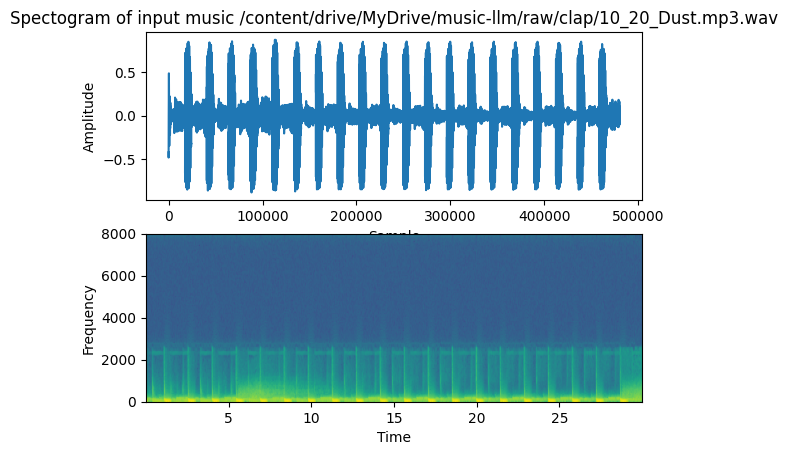

In [91]:
import matplotlib.pyplot as plot

 

# Plot the signal read from wav file

plot.subplot(211)

plot.title('Spectogram of input music {}'.format(inp_file))

 

plot.plot(waveform)

plot.xlabel('Sample')

plot.ylabel('Amplitude')

 

plot.subplot(212)

plot.specgram(waveform,Fs=16000)

plot.xlabel('Time')

plot.ylabel('Frequency')

 

plot.show()

 

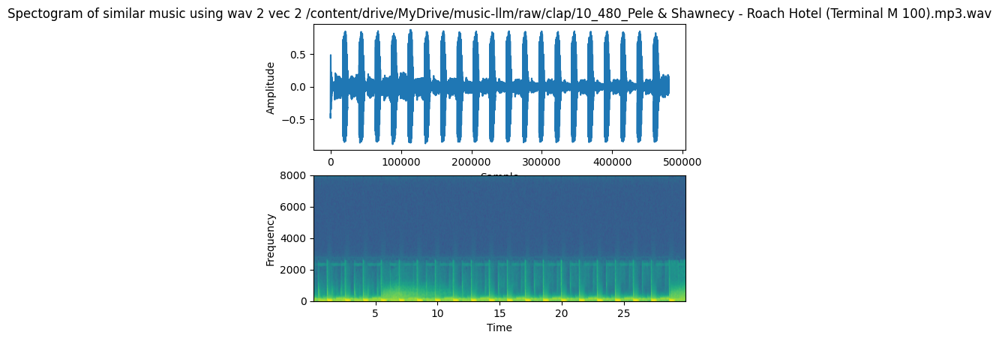

In [92]:
# Plot the signal read from wav file

plot.subplot(211)

plot.title('Spectogram of similar music using wav 2 vec 2 {}'.format(matched_file_clap))

waveform, sample_rate = torchaudio.load(matched_file_clap)
waveform = waveform.squeeze().numpy()

plot.plot(waveform)

plot.xlabel('Sample')

plot.ylabel('Amplitude')

 

plot.subplot(212)

plot.specgram(waveform,Fs=16000)

plot.xlabel('Time')

plot.ylabel('Frequency')

 

plot.show()

Text(0, 0.5, 'Frequency')

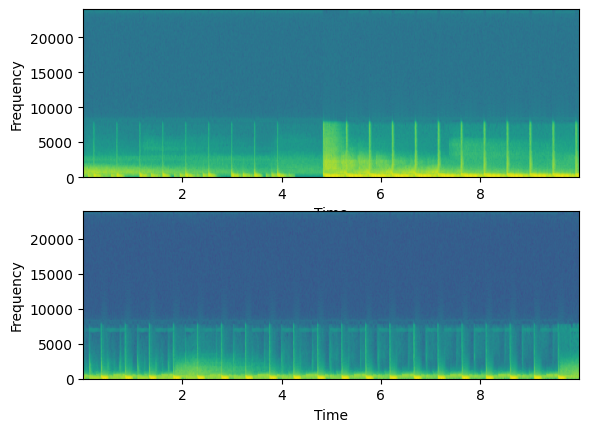

In [93]:
plot.subplot(211)
waveform, sample_rate = torchaudio.load(inp_file)
waveform = waveform.squeeze().numpy()

plot.specgram(waveform,Fs=48000)

plot.xlabel('Time')

plot.ylabel('Frequency')


plot.subplot(212)
waveform, sample_rate = torchaudio.load(matched_file_clap)
waveform = waveform.squeeze().numpy()

plot.specgram(waveform,Fs=48000)

plot.xlabel('Time')

plot.ylabel('Frequency')

